<a href="https://colab.research.google.com/github/vgarcialopezm/ABC-SMC/blob/main/Copia_de_seq_MC_euler_pruebasbayesianocon_online.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [29]:

import numpy as np
from scipy.stats import norm, uniform, multivariate_normal
from scipy.optimize import minimize
from scipy.special import logsumexp
import sys,ast
from math import exp
from math import log
from random import choices,seed,random
from tqdm import tqdm
#import p_tqdm
from functools import partial
import os
import matplotlib.pyplot as plt
from numpy import exp

epsilons=[250.0,200.0,150.0,100.0,90.0,80.0]
#epsilons=[50000.0,40000.0,30000.0,25000.0,20000]
#epsilons=[16.0,12.0,11.8,11.3,10.6,7.1,5.2]

parametros=[1,1]#1,1]
print(type(parametros))

params_tumor = [ # list of parameters used in the lotka volterra model 
    {'name' : 'Dn', 'lower_limit':0.01,'upper_limit':7.0},# growing rate of prey in absence of repressor
    {'name' : 'Dc','lower_limit':50.0,'upper_limit':150.0},#susceptibility of prey 
    {'name' : 'am','lower_limit':20000.0,'upper_limit':29000.0},# extinction rate of predator
    {'name' : 'k1','lower_limit':0.0001,'upper_limit':3.0000},
    {'name' : 'betaf','lower_limit':10.0,'upper_limit':50.0}
]

<class 'list'>


In [4]:
handler=open('doblaredia3.txt')

# Nueva sección

In [5]:
datos=handler.read()
print(datos)

24.163   
27.358
31.633
34.039
38.274
39.835
39.934
39.934
39.934
39.93 
38.204
35.829
35.525
38.566
41.504
45.336
48.705
48.323
47.075
46.095
45.96 
45.572
45.572
44.509
42.632
41.07 
42.676
47.939
51.679
56.57 
59.239
56.762
53.897
48.094
48.937
50.442
52.776
51.723
52.528
51.906
53.35 
56.461
58.991
62.004
62.772
61.928
59.891
55.457
51.743
51.684
53.494
57.034
58.348
53.571
53.199
55.779
53.923
51.947
52.075
53.672
55.238
55.238
55.635
55.609
53.82 
51.8
51.759
53.189
54.875
57.224
59.054
58.528
54.97 
52.806
51.211
51.211
51.575
53.309
51.622
50.17 
49.054
48.3
48.794
48.794
48.37 
47.989
48.489
49.332
49.6
50.827
51.862
52.705
52.822
52.822
51.216
51.211
51.356
52.822
52.97 
53.441
53.046
54.152
55.538
56.044
56.795
57.654
57.654
57.654
57.127
56.284
56.044
56.044
54.686
53.
52.822
49.653
47.989
48.114
49.92 
52.702
55.766
57.654
57.403
57.138
56.673
55.238
55.641
56.484
56.37 
55.527
54.684
53.84 
56.567
61.616
64.604
64.16 
61.754
60.05 
58.785
57.833
59.266
59.761
63.712
68.89

In [7]:
datos = np.loadtxt('doblaredia3.txt', delimiter=',')


In [8]:
print(datos)

[24.163 27.358 31.633 34.039 38.274 39.835 39.934 39.934 39.934 39.93
 38.204 35.829 35.525 38.566 41.504 45.336 48.705 48.323 47.075 46.095
 45.96  45.572 45.572 44.509 42.632 41.07  42.676 47.939 51.679 56.57
 59.239 56.762 53.897 48.094 48.937 50.442 52.776 51.723 52.528 51.906
 53.35  56.461 58.991 62.004 62.772 61.928 59.891 55.457 51.743 51.684
 53.494 57.034 58.348 53.571 53.199 55.779 53.923 51.947 52.075 53.672
 55.238 55.238 55.635 55.609 53.82  51.8   51.759 53.189 54.875 57.224
 59.054 58.528 54.97  52.806 51.211 51.211 51.575 53.309 51.622 50.17
 49.054 48.3   48.794 48.794 48.37  47.989 48.489 49.332 49.6   50.827
 51.862 52.705 52.822 52.822 51.216 51.211 51.356 52.822 52.97  53.441
 53.046 54.152 55.538 56.044 56.795 57.654 57.654 57.654 57.127 56.284
 56.044 56.044 54.686 53.    52.822 49.653 47.989 48.114 49.92  52.702
 55.766 57.654 57.403 57.138 56.673 55.238 55.641 56.484 56.37  55.527
 54.684 53.84  56.567 61.616 64.604 64.16  61.754 60.05  58.785 57.833
 59.266 5

In [6]:
datosdia6=np.loadtxt('datosdia6.txt', delimiter=',')


In [9]:

taup=4800   #*deltat  #*deltat
beta1=2.5
a3H0=0.0085
d1=0.2
a0=0.45185
a1=0.51
a2=1
d2=0.1
e2f=1
#am=22446.951
beta=0.4980
#value of p6/p3 set to 1
p6p3=1
#c critico
# Calculate the value of c_cr using the parameters above and the expression given in the document
#ccr=1-1/beta1*np.log(1/a3H0*(a1+(a2*d2/d1*e2f)*(1-1/(1-a0))))
ccr=1.0-((1.0/beta1)*np.log((1/a3H0)*(a1+((a2*d2)/(d1*e2f))*(1-1/(1-a0/((p6p3)*(p6p3)))))));
#Calculate a(G1/S) using the parameter values above
# aG1S=am*(c/ccr-1)**(-beta)
#aG1S=2e+04
nu=0.00001097

#Let's apply Newton Raphson method in order to obtain the values of lambda given in the document (it will be named lam)
x0=0.001
max_iter=20
tolerance=0.000001

# #Expression of the function to obtain the value of lambda
# f=lambda lam:taup/2-(exp(-(lam+nu)*aG1S)/(lam+nu+1/taup))
  
# #Fist derivative of th previos function 
# Df=lambda lam:(exp(-(lam+nu)*aG1S)*(-aG1S*(lam+nu+1/taup)-1))/(lam+nu+1/taup)**2



In [31]:
def newton_rapsi(c,am):
    #print('c',c)
        if c>ccr and c<0.78:
            aG1S=am*((c/ccr)-1)**(-beta)
        #else: 
        #  aG1S=10000000
            f=lambda lam:log(taup)-log(2)+lam*aG1S+nu*aG1S+log(lam+nu+1/taup)
  
    #Fist derivative of th previos function 
            Df=lambda lam: aG1S+1/(lam+nu+1/taup)
    #tabla = []
        
            
            section = abs(2*tolerance)
            xi = x0
            while (section>=tolerance):
                xnew = xi - f(xi)/Df(xi)
            #print('xi',xi)
                section  = abs(xnew-xi)
            #print('section',section)
        #tabla.append([xi,xnew,section])
                xi = xnew
        elif c>0.78:
            xi=ccr*c
        else:
            xi=-0.45
        return xi
#xi=newton_raps(c)


In [12]:
#spatial grid
L=191
dx=0.4819 #0.4819 #J/(L)
J=dx*L
#x_grid = np.array([l*dx for l in range(J)])
x_grid=np.linspace(0,J,L)
#L=np.size(x_grid)
#time grid
T=3 #3 #final time (3 days)
N=3000 #300  #501  #NUMBER OF TIME STEPS
dt=T/(N-1) #time step (it is almost every 130 secs. 2 minutes approximately)

#t_grid = np.array([t*dt for t in range(N)])
t_grid=np.linspace(0,T,N)
#n=np.array(100 for k in range(L))
#System parameters
delta=dx**2/dt
#2.446347282384288
#111.86992687185797
#18511.269877994026
#D_n=4.07944 #2.446347282384288  #2.#*delta
#D_c=109.02  #109.13154630#60 #*delta
#sigma_u=D_n*dt/(dx**2)
#sigma_v=D_c*dt/(dx**2)
#k1=1.45773318
k2=0.0942
#c=0.1
#beta_f=49.33  #THIS PARAMETER IS GIVEN, IT IS NOT NECESSARY TO ESTIMATE IT

In [9]:

x_grid

array([ 0.        ,  0.48443632,  0.96887263,  1.45330895,  1.93774526,
        2.42218158,  2.90661789,  3.39105421,  3.87549053,  4.35992684,
        4.84436316,  5.32879947,  5.81323579,  6.29767211,  6.78210842,
        7.26654474,  7.75098105,  8.23541737,  8.71985368,  9.20429   ,
        9.68872632, 10.17316263, 10.65759895, 11.14203526, 11.62647158,
       12.11090789, 12.59534421, 13.07978053, 13.56421684, 14.04865316,
       14.53308947, 15.01752579, 15.50196211, 15.98639842, 16.47083474,
       16.95527105, 17.43970737, 17.92414368, 18.40858   , 18.89301632,
       19.37745263, 19.86188895, 20.34632526, 20.83076158, 21.31519789,
       21.79963421, 22.28407053, 22.76850684, 23.25294316, 23.73737947,
       24.22181579, 24.70625211, 25.19068842, 25.67512474, 26.15956105,
       26.64399737, 27.12843368, 27.61287   , 28.09730632, 28.58174263,
       29.06617895, 29.55061526, 30.03505158, 30.51948789, 31.00392421,
       31.48836053, 31.97279684, 32.45723316, 32.94166947, 33.42

[24.163 27.358 31.633 34.039 38.274 39.835 39.934 39.934 39.934 39.93
 38.204 35.829 35.525 38.566 41.504 45.336 48.705 48.323 47.075 46.095
 45.96  45.572 45.572 44.509 42.632 41.07  42.676 47.939 51.679 56.57
 59.239 56.762 53.897 48.094 48.937 50.442 52.776 51.723 52.528 51.906
 53.35  56.461 58.991 62.004 62.772 61.928 59.891 55.457 51.743 51.684
 53.494 57.034 58.348 53.571 53.199 55.779 53.923 51.947 52.075 53.672
 55.238 55.238 55.635 55.609 53.82  51.8   51.759 53.189 54.875 57.224
 59.054 58.528 54.97  52.806 51.211 51.211 51.575 53.309 51.622 50.17
 49.054 48.3   48.794 48.794 48.37  47.989 48.489 49.332 49.6   50.827
 51.862 52.705 52.822 52.822 51.216 51.211 51.356 52.822 52.97  53.441
 53.046 54.152 55.538 56.044 56.795 57.654 57.654 57.654 57.127 56.284
 56.044 56.044 54.686 53.    52.822 49.653 47.989 48.114 49.92  52.702
 55.766 57.654 57.403 57.138 56.673 55.238 55.641 56.484 56.37  55.527
 54.684 53.84  56.567 61.616 64.604 64.16  61.754 60.05  58.785 57.833
 59.266 5

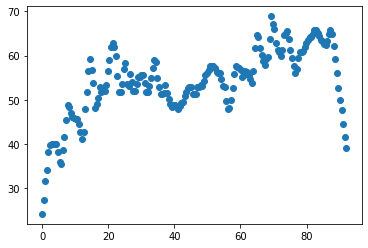

In [16]:
#Initial value for population
#U = np.array([100 for i in range(0,L)])
U = datos #np.array([100 for i in range (0,L)])
#U = np.array([4259.0 for i in range(0,L)]) #lo que ha puedto pilar
print(U)

#c_est=np.array(D_c*beta_f/(J*(k1*U+k2)))
#c_est=D_c*beta_f/(L*(k1*np.mean(U)+k2))

#Initial value for oxygen concentration
#V = np.array([c_est for i in range (0,L)])
#V = np.array([4.82 for i in range(0,L)])
#V=c_est
#V = np.array([10 for i in range(0,L)])  #lo que ha puesto pilar
#print(V)

#graphic of the initial population and oxygen concentration
#fig,axs = plt.subplots(1)
#axs[0].plot(x_grid,U)
#axs[1].plot(x_grid,V,'o')
#axs[2].plot(x_grid,U,x_grid,V)
plt.plot(x_grid, U,'o')
plt.show()
# plt.ylabel('population')
# 
# plt.plot(x_grid, V)
# plt.show()

#pyplot.plot(x_grid, U)
#pyplot.plot(x_grid, V)
#pyplot.show()


In [17]:
fu=lambda lamda_vect, Ui: lamda_vect*Ui

#aux=np.zeros(L)
#aux[-1]= 4*dx*beta_f*sigma_v
#aux[0]= 4*dx*betaf*sigma_v
g=lambda Ui,Vi,k1: -k1*(Ui*Vi)-k2*Vi   #+aux

In [ ]:
def euler_expl(fu,g,betaf,Dn,Dc,a_m,U,L,k1):
    
    c_est=Dc*betaf/(L*(k1*np.mean(U)+k2))
    #Initial value for oxygen concentration
    V = np.array([c_est for i in range (0,L)])
    sigma_u=Dn*dt/(dx**2)
    #print(sigma_u)
    sigma_v=Dc*dt/dx**2 #Dc*dt/(dx**2)
    #print(sigma_v)
    aux=np.zeros(L)
    aux[-1]= 2*dx*betaf*sigma_v
    #pob=np.zeros([N,L])
    #oxi=np.zeros([N,L])
    lamda_vect=np.zeros(L)
    #pob[0,:]=U
    #print(pob[0,:])
    #oxi[0,:]=V
    

    aux[-1]= 2.*dx*betaf*sigma_v
    #Matrices for Crank Nicholson in equation of population of cells
    A_n = np.diagflat([-sigma_u for i in range(L-2)]+[-2.*sigma_u], -1) +\
      np.diagflat([1.+2.*sigma_u for i in range(L)]) +\
      np.diagflat([-2.*sigma_u]+[-sigma_u for i in range(L-2)], 1)
    #print(A_n)

    #Matrices for Crank Nicholson in equation of oxygen
    A_c = np.diagflat([-sigma_v for i in range(L-2)]+[-2.*sigma_v], -1) +\
      np.diagflat([1.+2.*sigma_v for i in range(L)]) +\
      np.diagflat([-2.*sigma_v]+[-sigma_v for i in range(L-2)], 1)
    #print(A_c)
    
    
    
    for ti in range(N):
        lamda_vect=np.zeros(L)
        for i in range(L):
            xi=newton_rapsi(V[i],a_m)
            lamda_vect[i]=xi #np.longfloat(xi)
        #print(lamda_vect)
        #print('step',ti)
        rhsU=U+dt*fu(lamda_vect,U)
        U_new = np.linalg.solve(A_n, rhsU)
        #print('U',U_new)
        rhsV=V+dt*g(U,V,k1)  +aux
        V_new = np.linalg.solve(A_c,rhsV)
        #V_new = np.linalg.inv(A_c)@rhsV
        #print('V',V_new)
        #V_new = np.linalg.inv(A_c)@rhsV
        #print('V',V_new)
        V = V_new
        U = U_new
    
    return U,V 





In [32]:
def crank_nic(fu,g,Dn,Dc,a_m,U,L,k1,betaf):
    sigma_u=Dn*dt/(dx**2)
    sigma_v=Dc*dt/(dx**2)
    c_est=Dc*betaf/(L*(k1*np.mean(U)+k2))
    aux=np.zeros(L)
    aux[-1]= 4*dx*betaf*sigma_v
    
    V = np.array([c_est for i in range (0,L)])
    aux=np.zeros(L)
    aux[-1]= 4*dx*betaf*sigma_v
    #Matrices for Crank Nicholson in equation of population of cells
    A_n = np.diagflat([-sigma_u for i in range(L-2)]+[-2*sigma_u], -1) +\
      np.diagflat([2.+2.*sigma_u for i in range(L)]) +\
      np.diagflat([-2.*sigma_u]+[-sigma_u for i in range(L-2)], 1)
    
    B_n = np.diagflat([sigma_u for i in range(L-2)]+[2.*sigma_u], -1) +\
      np.diagflat([2.-2.*sigma_u for i in range(L)]) +\
      np.diagflat([2.*sigma_u]+[sigma_u for i in range(L-2)], 1)
    #Matrices for Crank Nicholson in equation of oxygen
    A_c = np.diagflat([-sigma_v for i in range(L-2)]+[-2*sigma_v], -1) +\
      np.diagflat([2.+2.*sigma_v for i in range(L)]) +\
      np.diagflat([-2.*sigma_v]+[-sigma_v for i in range(L-2)], 1)
    
    B_c = np.diagflat([sigma_v for i in range(L-2)]+[2.*sigma_v], -1) +\
      np.diagflat([2.-2.*sigma_v for i in range(L)]) +\
      np.diagflat([2.*sigma_v]+[sigma_v for i in range(L-2)], 1)
    
    lamda_vect=np.zeros(L)
    for i in range(L):
        xi=newton_rapsi(V[i],a_m)
        lamda_vect[i]=xi #np.longfloat(xi)
    
    for ti in range(1,N):
        #print('step',ti)
        U_new = np.linalg.solve(A_n, B_n.dot(U) + dt*fu(lamda_vect,U))
        V_new = np.linalg.solve(A_c, B_c.dot(V) +dt*g(U,V,k1)+aux)
        lamda_vect=np.zeros(L)
        V = V_new
        #print(V_new)
        for i in range(L):
            xi=newton_rapsi(V[i],a_m)
            lamda_vect[i]=np.longfloat(xi)
        #print(lamda_vect)
        U = U_new
        #print(U_new)
    #print(V_new)
    return U,V 




In [19]:
print(datosdia6)

[  9.363   9.363  10.17   10.179  10.179  10.179  10.179  10.179  10.179
  10.179  10.179  10.847  11.81   11.81   11.81   11.81   11.81   11.81
  11.81   11.81   11.811  11.81   11.81   11.81   11.81   11.811  11.81
  11.81   11.81   11.811  11.81   12.091  12.625  12.625  12.625  12.625
  13.097  13.441  13.989  14.256  14.881  15.072  15.072  15.811  15.887
  15.887  15.072  15.148  15.887  15.887  16.078  16.703  16.437  16.192
  16.703  17.084  17.519  17.976  18.334  18.334  18.334  18.334  18.334
  18.334  18.334  19.858  19.965  19.92   18.334  18.334  18.334  18.685
  19.965  19.965  19.965  20.293  21.147  21.596  21.596  21.596  21.596
  21.596  22.191  23.678  24.043  24.752  24.859  24.859  24.859  24.859
  24.943  25.674  25.835  26.688  27.305  27.855  28.937  28.586  28.121
  28.548  29.867  31.575  32.199  31.619  31.383  32.039  32.199  32.199
  30.658  31.376  32.292  34.645  34.645  34.645  35.013  36.277  35.757
  34.645  34.982  35.835  37.101  38.358  38.235  37.

En estas gráficas de abajo parece que la población crece más en el lateral dónde hay más oxígeno, pero muy poco, además hacrecido la población del lado izquierdo respecto de la inicial, cuando debería haber bajado....

In [ ]:
def add_noise(mu,sigma,data):
    noise=np.random.normal(mu,sigma)
    data_noise=data+noise
    return data_noise


In [13]:
def euc_dist(data1, data2):
    if np.shape(data1) != np.shape(data2):
        print ("\n the dimensions of the datasets are different (%s v.s. %s)\n" % (len(data1), len(data2)))
        sys.exit()
    else:
        z=np.array((data1 - data2)**2)
        distance = np.sum(z)
        #print('dist',data1 - data2)

    if distance < 0:
        return [None]
    elif np.isnan(distance):
        distance=100000
        return distance
    else:
        return distance


In [27]:
def euc_disti(data1, data2):
    if np.shape(data1) != np.shape(data2):
        print ("\n the dimensions of the datasets are different (%s v.s. %s)\n" % (len(data1), len(data2)))
        sys.exit()
    else:
        distance = np.linalg.norm(data1 - data2)
        #print('dist',data1 - data2)

    if distance < 0:
        return [None]
    else:
        return distance


In [26]:
def prior():
### Generate a random parameter inside the limits stablished. The shape of the distribution can be changed if required
    prior = []
    for ipar,par in enumerate(params_tumor):
        prior.append(uniform.rvs(loc = par['lower_limit'],
                                 scale = par['upper_limit']-par['lower_limit'])) #par['upper_limit']))
        
       
    return prior


In [20]:
#function that given the values of the parameters, calculates the 

def evaluate_prev_pru(params):
    print('parameters',params)
    l=len(params)
    prior = 1
    for ipar,par in enumerate(params_tumor):
    #for i in range(l):
        prior *= uniform.pdf(params[ipar],loc = par['lower_limit'],
                                 scale = par['upper_limit']-par['lower_limit'])
        if prior==0:
            break   
      #  print('params i', params[i])
       # print('prior',prior)
    return prior


In [21]:
#function that, given a list of parameters sampled, perturbs it by applying a multivariate normal kernel
def perturb(listaprev,s):
    #print(listaprev)
    lista=np.asarray(listaprev) #.tolist()
    #mean_vec=np.mean(lista)
    cov_matrix=2.0*np.cov(lista.T)  #the covariance matrix for the multivariate normal perturbation kernel is given by this expression
    kernel=multivariate_normal(cov=cov_matrix)
    pert=s+kernel.rvs() # here we obtain the list of perturbed parameters
    pertur=pert.tolist()
    return pertur


In [22]:



#function that gives the denominator used to calculate the weights of every particle.
def weighting(i,j,N,sam,wei,sampre):
     denom=0
     #ker=1
     samprev=np.asarray(sampre)
     cov_matrix=2.0*np.cov(samprev.T)
     kernel=multivariate_normal(cov=cov_matrix)
     for k in range(N):
            #print('sample i j',type(sam[k]),sam[k])
           # print('sample i-1,j',type(sampre[k]),sampre[k])
            sampre[k]=np.array(sampre[k])
            #print('sampre',sampre[k])
            #cov_matrix=2.0*np.cov((sampre[k]).T)  #the covariance matrix for the multivariate normal perturbation kernel is given by this expression
            #print('cov',cov_matrix)
            #kernel=multivariate_normal(cov=cov_matrix)
            # print('wei',wei[i-1,k])
            #print('sam[j]',sam[j])
            #print('sampre[k]',sampre[k])
            ker=kernel.pdf(sam[j]-sampre[k])
            #print('ker',ker)
            #kerne=np.prod(ker)  #here we are obtaining the joint probability of the parameter vector obtained when applying the kernel
            denom+=wei[k]*ker #kerne
            #print('kernel',kernel.cdf(sam[k]-sampre[k]))
     #print('den',denom)      
     return denom


    


In [23]:
#function used to normalize the weights
def normalize(wei):
    #normalized=wei/np.linalg.norm(wei)
    normalized=wei/np.sum(wei)
    return normalized  



In [33]:
def principal(epsilons,listaparametros,N,data1):
   # accepted_distances = np.loadtxt('smc/distances_{}_{}_{}_{}.out'.format(model,sto,gamma,prior_label))
    T=len(epsilons)
    weight=np.zeros((T,N),float)
    dist=np.zeros((T,N),float)
    sample=np.zeros((T,N),list)
    #X0=[Ui,Vi]
    #t=np.linspace(0.,10,10)
    for i in range(T):
        count=0
        counti=0
        label=i
        print("SMC step with target distance: {}".format(epsilons[i]))
        if i==0:
            for j in range (N):
                dist[i,j]=epsilons[i]+1
                while dist[i,j]>epsilons[i]:
                    sample[i,j]=prior()
                    #sample[i,j]=np.array(prior())
                    sample[i,j]=np.asarray(sample[i,j])
                    print(sample[i,j][0])
                    print(sample[i,j][1])
                    print(sample[i,j][2])
                    print(sample[i,j][3])
                    print(sample[i,j][4])
                    data2= np.array(crank_nic(fu,g,sample[i,j][0],sample[i,j][1],sample[i,j][2],U,L,sample[i,j][3],sample[i,j][4])).T
                    print('oxigeno',data2[:,1])
                    data2=np.array(data2[:,0])
                    print('data2',data2)
                    print('data1',data1)
                    #print('data2',data2)
                    #data2=np.array(data2, dtype=np.float64)
                    dist[i,j]=euc_disti(data1,data2)
                    print('distcondata2',dist[i,j])
                    plt.plot(x_grid,datosdia6,'o')
                    plt.plot(x_grid,data2,'*')
                    plt.show()
                count+=1
                print(count)
       
        else:
        
            for j in range (N):
                dist[i,j]=epsilons[i]+1
                while dist[i,j]>epsilons[i]:
                    seed()
                    np.random.seed()
                    choose = choices(sample[i-1,:], weights = weight[i-1,:],k=1)[0] # select a point from the previous sample
                    sample[i,j]=choose
                    #print("before perturb",type(sample[i,j]))
                    #print("before perturb",list(sample[i-1,:]))
                    sample[i,j] = perturb(list(sample[i-1,:]),sample[i,j]) # and perturb it
                    print("after perturb", sample[i,j])
                    #print("after perturb", type(sample[i,j]))
                    evaluation=evaluate_prev_pru(sample[i,j]) 
                    if evaluation>0:
                        data2= np.array(crank_nic(fu,g,sample[i,j][0],sample[i,j][1],sample[i,j][2],U,L,sample[i,j][3],sample[i,j][4])).T
                        print('oxigeno',data2[:,1])
                        data2=np.array(data2[:,0])
                        print('data2',data2)
                        print('data1',data1)
                        dist[i,j]=euc_disti(data1,data2)
                        print('distendata2',dist[i,j])
                        plt.plot(x_grid,datosdia6,'o')
                        plt.plot(x_grid,data2,'*')
                        plt.show()
                counti+=1
                print(counti)
        for j in range(N):
            if i==0:
                weight[i,j]=1
               # print(weight[i,j])
            else:
                denom=weighting(i,j,N,sample[i,:],weight[i-1,:],list(sample[i-1,:]))
                weight[i,j]=evaluate_prev_pru(sample[i,j])/denom
        #print('weight[i,:]',weight[i,:])
        if i!=0:
           weight[i,:]=normalize(weight[i,:])
           #print('weight[i,:] normalized',weight[i,:])
        #pars = np.loadtxt('smc_van/pars_{}.out'.format(i))
        #weights = np.loadtxt('smc_van/weights_{}.out'.format(i))
        #np.savetxt('smc_van/pars_{}.out'.format(i), sample[T-1,:])
        #np.savetxt('smc_van/weights_{}.out'.format(i), weight[T-1,:])
      #  np.savetxt('smc/distances_{}.out'.format(label), accepted_distances)
    #print('sample',sample[T-1,N-1])
    #print('weight',weight[T-1])
    #print('dist',dist[T-1])
    return sample, weight, dist,data2


SMC step with target distance: 250.0
4.418714888623944
86.03771521261925
21553.027376874783
0.26800447613185063
13.065363236893525
oxigeno [2.75384736e-07 2.75184567e-07 2.74586307e-07 2.73596659e-07
 2.72226700e-07 2.70491734e-07 2.68411110e-07 2.66007987e-07
 2.63309088e-07 2.60344424e-07 2.57147028e-07 2.53752692e-07
 2.50199723e-07 2.46528742e-07 2.42782518e-07 2.39005856e-07
 2.35245545e-07 2.31550368e-07 2.27971187e-07 2.24561099e-07
 2.21375666e-07 2.18473234e-07 2.15915328e-07 2.13767140e-07
 2.12098107e-07 2.10982589e-07 2.10500651e-07 2.10738957e-07
 2.11791786e-07 2.13762183e-07 2.16763258e-07 2.20919639e-07
 2.26369110e-07 2.33264444e-07 2.41775440e-07 2.52091221e-07
 2.64422771e-07 2.79005785e-07 2.96103823e-07 3.16011838e-07
 3.39060087e-07 3.65618481e-07 3.96101430e-07 4.30973215e-07
 4.70753974e-07 5.16026344e-07 5.67442866e-07 6.25734211e-07
 6.91718341e-07 7.66310720e-07 8.50535674e-07 9.45539061e-07
 1.05260238e-06 1.17315848e-06 1.30880910e-06 1.46134433e-06
 1.6327

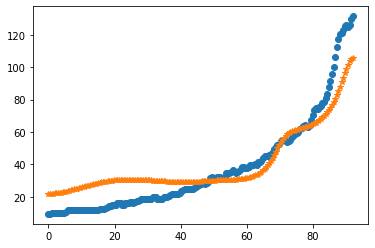

1
4.761903522649387
69.60844394684653
28611.2550253446
0.22352252193022712
17.70632199889896
oxigeno [2.90507792e-06 2.90254529e-06 2.89496781e-06 2.88240634e-06
 2.86496105e-06 2.84276966e-06 2.81600495e-06 2.78487182e-06
 2.74960387e-06 2.71045963e-06 2.66771866e-06 2.62167749e-06
 2.57264561e-06 2.52094163e-06 2.46688955e-06 2.41081546e-06
 2.35304439e-06 2.29389775e-06 2.23369097e-06 2.17273163e-06
 2.11131805e-06 2.04973807e-06 1.98826842e-06 1.92717425e-06
 1.86670904e-06 1.80711480e-06 1.74862255e-06 1.69145295e-06
 1.63581727e-06 1.58191850e-06 1.52995275e-06 1.48011074e-06
 1.43257963e-06 1.38754497e-06 1.34519295e-06 1.30571287e-06
 1.26929986e-06 1.23615787e-06 1.20650301e-06 1.18056719e-06
 1.15860211e-06 1.14088367e-06 1.12771676e-06 1.11944058e-06
 1.11643445e-06 1.11912415e-06 1.12798899e-06 1.14356950e-06
 1.16647591e-06 1.19739761e-06 1.23711344e-06 1.28650319e-06
 1.34656031e-06 1.41840599e-06 1.50330474e-06 1.60268179e-06
 1.71814234e-06 1.85149294e-06 2.00476533e-06

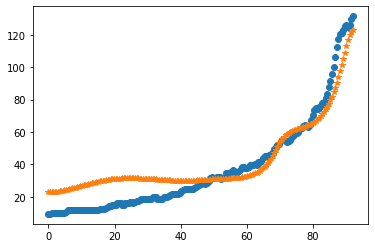

2
2.9178491470403194
127.71830744591436
23904.484828087934
1.5893556329437868
29.595219041045077
oxigeno [5.56274038e-17 5.65716646e-17 5.94375924e-17 6.43259818e-17
 7.14094074e-17 8.09393005e-17 9.32562697e-17 1.08804099e-16
 1.28148018e-16 1.51998023e-16 1.81238244e-16 2.16963642e-16
 2.60525612e-16 3.13588514e-16 3.78199626e-16 4.56875643e-16
 5.52709626e-16 6.69503253e-16 8.11930433e-16 9.85739831e-16
 1.19800570e-15 1.45743876e-15 1.77477163e-15 2.16323701e-15
 2.63916120e-15 3.22270086e-15 3.93875804e-15 4.81811663e-15
 5.89885419e-15 7.22809574e-15 8.86419256e-15 1.08794285e-14
 1.33633810e-14 1.64270944e-14 2.02082586e-14 2.48776342e-14
 3.06470162e-14 3.77791008e-14 4.65996978e-14 5.75128338e-14
 7.10194155e-14 8.77402690e-14 1.08444562e-13 1.34084840e-13
 1.65840186e-13 2.05169374e-13 2.53876300e-13 3.14190522e-13
 3.88866401e-13 4.81305148e-13 5.95705096e-13 7.37246778e-13
 9.12320909e-13 1.12880926e-12 1.39643074e-12 1.72716777e-12
 2.13579148e-12 2.64050848e-12 3.26375676

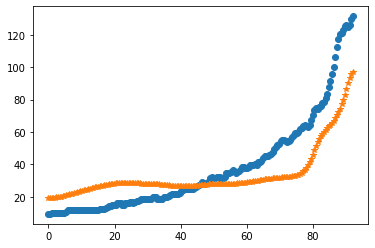

3
4.306881925965545
143.96379394821483
27429.128279209788
2.6680882882901757
25.462945001580284
oxigeno [1.48728312e-20 1.52373484e-20 1.63490817e-20 1.82635738e-20
 2.10767814e-20 2.49303651e-20 3.00195332e-20 3.66039095e-20
 4.50220799e-20 5.57106969e-20 6.92293027e-20 8.62923893e-20
 1.07810663e-19 1.34944069e-19 1.69169873e-19 2.12370061e-19
 2.66943580e-19 3.35950519e-19 4.23297456e-19 5.33975861e-19
 6.74368971e-19 8.52647058e-19 1.07927691e-18 1.36767894e-18
 1.73507527e-18 2.20358475e-18 2.80163779e-18 3.56580486e-18
 4.54316084e-18 5.79434287e-18 7.39750626e-18 9.45344275e-18
 1.20922034e-17 1.54816680e-17 1.98386332e-17 2.54431564e-17
 3.26571085e-17 4.19481637e-17 5.39208105e-17 6.93564236e-17
 8.92650251e-17 1.14952116e-16 1.48104932e-16 1.90903715e-16
 2.46165207e-16 3.17527604e-16 4.09688882e-16 5.28713757e-16
 6.82428929e-16 8.80931836e-16 1.13724531e-15 1.46815977e-15
 1.89531630e-15 2.44659919e-15 3.15792585e-15 4.07554658e-15
 5.25899862e-15 6.78489908e-15 8.75181275e

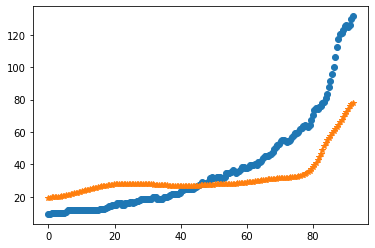

4.517027966419755
103.7829321750857
23498.811288348137
2.3283580237403103
17.411218944563608
oxigeno [7.57997109e-23 7.81518791e-23 8.53559458e-23 9.78645357e-23
 1.16465873e-22 1.42337139e-22 1.77124548e-22 2.23056001e-22
 2.83094600e-22 3.61144381e-22 4.62323544e-22 5.93325629e-22
 7.62895799e-22 9.82458330e-22 1.26694313e-21 1.63587474e-21
 2.11480788e-21 2.73722130e-21 3.54701791e-21 4.60182814e-21
 5.97737807e-21 7.77327012e-21 1.01206391e-20 1.31922995e-20
 1.72162040e-20 2.24933060e-20 2.94212801e-20 3.85260398e-20
 5.05036358e-20 6.62759733e-20 8.70649359e-20 1.14491018e-19
 1.50704595e-19 1.98560657e-19 2.61851391e-19 3.45615775e-19
 4.56551618e-19 6.03563883e-19 7.98494182e-19 1.05709106e-18
 1.40030012e-18 1.85597886e-18 2.46117508e-18 3.26515305e-18
 4.33341096e-18 5.75301243e-18 7.63965881e-18 1.01470670e-17
 1.34793994e-17 1.79077330e-17 2.37918728e-17 3.16092310e-17
 4.19930505e-17 5.57829747e-17 7.40919268e-17 9.83945278e-17
 1.30643937e-16 1.73426189e-16 2.30163968e-16

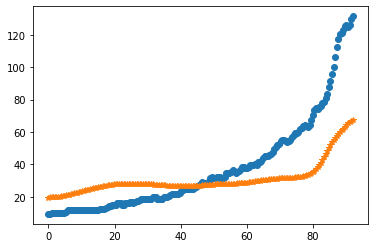

2.9627376784709094
63.541847073196
21512.538750291395
1.8130661029480233
24.807281908197638
oxigeno [3.77336167e-26 3.93115895e-26 4.41786665e-26 5.27463276e-26
 6.57415464e-26 8.42727154e-26 1.09930699e-25 1.44934816e-25
 1.92337978e-25 2.56311047e-25 3.42534401e-25 4.58735433e-25
 6.15425484e-25 8.26909989e-25 1.11267364e-24 1.49928108e-24
 2.02298722e-24 2.73332552e-24 3.69804580e-24 5.00991613e-24
 6.79610246e-24 9.23111657e-24 1.25547084e-23 1.70966149e-23
 2.33108271e-23 3.18230761e-23 4.34966958e-23 5.95240430e-23
 8.15534829e-23 1.11865887e-22 1.53620089e-22 2.11194392e-22
 2.90661905e-22 4.00452330e-22 5.52273497e-22 7.62394662e-22
 1.05343348e-21 1.45684392e-21 2.01637891e-21 2.79290788e-21
 3.87111573e-21 5.36881269e-21 7.44986434e-21 1.03421372e-20
 1.43623885e-20 1.99507625e-20 2.77185723e-20 3.85144410e-20
 5.35158096e-20 7.43554778e-20 1.03296521e-19 1.43473992e-19
 1.99228813e-19 2.76568891e-19 3.83805794e-19 5.32433596e-19
 7.38341680e-19 1.02348787e-18 1.41820574e-18 

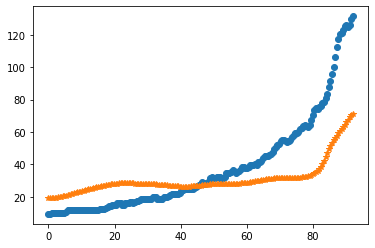

5.052416429059113
81.90462575222335
24451.314968608276
2.4803590787314302
46.53388322683596
oxigeno [1.62450777e-26 1.69402830e-26 1.90857318e-26 2.28663202e-26
 2.86087220e-26 3.68110265e-26 4.81881623e-26 6.37375120e-26
 8.48311188e-26 1.13343533e-25 1.51827935e-25 2.03758059e-25
 2.73860175e-25 3.68568643e-25 4.96651388e-25 6.70069341e-25
 9.05158523e-25 1.22425752e-24 1.65795051e-24 2.24816179e-24
 3.05242950e-24 4.14981361e-24 5.64907086e-24 7.69997694e-24
 1.05090210e-23 1.43611789e-23 1.96501420e-23 2.69203157e-23
 3.69252066e-23 5.07086409e-23 6.97177983e-23 9.59605937e-23
 1.32224885e-22 1.82383883e-22 2.51821756e-22 3.48026817e-22
 4.81418334e-22 6.66498988e-22 9.23461144e-22 1.28042536e-21
 1.77655942e-21 2.46642338e-21 3.42602067e-21 4.76122283e-21
 6.61949488e-21 9.20620832e-21 1.28073284e-20 1.78209535e-20
 2.48011419e-20 3.45187894e-20 4.80461526e-20 6.68741527e-20
 9.30751016e-20 1.29528337e-19 1.80232942e-19 2.50740960e-19
 3.48757238e-19 4.84969574e-19 6.74196992e-19 

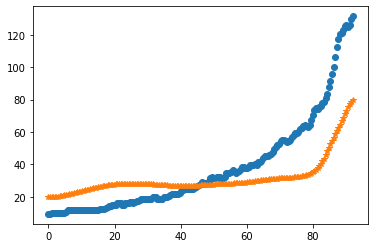

5.368342302967781
117.90675424223129
22036.394261094694
0.8893215373329835
28.386053668228985
oxigeno [2.24221861e-13 2.26776254e-13 2.34498967e-13 2.47570184e-13
 2.66295571e-13 2.91114463e-13 3.22611652e-13 3.61533111e-13
 4.08806101e-13 4.65564230e-13 5.33178183e-13 6.13293011e-13
 7.07873047e-13 8.19255750e-13 9.50216044e-13 1.10404301e-12
 1.28463122e-12 1.49658927e-12 1.74536891e-12 2.03741832e-12
 2.38036425e-12 2.78322832e-12 3.25668383e-12 3.81336075e-12
 4.46820782e-12 5.23892241e-12 6.14646083e-12 7.21564397e-12
 8.47587595e-12 9.96199678e-12 1.17152935e-11 1.37846991e-11
 1.62282133e-11 1.91145862e-11 2.25253117e-11 2.65569871e-11
 3.13241050e-11 3.69623558e-11 4.36325300e-11 5.15251301e-11
 6.08658172e-11 7.19218407e-11 8.50096254e-11 1.00503722e-10
 1.18847363e-10 1.40564900e-10 1.66276474e-10 1.96715284e-10
 2.32747942e-10 2.75398431e-10 3.25876319e-10 3.85609964e-10
 4.56285588e-10 5.39893235e-10 6.38780830e-10 7.55717716e-10
 8.93969332e-10 1.05738492e-09 1.25050055e-0

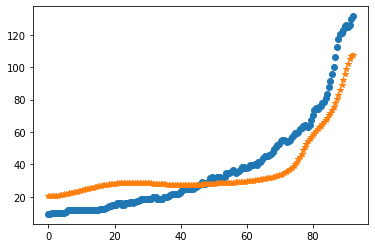

4
5.27833291091752
85.43799979834138
23403.824557679392
1.2387217057765498
16.00008242386352
oxigeno [1.04637172e-18 1.06954203e-18 1.14008804e-18 1.26116498e-18
 1.43820053e-18 1.67915760e-18 1.99492111e-18 2.39982906e-18
 2.91237575e-18 3.55612402e-18 4.36087475e-18 5.36415555e-18
 6.61310799e-18 8.16687418e-18 1.00996110e-17 1.25042950e-17
 1.54975238e-17 1.92255760e-17 2.38720621e-17 2.96675854e-17
 3.69019471e-17 4.59395720e-17 5.72390107e-17 7.13776065e-17
 8.90827043e-17 1.11271148e-16 1.39099284e-16 1.74026270e-16
 2.17894258e-16 2.73029934e-16 3.42373143e-16 4.29639783e-16
 5.39528123e-16 6.77980063e-16 8.52511924e-16 1.07263318e-15
 1.35037637e-15 1.70096754e-15 2.14367416e-15 2.70287714e-15
 3.40942571e-15 4.30234900e-15 5.43101759e-15 6.85787190e-15
 8.66186503e-15 1.09428051e-14 1.38268301e-14 1.74733078e-14
 2.20835282e-14 2.79116506e-14 3.52784845e-14 4.45888305e-14
 5.63532950e-14 7.12157199e-14 8.99876599e-14 1.13691701e-13
 1.43615861e-13 1.81381887e-13 2.29030940e-13

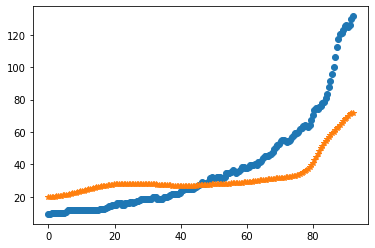

0.03682272296463926
94.7120684897997
26639.716375592892
2.5945387394446655
22.09802819833906
oxigeno [3.55713915e-25 3.65796840e-25 3.97607607e-25 4.55101398e-25
 5.44251398e-25 6.73927349e-25 8.55677734e-25 1.10428474e-24
 1.43927986e-24 1.88656220e-24 2.47945578e-24 3.25829066e-24
 4.27391010e-24 5.60036828e-24 7.35261250e-24 9.69840847e-24
 1.28773585e-23 1.72119638e-23 2.31013052e-23 3.10494484e-23
 4.17239735e-23 5.60310812e-23 7.51818851e-23 1.00776289e-22
 1.34841628e-22 1.79941938e-22 2.39586960e-22 3.19219326e-22
 4.27413819e-22 5.76617744e-22 7.84624736e-22 1.07488758e-21
 1.47560155e-21 2.02098814e-21 2.75386846e-21 3.73967131e-21
 5.07491900e-21 6.89420194e-21 9.37270275e-21 1.27505683e-20
 1.73570943e-20 2.36734001e-20 3.24128570e-20 4.46016704e-20
 6.16934977e-20 8.56444548e-20 1.19007736e-19 1.65021095e-19
 2.27674326e-19 3.12274100e-19 4.26712551e-19 5.82860300e-19
 7.97898589e-19 1.09408067e-18 1.49822929e-18 2.04854908e-18
 2.80015590e-18 3.82308546e-18 5.20934666e-18

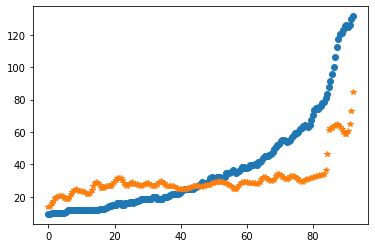

5.465689765774261
144.6563641084785
22749.90147648462
2.9515164992003977
17.073021562051444
oxigeno [1.36590949e-21 1.40310590e-21 1.51674624e-21 1.71310577e-21
 2.00305726e-21 2.40272007e-21 2.93442688e-21 3.62807092e-21
 4.52292147e-21 5.67002676e-21 7.13536268e-21 9.00393599e-21
 1.13851162e-20 1.44195539e-20 1.82881540e-20 2.32237130e-20
 2.95260200e-20 3.75814583e-20 4.78884705e-20 6.10906592e-20
 7.80198462e-20 9.97521243e-20 1.27680871e-19 1.63611917e-19
 2.09887673e-19 2.69549105e-19 3.46547216e-19 4.46019292e-19
 5.74649875e-19 7.41142624e-19 9.56837297e-19 1.23651664e-18
 1.59946185e-18 2.07083323e-18 2.68347643e-18 3.48028526e-18
 4.51729248e-18 5.86771231e-18 7.62722682e-18 9.92089754e-18
 1.29121998e-17 1.68148283e-17 2.19081200e-17 2.85571957e-17
 3.72392552e-17 4.85778960e-17 6.33878854e-17 8.27335528e-17
 1.08004915e-16 1.41016890e-16 1.84138546e-16 2.40461428e-16
 3.14018689e-16 4.10070259e-16 5.35473798e-16 6.99167070e-16
 9.12794922e-16 1.19152390e-15 1.55510019e-15 

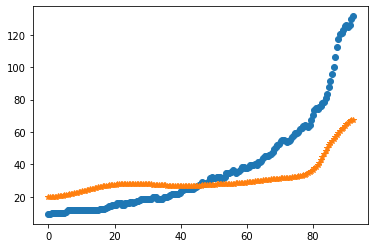

0.08209223476820159
76.24907433223306
28173.546099244457
1.0854909449322305
12.491562167794905
oxigeno [1.14017012e-18 1.16060700e-18 1.22366352e-18 1.33418397e-18
 1.49963915e-18 1.73006460e-18 2.03792517e-18 2.43834303e-18
 2.94984312e-18 3.59513611e-18 4.40150967e-18 5.40131005e-18
 6.63477002e-18 8.15654754e-18 1.00436832e-17 1.24015824e-17
 1.53679801e-17 1.91128854e-17 2.38362969e-17 2.97738663e-17
 3.72123889e-17 4.65089891e-17 5.81070841e-17 7.25484461e-17
 9.04841614e-17 1.12712100e-16 1.40282322e-16 1.74680278e-16
 2.18015687e-16 2.73140971e-16 3.43710380e-16 4.34094414e-16
 5.49223900e-16 6.94674813e-16 8.77212317e-16 1.10592836e-15
 1.39314433e-15 1.75482860e-15 2.21091811e-15 2.78655803e-15
 3.51427445e-15 4.43759176e-15 5.61522799e-15 7.12475399e-15
 9.06545268e-15 1.15592914e-14 1.47510035e-14 1.88086386e-14
 2.39291646e-14 3.03598890e-14 3.84360280e-14 4.86169688e-14
 6.15024090e-14 7.78198929e-14 9.84310964e-14 1.24418965e-13
 1.57166071e-13 1.98371248e-13 2.50145133e-

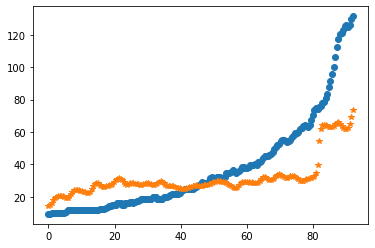

1.0254018890384953
99.3199158808227
22024.418267631594
1.3084877214768706
15.31097721235028
oxigeno [1.02270513e-17 1.04113548e-17 1.09715172e-17 1.19296320e-17
 1.33236527e-17 1.52091203e-17 1.76616531e-17 2.07803089e-17
 2.46919868e-17 2.95571203e-17 3.55769859e-17 4.30030284e-17
 5.21486579e-17 6.34040263e-17 7.72543426e-17 9.43023741e-17
 1.15295947e-16 1.41161554e-16 1.73045637e-16 2.12365805e-16
 2.60875150e-16 3.20743909e-16 3.94663955e-16 4.85982826e-16
 5.98875160e-16 7.38560402e-16 9.11576653e-16 1.12612178e-15
 1.39247494e-15 1.72351527e-15 2.13536039e-15 2.64815665e-15
 3.28706568e-15 4.08350875e-15 5.07675015e-15 6.31592317e-15
 7.86262543e-15 9.79423262e-15 1.22081013e-14 1.52268525e-14
 1.90049502e-14 2.37368202e-14 2.96667987e-14 3.71012746e-14
 4.64234941e-14 5.81116610e-14 7.27611785e-14 9.11121524e-14
 1.14083605e-13 1.42816216e-13 1.78725837e-13 2.23570488e-13
 2.79534141e-13 3.49331338e-13 4.36337634e-13 5.44752143e-13
 6.79800013e-13 8.47984660e-13 1.05740198e-12 

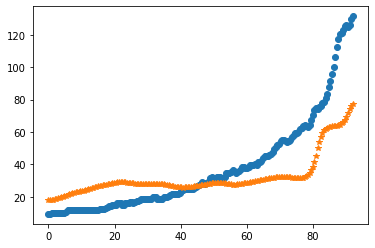

1.0992309265028033
84.02010104779372
28154.230767713365
2.812974928372058
28.8223022488651
oxigeno [7.89215071e-28 8.23191046e-28 9.28153573e-28 1.11351762e-27
 1.39604168e-27 1.80153635e-27 2.36748831e-27 3.14686986e-27
 4.21353927e-27 5.66982363e-27 7.65713117e-27 1.03707890e-26
 1.40807743e-26 1.91606451e-26 2.61278430e-26 3.56997277e-26
 4.88713639e-26 6.70234454e-26 9.20721650e-26 1.26677846e-25
 1.74536490e-25 2.40789093e-25 3.32598988e-25 4.59969379e-25
 6.36903913e-25 8.83055721e-25 1.22606916e-24 1.70490001e-24
 2.37451357e-24 3.31252144e-24 4.62854905e-24 6.47746259e-24
 9.07807660e-24 1.27396861e-23 1.78998213e-23 2.51781470e-23
 3.54536094e-23 4.99750099e-23 7.05194857e-23 9.96193414e-23
 1.40885893e-22 1.99470318e-22 2.82717147e-22 4.01087787e-22
 5.69461890e-22 8.08967376e-22 1.14955090e-21 1.63358733e-21
 2.32095018e-21 3.29613961e-21 4.67831137e-21 6.63539673e-21
 9.40399157e-21 1.33173792e-20 1.88450194e-20 2.66482011e-20
 3.76584863e-20 5.31882924e-20 7.50868048e-20 1

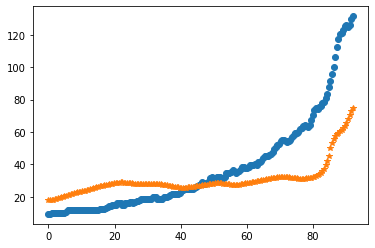

5.968181284457562
87.57864995639214
24179.685896002753
1.5217748022541147
33.0597588239245
oxigeno [2.80991441e-20 2.88271413e-20 3.10491091e-20 3.48810856e-20
 4.05236280e-20 4.82730011e-20 5.85377715e-20 7.18618030e-20
 8.89550433e-20 1.10733967e-19 1.38374143e-19 1.73378134e-19
 2.17662923e-19 2.73672264e-19 3.44520945e-19 4.34179999e-19
 5.47714487e-19 6.91588895e-19 8.74059522e-19 1.10567889e-18
 1.39994449e-18 1.77413356e-18 2.25037790e-18 2.85704811e-18
 3.63053744e-18 4.61756133e-18 5.87812266e-18 7.48933687e-18
 9.55036718e-18 1.21887937e-17 1.55688339e-17 1.99019539e-17
 2.54605664e-17 3.25957131e-17 4.17598885e-17 5.35364989e-17
 6.86778782e-17 8.81543371e-17 1.13217434e-16 1.45481573e-16
 1.87029199e-16 2.40546384e-16 3.09497513e-16 3.98350286e-16
 5.12865395e-16 6.60469356e-16 8.50734165e-16 1.09599416e-15
 1.41213900e-15 1.81963268e-15 2.34482247e-15 3.02161949e-15
 3.89365580e-15 5.01705163e-15 6.46396408e-15 8.32713584e-15
 1.07257233e-14 1.38127605e-14 1.77847131e-14 2

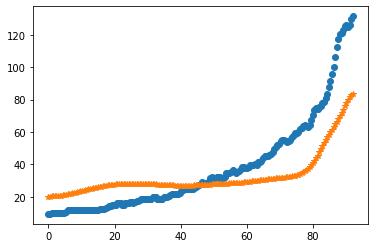

0.6217668338852708
94.07897260357637
22293.183332483917
2.283591538194311
41.20968233216927
oxigeno [1.05714205e-23 1.08935038e-23 1.18817516e-23 1.36039421e-23
 1.61789975e-23 1.97860126e-23 2.46772686e-23 3.11960128e-23
 3.98005279e-23 5.10970317e-23 6.58852090e-23 8.52215433e-23
 1.10506921e-22 1.43606050e-22 1.87007118e-22 2.44031102e-22
 3.19101987e-22 4.18092892e-22 5.48770043e-22 7.21368389e-22
 9.49351390e-22 1.25043559e-21 1.64800007e-21 2.17305287e-21
 2.86698813e-21 3.78543385e-21 5.00355265e-21 6.62321443e-21
 8.78252292e-21 1.16682818e-20 1.55321939e-20 2.07119786e-20
 2.76592635e-20 3.69771159e-20 4.94714847e-20 6.62226254e-20
 8.86848244e-20 1.18825515e-19 1.59318296e-19 2.13808514e-19
 2.87274859e-19 3.86515836e-19 5.20796240e-19 7.02697223e-19
 9.49227055e-19 1.28327266e-18 1.73550958e-18 2.34694390e-18
 3.17233283e-18 4.28481845e-18 5.78220524e-18 7.79542385e-18
 1.04998701e-17 1.41305291e-17 1.90021350e-17 2.55361185e-17
 3.42967747e-17 4.60399501e-17 6.17785969e-17 

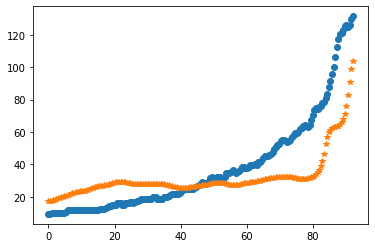

5.0471910840756395
98.14590918619709
25598.2977363698
0.30593624811821135
18.848514736408475
oxigeno [5.75491832e-08 5.75508083e-08 5.75564930e-08 5.75686668e-08
 5.75913843e-08 5.76303345e-08 5.76928552e-08 5.77879549e-08
 5.79263444e-08 5.81204802e-08 5.83846231e-08 5.87349147e-08
 5.91894756e-08 5.97685284e-08 6.04945498e-08 6.13924547e-08
 6.24898180e-08 6.38171361e-08 6.54081351e-08 6.73001293e-08
 6.95344351e-08 7.21568471e-08 7.52181831e-08 7.87749033e-08
 8.28898148e-08 8.76328671e-08 9.30820511e-08 9.93244117e-08
 1.06457185e-07 1.14589079e-07 1.23841701e-07 1.34351168e-07
 1.46269894e-07 1.59768601e-07 1.75038548e-07 1.92294034e-07
 2.11775171e-07 2.33750982e-07 2.58522848e-07 2.86428334e-07
 3.17845454e-07 3.53197403e-07 3.92957824e-07 4.37656652e-07
 4.87886618e-07 5.44310468e-07 6.07668999e-07 6.78789975e-07
 7.58598060e-07 8.48125849e-07 9.48526136e-07 1.06108556e-06
 1.18723979e-06 1.32859034e-06 1.48692336e-06 1.66423041e-06
 1.86273156e-06 2.08490100e-06 2.33349545e-06

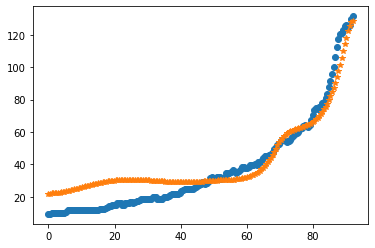

5
0.40625948410725826
74.67589345397786
20160.82587975102
2.789495574415076
41.39502645400133
oxigeno [2.05201195e-29 2.14605141e-29 2.43802150e-29 2.95874997e-29
 3.76387616e-29 4.94035377e-29 6.61594612e-29 8.97245500e-29
 1.22641154e-28 1.68437050e-28 2.32006664e-28 3.20180283e-28
 4.42579813e-28 6.12891219e-28 8.50712115e-28 1.18416086e-27
 1.65347547e-27 2.31591093e-27 3.25239150e-27 4.57661829e-27
 6.44771206e-27 9.08806575e-27 1.28090646e-26 1.80489875e-26
 2.54300245e-26 3.58450046e-26 5.05887357e-26 7.15531186e-26
 1.01508998e-25 1.44501993e-25 2.06397547e-25 2.95628441e-25
 4.24234660e-25 6.09349230e-25 8.75378361e-25 1.25725055e-24
 1.80527677e-24 2.59240787e-24 3.72505933e-24 5.35925684e-24
 7.72465582e-24 1.11599559e-23 1.61643031e-23 2.34704829e-23
 3.41473955e-23 4.97423349e-23 7.24795181e-23 1.05541990e-22
 1.53480599e-22 2.22815356e-22 3.22918742e-22 4.67297091e-22
 6.75421822e-22 9.75322989e-22 1.40726410e-21 2.02898937e-21
 2.92328996e-21 4.20899244e-21 6.05694550e-2

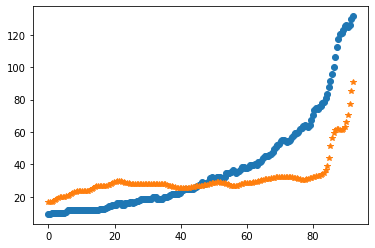

1.252901837332847
68.84992405372819
21382.120953005724
1.9841903186170324
29.011392505462332
oxigeno [3.94259780e-26 4.09885407e-26 4.58038468e-26 5.42665814e-26
 6.70750551e-26 8.52958058e-26 1.10462215e-25 1.44716457e-25
 1.91008496e-25 2.53371743e-25 3.37302861e-25 4.50283843e-25
 6.02498625e-25 8.07815577e-25 1.08513282e-24 1.46021830e-24
 1.96822500e-24 2.65712941e-24 3.59243763e-24 4.86364091e-24
 6.59309766e-24 8.94829666e-24 1.21588451e-23 1.65400657e-23
 2.25258310e-23 3.07142788e-23 4.19314407e-23 5.73197159e-23
 7.84607491e-23 1.07545935e-22 1.47612948e-22 2.02874036e-22
 2.79172347e-22 3.84617512e-22 5.30472987e-22 7.32397624e-22
 1.01218562e-21 1.40020657e-21 1.93882606e-21 2.68719403e-21
 3.72793313e-21 5.17645512e-21 7.19389992e-21 1.00050559e-20
 1.39231202e-20 1.93838500e-20 2.69926184e-20 3.75892266e-20
 5.23371895e-20 7.28468006e-20 1.01344867e-19 1.40908962e-19
 1.95790875e-19 2.71863388e-19 3.77237521e-19 5.23115408e-19
 7.24968861e-19 1.00416808e-18 1.39023255e-18

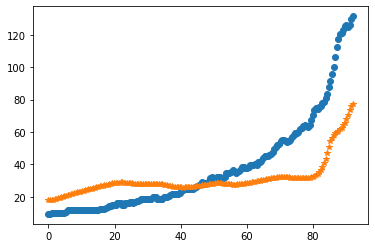

2.022440246905467
81.142060400957
26181.94079791116
2.855217777994847
46.761091083355
oxigeno [1.69881026e-28 1.77803373e-28 2.02321559e-28 2.45766769e-28
 3.12292048e-28 4.08305026e-28 5.43139640e-28 7.30041825e-28
 9.87579675e-28 1.34163698e-27 1.82821602e-27 2.49736891e-27
 3.41870799e-27 4.68913025e-27 6.44365163e-27 8.87061593e-27
 1.22330671e-26 1.68988188e-26 2.33828176e-26 3.24069130e-26
 4.49843176e-26 6.25391401e-26 8.70758200e-26 1.21419641e-25
 1.69558602e-25 2.37129939e-25 3.32113250e-25 4.65818883e-25
 6.54298586e-25 9.20360465e-25 1.29644936e-24 1.82876755e-24
 2.58317435e-24 3.65363849e-24 5.17435581e-24 7.33712996e-24
 1.04163104e-23 1.48045765e-23 2.10642763e-23 3.00010507e-23
 4.27693447e-23 6.10234833e-23 8.71337658e-23 1.24495213e-22
 1.77968192e-22 2.54506557e-22 3.64052228e-22 5.20808162e-22
 7.45048550e-22 1.06569174e-21 1.52395613e-21 2.17855394e-21
 3.11306954e-21 4.44644127e-21 6.34785341e-21 9.05789491e-21
 1.29186238e-20 1.84162844e-20 2.62419977e-20 3.7377

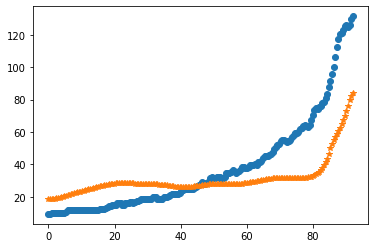

6.864607615372464
99.91554249980554
23140.386874124273
0.5995849029619836
28.525462652887605
oxigeno [4.41202066e-12 4.45486409e-12 4.58425287e-12 4.80278186e-12
 5.11484093e-12 5.52671430e-12 6.04672283e-12 6.68541295e-12
 7.45579645e-12 8.37364724e-12 9.45786201e-12 1.07308936e-11
 1.22192678e-11 1.39541953e-11 1.59722950e-11 1.83164451e-11
 2.10367831e-11 2.41918787e-11 2.78501093e-11 3.20912696e-11
 3.70084569e-11 4.27102750e-11 4.93234131e-11 5.69956600e-11
 6.58994275e-11 7.62358675e-11 8.82396813e-11 1.02184737e-10
 1.18390628e-10 1.37230330e-10 1.59139129e-10 1.84625048e-10
 2.14280994e-10 2.48798919e-10 2.88986330e-10 3.35785501e-10
 3.90295861e-10 4.53800035e-10 5.27794143e-10 6.14023034e-10
 7.14521244e-10 8.31660588e-10 9.68205432e-10 1.12737688e-09
 1.31292728e-09 1.52922662e-09 1.78136287e-09 2.07525814e-09
 2.41780350e-09 2.81701511e-09 3.28221510e-09 3.82424106e-09
 4.45568854e-09 5.19119171e-09 6.04774804e-09 7.04509388e-09
 8.20613857e-09 9.55746633e-09 1.11299160e-08

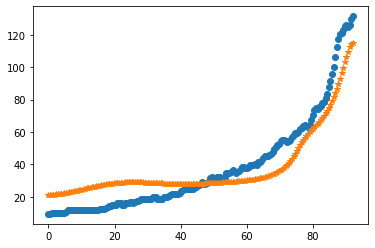

6
0.9542741682184978
74.39464829323894
28323.36053462873
0.9921455288037957
46.79778338053697
oxigeno [5.31943412e-18 5.42286822e-18 5.73754991e-18 6.27683311e-18
 7.06369749e-18 8.13185078e-18 9.52731903e-18 1.13105955e-17
 1.35594658e-17 1.63726822e-17 1.98747179e-17 2.42218849e-17
 2.96101400e-17 3.62849359e-17 4.45535089e-17 5.48000457e-17
 6.75042822e-17 8.32642872e-17 1.02824514e-16 1.27110703e-16
 1.57273888e-16 1.94746601e-16 2.41315320e-16 2.99214158e-16
 3.71245729e-16 4.60935863e-16 5.72729578e-16 7.12236531e-16
 8.86535588e-16 1.10455071e-15 1.37751486e-15 1.71954562e-15
 2.14836660e-15 2.68622190e-15 3.36104734e-15 4.20798029e-15
 5.27130916e-15 6.60698207e-15 8.28581249e-15 1.03975364e-14
 1.30558945e-14 1.64049367e-14 2.06267831e-14 2.59511326e-14
 3.26669030e-14 4.11365201e-14 5.18135624e-14 6.52647004e-14
 8.21971578e-14 1.03493232e-13 1.30253764e-13 1.63852855e-13
 2.06006593e-13 2.58859226e-13 3.25091041e-13 4.08053351e-13
 5.11937411e-13 6.41985843e-13 8.04757291e-1

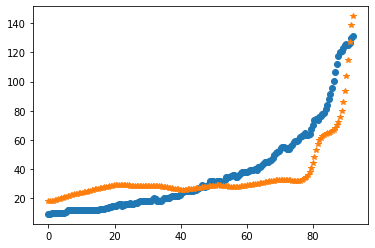

7
6.277648243149613
102.44507834495988
28636.317456493984
2.2297736505540353
30.91568557507415
oxigeno [1.85869804e-22 1.91605322e-22 2.09168300e-22 2.39651438e-22
 2.84955618e-22 3.47915383e-22 4.32486872e-22 5.44011563e-22
 6.89574647e-22 8.78483760e-22 1.12290262e-21 1.43868556e-21
 1.84647404e-21 2.37313555e-21 3.05365171e-21 3.93359588e-21
 5.07238611e-21 6.54755848e-21 8.46038485e-21 1.09432631e-20
 1.41694458e-20 1.83658570e-20 2.38299868e-20 3.09521773e-20
 4.02450364e-20 5.23822802e-20 6.82500532e-20 8.90147641e-20
 1.16212788e-19 1.51869125e-19 1.98654406e-19 2.60092688e-19
 3.40836525e-19 4.47031126e-19 5.86796509e-19 7.70865875e-19
 1.01343083e-18 1.33326034e-18 1.75518200e-18 2.31204246e-18
 3.04730171e-18 4.01846520e-18 5.30162334e-18 6.99745391e-18
 9.23915637e-18 1.22029366e-17 1.61218570e-17 2.13041255e-17
 2.81572376e-17 3.72198324e-17 4.92037101e-17 6.50492320e-17
 8.59983333e-17 1.13690710e-16 1.50290480e-16 1.98652901e-16
 2.62543715e-16 3.46927605e-16 4.58347359e-

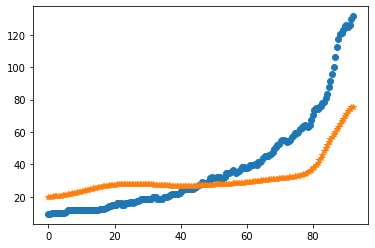

3.0655768678751114
74.22588231609075
27669.275894217877
0.28776643874401775
35.749839385320726
oxigeno [2.14172150e-07 2.13944276e-07 2.13263084e-07 2.12135798e-07
 2.10574251e-07 2.08594584e-07 2.06216852e-07 2.03464547e-07
 2.00364077e-07 1.96944210e-07 1.93235513e-07 1.89269817e-07
 1.85079714e-07 1.80698105e-07 1.76157815e-07 1.71491280e-07
 1.66730298e-07 1.61905857e-07 1.57048033e-07 1.52185940e-07
 1.47347743e-07 1.42560712e-07 1.37851319e-07 1.33245367e-07
 1.28768153e-07 1.24444654e-07 1.20299740e-07 1.16358415e-07
 1.12646087e-07 1.09188870e-07 1.06013923e-07 1.03149825e-07
 1.00627009e-07 9.84782355e-08 9.67391344e-08 9.54488080e-08
 9.46505106e-08 9.43924092e-08 9.47284351e-08 9.57192386e-08
 9.74332554e-08 9.99479006e-08 1.03350904e-07 1.07741803e-07
 1.13233614e-07 1.19954705e-07 1.28050889e-07 1.37687786e-07
 1.49053464e-07 1.62361417e-07 1.77853926e-07 1.95805841e-07
 2.16528862e-07 2.40376370e-07 2.67748890e-07 2.99100260e-07
 3.34944592e-07 3.75864130e-07 4.22518087e-

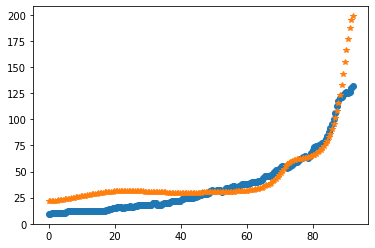

8
0.13119808462683996
107.063099384097
24365.35831448392
2.5698627799150184
13.054681791542366
oxigeno [1.30796011e-23 1.34243436e-23 1.44908911e-23 1.63758512e-23
 1.92414093e-23 2.33204899e-23 2.89251845e-23 3.64605784e-23
 4.64461937e-23 5.95431136e-23 7.65857928e-23 9.86329213e-23
 1.27075107e-22 1.63832971e-22 2.11634364e-22 2.74321986e-22
 3.57147938e-22 4.67028262e-22 6.12811163e-22 8.05734432e-22
 1.06021294e-21 1.39493611e-21 1.83415256e-21 2.40912053e-21
 3.16009514e-21 4.14005173e-21 5.42195860e-21 7.11062042e-21
 9.35783666e-21 1.23781772e-20 1.64629084e-20 2.19897684e-20
 2.94319291e-20 3.93804705e-20 5.26002007e-20 7.01288328e-20
 9.34002740e-20 1.24373596e-19 1.65687644e-19 2.20905720e-19
 2.94919437e-19 3.94570548e-19 5.29489047e-19 7.13087035e-19
 9.63628292e-19 1.30528478e-18 1.76920965e-18 2.39494249e-18
 3.23306651e-18 4.35063758e-18 5.84016795e-18 7.83080218e-18
 1.04989996e-17 1.40780693e-17 1.88721566e-17 2.52820797e-17
 3.38401205e-17 4.52509010e-17 6.04534384e-

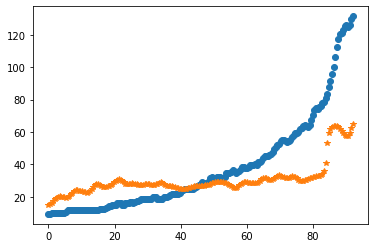

1.9669198316144634
56.03923166133061
28921.430696805663
1.7627316099845887
43.24655043619069
oxigeno [1.74045970e-27 1.82072323e-27 2.06901134e-27 2.50857517e-27
 3.18077673e-27 4.14929826e-27 5.50665730e-27 7.38373197e-27
 9.96333036e-27 1.34992835e-26 1.83431529e-26 2.49814910e-26
 3.40877737e-26 4.65947709e-26 6.37954364e-26 8.74836404e-26
 1.20150649e-25 1.65259710e-25 2.27630245e-25 3.13976107e-25
 4.33660727e-25 5.99758047e-25 8.30545137e-25 1.15160488e-24
 1.59879151e-24 2.22241745e-24 3.09316945e-24 4.31047471e-24
 6.01433952e-24 8.40211218e-24 1.17522333e-23 1.64579070e-23
 2.30748674e-23 3.23891823e-23 4.55135493e-23 6.40241158e-23
 9.01549155e-23 1.27074184e-22 1.79276920e-22 2.53142294e-22
 3.57724485e-22 5.05873590e-22 7.15822513e-22 1.01343082e-21
 1.43535364e-21 2.03351190e-21 2.88139168e-21 4.08291383e-21
 5.78491415e-21 8.19469553e-21 1.16047064e-20 1.64272328e-20
 2.32431653e-20 3.28705524e-20 4.64609705e-20 6.56350049e-20
 9.26727109e-20 1.30781350e-19 1.84471697e-19

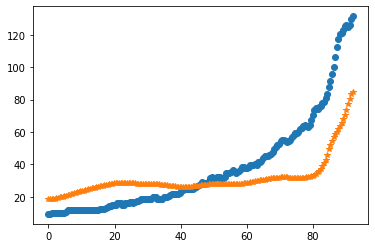

4.753551214417787
55.78638132415975
23267.49918032908
2.914084805077331
33.41436225712201
oxigeno [5.33207034e-35 5.73428810e-35 7.00174388e-35 9.32629114e-35
 1.30607034e-34 1.87738203e-34 2.73399695e-34 4.00773455e-34
 5.89582182e-34 8.69259878e-34 1.28372319e-33 1.89855120e-33
 2.81179880e-33 4.17030384e-33 6.19431546e-33 9.21474725e-33
 1.37296147e-32 2.04896689e-32 3.06285288e-32 4.58607319e-32
 6.87835931e-32 1.03337941e-31 1.55512326e-31 2.34420826e-31
 3.53954751e-31 5.35317023e-31 8.10915512e-31 1.23035072e-30
 1.86963418e-30 2.84539455e-30 4.33679003e-30 6.61933503e-30
 1.01171579e-29 1.54837841e-29 2.37270860e-29 3.64026345e-29
 5.59130109e-29 8.59712734e-29 1.32318742e-28 2.03836759e-28
 3.14268695e-28 4.84886973e-28 7.48623149e-28 1.15646229e-27
 1.78734035e-27 2.76345867e-27 4.27397159e-27 6.61161053e-27
 1.02292840e-26 1.58275085e-26 2.44893987e-26 3.78889804e-26
 5.86124873e-26 9.06536540e-26 1.40176812e-25 2.16691930e-25
 3.34862914e-25 5.17288805e-25 7.98778635e-25 1.

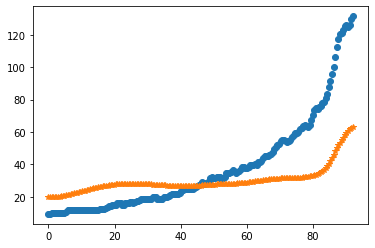

3.110985981843836
110.51164658702365
24825.10821760007
2.345770486498885
49.38218397520296
oxigeno [4.31192419e-22 4.43442258e-22 4.80900896e-22 5.45741113e-22
 6.41738701e-22 7.74515385e-22 9.51902075e-22 1.18444762e-21
 1.48610841e-21 1.87516692e-21 2.37544364e-21 3.01788772e-21
 3.84265922e-21 4.90185137e-21 6.26304850e-21 8.01397701e-21
 1.02685882e-20 1.31750196e-20 1.69260233e-20 2.17726385e-20
 2.80421329e-20 3.61615687e-20 4.66887830e-20 6.03531500e-20
 7.81092567e-20 1.01207636e-19 1.31288038e-19 1.70502496e-19
 2.21677795e-19 2.88530045e-19 3.75948177e-19 4.90368610e-19
 6.40270489e-19 8.36830349e-19 1.09478752e-18 1.43358792e-18
 1.87889551e-18 2.46458880e-18 3.23539690e-18 4.25037836e-18
 5.58750920e-18 7.34973017e-18 9.67291209e-18 1.27363406e-17
 1.67765084e-17 2.21052489e-17 2.91335626e-17 3.84029130e-17
 5.06263166e-17 6.67422759e-17 8.79855569e-17 1.15980055e-16
 1.52860628e-16 2.01432915e-16 2.65382963e-16 3.49552131e-16
 4.60297543e-16 6.05964566e-16 7.97505912e-16 1

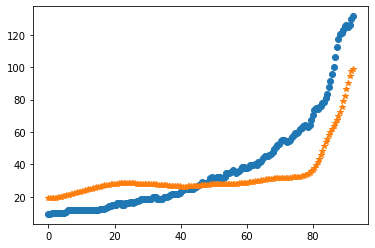

5.111601631354413
112.5040918801281
20531.296817009475
0.3223542766563158
15.868710129483489
oxigeno [3.96168569e-08 3.97031840e-08 3.99633224e-08 4.04007558e-08
 4.10213295e-08 4.18333104e-08 4.28474726e-08 4.40772087e-08
 4.55386709e-08 4.72509421e-08 4.92362405e-08 5.15201607e-08
 5.41319554e-08 5.71048605e-08 6.04764689e-08 6.42891587e-08
 6.85905804e-08 7.34342105e-08 7.88799781e-08 8.49949731e-08
 9.18542445e-08 9.95416988e-08 1.08151110e-07 1.17787252e-07
 1.28567171e-07 1.40621604e-07 1.54096570e-07 1.69155147e-07
 1.85979450e-07 2.04772843e-07 2.25762395e-07 2.49201615e-07
 2.75373493e-07 3.04593872e-07 3.37215190e-07 3.73630635e-07
 4.14278730e-07 4.59648426e-07 5.10284726e-07 5.66794906e-07
 6.29855388e-07 7.00219350e-07 7.78725113e-07 8.66305431e-07
 9.63997743e-07 1.07295551e-06 1.19446076e-06 1.32993792e-06
 1.48096917e-06 1.64931140e-06 1.83691492e-06 2.04594424e-06
 2.27880103e-06 2.53814941e-06 2.82694407e-06 3.14846117e-06
 3.50633257e-06 3.90458351e-06 4.34767422e-06

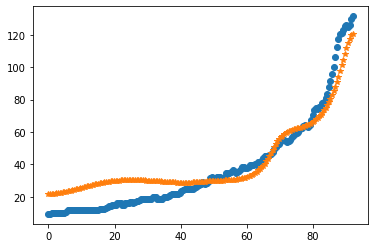

9
0.2599937411725386
114.10643685430342
23420.641771575523
1.6343368288311229
20.784822477193416
oxigeno [2.77398529e-18 2.82164313e-18 2.96727421e-18 3.21885038e-18
 3.58967579e-18 4.09847342e-18 4.76960509e-18 5.63350049e-18
 6.72738770e-18 8.09647556e-18 9.79590088e-18 1.18939872e-17
 1.44774333e-17 1.76586645e-17 2.15847799e-17 2.64468337e-17
 3.24882387e-17 4.00120858e-17 4.93887153e-17 6.10659923e-17
 7.55845775e-17 9.35993700e-17 1.15908075e-16 1.43490500e-16
 1.77567741e-16 2.19695145e-16 2.71900491e-16 3.36865139e-16
 4.18126023e-16 5.20263751e-16 6.49050386e-16 8.11565786e-16
 1.01634741e-15 1.27368763e-15 1.59619183e-15 1.99964148e-15
 2.50412165e-15 3.13537137e-15 3.92643815e-15 4.91987156e-15
 6.17072733e-15 7.75049270e-15 9.75174382e-15 1.22930784e-14
 1.55238423e-14 1.96285613e-14 2.48318871e-14 3.14061120e-14
 3.96842575e-14 5.00812753e-14 6.31233907e-14 7.94824102e-14
 1.00011108e-13 1.25779583e-13 1.58118390e-13 1.98677128e-13
 2.49505923e-13 3.13166619e-13 3.92882035

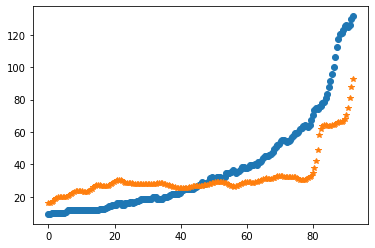

1.270415157898557
52.25435881784964
22469.550064925657
1.7247080290521062
35.47022376387825
oxigeno [3.07471222e-28 3.22251062e-28 3.68041741e-28 4.49354691e-28
 5.74252775e-28 7.55228724e-28 1.01056856e-27 1.36635371e-27
 1.85933082e-27 2.54098202e-27 3.48327253e-27 4.78675315e-27
 6.59197478e-27 9.09556007e-27 1.25728196e-26 1.74095596e-26
 2.41468021e-26 3.35436745e-26 4.66659327e-26 6.50107893e-26
 9.06833700e-26 1.26646880e-25 1.77078313e-25 2.47875545e-25
 3.47381592e-25 4.87420150e-25 6.84776535e-25 9.63314891e-25
 1.35700311e-24 1.91423221e-24 2.70398311e-24 3.82463442e-24
 5.41655610e-24 7.68014511e-24 1.09017048e-23 1.54906497e-23
 2.20330728e-23 3.13689357e-23 4.47032989e-23 6.37664609e-23
 9.10441363e-23 1.30107573e-22 1.86085817e-22 2.66339638e-22
 3.81420990e-22 5.46436443e-22 7.82982039e-22 1.12188688e-21
 1.60710228e-21 2.30121510e-21 3.29326558e-21 4.70983657e-21
 6.73078792e-21 9.61158701e-21 1.37150056e-20 1.95561165e-20
 2.78661737e-20 3.96833057e-20 5.64812770e-20 

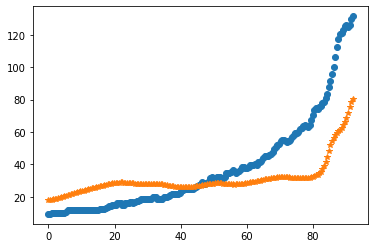

4.267928891252931
70.14940838547724
27148.951423697326
2.58864084953073
11.704109030577703
oxigeno [1.47233733e-29 1.54944440e-29 1.78888236e-29 2.21589382e-29
 2.87562838e-29 3.83813721e-29 5.20616677e-29 7.12666973e-29
 9.80739746e-29 1.35405545e-28 1.87363584e-28 2.59705697e-28
 3.60517927e-28 5.01168219e-28 6.97658489e-28 9.72544032e-28
 1.35766162e-27 1.89801173e-27 2.65729004e-27 3.72577836e-27
 5.23161499e-27 7.35691066e-27 1.03608197e-26 1.46126044e-26
 2.06390710e-26 2.91926934e-26 4.13495385e-26 5.86501575e-26
 8.33024609e-26 1.18474067e-25 1.68713867e-25 2.40560289e-25
 3.43419381e-25 4.90832942e-25 7.02310590e-25 1.00597716e-24
 1.44239888e-24 2.07011359e-24 2.97362371e-24 4.27494752e-24
 6.15031012e-24 8.85425487e-24 1.27544643e-23 1.83820293e-23
 2.65039929e-23 3.82279934e-23 5.51531454e-23 7.95874889e-23
 1.14861233e-22 1.65777780e-22 2.39262846e-22 3.45298227e-22
 4.98264448e-22 7.18870425e-22 1.03692551e-21 1.49531983e-21
 2.15573667e-21 3.10684677e-21 4.47605628e-21 6

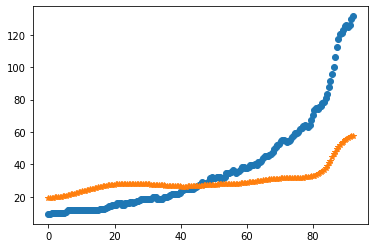

5.513836662588532
107.60955750115103
24063.714890334235
1.495894496712024
12.794256144792428
oxigeno [3.62519315e-18 3.69853540e-18 3.92156620e-18 4.30343187e-18
 4.85982997e-18 5.61371292e-18 6.59632037e-18 7.84859062e-18
 9.42301994e-18 1.13860608e-17 1.38211768e-17 1.68327053e-17
 2.05507193e-17 2.51371300e-17 3.07933366e-17 3.77698079e-17
 4.63780785e-17 5.70057704e-17 7.01354054e-17 8.63679706e-17
 1.06452450e-16 1.31322844e-16 1.62144596e-16 2.00372830e-16
 2.47825439e-16 3.06774819e-16 3.80063056e-16 4.71246571e-16
 5.84777791e-16 7.26233345e-16 9.02600707e-16 1.12263826e-15
 1.39732755e-15 1.74044124e-15 2.16925637e-15 2.70544970e-15
 3.37622153e-15 4.21570591e-15 5.26673953e-15 6.58307987e-15
 8.23218580e-15 1.02987019e-14 1.28888230e-14 1.61357591e-14
 2.02065760e-14 2.53107542e-14 3.17108938e-14 3.97360985e-14
 4.97987046e-14 6.24151807e-14 7.82322313e-14 9.80593872e-14
 1.22909681e-13 1.54050392e-13 1.93066336e-13 2.41938764e-13
 3.03143681e-13 3.79774317e-13 4.75693617e-13

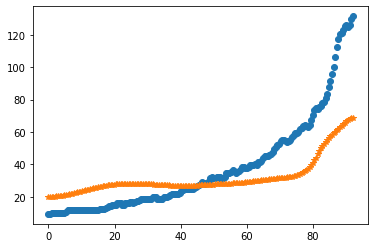

6.303178187744001
131.1727159717105
28964.34644806788
1.8261018752565163
26.83723599372414
oxigeno [6.26854886e-18 6.39141173e-18 6.76487930e-18 7.40379944e-18
 8.33363216e-18 9.59155518e-18 1.12280842e-17 1.33092844e-17
 1.59196785e-17 1.91659893e-17 2.31818967e-17 2.81340369e-17
 3.42295337e-17 4.17254270e-17 5.09404586e-17 6.22697915e-17
 7.62033867e-17 9.33489466e-17 1.14460563e-16 1.40474495e-16
 1.72553872e-16 2.12144560e-16 2.61045003e-16 3.21493572e-16
 3.96277836e-16 4.88871292e-16 6.03604506e-16 7.45879354e-16
 9.22437261e-16 1.14169509e-15 1.41416575e-15 1.75298490e-15
 2.17457057e-15 2.69944896e-15 3.35328845e-15 4.16819391e-15
 5.18432665e-15 6.45193132e-15 8.03387166e-15 1.00088016e-14
 1.24751304e-14 1.55559776e-14 1.94053655e-14 2.42159531e-14
 3.02286926e-14 3.77448839e-14 4.71412151e-14 5.88885230e-14
 7.35751859e-14 9.19362820e-14 1.14889920e-13 1.43582494e-13
 1.79445028e-13 2.24263305e-13 2.80265129e-13 3.50228843e-13
 4.37618253e-13 5.46750298e-13 6.83003350e-13 8

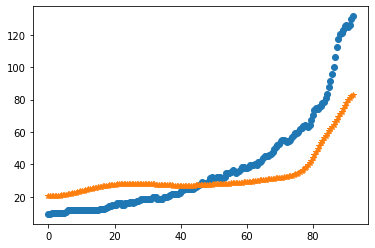

4.4175105457656665
94.27027338108905
26965.81955234311
0.8263156918868686
21.41457455796006
oxigeno [1.42091044e-14 1.44036146e-14 1.49925745e-14 1.59924443e-14
 1.74312369e-14 1.93494066e-14 2.18011347e-14 2.48560553e-14
 2.86014773e-14 3.31451800e-14 3.86188737e-14 4.51824445e-14
 5.30291266e-14 6.23917787e-14 7.35504811e-14 8.68417129e-14
 1.02669430e-13 1.21518425e-13 1.43970442e-13 1.70723606e-13
 2.02615841e-13 2.40653127e-13 2.86043562e-13 3.40238453e-13
 4.04981879e-13 4.82370473e-13 5.74925540e-13 6.85680042e-13
 8.18283498e-13 9.77128485e-13 1.16750312e-12 1.39577485e-12
 1.66961181e-12 1.99824945e-12 2.39281142e-12 2.86669565e-12
 3.43603848e-12 4.12027263e-12 4.94279716e-12 5.93178192e-12
 7.12113262e-12 8.55164820e-12 1.02724081e-11 1.23424344e-11
 1.48326823e-11 1.78284237e-11 2.14320999e-11 2.57667349e-11
 3.09800193e-11 3.72491954e-11 4.47868991e-11 5.38481453e-11
 6.47386784e-11 7.78249533e-11 9.35460614e-11 1.12427975e-10
 1.35100557e-10 1.62317858e-10 1.94982334e-10 

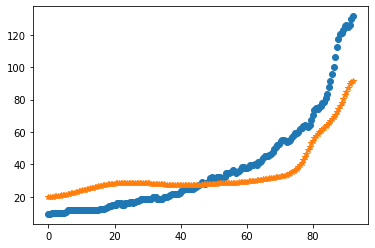

10
6.935630748256211
98.09794192550956
25411.505948107373
0.7363806616927652
47.619887557824285
oxigeno [1.74553677e-13 1.76639671e-13 1.82948152e-13 1.93631980e-13
 2.08950495e-13 2.29276518e-13 2.55106436e-13 2.87073664e-13
 3.25965868e-13 3.72746468e-13 4.28581031e-13 4.94869335e-13
 5.73284040e-13 6.65817098e-13 7.74835279e-13 9.03146426e-13
 1.05407841e-12 1.23157313e-12 1.44029826e-12 1.68578021e-12
 1.97456201e-12 2.31439106e-12 2.71444204e-12 3.18558178e-12
 3.74068380e-12 4.39500189e-12 5.16661364e-12 6.07694707e-12
 7.15140566e-12 8.42011025e-12 9.91877917e-12 1.16897724e-11
 1.37833295e-11 1.62590381e-11 1.91875729e-11 2.26527571e-11
 2.67540035e-11 3.16092045e-11 3.73581521e-11 4.41665844e-11
 5.22309703e-11 6.17841661e-11 7.31020997e-11 8.65116661e-11
 1.02400051e-10 1.21225735e-10 1.43531480e-10 1.69959646e-10
 2.01270251e-10 2.38362262e-10 2.82298676e-10 3.34336074e-10
 3.95959407e-10 4.68922956e-10 5.55298523e-10 6.57532116e-10
 7.78510605e-10 9.21640077e-10 1.09093790e

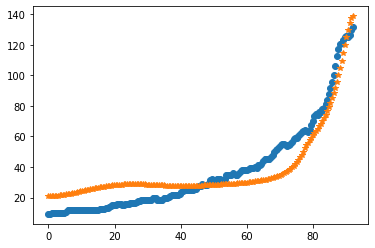

11
3.404656140727705
96.34415243751923
23445.102778435474
0.9481950720554694
10.74196263651273
oxigeno [1.71218531e-15 1.73774506e-15 1.81520701e-15 1.94694679e-15
 2.13701675e-15 2.39128888e-15 2.71766202e-15 3.12634111e-15
 3.63019826e-15 4.24522929e-15 4.99112219e-15 5.89195883e-15
 6.97707584e-15 8.28211723e-15 9.85031841e-15 1.17340705e-14
 1.39968248e-14 1.67154118e-14 1.99828627e-14 2.39118461e-14
 2.86388527e-14 3.43292940e-14 4.11837146e-14 4.94453660e-14
 5.94094396e-14 7.14343267e-14 8.59553493e-14 1.03501507e-13
 1.24715899e-13 1.50380625e-13 1.81447148e-13 2.19073290e-13
 2.64668319e-13 3.19947841e-13 3.87000633e-13 4.68369926e-13
 5.67152237e-13 6.87117417e-13 8.32854400e-13 1.00994799e-12
 1.22519315e-12 1.48685460e-12 1.80498104e-12 2.19178530e-12
 2.66210412e-12 3.23395391e-12 3.92920246e-12 4.77438066e-12
 5.80166326e-12 7.05005413e-12 8.56681845e-12 1.04092136e-11
 1.26465807e-11 1.53628731e-11 1.86597108e-11 2.26600712e-11
 2.75127465e-11 3.33977250e-11 4.05326834e-

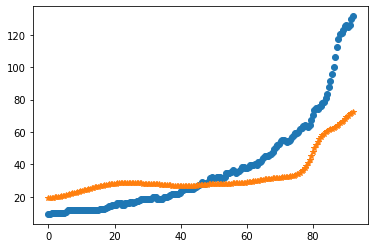

5.469699135722045
74.05166604728441
23845.672012485193
1.6345798867798011
28.960460220842045
oxigeno [6.20163128e-23 6.40766727e-23 7.03953036e-23 8.13945306e-23
 9.78111981e-23 1.20748723e-22 1.51755381e-22 1.92934751e-22
 2.47096700e-22 3.17960458e-22 4.10425349e-22 5.30930114e-22
 6.87928724e-22 8.92519890e-22 1.15927976e-21 1.50736371e-21
 1.96196485e-21 2.55624605e-21 3.33390091e-21 4.35255081e-21
 5.68825439e-21 7.44149772e-21 9.74515671e-21 1.27750880e-20
 1.67642242e-20 2.20213433e-20 2.89560749e-20 3.81122305e-20
 5.02122462e-20 6.62164621e-20 8.74022134e-20 1.15469378e-19
 1.52681250e-19 2.02052579e-19 2.67600587e-19 3.54680017e-19
 4.70430352e-19 6.24372638e-19 8.29205842e-19 1.10186920e-18
 1.46495901e-18 1.94861767e-18 2.59305131e-18 3.45188430e-18
 4.59662692e-18 6.12262337e-18 8.15696746e-18 1.08690326e-17
 1.44844735e-17 1.93038367e-17 2.57272861e-17 3.42874382e-17
 4.56929491e-17 6.08863466e-17 8.11207285e-17 1.08061435e-16
 1.43920760e-16 1.91636359e-16 2.55107385e-16

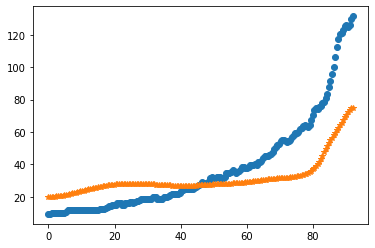

3.027560093989479
144.6149591564286
24294.36141924362
2.877201445234089
49.406244778711304
oxigeno [3.13196561e-21 3.21202359e-21 3.45638996e-21 3.87788885e-21
 4.49873237e-21 5.35183404e-21 6.48276271e-21 7.95246112e-21
 9.84090231e-21 1.22519183e-20 1.53195111e-20 1.92160553e-20
 2.41629252e-20 3.04442434e-20 3.84246584e-20 4.85723333e-20
 6.14886861e-20 7.79468905e-20 9.89417589e-20 1.25754428e-19
 1.60036317e-19 2.03918205e-19 2.60152052e-19 3.32295574e-19
 4.24952619e-19 5.44086459e-19 6.97428376e-19 8.95010811e-19
 1.14986344e-18 1.47892227e-18 1.90421745e-18 2.45442549e-18
 3.16689815e-18 4.09031426e-18 5.28814584e-18 6.84318747e-18
 8.86347357e-18 1.14900057e-17 1.49068384e-17 1.93542366e-17
 2.51458272e-17 3.26909448e-17 4.25237210e-17 5.53409299e-17
 7.20511918e-17 9.38389084e-17 1.22247299e-16 1.59286203e-16
 2.07571988e-16 2.70509098e-16 3.52525596e-16 4.59378730e-16
 5.98551350e-16 7.79766150e-16 1.01565274e-15 1.32261286e-15
 1.72194249e-15 2.24128667e-15 2.91652503e-15 3

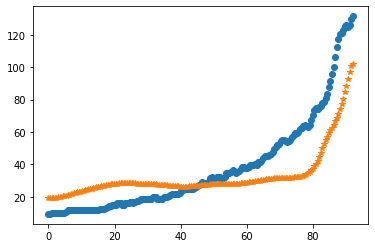

12
1.5216610325232736
111.54896564942794
22312.122083501883
1.4187845671583337
27.520682703270573
oxigeno [2.93167103e-17 2.98220432e-17 3.13565345e-17 3.39764838e-17
 3.77784944e-17 4.29037368e-17 4.95441422e-17 5.79507785e-17
 6.84447660e-17 8.14312096e-17 9.74167723e-17 1.17031674e-16
 1.41057089e-16 1.70459138e-16 2.06430950e-16 2.50444628e-16
 3.04315424e-16 3.70281075e-16 4.51100108e-16 5.50173990e-16
 6.71699436e-16 8.20858847e-16 1.00405890e-15 1.22922968e-15
 1.50619947e-15 1.84716366e-15 2.26727015e-15 2.78534852e-15
 3.42481694e-15 4.21480937e-15 5.19157690e-15 6.40023272e-15
 7.89692933e-15 9.75158145e-15 1.20512780e-14 1.49045618e-14
 1.84467973e-14 2.28468918e-14 2.83156922e-14 3.51164356e-14
 4.35777099e-14 5.41094656e-14 6.72227351e-14 8.35538612e-14
 1.03894230e-13 1.29226757e-13 1.60770696e-13 2.00036767e-13
 2.48895121e-13 3.09659301e-13 3.85190155e-13 4.79024641e-13
 5.95535592e-13 7.40130009e-13 9.19495138e-13 1.14190381e-12
 1.41759317e-12 1.75923425e-12 2.1825138

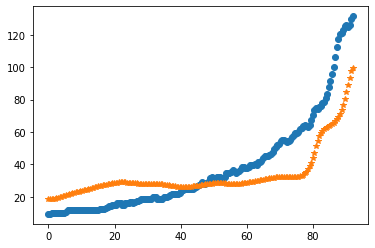

13
5.280759425000594
108.48654340117031
23753.418936606162
2.2541875175033597
35.93430203404316
oxigeno [6.77389944e-22 6.96969767e-22 7.56852297e-22 8.60538148e-22
 1.01410460e-21 1.22658718e-21 1.51054963e-21 1.88288088e-21
 2.36587358e-21 2.98865804e-21 3.78909064e-21 4.81622759e-21
 6.13355692e-21 7.82321563e-21 9.99149031e-21 1.27759924e-20
 1.63550220e-20 2.09597945e-20 2.68904156e-20 3.45367691e-20
 4.44058475e-20 5.71575363e-20 7.36515007e-20 9.50086578e-20
 1.22691820e-19 1.58611546e-19 2.05265153e-19 2.65919362e-19
 3.44850349e-19 4.47659386e-19 5.81687950e-19 7.56563777e-19
 9.84919276e-19 1.28333678e-18 1.67359229e-18 2.18429190e-18
 2.85302471e-18 3.72919485e-18 4.87774606e-18 6.38405909e-18
 8.36038943e-18 1.09543274e-17 1.43599122e-17 1.88322274e-17
 2.47065622e-17 3.24235561e-17 4.25621847e-17 5.58830141e-17
 7.33849002e-17 9.63792824e-17 1.26587496e-16 1.66268183e-16
 2.18384055e-16 2.86820061e-16 3.76668707e-16 4.94603031e-16
 6.49363961e-16 8.52396843e-16 1.11868242e

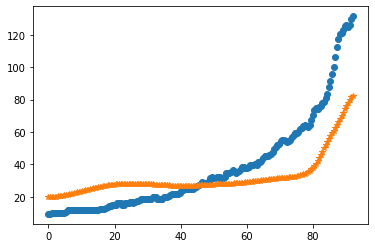

5.48721667894056
71.86602217175853
26994.999761917585
2.9266895212066424
45.18486553084424
oxigeno [1.00149600e-30 1.05927294e-30 1.23929111e-30 1.56241268e-30
 2.06617579e-30 2.80931180e-30 3.87885020e-30 5.40071481e-30
 7.55516749e-30 1.05990907e-29 1.48980034e-29 2.09720017e-29
 2.95616873e-29 4.17228516e-29 5.89626063e-29 8.34353459e-29
 1.18225206e-28 1.67753726e-28 2.38368990e-28 3.39198111e-28
 4.83382307e-28 6.89868457e-28 9.86010870e-28 1.41135393e-27
 2.02313750e-27 2.90431774e-27 4.17526412e-27 6.01083261e-27
 8.66530709e-27 1.25088632e-26 1.80809148e-26 2.61682093e-26
 3.79192155e-26 5.50117521e-26 7.98987326e-26 1.16168550e-25
 1.69073707e-25 2.46306384e-25 3.59136387e-25 5.24080888e-25
 7.65354354e-25 1.11846291e-24 1.63547688e-24 2.39276356e-24
 3.50232523e-24 5.12841847e-24 7.51190688e-24 1.10059328e-23
 1.61281490e-23 2.36371656e-23 3.46443916e-23 5.07775835e-23
 7.44198944e-23 1.09059108e-22 1.59797590e-22 2.34096531e-22
 3.42861552e-22 5.02025362e-22 7.34853755e-22 1

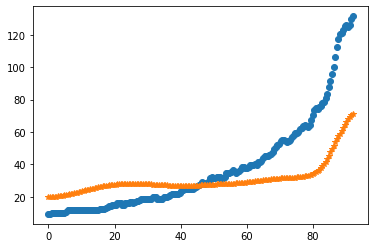

0.26915195486611493
82.1753586861813
21596.87223441831
1.640486858829526
12.539389432578712
oxigeno [7.47024347e-22 7.65835902e-22 8.23585860e-22 9.24287728e-22
 1.07485139e-21 1.28540331e-21 1.56973101e-21 1.94587904e-21
 2.43695812e-21 3.07228590e-21 3.88908976e-21 4.93517209e-21
 6.27306160e-21 7.98607184e-21 1.01863034e-20 1.30241765e-20
 1.66989518e-20 2.14701586e-20 2.76708271e-20 3.57244389e-20
 4.61679365e-20 5.96829502e-20 7.71377913e-20 9.96455816e-20
 1.28649996e-19 1.66057095e-19 2.14433546e-19 2.77282157e-19
 3.59386386e-19 4.67197550e-19 6.09238495e-19 7.96530413e-19
 1.04312021e-18 1.36687267e-18 1.79073916e-18 2.34467531e-18
 3.06829317e-18 4.01433567e-18 5.25325865e-18 6.87952310e-18
 9.02041149e-18 1.18480753e-17 1.55950693e-17 2.05730533e-17
 2.71940701e-17 3.59944082e-17 4.76631131e-17 6.30808704e-17
 8.33790339e-17 1.10029906e-16 1.44974994e-16 1.90789635e-16
 2.50878567e-16 3.29706031e-16 4.33083532e-16 5.68554998e-16
 7.45926172e-16 9.77993632e-16 1.28154458e-15 

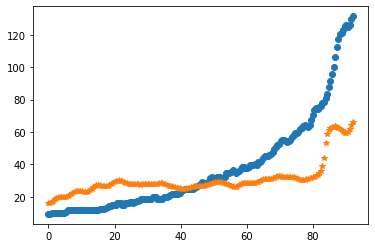

6.115988081723944
125.90684966501266
25658.79392738268
1.2065600625058008
48.190381037069116
oxigeno [5.50821799e-15 5.58503282e-15 5.81765716e-15 6.21269988e-15
 6.78140898e-15 7.54002993e-15 8.51032451e-15 9.72026811e-15
 1.12049495e-14 1.30077047e-14 1.51815237e-14 1.77907799e-14
 2.09133427e-14 2.46431465e-14 2.90933078e-14 3.43999010e-14
 4.07265244e-14 4.82698225e-14 5.72661581e-14 6.79996760e-14
 8.08120445e-14 9.61142278e-14 1.14400710e-13 1.36266682e-13
 1.62428820e-13 1.93750383e-13 2.31271563e-13 2.76246145e-13
 3.30185827e-13 3.94913765e-13 4.72629265e-13 5.65985936e-13
 6.78186073e-13 8.13094622e-13 9.75376741e-13 1.17066381e-12
 1.40575369e-12 1.68885223e-12 2.02986439e-12 2.44074510e-12
 2.93592184e-12 3.53280362e-12 4.25239354e-12 5.12002591e-12
 6.16625298e-12 7.42791110e-12 8.94940233e-12 1.07842345e-11
 1.29968709e-11 1.56649523e-11 1.88819633e-11 2.27604331e-11
 2.74357749e-11 3.30708906e-11 3.98616914e-11 4.80437138e-11
 5.79000462e-11 6.97708208e-11 8.40645775e-11

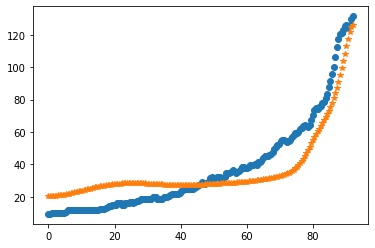

14
4.721213344594766
67.31730924930288
20970.562326795098
1.1632429214568383
15.348636312084185
oxigeno [1.28528039e-20 1.32041330e-20 1.42774354e-20 1.61317888e-20
 1.88695014e-20 2.26421335e-20 2.76594515e-20 3.42018804e-20
 4.26372416e-20 5.34428415e-20 6.72343191e-20 8.48031037e-20
 1.07164895e-19 1.35622306e-19 1.71845741e-19 2.17977811e-19
 2.76768137e-19 3.51747461e-19 4.47452624e-19 5.69717414e-19
 7.26048787e-19 9.26113774e-19 1.18236996e-18 1.51088228e-18
 1.93238170e-18 2.47363796e-18 3.16924012e-18 4.06390701e-18
 5.21548570e-18 6.69884393e-18 8.61092350e-18 1.10773014e-17
 1.42607082e-17 1.83720878e-17 2.36849536e-17 3.05540208e-17
 3.94393836e-17 5.09378767e-17 6.58237435e-17 8.51013531e-17
 1.10073508e-16 1.42429917e-16 1.84361732e-16 2.38709768e-16
 3.09156217e-16 4.00472510e-16 5.18839637e-16 6.72261911e-16
 8.71101229e-16 1.12876663e-15 1.46260392e-15 1.89504298e-15
 2.45507682e-15 3.18016742e-15 4.11870068e-15 5.33314725e-15
 6.90413029e-15 8.93565797e-15 1.15618510e

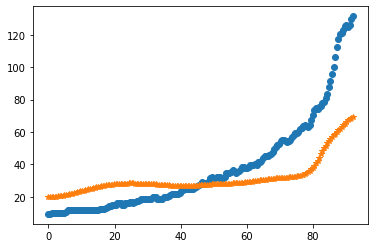

5.195279822215063
116.11789968132823
27142.778052306137
1.5044136523345395
31.48509543348942
oxigeno [2.20414189e-17 2.24502920e-17 2.36923148e-17 2.58143385e-17
 2.88966126e-17 3.30561335e-17 3.84515433e-17 4.52897985e-17
 5.38349146e-17 6.44191819e-17 7.74573675e-17 9.34645545e-17
 1.13078442e-16 1.37087135e-16 1.66463731e-16 2.02409292e-16
 2.46406265e-16 3.00284821e-16 3.66305309e-16 4.47260707e-16
 5.46603998e-16 6.68606566e-16 8.18555241e-16 1.00299749e-15
 1.23004662e-15 1.50976179e-15 1.85462122e-15 2.28011160e-15
 2.80546229e-15 3.45455994e-15 4.25708783e-15 5.24994512e-15
 6.47901450e-15 8.00136351e-15 9.88798521e-15 1.22272097e-14
 1.51289489e-14 1.87299778e-14 2.32005004e-14 2.87523128e-14
 3.56489457e-14 4.42182624e-14 5.48681006e-14 6.81056850e-14
 8.45617116e-14 1.05020215e-13 1.30455598e-13 1.62078517e-13
 2.01392730e-13 2.50265503e-13 3.11014770e-13 3.86517013e-13
 4.80340729e-13 5.96911513e-13 7.41716160e-13 9.21554927e-13
 1.14485319e-12 1.42204633e-12 1.76605484e-12

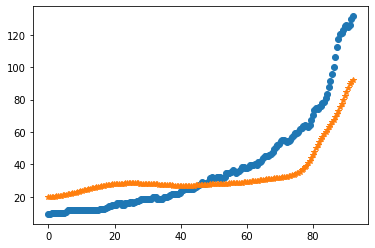

15
4.509704570736694
83.4465120259563
23940.796454967178
1.6628844631160642
47.68216236269349
oxigeno [1.10339480e-21 1.13544623e-21 1.23347970e-21 1.40325092e-21
 1.65475478e-21 2.00285703e-21 2.46823784e-21 3.07871168e-21
 3.87101364e-21 4.89317509e-21 6.20765261e-21 7.89542749e-21
 1.00613619e-20 1.28411880e-20 1.64106236e-20 2.09972624e-20
 2.68960881e-20 3.44897293e-20 4.42749183e-20 5.68970801e-20
 7.31955779e-20 9.42629420e-20 1.21522454e-19 1.56829838e-19
 2.02606633e-19 2.62015207e-19 3.39188531e-19 4.39531978e-19
 5.70119878e-19 7.40216721e-19 9.61962382e-19 1.25127310e-18
 1.62902631e-18 2.12261872e-18 2.76801519e-18 3.61244274e-18
 4.71793204e-18 6.16597210e-18 8.06362620e-18 1.05515651e-17
 1.38146149e-17 1.80956005e-17 2.37135082e-17 3.10873023e-17
 4.07671453e-17 5.34753010e-17 7.01597061e-17 9.20640989e-17
 1.20819789e-16 1.58565697e-16 2.08105317e-16 2.73111871e-16
 3.58396366e-16 4.70257707e-16 6.16939797e-16 8.09228091e-16
 1.06122782e-15 1.39137874e-15 1.82377769e-1

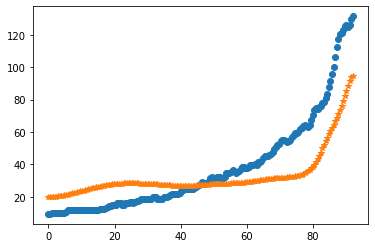

16
0.35022280875857714
118.15177839243096
25470.27071752997
0.4516481648302817
33.51752902051869
oxigeno [1.37211132e-09 1.37876252e-09 1.39889521e-09 1.43302856e-09
 1.48197348e-09 1.54676943e-09 1.62862472e-09 1.72887541e-09
 1.84897272e-09 1.99050474e-09 2.15525571e-09 2.34530299e-09
 2.56314302e-09 2.81182438e-09 3.09505542e-09 3.41725586e-09
 3.78354076e-09 4.19965344e-09 4.67188730e-09 5.20704123e-09
 5.81243966e-09 6.49603025e-09 7.26656689e-09 8.13389819e-09
 9.10939236e-09 1.02065103e-08 1.14414708e-08 1.28338611e-08
 1.44069951e-08 1.61878689e-08 1.82067298e-08 2.04964907e-08
 2.30923749e-08 2.60321614e-08 2.93571840e-08 3.31139474e-08
 3.73560375e-08 4.21460566e-08 4.75575357e-08 5.36769328e-08
 6.06057469e-08 6.84624784e-08 7.73838808e-08 8.75249657e-08
 9.90576615e-08 1.12168800e-07 1.27058855e-07 1.43943149e-07
 1.63056642e-07 1.84662019e-07 2.09059143e-07 2.36593217e-07
 2.67659853e-07 3.02707398e-07 3.42238761e-07 3.86815528e-07
 4.37066207e-07 4.93698935e-07 5.57517567

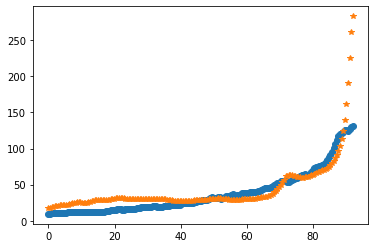

5.471700458679613
84.59442353239699
21974.119379598433
1.2364337279914717
30.81205017077973
oxigeno [1.05788808e-18 1.08148060e-18 1.15331931e-18 1.27663907e-18
 1.45700540e-18 1.70258530e-18 2.02454582e-18 2.43760174e-18
 2.96074081e-18 3.61816519e-18 4.44049885e-18 5.46632544e-18
 6.74413883e-18 8.33481137e-18 1.03147131e-17 1.27796515e-17
 1.58498465e-17 1.96762136e-17 2.44483008e-17 3.04043181e-17
 3.78438160e-17 4.71437195e-17 5.87786128e-17 7.33464107e-17
 9.16008608e-17 1.14492702e-16 1.43221802e-16 1.79303217e-16
 2.24650893e-16 2.81683756e-16 3.53460155e-16 4.43848262e-16
 5.57742013e-16 7.01334758e-16 8.82465950e-16 1.11106033e-15
 1.39968409e-15 1.76424905e-15 2.22490392e-15 2.80716190e-15
 3.54332698e-15 4.47429712e-15 5.65184329e-15 7.14148853e-15
 9.02614380e-15 1.14106976e-14 1.44278072e-14 1.82452035e-14
 2.30749009e-14 2.91848057e-14 3.69133404e-14 4.66878623e-14
 5.90478498e-14 7.46740804e-14 9.44253341e-14 1.19384542e-13
 1.50916790e-13 1.90742179e-13 2.41027330e-13 

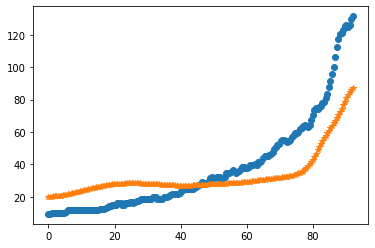

17
3.4727183917877875
71.23241956736277
27315.749039413487
0.5396816219789533
14.854878081199413
oxigeno [1.35240643e-12 1.35130650e-12 1.34805491e-12 1.34279626e-12
 1.33577162e-12 1.32731887e-12 1.31787351e-12 1.30797046e-12
 1.29824722e-12 1.28944903e-12 1.28243656e-12 1.27819694e-12
 1.27785873e-12 1.28271181e-12 1.29423302e-12 1.31411862e-12
 1.34432480e-12 1.38711756e-12 1.44513375e-12 1.52145521e-12
 1.61969836e-12 1.74412223e-12 1.89975840e-12 2.09256699e-12
 2.32962393e-12 2.61934548e-12 2.97175739e-12 3.39881751e-12
 3.91480221e-12 4.53676939e-12 5.28511271e-12 6.18422510e-12
 7.26329249e-12 8.55724291e-12 1.01078808e-11 1.19652412e-11
 1.41892069e-11 1.68514349e-11 2.00376540e-11 2.38503987e-11
 2.84122629e-11 3.38697671e-11 4.03979549e-11 4.82058503e-11
 5.75429369e-11 6.87068475e-11 8.20524878e-11 9.80028622e-11
 1.17061919e-10 1.39829790e-10 1.67020883e-10 1.99485342e-10
 2.38234529e-10 2.84471254e-10 3.39625659e-10 4.05397767e-10
 4.83807954e-10 5.77256750e-10 6.88595666

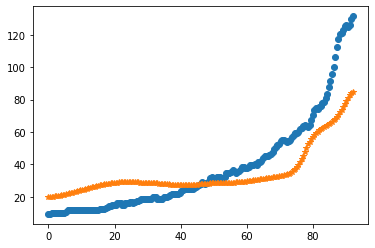

18
0.08192226099744755
80.7074255105056
21602.689625826628
1.0600037134793998
47.219983970548206
oxigeno [8.69368256e-18 8.83438393e-18 9.26829713e-18 1.00278284e-17
 1.11621457e-17 1.27361871e-17 1.48291250e-17 1.75353897e-17
 2.09691789e-17 2.52689926e-17 3.05993096e-17 3.71527283e-17
 4.51671293e-17 5.49657417e-17 6.70043217e-17 8.19036900e-17
 1.00468087e-16 1.23677692e-16 1.52667502e-16 1.88754693e-16
 2.33523376e-16 2.88926979e-16 3.57367042e-16 4.41745845e-16
 5.45509671e-16 6.72838521e-16 8.29206560e-16 1.02234737e-15
 1.26320593e-15 1.56646099e-15 1.95069844e-15 2.43779795e-15
 3.05197333e-15 3.82010713e-15 4.77443476e-15 5.95814558e-15
 7.42953351e-15 9.26351124e-15 1.15525481e-14 1.44120398e-14
 1.79899175e-14 2.24827249e-14 2.81536319e-14 3.53469871e-14
 4.44983779e-14 5.61354970e-14 7.08748377e-14 8.94205956e-14
 1.12586032e-13 1.41383467e-13 1.77180497e-13 2.21843385e-13
 2.77787717e-13 3.47904990e-13 4.35569807e-13 5.44981075e-13
 6.81452133e-13 8.51436962e-13 1.06286974

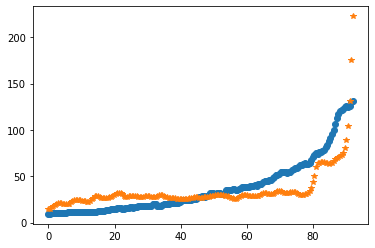

5.0379006017884
76.66524101342864
25576.34028520829
2.089783165263761
48.021318133065535
oxigeno [2.77102591e-25 2.88034195e-25 3.21696088e-25 3.80761762e-25
 4.69934300e-25 5.96340336e-25 7.70129961e-25 1.00533633e-24
 1.32107239e-24 1.74317319e-24 2.30643348e-24 3.05764592e-24
 4.05972082e-24 5.39727046e-24 7.18418129e-24 9.57388810e-24
 1.27733254e-23 1.70618888e-23 2.28172303e-23 3.05503806e-23
 4.09536181e-23 5.49657650e-23 7.38613343e-23 9.93723374e-23
 1.33854848e-22 1.80516933e-22 2.43730768e-22 3.29460293e-22
 4.45847511e-22 6.04016663e-22 8.19177723e-22 1.11214115e-21
 1.51139777e-21 2.05597525e-21 2.79936163e-21 3.81489510e-21
 5.20316772e-21 7.10219542e-21 9.70138585e-21 1.32607194e-20
 1.81370827e-20 2.48204131e-20 3.39832918e-20 4.65489704e-20
 6.37846441e-20 8.74292944e-20 1.19868843e-19 1.64376024e-19
 2.25438756e-19 3.09209455e-19 4.24119599e-19 5.81719913e-19
 7.97828537e-19 1.09409934e-18 1.50016318e-18 2.05654996e-18
 2.81867448e-18 3.86227028e-18 5.29079413e-18 7.2

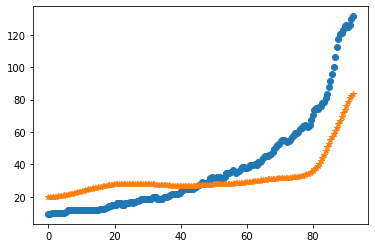

2.3424038264425535
105.13866611234974
26236.17051773506
2.0410991183755343
38.00493994428004
oxigeno [3.32683432e-21 3.41366514e-21 3.67881041e-21 4.13651164e-21
 4.81146650e-21 5.74033601e-21 6.97398792e-21 8.58062033e-21
 1.06499669e-20 1.32988558e-20 1.66784831e-20 2.09838771e-20
 2.64661742e-20 3.34485176e-20 4.23466391e-20 5.36955030e-20
 6.81838164e-20 8.66987630e-20 1.10384043e-19 1.40715261e-19
 1.79597945e-19 2.29495137e-19 2.93593642e-19 3.76020822e-19
 4.82127552e-19 6.18857751e-19 7.95231244e-19 1.02297502e-18
 1.31734882e-18 1.69822532e-18 2.19150391e-18 2.83096158e-18
 3.66067698e-18 4.73820530e-18 6.13873713e-18 7.96054549e-18
 1.03321179e-17 1.34214905e-17 1.74484548e-17 2.27005086e-17
 2.95536779e-17 3.84996682e-17 5.01812311e-17 6.54381830e-17
 8.53672293e-17 1.11399673e-16 1.45402296e-16 1.89808265e-16
 2.47786974e-16 3.23464380e-16 4.22208888e-16 5.51002350e-16
 7.18921633e-16 9.37763855e-16 1.22285830e-15 1.59412088e-15
 2.07742349e-15 2.70637229e-15 3.52461596e-15

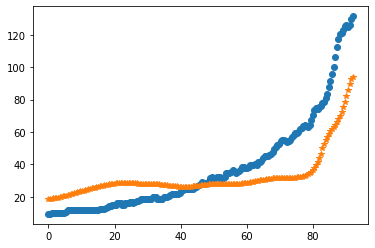

3.0236897332814223
149.9760607918384
25908.193416678714
0.7930423389660246
46.35382069778688
oxigeno [3.64811973e-11 3.67541970e-11 3.75775931e-11 3.89646665e-11
 4.09378545e-11 4.35292093e-11 4.67810486e-11 5.07468114e-11
 5.54921299e-11 6.10961385e-11 6.76530408e-11 7.52739668e-11
 8.40891527e-11 9.42504896e-11 1.05934491e-10 1.19345743e-10
 1.34720911e-10 1.52333389e-10 1.72498691e-10 1.95580711e-10
 2.21998978e-10 2.52237075e-10 2.86852393e-10 3.26487445e-10
 3.71882964e-10 4.23893077e-10 4.83502857e-10 5.51848620e-10
 6.30241384e-10 7.20193955e-10 8.23452187e-10 9.42031015e-10
 1.07825598e-09 1.23481102e-09 1.41479339e-09 1.62177678e-09
 1.85988368e-09 2.13386829e-09 2.44921135e-09 2.81222858e-09
 3.23019441e-09 3.71148317e-09 4.26573000e-09 4.90401434e-09
 5.63906910e-09 6.48551924e-09 7.46015408e-09 8.58223859e-09
 9.87386925e-09 1.13603818e-08 1.30708187e-08 1.50384650e-08
 1.73014640e-08 1.99035242e-08 2.28947303e-08 2.63324741e-08
 3.02825218e-08 3.48202360e-08 4.00319732e-08

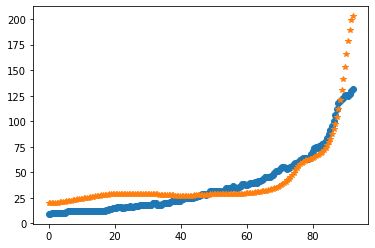

19
3.689577273712764
86.86805232047027
24988.105623477983
0.2357304880516105
26.330190045395256
oxigeno [2.07557829e-06 2.07399958e-06 2.06927898e-06 2.06146282e-06
 2.05062737e-06 2.03687743e-06 2.02034449e-06 2.00118452e-06
 1.97957547e-06 1.95571456e-06 1.92981559e-06 1.90210624e-06
 1.87282554e-06 1.84222150e-06 1.81054913e-06 1.77806877e-06
 1.74504469e-06 1.71174426e-06 1.67843737e-06 1.64539631e-06
 1.61289602e-06 1.58121465e-06 1.55063454e-06 1.52144346e-06
 1.49393615e-06 1.46841624e-06 1.44519837e-06 1.42461070e-06
 1.40699767e-06 1.39272311e-06 1.38217377e-06 1.37576315e-06
 1.37393579e-06 1.37717206e-06 1.38599334e-06 1.40096789e-06
 1.42271722e-06 1.45192311e-06 1.48933539e-06 1.53578043e-06
 1.59217054e-06 1.65951420e-06 1.73892736e-06 1.83164585e-06
 1.93903896e-06 2.06262438e-06 2.20408471e-06 2.36528553e-06
 2.54829538e-06 2.75540782e-06 2.98916577e-06 3.25238843e-06
 3.54820099e-06 3.88006757e-06 4.25182752e-06 4.66773561e-06
 5.13250621e-06 5.65136213e-06 6.23008811e

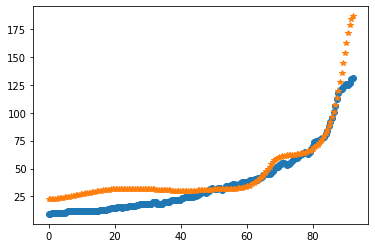

20
SMC step with target distance: 200.0
after perturb [3.897369833623652, 62.146292680668424, 25156.85946658522, 0.09449648552634593, 47.76657818473842]
parameters [3.897369833623652, 62.146292680668424, 25156.85946658522, 0.09449648552634593, 47.76657818473842]
oxigeno [5.69779197e-03 5.69411701e-03 5.68312084e-03 5.66488902e-03
 5.63956220e-03 5.60733325e-03 5.56844351e-03 5.52317814e-03
 5.47186087e-03 5.41484831e-03 5.35252406e-03 5.28529270e-03
 5.21357399e-03 5.13779730e-03 5.05839647e-03 4.97580520e-03
 4.89045294e-03 4.80276139e-03 4.71314162e-03 4.62199170e-03
 4.52969485e-03 4.43661811e-03 4.34311131e-03 4.24950646e-03
 4.15611733e-03 4.06323929e-03 3.97114929e-03 3.88010595e-03
 3.79034975e-03 3.70210322e-03 3.61557125e-03 3.53094138e-03
 3.44838411e-03 3.36805327e-03 3.29008642e-03 3.21460522e-03
 3.14171594e-03 3.07150995e-03 3.00406433e-03 2.93944247e-03
 2.87769485e-03 2.81885984e-03 2.76296459e-03 2.71002607e-03
 2.66005211e-03 2.61304262e-03 2.56899082e-03 2.52788456e-

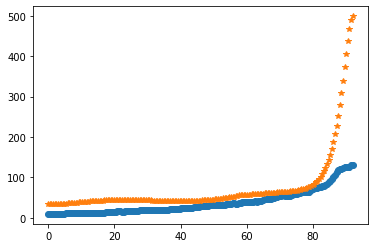

after perturb [6.703520437526651, 149.15806566813214, 14147.23415384654, 1.8261845630366995, 48.5231246872622]
parameters [6.703520437526651, 149.15806566813214, 14147.23415384654, 1.8261845630366995, 48.5231246872622]
after perturb [3.5879282443026, 175.34724679362654, 24063.92472313293, 1.6091570473291033, 29.71854093938024]
parameters [3.5879282443026, 175.34724679362654, 24063.92472313293, 1.6091570473291033, 29.71854093938024]
after perturb [4.646249519693041, 100.12434317253259, 22018.48467758661, 2.7218747205595424, 29.66104298168691]
parameters [4.646249519693041, 100.12434317253259, 22018.48467758661, 2.7218747205595424, 29.66104298168691]
oxigeno [5.12461173e-25 5.31542928e-25 5.90221651e-25 6.92912026e-25
 8.47362661e-25 1.06527745e-24 1.36325907e-24 1.76415610e-24
 2.29893080e-24 3.00921075e-24 3.95074869e-24 5.19809693e-24
 6.85091310e-24 9.04246352e-24 1.19510933e-23 1.58157081e-23
 2.09566869e-23 2.78041588e-23 3.69362716e-23 4.91310339e-23
 6.54366139e-23 8.72667543e-23

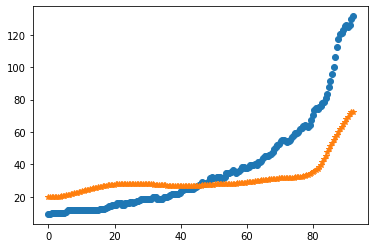

after perturb [2.5814977873393214, 87.8569949393382, 29974.13037231899, 1.480568859952321, 70.1990942319881]
parameters [2.5814977873393214, 87.8569949393382, 29974.13037231899, 1.480568859952321, 70.1990942319881]
after perturb [-0.8448905155983069, 173.42453641017832, 18707.55570079689, 2.3210423676596053, 32.96705052862689]
parameters [-0.8448905155983069, 173.42453641017832, 18707.55570079689, 2.3210423676596053, 32.96705052862689]
after perturb [5.570741000781765, 117.38979826276719, 14818.467230271111, 0.049939873831361115, -8.586915397845107]
parameters [5.570741000781765, 117.38979826276719, 14818.467230271111, 0.049939873831361115, -8.586915397845107]
after perturb [1.4423781019304873, 30.600085937110897, 21332.04654605419, 1.4899776768048132, 27.70398780114263]
parameters [1.4423781019304873, 30.600085937110897, 21332.04654605419, 1.4899776768048132, 27.70398780114263]
after perturb [0.9375010573355169, 156.1527483261928, 27604.924710351155, 2.2276029303096716, 42.88889394844

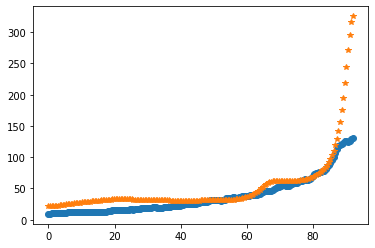

after perturb [5.576432456404118, 189.4547145203196, 23816.739451556896, 2.1350994081417705, 48.17581484643906]
parameters [5.576432456404118, 189.4547145203196, 23816.739451556896, 2.1350994081417705, 48.17581484643906]
after perturb [3.5130006925104516, 80.2541584944507, 26986.09061279302, 0.031016831748648555, 1.7910448116538547]
parameters [3.5130006925104516, 80.2541584944507, 26986.09061279302, 0.031016831748648555, 1.7910448116538547]
after perturb [0.5616775116182118, 106.19207495817864, 26325.503932891508, -0.2924733592536226, -4.0508516212552514]
parameters [0.5616775116182118, 106.19207495817864, 26325.503932891508, -0.2924733592536226, -4.0508516212552514]
after perturb [7.41665441155865, 62.95830293181329, 31553.327256954097, 0.09742566261680119, 40.07911214052629]
parameters [7.41665441155865, 62.95830293181329, 31553.327256954097, 0.09742566261680119, 40.07911214052629]
after perturb [6.485713018337669, 11.422338640482515, 27550.212369723202, 0.1347790121135077, 12.48656

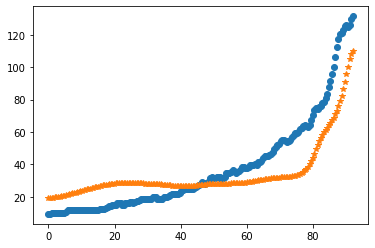

after perturb [7.0292078868890275, 82.88195285301114, 27902.24919771155, 1.0607988641861235, 26.909453576475777]
parameters [7.0292078868890275, 82.88195285301114, 27902.24919771155, 1.0607988641861235, 26.909453576475777]
after perturb [3.860822112876378, 120.57991620233128, 17354.615737241886, 0.8571222217828057, 32.83770115767389]
parameters [3.860822112876378, 120.57991620233128, 17354.615737241886, 0.8571222217828057, 32.83770115767389]
after perturb [0.4304778040392927, 115.43914230098773, 25464.040654239776, 1.4266960136249363, 40.838223911018105]
parameters [0.4304778040392927, 115.43914230098773, 25464.040654239776, 1.4266960136249363, 40.838223911018105]
oxigeno [5.56149786e-17 5.64768485e-17 5.90994889e-17 6.35947395e-17
 7.01514594e-17 7.90391828e-17 9.06134527e-17 1.05323606e-16
 1.23724602e-16 1.46495480e-16 1.74467943e-16 2.08668892e-16
 2.50379806e-16 3.01213371e-16 3.63204414e-16 4.38909638e-16
 5.31510946e-16 6.44921149e-16 7.83897700e-16 9.54177558e-16
 1.16265283e-1

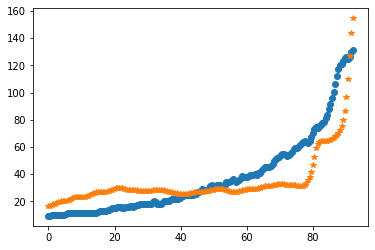

after perturb [1.4222830914250761, 96.55426773267715, 25462.60149088078, 0.9776098654117109, 23.557548416145103]
parameters [1.4222830914250761, 96.55426773267715, 25462.60149088078, 0.9776098654117109, 23.557548416145103]
oxigeno [1.39463010e-15 1.41497365e-15 1.47664029e-15 1.58156210e-15
 1.73304034e-15 1.93586944e-15 2.19651574e-15 2.52335674e-15
 2.92698953e-15 3.42061986e-15 4.02054687e-15 4.74676151e-15
 5.62368086e-15 6.68104403e-15 7.95500089e-15 9.48943126e-15
 1.13375420e-14 1.35638032e-14 1.62463021e-14 1.94796187e-14
 2.33783539e-14 2.80814757e-14 3.37576856e-14 4.06120452e-14
 4.88941456e-14 5.89081424e-14 7.10250372e-14 8.56976475e-14
 1.03478805e-13 1.25043453e-13 1.51215506e-13 1.83000569e-13
 2.21625951e-13 2.68589786e-13 3.25721507e-13 3.95256419e-13
 4.79927611e-13 5.83078951e-13 7.08803429e-13 8.62111672e-13
 1.04913607e-12 1.27737679e-12 1.55599714e-12 1.89617727e-12
 2.31153746e-12 2.81864529e-12 3.43762487e-12 4.19289096e-12
 5.11403693e-12 6.23691204e-12 7.6049

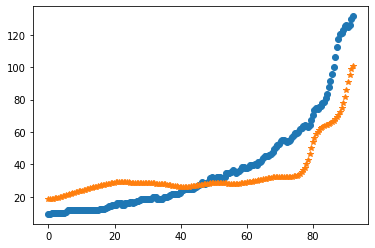

after perturb [4.181292363419368, 101.83924560883933, 25911.386082878762, -0.22123007381598825, 30.00476167801821]
parameters [4.181292363419368, 101.83924560883933, 25911.386082878762, -0.22123007381598825, 30.00476167801821]
after perturb [7.674637894709985, 124.32039832526739, 24625.853426871687, 0.5265969396666328, 34.53781945003326]
parameters [7.674637894709985, 124.32039832526739, 24625.853426871687, 0.5265969396666328, 34.53781945003326]
after perturb [0.5623064598037537, 29.180074311569598, 31778.487099619702, 2.108853440560198, 40.428552710071024]
parameters [0.5623064598037537, 29.180074311569598, 31778.487099619702, 2.108853440560198, 40.428552710071024]
after perturb [6.371988950991717, 134.00861470361144, 33525.54414076105, 0.5880323015165765, 47.13768059423626]
parameters [6.371988950991717, 134.00861470361144, 33525.54414076105, 0.5880323015165765, 47.13768059423626]
after perturb [0.06249129553634658, 141.25661751879153, 27937.63136721954, 1.1376732082982595, 32.192559

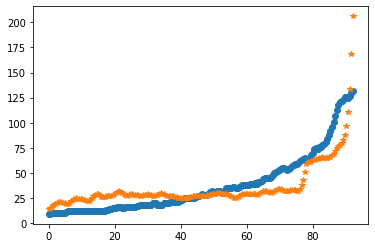

after perturb [-1.8340893444794744, 180.99506964766076, 23466.328743117887, 4.016952396882895, 53.68396242672796]
parameters [-1.8340893444794744, 180.99506964766076, 23466.328743117887, 4.016952396882895, 53.68396242672796]
after perturb [11.013703792050766, 48.16461434253845, 27137.323435541763, -0.6995008018893675, 19.140212010588037]
parameters [11.013703792050766, 48.16461434253845, 27137.323435541763, -0.6995008018893675, 19.140212010588037]
after perturb [5.7891156792174225, 137.5397377457414, 28433.1971522524, 2.0675971993496733, 52.23265892069321]
parameters [5.7891156792174225, 137.5397377457414, 28433.1971522524, 2.0675971993496733, 52.23265892069321]
after perturb [4.784414257115561, 82.38566612943691, 23902.034436849972, 1.7098069619403127, 38.394699449510476]
parameters [4.784414257115561, 82.38566612943691, 23902.034436849972, 1.7098069619403127, 38.394699449510476]
oxigeno [3.96646051e-22 4.08694407e-22 4.45577140e-22 5.09555411e-22
 6.04561771e-22 7.36458174e-22 9.1342

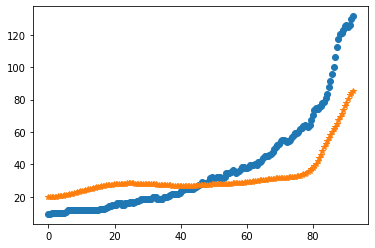

after perturb [6.494259328275284, 107.50228688132404, 21316.65231106186, -0.8382001182995934, 15.878910791458186]
parameters [6.494259328275284, 107.50228688132404, 21316.65231106186, -0.8382001182995934, 15.878910791458186]
after perturb [0.7097679090488196, 90.7452999083335, 24255.134729945996, -0.8106649878208423, 16.967748512841766]
parameters [0.7097679090488196, 90.7452999083335, 24255.134729945996, -0.8106649878208423, 16.967748512841766]
after perturb [0.8056211700723548, 131.2508146374512, 21929.407509252662, 1.3745280022137676, 22.88959532333723]
parameters [0.8056211700723548, 131.2508146374512, 21929.407509252662, 1.3745280022137676, 22.88959532333723]
oxigeno [1.30570623e-15 1.32336757e-15 1.37691815e-15 1.46807546e-15
 1.59976134e-15 1.77619143e-15 2.00300330e-15 2.28743007e-15
 2.63853188e-15 3.06750335e-15 3.58807916e-15 4.21706049e-15
 4.97498150e-15 5.88692835e-15 6.98351568e-15 8.30202203e-15
 9.88769032e-15 1.17952177e-14 1.40904911e-14 1.68526730e-14
 2.01767984e-1

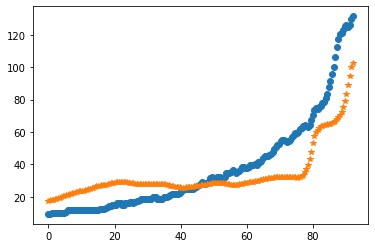

after perturb [-1.7175849849379439, 54.676288083644344, 22912.10331579058, 1.6111527045542948, 41.11659224596358]
parameters [-1.7175849849379439, 54.676288083644344, 22912.10331579058, 1.6111527045542948, 41.11659224596358]
after perturb [6.3589380666214925, 62.98829707894618, 21534.56337589483, 1.0112826714764522, 31.752481621972045]
parameters [6.3589380666214925, 62.98829707894618, 21534.56337589483, 1.0112826714764522, 31.752481621972045]
oxigeno [6.92404199e-20 7.10373707e-20 7.65237453e-20 8.59914383e-20
 9.99450158e-20 1.19129957e-19 1.44574526e-19 1.77647768e-19
 2.20137123e-19 2.74350324e-19 3.43247733e-19 4.30613166e-19
 5.41273614e-19 6.81381338e-19 8.58775691e-19 1.08344705e-18
 1.36813168e-18 1.72907463e-18 2.18700844e-18 2.76840918e-18
 3.50710913e-18 4.44636803e-18 5.64153461e-18 7.16346753e-18
 9.10293430e-18 1.15762690e-17 1.47326513e-17 1.87634732e-17
 2.39143941e-17 3.05008584e-17 3.89280709e-17 4.97167120e-17
 6.35360409e-17 8.12465076e-17 1.03954599e-16 1.33083420

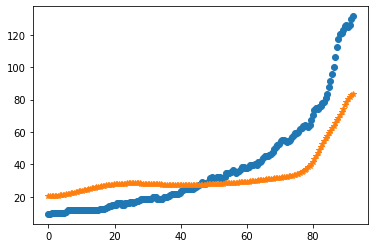

after perturb [6.3283637208573404, 149.5191826055992, 21411.581812991713, 0.976072924606384, 30.901609303441212]
parameters [6.3283637208573404, 149.5191826055992, 21411.581812991713, 0.976072924606384, 30.901609303441212]
oxigeno [2.44152248e-12 2.46483228e-12 2.53521888e-12 2.65406423e-12
 2.82370662e-12 3.04749413e-12 3.32986122e-12 3.67643041e-12
 4.09414143e-12 4.59141109e-12 5.17832763e-12 5.86688451e-12
 6.67125921e-12 7.60814395e-12 8.69713662e-12 9.96120135e-12
 1.14272104e-11 1.31265809e-11 1.50960213e-11 1.73784082e-11
 2.00238130e-11 2.30907055e-11 2.66473639e-11 3.07735260e-11
 3.55623237e-11 4.11225462e-11 4.75812908e-11 5.50870640e-11
 6.38134100e-11 7.39631550e-11 8.57733691e-11 9.95211676e-11
 1.15530489e-10 1.34180010e-10 1.55912396e-10 1.81245082e-10
 2.10782868e-10 2.45232596e-10 2.85420266e-10 3.32310976e-10
 3.87032157e-10 4.50900622e-10 5.25454051e-10 6.12487634e-10
 7.14096693e-10 8.32726241e-10 9.71228611e-10 1.13293042e-09
 1.32171039e-09 1.54208972e-09 1.7993

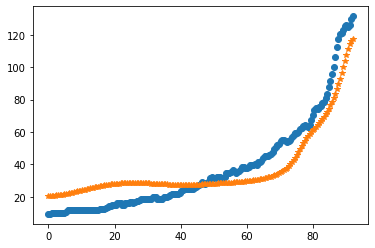

1
after perturb [2.3136210295623947, 165.93780778355207, 19955.816819704058, 2.9560251052294437, 34.63775484281762]
parameters [2.3136210295623947, 165.93780778355207, 19955.816819704058, 2.9560251052294437, 34.63775484281762]
after perturb [5.5895581617312775, 122.52748739991156, 15291.895505765053, 1.8149306892827592, 37.797964873481234]
parameters [5.5895581617312775, 122.52748739991156, 15291.895505765053, 1.8149306892827592, 37.797964873481234]
after perturb [1.8852389440663873, 96.04869000027269, 23489.4630670254, 1.876559577816379, 49.869982400158285]
parameters [1.8852389440663873, 96.04869000027269, 23489.4630670254, 1.876559577816379, 49.869982400158285]
oxigeno [2.44353044e-21 2.50804724e-21 2.70511260e-21 3.04549189e-21
 3.54787617e-21 4.24005564e-21 5.16066643e-21 6.36162382e-21
 7.91140045e-21 9.89936459e-21 1.24414646e-20 1.56876365e-20
 1.98314269e-20 2.51224750e-20 3.18826903e-20 4.05272216e-20
 5.15916467e-20 6.57672596e-20 8.39469236e-20 1.07284737e-19
 1.37273791e-1

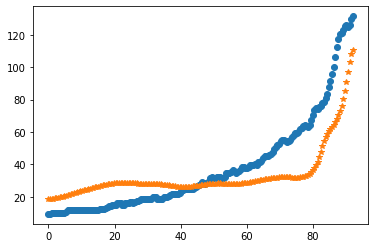

after perturb [7.910382072355914, 148.20106464381476, 18939.308408196284, 2.0112823313266786, 8.856120539823195]
parameters [7.910382072355914, 148.20106464381476, 18939.308408196284, 2.0112823313266786, 8.856120539823195]
after perturb [3.9637180641305747, 116.96756340547941, 23583.767468092465, 0.6669439508223909, 28.525614388548174]
parameters [3.9637180641305747, 116.96756340547941, 23583.767468092465, 0.6669439508223909, 28.525614388548174]
oxigeno [1.10308452e-11 1.11271920e-11 1.14179855e-11 1.19085238e-11
 1.26077663e-11 1.35285311e-11 1.46877762e-11 1.61069717e-11
 1.78125696e-11 1.98365817e-11 2.22172789e-11 2.50000254e-11
 2.82382675e-11 3.19946994e-11 3.63426308e-11 4.13675899e-11
 4.71691961e-11 5.38633484e-11 6.15847790e-11 7.04900324e-11
 8.07609399e-11 9.26086712e-11 1.06278458e-10 1.22055098e-10
 1.40269372e-10 1.61305520e-10 1.85609941e-10 2.13701332e-10
 2.46182476e-10 2.83753958e-10 3.27230105e-10 3.77557498e-10
 4.35836468e-10 5.03346019e-10 5.81572724e-10 6.722441

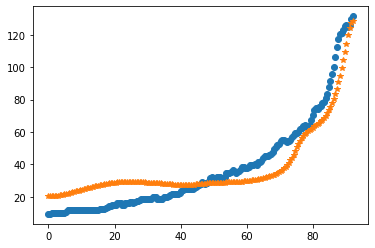

2
after perturb [1.0645611247398876, 129.3002857276454, 23324.006930602172, 1.311565103106414, 16.995852881498188]
parameters [1.0645611247398876, 129.3002857276454, 23324.006930602172, 1.311565103106414, 16.995852881498188]
oxigeno [2.05052444e-15 2.07801448e-15 2.16131397e-15 2.30293993e-15
 2.50718424e-15 2.78026079e-15 3.13051634e-15 3.56871288e-15
 4.10839380e-15 4.76635140e-15 5.56321779e-15 6.52420396e-15
 7.68001282e-15 9.06795170e-15 1.07332697e-14 1.27307488e-14
 1.51265861e-14 1.80006263e-14 2.14490303e-14 2.55875119e-14
 3.05553231e-14 3.65202264e-14 4.36847385e-14 5.22939739e-14
 6.26454305e-14 7.51010653e-14 9.01020015e-14 1.08186219e-13
 1.30009638e-13 1.56371153e-13 1.88242427e-13 2.26803676e-13
 2.73487169e-13 3.30030840e-13 3.98545025e-13 4.81595975e-13
 5.82310254e-13 7.04504435e-13 8.52844594e-13 1.03304008e-12
 1.25207606e-12 1.51848968e-12 1.84269540e-12 2.23736717e-12
 2.71788778e-12 3.30288039e-12 4.01484258e-12 4.88091008e-12
 5.93378420e-12 7.21286387e-12 8.76

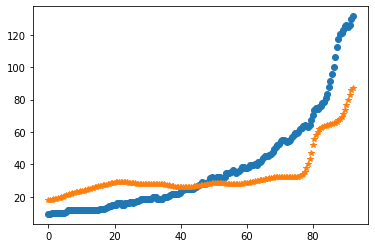

after perturb [2.6887278115129, 121.90207070463512, 22158.201587084972, 1.3882118283725864, 39.16448212556209]
parameters [2.6887278115129, 121.90207070463512, 22158.201587084972, 1.3882118283725864, 39.16448212556209]
oxigeno [2.72418930e-16 2.76699212e-16 2.89679796e-16 3.11785295e-16
 3.43741600e-16 3.86603913e-16 4.41797479e-16 5.11172600e-16
 5.97076062e-16 7.02441770e-16 8.30904173e-16 9.86939010e-16
 1.17603703e-15 1.40491777e-15 1.68179212e-15 2.01668472e-15
 2.42182943e-15 2.91215499e-15 3.50588123e-15 4.22525183e-15
 5.09743519e-15 6.15563272e-15 7.44044300e-15 9.00154161e-15
 1.08997503e-14 1.32095865e-14 1.60224046e-14 1.94502675e-14
 2.36307176e-14 2.87326567e-14 3.49635918e-14 4.25785628e-14
 5.18911414e-14 6.32869759e-14 7.72404663e-14 9.43352790e-14
 1.15289569e-13 1.40986961e-13 1.72514573e-13 2.11209624e-13
 2.58716514e-13 3.17056652e-13 3.88713793e-13 4.76738254e-13
 5.84874105e-13 7.17714325e-13 8.80890060e-13 1.08130145e-12
 1.32739923e-12 1.62952843e-12 2.00034790

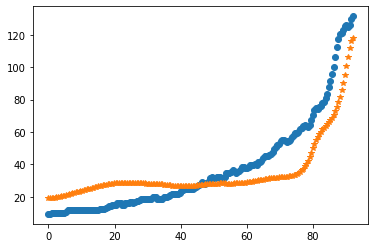

after perturb [8.02636050492663, 100.90373027341491, 18408.73387827264, -0.6440312939072456, 12.932343487091806]
parameters [8.02636050492663, 100.90373027341491, 18408.73387827264, -0.6440312939072456, 12.932343487091806]
after perturb [7.983761877639067, 108.15542697823335, 30648.42888122197, 0.7407854612251876, 15.939157541861514]
parameters [7.983761877639067, 108.15542697823335, 30648.42888122197, 0.7407854612251876, 15.939157541861514]
after perturb [3.1341950546181776, 127.38539603442464, 24660.63815148608, 1.2410538101473163, 19.80602509969182]
parameters [3.1341950546181776, 127.38539603442464, 24660.63815148608, 1.2410538101473163, 19.80602509969182]
oxigeno [4.10832243e-15 4.16457138e-15 4.33491666e-15 4.62420740e-15
 5.04070654e-15 5.59636891e-15 6.30724338e-15 7.19401274e-15
 8.28268971e-15 9.60549275e-15 1.12019320e-14 1.31201434e-14
 1.54185172e-14 1.81676797e-14 2.14528989e-14 2.53770005e-14
 3.00639020e-14 3.56628941e-14 4.23538285e-14 5.03534060e-14
 5.99228007e-14 7.

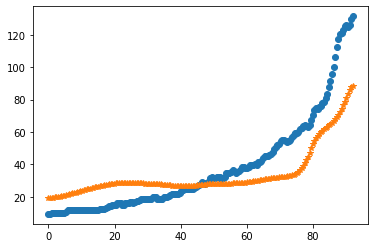

after perturb [7.137891610242702, 123.51553907062932, 19135.38744035767, 0.9840552935211979, 8.613245659029081]
parameters [7.137891610242702, 123.51553907062932, 19135.38744035767, 0.9840552935211979, 8.613245659029081]
after perturb [1.5808599090676954, 127.69007095232882, 28709.175696407703, 3.4237674178018125, 68.83736035120624]
parameters [1.5808599090676954, 127.69007095232882, 28709.175696407703, 3.4237674178018125, 68.83736035120624]
after perturb [2.7060601053683015, 93.70804928380032, 30015.106324241082, 0.42744026617805253, 12.871996036289975]
parameters [2.7060601053683015, 93.70804928380032, 30015.106324241082, 0.42744026617805253, 12.871996036289975]
after perturb [4.161786520400467, 88.91223158762476, 17844.839662281818, 0.8042581025981975, 1.9999074471471676]
parameters [4.161786520400467, 88.91223158762476, 17844.839662281818, 0.8042581025981975, 1.9999074471471676]
after perturb [5.292079098499034, 71.72236043800699, 31190.729238191085, 0.4087383843647372, 55.79441649

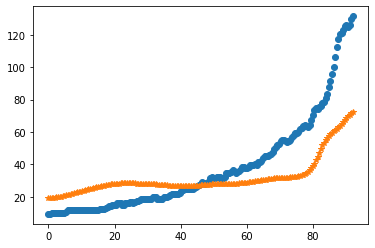

after perturb [9.048297486628814, 64.5256837236656, 23206.087892300362, 0.8383347663307962, 41.298799688631135]
parameters [9.048297486628814, 64.5256837236656, 23206.087892300362, 0.8383347663307962, 41.298799688631135]
after perturb [5.60673937736444, 88.82250325691652, 24847.49617507331, 1.5685412510883816, 72.11354288326508]
parameters [5.60673937736444, 88.82250325691652, 24847.49617507331, 1.5685412510883816, 72.11354288326508]
after perturb [4.868100155298201, 114.78229249838455, 27931.016610721188, 0.22887398633259193, 25.31307374275334]
parameters [4.868100155298201, 114.78229249838455, 27931.016610721188, 0.22887398633259193, 25.31307374275334]
oxigeno [3.10656032e-06 3.10679824e-06 3.10753674e-06 3.10884999e-06
 3.11086146e-06 3.11374378e-06 3.11771850e-06 3.12305596e-06
 3.13007518e-06 3.13914387e-06 3.15067862e-06 3.16514546e-06
 3.18306060e-06 3.20499163e-06 3.23155924e-06 3.26343934e-06
 3.30136588e-06 3.34613422e-06 3.39860524e-06 3.45971019e-06
 3.53045634e-06 3.611933

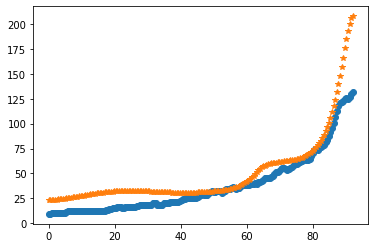

after perturb [3.3217108769374506, 150.96276458084162, 25161.70489367337, 0.7284555432048256, 31.631699040387574]
parameters [3.3217108769374506, 150.96276458084162, 25161.70489367337, 0.7284555432048256, 31.631699040387574]
after perturb [3.175500900724964, 58.1212981300727, 23186.72136447773, 0.14295862720982022, 13.26101466629693]
parameters [3.175500900724964, 58.1212981300727, 23186.72136447773, 0.14295862720982022, 13.26101466629693]
oxigeno [1.45846254e-04 1.45727873e-04 1.45373784e-04 1.44787130e-04
 1.43973062e-04 1.42938616e-04 1.41692548e-04 1.40245137e-04
 1.38607964e-04 1.36793672e-04 1.34815730e-04 1.32688193e-04
 1.30425479e-04 1.28042159e-04 1.25552778e-04 1.22971690e-04
 1.20312933e-04 1.17590119e-04 1.14816358e-04 1.12004196e-04
 1.09165581e-04 1.06311839e-04 1.03453663e-04 1.00601115e-04
 9.77636295e-05 9.49500241e-05 9.21685112e-05 8.94267115e-05
 8.67316679e-05 8.40898589e-05 8.15072138e-05 7.89891268e-05
 7.65404730e-05 7.41656251e-05 7.18684715e-05 6.96524362e-05

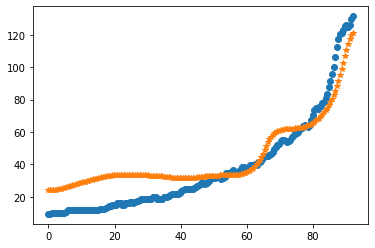

3
after perturb [4.144492183576927, 143.60328876390514, 33026.38852927208, 3.5174383286336406, 92.89572870359953]
parameters [4.144492183576927, 143.60328876390514, 33026.38852927208, 3.5174383286336406, 92.89572870359953]
after perturb [5.04385822483035, 176.71877729511564, 30647.431048952225, 1.396608965482867, 77.39621315239256]
parameters [5.04385822483035, 176.71877729511564, 30647.431048952225, 1.396608965482867, 77.39621315239256]
after perturb [3.6181253711783175, 109.4583978553437, 17623.22943861202, -1.8827917502139417, -16.48760866071747]
parameters [3.6181253711783175, 109.4583978553437, 17623.22943861202, -1.8827917502139417, -16.48760866071747]
after perturb [-0.7561404985097702, 144.65616921516045, 26269.63771185914, 3.8474555667198898, 47.5937656038359]
parameters [-0.7561404985097702, 144.65616921516045, 26269.63771185914, 3.8474555667198898, 47.5937656038359]
after perturb [4.109453380889601, 108.10966691128803, 23872.97399769649, 2.214987043738644, 57.29327696088217]

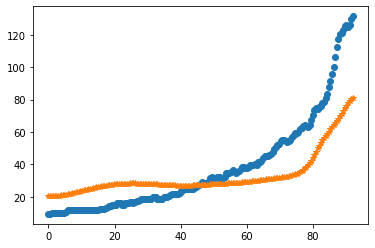

after perturb [7.025940181521378, 75.6220804256789, 26696.590009909665, 0.5313951209036316, 31.535868106738945]
parameters [7.025940181521378, 75.6220804256789, 26696.590009909665, 0.5313951209036316, 31.535868106738945]
after perturb [9.220955702892603, 104.19230655682333, 25556.87542766783, 1.3315040894717818, 60.40103943860342]
parameters [9.220955702892603, 104.19230655682333, 25556.87542766783, 1.3315040894717818, 60.40103943860342]
after perturb [11.186293113169956, 118.91911563299976, 23235.338746836558, 0.2384246126751407, 30.740202601353396]
parameters [11.186293113169956, 118.91911563299976, 23235.338746836558, 0.2384246126751407, 30.740202601353396]
after perturb [5.897389013178839, 131.1009186713957, 19282.136888276127, 0.2735834988666155, 36.73986170836949]
parameters [5.897389013178839, 131.1009186713957, 19282.136888276127, 0.2735834988666155, 36.73986170836949]
after perturb [4.344306524617468, 91.5977665240131, 26732.87608119734, 0.712541083508505, 19.535038777468245]


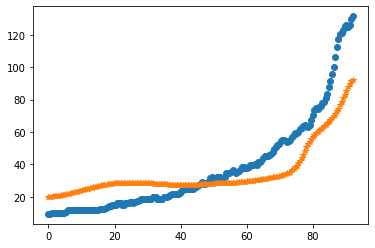

after perturb [-0.21117601433556343, 146.14615681555225, 20321.554139616477, 2.1170131271464205, 30.840831266306466]
parameters [-0.21117601433556343, 146.14615681555225, 20321.554139616477, 2.1170131271464205, 30.840831266306466]
after perturb [5.672346509448372, 85.3337360629781, 21814.989171411555, 1.2632170758390173, -4.0045902462492755]
parameters [5.672346509448372, 85.3337360629781, 21814.989171411555, 1.2632170758390173, -4.0045902462492755]
after perturb [5.530170032863708, 88.26159719704725, 27548.284628014382, 0.8431204953985908, 11.454892120069669]
parameters [5.530170032863708, 88.26159719704725, 27548.284628014382, 0.8431204953985908, 11.454892120069669]
oxigeno [2.40400205e-15 2.44075584e-15 2.55215412e-15 2.74164641e-15
 3.01511261e-15 3.38106409e-15 3.85093550e-15 4.43947791e-15
 5.16526795e-15 6.05135154e-15 7.12604616e-15 8.42393136e-15
 9.98706438e-15 1.18664663e-14 1.41239343e-14 1.68342481e-14
 2.00878542e-14 2.39941286e-14 2.86853423e-14 3.43214807e-14
 4.1096099

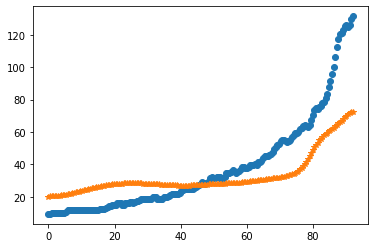

after perturb [8.360203383776586, 33.38562940847631, 21582.63179589852, 0.41773586619545167, 28.560886411086727]
parameters [8.360203383776586, 33.38562940847631, 21582.63179589852, 0.41773586619545167, 28.560886411086727]
after perturb [3.6535643897619132, 139.02708454797457, 10351.528142198009, 2.2423158113288597, 19.850652040395346]
parameters [3.6535643897619132, 139.02708454797457, 10351.528142198009, 2.2423158113288597, 19.850652040395346]
after perturb [10.728069458096137, 141.3941773955568, 18908.18216880377, 1.4931134727654025, 38.63326182912834]
parameters [10.728069458096137, 141.3941773955568, 18908.18216880377, 1.4931134727654025, 38.63326182912834]
after perturb [3.7338413166927573, 97.68771173694671, 19881.2032718837, -0.44371669363650557, -3.2021407341267896]
parameters [3.7338413166927573, 97.68771173694671, 19881.2032718837, -0.44371669363650557, -3.2021407341267896]
after perturb [2.949141609020864, 106.85139677048238, 21362.527811101914, 1.6340432202813953, 19.57690

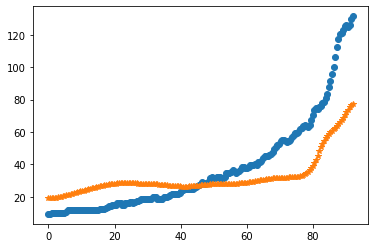

after perturb [3.2834575621365065, 113.27752690642876, 21523.17599092354, -0.04185274393394067, 18.383917355583563]
parameters [3.2834575621365065, 113.27752690642876, 21523.17599092354, -0.04185274393394067, 18.383917355583563]
after perturb [0.9817249429532856, 61.99210298620149, 31075.884459020894, 0.6530680286073893, 56.38351034363297]
parameters [0.9817249429532856, 61.99210298620149, 31075.884459020894, 0.6530680286073893, 56.38351034363297]
after perturb [0.9550634173783332, 99.05980466912631, 31957.487865893567, 1.0193165862124685, 21.477823779449125]
parameters [0.9550634173783332, 99.05980466912631, 31957.487865893567, 1.0193165862124685, 21.477823779449125]
after perturb [2.7641968193355133, 114.80682875673759, 21365.2207786615, 2.2022018489307245, 41.439019287480704]
parameters [2.7641968193355133, 114.80682875673759, 21365.2207786615, 2.2022018489307245, 41.439019287480704]
oxigeno [5.18272810e-21 5.31522783e-21 5.71966387e-21 6.41725566e-21
 7.44475797e-21 8.85663572e-21 

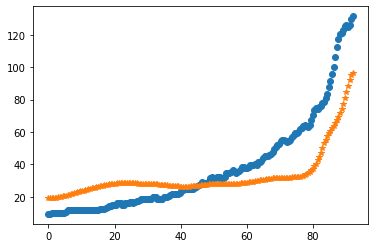

after perturb [5.119967164716356, 111.6742655475354, 20115.09378080139, 0.32726532837331024, 31.839510389409757]
parameters [5.119967164716356, 111.6742655475354, 20115.09378080139, 0.32726532837331024, 31.839510389409757]
oxigeno [4.02360507e-08 4.03039624e-08 4.05087176e-08 4.08533858e-08
 4.13431144e-08 4.19851758e-08 4.27890350e-08 4.37664396e-08
 4.49315322e-08 4.63009892e-08 4.78941862e-08 4.97333961e-08
 5.18440192e-08 5.42548525e-08 5.69983993e-08 6.01112265e-08
 6.36343714e-08 6.76138071e-08 7.21009693e-08 7.71533540e-08
 8.28351924e-08 8.92182118e-08 9.63824916e-08 1.04417425e-07
 1.13422800e-07 1.23510004e-07 1.34803379e-07 1.47441732e-07
 1.61580022e-07 1.77391237e-07 1.95068491e-07 2.14827349e-07
 2.36908420e-07 2.61580224e-07 2.89142386e-07 3.19929164e-07
 3.54313365e-07 3.92710671e-07 4.35584434e-07 4.83450970e-07
 5.36885411e-07 5.96528177e-07 6.63092125e-07 7.37370444e-07
 8.20245386e-07 9.12697909e-07 1.01581835e-06 1.13081820e-06
 1.25904316e-06 1.40198756e-06 1.5613

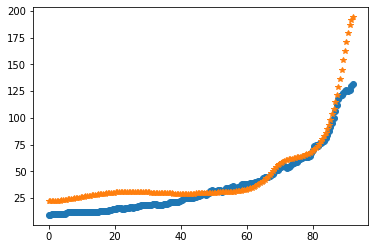

4
after perturb [7.15275930727637, 73.2145779933665, 19935.0432550465, 1.068771845849891, 8.334689778865812]
parameters [7.15275930727637, 73.2145779933665, 19935.0432550465, 1.068771845849891, 8.334689778865812]
after perturb [2.3922583586290775, 191.5987469160955, 21601.481273759808, 1.1165683309620018, 4.978668654975124]
parameters [2.3922583586290775, 191.5987469160955, 21601.481273759808, 1.1165683309620018, 4.978668654975124]
after perturb [5.668936237270711, 121.7390554094262, 25771.627795295313, 0.7697332982930136, 37.98293397923027]
parameters [5.668936237270711, 121.7390554094262, 25771.627795295313, 0.7697332982930136, 37.98293397923027]
oxigeno [2.88305454e-12 2.91080459e-12 2.99460275e-12 3.13610560e-12
 3.33811645e-12 3.60464984e-12 3.94102409e-12 4.35398401e-12
 4.85185677e-12 5.44474474e-12 6.14475993e-12 6.96630578e-12
 7.92641315e-12 9.04513879e-12 1.03460361e-11 1.18567098e-11
 1.36094681e-11 1.56420888e-11 1.79987184e-11 2.07309258e-11
 2.38989385e-11 2.75730896e-11

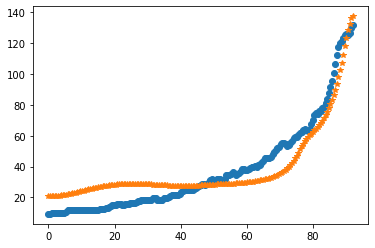

5
after perturb [0.9102213464035153, 85.11218769331933, 24306.26331679568, 2.398495617885092, 32.34363128925913]
parameters [0.9102213464035153, 85.11218769331933, 24306.26331679568, 2.398495617885092, 32.34363128925913]
oxigeno [1.37392333e-25 1.42391183e-25 1.57772145e-25 1.84723259e-25
 2.25342957e-25 2.82826191e-25 3.61744086e-25 4.68440504e-25
 6.11581837e-25 8.02913949e-25 1.05830339e-24 1.39916975e-24
 1.85445314e-24 2.46330683e-24 3.27876275e-24 4.37269318e-24
 5.84249584e-24 7.82007919e-24 1.04839484e-23 1.40755273e-23
 1.89213525e-23 2.54635026e-23 3.43016568e-23 4.62515799e-23
 6.24266870e-23 8.43517402e-23 1.14120797e-22 1.54615513e-22
 2.09805209e-22 2.85157530e-22 3.88199201e-22 5.29282216e-22
 7.22634302e-22 9.87807137e-22 1.35168576e-21 1.85129292e-21
 2.53771873e-21 3.48163545e-21 4.78102872e-21 6.57200003e-21
 9.04378665e-21 1.24595263e-20 1.71847998e-20 2.37266697e-20
 3.27868849e-20 4.53342667e-20 6.27032029e-20 8.67278901e-20
 1.19925731e-19 1.65748467e-19 2.289266

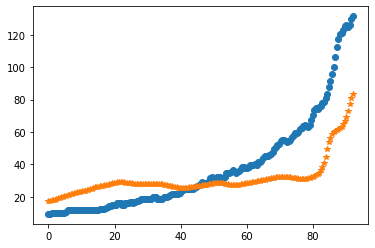

after perturb [1.6842297951912812, 150.6314318765602, 23854.180201349227, 1.2247946744680915, 34.64593377558008]
parameters [1.6842297951912812, 150.6314318765602, 23854.180201349227, 1.2247946744680915, 34.64593377558008]
after perturb [5.110080656498555, 83.47247749227913, 25514.238946615904, 1.04262060003235, 25.17396241668089]
parameters [5.110080656498555, 83.47247749227913, 25514.238946615904, 1.04262060003235, 25.17396241668089]
oxigeno [2.25136507e-17 2.29516805e-17 2.42829824e-17 2.65599302e-17
 2.98723047e-17 3.43511489e-17 4.01744149e-17 4.75746598e-17
 5.68491508e-17 6.83728475e-17 8.26148687e-17 1.00159214e-16
 1.21730718e-16 1.48227452e-16 1.80761133e-16 2.20707432e-16
 2.69768618e-16 3.30051534e-16 4.04164656e-16 4.95338952e-16
 6.07578402e-16 7.45847509e-16 9.16304973e-16 1.12659496e-15
 1.38621029e-15 1.70694533e-15 2.10346089e-15 2.59398899e-15
 3.20121204e-15 3.95335965e-15 4.88557703e-15 6.04163194e-15
 7.47604364e-15 9.25673772e-15 1.14683558e-14 1.42163807e-14
 1.

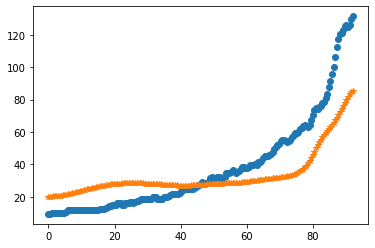

after perturb [2.851345807028876, 67.59179229069981, 24554.658523176156, -0.5985103116463537, 12.771705512751744]
parameters [2.851345807028876, 67.59179229069981, 24554.658523176156, -0.5985103116463537, 12.771705512751744]
after perturb [2.5503036389397136, 126.20615314786357, 26478.711752270163, 1.8268386634537856, 45.50650433417238]
parameters [2.5503036389397136, 126.20615314786357, 26478.711752270163, 1.8268386634537856, 45.50650433417238]
oxigeno [2.83504802e-18 2.88983516e-18 3.05638819e-18 3.34138412e-18
 3.75629706e-18 4.31793415e-18 5.04922125e-18 5.98027635e-18
 7.14982231e-18 8.60700747e-18 1.04137232e-17 1.26475323e-17
 1.54053533e-17 1.88080847e-17 2.30064020e-17 2.81880234e-17
 3.45868149e-17 4.24942088e-17 5.22735325e-17 6.43780035e-17
 7.93733467e-17 9.79662477e-17 1.21040169e-16 1.49700470e-16
 1.85331267e-16 2.29667131e-16 2.84883518e-16 3.53710854e-16
 4.39578501e-16 5.46796450e-16 6.80784677e-16 8.48362664e-16
 1.05811488e-15 1.32085214e-15 1.65019375e-15 2.063301

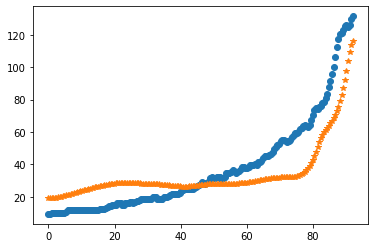

after perturb [6.949916251838781, 106.42225122123797, 24795.90284452978, 1.081587121588341, 64.10498746085331]
parameters [6.949916251838781, 106.42225122123797, 24795.90284452978, 1.081587121588341, 64.10498746085331]
after perturb [5.242518563112043, 37.86561252242477, 28791.883487616116, 0.697970256886095, 33.5018842760503]
parameters [5.242518563112043, 37.86561252242477, 28791.883487616116, 0.697970256886095, 33.5018842760503]
after perturb [5.100172218769647, 145.38721155195998, 23365.333488435375, 3.162592767653103, 68.17616149815377]
parameters [5.100172218769647, 145.38721155195998, 23365.333488435375, 3.162592767653103, 68.17616149815377]
after perturb [8.057411847456176, 71.14699847037195, 22889.537596433627, -0.05901106484071961, 17.575151831671008]
parameters [8.057411847456176, 71.14699847037195, 22889.537596433627, -0.05901106484071961, 17.575151831671008]
after perturb [3.516780263866444, 89.7454341157892, 16302.629354248704, 1.4648005472178165, 25.61068515818843]
param

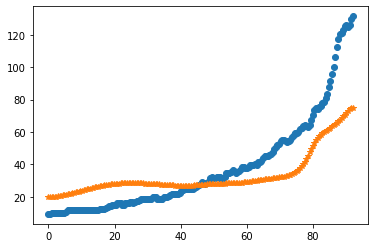

after perturb [4.510411222854007, 64.9759183187946, 32553.08200610205, -0.30919529001506174, 15.269908134560758]
parameters [4.510411222854007, 64.9759183187946, 32553.08200610205, -0.30919529001506174, 15.269908134560758]
after perturb [1.723488339658382, 77.53364245417622, 28524.952689502454, 0.10265262309116907, 44.65493347916631]
parameters [1.723488339658382, 77.53364245417622, 28524.952689502454, 0.10265262309116907, 44.65493347916631]
oxigeno [3.68256767e-03 3.68009417e-03 3.67270120e-03 3.66047023e-03
 3.64353332e-03 3.62206800e-03 3.59629078e-03 3.56644986e-03
 3.53281773e-03 3.49568390e-03 3.45534822e-03 3.41211495e-03
 3.36628760e-03 3.31816464e-03 3.26803594e-03 3.21618002e-03
 3.16286216e-03 3.10833333e-03 3.05282992e-03 2.99657438e-03
 2.93977648e-03 2.88263504e-03 2.82533987e-03 2.76807359e-03
 2.71101305e-03 2.65433026e-03 2.59819253e-03 2.54276219e-03
 2.48819572e-03 2.43464282e-03 2.38224545e-03 2.33113720e-03
 2.28144308e-03 2.23327977e-03 2.18675630e-03 2.14197486e-

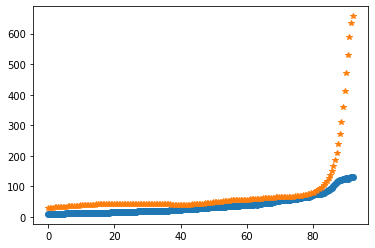

after perturb [3.0382334723356283, 57.05710472323443, 24430.312115824767, -0.49806767922640094, 0.006336051765543971]
parameters [3.0382334723356283, 57.05710472323443, 24430.312115824767, -0.49806767922640094, 0.006336051765543971]
after perturb [2.834614096058003, 114.46611820812655, 19897.044282862375, 1.4536653750257655, 37.83046618748907]
parameters [2.834614096058003, 114.46611820812655, 19897.044282862375, 1.4536653750257655, 37.83046618748907]
after perturb [9.560367445497562, 103.86755678104075, 26550.489482894503, 1.4677413158322472, 41.53531374698368]
parameters [9.560367445497562, 103.86755678104075, 26550.489482894503, 1.4677413158322472, 41.53531374698368]
after perturb [4.60974187553413, 115.8379079956091, 30889.4293686807, 0.8925263937912415, 27.02311543286732]
parameters [4.60974187553413, 115.8379079956091, 30889.4293686807, 0.8925263937912415, 27.02311543286732]
after perturb [7.061870037120667, 60.413919970972216, 27415.63641341129, -0.4475022192457733, 27.121054925

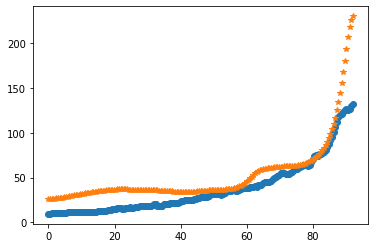

after perturb [3.8014219160126794, 121.5440768127051, 28283.599859547256, 0.5516522006374793, 33.044630261051296]
parameters [3.8014219160126794, 121.5440768127051, 28283.599859547256, 0.5516522006374793, 33.044630261051296]
oxigeno [1.92361674e-10 1.93703531e-10 1.97748954e-10 2.04557863e-10
 2.14231349e-10 2.26913533e-10 2.42794200e-10 2.62112260e-10
 2.85160094e-10 3.12288835e-10 3.43914698e-10 3.80526448e-10
 4.22694156e-10 4.71079371e-10 5.26446931e-10 5.89678600e-10
 6.61788808e-10 7.43942786e-10 8.37477440e-10 9.43925376e-10
 1.06504252e-09 1.20283989e-09 1.35962006e-09 1.53801915e-09
 1.74105489e-09 1.97218193e-09 2.23535518e-09 2.53510244e-09
 2.87660765e-09 3.26580607e-09 3.70949319e-09 4.21544924e-09
 4.79258116e-09 5.45108473e-09 6.20262912e-09 7.06056711e-09
 8.04017408e-09 9.15891960e-09 1.04367757e-08 1.18965668e-08
 1.35643661e-08 1.54699451e-08 1.76472827e-08 2.01351421e-08
 2.29777241e-08 2.62254078e-08 2.99355896e-08 3.41736355e-08
 3.90139604e-08 4.45412549e-08 5.08

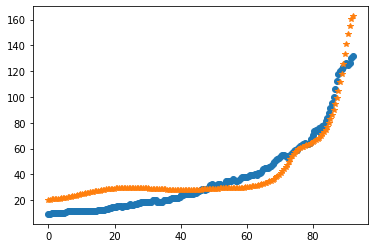

6
after perturb [8.033085758295115, 124.64787383782588, 24210.528767030482, 1.1857448700513409, 45.95220919821742]
parameters [8.033085758295115, 124.64787383782588, 24210.528767030482, 1.1857448700513409, 45.95220919821742]
after perturb [6.946404521412801, 122.1334487302041, 16727.17329804897, -0.15312820729776866, -3.4591818056611316]
parameters [6.946404521412801, 122.1334487302041, 16727.17329804897, -0.15312820729776866, -3.4591818056611316]
after perturb [3.654111390422922, 57.29212398667892, 24835.843251301558, 2.155814936817393, 47.063456796973796]
parameters [3.654111390422922, 57.29212398667892, 24835.843251301558, 2.155814936817393, 47.063456796973796]
oxigeno [7.09785016e-30 7.49002774e-30 8.71009114e-30 1.08936803e-29
 1.42843073e-29 1.92617749e-29 2.63867568e-29 3.64670720e-29
 5.06539219e-29 7.05801748e-29 9.85581851e-29 1.37862338e-28
 1.93132557e-28 2.70950901e-28 3.80666262e-28 5.35575228e-28
 7.54614899e-28 1.06479258e-27 1.50467736e-27 2.12942370e-27
 3.01800808e-2

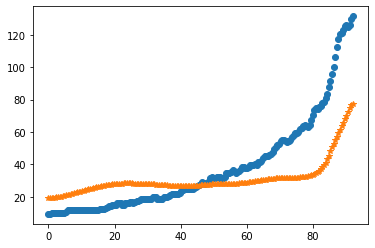

after perturb [1.6726843644763165, 59.679868897612685, 32839.04531565259, 0.8575660898191421, 22.11409528650864]
parameters [1.6726843644763165, 59.679868897612685, 32839.04531565259, 0.8575660898191421, 22.11409528650864]
after perturb [5.171386626274834, 149.6172700350178, 23364.51766088888, -0.20055152877795085, -4.556760087898208]
parameters [5.171386626274834, 149.6172700350178, 23364.51766088888, -0.20055152877795085, -4.556760087898208]
after perturb [8.726764336806795, 124.56863257763052, 22169.320844530877, 1.7197660014653091, 59.00355867352577]
parameters [8.726764336806795, 124.56863257763052, 22169.320844530877, 1.7197660014653091, 59.00355867352577]
after perturb [4.911946304828632, 87.42403362404575, 28144.766057474222, -0.7586122860176112, 0.5000298891437538]
parameters [4.911946304828632, 87.42403362404575, 28144.766057474222, -0.7586122860176112, 0.5000298891437538]
after perturb [3.996169505234251, 49.5181745475553, 21564.89719881637, -0.0011956885253084915, 19.478677

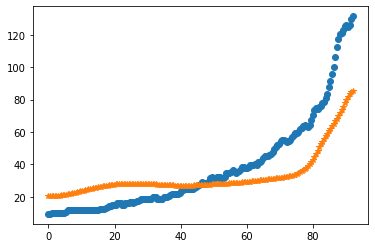

after perturb [3.062248139143803, 109.18401686370456, 29407.828459349897, 0.16051474755518763, 36.32066233531148]
parameters [3.062248139143803, 109.18401686370456, 29407.828459349897, 0.16051474755518763, 36.32066233531148]
after perturb [1.7260485668698593, 103.45559271632311, 18880.732411044162, 1.1673782123937526, 34.590490361354846]
parameters [1.7260485668698593, 103.45559271632311, 18880.732411044162, 1.1673782123937526, 34.590490361354846]
after perturb [4.803715669550018, 114.08427386164742, 32711.555642288677, 2.594196111113254, 50.469118365066336]
parameters [4.803715669550018, 114.08427386164742, 32711.555642288677, 2.594196111113254, 50.469118365066336]
after perturb [2.9342121524718556, 122.42930844927545, 32125.013849037583, 1.6554813283056307, 53.401478085514796]
parameters [2.9342121524718556, 122.42930844927545, 32125.013849037583, 1.6554813283056307, 53.401478085514796]
after perturb [6.145662150148076, 137.2717133934298, 33734.7591058816, 1.161972828163674, 72.01926

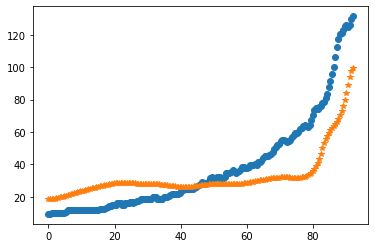

after perturb [6.756189469617754, 147.70860257914595, 29769.215618177936, 1.7542922825127714, 62.301995555499715]
parameters [6.756189469617754, 147.70860257914595, 29769.215618177936, 1.7542922825127714, 62.301995555499715]
after perturb [3.162123763754232, 57.96541350728968, 25248.99172101217, 1.3713127180015563, 53.55761637958557]
parameters [3.162123763754232, 57.96541350728968, 25248.99172101217, 1.3713127180015563, 53.55761637958557]
after perturb [4.184748236254771, 182.61910313981036, 28864.451301693356, 0.49911288014965927, 57.52567064521016]
parameters [4.184748236254771, 182.61910313981036, 28864.451301693356, 0.49911288014965927, 57.52567064521016]
after perturb [4.0420364393548995, 98.97656461460328, 25793.389242723086, -0.19681627210097785, 6.952396919582595]
parameters [4.0420364393548995, 98.97656461460328, 25793.389242723086, -0.19681627210097785, 6.952396919582595]
after perturb [1.7313533230281997, 113.58689435243242, 24360.696943793246, 1.343559724693425, 52.7361876

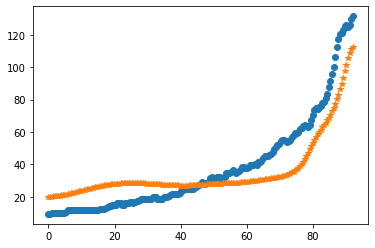

7
after perturb [0.5570385591368051, 113.95881295359912, 23045.713068508117, 1.855347809095421, 47.74685100453159]
parameters [0.5570385591368051, 113.95881295359912, 23045.713068508117, 1.855347809095421, 47.74685100453159]
oxigeno [2.07986936e-19 2.12195059e-19 2.25026283e-19 2.47111404e-19
 2.79535351e-19 3.23886468e-19 3.82325166e-19 4.57675471e-19
 5.53548130e-19 6.74510336e-19 8.26323360e-19 1.01627348e-18
 1.25362155e-18 1.55019151e-18 1.92110925e-18 2.38569599e-18
 2.96852001e-18 3.70062439e-18 4.62097875e-18 5.77825129e-18
 7.23306413e-18 9.06098095e-18 1.13565812e-17 1.42390924e-17
 1.78601502e-17 2.24142975e-17 2.81527609e-17 3.54008781e-17
 4.45793568e-17 5.62295243e-17 7.10430815e-17 8.98977970e-17
 1.13902069e-16 1.44453169e-16 1.83315929e-16 2.32730318e-16
 2.95557794e-16 3.75477730e-16 4.77246817e-16 6.07036044e-16
 7.72860763e-16 9.85118873e-16 1.25725087e-15 1.60653621e-15
 2.05504808e-15 2.63080921e-15 3.36922674e-15 4.31493093e-15
 5.52418789e-15 7.06808566e-15 9.03

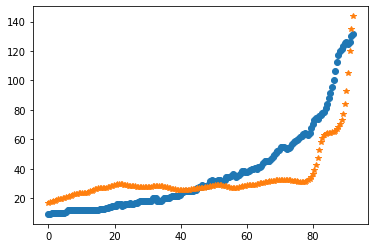

after perturb [3.6097219514292824, 69.1878729831527, 31426.345838086963, -0.04811561623780747, 52.6947999226838]
parameters [3.6097219514292824, 69.1878729831527, 31426.345838086963, -0.04811561623780747, 52.6947999226838]
after perturb [5.294750130165884, 139.58982711537612, 24687.278750111967, 2.228385355477645, 25.74231589375666]
parameters [5.294750130165884, 139.58982711537612, 24687.278750111967, 2.228385355477645, 25.74231589375666]
oxigeno [4.00434024e-19 4.09144828e-19 4.35662018e-19 4.81158540e-19
 5.47652296e-19 6.38104123e-19 7.56562123e-19 9.08359993e-19
 1.10037988e-18 1.34139379e-18 1.64250183e-18 2.01769090e-18
 2.48454403e-18 3.06513903e-18 3.78718555e-18 4.68546321e-18
 5.80364027e-18 7.19657418e-18 8.93322247e-18 1.11003278e-17
 1.38070852e-17 1.71910561e-17 2.14256665e-17 2.67297171e-17
 3.33794514e-17 4.17238756e-17 5.22042130e-17 6.53786164e-17
 8.19535670e-17 1.02823776e-16 1.29122897e-16 1.62287990e-16
 2.04141448e-16 2.56995134e-16 3.23782730e-16 4.08227896e-16

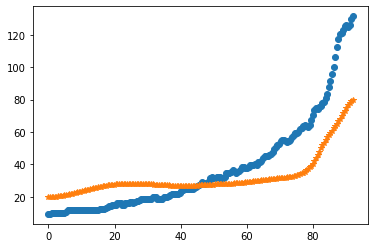

after perturb [3.6194489019424636, 139.39112233662675, 28650.54450195576, -0.9857044073359364, 52.139360666233586]
parameters [3.6194489019424636, 139.39112233662675, 28650.54450195576, -0.9857044073359364, 52.139360666233586]
after perturb [4.844422734836629, 27.948874389265562, 28686.970642391545, -0.8789821323676625, 24.93585142443552]
parameters [4.844422734836629, 27.948874389265562, 28686.970642391545, -0.8789821323676625, 24.93585142443552]
after perturb [5.160144551769784, 128.06696406836647, 22210.11582861666, 2.6564424505368622, 42.82781170677514]
parameters [5.160144551769784, 128.06696406836647, 22210.11582861666, 2.6564424505368622, 42.82781170677514]
oxigeno [9.53398807e-22 9.80081850e-22 1.06164244e-21 1.20270718e-21
 1.41130050e-21 1.69933657e-21 2.08335312e-21 2.58553591e-21
 3.23510247e-21 4.07013819e-21 5.14000859e-21 6.50851218e-21
 8.25798929e-21 1.04946701e-20 1.33556322e-20 1.70178539e-20
 2.17099973e-20 2.77277553e-20 3.54538524e-20 4.53841287e-20
 5.81615844e-2

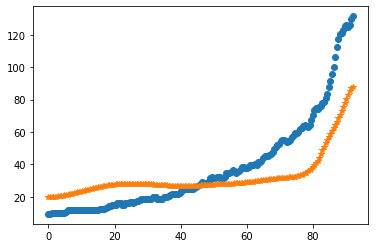

after perturb [5.888439068773822, 53.941652389842766, 30028.120690352625, -0.5001781198093804, -10.54173712059185]
parameters [5.888439068773822, 53.941652389842766, 30028.120690352625, -0.5001781198093804, -10.54173712059185]
after perturb [2.950727235867372, 79.67766162871119, 27525.460264786372, 1.0671068571168645, 23.84213486752713]
parameters [2.950727235867372, 79.67766162871119, 27525.460264786372, 1.0671068571168645, 23.84213486752713]
oxigeno [5.18703304e-18 5.29259792e-18 5.61367557e-18 6.16361995e-18
 6.96538084e-18 8.05257900e-18 9.47108428e-18 1.12811738e-17
 1.35603763e-17 1.64071424e-17 1.99455233e-17 2.43310889e-17
 2.97583826e-17 3.64702869e-17 4.47697742e-17 5.50346400e-17
 6.77359773e-17 8.34613434e-17 1.02943827e-16 1.27098535e-16
 1.57068425e-16 1.94281899e-16 2.40525236e-16 2.98033720e-16
 3.69606335e-16 4.58750198e-16 5.69862472e-16 7.08459560e-16
 8.81465900e-16 1.09757792e-15 1.36772268e-15 1.70563590e-15
 2.12859021e-15 2.65831256e-15 3.32213955e-15 4.15447160

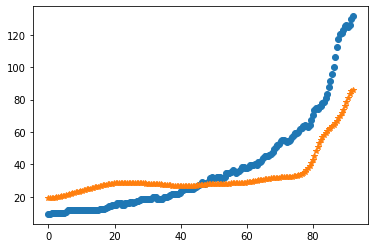

after perturb [10.129832653803733, 192.338078834844, 15780.41375709254, 2.6061512668181512, 60.172306177115885]
parameters [10.129832653803733, 192.338078834844, 15780.41375709254, 2.6061512668181512, 60.172306177115885]
after perturb [3.1944135289081514, 114.22330271230939, 21876.868723626943, 2.797987104858315, 56.41703108416859]
parameters [3.1944135289081514, 114.22330271230939, 21876.868723626943, 2.797987104858315, 56.41703108416859]
after perturb [2.3718423380629154, 100.33118040517517, 33799.34111024292, 1.2079422297401377, 39.19506157907475]
parameters [2.3718423380629154, 100.33118040517517, 33799.34111024292, 1.2079422297401377, 39.19506157907475]
after perturb [1.507387191807131, 180.01498688846996, 27287.24077690825, 2.57993639605232, 28.03684032027391]
parameters [1.507387191807131, 180.01498688846996, 27287.24077690825, 2.57993639605232, 28.03684032027391]
after perturb [7.216870476671685, 69.26025421314444, 29137.115083833636, 1.2349651330034028, 48.78324863767806]
para

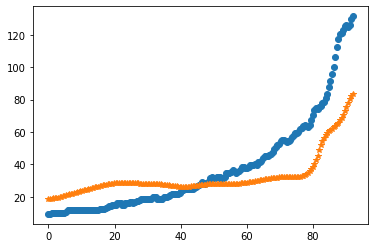

after perturb [4.064911096346333, 130.04628333394453, 23491.055554207058, 2.10667158717962, 45.80574429893337]
parameters [4.064911096346333, 130.04628333394453, 23491.055554207058, 2.10667158717962, 45.80574429893337]
oxigeno [2.79062492e-19 2.85171238e-19 3.03770155e-19 3.35690812e-19
 3.82365006e-19 4.45896107e-19 5.29164271e-19 6.35971178e-19
 7.71232153e-19 9.41226081e-19 1.15391678e-18 1.41936345e-18
 1.75024282e-18 2.16251198e-18 2.67624891e-18 3.31671777e-18
 4.11571932e-18 5.11330310e-18 6.35993934e-18 7.91927559e-18
 9.87163741e-18 1.23184769e-17 1.53880287e-17 1.92425058e-17
 2.40872589e-17 3.01824400e-17 3.78578630e-17 4.75319421e-17
 5.97358349e-17 7.51442275e-17 9.46145930e-17 1.19237259e-16
 1.50399260e-16 1.89865758e-16 2.39883854e-16 3.03314912e-16
 3.83803169e-16 4.85990521e-16 6.15790002e-16 7.80733843e-16
 9.90416259e-16 1.25705644e-15 1.59621409e-15 2.02769829e-15
 2.57672164e-15 3.27536495e-15 4.16443554e-15 5.29582406e-15
 6.73549255e-15 8.56726182e-15 1.08976107

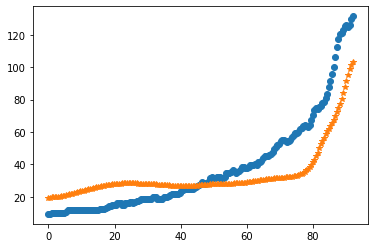

after perturb [5.74918094077245, 114.02421235192995, 32167.700510846338, 0.06771286793030454, 37.848166542733836]
parameters [5.74918094077245, 114.02421235192995, 32167.700510846338, 0.06771286793030454, 37.848166542733836]
after perturb [7.102399165788444, 94.17609446209968, 26579.876635947454, 0.4574637202606173, 36.949181221439666]
parameters [7.102399165788444, 94.17609446209968, 26579.876635947454, 0.4574637202606173, 36.949181221439666]
after perturb [10.283108077724435, 108.9124585370453, 17119.98804175872, -1.259609293439225, 11.834457436964065]
parameters [10.283108077724435, 108.9124585370453, 17119.98804175872, -1.259609293439225, 11.834457436964065]
after perturb [2.2156789346453896, 178.62417984830705, 20366.7739267343, 4.3722858820327435, 78.7352963202605]
parameters [2.2156789346453896, 178.62417984830705, 20366.7739267343, 4.3722858820327435, 78.7352963202605]
after perturb [2.119625606225549, 194.25743095081955, 22405.187481981393, 1.8375590995719284, 46.0788981776272

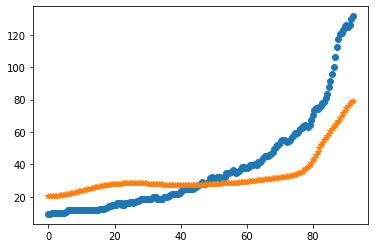

after perturb [3.375003657921704, 53.685378519001205, 21997.810991051403, -0.31566953789647906, 4.261427203338933]
parameters [3.375003657921704, 53.685378519001205, 21997.810991051403, -0.31566953789647906, 4.261427203338933]
after perturb [8.82821308988332, 83.37853500378132, 23133.82400963842, 0.5189859504828064, 16.097478645548435]
parameters [8.82821308988332, 83.37853500378132, 23133.82400963842, 0.5189859504828064, 16.097478645548435]
after perturb [5.636427192288346, 62.701375511318304, 22489.056363825217, 0.0011079566831516674, 17.900067759568294]
parameters [5.636427192288346, 62.701375511318304, 22489.056363825217, 0.0011079566831516674, 17.900067759568294]
oxigeno [ 28.78735498  28.78671156  28.78478454  28.7815836   28.77712476
  28.77143019  28.76452799  28.75645186  28.74724075  28.7369385
  28.72559338  28.71325764  28.69998708  28.68584055  28.67087949
  28.65516751  28.63876991  28.62175329  28.60418519  28.58613369
  28.5676671   28.54885367  28.52976131  28.51045735

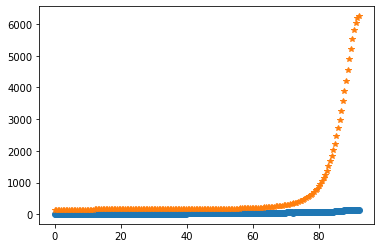

after perturb [4.62846514336867, 73.69191016291352, 27455.615759304703, 1.4827671414999224, 19.639749165712608]
parameters [4.62846514336867, 73.69191016291352, 27455.615759304703, 1.4827671414999224, 19.639749165712608]
oxigeno [5.30327407e-22 5.46461089e-22 5.95850468e-22 6.81525018e-22
 8.08753291e-22 9.85388189e-22 1.22238379e-21 1.53452014e-21
 1.94138714e-21 2.46869755e-21 3.15002254e-21 4.02907439e-21
 5.16270094e-21 6.62480877e-21 8.51150152e-21 1.09478100e-20
 1.40965109e-20 1.81696882e-20 2.34438995e-20 3.02800860e-20
 3.91497254e-20 5.06692091e-20 6.56450607e-20 8.51334490e-20
 1.10518561e-19 1.43615867e-19 1.86808245e-19 2.43225506e-19
 3.16981232e-19 4.13485317e-19 5.39856523e-19 7.05467120e-19
 9.22661978e-19 1.20770802e-18 1.58204776e-18 2.07395417e-18
 2.72071496e-18 3.57151501e-18 4.69123905e-18 6.16548670e-18
 8.10718412e-18 1.06652971e-17 1.40363087e-17 1.84793320e-17
 2.43360009e-17 3.20566378e-17 4.22346636e-17 5.56518269e-17
 7.33376295e-17 9.66473719e-17 1.273646

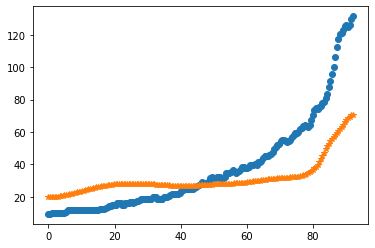

after perturb [3.4590220872896142, 61.006405942016755, 25026.982398901826, 1.9476764738133685, 45.891844452087724]
parameters [3.4590220872896142, 61.006405942016755, 25026.982398901826, 1.9476764738133685, 45.891844452087724]
oxigeno [1.47602350e-27 1.54533783e-27 1.75983061e-27 2.13980375e-27
 2.72133841e-27 3.55991197e-27 4.73599034e-27 6.36319431e-27
 8.59991791e-27 1.16656560e-26 1.58638176e-26 2.16135241e-26
 2.94938985e-26 4.03057608e-26 5.51576251e-26 7.55856723e-26
 1.03721288e-25 1.42525268e-25 1.96115584e-25 2.70226565e-25
 3.72852918e-25 5.15153925e-25 7.12724297e-25 9.87382156e-25
 1.36968705e-24 1.90248937e-24 2.64593805e-24 3.68455145e-24
 5.13720892e-24 7.17127905e-24 1.00226092e-23 1.40238223e-23
 1.96443897e-23 2.75474009e-23 3.86700016e-23 5.43373855e-23
 7.64243371e-23 1.07584141e-22 1.51572896e-22 2.13708861e-22
 3.01522833e-22 4.25678609e-22 6.01275030e-22 8.49686852e-22
 1.20116594e-21 1.69851474e-21 2.40227102e-21 3.39802166e-21
 4.80671413e-21 6.79918710e-21 9.

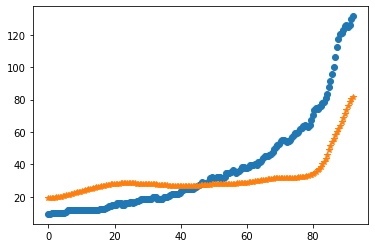

after perturb [4.38176702250122, 84.94394057263014, 30622.565052916078, -0.698599887047405, -12.660903792795658]
parameters [4.38176702250122, 84.94394057263014, 30622.565052916078, -0.698599887047405, -12.660903792795658]
after perturb [4.388980490515575, 109.49141087499339, 26131.25934360545, 1.6694126212814193, 58.175439458056005]
parameters [4.388980490515575, 109.49141087499339, 26131.25934360545, 1.6694126212814193, 58.175439458056005]
after perturb [7.318130199711234, 111.67833191259027, 22745.947602710126, 0.8395947103898982, 32.551466943260344]
parameters [7.318130199711234, 111.67833191259027, 22745.947602710126, 0.8395947103898982, 32.551466943260344]
after perturb [-0.7733789890857459, 155.6501021866542, 22855.038049763887, 1.6510122708539625, 43.055969725660304]
parameters [-0.7733789890857459, 155.6501021866542, 22855.038049763887, 1.6510122708539625, 43.055969725660304]
after perturb [6.716306362380181, 53.30311677642857, 24264.356606583187, 0.5216938388605709, 7.0860821

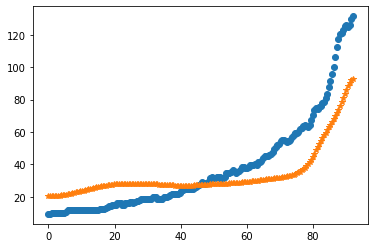

after perturb [7.032320148741881, 63.81771589781816, 24956.4462484259, -1.299339500454686, 42.520239864383576]
parameters [7.032320148741881, 63.81771589781816, 24956.4462484259, -1.299339500454686, 42.520239864383576]
after perturb [6.8142344793503735, 103.88842144438678, 21904.846836102737, 0.18848466641826755, 1.5384674513460723]
parameters [6.8142344793503735, 103.88842144438678, 21904.846836102737, 0.18848466641826755, 1.5384674513460723]
after perturb [8.105486807828292, 163.34398668804442, 18765.532322050713, 1.3416563763771188, 7.515953433368985]
parameters [8.105486807828292, 163.34398668804442, 18765.532322050713, 1.3416563763771188, 7.515953433368985]
after perturb [4.509104068509316, 73.63716742559721, 27573.58453434531, -0.24133816533723904, 15.82018766039895]
parameters [4.509104068509316, 73.63716742559721, 27573.58453434531, -0.24133816533723904, 15.82018766039895]
after perturb [4.330347876498898, 103.18193066871977, 26519.78937673612, 1.2514316233848333, 45.5736040916

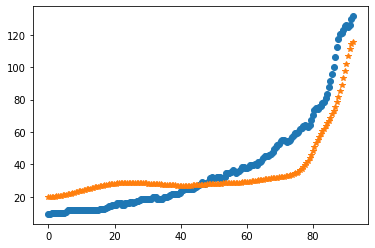

after perturb [0.2246786549917612, 74.62551959493062, 23814.366338795353, 0.7273698427591493, 15.323784059832795]
parameters [0.2246786549917612, 74.62551959493062, 23814.366338795353, 0.7273698427591493, 15.323784059832795]
oxigeno [2.02750948e-15 2.04449240e-15 2.09657663e-15 2.18706768e-15
 2.32119502e-15 2.50584522e-15 2.74938797e-15 3.06165915e-15
 3.45411284e-15 3.94013636e-15 4.53557941e-15 5.25965003e-15
 6.13635055e-15 7.19644793e-15 8.47966688e-15 1.00366105e-14
 1.19300423e-14 1.42355825e-14 1.70423813e-14 2.04545804e-14
 2.45940779e-14 2.96045250e-14 3.56562807e-14 4.29527803e-14
 5.17402751e-14 6.23240571e-14 7.50933163e-14 9.05528770e-14
 1.09355128e-13 1.32323367e-13 1.60461120e-13 1.94950838e-13
 2.37157408e-13 2.88660084e-13 3.51330936e-13 4.27457317e-13
 5.19886142e-13 6.32172281e-13 7.68743276e-13 9.35120328e-13
 1.13823231e-12 1.38682231e-12 1.69189468e-12 2.06711813e-12
 2.52911365e-12 3.09762423e-12 3.79568547e-12 4.65006004e-12
 5.69228090e-12 6.96052375e-12 8.50

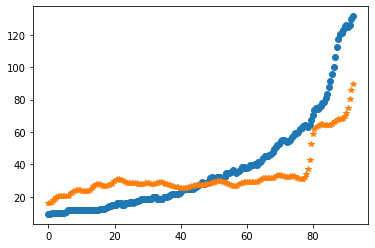

after perturb [1.1854213385923709, 58.80185655118744, 28636.89289379628, 1.6300287303127217, 47.78401370176846]
parameters [1.1854213385923709, 58.80185655118744, 28636.89289379628, 1.6300287303127217, 47.78401370176846]
oxigeno [8.21047288e-26 8.53744021e-26 9.54516271e-26 1.13165940e-25
 1.39985165e-25 1.78151255e-25 2.30887388e-25 3.02695694e-25
 3.99774232e-25 5.30594243e-25 7.06695323e-25 9.43778365e-25
 1.26320568e-24 1.69405701e-24 2.27594278e-24 3.06284739e-24
 4.12837390e-24 5.57289964e-24 7.53334921e-24 1.01965727e-23
 1.38177205e-23 1.87455772e-23 2.54576219e-23 3.46086936e-23
 4.70986624e-23 6.41665746e-23 8.75215377e-23 1.19524422e-22
 1.63439686e-22 2.23783935e-22 3.06808093e-22 4.21164739e-22
 5.78833140e-22 7.96404518e-22 1.09687270e-21 1.51213521e-21
 2.08649325e-21 2.88155298e-21 3.98308642e-21 5.51061928e-21
 7.63079598e-21 1.05759513e-20 1.46698323e-20 2.03631151e-20
 2.82823200e-20 3.92970624e-20 5.46124225e-20 7.58957939e-20
 1.05451148e-19 1.46458611e-19 2.033040

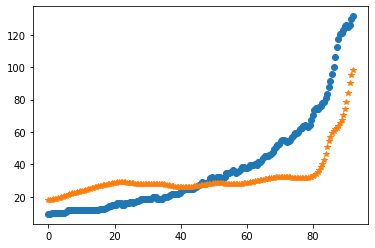

after perturb [7.944110429359959, 180.7924590709394, 16178.360754398822, 0.5508616341012738, 15.171572287501778]
parameters [7.944110429359959, 180.7924590709394, 16178.360754398822, 0.5508616341012738, 15.171572287501778]
after perturb [4.103860761633285, 101.73341300177795, 22634.886923379207, 0.4770582449072145, 27.05445647662649]
parameters [4.103860761633285, 101.73341300177795, 22634.886923379207, 0.4770582449072145, 27.05445647662649]
oxigeno [1.22567941e-10 1.23328653e-10 1.25623499e-10 1.29490841e-10
 1.34995411e-10 1.42229515e-10 1.51314754e-10 1.62404287e-10
 1.75685686e-10 1.91384429e-10 2.09768104e-10 2.31151399e-10
 2.55901986e-10 2.84447392e-10 3.17283020e-10 3.54981459e-10
 3.98203274e-10 4.47709497e-10 5.04376064e-10 5.69210498e-10
 6.43371155e-10 7.28189447e-10 8.25195459e-10 9.36147494e-10
 1.06306611e-09 1.20827332e-09 1.37443777e-09 1.56462663e-09
 1.78236535e-09 2.03170628e-09 2.31730752e-09 2.64452332e-09
 3.01950779e-09 3.44933371e-09 3.94212846e-09 4.50722960e-

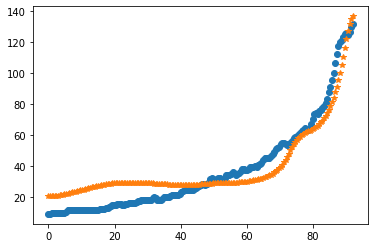

8
after perturb [1.5573710352408083, 131.8692501222565, 26399.657539652653, 1.0389004725235196, 37.37675723188794]
parameters [1.5573710352408083, 131.8692501222565, 26399.657539652653, 1.0389004725235196, 37.37675723188794]
oxigeno [1.39047168e-13 1.40543412e-13 1.45067529e-13 1.52726711e-13
 1.63703106e-13 1.78259128e-13 1.96745043e-13 2.19609010e-13
 2.47409840e-13 2.80832808e-13 3.20708964e-13 3.68038469e-13
 4.24018577e-13 4.90077013e-13 5.67911595e-13 6.59537188e-13
 7.67341337e-13 8.94150278e-13 1.04330758e-12 1.21876821e-12
 1.42521151e-12 1.66817734e-12 1.95423022e-12 2.29115718e-12
 2.68820539e-12 3.15636663e-12 3.70871615e-12 4.36081493e-12
 5.13118603e-12 6.04187820e-12 7.11913381e-12 8.39418249e-12
 9.90418780e-12 1.16933804e-11 1.38144176e-11 1.63300160e-11
 1.93149085e-11 2.28581827e-11 2.70660613e-11 3.20651873e-11
 3.80064864e-11 4.50696809e-11 5.34685498e-11 6.34570429e-11
 7.53363945e-11 8.94634138e-11 1.06260185e-10 1.26225467e-10
 1.49948154e-10 1.78123224e-10 2.11

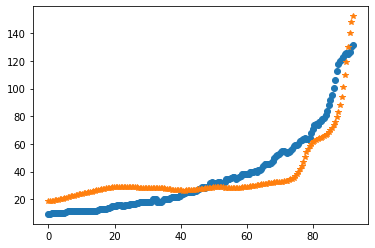

9
after perturb [5.274192233769775, 1.992790891081441, 23913.470912448516, -0.2877310133482849, -5.082093583853858]
parameters [5.274192233769775, 1.992790891081441, 23913.470912448516, -0.2877310133482849, -5.082093583853858]
after perturb [5.753473258523956, 69.96541365394283, 23607.900696403703, 0.11633028667439155, 22.236710102989782]
parameters [5.753473258523956, 69.96541365394283, 23607.900696403703, 0.11633028667439155, 22.236710102989782]
oxigeno [8.70937688e-04 8.70442088e-04 8.68958458e-04 8.66496258e-04
 8.63071107e-04 8.58704553e-04 8.53423772e-04 8.47261191e-04
 8.40254054e-04 8.32443931e-04 8.23876201e-04 8.14599499e-04
 8.04665167e-04 7.94126688e-04 7.83039146e-04 7.71458703e-04
 7.59442101e-04 7.47046206e-04 7.34327588e-04 7.21342145e-04
 7.08144775e-04 6.94789091e-04 6.81327179e-04 6.67809402e-04
 6.54284240e-04 6.40798177e-04 6.27395610e-04 6.14118802e-04
 6.01007856e-04 5.88100718e-04 5.75433209e-04 5.63039067e-04
 5.50950025e-04 5.39195893e-04 5.27804669e-04 5.1680

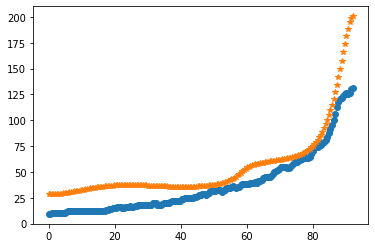

after perturb [3.9686995960450493, 89.78127004314294, 24525.673163971256, 0.7921274391171591, 14.552485323256313]
parameters [3.9686995960450493, 89.78127004314294, 24525.673163971256, 0.7921274391171591, 14.552485323256313]
oxigeno [1.03329689e-14 1.04767098e-14 1.09120202e-14 1.16512953e-14
 1.27156400e-14 1.41355529e-14 1.59519174e-14 1.82173309e-14
 2.09978190e-14 2.43749919e-14 2.84487169e-14 3.33403989e-14
 3.91969806e-14 4.61958037e-14 5.45504968e-14 6.45181001e-14
 7.64076742e-14 9.05907009e-14 1.07513642e-13 1.27713110e-13
 1.51834187e-13 1.80652553e-13 2.15101224e-13 2.56302858e-13
 3.05608789e-13 3.64646210e-13 4.35375186e-13 5.20157556e-13
 6.21840187e-13 7.43855553e-13 8.90343204e-13 1.06629644e-12
 1.27773930e-12 1.53194011e-12 1.83766895e-12 2.20550790e-12
 2.64822470e-12 3.18122250e-12 3.82308079e-12 4.59620571e-12
 5.52761120e-12 6.64985705e-12 8.00217441e-12 9.63181591e-12
 1.15956744e-11 1.39622231e-11 1.68138404e-11 2.02495954e-11
 2.43885835e-11 2.93739230e-11 3.53

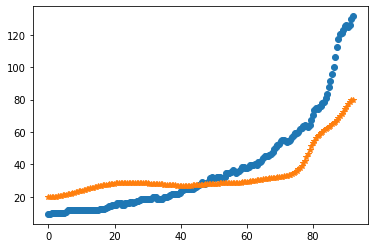

after perturb [0.8420091805755465, 137.61260090594527, 20109.46779230102, 0.8979580190600948, 40.04511122304784]
parameters [0.8420091805755465, 137.61260090594527, 20109.46779230102, 0.8979580190600948, 40.04511122304784]
oxigeno [2.21851875e-12 2.23782478e-12 2.29616914e-12 2.39483599e-12
 2.53598389e-12 2.72267517e-12 2.95892160e-12 3.24975200e-12
 3.60130952e-12 4.02098772e-12 4.51761417e-12 5.10168749e-12
 5.78566911e-12 6.58432525e-12 7.51511006e-12 8.59858006e-12
 9.85883411e-12 1.13239847e-11 1.30266826e-11 1.50047364e-11
 1.73018902e-11 1.99688334e-11 2.30645239e-11 2.66578935e-11
 3.08299771e-11 3.56764700e-11 4.13106694e-11 4.78667308e-11
 5.55031641e-11 6.44065415e-11 7.47954887e-11 8.69251635e-11
 1.01092582e-10 1.17643282e-10 1.36979883e-10 1.59573085e-10
 1.85975558e-10 2.16838959e-10 2.52934121e-10 2.95174191e-10
 3.44640342e-10 4.02609587e-10 4.70584367e-10 5.50323953e-10
 6.43878313e-10 7.53625945e-10 8.82318042e-10 1.03313197e-09
 1.20973734e-09 1.41637754e-09 1.6579

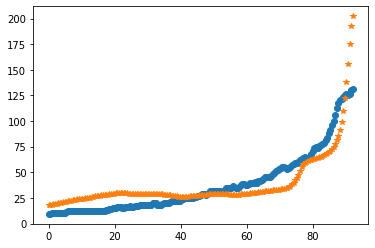

10
after perturb [5.336446349598517, 127.27246283756425, 21783.026732924125, -0.13263490962344204, 20.904002977642023]
parameters [5.336446349598517, 127.27246283756425, 21783.026732924125, -0.13263490962344204, 20.904002977642023]
after perturb [3.836193702189302, 65.20151881374817, 25617.16081780212, 0.5599069672131529, 29.283022493702408]
parameters [3.836193702189302, 65.20151881374817, 25617.16081780212, 0.5599069672131529, 29.283022493702408]
oxigeno [7.97942721e-13 7.96799691e-13 7.93391128e-13 7.87778292e-13
 7.80062249e-13 7.70382409e-13 7.58914684e-13 7.45869426e-13
 7.31489372e-13 7.16047831e-13 6.99847361e-13 6.83219203e-13
 6.66523742e-13 6.50152260e-13 6.34530247e-13 6.20122580e-13
 6.07440860e-13 5.97053258e-13 5.89597288e-13 5.85795964e-13
 5.86477940e-13 5.92602333e-13 6.05289108e-13 6.25856096e-13
 6.55863950e-13 6.97170678e-13 7.51997681e-13 8.23009715e-13
 9.13411669e-13 1.02706567e-12 1.16863276e-12 1.34374429e-12
 1.55920914e-12 1.82326432e-12 2.14587767e-12 2.539

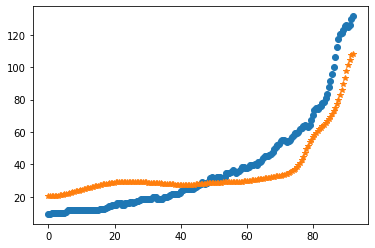

11
after perturb [6.1021647450940755, 123.15213721042466, 31813.10043689817, 2.5441773490075503, 48.637112809373804]
parameters [6.1021647450940755, 123.15213721042466, 31813.10043689817, 2.5441773490075503, 48.637112809373804]
after perturb [3.499395094789966, 104.03403672812813, 24610.498655217096, 3.1536855695749377, 59.2107021543698]
parameters [3.499395094789966, 104.03403672812813, 24610.498655217096, 3.1536855695749377, 59.2107021543698]
after perturb [8.961131787117814, 115.70264673353596, 20922.573805880984, 0.6637169561127351, 60.9467821910275]
parameters [8.961131787117814, 115.70264673353596, 20922.573805880984, 0.6637169561127351, 60.9467821910275]
after perturb [7.635131685750533, 135.49419028759252, 16446.507595966108, 1.2872209227696225, 22.1596696000695]
parameters [7.635131685750533, 135.49419028759252, 16446.507595966108, 1.2872209227696225, 22.1596696000695]
after perturb [5.544317552773776, 122.57931778082516, 25859.065610892587, 0.8402550507993571, 35.293754963527

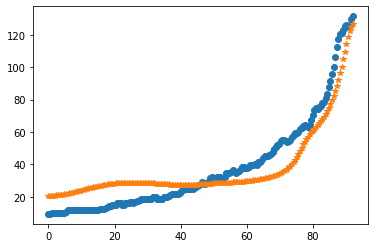

12
after perturb [4.485162792766469, 202.7380454073181, 22220.670094611665, 0.5259363076434485, 24.604670917675467]
parameters [4.485162792766469, 202.7380454073181, 22220.670094611665, 0.5259363076434485, 24.604670917675467]
after perturb [4.995162440917003, 92.57205997761838, 29017.33860215955, -0.23793158481497279, 38.10471269780418]
parameters [4.995162440917003, 92.57205997761838, 29017.33860215955, -0.23793158481497279, 38.10471269780418]
after perturb [5.090285008086027, 73.29427912289366, 26489.771225612072, -0.18643433184424574, 11.119909495524462]
parameters [5.090285008086027, 73.29427912289366, 26489.771225612072, -0.18643433184424574, 11.119909495524462]
after perturb [4.596090883560307, 70.05921812430194, 28227.985174410962, -0.37971234831077727, 30.04695374279037]
parameters [4.596090883560307, 70.05921812430194, 28227.985174410962, -0.37971234831077727, 30.04695374279037]
after perturb [4.179289153789836, 119.75157054384594, 25701.460823181755, -0.47027931579929666, 11.

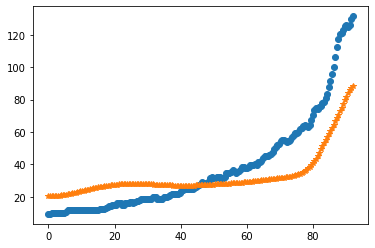

after perturb [9.345202018845454, 71.89799568093625, 21098.254759639596, -0.7219814698528462, 19.4191512187842]
parameters [9.345202018845454, 71.89799568093625, 21098.254759639596, -0.7219814698528462, 19.4191512187842]
after perturb [5.156418576607761, 49.479356740057206, 26704.742771944533, -0.4870029116173009, -8.624997240590606]
parameters [5.156418576607761, 49.479356740057206, 26704.742771944533, -0.4870029116173009, -8.624997240590606]
after perturb [6.414772661770139, 54.59815722696586, 24537.811713104333, -1.7037511107254049, 5.439791870803084]
parameters [6.414772661770139, 54.59815722696586, 24537.811713104333, -1.7037511107254049, 5.439791870803084]
after perturb [3.4500143373782843, 101.44150939663953, 24652.374919417707, 0.2857693357268496, 1.1554748617623005]
parameters [3.4500143373782843, 101.44150939663953, 24652.374919417707, 0.2857693357268496, 1.1554748617623005]
after perturb [5.431373401671095, 178.8093325276713, 23319.061093080552, 0.7638090216736648, 51.138812

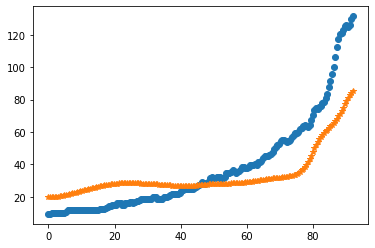

after perturb [3.5216335054625953, 97.29876791370826, 26330.345407290526, 0.8039283114276052, 26.62005978794123]
parameters [3.5216335054625953, 97.29876791370826, 26330.345407290526, 0.8039283114276052, 26.62005978794123]
oxigeno [4.05342069e-14 4.10490479e-14 4.26070295e-14 4.52489382e-14
 4.90441318e-14 5.40926547e-14 6.05282891e-14 6.85226348e-14
 7.82903452e-14 9.00956812e-14 1.04260588e-13 1.21174549e-13
 1.41306532e-13 1.65219406e-13 1.93587304e-13 2.27216480e-13
 2.67070364e-13 3.14299627e-13 3.70278258e-13 4.36646862e-13
 5.15364619e-13 6.08771651e-13 7.19663905e-13 8.51383049e-13
 1.00792444e-12 1.19406673e-12 1.41552758e-12 1.67915053e-12
 1.99312934e-12 2.36727732e-12 2.81335031e-12 3.34543419e-12
 3.98040924e-12 4.73850658e-12 5.64397437e-12 6.72587489e-12
 8.01903764e-12 9.56519802e-12 1.14143567e-11 1.36264014e-11
 1.62730398e-11 1.94401025e-11 2.32302846e-11 2.77664084e-11
 3.31953038e-11 3.96924241e-11 4.74673325e-11 5.67702277e-11
 6.78997010e-11 8.12119613e-11 9.7131

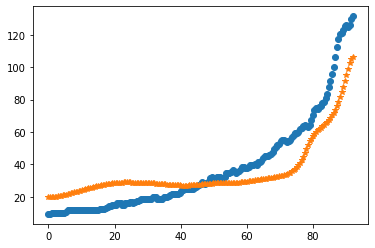

13
after perturb [2.4081239793319336, 63.46810380774828, 32716.84271348668, 1.0340916987917854, 25.057101739696165]
parameters [2.4081239793319336, 63.46810380774828, 32716.84271348668, 1.0340916987917854, 25.057101739696165]
after perturb [8.552775684820931, 133.45548130096125, 23337.20677264405, 0.7258187021936828, 54.46380681226275]
parameters [8.552775684820931, 133.45548130096125, 23337.20677264405, 0.7258187021936828, 54.46380681226275]
after perturb [4.588840496238033, 117.95204107255523, 27065.183365452503, 2.672726043209418, 39.38419688098609]
parameters [4.588840496238033, 117.95204107255523, 27065.183365452503, 2.672726043209418, 39.38419688098609]
oxigeno [9.25284223e-23 9.53566479e-23 1.04016287e-22 1.19043878e-22
 1.41373323e-22 1.72398400e-22 2.14066521e-22 2.69010527e-22
 3.40728145e-22 4.33822251e-22 5.54319639e-22 7.10091950e-22
 9.11410170e-22 1.17167436e-21 1.50837384e-21 1.94435092e-21
 2.50946506e-21 3.24278602e-21 4.19548610e-21 5.43465782e-21
 7.04835703e-21 9.1

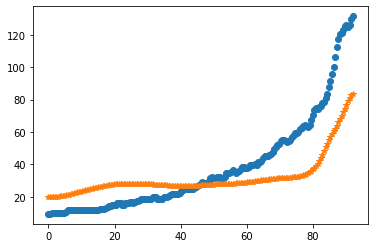

after perturb [5.460029217458658, 63.95167823444549, 22104.354497919096, -0.15036156999335504, 15.0339532088789]
parameters [5.460029217458658, 63.95167823444549, 22104.354497919096, -0.15036156999335504, 15.0339532088789]
after perturb [2.436412811277226, 116.48794248532971, 28268.750430377015, 3.430485802614473, 67.04474868060217]
parameters [2.436412811277226, 116.48794248532971, 28268.750430377015, 3.430485802614473, 67.04474868060217]
after perturb [7.6615397931837546, 130.22098882166128, 32171.98971029567, 1.6129150131848429, 45.79359615500849]
parameters [7.6615397931837546, 130.22098882166128, 32171.98971029567, 1.6129150131848429, 45.79359615500849]
after perturb [-2.495083853445955, 192.36574946499024, 29063.30589615293, 3.16916202877162, 66.3004032611074]
parameters [-2.495083853445955, 192.36574946499024, 29063.30589615293, 3.16916202877162, 66.3004032611074]
after perturb [4.891813930618867, 63.64212055447151, 35351.90487011416, 0.16802995047290747, 33.75857308977822]
para

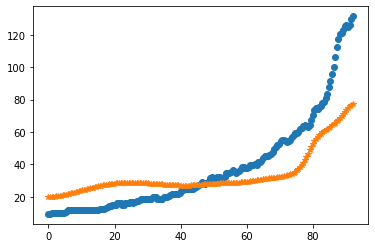

after perturb [7.215855595549698, 99.48658256224626, 19038.080920055123, 0.7493236276951746, 14.015832646944961]
parameters [7.215855595549698, 99.48658256224626, 19038.080920055123, 0.7493236276951746, 14.015832646944961]
after perturb [5.496282118273582, 113.67234157811484, 19616.355067768403, 0.3971553378791779, 30.089993348095994]
parameters [5.496282118273582, 113.67234157811484, 19616.355067768403, 0.3971553378791779, 30.089993348095994]
after perturb [4.414334213488729, 127.65789261593739, 31171.851692577096, 1.263389639143211, 52.211059153739505]
parameters [4.414334213488729, 127.65789261593739, 31171.851692577096, 1.263389639143211, 52.211059153739505]
after perturb [6.825759179446291, 131.37914099295946, 25406.08992183142, 1.8938568211033022, 45.5905915626849]
parameters [6.825759179446291, 131.37914099295946, 25406.08992183142, 1.8938568211033022, 45.5905915626849]
oxigeno [3.19976416e-18 3.26462399e-18 3.46186331e-18 3.79957954e-18
 4.29166769e-18 4.95843944e-18 5.82753146

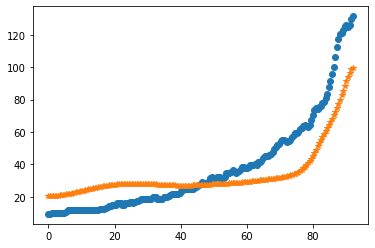

after perturb [-1.809565012526566, 46.895942311647275, 29560.82572271985, 0.6818105466514297, 34.84620550574154]
parameters [-1.809565012526566, 46.895942311647275, 29560.82572271985, 0.6818105466514297, 34.84620550574154]
after perturb [1.5555210868690361, 127.7355295220598, 18701.223027675478, 1.0549794003803743, 46.08434269133291]
parameters [1.5555210868690361, 127.7355295220598, 18701.223027675478, 1.0549794003803743, 46.08434269133291]
after perturb [4.677647856275279, 48.79570421317401, 30874.56380734025, -0.45275506448753955, 9.695283305655026]
parameters [4.677647856275279, 48.79570421317401, 30874.56380734025, -0.45275506448753955, 9.695283305655026]
after perturb [-1.4271874159502682, 70.16272784101447, 21913.23007300126, 0.8344437207039177, 5.577068258959219]
parameters [-1.4271874159502682, 70.16272784101447, 21913.23007300126, 0.8344437207039177, 5.577068258959219]
after perturb [9.261013474873153, 72.14909063326942, 30464.463032308413, 1.355461017856034, 53.7548861893236

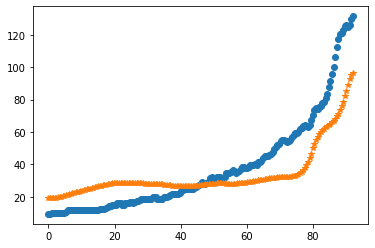

after perturb [4.439324573511772, 97.17531492664324, 26972.26142379425, 1.6304054665171976, 23.866168290935384]
parameters [4.439324573511772, 97.17531492664324, 26972.26142379425, 1.6304054665171976, 23.866168290935384]
oxigeno [7.05466851e-20 7.22490691e-20 7.74394353e-20 8.63718570e-20
 9.94848171e-20 1.17424655e-19 1.41080269e-19 1.71631068e-19
 2.10610974e-19 2.59992182e-19 3.22293598e-19 4.00720304e-19
 4.99342318e-19 6.23323247e-19 7.79212498e-19 9.75318615e-19
 1.22218628e-18 1.53320596e-18 1.92539350e-18 2.42038749e-18
 3.04572598e-18 3.83648176e-18 4.83735821e-18 6.10537651e-18
 7.71332333e-18 9.75417571e-18 1.23467828e-17 1.56431636e-17
 1.98378831e-17 2.51801019e-17 3.19890619e-17 4.06739923e-17
 5.17596949e-17 6.59194284e-17 8.40171689e-17 1.07161907e-16
 1.36777393e-16 1.74691705e-16 2.23252217e-16 2.85473126e-16
 3.65224690e-16 4.67475829e-16 5.98605047e-16 7.66798689e-16
 9.82560893e-16 1.25936623e-15 1.61449469e-15 2.07009944e-15
 2.65457189e-15 3.40428610e-15 4.365827

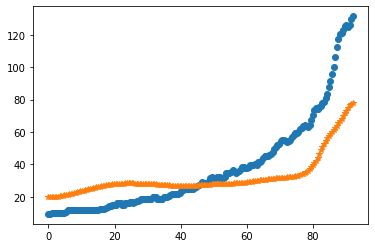

after perturb [1.6613192943029347, 43.415544640419654, 32198.988576645053, 0.25214476139742237, 15.853108464096156]
parameters [1.6613192943029347, 43.415544640419654, 32198.988576645053, 0.25214476139742237, 15.853108464096156]
after perturb [6.132935212260465, 125.87723031230142, 19819.959217798027, 0.4706190754348794, -18.002266180841495]
parameters [6.132935212260465, 125.87723031230142, 19819.959217798027, 0.4706190754348794, -18.002266180841495]
after perturb [6.710474213413377, 78.12646051776028, 29715.411797858655, 2.3872316915795615, 52.80511655481527]
parameters [6.710474213413377, 78.12646051776028, 29715.411797858655, 2.3872316915795615, 52.80511655481527]
after perturb [-0.1817496134467873, 116.61951263870216, 22851.89134357188, 0.05732819036251824, 14.888971627581714]
parameters [-0.1817496134467873, 116.61951263870216, 22851.89134357188, 0.05732819036251824, 14.888971627581714]
after perturb [2.7839449114832435, 94.9672591498746, 21841.72065976827, -0.1670204816221969, 3

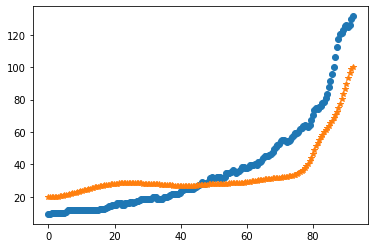

after perturb [7.66165411405337, 113.6968627730485, 24287.278654992293, 0.8575472286836628, 25.095676766035112]
parameters [7.66165411405337, 113.6968627730485, 24287.278654992293, 0.8575472286836628, 25.095676766035112]
after perturb [7.079131649023083, 92.77291371183618, 26295.1862317427, -0.7565760486011257, 5.219959003431331]
parameters [7.079131649023083, 92.77291371183618, 26295.1862317427, -0.7565760486011257, 5.219959003431331]
after perturb [4.3094088972035625, 127.87608910948259, 24815.033557405935, 1.7351296725464542, 32.40270752275947]
parameters [4.3094088972035625, 127.87608910948259, 24815.033557405935, 1.7351296725464542, 32.40270752275947]
oxigeno [1.04353922e-17 1.06312818e-17 1.12264559e-17 1.22437532e-17
 1.37223269e-17 1.57193310e-17 1.83123902e-17 2.16029668e-17
 2.57207830e-17 3.08295053e-17 3.71339575e-17 4.48892035e-17
 5.44119303e-17 6.60946745e-17 8.04235742e-17 9.80005023e-17
 1.19570655e-16 1.46056939e-16 1.78602847e-16 2.18625931e-16
 2.67884522e-16 3.2856

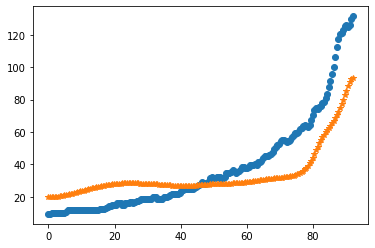

after perturb [4.359732648710873, 64.07223578184572, 28225.28227986709, -0.9296465109280445, -14.30014214611748]
parameters [4.359732648710873, 64.07223578184572, 28225.28227986709, -0.9296465109280445, -14.30014214611748]
after perturb [2.334454780547214, 57.74942264865406, 29595.25717157981, 0.9929152826952233, 42.153570571363666]
parameters [2.334454780547214, 57.74942264865406, 29595.25717157981, 0.9929152826952233, 42.153570571363666]
after perturb [2.4419939024220927, 68.24110668528058, 26938.055764888202, 0.042011918390160385, -7.982570600396585]
parameters [2.4419939024220927, 68.24110668528058, 26938.055764888202, 0.042011918390160385, -7.982570600396585]
after perturb [2.2196222350184414, 93.72578667410417, 27556.56995452586, 2.8112797334268467, 22.941297455044527]
parameters [2.2196222350184414, 93.72578667410417, 27556.56995452586, 2.8112797334268467, 22.941297455044527]
oxigeno [2.53646769e-26 2.63673217e-26 2.94559925e-26 3.48800516e-26
 4.30796270e-26 5.47248399e-26 7.07

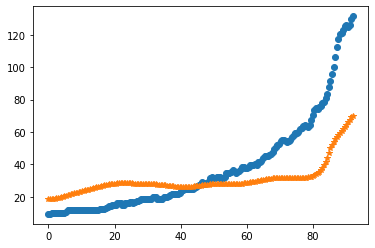

after perturb [4.872472300931739, 173.97744645249156, 24710.99549403586, 1.794371647914967, 81.35968117891647]
parameters [4.872472300931739, 173.97744645249156, 24710.99549403586, 1.794371647914967, 81.35968117891647]
after perturb [3.9278697167946186, 100.24668698057909, 23659.628312381396, -0.2345429035918027, 14.774320406729634]
parameters [3.9278697167946186, 100.24668698057909, 23659.628312381396, -0.2345429035918027, 14.774320406729634]
after perturb [7.93789316099094, 109.76380147635473, 22564.084737950147, 1.1199178517629282, 81.73132546273862]
parameters [7.93789316099094, 109.76380147635473, 22564.084737950147, 1.1199178517629282, 81.73132546273862]
after perturb [11.768126428079984, 126.21203866759313, 23213.832421253705, 1.311268809374024, 55.52330170782432]
parameters [11.768126428079984, 126.21203866759313, 23213.832421253705, 1.311268809374024, 55.52330170782432]
after perturb [5.001011480582467, 123.78588416323018, 16849.91583753164, 2.8127998239018135, 25.435515216262

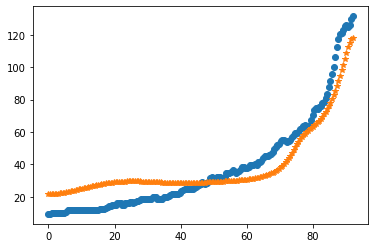

14
after perturb [6.51950515182398, 109.3960826212229, 22409.905788974156, -0.798332412465161, 9.620042184526024]
parameters [6.51950515182398, 109.3960826212229, 22409.905788974156, -0.798332412465161, 9.620042184526024]
after perturb [5.025880067493606, 129.45690170043318, 20505.20501490041, 0.6546217601205019, 8.639707441469252]
parameters [5.025880067493606, 129.45690170043318, 20505.20501490041, 0.6546217601205019, 8.639707441469252]
after perturb [5.621054387520978, 109.51737611398924, 22906.55756097319, -0.7917511126276356, 16.399981925079327]
parameters [5.621054387520978, 109.51737611398924, 22906.55756097319, -0.7917511126276356, 16.399981925079327]
after perturb [6.42809313172541, 52.88418154249342, 22023.995925990454, -2.1292038133251414, -28.45135942199882]
parameters [6.42809313172541, 52.88418154249342, 22023.995925990454, -2.1292038133251414, -28.45135942199882]
after perturb [2.39853318716271, 24.102706976456155, 32048.060799626903, -0.056738439092343995, 34.3951032611

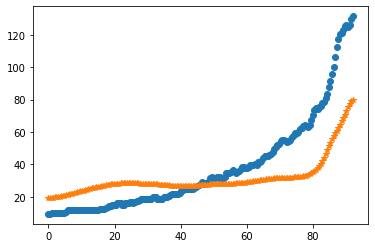

after perturb [3.8715727775812385, 95.27033077981835, 20476.948075677567, 1.2289006454714975, 25.54394806252978]
parameters [3.8715727775812385, 95.27033077981835, 20476.948075677567, 1.2289006454714975, 25.54394806252978]
oxigeno [1.61381550e-17 1.64451455e-17 1.73780065e-17 1.89729219e-17
 2.12919365e-17 2.44256494e-17 2.84971560e-17 3.36674229e-17
 4.01423445e-17 4.81818107e-17 5.81112096e-17 7.03359059e-17
 8.53593775e-17 1.03805872e-16 1.26448665e-16 1.54245271e-16
 1.88381314e-16 2.30325175e-16 2.81896097e-16 3.45349069e-16
 4.23480691e-16 5.19761234e-16 6.38499487e-16 7.85048572e-16
 9.66063046e-16 1.18982014e-15 1.46662124e-15 1.80929384e-15
 2.23381900e-15 2.76011594e-15 3.41302297e-15 4.22352386e-15
 5.23028068e-15 6.48154931e-15 8.03757241e-15 9.97356766e-15
 1.23834577e-14 1.53845235e-14 1.91232072e-14 2.37823431e-14
 2.95901653e-14 3.68315192e-14 4.58618120e-14 5.71243592e-14
 7.11719456e-14 8.86936124e-14 1.10547925e-13 1.37804277e-13
 1.71794157e-13 2.14174767e-13 2.6700

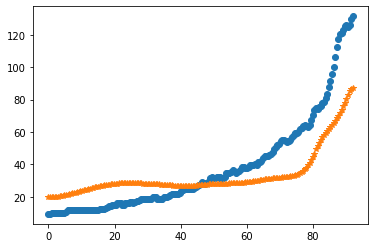

after perturb [8.382265969694547, 103.02543259994803, 24251.61531704383, 1.328994456281809, 58.10842691184401]
parameters [8.382265969694547, 103.02543259994803, 24251.61531704383, 1.328994456281809, 58.10842691184401]
after perturb [4.696180669300326, 153.57549888365762, 16081.317355188314, 3.3276726738894036, 39.755716921996864]
parameters [4.696180669300326, 153.57549888365762, 16081.317355188314, 3.3276726738894036, 39.755716921996864]
after perturb [5.948714943308061, 118.67732732519003, 25044.29170226221, 1.6454543872453682, 52.49737788879503]
parameters [5.948714943308061, 118.67732732519003, 25044.29170226221, 1.6454543872453682, 52.49737788879503]
after perturb [5.681418609406746, 83.69506526133526, 25376.639555273927, 1.32879733417301, 43.89074048205695]
parameters [5.681418609406746, 83.69506526133526, 25376.639555273927, 1.32879733417301, 43.89074048205695]
oxigeno [1.89727549e-19 1.94290501e-19 2.08200394e-19 2.32131807e-19
 2.67247898e-19 3.15260958e-19 3.78521905e-19 4.6

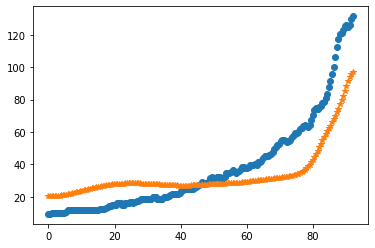

after perturb [6.44893324109792, 78.90217622993443, 19592.05920421285, -0.1258638517236088, 10.605073058884546]
parameters [6.44893324109792, 78.90217622993443, 19592.05920421285, -0.1258638517236088, 10.605073058884546]
after perturb [5.685810934913958, 111.87464949624555, 24198.381178703818, 0.8976376969496844, 24.87714955597837]
parameters [5.685810934913958, 111.87464949624555, 24198.381178703818, 0.8976376969496844, 24.87714955597837]
oxigeno [7.96921919e-14 8.06694380e-14 8.36255891e-14 8.86345739e-14
 9.58219292e-14 1.05368357e-13 1.17514853e-13 1.32569565e-13
 1.50916589e-13 1.73026964e-13 1.99472213e-13 2.30940837e-13
 2.68258265e-13 3.12410888e-13 3.64574901e-13 4.26150865e-13
 4.98805049e-13 5.84518843e-13 6.85647796e-13 8.04992110e-13
 9.45880803e-13 1.11227220e-12 1.30887387e-12 1.54128581e-12
 1.81617136e-12 2.14146117e-12 2.52659666e-12 2.98282052e-12
 3.52352333e-12 4.16465703e-12 4.92522802e-12 5.82788512e-12
 6.89962030e-12 8.17260368e-12 9.68517801e-12 1.14830427e-11

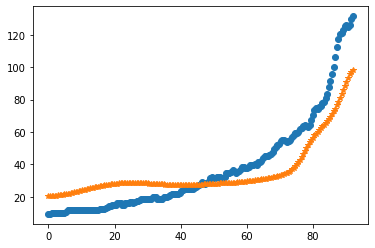

after perturb [4.35200707269151, 68.67967315323567, 30765.162753630433, 0.7766585093006965, 30.7051124235036]
parameters [4.35200707269151, 68.67967315323567, 30765.162753630433, 0.7766585093006965, 30.7051124235036]
after perturb [-0.44889731380333986, 164.80422602233563, 26554.422144257787, 0.6278222166064628, 43.50957933111247]
parameters [-0.44889731380333986, 164.80422602233563, 26554.422144257787, 0.6278222166064628, 43.50957933111247]
after perturb [7.686618939638888, 39.76922635507111, 18195.52795103397, -0.4391501830831017, 21.44657182476041]
parameters [7.686618939638888, 39.76922635507111, 18195.52795103397, -0.4391501830831017, 21.44657182476041]
after perturb [4.50310329943992, 65.16496171853392, 22464.295326117594, 0.7297159921858976, 50.68470729272089]
parameters [4.50310329943992, 65.16496171853392, 22464.295326117594, 0.7297159921858976, 50.68470729272089]
after perturb [7.837822471340618, 138.86857293811298, 18194.686237380058, 1.8295833789781457, 47.631068675498284]


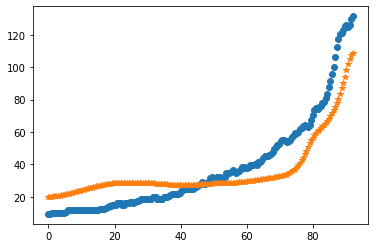

15
after perturb [6.182155081587675, 152.36965019016455, 24920.85740626583, 2.0880933110712614, 63.578380834157954]
parameters [6.182155081587675, 152.36965019016455, 24920.85740626583, 2.0880933110712614, 63.578380834157954]
after perturb [5.591354392172508, 117.24317246277026, 27502.13942381078, 1.838231759128505, 75.84737095519344]
parameters [5.591354392172508, 117.24317246277026, 27502.13942381078, 1.838231759128505, 75.84737095519344]
after perturb [2.44584237753707, 100.92884882172999, 28258.962710018077, 1.372541954125337, 65.25364433891434]
parameters [2.44584237753707, 100.92884882172999, 28258.962710018077, 1.372541954125337, 65.25364433891434]
after perturb [5.874804499340841, 150.0605567715672, 27007.326316980387, -0.22155061474444349, 32.051282505071555]
parameters [5.874804499340841, 150.0605567715672, 27007.326316980387, -0.22155061474444349, 32.051282505071555]
after perturb [7.328114511070153, 169.31804329342512, 22958.53121058652, 2.4970869981484567, 52.1601381878023

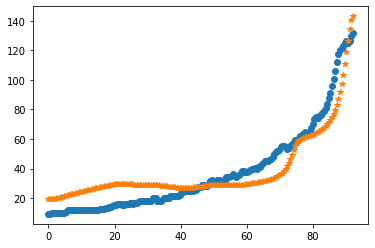

16
after perturb [1.1423738451728607, 135.96691957329782, 21093.51371014667, 3.418711494377287, 43.64300615453276]
parameters [1.1423738451728607, 135.96691957329782, 21093.51371014667, 3.418711494377287, 43.64300615453276]
after perturb [4.232266124731547, 139.66627741565912, 25492.11828090258, 1.2146080252355747, 62.17732359538077]
parameters [4.232266124731547, 139.66627741565912, 25492.11828090258, 1.2146080252355747, 62.17732359538077]
after perturb [6.329712889032978, 135.95295730003218, 20965.315508958272, 1.1198171221793847, 2.4802618678661155]
parameters [6.329712889032978, 135.95295730003218, 20965.315508958272, 1.1198171221793847, 2.4802618678661155]
after perturb [4.066576979545998, 123.20851127766886, 31373.080729071615, 2.4282994751660008, 57.019445768690204]
parameters [4.066576979545998, 123.20851127766886, 31373.080729071615, 2.4282994751660008, 57.019445768690204]
after perturb [7.764363359595914, 129.33684818901042, 21512.617899860605, 0.7683366064208098, 46.04434663

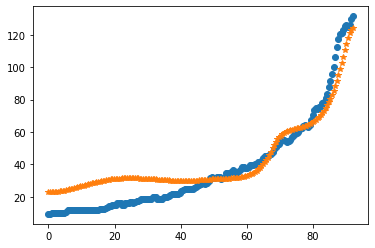

17
after perturb [7.93354217335861, 101.81739875462247, 22891.465516096665, 0.4844412246024162, 46.92932310843592]
parameters [7.93354217335861, 101.81739875462247, 22891.465516096665, 0.4844412246024162, 46.92932310843592]
after perturb [3.333298320875456, 101.60341655871882, 21228.48394270598, -0.42433373585850986, 6.229393613735795]
parameters [3.333298320875456, 101.60341655871882, 21228.48394270598, -0.42433373585850986, 6.229393613735795]
after perturb [-1.1405563773176262, 48.041880220445954, 28579.48156792879, -0.169704997987156, -20.365896446708273]
parameters [-1.1405563773176262, 48.041880220445954, 28579.48156792879, -0.169704997987156, -20.365896446708273]
after perturb [8.280915744423003, 125.0951057307947, 24595.88457088215, 2.0886891829295204, 59.181608721387406]
parameters [8.280915744423003, 125.0951057307947, 24595.88457088215, 2.0886891829295204, 59.181608721387406]
after perturb [6.012634397977356, 72.3534419957562, 28751.340761488922, -0.5967409853537678, -15.2170

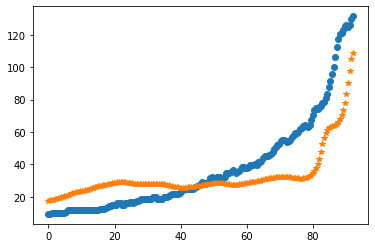

after perturb [3.8634345660517915, 124.44789473803695, 20299.714851830206, 1.3213970078910755, 22.33499239830703]
parameters [3.8634345660517915, 124.44789473803695, 20299.714851830206, 1.3213970078910755, 22.33499239830703]
oxigeno [9.21759698e-16 9.35620961e-16 9.77633073e-16 1.04909624e-15
 1.15222883e-15 1.29024644e-15 1.46747667e-15 1.68951399e-15
 1.96342036e-15 2.29797940e-15 2.70401364e-15 3.19477690e-15
 3.78643705e-15 4.49866761e-15 5.35537133e-15 6.38556394e-15
 7.62445294e-15 9.11475406e-15 1.09082978e-14 1.30679905e-14
 1.56702083e-14 1.88077209e-14 2.25932641e-14 2.71639038e-14
 3.26863724e-14 3.93635908e-14 4.74426441e-14 5.72245345e-14
 6.90761068e-14 8.34446296e-14 1.00875622e-13 1.22034645e-13
 1.47733919e-13 1.78964850e-13 2.16937733e-13 2.63130200e-13
 3.19346319e-13 3.87788630e-13 4.71145901e-13 5.72699974e-13
 6.96455767e-13 8.47299377e-13 1.03119023e-12 1.25539453e-12
 1.52876873e-12 1.86210364e-12 2.26854206e-12 2.76408548e-12
 3.36820876e-12 4.10460579e-12 5.00

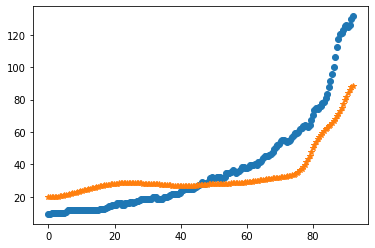

after perturb [4.734719851110267, 93.60567023952305, 20159.489162575403, 1.2706742386634173, 13.114907414325142]
parameters [4.734719851110267, 93.60567023952305, 20159.489162575403, 1.2706742386634173, 13.114907414325142]
oxigeno [4.47812223e-18 4.56894583e-18 4.84514768e-18 5.31808886e-18
 6.00727258e-18 6.94122514e-18 8.15878882e-18 9.71088954e-18
 1.16628659e-17 1.40974736e-17 1.71187133e-17 2.08566713e-17
 2.54736124e-17 3.11716301e-17 3.82022366e-17 4.68783761e-17
 5.75894679e-17 7.08202471e-17 8.71743614e-17 1.07403938e-16
 1.32446644e-16 1.63472150e-16 2.01940423e-16 2.49674865e-16
 3.08954129e-16 3.82627396e-16 4.74259168e-16 5.88311151e-16
 7.30370757e-16 9.07438220e-16 1.12828733e-15 1.40391869e-15
 1.74812905e-15 2.17822655e-15 2.71592877e-15 3.38849021e-15
 4.23011734e-15 5.28374380e-15 6.60325669e-15 8.25628735e-15
 1.03277082e-14 1.29240124e-14 1.61787970e-14 2.02596240e-14
 2.53766030e-14 3.17931217e-14 3.98392582e-14 4.99285376e-14
 6.25788610e-14 7.84386353e-14 9.8319

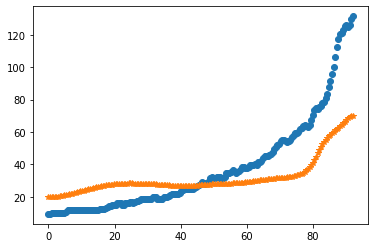

after perturb [4.332601192289854, 115.40179401700416, 31742.128692552098, 0.798461928044965, 36.94173604629094]
parameters [4.332601192289854, 115.40179401700416, 31742.128692552098, 0.798461928044965, 36.94173604629094]
after perturb [5.789809798082274, 105.58542553159899, 27237.847978171245, 1.5320677068464243, 48.591584498910834]
parameters [5.789809798082274, 105.58542553159899, 27237.847978171245, 1.5320677068464243, 48.591584498910834]
oxigeno [1.97257129e-18 2.01406307e-18 2.14030307e-18 2.35666672e-18
 2.67238849e-18 3.10098954e-18 3.66090608e-18 4.37635015e-18
 5.27844610e-18 6.40670043e-18 7.81087945e-18 9.55339090e-18
 1.17122913e-17 1.43850740e-17 1.76934349e-17 2.17892615e-17
 2.68621617e-17 3.31489241e-17 4.09454119e-17 5.06215178e-17
 6.26399779e-17 7.75800457e-17 9.61672967e-17 1.19311162e-16
 1.48152213e-16 1.84121746e-16 2.29016888e-16 2.85095286e-16
 3.55194502e-16 4.42882584e-16 5.52647955e-16 6.90138897e-16
 8.62465574e-16 1.07858087e-15 1.34976060e-15 1.69020881e-

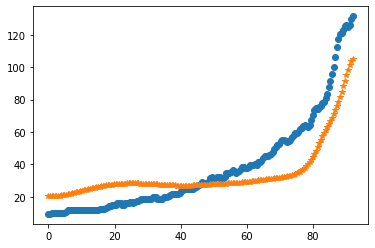

after perturb [3.674947048081632, 137.16289239574496, 23875.934699422123, 1.0464941838318085, 1.0175189625515308]
parameters [3.674947048081632, 137.16289239574496, 23875.934699422123, 1.0464941838318085, 1.0175189625515308]
after perturb [2.411369516301533, 158.24447413977077, 23743.224143026415, 2.4175401936886463, 59.44030798956659]
parameters [2.411369516301533, 158.24447413977077, 23743.224143026415, 2.4175401936886463, 59.44030798956659]
after perturb [10.361244103678409, 124.6734536523563, 29030.41633658322, -0.40806717004757986, 24.05934729380304]
parameters [10.361244103678409, 124.6734536523563, 29030.41633658322, -0.40806717004757986, 24.05934729380304]
after perturb [4.138091249049394, 121.17309864987631, 18172.825550022888, 2.051158344117012, 42.17585361045719]
parameters [4.138091249049394, 121.17309864987631, 18172.825550022888, 2.051158344117012, 42.17585361045719]
after perturb [-4.394440687364967, 83.91635662054432, 27451.074907060967, 2.7832781255039514, 75.912896977

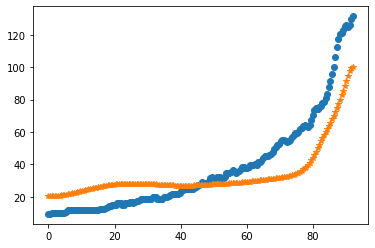

after perturb [4.057181466063004, 104.30528053505948, 23014.887311331466, 0.3809495733941878, 3.163551999300614]
parameters [4.057181466063004, 104.30528053505948, 23014.887311331466, 0.3809495733941878, 3.163551999300614]
after perturb [2.6836868558879265, 47.28995523564864, 28194.056696603857, -1.255404821101866, 2.607205610529725]
parameters [2.6836868558879265, 47.28995523564864, 28194.056696603857, -1.255404821101866, 2.607205610529725]
after perturb [5.45817124593923, 16.586760930398412, 33974.13506020639, -0.7535217447209074, 21.10116940435229]
parameters [5.45817124593923, 16.586760930398412, 33974.13506020639, -0.7535217447209074, 21.10116940435229]
after perturb [3.524017233716649, 113.04232523454138, 25381.34372349095, 1.8832540242593594, 44.45405003806515]
parameters [3.524017233716649, 113.04232523454138, 25381.34372349095, 1.8832540242593594, 44.45405003806515]
oxigeno [1.22326197e-19 1.25122907e-19 1.33643474e-19 1.48286008e-19
 1.69737019e-19 1.99007277e-19 2.37484776e-

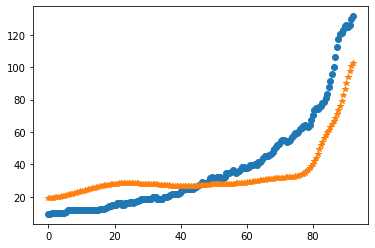

after perturb [2.4483348056821477, 151.602526087878, 26413.42355502719, 0.6482337387436732, 61.0065834900672]
parameters [2.4483348056821477, 151.602526087878, 26413.42355502719, 0.6482337387436732, 61.0065834900672]
after perturb [9.446305566993663, 113.28482322230494, 22117.876910865052, 0.48350811288980294, 11.20886153702611]
parameters [9.446305566993663, 113.28482322230494, 22117.876910865052, 0.48350811288980294, 11.20886153702611]
after perturb [4.603330735156187, 79.93853989085095, 16601.91723519974, 1.6506167230848168, 23.593439903564356]
parameters [4.603330735156187, 79.93853989085095, 16601.91723519974, 1.6506167230848168, 23.593439903564356]
after perturb [7.545880003093025, 43.65660448086126, 14788.456666919288, 1.4513128261168613, 26.571859301301807]
parameters [7.545880003093025, 43.65660448086126, 14788.456666919288, 1.4513128261168613, 26.571859301301807]
after perturb [3.6450980466963294, 100.41118751397067, 22837.791038037347, 0.8182629294268818, 27.631976207779307]

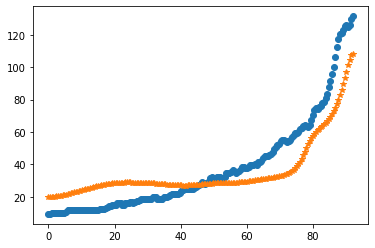

18
after perturb [4.939212680152534, 152.3317572774432, 29268.964472253778, 1.6620171971376938, 66.2983858782368]
parameters [4.939212680152534, 152.3317572774432, 29268.964472253778, 1.6620171971376938, 66.2983858782368]
after perturb [0.8232668519971025, 83.22062673297077, 25644.45000590348, -0.10786925252321083, 19.72958538389895]
parameters [0.8232668519971025, 83.22062673297077, 25644.45000590348, -0.10786925252321083, 19.72958538389895]
after perturb [-1.6632077171976705, 137.30489202143096, 30319.16470314521, 3.618894499341132, 55.88873842789688]
parameters [-1.6632077171976705, 137.30489202143096, 30319.16470314521, 3.618894499341132, 55.88873842789688]
after perturb [3.0495497309516333, 95.5127698918433, 28018.871441601936, 1.9064653122247415, 69.76712796462843]
parameters [3.0495497309516333, 95.5127698918433, 28018.871441601936, 1.9064653122247415, 69.76712796462843]
after perturb [2.603766119462956, 90.15539748194645, 32202.982039443734, -1.8615665216464266, 13.201583998222

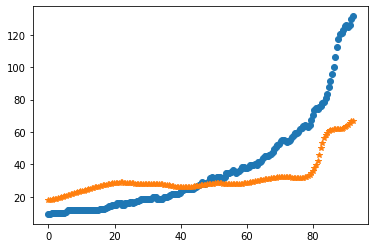

after perturb [7.15112052170201, 49.29128767014976, 23004.89870456335, -0.37816327952094175, 30.050548219828297]
parameters [7.15112052170201, 49.29128767014976, 23004.89870456335, -0.37816327952094175, 30.050548219828297]
after perturb [3.4995886648058736, 101.87451074008696, 25007.15059724764, 1.919072625340511, 24.668245568070024]
parameters [3.4995886648058736, 101.87451074008696, 25007.15059724764, 1.919072625340511, 24.668245568070024]
oxigeno [5.78377042e-21 5.93516484e-21 6.39740551e-21 7.19513687e-21
 8.37103686e-21 9.98832886e-21 1.21345181e-20 1.49265894e-20
 1.85179966e-20 2.31078903e-20 2.89531751e-20 3.63841746e-20
 4.58249186e-20 5.78193752e-20 7.30653500e-20 9.24582909e-20
 1.17147909e-19 1.48611409e-19 1.88748256e-19 2.40002911e-19
 3.05523903e-19 3.89370156e-19 4.96778809e-19 6.34513098e-19
 8.11314541e-19 1.03849106e-18 1.33068229e-18 1.70685603e-18
 2.19160604e-18 2.81684299e-18 3.62399812e-18 4.66689571e-18
 6.01549729e-18 7.76078247e-18 1.00211104e-17 1.29505096e-

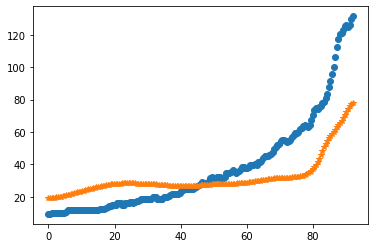

after perturb [1.1852907719357155, 80.14232380923565, 32616.006387328096, 2.7068804499046437, 27.990929216782583]
parameters [1.1852907719357155, 80.14232380923565, 32616.006387328096, 2.7068804499046437, 27.990929216782583]
after perturb [4.305404081985157, 166.37174381993876, 23872.416954459357, 3.4400634169812654, 50.95236269999453]
parameters [4.305404081985157, 166.37174381993876, 23872.416954459357, 3.4400634169812654, 50.95236269999453]
after perturb [3.4739577746448562, 82.87038863586639, 24619.618677139377, 1.2615564835783004, 32.02636560284886]
parameters [3.4739577746448562, 82.87038863586639, 24619.618677139377, 1.2615564835783004, 32.02636560284886]
oxigeno [4.43614394e-19 4.53668577e-19 4.84293955e-19 5.36902584e-19
 6.13927725e-19 7.18948149e-19 8.56871524e-19 1.03418689e-18
 1.25929999e-18 1.54296989e-18 1.89887086e-18 2.34431058e-18
 2.90114463e-18 3.59693819e-18 4.46644032e-18 5.55345402e-18
 6.91320832e-18 8.61536811e-18 1.07478547e-17 1.34216984e-17
 1.67772047e-17 

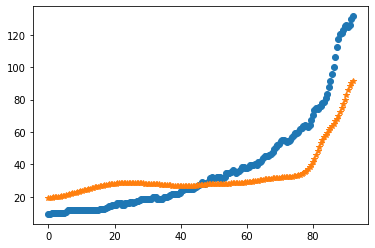

after perturb [5.327497959474208, 140.04546762481527, 23418.83655417755, 2.8208849698393985, 41.34572247028747]
parameters [5.327497959474208, 140.04546762481527, 23418.83655417755, 2.8208849698393985, 41.34572247028747]
oxigeno [2.19697074e-21 2.25613292e-21 2.43684630e-21 2.74898129e-21
 3.20963386e-21 3.84413661e-21 4.68756408e-21 5.78682890e-21
 7.20350442e-21 9.01755713e-21 1.13322326e-20 1.42804157e-20
 1.80328868e-20 2.28090206e-20 2.88906476e-20 3.66400089e-20
 4.65230247e-20 5.91394617e-20 7.52620735e-20 9.58874129e-20
 1.22301847e-19 1.56167378e-19 1.99633295e-19 2.55481511e-19
 3.27315872e-19 4.19808880e-19 5.39023389e-19 6.92832258e-19
 8.91465999e-19 1.14822769e-18 1.48042647e-18 1.91059680e-18
 2.46809096e-18 3.19115953e-18 4.12966915e-18 5.34865284e-18
 6.93294737e-18 8.99324986e-18 1.16740262e-17 1.51638355e-17
 1.97088051e-17 2.56302122e-17 3.33474167e-17 4.34077648e-17
 5.65255674e-17 7.36328905e-17 9.59457144e-17 1.25050079e-16
 1.63014213e-16 2.12534441e-16 2.771249

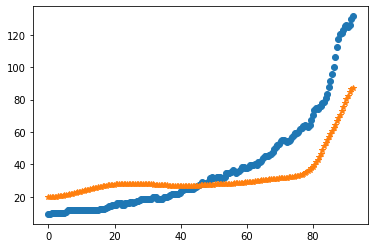

after perturb [5.420520018735842, 75.63467834140697, 26037.130756051673, 0.022294160202852575, 13.746502999087175]
parameters [5.420520018735842, 75.63467834140697, 26037.130756051673, 0.022294160202852575, 13.746502999087175]
oxigeno [ 0.75741602  0.75728815  0.7569052   0.75626912  0.75538316  0.75425181
  0.75288075  0.75127679  0.74944779  0.74740262  0.745151    0.74270346
  0.74007125  0.73726619  0.73430063  0.73118734  0.72793941  0.7245702
  0.72109322  0.71752209  0.71387045  0.71015194  0.70638013  0.70256843
  0.69873014  0.69487833  0.69102584  0.68718528  0.68336896  0.67958889
  0.67585675  0.67218391  0.66858135  0.66505971  0.66162926  0.65829987
  0.65508103  0.65198185  0.64901106  0.64617701  0.64348769  0.64095075
  0.63857349  0.63636293  0.63432583  0.6324687   0.63079787  0.62931952
  0.62803974  0.62696459  0.62610012  0.62545248  0.62502792  0.62483292
  0.62487419  0.62515876  0.62569401  0.62648778  0.62754837  0.62888461
  0.63050592  0.63242234  0.6346446 

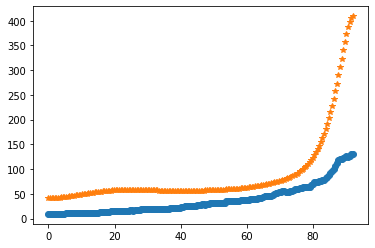

after perturb [2.145040530055922, 29.649595467593358, 29112.591054755918, 0.668863716729086, 39.252395440332364]
parameters [2.145040530055922, 29.649595467593358, 29112.591054755918, 0.668863716729086, 39.252395440332364]
after perturb [8.224361168859811, 119.757897342704, 22165.74283984112, -0.7856593007176373, 22.043677918443112]
parameters [8.224361168859811, 119.757897342704, 22165.74283984112, -0.7856593007176373, 22.043677918443112]
after perturb [6.184985534900229, 124.08777797242797, 31121.29155764681, -0.8322075851902238, 35.24980185022814]
parameters [6.184985534900229, 124.08777797242797, 31121.29155764681, -0.8322075851902238, 35.24980185022814]
after perturb [1.477152625946922, 29.065332514168112, 26499.521744488593, 1.105014004561278, 42.38642114787038]
parameters [1.477152625946922, 29.065332514168112, 26499.521744488593, 1.105014004561278, 42.38642114787038]
after perturb [2.3727493765460963, 145.74261250623294, 19885.767643167368, 1.7576216806949052, 6.476595142048803

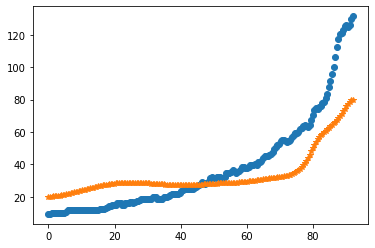

after perturb [4.492764712007499, 97.25522758560216, 15692.73453614905, 1.445109082850602, 5.905468785336379]
parameters [4.492764712007499, 97.25522758560216, 15692.73453614905, 1.445109082850602, 5.905468785336379]
after perturb [5.15438243585007, 48.184846960589596, 25702.659953661925, 0.31740647347307555, 40.414879803484205]
parameters [5.15438243585007, 48.184846960589596, 25702.659953661925, 0.31740647347307555, 40.414879803484205]
after perturb [3.394664465411661, 112.95086861222765, 24998.840718413303, 2.0873853601464836, 70.98137850657606]
parameters [3.394664465411661, 112.95086861222765, 24998.840718413303, 2.0873853601464836, 70.98137850657606]
after perturb [8.572451830694718, 108.81560864025894, 26162.180653142837, 2.8489039115519432, 65.51675513667789]
parameters [8.572451830694718, 108.81560864025894, 26162.180653142837, 2.8489039115519432, 65.51675513667789]
after perturb [3.929112812799409, 126.5502605375347, 23874.837848945946, 1.220221823108202, 44.62008145971415]
p

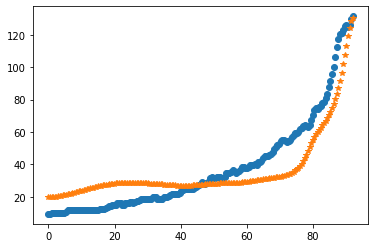

19
after perturb [3.0824141841931523, 129.2987323060117, 19252.27769377903, 2.809561923900983, 28.829201433932862]
parameters [3.0824141841931523, 129.2987323060117, 19252.27769377903, 2.809561923900983, 28.829201433932862]
after perturb [7.962700813840099, 151.59444080366387, 15124.844872655845, 0.22128836628775178, 14.78998590807819]
parameters [7.962700813840099, 151.59444080366387, 15124.844872655845, 0.22128836628775178, 14.78998590807819]
after perturb [4.274192214721796, 72.1171921985244, 22969.924082704023, 0.9956103858515295, 37.99849063159902]
parameters [4.274192214721796, 72.1171921985244, 22969.924082704023, 0.9956103858515295, 37.99849063159902]
oxigeno [2.39923710e-18 2.45150811e-18 2.61062552e-18 2.88361308e-18
 3.28255130e-18 3.82515908e-18 4.53564945e-18 5.44590355e-18
 6.59702364e-18 8.04134556e-18 9.84501540e-18 1.20912650e-17
 1.48845578e-17 1.83558241e-17 2.26690622e-17 2.80296565e-17
 3.46948575e-17 4.29869868e-17 5.33100779e-17 6.61708567e-17
 8.22052021e-17 1.0

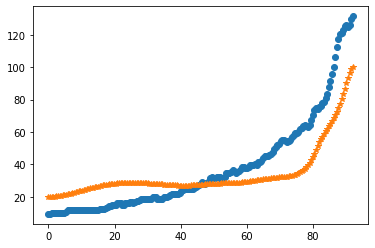

after perturb [4.890166372648556, -44.746834642534566, 30998.26597320047, -0.8348918221667005, -0.2833424158772786]
parameters [4.890166372648556, -44.746834642534566, 30998.26597320047, -0.8348918221667005, -0.2833424158772786]
after perturb [7.710803797497379, 65.99091319434693, 23030.570621848834, -0.11574213429073321, -15.146701430169337]
parameters [7.710803797497379, 65.99091319434693, 23030.570621848834, -0.11574213429073321, -15.146701430169337]
after perturb [6.283244238904292, 97.36206559806591, 24814.586717991417, 0.995399253129583, 23.63910391571867]
parameters [6.283244238904292, 97.36206559806591, 24814.586717991417, 0.995399253129583, 23.63910391571867]
oxigeno [1.16814509e-15 1.18665250e-15 1.24276740e-15 1.33828857e-15
 1.47628408e-15 1.66119932e-15 1.89901381e-15 2.19745297e-15
 2.56626283e-15 3.01755816e-15 3.56625739e-15 4.23062117e-15
 5.03291513e-15 6.00022265e-15 7.16543919e-15 8.56848688e-15
 1.02577968e-14 1.22921173e-14 1.47427189e-14 1.76960835e-14
 2.1257183

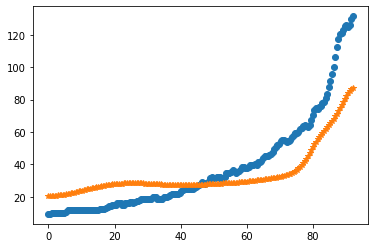

after perturb [7.864484063440875, 144.69327192589378, 22500.09686557105, 1.8075743454826578, 78.1678256548132]
parameters [7.864484063440875, 144.69327192589378, 22500.09686557105, 1.8075743454826578, 78.1678256548132]
after perturb [-0.8558869584743174, 150.81398514151152, 18460.575224151416, 2.3731415110073786, 28.844028055346367]
parameters [-0.8558869584743174, 150.81398514151152, 18460.575224151416, 2.3731415110073786, 28.844028055346367]
after perturb [9.063622085325267, 102.7239746104787, 26482.145597554263, -0.7525021385496471, -1.262785207334197]
parameters [9.063622085325267, 102.7239746104787, 26482.145597554263, -0.7525021385496471, -1.262785207334197]
after perturb [3.4608572795445216, 79.72689990508881, 28387.900264453914, -0.5086838639540039, 45.57280844178533]
parameters [3.4608572795445216, 79.72689990508881, 28387.900264453914, -0.5086838639540039, 45.57280844178533]
after perturb [3.596781888401187, 106.07115980785686, 25534.49347473187, 0.6259935633922675, 31.392077

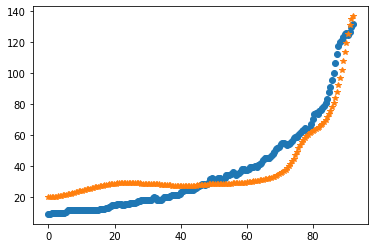

20
parameters [6.3283637208573404, 149.5191826055992, 21411.581812991713, 0.976072924606384, 30.901609303441212]
parameters [3.9637180641305747, 116.96756340547941, 23583.767468092465, 0.6669439508223909, 28.525614388548174]
parameters [3.175500900724964, 58.1212981300727, 23186.72136447773, 0.14295862720982022, 13.26101466629693]
parameters [5.119967164716356, 111.6742655475354, 20115.09378080139, 0.32726532837331024, 31.839510389409757]
parameters [5.668936237270711, 121.7390554094262, 25771.627795295313, 0.7697332982930136, 37.98293397923027]
parameters [3.8014219160126794, 121.5440768127051, 28283.599859547256, 0.5516522006374793, 33.044630261051296]
parameters [5.032321842365689, 123.42819813418816, 23134.234068984308, 1.2320717114106174, 38.4440460757684]
parameters [4.103860761633285, 101.73341300177795, 22634.886923379207, 0.4770582449072145, 27.05445647662649]
parameters [1.5573710352408083, 131.8692501222565, 26399.657539652653, 1.0389004725235196, 37.37675723188794]
paramete

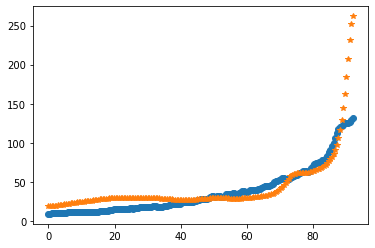

after perturb [3.304301409202153, 17.293082906803207, 28698.66701411839, -0.6318377081240979, -4.716231088903363]
parameters [3.304301409202153, 17.293082906803207, 28698.66701411839, -0.6318377081240979, -4.716231088903363]
after perturb [1.6081007183253977, 133.6543685249984, 17806.72648483531, 0.9809655164892969, 48.19919285691116]
parameters [1.6081007183253977, 133.6543685249984, 17806.72648483531, 0.9809655164892969, 48.19919285691116]
after perturb [4.147021563043625, 84.38205125260679, 22835.63574853472, 0.5959769422998904, 21.78195521988462]
parameters [4.147021563043625, 84.38205125260679, 22835.63574853472, 0.5959769422998904, 21.78195521988462]
oxigeno [4.13271614e-13 4.16814393e-13 4.27532317e-13 4.45696524e-13
 4.71766912e-13 5.06404375e-13 5.50488442e-13 6.05140807e-13
 6.71755457e-13 7.52036247e-13 8.48043041e-13 9.62247727e-13
 1.09760177e-12 1.25761726e-12 1.44646378e-12 1.66908406e-12
 1.93133170e-12 2.24013502e-12 2.60369207e-12 3.03170234e-12
 3.53564226e-12 4.1290

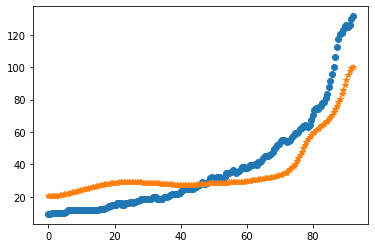

after perturb [-1.8092056965388101, 100.70220109502137, 15821.32671901951, 0.629500716535506, 42.15757090704755]
parameters [-1.8092056965388101, 100.70220109502137, 15821.32671901951, 0.629500716535506, 42.15757090704755]
after perturb [0.8501132937691078, 93.72314456450991, 22420.45735282322, 0.4536176470700896, 47.160579884828984]
parameters [0.8501132937691078, 93.72314456450991, 22420.45735282322, 0.4536176470700896, 47.160579884828984]
oxigeno [1.84266194e-10 1.84521205e-10 1.85299439e-10 1.86639968e-10
 1.88606298e-10 1.91284460e-10 1.94781201e-10 1.99222894e-10
 2.04755613e-10 2.11546647e-10 2.19787439e-10 2.29697727e-10
 2.41530530e-10 2.55577543e-10 2.72174591e-10 2.91706972e-10
 3.14614699e-10 3.41398011e-10 3.72623715e-10 4.08933211e-10
 4.51053185e-10 4.99809980e-10 5.56148533e-10 6.21156422e-10
 6.96093081e-10 7.82423615e-10 8.81856090e-10 9.96380877e-10
 1.12831081e-09 1.28032179e-09 1.45549488e-09 1.65736288e-09
 1.88996603e-09 2.15792300e-09 2.46652339e-09 2.82184720e-

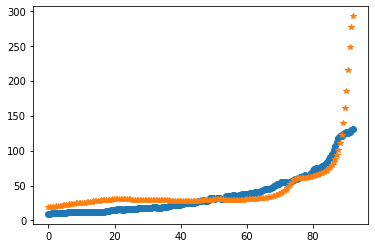

after perturb [1.6935910949061674, 114.89724406407532, 18039.037389813384, 0.7107855731039145, 30.884125730290556]
parameters [1.6935910949061674, 114.89724406407532, 18039.037389813384, 0.7107855731039145, 30.884125730290556]
after perturb [1.1507382759062297, 144.40848198547255, 21063.209704382298, 0.9915944390852045, 39.234519109809824]
parameters [1.1507382759062297, 144.40848198547255, 21063.209704382298, 0.9915944390852045, 39.234519109809824]
oxigeno [1.15745225e-12 1.16805377e-12 1.20008535e-12 1.25423329e-12
 1.33165884e-12 1.43402471e-12 1.56353327e-12 1.72297767e-12
 1.91580806e-12 2.14621527e-12 2.41923493e-12 2.74087482e-12
 3.11826770e-12 3.55985155e-12 4.07557860e-12 4.67715506e-12
 5.37831511e-12 6.19513561e-12 7.14640282e-12 8.25404767e-12
 9.54367186e-12 1.10451920e-11 1.27936312e-11 1.48300873e-11
 1.72029028e-11 1.99690566e-11 2.31957903e-11 2.69624817e-11
 3.13627814e-11 3.65070432e-11 4.25251085e-11 4.95695375e-11
 5.78194288e-11 6.74850072e-11 7.88131978e-11 9.20

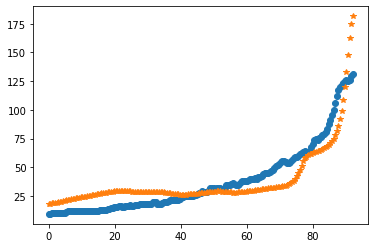

after perturb [1.6180791741234062, 98.67287129163704, 25590.575716203984, 0.19429001893694786, 26.213137151219936]
parameters [1.6180791741234062, 98.67287129163704, 25590.575716203984, 0.19429001893694786, 26.213137151219936]
oxigeno [1.78770194e-05 1.78650395e-05 1.78292726e-05 1.77702304e-05
 1.76887429e-05 1.75859274e-05 1.74631501e-05 1.73219841e-05
 1.71641665e-05 1.69915593e-05 1.68061140e-05 1.66098411e-05
 1.64047851e-05 1.61930041e-05 1.59765533e-05 1.57574738e-05
 1.55377851e-05 1.53194836e-05 1.51045458e-05 1.48949382e-05
 1.46926318e-05 1.44996206e-05 1.43179436e-05 1.41497056e-05
 1.39970987e-05 1.38624191e-05 1.37480822e-05 1.36566335e-05
 1.35907584e-05 1.35532909e-05 1.35472249e-05 1.35757286e-05
 1.36421644e-05 1.37501144e-05 1.39034120e-05 1.41061775e-05
 1.43628587e-05 1.46782715e-05 1.50576425e-05 1.55066489e-05
 1.60314575e-05 1.66387614e-05 1.73358151e-05 1.81304712e-05
 1.90312175e-05 2.00472210e-05 2.11883777e-05 2.24653733e-05
 2.38897546e-05 2.54740161e-05 2.

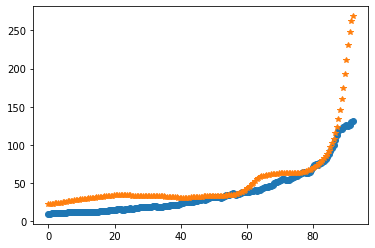

after perturb [1.4831322786459382, 66.10542790664346, 20461.647080273866, 0.06743687557501399, 22.314362610340098]
parameters [1.4831322786459382, 66.10542790664346, 20461.647080273866, 0.06743687557501399, 22.314362610340098]
oxigeno [2.11370929e-02 2.11236960e-02 2.10836749e-02 2.10175205e-02
 2.09260183e-02 2.08102125e-02 2.06713667e-02 2.05109046e-02
 2.03303795e-02 2.01314144e-02 1.99156735e-02 1.96848291e-02
 1.94405377e-02 1.91844133e-02 1.89180090e-02 1.86428075e-02
 1.83602087e-02 1.80715194e-02 1.77779528e-02 1.74806317e-02
 1.71805974e-02 1.68788243e-02 1.65762370e-02 1.62737253e-02
 1.59721587e-02 1.56723953e-02 1.53752819e-02 1.50816491e-02
 1.47923000e-02 1.45079992e-02 1.42294620e-02 1.39573475e-02
 1.36922551e-02 1.34347276e-02 1.31852578e-02 1.29442977e-02
 1.27122679e-02 1.24895650e-02 1.22765651e-02 1.20736230e-02
 1.18810671e-02 1.16991912e-02 1.15282452e-02 1.13684251e-02
 1.12198659e-02 1.10826383e-02 1.09567507e-02 1.08421553e-02
 1.07387601e-02 1.06464428e-02 1.

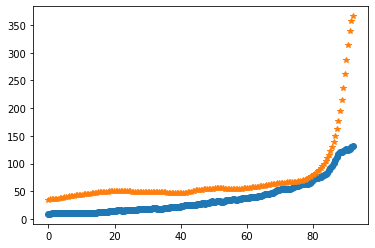

after perturb [0.9500693172488919, 159.3088635748631, 16819.92757601857, 1.02696383176212, 37.355383523197396]
parameters [0.9500693172488919, 159.3088635748631, 16819.92757601857, 1.02696383176212, 37.355383523197396]
after perturb [5.827635769735058, 143.0266240248295, 27743.362701445556, 1.1947872471929264, 44.04504185042354]
parameters [5.827635769735058, 143.0266240248295, 27743.362701445556, 1.1947872471929264, 44.04504185042354]
oxigeno [6.02091296e-14 6.09290390e-14 6.31063912e-14 6.67945508e-14
 7.20841200e-14 7.91054816e-14 8.80324668e-14 9.90872577e-14
 1.12546673e-13 1.28750030e-13 1.48108813e-13 1.71118461e-13
 1.98372616e-13 2.30580281e-13 2.68586416e-13 3.13396606e-13
 3.66206565e-13 4.28437402e-13 5.01777741e-13 5.88234010e-13
 6.90190487e-13 8.10480973e-13 9.52474346e-13 1.12017669e-12
 1.31835317e-12 1.55267356e-12 1.82988587e-12 2.15802356e-12
 2.54665283e-12 3.00716760e-12 3.55314139e-12 4.20074689e-12
 4.96925620e-12 5.88163695e-12 6.96526252e-12 8.25275787e-12
 9.

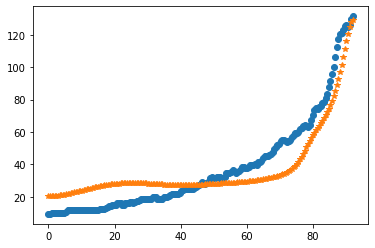

after perturb [5.151116979942065, 155.75149217734545, 22587.934801076713, 0.9439437974630911, 53.246263133750475]
parameters [5.151116979942065, 155.75149217734545, 22587.934801076713, 0.9439437974630911, 53.246263133750475]
after perturb [0.8066589127637661, 158.07089887028954, 27053.256360271746, 0.5982330663459021, 40.29694224532753]
parameters [0.8066589127637661, 158.07089887028954, 27053.256360271746, 0.5982330663459021, 40.29694224532753]
after perturb [3.077752008536229, 167.9607704710886, 27724.511107807415, 1.0221083843735728, 37.437616750764846]
parameters [3.077752008536229, 167.9607704710886, 27724.511107807415, 1.0221083843735728, 37.437616750764846]
after perturb [4.561368714304697, 145.3781632283231, 19295.74003835254, 0.7559117394238993, 36.76749319640813]
parameters [4.561368714304697, 145.3781632283231, 19295.74003835254, 0.7559117394238993, 36.76749319640813]
after perturb [7.1228200148913245, 141.74689242150723, 24051.299842964087, 0.9519304010468188, 28.3034634313

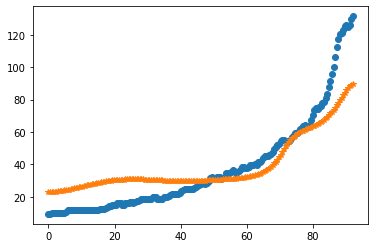

after perturb [0.8506980825125661, 132.33874003809052, 29433.654453047595, 1.6082637088501521, 43.197783562722364]
parameters [0.8506980825125661, 132.33874003809052, 29433.654453047595, 1.6082637088501521, 43.197783562722364]
after perturb [8.888551256427565, 111.72191834742834, 22772.063845162807, 0.7561606578041244, 43.244825259608035]
parameters [8.888551256427565, 111.72191834742834, 22772.063845162807, 0.7561606578041244, 43.244825259608035]
after perturb [1.510113526017212, 132.64939503429676, 27007.260012458126, 0.7639454527086186, 36.32803416618745]
parameters [1.510113526017212, 132.64939503429676, 27007.260012458126, 0.7639454527086186, 36.32803416618745]
oxigeno [1.14221727e-11 1.15145250e-11 1.17932745e-11 1.22635365e-11
 1.29339619e-11 1.38169269e-11 1.49288029e-11 1.62903121e-11
 1.79269753e-11 1.98696615e-11 2.21552516e-11 2.48274285e-11
 2.79376083e-11 3.15460284e-11 3.57230113e-11 4.05504271e-11
 4.61233871e-11 5.25522106e-11 5.99647225e-11 6.85089560e-11
 7.83563506e

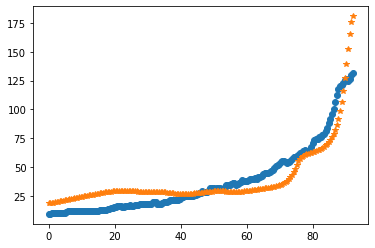

after perturb [-0.6782509085335895, 99.50195888570236, 17002.801140526255, 0.35224499929161335, 31.822847371199856]
parameters [-0.6782509085335895, 99.50195888570236, 17002.801140526255, 0.35224499929161335, 31.822847371199856]
after perturb [5.313876208245913, 97.11553185994833, 18835.21690239353, 0.5106632275504333, 41.32691055443408]
parameters [5.313876208245913, 97.11553185994833, 18835.21690239353, 0.5106632275504333, 41.32691055443408]
after perturb [3.2333610695034625, 116.23089219354769, 20461.571580503212, 0.1679495873225033, 27.680018581770973]
parameters [3.2333610695034625, 116.23089219354769, 20461.571580503212, 0.1679495873225033, 27.680018581770973]
oxigeno [7.36477842e-05 7.36250072e-05 7.35570542e-05 7.34450534e-05
 7.32908667e-05 7.30970630e-05 7.28668829e-05 7.26041964e-05
 7.23134557e-05 7.19996455e-05 7.16682329e-05 7.13251193e-05
 7.09765961e-05 7.06293053e-05 7.02902077e-05 6.99665580e-05
 6.96658889e-05 6.93960032e-05 6.91649744e-05 6.89811554e-05
 6.88531948e

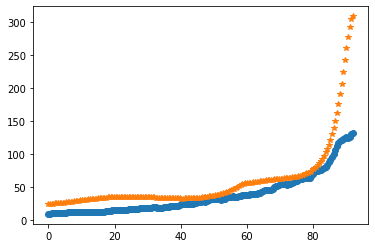

after perturb [1.3164132618584714, 126.99403414542982, 19096.75664285267, 0.9768872463513012, 35.45634017781985]
parameters [1.3164132618584714, 126.99403414542982, 19096.75664285267, 0.9768872463513012, 35.45634017781985]
after perturb [-1.0352063366367519, 178.2402413722611, 16254.861272107153, 1.1228944299564, 46.8223549921839]
parameters [-1.0352063366367519, 178.2402413722611, 16254.861272107153, 1.1228944299564, 46.8223549921839]
after perturb [6.101129028890227, 95.74479403830529, 25422.609169323478, 0.9856895494040689, 40.05498468067629]
parameters [6.101129028890227, 95.74479403830529, 25422.609169323478, 0.9856895494040689, 40.05498468067629]
oxigeno [1.06682593e-15 1.08378917e-15 1.13522431e-15 1.22278677e-15
 1.34930053e-15 1.51885806e-15 1.73696558e-15 2.01073914e-15
 2.34915915e-15 2.76339297e-15 3.26719816e-15 3.87742190e-15
 4.61461601e-15 5.50379137e-15 6.57534142e-15 7.86617068e-15
 9.42107285e-15 1.12944127e-14 1.35521784e-14 1.62744851e-14
 1.95586305e-14 2.35228227

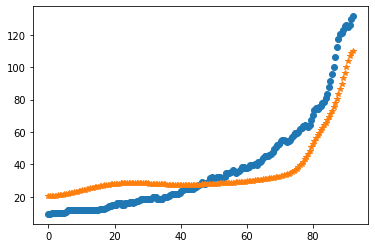

after perturb [2.354769984534022, 70.86127701407187, 25827.036601331758, 0.8751488679100008, 20.871650162362762]
parameters [2.354769984534022, 70.86127701407187, 25827.036601331758, 0.8751488679100008, 20.871650162362762]
oxigeno [1.88931799e-17 1.92426493e-17 2.03050981e-17 2.21232864e-17
 2.47706337e-17 2.83545522e-17 3.30213263e-17 3.89627626e-17
 4.64249202e-17 5.57193275e-17 6.72372104e-17 8.14674015e-17
 9.90187789e-17 1.20648304e-16 1.47296000e-16 1.80128578e-16
 2.20593817e-16 2.70488408e-16 3.32042622e-16 4.08026050e-16
 5.01879776e-16 6.17881691e-16 7.61353401e-16 9.38919303e-16
 1.15883111e-15 1.43137445e-15 1.76937833e-15 2.18885353e-15
 2.70979268e-15 3.35717281e-15 4.16221184e-15 5.16394325e-15
 6.41118960e-15 7.96503540e-15 9.90192526e-15 1.23175435e-14
 1.53316694e-14 1.90942483e-14 2.37929753e-14 2.96627565e-14
 3.69974999e-14 4.61647873e-14 5.76241130e-14 7.19495306e-14
 8.98577494e-14 1.12242972e-13 1.40220077e-13 1.75178134e-13
 2.18846751e-13 2.73378327e-13 3.4145

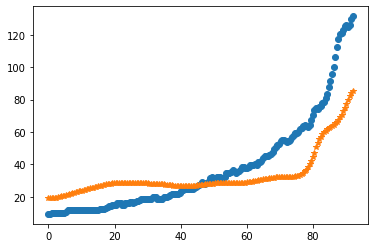

after perturb [2.5715178051259477, 104.59556527910719, 31908.940501509023, 0.7822959165032934, 26.154634722719926]
parameters [2.5715178051259477, 104.59556527910719, 31908.940501509023, 0.7822959165032934, 26.154634722719926]
after perturb [7.499408654880798, 168.82860004491147, 23538.33958191313, 1.0099514453806315, 53.48799327954703]
parameters [7.499408654880798, 168.82860004491147, 23538.33958191313, 1.0099514453806315, 53.48799327954703]
after perturb [-2.0620365266628267, 193.17270612344518, 17619.22367033944, 1.6343574924098156, 54.51774452593596]
parameters [-2.0620365266628267, 193.17270612344518, 17619.22367033944, 1.6343574924098156, 54.51774452593596]
after perturb [1.3446748794422185, 104.30228322332735, 20379.925459737828, 0.15919772959162296, 8.14157224199035]
parameters [1.3446748794422185, 104.30228322332735, 20379.925459737828, 0.15919772959162296, 8.14157224199035]
after perturb [4.725693553930966, -7.3156576871735695, 28610.788383479285, -0.4234073107801324, 1.4766

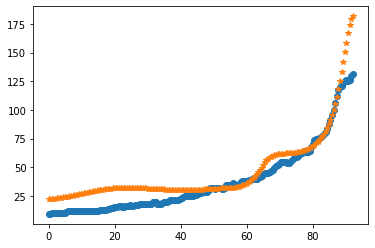

after perturb [1.1426946310787576, 115.14921912298868, 26017.817012655883, 0.4843034618605656, 32.89795800735726]
parameters [1.1426946310787576, 115.14921912298868, 26017.817012655883, 0.4843034618605656, 32.89795800735726]
oxigeno [4.52631681e-10 4.55317554e-10 4.63417276e-10 4.77057593e-10
 4.96451223e-10 5.21899222e-10 5.53794618e-10 5.92627600e-10
 6.38992614e-10 6.93597708e-10 7.57276385e-10 8.31002117e-10
 9.15905479e-10 1.01329373e-09 1.12467259e-09 1.25177002e-09
 1.39656221e-09 1.56130218e-09 1.74855238e-09 1.96122297e-09
 2.20261816e-09 2.47649311e-09 2.78712370e-09 3.13939086e-09
 3.53888001e-09 3.99199508e-09 4.50608562e-09 5.08958508e-09
 5.75215915e-09 6.50486467e-09 7.36032254e-09 8.33291142e-09
 9.43899241e-09 1.06971771e-08 1.21286523e-08 1.37575729e-08
 1.56115304e-08 1.77221002e-08 2.01254614e-08 2.28630824e-08
 2.59824566e-08 2.95378783e-08 3.35912512e-08 3.82129328e-08
 4.34826316e-08 4.94903899e-08 5.63376965e-08 6.41387852e-08
 7.30221781e-08 8.31325288e-08 9.46

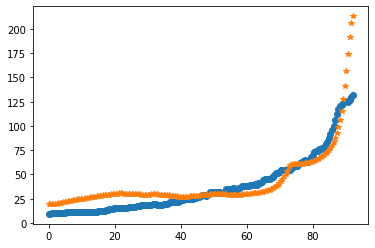

after perturb [0.6202263449016172, 155.8021832753936, 22176.95406986409, 1.1820247760314362, 43.092360687463895]
parameters [0.6202263449016172, 155.8021832753936, 22176.95406986409, 1.1820247760314362, 43.092360687463895]
after perturb [1.057904863982135, 175.46625331360707, 17215.605167066762, 1.2828294078545763, 33.5458815175276]
parameters [1.057904863982135, 175.46625331360707, 17215.605167066762, 1.2828294078545763, 33.5458815175276]
after perturb [-0.5522910612389842, 147.24674682545105, 21028.886608304758, 0.720938171464021, 30.64645603278322]
parameters [-0.5522910612389842, 147.24674682545105, 21028.886608304758, 0.720938171464021, 30.64645603278322]
after perturb [3.9597501152226364, 87.2243947555135, 25344.892994025744, 0.9439953765786834, 46.56300505247711]
parameters [3.9597501152226364, 87.2243947555135, 25344.892994025744, 0.9439953765786834, 46.56300505247711]
oxigeno [3.71645649e-16 3.77808346e-16 3.96504554e-16 4.28366526e-16
 4.74474692e-16 5.36398790e-16 6.16257751

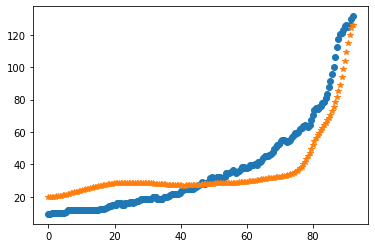

after perturb [-1.754613878525761, 162.76616389012509, 18803.216380694517, 1.660821996846722, 58.032662047856874]
parameters [-1.754613878525761, 162.76616389012509, 18803.216380694517, 1.660821996846722, 58.032662047856874]
after perturb [5.721757770317263, 196.16207870013602, 24089.654903556577, 1.4577351190647585, 45.49995971407862]
parameters [5.721757770317263, 196.16207870013602, 24089.654903556577, 1.4577351190647585, 45.49995971407862]
after perturb [1.9642252270065326, 91.2775333225585, 18794.99466172895, 0.7282433946800442, 28.463067738429558]
parameters [1.9642252270065326, 91.2775333225585, 18794.99466172895, 0.7282433946800442, 28.463067738429558]
after perturb [2.8396835387862795, 82.51604994171197, 21837.905080247318, 0.8070278480798756, 19.757052003633905]
parameters [2.8396835387862795, 82.51604994171197, 21837.905080247318, 0.8070278480798756, 19.757052003633905]
oxigeno [1.73865173e-15 1.76511957e-15 1.84535750e-15 1.98189923e-15
 2.17907000e-15 2.44314410e-15 2.7825

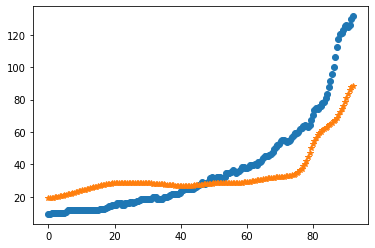

after perturb [0.4865174804670962, 154.76624870055076, 21764.946076772165, 1.1830788755663737, 42.64020264008711]
parameters [0.4865174804670962, 154.76624870055076, 21764.946076772165, 1.1830788755663737, 42.64020264008711]
after perturb [0.266266233625434, 124.58710812894155, 20311.40068721579, 0.14756877718453926, 21.413329319114744]
parameters [0.266266233625434, 124.58710812894155, 20311.40068721579, 0.14756877718453926, 21.413329319114744]
oxigeno [2.11633958e-04 2.11536130e-04 2.11251506e-04 2.10804277e-04
 2.10227860e-04 2.09557536e-04 2.08824298e-04 2.08051329e-04
 2.07253287e-04 2.06437865e-04 2.05609037e-04 2.04771454e-04
 2.03935099e-04 2.03118708e-04 2.02350398e-04 2.01664960e-04
 2.01098809e-04 2.00684702e-04 2.00448272e-04 2.00407308e-04
 2.00573234e-04 2.00953572e-04 2.01554435e-04 2.02383037e-04
 2.03450745e-04 2.04776804e-04 2.06391804e-04 2.08339055e-04
 2.10672303e-04 2.13449758e-04 2.16726371e-04 2.20547485e-04
 2.24946653e-04 2.29948550e-04 2.35575399e-04 2.418537

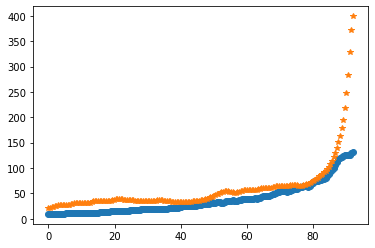

after perturb [-0.711841709871311, 164.09532034742676, 21735.817199728543, 1.0813037328396446, 56.5545710816822]
parameters [-0.711841709871311, 164.09532034742676, 21735.817199728543, 1.0813037328396446, 56.5545710816822]
after perturb [-0.7385997680868681, 139.16278529342543, 28940.950757414543, 0.7334739025047146, 30.801795439471533]
parameters [-0.7385997680868681, 139.16278529342543, 28940.950757414543, 0.7334739025047146, 30.801795439471533]
after perturb [1.5028340795591297, 171.75625584756747, 18985.248438113504, 1.2602329207181673, 56.13990490844576]
parameters [1.5028340795591297, 171.75625584756747, 18985.248438113504, 1.2602329207181673, 56.13990490844576]
after perturb [4.769996576674899, 191.7653403060865, 20181.453122883562, 1.761352171778596, 54.434280232443804]
parameters [4.769996576674899, 191.7653403060865, 20181.453122883562, 1.761352171778596, 54.434280232443804]
after perturb [1.979311298205386, 133.05321431654676, 22766.025263361968, 1.1607971727220183, 38.74986

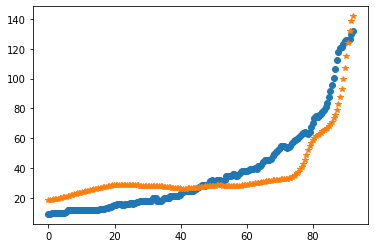

after perturb [3.4761952276463113, 80.81719893171756, 26377.803693744187, 0.189440716546174, 12.158637944542708]
parameters [3.4761952276463113, 80.81719893171756, 26377.803693744187, 0.189440716546174, 12.158637944542708]
oxigeno [1.30714408e-05 1.30618332e-05 1.30330937e-05 1.29854708e-05
 1.29193728e-05 1.28353596e-05 1.27341314e-05 1.26165158e-05
 1.24834522e-05 1.23359761e-05 1.21752021e-05 1.20023079e-05
 1.18185184e-05 1.16250912e-05 1.14233034e-05 1.12144408e-05
 1.09997879e-05 1.07806212e-05 1.05582031e-05 1.03337786e-05
 1.01085732e-05 9.88379219e-06 9.66062186e-06 9.44023100e-06
 9.22377394e-06 9.01239432e-06 8.80722949e-06 8.60941576e-06
 8.42009427e-06 8.24041752e-06 8.07155670e-06 7.91470971e-06
 7.77111012e-06 7.64203699e-06 7.52882571e-06 7.43287999e-06
 7.35568500e-06 7.29882189e-06 7.26398367e-06 7.25299264e-06
 7.26781960e-06 7.31060473e-06 7.38368056e-06 7.48959704e-06
 7.63114896e-06 7.81140592e-06 8.03374512e-06 8.30188711e-06
 8.61993503e-06 8.99241745e-06 9.4243

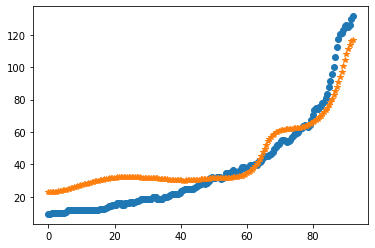

after perturb [-2.3787166153326122, 128.73595705035294, 19975.06954029904, 0.9712263252358753, 38.4018524360065]
parameters [-2.3787166153326122, 128.73595705035294, 19975.06954029904, 0.9712263252358753, 38.4018524360065]
after perturb [4.146080677736969, 145.29813723542117, 24555.538783851265, 0.7052852859394162, 39.38629979296206]
parameters [4.146080677736969, 145.29813723542117, 24555.538783851265, 0.7052852859394162, 39.38629979296206]
oxigeno [1.03561194e-10 1.04298002e-10 1.06519504e-10 1.10259131e-10
 1.15573302e-10 1.22542477e-10 1.31272664e-10 1.41897394e-10
 1.54580207e-10 1.69517679e-10 1.86943060e-10 2.07130576e-10
 2.30400473e-10 2.57124914e-10 2.87734809e-10 3.22727748e-10
 3.62677153e-10 4.08242853e-10 4.60183279e-10 5.19369520e-10
 5.86801518e-10 6.63626718e-10 7.51161537e-10 8.50916080e-10
 9.64622563e-10 1.09426800e-09 1.24213179e-09 1.41082885e-09
 1.60335917e-09 1.82316466e-09 2.07419427e-09 2.36097870e-09
 2.68871576e-09 3.06336809e-09 3.49177481e-09 3.98177898e-

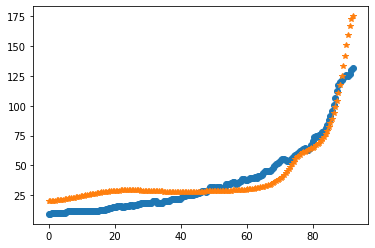

after perturb [-1.5911726881248787, 162.03048371716724, 24684.81685704324, 1.3792195034189496, 49.032225681225825]
parameters [-1.5911726881248787, 162.03048371716724, 24684.81685704324, 1.3792195034189496, 49.032225681225825]
after perturb [4.9345188122950105, 69.92491122394124, 21331.822244675957, -0.14025032786599106, 13.22055632276933]
parameters [4.9345188122950105, 69.92491122394124, 21331.822244675957, -0.14025032786599106, 13.22055632276933]
after perturb [-0.7346315009028563, 91.72875106909942, 25451.241315445146, 1.1557882642084938, 37.44076260816823]
parameters [-0.7346315009028563, 91.72875106909942, 25451.241315445146, 1.1557882642084938, 37.44076260816823]
after perturb [2.114708453639906, 106.30965292522329, 22506.250519425343, 0.5569558205175125, 28.75365834879517]
parameters [2.114708453639906, 106.30965292522329, 22506.250519425343, 0.5569558205175125, 28.75365834879517]
oxigeno [2.91571162e-11 2.93861073e-11 3.00771098e-11 3.12422994e-11
 3.29022622e-11 3.50864401e-1

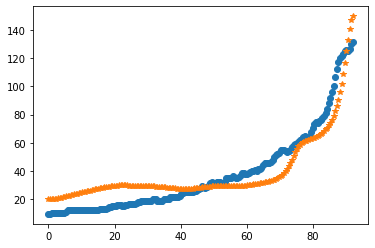

after perturb [6.569795414772288, 167.91963773473088, 24478.197302246514, 1.542886116820526, 32.38763383445212]
parameters [6.569795414772288, 167.91963773473088, 24478.197302246514, 1.542886116820526, 32.38763383445212]
after perturb [3.079470331022627, 163.76366372401606, 23746.19438086083, 0.9549227845843861, 46.10346449213908]
parameters [3.079470331022627, 163.76366372401606, 23746.19438086083, 0.9549227845843861, 46.10346449213908]
after perturb [-2.6300122707329048, 128.51134266299567, 23029.372385742645, 0.7413401741036438, 25.198769892668082]
parameters [-2.6300122707329048, 128.51134266299567, 23029.372385742645, 0.7413401741036438, 25.198769892668082]
after perturb [4.474963296743441, 175.9533443570707, 20116.46863019678, 0.6840746590468185, 46.24078856393041]
parameters [4.474963296743441, 175.9533443570707, 20116.46863019678, 0.6840746590468185, 46.24078856393041]
after perturb [1.3565552593573709, 101.5812212449703, 18266.689622546528, 0.586572314267402, 29.22164637101913

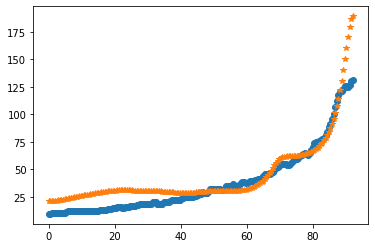

after perturb [7.485739238681445, 103.39826763129459, 29989.07226501793, 0.7040828636114124, 34.439045936480305]
parameters [7.485739238681445, 103.39826763129459, 29989.07226501793, 0.7040828636114124, 34.439045936480305]
after perturb [2.4166316572995097, 139.56539787380544, 22621.632505845962, 0.8716267518577621, 40.67423310067424]
parameters [2.4166316572995097, 139.56539787380544, 22621.632505845962, 0.8716267518577621, 40.67423310067424]
oxigeno [4.06733217e-12 4.10304228e-12 4.21084898e-12 4.39279755e-12
 4.65235129e-12 4.99447416e-12 5.42574850e-12 5.95453003e-12
 6.59114295e-12 7.34811911e-12 8.24048618e-12 9.28611104e-12
 1.05061062e-11 1.19253082e-11 1.35728406e-11 1.54827736e-11
 1.76948992e-11 2.02556392e-11 2.32191128e-11 2.66483886e-11
 3.06169570e-11 3.52104593e-11 4.05287196e-11 4.66881306e-11
 5.38244536e-11 6.20961024e-11 7.16879905e-11 8.28160361e-11
 9.57324329e-11 1.10731815e-10 1.28158465e-10 1.48414737e-10
 1.71970903e-10 1.99376642e-10 2.31274466e-10 2.68415349

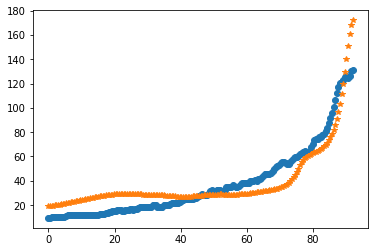

after perturb [8.937357778344627, 120.25438554485825, 19948.417534680997, 0.25171672718913995, 18.2706776477288]
parameters [8.937357778344627, 120.25438554485825, 19948.417534680997, 0.25171672718913995, 18.2706776477288]
after perturb [-3.8982318830736187, 164.992071230347, 29216.7161654718, 1.8165023062484953, 49.99307355207745]
parameters [-3.8982318830736187, 164.992071230347, 29216.7161654718, 1.8165023062484953, 49.99307355207745]
after perturb [2.822104760110681, 128.40988582606445, 18821.511597555196, 0.7900325187225244, 44.030214873760656]
parameters [2.822104760110681, 128.40988582606445, 18821.511597555196, 0.7900325187225244, 44.030214873760656]
after perturb [2.3762485104303597, 44.23022402098778, 27148.347060209093, 0.38295050102444655, 26.914917543189347]
parameters [2.3762485104303597, 44.23022402098778, 27148.347060209093, 0.38295050102444655, 26.914917543189347]
after perturb [2.801809189185005, 113.72307334266002, 24387.80101414541, 1.3248903988933283, 33.4321961826

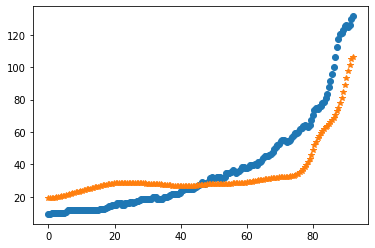

after perturb [4.446474616299814, 142.55679507250798, 27843.685194138656, 0.8521867158470756, 41.01286976093853]
parameters [4.446474616299814, 142.55679507250798, 27843.685194138656, 0.8521867158470756, 41.01286976093853]
oxigeno [7.38663431e-12 7.45071454e-12 7.64411466e-12 7.97033849e-12
 8.43531108e-12 9.04750871e-12 9.81814471e-12 1.07614151e-11
 1.18948096e-11 1.32394941e-11 1.48207743e-11 1.66686494e-11
 1.88184693e-11 2.13117098e-11 2.41968835e-11 2.75306082e-11
 3.13788558e-11 3.58184134e-11 4.09385884e-11 4.68431991e-11
 5.36528981e-11 6.15078814e-11 7.05710488e-11 8.10316889e-11
 9.31097757e-11 1.07060975e-10 1.23182480e-10 1.41819804e-10
 1.63374697e-10 1.88314350e-10 2.17182105e-10 2.50609907e-10
 2.89332767e-10 3.34205560e-10 3.86222502e-10 4.46539756e-10
 5.16501603e-10 5.97670765e-10 6.91863485e-10 8.01190110e-10
 9.28102000e-10 1.07544573e-09 1.24652571e-09 1.44517647e-09
 1.67584613e-09 1.94369277e-09 2.25469566e-09 2.61578358e-09
 3.03498307e-09 3.52158945e-09 4.0863

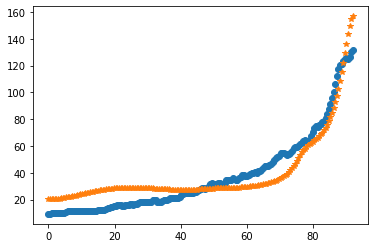

1
after perturb [-2.1250464463891894, 105.34131431631384, 24010.354041179875, 1.1176815509258817, 37.23829149921699]
parameters [-2.1250464463891894, 105.34131431631384, 24010.354041179875, 1.1176815509258817, 37.23829149921699]
after perturb [-1.3300211712354932, 93.52975029296562, 30249.67535669898, 0.6596564590646429, 24.330340926406734]
parameters [-1.3300211712354932, 93.52975029296562, 30249.67535669898, 0.6596564590646429, 24.330340926406734]
after perturb [0.16335719457204811, 138.28357847005728, 25417.890915443157, 1.2096574800490123, 38.72137909033659]
parameters [0.16335719457204811, 138.28357847005728, 25417.890915443157, 1.2096574800490123, 38.72137909033659]
oxigeno [2.91089236e-14 2.94043035e-14 3.03062897e-14 3.18602070e-14
 3.41358252e-14 3.72222043e-14 4.12240483e-14 4.62606091e-14
 5.24670533e-14 5.99970822e-14 6.90267808e-14 7.97632114e-14
 9.24630258e-14 1.07461393e-13 1.25202609e-13 1.46260255e-13
 1.71339951e-13 2.01266988e-13 2.36972750e-13 2.79498991e-13
 3.300

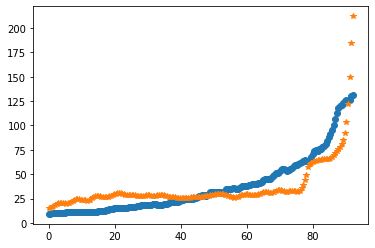

after perturb [-2.5153076225436486, 96.73051081341637, 18235.14380701949, 0.7069586727588297, 42.241144220148435]
parameters [-2.5153076225436486, 96.73051081341637, 18235.14380701949, 0.7069586727588297, 42.241144220148435]
after perturb [3.622179897014527, 72.45635628761977, 20562.45568774715, -0.11303703118193131, 16.85519886034389]
parameters [3.622179897014527, 72.45635628761977, 20562.45568774715, -0.11303703118193131, 16.85519886034389]
after perturb [-0.9237048754942971, 66.25128931570151, 21817.159760480834, -0.05338215127248713, 16.88230410548005]
parameters [-0.9237048754942971, 66.25128931570151, 21817.159760480834, -0.05338215127248713, 16.88230410548005]
after perturb [2.433933430339962, 166.8710015086448, 18620.172481949907, 1.0325369826974595, 40.35442164805374]
parameters [2.433933430339962, 166.8710015086448, 18620.172481949907, 1.0325369826974595, 40.35442164805374]
after perturb [1.0242690960562997, 119.7927387618599, 21373.174750684568, 0.6896826172613137, 30.12056

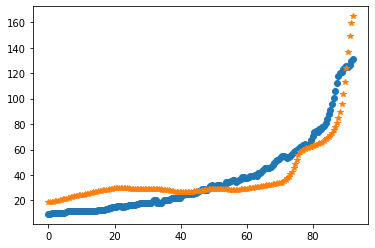

after perturb [4.455456438339098, -1.8772188179236338, 26275.061568062796, -0.14860522024784395, 3.835912280639336]
parameters [4.455456438339098, -1.8772188179236338, 26275.061568062796, -0.14860522024784395, 3.835912280639336]
after perturb [2.5284445361392542, 24.401756922243138, 26978.22081264169, -0.32097594100199633, 2.8487398084935016]
parameters [2.5284445361392542, 24.401756922243138, 26978.22081264169, -0.32097594100199633, 2.8487398084935016]
after perturb [-0.8810112212069481, 106.23485405065243, 18501.42433856165, 0.5364049431661219, 31.406710639169106]
parameters [-0.8810112212069481, 106.23485405065243, 18501.42433856165, 0.5364049431661219, 31.406710639169106]
after perturb [7.391440276479223, 154.73873685787584, 27574.98347006115, 0.93377895399406, 46.60378754112757]
parameters [7.391440276479223, 154.73873685787584, 27574.98347006115, 0.93377895399406, 46.60378754112757]
after perturb [4.2991808709332275, 145.90696449432482, 22277.817384601458, 1.1193367677948967, 40.

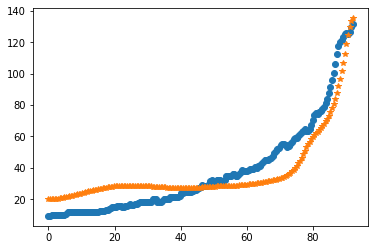

after perturb [-0.3728529011478914, 146.23181899606584, 21048.195904530847, 0.7390506683781728, 26.263186859717173]
parameters [-0.3728529011478914, 146.23181899606584, 21048.195904530847, 0.7390506683781728, 26.263186859717173]
after perturb [-4.539758394474239, 154.04717413654754, 20111.201654543667, 1.307730763043479, 38.43371474324627]
parameters [-4.539758394474239, 154.04717413654754, 20111.201654543667, 1.307730763043479, 38.43371474324627]
after perturb [3.1648284773809614, 138.73618842241086, 26257.562319105844, 0.5495483784951807, 32.01312436103122]
parameters [3.1648284773809614, 138.73618842241086, 26257.562319105844, 0.5495483784951807, 32.01312436103122]
oxigeno [1.03532994e-09 1.04145468e-09 1.05990770e-09 1.09092667e-09
 1.13491208e-09 1.19243381e-09 1.26424043e-09 1.35127139e-09
 1.45467208e-09 1.57581214e-09 1.71630715e-09 1.87804398e-09
 2.06321030e-09 2.27432858e-09 2.51429515e-09 2.78642508e-09
 3.09450349e-09 3.44284430e-09 3.83635731e-09 4.28062501e-09
 4.7819901

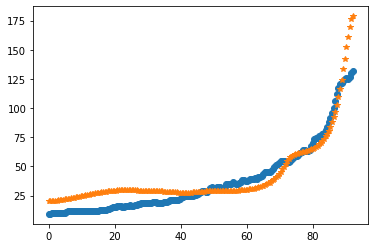

after perturb [7.805971449883369, 126.37010338144674, 25723.101166542634, 0.8449115297534143, 30.113532317571813]
parameters [7.805971449883369, 126.37010338144674, 25723.101166542634, 0.8449115297534143, 30.113532317571813]
after perturb [4.438571283861526, 82.04366737033003, 18223.051312569096, -0.040755448546414885, 21.114281469363107]
parameters [4.438571283861526, 82.04366737033003, 18223.051312569096, -0.040755448546414885, 21.114281469363107]
after perturb [2.552042924456862, 123.03917989462113, 18084.965367812965, 0.1254058699658862, 27.269518441260445]
parameters [2.552042924456862, 123.03917989462113, 18084.965367812965, 0.1254058699658862, 27.269518441260445]
after perturb [0.30788501321185346, 188.18215559460157, 15520.349999752223, 1.5855966287187546, 67.25773879918749]
parameters [0.30788501321185346, 188.18215559460157, 15520.349999752223, 1.5855966287187546, 67.25773879918749]
after perturb [3.7340376979492262, 222.57955135894116, 23798.267868990933, 1.5224199051609804,

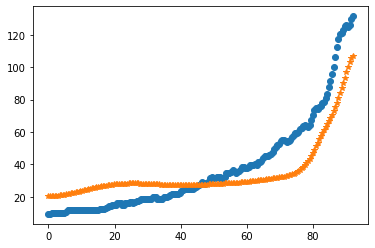

after perturb [1.4816025214807405, 34.65465761763126, 29536.324383391733, 0.6215587234415226, 32.492158649382304]
parameters [1.4816025214807405, 34.65465761763126, 29536.324383391733, 0.6215587234415226, 32.492158649382304]
after perturb [1.2946175847829027, 37.85017795730158, 22935.65795625624, -0.43996790962242627, -4.6120787168683925]
parameters [1.2946175847829027, 37.85017795730158, 22935.65795625624, -0.43996790962242627, -4.6120787168683925]
after perturb [2.136477877669428, 104.35130628496633, 23691.200112090453, 0.2140672291865116, 25.443372651564907]
parameters [2.136477877669428, 104.35130628496633, 23691.200112090453, 0.2140672291865116, 25.443372651564907]
oxigeno [6.48007330e-06 6.47677949e-06 6.46695580e-06 6.45077402e-06
 6.42851590e-06 6.40056671e-06 6.36740687e-06 6.32960237e-06
 6.28779448e-06 6.24268954e-06 6.19504916e-06 6.14568155e-06
 6.09543404e-06 6.04518731e-06 5.99585126e-06 5.94836284e-06
 5.90368560e-06 5.86281128e-06 5.82676302e-06 5.79660037e-06
 5.77342

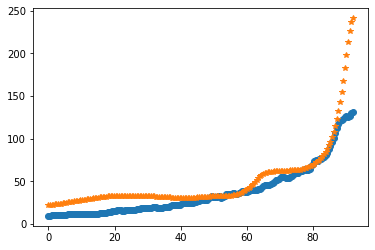

after perturb [6.992201631226459, 119.9944627867879, 27665.95726186706, 0.5116235429066194, 38.33220081972624]
parameters [6.992201631226459, 119.9944627867879, 27665.95726186706, 0.5116235429066194, 38.33220081972624]
oxigeno [3.76268332e-10 3.78816009e-10 3.86494886e-10 3.99413092e-10
 4.17752839e-10 4.41773452e-10 4.71815683e-10 5.08307375e-10
 5.51770594e-10 6.02830313e-10 6.62224837e-10 7.30818113e-10
 8.09614156e-10 8.99773829e-10 1.00263427e-09 1.11973128e-09
 1.25282510e-09 1.40392996e-09 1.57534795e-09 1.76970781e-09
 1.99000918e-09 2.23967326e-09 2.52260057e-09 2.84323682e-09
 3.20664812e-09 3.61860657e-09 4.08568784e-09 4.61538226e-09
 5.21622118e-09 5.89792087e-09 6.67154597e-09 7.54969534e-09
 8.54671319e-09 9.67892879e-09 1.09649285e-08 1.24258644e-08
 1.40858041e-08 1.59721277e-08 1.81159766e-08 2.05527625e-08
 2.33227439e-08 2.64716769e-08 3.00515534e-08 3.41214345e-08
 3.87483930e-08 4.40085791e-08 4.99884236e-08 5.67859982e-08
 6.45125502e-08 7.32942368e-08 8.32740816

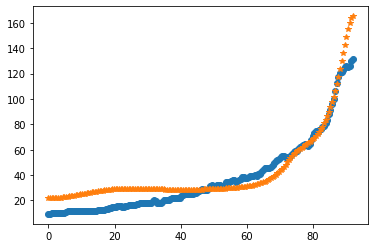

2
after perturb [2.888623409590038, 156.12079043055004, 17780.232970363053, 1.4657035469564312, 30.180158232511353]
parameters [2.888623409590038, 156.12079043055004, 17780.232970363053, 1.4657035469564312, 30.180158232511353]
after perturb [1.341597620826164, 194.94555013424812, 27880.186532261992, 1.4006882376880485, 57.0289463401663]
parameters [1.341597620826164, 194.94555013424812, 27880.186532261992, 1.4006882376880485, 57.0289463401663]
after perturb [-0.18111898776599422, 146.15804461374475, 19804.654243770183, 1.3444173561660009, 48.62565494871046]
parameters [-0.18111898776599422, 146.15804461374475, 19804.654243770183, 1.3444173561660009, 48.62565494871046]
after perturb [-0.07075697073563525, 94.98554435022662, 18398.744277404807, 0.20223131256313476, 24.932710689112177]
parameters [-0.07075697073563525, 94.98554435022662, 18398.744277404807, 0.20223131256313476, 24.932710689112177]
after perturb [0.14574540940509761, 152.76944416785724, 31008.583068151638, 2.09108474174196

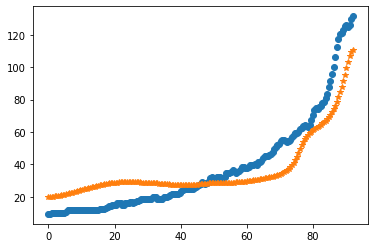

after perturb [3.5113017015329038, 159.59836341589505, 16416.89261384033, 0.7873235958106715, 21.663672374516697]
parameters [3.5113017015329038, 159.59836341589505, 16416.89261384033, 0.7873235958106715, 21.663672374516697]
after perturb [1.3427922726007966, 100.4913827062148, 16895.024150080702, 0.07146971848927719, 23.429472860348106]
parameters [1.3427922726007966, 100.4913827062148, 16895.024150080702, 0.07146971848927719, 23.429472860348106]
after perturb [0.5936337622537416, 109.78447313528521, 15461.639991517219, 0.6834187123472826, 30.58751177742766]
parameters [0.5936337622537416, 109.78447313528521, 15461.639991517219, 0.6834187123472826, 30.58751177742766]
after perturb [2.6709462700791717, 196.87137495628028, 20995.00741373132, 1.557376544380872, 42.304013598473006]
parameters [2.6709462700791717, 196.87137495628028, 20995.00741373132, 1.557376544380872, 42.304013598473006]
after perturb [5.466015044236562, 193.34027165196443, 26068.619421206036, 1.469227586133002, 62.3094

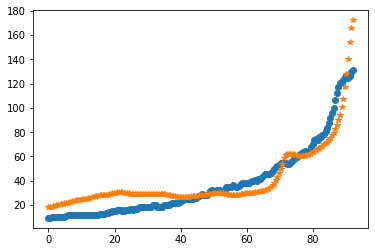

after perturb [3.4535511698078123, 105.31180399497629, 29837.849089491738, 0.3019973930353692, 33.75760205686814]
parameters [3.4535511698078123, 105.31180399497629, 29837.849089491738, 0.3019973930353692, 33.75760205686814]
after perturb [-0.5631907752082124, 169.60272494102304, 30229.193493333165, 0.8414618038734274, 33.51995798021401]
parameters [-0.5631907752082124, 169.60272494102304, 30229.193493333165, 0.8414618038734274, 33.51995798021401]
after perturb [0.33560995618125444, 187.17987143483506, 20660.348477459036, 1.0005628314798058, 43.21684604183298]
parameters [0.33560995618125444, 187.17987143483506, 20660.348477459036, 1.0005628314798058, 43.21684604183298]
after perturb [7.479804179574163, 165.31078124746045, 31100.756651315904, 0.9523078492454419, 44.234051008434676]
parameters [7.479804179574163, 165.31078124746045, 31100.756651315904, 0.9523078492454419, 44.234051008434676]
after perturb [2.372385013825228, 160.67482101537703, 21927.490278827445, 0.6192052710003901, 28

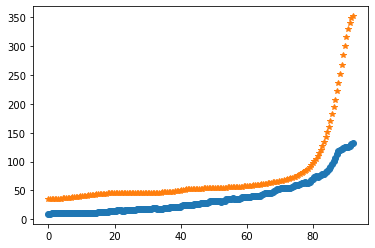

after perturb [-0.7291339773507883, 118.0015865433597, 21915.07338428341, 0.5828658352736376, 28.770341418978653]
parameters [-0.7291339773507883, 118.0015865433597, 21915.07338428341, 0.5828658352736376, 28.770341418978653]
after perturb [0.9106748259696715, 117.15438544291037, 22811.982106674524, 0.8263040288668695, 29.153159706097725]
parameters [0.9106748259696715, 117.15438544291037, 22811.982106674524, 0.8263040288668695, 29.153159706097725]
oxigeno [6.08251892e-13 6.14222569e-13 6.32275418e-13 6.62835713e-13
 7.06621704e-13 7.64659168e-13 8.38302716e-13 9.29265242e-13
 1.03965759e-12 1.17204112e-12 1.32949593e-12 1.51570723e-12
 1.73507119e-12 1.99282049e-12 2.29516840e-12 2.64947034e-12
 3.06440272e-12 3.55016217e-12 4.11869280e-12 4.78395555e-12
 5.56225982e-12 6.47268298e-12 7.53760569e-12 8.78338979e-12
 1.02412189e-11 1.19481119e-11 1.39481087e-11 1.62936179e-11
 1.90469180e-11 2.22818172e-11 2.60855043e-11 3.05606711e-11
 3.58280319e-11 4.20294214e-11 4.93316801e-11 5.7931

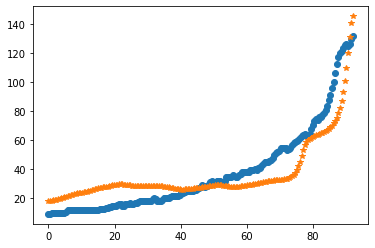

after perturb [-1.6271787939953364, 120.64161222121703, 22663.649596906933, 0.9074059093542808, 40.508719105575615]
parameters [-1.6271787939953364, 120.64161222121703, 22663.649596906933, 0.9074059093542808, 40.508719105575615]
after perturb [-1.5223107803704168, 172.30111770353056, 24234.98029111182, 0.8045482489013438, 47.72751459264903]
parameters [-1.5223107803704168, 172.30111770353056, 24234.98029111182, 0.8045482489013438, 47.72751459264903]
after perturb [-0.7987288283633771, 156.20710668620714, 17850.557173481524, 0.9772400135565456, 39.52408419726197]
parameters [-0.7987288283633771, 156.20710668620714, 17850.557173481524, 0.9772400135565456, 39.52408419726197]
after perturb [1.182055745780312, 136.6755303769218, 20360.19226455103, 0.859037806660769, 37.36507804083502]
parameters [1.182055745780312, 136.6755303769218, 20360.19226455103, 0.859037806660769, 37.36507804083502]
oxigeno [3.70154968e-12 3.73331817e-12 3.82926168e-12 3.99130790e-12
 4.22271502e-12 4.52814101e-12 4.

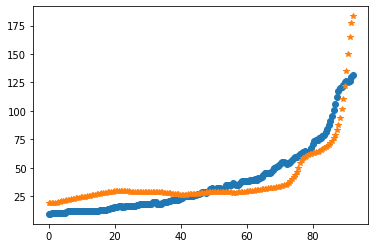

after perturb [1.4645800981185255, 73.75797002912307, 20690.39508073756, 0.9013953375016126, 35.46124019644378]
parameters [1.4645800981185255, 73.75797002912307, 20690.39508073756, 0.9013953375016126, 35.46124019644378]
oxigeno [2.80844097e-17 2.85960549e-17 3.01509430e-17 3.28098495e-17
 3.66771597e-17 4.19056334e-17 4.87033416e-17 5.73430698e-17
 6.81746086e-17 8.16404964e-17 9.82959496e-17 1.18833907e-16
 1.44116341e-16 1.75213243e-16 2.13451038e-16 2.60472561e-16
 3.18311352e-16 3.89483719e-16 4.77103080e-16 5.85022389e-16
 7.18012156e-16 8.81983623e-16 1.08426915e-15 1.33397478e-15
 1.64242326e-15 2.02370991e-15 2.49539833e-15 3.07938915e-15
 3.80300275e-15 4.70032760e-15 5.81389964e-15 7.19679714e-15
 8.91525968e-15 1.10519704e-14 1.37101786e-14 1.70188837e-14
 2.11393540e-14 2.62733121e-14 3.26731856e-14 4.06548983e-14
 5.06137686e-14 6.30441931e-14 7.85639337e-14 9.79440142e-14
 1.22145474e-13 1.52364548e-13 1.90088256e-13 2.37162922e-13
 2.95878804e-13 3.69074839e-13 4.602685

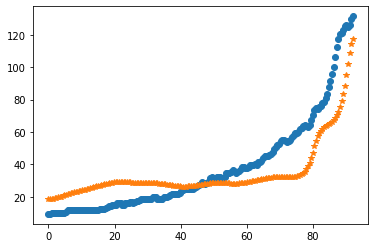

after perturb [1.5524595037063924, 110.02622404568369, 24016.890617408957, 0.42629062372428667, 43.02850488819472]
parameters [1.5524595037063924, 110.02622404568369, 24016.890617408957, 0.42629062372428667, 43.02850488819472]
oxigeno [1.29599047e-09 1.30133502e-09 1.31745335e-09 1.34460037e-09
 1.38320409e-09 1.43387053e-09 1.49739095e-09 1.57475171e-09
 1.66714709e-09 1.77599550e-09 1.90295923e-09 2.04996817e-09
 2.21924772e-09 2.41335099e-09 2.63519588e-09 2.88810716e-09
 3.17586462e-09 3.50275812e-09 3.87365114e-09 4.29405464e-09
 4.77021339e-09 5.30920721e-09 5.91906904e-09 6.60892222e-09
 7.38913809e-09 8.27151550e-09 9.26948272e-09 1.03983232e-08
 1.16754268e-08 1.31205694e-08 1.47562266e-08 1.66079274e-08
 1.87046581e-08 2.10793262e-08 2.37692966e-08 2.68170095e-08
 3.02706890e-08 3.41851481e-08 3.86226927e-08 4.36541225e-08
 4.93598273e-08 5.58309771e-08 6.31708068e-08 7.14960067e-08
 8.09382336e-08 9.16457757e-08 1.03785410e-07 1.17544507e-07
 1.33133437e-07 1.50788352e-07 1.

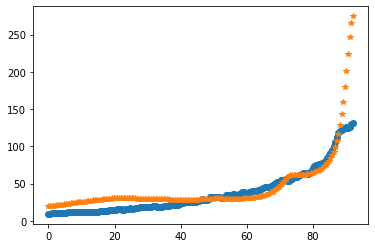

after perturb [1.4748061993738528, 171.34151492035974, 22477.261022524734, 1.1272792372401732, 46.53157952473239]
parameters [1.4748061993738528, 171.34151492035974, 22477.261022524734, 1.1272792372401732, 46.53157952473239]
after perturb [2.9860570331103045, 171.08436781782058, 17989.060019457254, 1.2869077184347328, 45.12387967756994]
parameters [2.9860570331103045, 171.08436781782058, 17989.060019457254, 1.2869077184347328, 45.12387967756994]
after perturb [-0.4797852160413272, 208.47933269682773, 28341.45232898218, 1.9707272968853993, 57.21579540738003]
parameters [-0.4797852160413272, 208.47933269682773, 28341.45232898218, 1.9707272968853993, 57.21579540738003]
after perturb [7.654353622790647, 112.32979998241811, 18622.233671345555, 0.18480398164206835, 30.99483363337031]
parameters [7.654353622790647, 112.32979998241811, 18622.233671345555, 0.18480398164206835, 30.99483363337031]
after perturb [0.802403713599509, 198.07025052121514, 23814.645352394582, 1.4535936627108335, 52.913

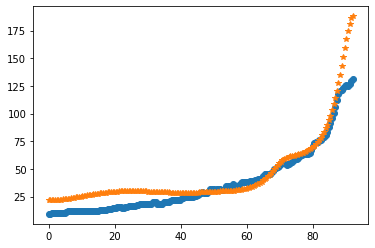

after perturb [8.16944081551236, 150.90723451865608, 24822.235682188042, 0.36851490114653207, 24.048183576493606]
parameters [8.16944081551236, 150.90723451865608, 24822.235682188042, 0.36851490114653207, 24.048183576493606]
after perturb [1.674507828004212, 116.33009961667923, 18046.21544451347, 0.6528877600541844, 33.398295635521684]
parameters [1.674507828004212, 116.33009961667923, 18046.21544451347, 0.6528877600541844, 33.398295635521684]
after perturb [-2.9247479960893314, 177.81877682131858, 22997.646854135328, 1.660275750077211, 63.12338469714213]
parameters [-2.9247479960893314, 177.81877682131858, 22997.646854135328, 1.660275750077211, 63.12338469714213]
after perturb [2.97780684485052, 173.05585892088004, 23035.4158418051, 1.2189901091120467, 48.680862950110274]
parameters [2.97780684485052, 173.05585892088004, 23035.4158418051, 1.2189901091120467, 48.680862950110274]
after perturb [0.9865998219003311, 93.74001800779186, 23970.663450611286, 0.8003613314695334, 27.98444723763

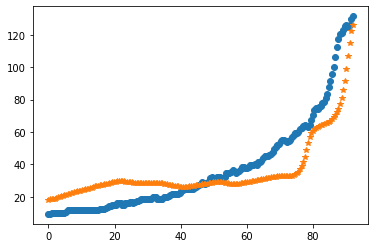

after perturb [1.396876559096699, 106.36730340125287, 12781.742323912109, 0.41614947775297934, 28.492046740608842]
parameters [1.396876559096699, 106.36730340125287, 12781.742323912109, 0.41614947775297934, 28.492046740608842]
after perturb [0.8323155100109644, 160.8904237438364, 19735.100070592995, 1.2472704399988592, 44.24736582605357]
parameters [0.8323155100109644, 160.8904237438364, 19735.100070592995, 1.2472704399988592, 44.24736582605357]
after perturb [0.17811022727788595, 127.62376309890055, 14976.203894508311, 0.17659849469450684, 34.591178982964244]
parameters [0.17811022727788595, 127.62376309890055, 14976.203894508311, 0.17659849469450684, 34.591178982964244]
after perturb [2.8911228894534573, 53.347051687075066, 22456.13795850931, 0.4273464128184885, 23.183036946263414]
parameters [2.8911228894534573, 53.347051687075066, 22456.13795850931, 0.4273464128184885, 23.183036946263414]
oxigeno [3.29619862e-10 3.29065654e-10 3.27410804e-10 3.24678381e-10
 3.20905980e-10 3.1614451

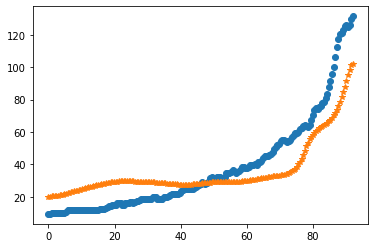

after perturb [1.6646418230041438, 39.9717490344522, 17675.564650314376, -0.30443242762594314, -0.3549792864468895]
parameters [1.6646418230041438, 39.9717490344522, 17675.564650314376, -0.30443242762594314, -0.3549792864468895]
after perturb [1.8743710458267744, 43.96460860748254, 24249.97404239732, 0.19255891248464702, 6.878943373607157]
parameters [1.8743710458267744, 43.96460860748254, 24249.97404239732, 0.19255891248464702, 6.878943373607157]
after perturb [-1.246040052729248, 124.79601132368319, 21006.74015147557, 0.7535517153265929, 46.065915971994286]
parameters [-1.246040052729248, 124.79601132368319, 21006.74015147557, 0.7535517153265929, 46.065915971994286]
after perturb [0.3565036542805842, 126.25527061265053, 17341.071710494318, 0.8258696682947497, 44.14288579778905]
parameters [0.3565036542805842, 126.25527061265053, 17341.071710494318, 0.8258696682947497, 44.14288579778905]
after perturb [1.704862435425294, 139.75860713629805, 28586.17189420256, 1.994621851392167, 59.748

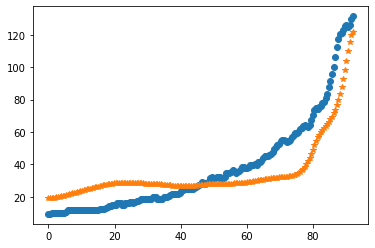

after perturb [3.582824518081796, 15.870846976884792, 25177.728483161885, 0.1231235651832761, 19.30321174444421]
parameters [3.582824518081796, 15.870846976884792, 25177.728483161885, 0.1231235651832761, 19.30321174444421]
after perturb [4.77310182516352, 196.64539387420314, 24028.781127146285, 1.0284888591363628, 41.167190004927676]
parameters [4.77310182516352, 196.64539387420314, 24028.781127146285, 1.0284888591363628, 41.167190004927676]
after perturb [4.968799954560169, 131.87768668438906, 20723.57951888706, 1.1418806920590163, 37.10856124059046]
parameters [4.968799954560169, 131.87768668438906, 20723.57951888706, 1.1418806920590163, 37.10856124059046]
oxigeno [3.17473144e-14 3.21434060e-14 3.33418186e-14 3.53732644e-14
 3.82899358e-14 4.21670450e-14 4.71050481e-14 5.32326217e-14
 6.07104862e-14 6.97361963e-14 8.05500509e-14 9.34423100e-14
 1.08761949e-13 1.26927233e-13 1.48438444e-13 1.73893193e-13
 2.04004781e-13 2.39624248e-13 2.81766793e-13 3.31643466e-13
 3.90699150e-13 4.60

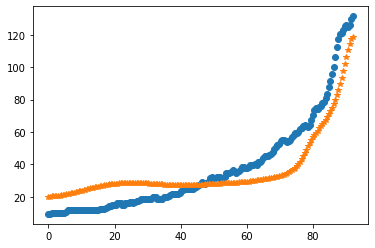

after perturb [4.156917574194587, 132.90834015030248, 24233.81866340899, 0.569775723949324, 24.842370159676868]
parameters [4.156917574194587, 132.90834015030248, 24233.81866340899, 0.569775723949324, 24.842370159676868]
oxigeno [4.13997583e-10 4.16716192e-10 4.24909741e-10 4.38692045e-10
 4.58254987e-10 4.83871836e-10 5.15901968e-10 5.54797042e-10
 6.01108746e-10 6.55498219e-10 7.18747297e-10 7.91771782e-10
 8.75636933e-10 9.71575450e-10 1.08100826e-09 1.20556848e-09
 1.34712893e-09 1.50783375e-09 1.69013469e-09 1.89683257e-09
 2.13112494e-09 2.39666049e-09 2.69760136e-09 3.03869444e-09
 3.42535280e-09 3.86374877e-09 4.36092020e-09 4.92489174e-09
 5.56481306e-09 6.29111644e-09 7.11569605e-09 8.05211200e-09
 9.11582218e-09 1.03244455e-08 1.16980605e-08 1.32595439e-08
 1.50349539e-08 1.70539641e-08 1.93503539e-08 2.19625628e-08
 2.49343165e-08 2.83153343e-08 3.21621265e-08 3.65388957e-08
 4.15185535e-08 4.71838683e-08 5.36287621e-08 6.09597746e-08
 6.92977184e-08 7.87795494e-08 8.956048

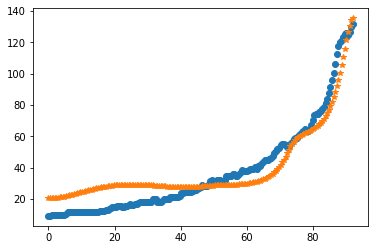

3
after perturb [0.05121645558115118, 86.01237763558386, 21071.261862137086, -0.1147477888714879, 7.752920825555172]
parameters [0.05121645558115118, 86.01237763558386, 21071.261862137086, -0.1147477888714879, 7.752920825555172]
after perturb [6.229466400167694, 171.8353961458594, 28227.16504819611, 0.8494195321267279, 31.996704191018367]
parameters [6.229466400167694, 171.8353961458594, 28227.16504819611, 0.8494195321267279, 31.996704191018367]
after perturb [8.854088067677562, 74.78649171076673, 20244.004970197693, 0.22506870606853668, 18.92393160679885]
parameters [8.854088067677562, 74.78649171076673, 20244.004970197693, 0.22506870606853668, 18.92393160679885]
after perturb [5.471537431441705, 55.955728985584024, 23087.944089263532, 0.24964990935633288, 21.11757816597791]
parameters [5.471537431441705, 55.955728985584024, 23087.944089263532, 0.24964990935633288, 21.11757816597791]
oxigeno [9.06164060e-07 9.05214422e-07 9.02373641e-07 8.97665965e-07
 8.91131304e-07 8.82824488e-07 8.

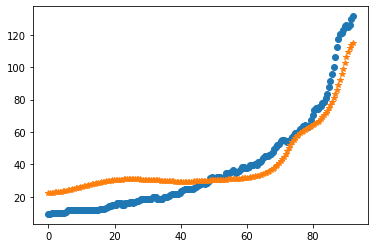

after perturb [3.9488235809584236, 120.1098954463322, 26880.57864620726, 0.5973984429605498, 33.95788348980994]
parameters [3.9488235809584236, 120.1098954463322, 26880.57864620726, 0.5973984429605498, 33.95788348980994]
oxigeno [6.34623509e-11 6.39465604e-11 6.54069490e-11 6.78669495e-11
 7.13661299e-11 7.59609713e-11 8.17259776e-11 8.87551340e-11
 9.71637426e-11 1.07090667e-10 1.18701029e-10 1.32189406e-10
 1.47783597e-10 1.65749020e-10 1.86393839e-10 2.10074922e-10
 2.37204740e-10 2.68259370e-10 3.03787741e-10 3.44422341e-10
 3.90891583e-10 4.44034107e-10 5.04815289e-10 5.74346328e-10
 6.53906262e-10 7.44967393e-10 8.49224606e-10 9.68629175e-10
 1.10542772e-09 1.26220706e-09 1.44194583e-09 1.64807383e-09
 1.88454018e-09 2.15589164e-09 2.46736234e-09 2.82497666e-09
 3.23566702e-09 3.70740859e-09 4.24937338e-09 4.87210615e-09
 5.58772532e-09 6.41015221e-09 7.35537257e-09 8.44173484e-09
 9.69029034e-09 1.11251813e-08 1.27740834e-08 1.46687109e-08
 1.68453934e-08 1.93457335e-08 2.221735

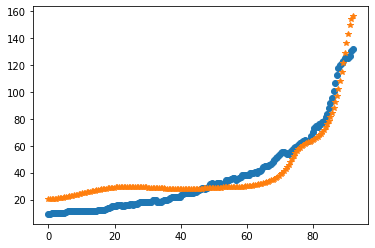

4
after perturb [3.343359205194194, 131.3799892628417, 11922.339556045317, 0.6792544398470763, 35.31154139821472]
parameters [3.343359205194194, 131.3799892628417, 11922.339556045317, 0.6792544398470763, 35.31154139821472]
after perturb [-3.2168101220444427, 142.6872586130834, 23801.862264503427, 1.114293251569439, 40.52961711743887]
parameters [-3.2168101220444427, 142.6872586130834, 23801.862264503427, 1.114293251569439, 40.52961711743887]
after perturb [1.6564516436637637, 134.1976764661804, 27498.872919476453, 0.8401907764167026, 37.85740188243322]
parameters [1.6564516436637637, 134.1976764661804, 27498.872919476453, 0.8401907764167026, 37.85740188243322]
oxigeno [3.80187633e-12 3.83506240e-12 3.93526552e-12 4.10443598e-12
 4.34587669e-12 4.66432251e-12 5.06605306e-12 5.55904112e-12
 6.15313928e-12 6.86030898e-12 7.69489659e-12 8.67396256e-12
 9.81767046e-12 1.11497442e-11 1.26980030e-11 1.44949866e-11
 1.65786852e-11 1.89933950e-11 2.17907223e-11 2.50307690e-11
 2.87835353e-11 3.

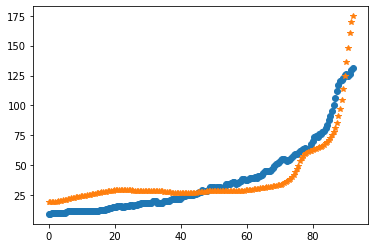

after perturb [1.8998690791605526, 108.52205865112383, 22385.7670208992, 0.5153989161003258, 29.37264040921621]
parameters [1.8998690791605526, 108.52205865112383, 22385.7670208992, 0.5153989161003258, 29.37264040921621]
oxigeno [1.02069952e-10 1.02777996e-10 1.04913715e-10 1.08512106e-10
 1.13632259e-10 1.20358513e-10 1.28802099e-10 1.39103275e-10
 1.51434010e-10 1.66001231e-10 1.83050714e-10 2.02871656e-10
 2.25802029e-10 2.52234802e-10 2.82625149e-10 3.17498790e-10
 3.57461641e-10 4.03210995e-10 4.55548498e-10 5.15395242e-10
 5.83809348e-10 6.62006446e-10 7.51383534e-10 8.53546695e-10
 9.70343225e-10 1.10389873e-09 1.25665981e-09 1.43144315e-09
 1.63149164e-09 1.86053885e-09 2.12288289e-09 2.42347121e-09
 2.76799831e-09 3.16301824e-09 3.61607436e-09 4.13584876e-09
 4.73233399e-09 5.41702963e-09 6.20316628e-09 7.10595952e-09
 8.14289657e-09 9.33405853e-09 1.07024819e-08 1.22745639e-08
 1.40805176e-08 1.61548847e-08 1.85371154e-08 2.12722284e-08
 2.44115651e-08 2.80136551e-08 3.214521

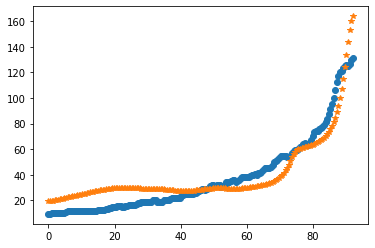

after perturb [5.123682657483171, 124.13433075647299, 29992.86222637298, 1.5671527206941582, 37.511837945819835]
parameters [5.123682657483171, 124.13433075647299, 29992.86222637298, 1.5671527206941582, 37.511837945819835]
after perturb [2.1229230560627217, 146.1027678023867, 32734.147355798024, 1.0511797341475104, 42.35400062827866]
parameters [2.1229230560627217, 146.1027678023867, 32734.147355798024, 1.0511797341475104, 42.35400062827866]
after perturb [2.2531601302072466, 89.41778319375607, 25020.66858878091, 0.59676841047349, 26.999948823557137]
parameters [2.2531601302072466, 89.41778319375607, 25020.66858878091, 0.59676841047349, 26.999948823557137]
oxigeno [9.68069065e-13 9.76732277e-13 1.00292243e-12 1.04724633e-12
 1.11073308e-12 1.19486103e-12 1.30159647e-12 1.43344493e-12
 1.59351629e-12 1.78560536e-12 2.01428992e-12 2.28504880e-12
 2.60440301e-12 2.98008370e-12 3.42123161e-12 3.93863328e-12
 4.54500102e-12 5.25530444e-12 6.08716333e-12 7.06131347e-12
 8.20215922e-12 9.5384

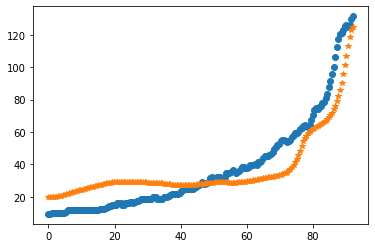

after perturb [3.9490041006086636, 143.16340995946422, 26642.21512594383, 1.3342938875621202, 44.37214863033891]
parameters [3.9490041006086636, 143.16340995946422, 26642.21512594383, 1.3342938875621202, 44.37214863033891]
oxigeno [1.06079467e-14 1.07449623e-14 1.11596685e-14 1.18631581e-14
 1.28743050e-14 1.42203569e-14 1.59377912e-14 1.80734621e-14
 2.06860774e-14 2.38480524e-14 2.76478029e-14 3.21925529e-14
 3.76117521e-14 4.40612177e-14 5.17281409e-14 6.08371313e-14
 7.16575041e-14 8.45120652e-14 9.97876988e-14 1.17948129e-13
 1.39549299e-13 1.65257922e-13 1.95873842e-13 2.32357009e-13
 2.75860018e-13 3.27767372e-13 3.89742839e-13 4.63786602e-13
 5.52304187e-13 6.58189609e-13 7.84925629e-13 9.36704611e-13
 1.11857416e-12 1.33661251e-12 1.59813974e-12 1.91197180e-12
 2.28872606e-12 2.74118849e-12 3.28475458e-12 3.93795865e-12
 4.72310866e-12 5.66704742e-12 6.80206453e-12 8.16698878e-12
 9.80849607e-12 1.17826748e-11 1.41568995e-11 1.70120720e-11
 2.04453036e-11 2.45731236e-11 2.9535

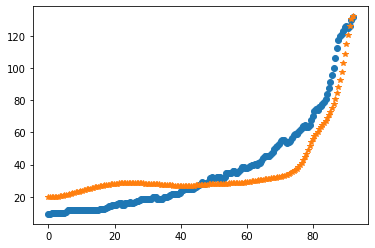

after perturb [0.3506889179357109, 99.3579876420747, 19478.063897228258, 0.7223577394127066, 29.78021325689846]
parameters [0.3506889179357109, 99.3579876420747, 19478.063897228258, 0.7223577394127066, 29.78021325689846]
after perturb [7.691167948097709, 177.50339605236542, 29256.97127008609, 1.0071344350248586, 45.70112868574177]
parameters [7.691167948097709, 177.50339605236542, 29256.97127008609, 1.0071344350248586, 45.70112868574177]
after perturb [7.960991892151077, 179.26435715621196, 22991.080340134158, 1.603706659247861, 36.23949399583131]
parameters [7.960991892151077, 179.26435715621196, 22991.080340134158, 1.603706659247861, 36.23949399583131]
after perturb [3.2482159537921738, 57.43281592116408, 23532.288784093154, 0.3037259360500257, 8.272341975326057]
parameters [3.2482159537921738, 57.43281592116408, 23532.288784093154, 0.3037259360500257, 8.272341975326057]
after perturb [6.520740693882864, 81.673817110675, 25640.77130464457, 0.21060192162073005, 29.612367112290823]
par

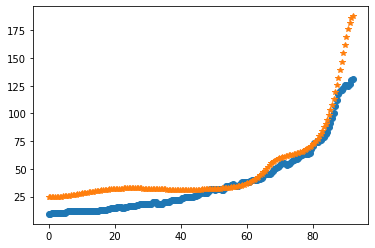

after perturb [1.3479261038568657, 104.66233770442349, 23310.684958548074, 0.6099917079175959, 25.55136948864161]
parameters [1.3479261038568657, 104.66233770442349, 23310.684958548074, 0.6099917079175959, 25.55136948864161]
oxigeno [7.09774703e-12 7.15914349e-12 7.34454535e-12 7.65761739e-12
 8.10455931e-12 8.69424495e-12 9.43842103e-12 1.03519701e-11
 1.14532446e-11 1.27644808e-11 1.43123029e-11 1.61283286e-11
 1.82498867e-11 2.07208589e-11 2.35926568e-11 2.69253509e-11
 3.07889726e-11 3.52650226e-11 4.04482315e-11 4.64486368e-11
 5.33940567e-11 6.14330548e-11 7.07384970e-11 8.15118070e-11
 9.39880156e-11 1.08441693e-10 1.25193843e-10 1.44619852e-10
 1.67158589e-10 1.93322826e-10 2.23711222e-10 2.59022205e-10
 3.00070235e-10 3.47805014e-10 4.03334341e-10 4.67951317e-10
 5.43166635e-10 6.30746599e-10 7.32757418e-10 8.51616218e-10
 9.90149124e-10 1.15165680e-09 1.33998800e-09 1.55962198e-09
 1.81576123e-09 2.11443662e-09 2.46262767e-09 2.86840193e-09
 3.34107755e-09 3.89141439e-09 4.53

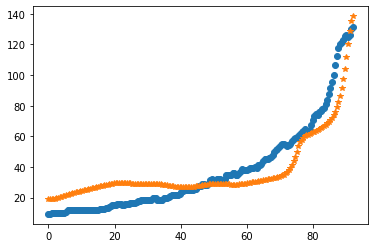

after perturb [8.77520946797123, 33.487576610609494, 20357.407142097552, 0.1191817660586772, 25.59328289971734]
parameters [8.77520946797123, 33.487576610609494, 20357.407142097552, 0.1191817660586772, 25.59328289971734]
after perturb [6.652145741458014, 122.17901404710497, 25151.28298725406, 0.9235867409593218, 43.909006847990625]
parameters [6.652145741458014, 122.17901404710497, 25151.28298725406, 0.9235867409593218, 43.909006847990625]
oxigeno [2.22651510e-13 2.25186282e-13 2.32849366e-13 2.45818604e-13
 2.64395585e-13 2.89013562e-13 3.20248866e-13 3.58836119e-13
 4.05687676e-13 4.61917871e-13 5.28872732e-13 6.08166024e-13
 7.01722654e-13 8.11830671e-13 9.41203365e-13 1.09305324e-12
 1.27118003e-12 1.48007519e-12 1.72504612e-12 2.01236338e-12
 2.34943548e-12 2.74501615e-12 3.20945014e-12 3.75496460e-12
 4.39601467e-12 5.14969301e-12 6.03621534e-12 7.07949581e-12
 8.30782871e-12 9.75469622e-12 1.14597250e-11 1.34698190e-11
 1.58405002e-11 1.86374961e-11 2.19386162e-11 2.58359733e-11

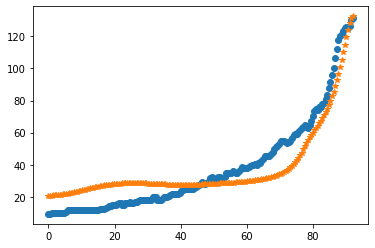

after perturb [9.589903007786958, 87.57190251808186, 23790.95483662108, 0.42996571475901685, 25.63866540073595]
parameters [9.589903007786958, 87.57190251808186, 23790.95483662108, 0.42996571475901685, 25.63866540073595]
after perturb [10.019300773158243, 147.97327457149328, 16688.706933200294, 1.2244318331411312, 32.02905668010395]
parameters [10.019300773158243, 147.97327457149328, 16688.706933200294, 1.2244318331411312, 32.02905668010395]
after perturb [2.298883860998243, 66.4548105562122, 23714.58893565722, 0.34714493127940144, 19.660869574095873]
parameters [2.298883860998243, 66.4548105562122, 23714.58893565722, 0.34714493127940144, 19.660869574095873]
oxigeno [1.04662453e-08 1.04520972e-08 1.04098402e-08 1.03400286e-08
 1.02435654e-08 1.01216720e-08 9.97584844e-09 9.80782835e-09
 9.61952905e-09 9.41300143e-09 9.19038116e-09 8.95384358e-09
 8.70556383e-09 8.44768319e-09 8.18228238e-09 7.91136180e-09
 7.63682863e-09 7.36049020e-09 7.08405301e-09 6.80912642e-09
 6.53723013e-09 6.26

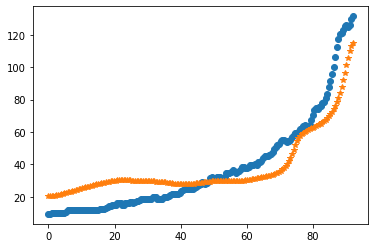

after perturb [3.797829072050439, 169.43827053011188, 19390.920246219735, 1.2451755788336583, 42.092935875112204]
parameters [3.797829072050439, 169.43827053011188, 19390.920246219735, 1.2451755788336583, 42.092935875112204]
after perturb [1.163259690072368, 158.1165836447453, 19312.749463875123, 1.185546688003268, 42.75607773629533]
parameters [1.163259690072368, 158.1165836447453, 19312.749463875123, 1.185546688003268, 42.75607773629533]
after perturb [5.414918052114861, 127.99469455246978, 19083.00407988206, 0.047888860398226374, 30.798822603868235]
parameters [5.414918052114861, 127.99469455246978, 19083.00407988206, 0.047888860398226374, 30.798822603868235]
after perturb [4.803323398102039, 72.44115376402418, 22083.05092951418, 0.5194643342348119, 26.87122449111619]
parameters [4.803323398102039, 72.44115376402418, 22083.05092951418, 0.5194643342348119, 26.87122449111619]
oxigeno [3.91346570e-12 3.91065961e-12 3.90235697e-12 3.88890514e-12
 3.87088448e-12 3.84911103e-12 3.82464083

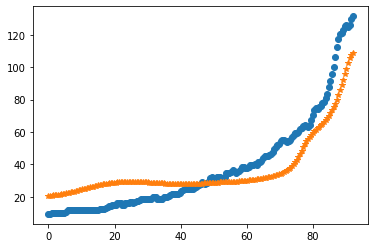

after perturb [9.249578684855761, 154.56148366535754, 22141.0356872206, 1.4207516511236962, 40.655668861301926]
parameters [9.249578684855761, 154.56148366535754, 22141.0356872206, 1.4207516511236962, 40.655668861301926]
after perturb [7.300626715399012, 79.95575167523225, 25401.739455501847, 0.2774281922483164, 29.523407266490505]
parameters [7.300626715399012, 79.95575167523225, 25401.739455501847, 0.2774281922483164, 29.523407266490505]
after perturb [1.797176687181196, 183.38237638794226, 28804.995613088613, 1.9329774456057094, 62.17308015083653]
parameters [1.797176687181196, 183.38237638794226, 28804.995613088613, 1.9329774456057094, 62.17308015083653]
after perturb [0.621754530951907, 192.31433880772425, 22320.531383961927, 0.7573144245183622, 27.530114357257464]
parameters [0.621754530951907, 192.31433880772425, 22320.531383961927, 0.7573144245183622, 27.530114357257464]
after perturb [1.7262133129386763, 103.13488074934811, 25509.685803214474, 0.9133175634378148, 16.9670532908

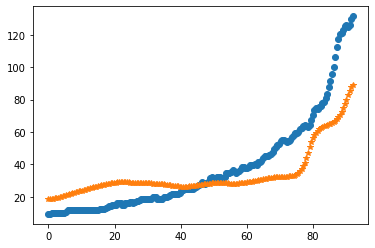

after perturb [4.000287573206021, 175.42578008595962, 16188.186623179656, 1.2920641610651635, 49.481159221123065]
parameters [4.000287573206021, 175.42578008595962, 16188.186623179656, 1.2920641610651635, 49.481159221123065]
after perturb [0.2844012080402418, 167.16983070298252, 17955.95405506822, 1.1832889952281178, 41.2387675768865]
parameters [0.2844012080402418, 167.16983070298252, 17955.95405506822, 1.1832889952281178, 41.2387675768865]
after perturb [4.478652884750595, 142.78647050387806, 21542.97987651477, 0.5567502119972833, 37.86813304243664]
parameters [4.478652884750595, 142.78647050387806, 21542.97987651477, 0.5567502119972833, 37.86813304243664]
oxigeno [1.21956631e-09 1.22672722e-09 1.24829931e-09 1.28455202e-09
 1.33593919e-09 1.40310614e-09 1.48689991e-09 1.58838245e-09
 1.70884727e-09 1.84983954e-09 2.01318003e-09 2.20099324e-09
 2.41574010e-09 2.66025574e-09 2.93779296e-09 3.25207198e-09
 3.60733740e-09 4.00842311e-09 4.46082633e-09 4.97079193e-09
 5.54540827e-09 6.19

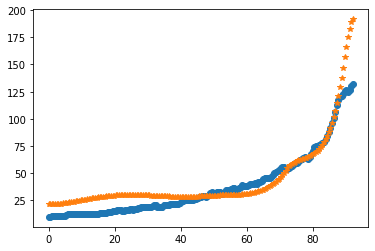

after perturb [3.845961850374035, 175.216398351687, 25394.420660860567, 1.3296960295790383, 44.662500482519164]
parameters [3.845961850374035, 175.216398351687, 25394.420660860567, 1.3296960295790383, 44.662500482519164]
after perturb [2.501868854651835, 150.87711443593687, 21354.08200529697, 0.9531389246204371, 32.171051053511825]
parameters [2.501868854651835, 150.87711443593687, 21354.08200529697, 0.9531389246204371, 32.171051053511825]
after perturb [1.346647970023784, -5.047211252925976, 25868.420752523358, -0.1471388589149652, -7.010946884424161]
parameters [1.346647970023784, -5.047211252925976, 25868.420752523358, -0.1471388589149652, -7.010946884424161]
after perturb [8.126804221041048, 117.13196600909998, 18495.595088066802, 0.55150012874259, 34.44897685653815]
parameters [8.126804221041048, 117.13196600909998, 18495.595088066802, 0.55150012874259, 34.44897685653815]
after perturb [-2.659126420386509, 125.65475170817336, 22793.687328516375, 0.9122610129178037, 42.150652570486

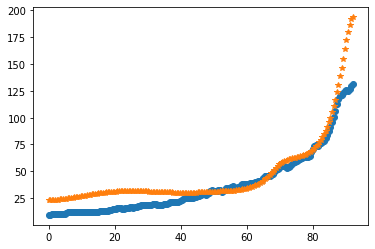

after perturb [6.0507978419327415, 105.47944425871708, 21104.638161622297, 0.6042210469195667, 36.60180694414588]
parameters [6.0507978419327415, 105.47944425871708, 21104.638161622297, 0.6042210469195667, 36.60180694414588]
oxigeno [8.85614003e-12 8.93694611e-12 9.18088203e-12 9.59253373e-12
 1.01796547e-11 1.09533343e-11 1.19282379e-11 1.31229262e-11
 1.45602584e-11 1.62678909e-11 1.82788811e-11 2.06324111e-11
 2.33746474e-11 2.65597564e-11 3.02510996e-11 3.45226351e-11
 3.94605586e-11 4.51652219e-11 5.17533724e-11 5.93607665e-11
 6.81452167e-11 7.82901438e-11 9.00087146e-11 1.03548662e-10
 1.19197898e-10 1.37291046e-10 1.58217045e-10 1.82427996e-10
 2.10449445e-10 2.42892349e-10 2.80466969e-10 3.23999022e-10
 3.74448422e-10 4.32931046e-10 5.00743974e-10 5.79394766e-10
 6.70635386e-10 7.76501509e-10 8.99358042e-10 1.04195180e-09
 1.20747247e-09 1.39962309e-09 1.62270158e-09 1.88169489e-09
 2.18238783e-09 2.53148877e-09 2.93677472e-09 3.40725881e-09
 3.95338364e-09 4.58724419e-09 5.32

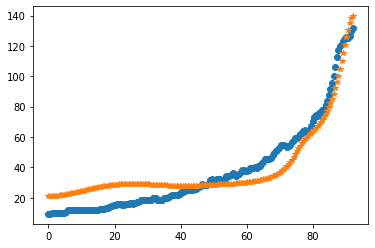

5
after perturb [5.552514806139944, 122.60767005809791, 18622.118012644136, 0.7201560505415721, 39.15898405203812]
parameters [5.552514806139944, 122.60767005809791, 18622.118012644136, 0.7201560505415721, 39.15898405203812]
after perturb [1.5731969299583741, 150.75044751305757, 21074.076775247475, 0.9132264375913957, 31.499734070163456]
parameters [1.5731969299583741, 150.75044751305757, 21074.076775247475, 0.9132264375913957, 31.499734070163456]
after perturb [3.8673462993571954, 111.9832175400305, 18235.180554081377, 0.349186435691539, 35.353031995854195]
parameters [3.8673462993571954, 111.9832175400305, 18235.180554081377, 0.349186435691539, 35.353031995854195]
after perturb [4.491897101961202, 119.47910612505348, 26186.70538098037, 0.9724149493840099, 42.17814710738338]
parameters [4.491897101961202, 119.47910612505348, 26186.70538098037, 0.9724149493840099, 42.17814710738338]
oxigeno [7.18592062e-14 7.27190692e-14 7.53198094e-14 7.97254855e-14
 8.60448946e-14 9.44346852e-14 1.05

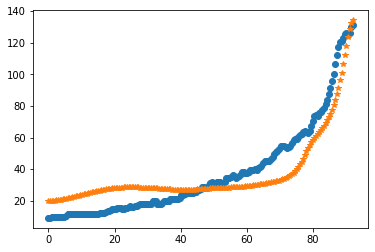

after perturb [5.910664407478946, 45.60917041527483, 16802.767332625248, -0.5663613484489312, 15.480393702979722]
parameters [5.910664407478946, 45.60917041527483, 16802.767332625248, -0.5663613484489312, 15.480393702979722]
after perturb [1.8190108664476972, 119.48983286806164, 17265.49770289913, 0.9129924038793292, 35.07900140290471]
parameters [1.8190108664476972, 119.48983286806164, 17265.49770289913, 0.9129924038793292, 35.07900140290471]
after perturb [2.0388043392814335, 166.19240304351902, 18545.384716261244, 1.1882051463213257, 43.77349434739117]
parameters [2.0388043392814335, 166.19240304351902, 18545.384716261244, 1.1882051463213257, 43.77349434739117]
after perturb [3.7289055325449545, 146.91197347071653, 18422.609988271943, 0.8259886536572406, 27.671608688781497]
parameters [3.7289055325449545, 146.91197347071653, 18422.609988271943, 0.8259886536572406, 27.671608688781497]
after perturb [5.607475066621485, 121.76494699791496, 19147.943006587622, 0.7790222846127767, 34.257

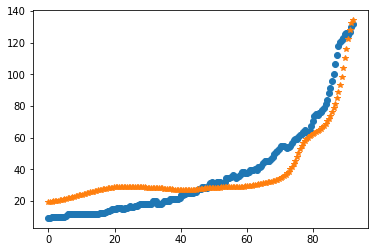

after perturb [5.386862627771426, 135.0672061201237, 21609.55360967232, 0.933730873554343, 35.521563137485636]
parameters [5.386862627771426, 135.0672061201237, 21609.55360967232, 0.933730873554343, 35.521563137485636]
oxigeno [9.64106340e-13 9.73905459e-13 1.00350768e-12 1.05353262e-12
 1.12502974e-12 1.21950407e-12 1.33895299e-12 1.48591525e-12
 1.66353324e-12 1.87563041e-12 2.12680554e-12 2.42254654e-12
 2.76936666e-12 3.17496663e-12 3.64842716e-12 4.20043665e-12
 4.84356038e-12 5.59255818e-12 6.46475909e-12 7.48050300e-12
 8.66366114e-12 1.00422492e-11 1.16491497e-11 1.35229624e-11
 1.57090064e-11 1.82604995e-11 2.12399466e-11 2.47207739e-11
 2.87892522e-11 3.35467584e-11 3.91124359e-11 4.56263209e-11
 5.32530170e-11 6.21860099e-11 7.26527336e-11 8.49205151e-11
 9.93035468e-11 1.16171060e-10 1.35956905e-10 1.59170764e-10
 1.86411293e-10 2.18381484e-10 2.55906649e-10 2.99955446e-10
 3.51664458e-10 4.12366923e-10 4.83626300e-10 5.67275480e-10
 6.65462581e-10 7.80704418e-10 9.15948928

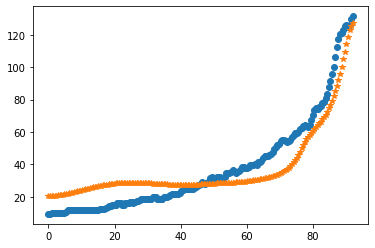

after perturb [5.406394679935289, 125.97707523553336, 25781.94195030855, 0.8205842554293505, 33.79328047032988]
parameters [5.406394679935289, 125.97707523553336, 25781.94195030855, 0.8205842554293505, 33.79328047032988]
oxigeno [2.03431676e-12 2.05425217e-12 2.11445984e-12 2.21615357e-12
 2.36138807e-12 2.55310737e-12 2.79521422e-12 3.09266221e-12
 3.45157283e-12 3.87938054e-12 4.38500912e-12 4.97908403e-12
 5.67418587e-12 6.48515142e-12 7.42942974e-12 8.52750243e-12
 9.80337865e-12 1.12851775e-11 1.30058128e-11 1.50037971e-11
 1.73241864e-11 2.00196891e-11 2.31519678e-11 2.67931664e-11
 3.10277031e-11 3.59543724e-11 4.16888120e-11 4.83663936e-11
 5.61456138e-11 6.52120655e-11 7.57830920e-11 8.81132357e-11
 1.02500616e-10 1.19294392e-10 1.38903485e-10 1.61806784e-10
 1.88565053e-10 2.19834848e-10 2.56384757e-10 2.99114337e-10
 3.49076209e-10 4.07501806e-10 4.75831367e-10 5.55748889e-10
 6.49222809e-10 7.58553376e-10 8.86427769e-10 1.03598424e-09
 1.21088674e-09 1.41541165e-09 1.654548

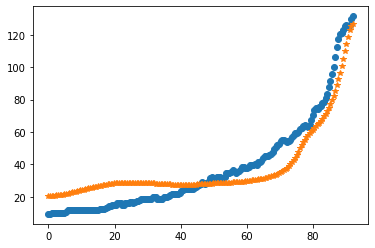

after perturb [1.725902205830053, 80.33360598702616, 21218.13159627099, 0.2668268812814651, 25.450932863634716]
parameters [1.725902205830053, 80.33360598702616, 21218.13159627099, 0.2668268812814651, 25.450932863634716]
oxigeno [5.02124750e-07 5.01598834e-07 5.00028307e-07 4.97434539e-07
 4.93852173e-07 4.89327780e-07 4.83918162e-07 4.77688473e-07
 4.70710277e-07 4.63059701e-07 4.54815730e-07 4.46058724e-07
 4.36869169e-07 4.27326654e-07 4.17509097e-07 4.07492194e-07
 3.97349103e-07 3.87150373e-07 3.76964095e-07 3.66856274e-07
 3.56891384e-07 3.47133055e-07 3.37644837e-07 3.28490980e-07
 3.19737181e-07 3.11451273e-07 3.03703845e-07 2.96568832e-07
 2.90124101e-07 2.84452106e-07 2.79640675e-07 2.75783966e-07
 2.72983659e-07 2.71350376e-07 2.71005360e-07 2.72082385e-07
 2.74729888e-07 2.79113308e-07 2.85417613e-07 2.93850024e-07
 3.04642934e-07 3.18057052e-07 3.34384818e-07 3.53954121e-07
 3.77132413e-07 4.04331271e-07 4.36011530e-07 4.72689072e-07
 5.14941399e-07 5.63415124e-07 6.188345

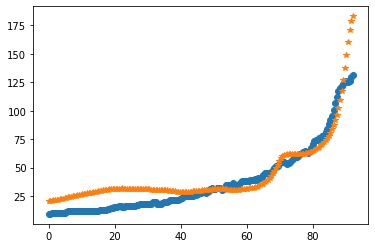

after perturb [1.4667557026601856, 100.1363377520901, 18418.863717984204, 0.836737166740212, 31.147018353578737]
parameters [1.4667557026601856, 100.1363377520901, 18418.863717984204, 0.836737166740212, 31.147018353578737]
after perturb [0.5687512039674634, 124.01289602379279, 19022.915550862126, 0.7738191862474706, 32.04150883260404]
parameters [0.5687512039674634, 124.01289602379279, 19022.915550862126, 0.7738191862474706, 32.04150883260404]
after perturb [4.809561299605134, 93.32531822546963, 23949.378758987594, 0.5713191758845134, 29.208095177636743]
parameters [4.809561299605134, 93.32531822546963, 23949.378758987594, 0.5713191758845134, 29.208095177636743]
oxigeno [3.27747853e-12 3.30707141e-12 3.39646834e-12 3.54753877e-12
 3.76344722e-12 4.04872783e-12 4.40939113e-12 4.85306587e-12
 5.38917920e-12 6.02917986e-12 6.78680971e-12 7.67843051e-12
 8.72341398e-12 9.94460496e-12 1.13688694e-11 1.30277408e-11
 1.49581816e-11 1.72034788e-11 1.98142970e-11 2.28499142e-11
 2.63796744e-11 

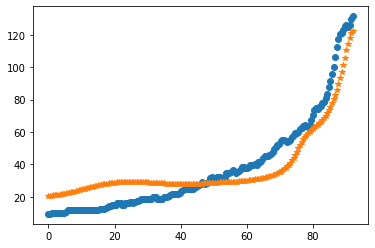

after perturb [1.9015082818808131, 88.56088882039336, 23066.97738030952, 0.4238305620268453, 17.51670158773854]
parameters [1.9015082818808131, 88.56088882039336, 23066.97738030952, 0.4238305620268453, 17.51670158773854]
oxigeno [3.12698266e-10 3.12835915e-10 3.13261561e-10 3.14013282e-10
 3.15154515e-10 3.16774087e-10 3.18986367e-10 3.21931659e-10
 3.25776939e-10 3.30717040e-10 3.36976399e-10 3.44811455e-10
 3.54513789e-10 3.66414102e-10 3.80887123e-10 3.98357572e-10
 4.19307295e-10 4.44283753e-10 4.73910050e-10 5.08896725e-10
 5.50055592e-10 5.98315906e-10 6.54743225e-10 7.20561324e-10
 7.97177608e-10 8.86212484e-10 9.89533234e-10 1.10929302e-09
 1.24797576e-09 1.40844777e-09 1.59401720e-09 1.80850265e-09
 2.05631241e-09 2.34253602e-09 2.67305030e-09 3.05464176e-09
 3.49514775e-09 4.00361869e-09 4.59050362e-09 5.26786161e-09
 6.04960153e-09 6.95175309e-09 7.99277252e-09 9.19388715e-09
 1.05794842e-08 1.21775507e-08 1.40201729e-08 1.61441066e-08
 1.85914296e-08 2.14102931e-08 2.465578

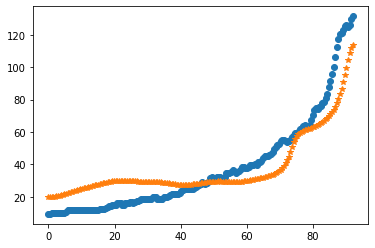

after perturb [5.510067181079521, 56.6703578533936, 36346.89191922151, 0.2030458104177495, 23.07432827969698]
parameters [5.510067181079521, 56.6703578533936, 36346.89191922151, 0.2030458104177495, 23.07432827969698]
after perturb [4.528521347387072, 46.97555307282467, 22822.335095410726, 0.02300952987490973, 27.52662759099036]
parameters [4.528521347387072, 46.97555307282467, 22822.335095410726, 0.02300952987490973, 27.52662759099036]
after perturb [0.3269370364602232, 182.95511328131664, 16480.297893169154, 1.0007147237192413, 43.423113404450014]
parameters [0.3269370364602232, 182.95511328131664, 16480.297893169154, 1.0007147237192413, 43.423113404450014]
after perturb [1.2575263426190264, 132.28455818487458, 21988.661636143566, 0.7155582805956039, 44.944741077655316]
parameters [1.2575263426190264, 132.28455818487458, 21988.661636143566, 0.7155582805956039, 44.944741077655316]
oxigeno [2.43409121e-11 2.45245644e-11 2.50787847e-11 2.60134244e-11
 2.73451057e-11 2.90975319e-11 3.1301

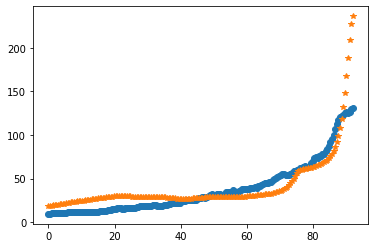

after perturb [-4.082226013708789, 158.09859168604237, 19603.78144558632, 1.2794747347967008, 44.84732134013893]
parameters [-4.082226013708789, 158.09859168604237, 19603.78144558632, 1.2794747347967008, 44.84732134013893]
after perturb [8.884882421256773, 103.40249437814673, 23832.028026724507, 0.656061005392758, 33.94130919812197]
parameters [8.884882421256773, 103.40249437814673, 23832.028026724507, 0.656061005392758, 33.94130919812197]
after perturb [-0.29585211918842624, 63.596992943538694, 20648.30801655758, 0.4500139422212434, 27.308848538219564]
parameters [-0.29585211918842624, 63.596992943538694, 20648.30801655758, 0.4500139422212434, 27.308848538219564]
after perturb [2.0650873720003746, 130.89002309028777, 24048.38409754166, 0.8591843507463759, 41.05771176415445]
parameters [2.0650873720003746, 130.89002309028777, 24048.38409754166, 0.8591843507463759, 41.05771176415445]
oxigeno [1.90445583e-12 1.92207492e-12 1.97528591e-12 2.06515902e-12
 2.19350802e-12 2.36293608e-12 2.57

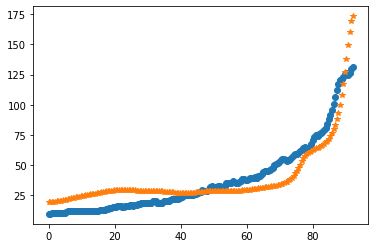

after perturb [5.3832275459162355, 44.3739679630805, 23318.697242543192, 0.40375462629971814, 27.122347681888662]
parameters [5.3832275459162355, 44.3739679630805, 23318.697242543192, 0.40375462629971814, 27.122347681888662]
after perturb [6.1930145495561035, 117.29858110213189, 24369.194035635017, 1.449084903269328, 36.0649104986697]
parameters [6.1930145495561035, 117.29858110213189, 24369.194035635017, 1.449084903269328, 36.0649104986697]
oxigeno [5.58502825e-17 5.68500082e-17 5.98854384e-17 6.50667711e-17
 7.25825291e-17 8.27070699e-17 9.58115496e-17 1.12378818e-16
 1.33022888e-16 1.58513836e-16 1.89809215e-16 2.28093362e-16
 2.74826331e-16 3.31804632e-16 4.01236452e-16 4.85834735e-16
 5.88932293e-16 7.14624125e-16 8.67943371e-16 1.05507889e-15
 1.28364437e-15 1.56301121e-15 1.90472042e-15 2.32299252e-15
 2.83535863e-15 3.46344200e-15 4.23392589e-15 5.17975223e-15
 6.34160649e-15 7.76975689e-15 9.52633275e-15 1.16881464e-14
 1.43501882e-14 1.76299548e-14 2.16728075e-14 2.66586063e-

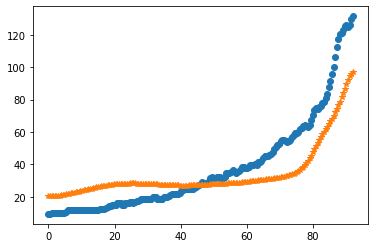

after perturb [2.942505116107127, 193.20792786618688, 25175.992483130653, 2.1168136036422545, 58.19438555687256]
parameters [2.942505116107127, 193.20792786618688, 25175.992483130653, 2.1168136036422545, 58.19438555687256]
after perturb [5.015754880954204, 121.46510720504192, 32210.66959947483, 0.13794691936561998, 37.00522542834626]
parameters [5.015754880954204, 121.46510720504192, 32210.66959947483, 0.13794691936561998, 37.00522542834626]
after perturb [0.33031789802520317, 157.5466168646651, 23751.51761582212, 0.9501999341701618, 39.35027831230782]
parameters [0.33031789802520317, 157.5466168646651, 23751.51761582212, 0.9501999341701618, 39.35027831230782]
after perturb [5.602361752040588, 126.60204999455975, 21556.141104907278, 0.9688127477646331, 36.75518010540265]
parameters [5.602361752040588, 126.60204999455975, 21556.141104907278, 0.9688127477646331, 36.75518010540265]
oxigeno [2.00370386e-13 2.02641752e-13 2.09508555e-13 2.21130312e-13
 2.37777610e-13 2.59839324e-13 2.878330

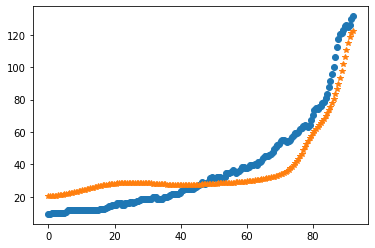

after perturb [-0.2733201839669084, 154.77234484625592, 27889.565475944906, 0.8743778242812904, 48.208092595191204]
parameters [-0.2733201839669084, 154.77234484625592, 27889.565475944906, 0.8743778242812904, 48.208092595191204]
after perturb [-1.5793673859111412, 199.6240940520783, 21445.55128911961, 1.420629884715222, 53.494234812523764]
parameters [-1.5793673859111412, 199.6240940520783, 21445.55128911961, 1.420629884715222, 53.494234812523764]
after perturb [3.1416314067909097, 94.04622262006866, 27348.88335320765, 0.6910839290727644, 26.881918384524397]
parameters [3.1416314067909097, 94.04622262006866, 27348.88335320765, 0.6910839290727644, 26.881918384524397]
oxigeno [2.29067754e-13 2.31683031e-13 2.39591250e-13 2.52981340e-13
 2.72174108e-13 2.97631278e-13 3.29968505e-13 3.69972677e-13
 4.18624010e-13 4.77123527e-13 5.46926689e-13 6.29784134e-13
 7.27790690e-13 8.43444076e-13 9.79715016e-13 1.14013084e-12
 1.32887509e-12 1.55090609e-12 1.81209817e-12 2.11940971e-12
 2.48108338e

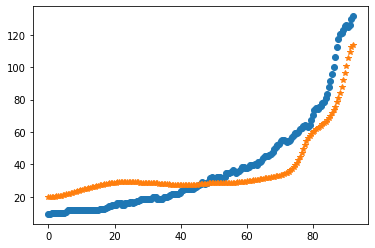

after perturb [2.951336150816334, 115.00796239144948, 18499.37065829711, 0.7373195260358588, 28.982918526482344]
parameters [2.951336150816334, 115.00796239144948, 18499.37065829711, 0.7373195260358588, 28.982918526482344]
after perturb [3.280417790277461, 133.68983712542286, 20362.165253770883, 0.3760634612471411, 39.62690707622731]
parameters [3.280417790277461, 133.68983712542286, 20362.165253770883, 0.3760634612471411, 39.62690707622731]
oxigeno [3.20094496e-08 3.21351408e-08 3.25134666e-08 3.31481989e-08
 3.40456740e-08 3.52148690e-08 3.66675078e-08 3.84181999e-08
 4.04846116e-08 4.28876718e-08 4.56518137e-08 4.88052553e-08
 5.23803228e-08 5.64138183e-08 6.09474383e-08 6.60282485e-08
 7.17092193e-08 7.80498310e-08 8.51167559e-08 9.29846264e-08
 1.01736899e-07 1.11466826e-07 1.22278544e-07 1.34288298e-07
 1.47625804e-07 1.62435785e-07 1.78879670e-07 1.97137497e-07
 2.17410030e-07 2.39921105e-07 2.64920238e-07 2.92685511e-07
 3.23526768e-07 3.57789132e-07 3.95856899e-07 4.38157811e-

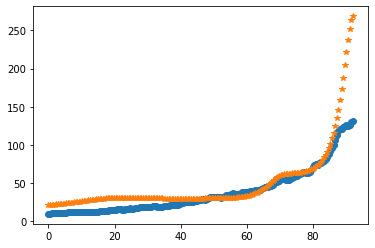

after perturb [-0.5294755358146683, 106.66687354247497, 22875.888964629623, 0.39164799261591976, 26.157608022020845]
parameters [-0.5294755358146683, 106.66687354247497, 22875.888964629623, 0.39164799261591976, 26.157608022020845]
after perturb [-1.3650282077758802, 134.16860325275078, 16332.301042252955, 1.2789855462285529, 39.53934336214254]
parameters [-1.3650282077758802, 134.16860325275078, 16332.301042252955, 1.2789855462285529, 39.53934336214254]
after perturb [2.1358459696847243, 146.97647098880492, 19209.06056600751, 1.5049405493342338, 40.90742711749059]
parameters [2.1358459696847243, 146.97647098880492, 19209.06056600751, 1.5049405493342338, 40.90742711749059]
after perturb [5.3759442525560175, 137.1228553241649, 24718.164478474984, 0.9856714502605243, 35.9227598156935]
parameters [5.3759442525560175, 137.1228553241649, 24718.164478474984, 0.9856714502605243, 35.9227598156935]
oxigeno [5.60200643e-13 5.66080806e-13 5.83848214e-13 6.13886815e-13
 6.56847248e-13 7.13663220e-1

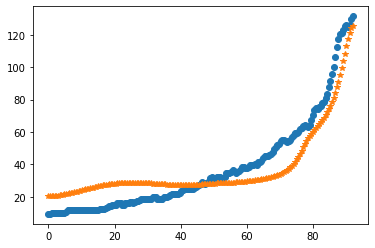

after perturb [-2.683948338277773, 69.78045552283392, 21573.432245224914, 0.3084975165964494, 35.08825726081527]
parameters [-2.683948338277773, 69.78045552283392, 21573.432245224914, 0.3084975165964494, 35.08825726081527]
after perturb [0.6327430183978611, 106.41547076569107, 29468.967340050513, 0.7479835883530623, 33.4919382629944]
parameters [0.6327430183978611, 106.41547076569107, 29468.967340050513, 0.7479835883530623, 33.4919382629944]
after perturb [5.020174630914942, 76.13297254274215, 23687.795521976463, 0.5829738010273949, 25.195027957836174]
parameters [5.020174630914942, 76.13297254274215, 23687.795521976463, 0.5829738010273949, 25.195027957836174]
oxigeno [2.69814923e-13 2.70560768e-13 2.72828214e-13 2.76707727e-13
 2.82352540e-13 2.89982429e-13 2.99889200e-13 3.12444091e-13
 3.28107343e-13 3.47440294e-13 3.71120421e-13 3.99959833e-13
 4.34927854e-13 4.77178447e-13 5.28083387e-13 5.89272269e-13
 6.62680657e-13 7.50607937e-13 8.55786743e-13 9.81466214e-13
 1.13151175e-12 1.

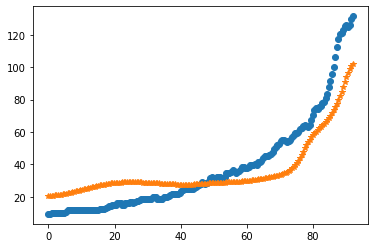

after perturb [4.466170288496248, 54.82988065650045, 24344.3367053044, 0.03366911330292813, 14.061892510581941]
parameters [4.466170288496248, 54.82988065650045, 24344.3367053044, 0.03366911330292813, 14.061892510581941]
oxigeno [ 0.19378991  0.19372718  0.19353938  0.19322766  0.19279394  0.19224084
  0.19157168  0.1907904   0.18990151  0.18891005  0.1878215   0.18664171
  0.18537685  0.18403332  0.18261772  0.18113674  0.17959716  0.17800576
  0.17636927  0.17469438  0.17298766  0.17125554  0.1695043   0.16774004
  0.16596867  0.16419589  0.16242717  0.16066778  0.15892271  0.15719675
  0.1554944   0.15381993  0.15217732  0.15057029  0.1490023   0.14747651
  0.1459958   0.14456276  0.14317971  0.14184868  0.14057141  0.13934936
  0.13818375  0.13707551  0.13602534  0.13503373  0.13410094  0.13322705
  0.13241198  0.13165551  0.13095732  0.13031699  0.12973406  0.12920803
  0.12873841  0.12832475  0.12796662  0.12766369  0.12741572  0.12722258
  0.12708428  0.12700098  0.126973    0.1

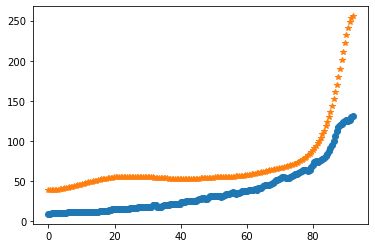

after perturb [-0.7409066206772534, 149.04546849986355, 17239.668567015506, 0.9669968126454842, 46.954684357409356]
parameters [-0.7409066206772534, 149.04546849986355, 17239.668567015506, 0.9669968126454842, 46.954684357409356]
after perturb [1.3818641754526135, 49.80834868256946, 25895.23956681943, 0.2831724574948069, 16.30986771077864]
parameters [1.3818641754526135, 49.80834868256946, 25895.23956681943, 0.2831724574948069, 16.30986771077864]
after perturb [0.025231060485950474, 135.41349704022764, 19092.216202247157, 0.8702362770441004, 36.461337369690085]
parameters [0.025231060485950474, 135.41349704022764, 19092.216202247157, 0.8702362770441004, 36.461337369690085]
after perturb [6.637585196213133, 185.96426753860828, 20872.106428246374, 1.5443484665435614, 48.576184172165995]
parameters [6.637585196213133, 185.96426753860828, 20872.106428246374, 1.5443484665435614, 48.576184172165995]
after perturb [0.4866382607773131, 136.31320665062975, 16364.204663244831, 0.38736852397952914

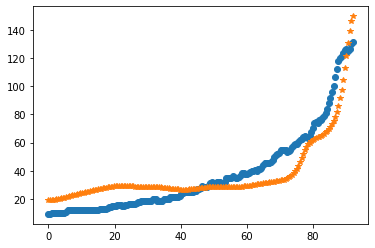

after perturb [2.6704819620957103, 108.05262235644162, 24274.334764220588, 0.7386391229274409, 38.887404544900704]
parameters [2.6704819620957103, 108.05262235644162, 24274.334764220588, 0.7386391229274409, 38.887404544900704]
oxigeno [8.29408051e-13 8.37884226e-13 8.63495308e-13 9.06793792e-13
 9.68716714e-13 1.05061032e-12 1.15426538e-12 1.28196399e-12
 1.43653878e-12 1.62144625e-12 1.84085570e-12 2.09975619e-12
 2.40408420e-12 2.76087540e-12 3.17844448e-12 3.66659804e-12
 4.23688647e-12 4.90290171e-12 5.68062960e-12 6.58886663e-12
 7.64971319e-12 8.88915734e-12 1.03377658e-11 1.20315019e-11
 1.40126929e-11 1.63311754e-11 1.90456478e-11 2.22252712e-11
 2.59515583e-11 3.03206060e-11 3.54457300e-11 4.14605733e-11
 4.85227730e-11 5.68182810e-11 6.65664530e-11 7.80260362e-11
 9.15022050e-11 1.07354821e-10 1.26008113e-10 1.47962008e-10
 1.73805380e-10 2.04231511e-10 2.40056139e-10 2.82238492e-10
 3.31905806e-10 3.90381907e-10 4.59220553e-10 5.40244337e-10
 6.35590151e-10 7.47762337e-10 8.

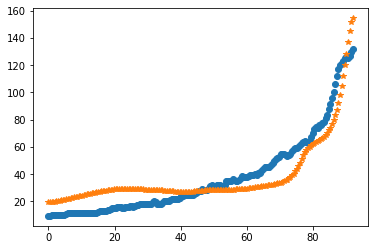

after perturb [2.6441428017027575, 110.75740213777233, 23714.74240463547, 0.3491918956722765, 31.391181529075084]
parameters [2.6441428017027575, 110.75740213777233, 23714.74240463547, 0.3491918956722765, 31.391181529075084]
oxigeno [1.77591495e-08 1.77942469e-08 1.79001206e-08 1.80785187e-08
 1.83323706e-08 1.86658100e-08 1.90842095e-08 1.95942269e-08
 2.02038645e-08 2.09225437e-08 2.17611964e-08 2.27323753e-08
 2.38503851e-08 2.51314387e-08 2.65938379e-08 2.82581861e-08
 3.01476321e-08 3.22881526e-08 3.47088755e-08 3.74424492e-08
 4.05254649e-08 4.39989355e-08 4.79088397e-08 5.23067374e-08
 5.72504646e-08 6.28049159e-08 6.90429256e-08 7.60462558e-08
 8.39067055e-08 9.27273530e-08 1.02623945e-07 1.13726453e-07
 1.26180809e-07 1.40150841e-07 1.55820440e-07 1.73395952e-07
 1.93108852e-07 2.15218692e-07 2.40016363e-07 2.67827688e-07
 2.99017382e-07 3.33993394e-07 3.73211693e-07 4.17181514e-07
 4.66471154e-07 5.21714361e-07 5.83617415e-07 6.52967006e-07
 7.30639014e-07 8.17608338e-07 9.14

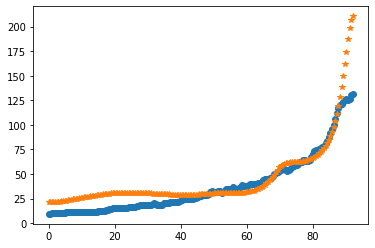

after perturb [6.0869737466440075, 151.1320562967474, 30291.397266834385, 0.514219874890361, 38.827446175050426]
parameters [6.0869737466440075, 151.1320562967474, 30291.397266834385, 0.514219874890361, 38.827446175050426]
after perturb [-0.6095302791177242, 204.56964872403546, 18330.400494532187, 1.796078196456374, 51.742985290832614]
parameters [-0.6095302791177242, 204.56964872403546, 18330.400494532187, 1.796078196456374, 51.742985290832614]
after perturb [2.595266112480888, 49.86803099538875, 28311.08246105634, 0.27835337752342415, 20.80189208762925]
parameters [2.595266112480888, 49.86803099538875, 28311.08246105634, 0.27835337752342415, 20.80189208762925]
after perturb [0.05777123024389241, 154.93375241489153, 21106.77013392344, 0.991549015796203, 41.44993261793565]
parameters [0.05777123024389241, 154.93375241489153, 21106.77013392344, 0.991549015796203, 41.44993261793565]
after perturb [-0.6786532610016227, 162.9490439155989, 12743.001167958562, 1.1336676168403748, 41.86789706

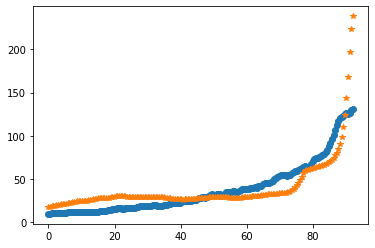

after perturb [2.9210519467287672, 151.63415187445145, 15672.927045248449, 0.7219465256467885, 32.30600256405903]
parameters [2.9210519467287672, 151.63415187445145, 15672.927045248449, 0.7219465256467885, 32.30600256405903]
after perturb [2.3192347281121686, 118.92159060250339, 24033.012706073572, 1.1533224931936004, 41.456510036259466]
parameters [2.3192347281121686, 118.92159060250339, 24033.012706073572, 1.1533224931936004, 41.456510036259466]
oxigeno [4.31553924e-15 4.37398981e-15 4.55100559e-15 4.85163648e-15
 5.28449270e-15 5.86204180e-15 6.60103740e-15 7.52309336e-15
 8.65542212e-15 1.00317615e-14 1.16935210e-14 1.36911869e-14
 1.60860344e-14 1.89522069e-14 2.23792374e-14 2.64751013e-14
 3.13699146e-14 3.72204141e-14 4.42153883e-14 5.25822677e-14
 6.25951248e-14 7.45843952e-14 8.89486913e-14 1.06169166e-13
 1.26826975e-13 1.51624500e-13 1.81411146e-13 2.17214683e-13
 2.60279310e-13 3.12111891e-13 3.74538109e-13 4.49770654e-13
 5.40492023e-13 6.49955061e-13 7.82104973e-13 9.4172

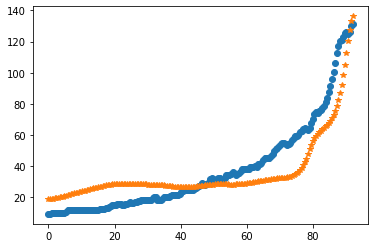

after perturb [0.9041833047691183, 102.8924187573519, 23874.354942909493, 0.9136272799525683, 24.68639195203263]
parameters [0.9041833047691183, 102.8924187573519, 23874.354942909493, 0.9136272799525683, 24.68639195203263]
oxigeno [1.43204821e-14 1.44994273e-14 1.50414285e-14 1.59621348e-14
 1.72881364e-14 1.90577357e-14 2.13220517e-14 2.41465100e-14
 2.76128029e-14 3.18214414e-14 3.68950422e-14 4.29825003e-14
 5.02641712e-14 5.89581558e-14 6.93277370e-14 8.16900114e-14
 9.64258022e-14 1.13991065e-13 1.34930208e-13 1.59892062e-13
 1.89649549e-13 2.25124496e-13 2.67419255e-13 3.17856953e-13
 3.78032070e-13 4.49872746e-13 5.35715823e-13 6.38395224e-13
 7.61344362e-13 9.08713920e-13 1.08550794e-12 1.29774376e-12
 1.55264459e-12 1.85887721e-12 2.22685070e-12 2.66909433e-12
 3.20073380e-12 3.84008423e-12 4.60937581e-12 5.53562509e-12
 6.65166136e-12 7.99731688e-12 9.62079188e-12 1.15802141e-11
 1.39454291e-11 1.68000816e-11 2.02440770e-11 2.43965466e-11
 2.93994606e-11 3.54220591e-11 4.2666

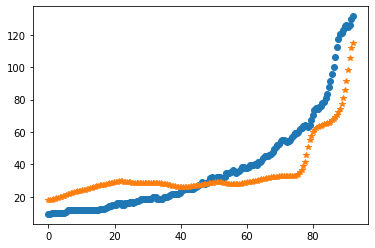

after perturb [5.360580594793131, 192.0114527688351, 16379.353666118881, 1.5242161353957822, 65.3630414884623]
parameters [5.360580594793131, 192.0114527688351, 16379.353666118881, 1.5242161353957822, 65.3630414884623]
after perturb [-0.63283672571979, 129.94110410671158, 22737.119763728017, 0.9432935433018494, 49.886256437763286]
parameters [-0.63283672571979, 129.94110410671158, 22737.119763728017, 0.9432935433018494, 49.886256437763286]
after perturb [8.17224424449373, 90.75306011027021, 22516.541035354636, 0.4897208082700049, 31.191968958984248]
parameters [8.17224424449373, 90.75306011027021, 22516.541035354636, 0.4897208082700049, 31.191968958984248]
after perturb [3.257784299045123, 125.72267566470298, 27557.851454194864, 1.2578123585488152, 47.056722616543034]
parameters [3.257784299045123, 125.72267566470298, 27557.851454194864, 1.2578123585488152, 47.056722616543034]
oxigeno [2.71605551e-15 2.75406036e-15 2.86917664e-15 3.06474725e-15
 3.34647047e-15 3.72259474e-15 4.20420071

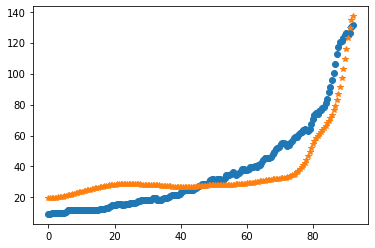

after perturb [2.8179704945889608, 97.37688319145023, 22855.436393889, 1.2976051006260585, 40.78617153684353]
parameters [2.8179704945889608, 97.37688319145023, 22855.436393889, 1.2976051006260585, 40.78617153684353]
oxigeno [9.53823032e-18 9.72020480e-18 1.02732599e-17 1.12191111e-17
 1.25950347e-17 1.44555457e-17 1.68748559e-17 1.99502255e-17
 2.38063661e-17 2.86011018e-17 3.45325563e-17 4.18482079e-17
 5.08562451e-17 6.19397719e-17 7.55745519e-17 9.23511606e-17
 1.13002639e-16 1.38439028e-16 1.69790505e-16 2.08461326e-16
 2.56197278e-16 3.15170135e-16 3.88083418e-16 4.78304934e-16
 5.90032945e-16 7.28504574e-16 9.00257264e-16 1.11345688e-15
 1.37830952e-15 1.70757840e-15 2.11723271e-15 2.62726206e-15
 3.26269871e-15 4.05490021e-15 5.04315835e-15 6.27671651e-15
 7.81729754e-15 9.74226923e-15 1.21486051e-14 1.51578359e-14
 1.89222342e-14 2.36325320e-14 2.95275431e-14 3.69061515e-14
 4.61422369e-14 5.77032473e-14 7.21733022e-14 9.02819255e-14
 1.12939776e-13 1.41283082e-13 1.76728916e-

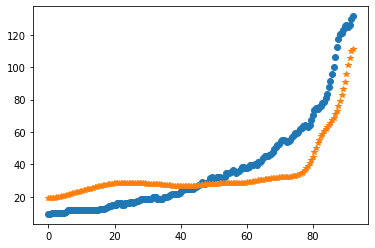

after perturb [5.929601823277286, 93.47734569325581, 23740.115610260418, 0.38463546912378355, 16.463880467561253]
parameters [5.929601823277286, 93.47734569325581, 23740.115610260418, 0.38463546912378355, 16.463880467561253]
oxigeno [1.42373622e-09 1.42539613e-09 1.43042325e-09 1.43896035e-09
 1.45124726e-09 1.46762367e-09 1.48853328e-09 1.51452926e-09
 1.54628119e-09 1.58458377e-09 1.63036737e-09 1.68471071e-09
 1.74885609e-09 1.82422722e-09 1.91245038e-09 2.01537900e-09
 2.13512238e-09 2.27407902e-09 2.43497513e-09 2.62090918e-09
 2.83540311e-09 3.08246130e-09 3.36663825e-09 3.69311610e-09
 4.06779355e-09 4.49738745e-09 4.98954902e-09 5.55299655e-09
 6.19766680e-09 6.93488776e-09 7.77757547e-09 8.74045815e-09
 9.84033139e-09 1.10963484e-08 1.25303499e-08 1.41672389e-08
 1.60354068e-08 1.81672159e-08 2.05995479e-08 2.33744250e-08
 2.65397145e-08 3.01499267e-08 3.42671186e-08 3.89619171e-08
 4.43146776e-08 5.04167949e-08 5.73721859e-08 6.52989684e-08
 7.43313575e-08 8.46218128e-08 9.63

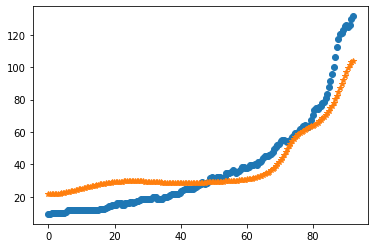

after perturb [1.8956602793783617, 130.7964815404963, 20063.57533286404, 0.7799774246005916, 31.291143463458475]
parameters [1.8956602793783617, 130.7964815404963, 20063.57533286404, 0.7799774246005916, 31.291143463458475]
oxigeno [7.16772560e-12 7.22858004e-12 7.41227920e-12 7.72225747e-12
 8.16432860e-12 8.74682168e-12 9.48077433e-12 1.03801862e-11
 1.14623371e-11 1.27481761e-11 1.42627887e-11 1.60359519e-11
 1.81027887e-11 2.05045363e-11 2.32894448e-11 2.65138277e-11
 3.02432900e-11 3.45541659e-11 3.95352041e-11 4.52895487e-11
 5.19370697e-11 5.96171087e-11 6.84917109e-11 7.87494276e-11
 9.06097777e-11 1.04328471e-10 1.20203505e-10 1.38582273e-10
 1.59869828e-10 1.84538500e-10 2.13139088e-10 2.46313896e-10
 2.84811957e-10 3.29506804e-10 3.81417259e-10 4.41731696e-10
 5.11836344e-10 5.93348170e-10 6.88152966e-10 7.98449257e-10
 9.26798732e-10 1.07618397e-09 1.25007434e-09 1.45250121e-09
 1.68814381e-09 1.96242739e-09 2.28163589e-09 2.65304179e-09
 3.08505605e-09 3.58740236e-09 4.1713

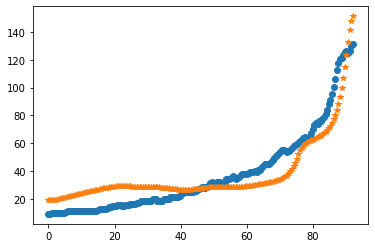

after perturb [5.315033260992552, 81.15802707150934, 21122.69466056815, 1.2464910088027001, 27.893240518959153]
parameters [5.315033260992552, 81.15802707150934, 21122.69466056815, 1.2464910088027001, 27.893240518959153]
oxigeno [3.36605462e-19 3.44524603e-19 3.68657491e-19 4.10149647e-19
 4.70975077e-19 5.54037209e-19 6.63317900e-19 8.04082712e-19
 9.83153830e-19 1.20926575e-18 1.49352359e-18 1.84998961e-18
 2.29643106e-18 2.85527143e-18 3.55479929e-18 4.43070360e-18
 5.52802354e-18 6.90362520e-18 8.62934847e-18 1.07960070e-17
 1.35184748e-17 1.69421570e-17 2.12512258e-17 2.66791066e-17
 3.35218346e-17 4.21550725e-17 5.30558004e-17 6.68299654e-17
 8.42477368e-17 1.06288463e-16 1.34198007e-16 1.69561861e-16
 2.14398403e-16 2.71277791e-16 3.43473574e-16 4.35155936e-16
 5.51637988e-16 6.99689552e-16 8.87936833e-16 1.12737129e-15
 1.43199736e-15 1.81965646e-15 2.31307512e-15 2.94119730e-15
 3.74087755e-15 4.75903173e-15 6.05536789e-15 7.70585238e-15
 9.80710742e-15 1.24819883e-14 1.588665

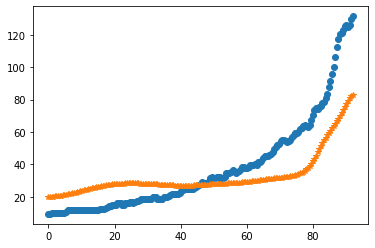

after perturb [-3.5831571358232672, 208.0832301155727, 24068.205409000762, 0.971423792279742, 44.2233607144567]
parameters [-3.5831571358232672, 208.0832301155727, 24068.205409000762, 0.971423792279742, 44.2233607144567]
after perturb [0.878013645502332, 128.1580563664713, 22892.095783964513, 0.54261623616362, 32.23576897373805]
parameters [0.878013645502332, 128.1580563664713, 22892.095783964513, 0.54261623616362, 32.23576897373805]
oxigeno [4.59102579e-10 4.61863248e-10 4.70190266e-10 4.84218626e-10
 5.04173312e-10 5.30369701e-10 5.63214962e-10 6.03211179e-10
 6.50961051e-10 7.07176913e-10 7.72693596e-10 8.48485203e-10
 9.35685332e-10 1.03560980e-09 1.14978063e-09 1.27995014e-09
 1.42812461e-09 1.59658807e-09 1.78792796e-09 2.00506601e-09
 2.25129854e-09 2.53035086e-09 2.84644992e-09 3.20441762e-09
 3.60978459e-09 4.06892150e-09 4.58918182e-09 5.17904908e-09
 5.84828241e-09 6.60805811e-09 7.47111151e-09 8.45189079e-09
 9.56674183e-09 1.08341472e-08 1.22750423e-08 1.39132276e-08
 1.57

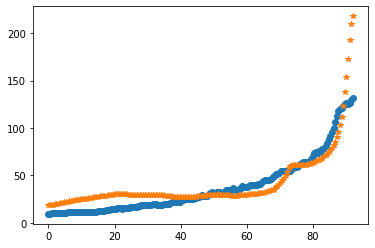

after perturb [-1.460443895875744, 185.61109005601068, 18129.91058034355, 1.1806489986117072, 39.40330975365628]
parameters [-1.460443895875744, 185.61109005601068, 18129.91058034355, 1.1806489986117072, 39.40330975365628]
after perturb [5.514836211288727, 75.12787660977615, 18551.418156105614, 0.20729423842738373, 23.58817900790632]
parameters [5.514836211288727, 75.12787660977615, 18551.418156105614, 0.20729423842738373, 23.58817900790632]
after perturb [3.3717388307754503, 41.9424961203534, 22767.1675681841, -0.2133424684717815, 10.020493975791947]
parameters [3.3717388307754503, 41.9424961203534, 22767.1675681841, -0.2133424684717815, 10.020493975791947]
after perturb [1.0889972845642522, 167.1484429491229, 22042.173583498505, 0.8466555054627175, 44.09045824310266]
parameters [1.0889972845642522, 167.1484429491229, 22042.173583498505, 0.8466555054627175, 44.09045824310266]
after perturb [0.5530038049969959, 110.3833108257902, 26456.940391104203, 0.5000907728402791, 32.3742842005230

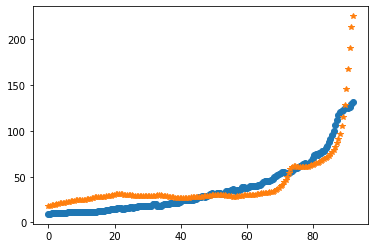

after perturb [1.2656943821477455, 149.8103354504159, 19453.690934726605, 1.487508346963439, 44.1419942437219]
parameters [1.2656943821477455, 149.8103354504159, 19453.690934726605, 1.487508346963439, 44.1419942437219]
after perturb [4.301040130161113, 142.3879160310041, 28604.80397963899, 1.2294503763297895, 40.91057912765399]
parameters [4.301040130161113, 142.3879160310041, 28604.80397963899, 1.2294503763297895, 40.91057912765399]
oxigeno [3.63749794e-14 3.68161368e-14 3.81506592e-14 4.04120218e-14
 4.36571081e-14 4.79678821e-14 5.34538006e-14 6.02550387e-14
 6.85466287e-14 7.85436396e-14 9.05075581e-14 1.04754071e-13
 1.21662492e-13 1.41687133e-13 1.65370983e-13 1.93362126e-13
 2.26433431e-13 2.65506156e-13 3.11678224e-13 3.66258096e-13
 4.30805357e-13 5.07179338e-13 5.97597382e-13 7.04704669e-13
 8.31657889e-13 9.82225538e-13 1.16090811e-12 1.37308214e-12
 1.62517278e-12 1.92486056e-12 2.28132901e-12 2.70556104e-12
 3.21069377e-12 3.81244288e-12 4.52960993e-12 5.38468872e-12
 6.40

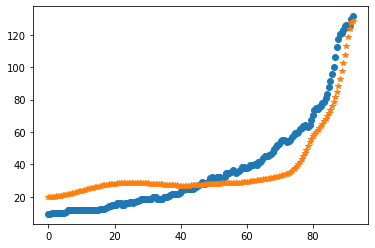

after perturb [-0.7508283391712824, 112.13850669856188, 30379.493969189127, 0.445132468470233, 24.683537146216274]
parameters [-0.7508283391712824, 112.13850669856188, 30379.493969189127, 0.445132468470233, 24.683537146216274]
after perturb [5.959920286466014, 79.39592587279124, 20210.46190498879, 0.5579036235333974, 24.13792322097675]
parameters [5.959920286466014, 79.39592587279124, 20210.46190498879, 0.5579036235333974, 24.13792322097675]
oxigeno [8.04716496e-13 8.07737489e-13 8.16896462e-13 8.32483692e-13
 8.54990721e-13 8.85122240e-13 9.23813249e-13 9.72252066e-13
 1.03190988e-12 1.10457782e-12 1.19241261e-12 1.29799236e-12
 1.42438401e-12 1.57522465e-12 1.75481901e-12 1.96825616e-12
 2.22154884e-12 2.52179953e-12 2.87739826e-12 3.29825795e-12
 3.79609426e-12 4.38475819e-12 5.08063124e-12 5.90309476e-12
 6.87508723e-12 8.02376588e-12 9.38129190e-12 1.09857622e-11
 1.28823146e-11 1.51244390e-11 1.77755310e-11 2.09107346e-11
 2.46191241e-11 2.90062890e-11 3.41973944e-11 4.03408020e-

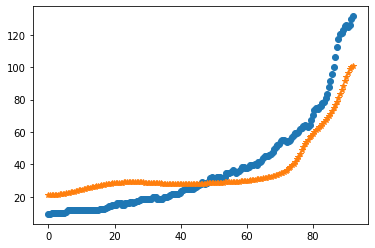

after perturb [6.63945053451994, 89.72598982889585, 32173.885157101722, 0.1913259419182991, 38.371040683399144]
parameters [6.63945053451994, 89.72598982889585, 32173.885157101722, 0.1913259419182991, 38.371040683399144]
after perturb [2.6841145193085856, 102.7645542747124, 22689.89779042389, 0.661617920280615, 24.63520027286626]
parameters [2.6841145193085856, 102.7645542747124, 22689.89779042389, 0.661617920280615, 24.63520027286626]
oxigeno [1.75725776e-12 1.77462652e-12 1.82709530e-12 1.91576088e-12
 2.04248228e-12 2.20992796e-12 2.42164343e-12 2.68214052e-12
 2.99701049e-12 3.37306342e-12 3.81849728e-12 4.34310061e-12
 4.95849397e-12 5.67841604e-12 6.51906201e-12 7.49948287e-12
 8.64205643e-12 9.97304277e-12 1.15232393e-11 1.33287532e-11
 1.54319130e-11 1.78823439e-11 2.07382365e-11 2.40678435e-11
 2.79512444e-11 3.24824268e-11 3.77717380e-11 4.39487729e-11
 5.11657737e-11 5.96016310e-11 6.94665897e-11 8.10077810e-11
 9.45157239e-11 1.10331958e-10 1.28858002e-10 1.50565849e-10
 1.

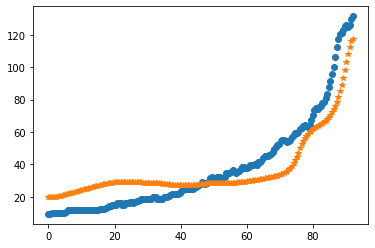

after perturb [2.128562716516199, 93.54116181262299, 26900.58751180571, 1.0043510846833448, 30.383168816811242]
parameters [2.128562716516199, 93.54116181262299, 26900.58751180571, 1.0043510846833448, 30.383168816811242]
oxigeno [4.89457762e-16 4.97168814e-16 5.20555089e-16 5.60385834e-16
 6.17976481e-16 6.95239947e-16 7.94761039e-16 9.19896736e-16
 1.07490610e-15 1.26511474e-15 1.49712021e-15 1.77904626e-15
 2.12085602e-15 2.53473645e-15 3.03556959e-15 3.64150980e-15
 4.37469063e-15 5.26209114e-15 6.33659834e-15 7.63831143e-15
 9.21614458e-15 1.11297981e-14 1.34521842e-14 1.62724134e-14
 1.96994710e-14 2.38667427e-14 2.89375834e-14 3.51121689e-14
 4.26359217e-14 5.18098743e-14 6.30034137e-14 7.66699578e-14
 9.33662416e-14 1.13776045e-13 1.38739387e-13 1.69288416e-13
 2.06691528e-13 2.52507496e-13 3.08651825e-13 3.77477932e-13
 4.61876294e-13 5.65395335e-13 6.92388585e-13 8.48193597e-13
 1.03934932e-12 1.27386004e-12 1.56151600e-12 1.91428287e-12
 2.34677542e-12 2.87683394e-12 3.526226

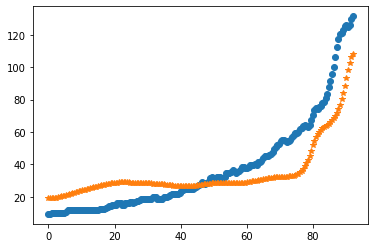

after perturb [1.0645407038703987, 162.07494969105326, 20665.846476789007, 0.7314561659549873, 37.30644242309287]
parameters [1.0645407038703987, 162.07494969105326, 20665.846476789007, 0.7314561659549873, 37.30644242309287]
after perturb [1.7110015349230872, 32.15318156576172, 25589.980385073563, 0.231200366634838, 4.736428055530805]
parameters [1.7110015349230872, 32.15318156576172, 25589.980385073563, 0.231200366634838, 4.736428055530805]
after perturb [3.883035635372451, 136.46510736399554, 25038.43172961916, 0.9935517797558323, 51.819596418727016]
parameters [3.883035635372451, 136.46510736399554, 25038.43172961916, 0.9935517797558323, 51.819596418727016]
after perturb [0.2425403519026934, 95.13097663365156, 25449.69586296549, 0.634209502705563, 40.182973839809165]
parameters [0.2425403519026934, 95.13097663365156, 25449.69586296549, 0.634209502705563, 40.182973839809165]
oxigeno [1.01087544e-12 1.01960205e-12 1.04613456e-12 1.09149914e-12
 1.15731455e-12 1.24569539e-12 1.35917299

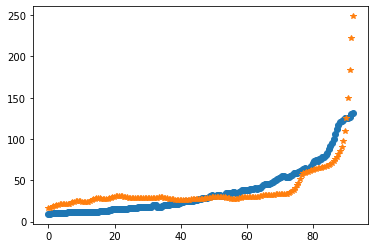

after perturb [2.0382841780871455, 83.434527349593, 14687.098667873295, 0.4838598947017427, 29.94120247432649]
parameters [2.0382841780871455, 83.434527349593, 14687.098667873295, 0.4838598947017427, 29.94120247432649]
after perturb [7.412203953482437, 139.66913182353866, 17725.16431173765, 0.9905014894491297, 37.924975974493336]
parameters [7.412203953482437, 139.66913182353866, 17725.16431173765, 0.9905014894491297, 37.924975974493336]
after perturb [5.007352643148373, 133.75576813630997, 24475.785158460574, 1.270538826180442, 41.494675520361504]
parameters [5.007352643148373, 133.75576813630997, 24475.785158460574, 1.270538826180442, 41.494675520361504]
oxigeno [7.13613218e-15 7.23262131e-15 7.52476045e-15 8.02064926e-15
 8.73407173e-15 9.68493310e-15 1.08998921e-14 1.24132101e-14
 1.42678460e-14 1.65168342e-14 1.92249928e-14 2.24710215e-14
 2.63500608e-14 3.09768012e-14 3.64892520e-14 4.30533005e-14
 5.08682218e-14 6.01733346e-14 7.12560378e-14 8.44615144e-14
 1.00204448e-13 1.1898

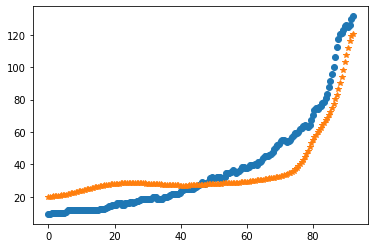

after perturb [4.311416849751142, 94.72531431244353, 22984.253746974675, 0.3228813911535664, 19.609993373435998]
parameters [4.311416849751142, 94.72531431244353, 22984.253746974675, 0.3228813911535664, 19.609993373435998]
oxigeno [2.68472952e-08 2.68436479e-08 2.68331137e-08 2.68169160e-08
 2.67970930e-08 2.67764990e-08 2.67588054e-08 2.67485052e-08
 2.67509217e-08 2.67722229e-08 2.68194427e-08 2.69005132e-08
 2.70243075e-08 2.72006969e-08 2.74406236e-08 2.77561917e-08
 2.81607789e-08 2.86691703e-08 2.92977182e-08 3.00645290e-08
 3.09896821e-08 3.20954818e-08 3.34067483e-08 3.49511500e-08
 3.67595827e-08 3.88666011e-08 4.13109083e-08 4.41359091e-08
 4.73903371e-08 5.11289607e-08 5.54133798e-08 6.03129225e-08
 6.59056532e-08 7.22795054e-08 7.95335519e-08 8.77794299e-08
 9.71429362e-08 1.07765813e-07 1.19807745e-07 1.33448591e-07
 1.48890876e-07 1.66362580e-07 1.86120244e-07 2.08452441e-07
 2.33683659e-07 2.62178628e-07 2.94347161e-07 3.30649568e-07
 3.71602700e-07 4.17786719e-07 4.6985

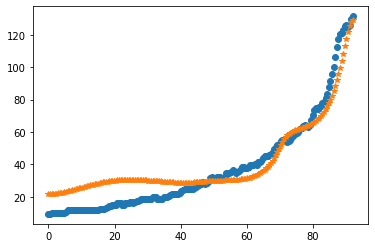

6
after perturb [2.4420945815377935, 108.52298507291218, 22245.528305768, 0.10085549439563013, 20.919132364945145]
parameters [2.4420945815377935, 108.52298507291218, 22245.528305768, 0.10085549439563013, 20.919132364945145]
oxigeno [2.63513308e-03 2.63408250e-03 2.63094140e-03 2.62574146e-03
 2.61853463e-03 2.60939187e-03 2.59840152e-03 2.58566738e-03
 2.57130659e-03 2.55544738e-03 2.53822689e-03 2.51978904e-03
 2.50028261e-03 2.47985951e-03 2.45867335e-03 2.43687829e-03
 2.41462822e-03 2.39207614e-03 2.36937394e-03 2.34667232e-03
 2.32412090e-03 2.30186855e-03 2.28006369e-03 2.25885475e-03
 2.23839056e-03 2.21882072e-03 2.20029595e-03 2.18296838e-03
 2.16699176e-03 2.15252171e-03 2.13971591e-03 2.12873430e-03
 2.11973934e-03 2.11289626e-03 2.10837334e-03 2.10634226e-03
 2.10697833e-03 2.11046091e-03 2.11697360e-03 2.12670453e-03
 2.13984661e-03 2.15659775e-03 2.17716112e-03 2.20174541e-03
 2.23056525e-03 2.26384172e-03 2.30180294e-03 2.34468501e-03
 2.39273294e-03 2.44620195e-03 2.50

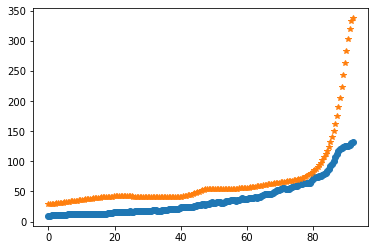

after perturb [2.5771563437470206, 75.91594871452774, 26466.478745249544, 0.486032689384895, 13.01879927526489]
parameters [2.5771563437470206, 75.91594871452774, 26466.478745249544, 0.486032689384895, 13.01879927526489]
oxigeno [1.46336934e-11 1.46228216e-11 1.45906938e-11 1.45387685e-11
 1.44694671e-11 1.43861609e-11 1.42931588e-11 1.41956992e-11
 1.40999508e-11 1.40130288e-11 1.39430321e-11 1.38991064e-11
 1.38915404e-11 1.39319000e-11 1.40332072e-11 1.42101700e-11
 1.44794702e-11 1.48601176e-11 1.53738800e-11 1.60458010e-11
 1.69048180e-11 1.79844987e-11 1.93239141e-11 2.09686740e-11
 2.29721516e-11 2.53969325e-11 2.83165273e-11 3.18173967e-11
 3.60013441e-11 4.09883422e-11 4.69198725e-11 5.39628678e-11
 6.23143659e-11 7.22069998e-11 8.39154692e-11 9.77641628e-11
 1.14136126e-10 1.33483596e-10 1.56340369e-10 1.83336282e-10
 2.15214165e-10 2.52849652e-10 2.97274308e-10 3.49702618e-10
 4.11563468e-10 4.84536866e-10 5.70596809e-10 6.72061334e-10
 7.91651046e-10 9.32557588e-10 1.098523

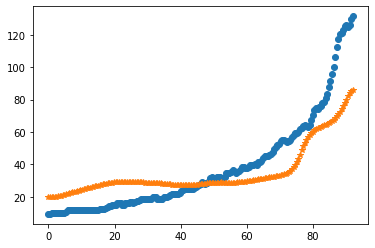

after perturb [3.412897689680782, 71.8500059097648, 26480.639110488242, 0.237397967104039, 31.295086135410216]
parameters [3.412897689680782, 71.8500059097648, 26480.639110488242, 0.237397967104039, 31.295086135410216]
oxigeno [2.20024687e-06 2.19813821e-06 2.19183218e-06 2.18138805e-06
 2.16690310e-06 2.14851028e-06 2.12637525e-06 2.10069269e-06
 2.07168228e-06 2.03958433e-06 2.00465532e-06 1.96716350e-06
 1.92738476e-06 1.88559870e-06 1.84208525e-06 1.79712164e-06
 1.75097997e-06 1.70392523e-06 1.65621379e-06 1.60809243e-06
 1.55979763e-06 1.51155536e-06 1.46358107e-06 1.41607991e-06
 1.36924727e-06 1.32326934e-06 1.27832393e-06 1.23458133e-06
 1.19220536e-06 1.15135446e-06 1.11218298e-06 1.07484256e-06
 1.03948363e-06 1.00625715e-06 9.75316442e-07 9.46819275e-07
 9.20930160e-07 8.97822864e-07 8.77683211e-07 8.60712153e-07
 8.47129172e-07 8.37176029e-07 8.31120883e-07 8.29262848e-07
 8.31936996e-07 8.39519878e-07 8.52435610e-07 8.71162580e-07
 8.96240857e-07 9.28280377e-07 9.67970013

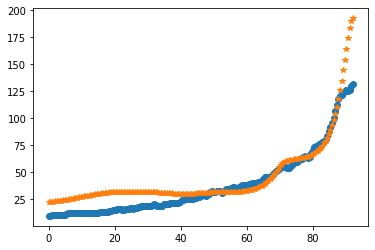

after perturb [-0.6584349788866355, 119.2814160283369, 18651.461368434935, 1.1790560017727294, 39.2543407130049]
parameters [-0.6584349788866355, 119.2814160283369, 18651.461368434935, 1.1790560017727294, 39.2543407130049]
after perturb [-0.41119248134237396, 147.4964793790575, 28586.932488398612, 0.6826506552351276, 30.796558624765957]
parameters [-0.41119248134237396, 147.4964793790575, 28586.932488398612, 0.6826506552351276, 30.796558624765957]
after perturb [4.896174223957553, 93.28228459717091, 25816.047347795407, 0.6297048235986251, 25.208618310422345]
parameters [4.896174223957553, 93.28228459717091, 25816.047347795407, 0.6297048235986251, 25.208618310422345]
oxigeno [7.73977564e-13 7.82239275e-13 8.07210202e-13 8.49452494e-13
 9.09919055e-13 9.89977985e-13 1.09144770e-12 1.21664369e-12
 1.36843809e-12 1.55033384e-12 1.76655520e-12 2.02215729e-12
 2.32315746e-12 2.67669221e-12 3.09120385e-12 3.57666212e-12
 4.14482679e-12 4.80955862e-12 5.58718715e-12 6.49694579e-12
 7.56148594e

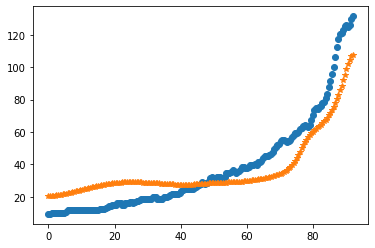

after perturb [7.33962231507009, 132.411618716273, 26244.832949420128, 0.1323745157790266, 26.251255134141665]
parameters [7.33962231507009, 132.411618716273, 26244.832949420128, 0.1323745157790266, 26.251255134141665]
after perturb [-2.000856276015297, 91.28139640644929, 17327.505912462013, 0.23295099690121357, 28.680317160032487]
parameters [-2.000856276015297, 91.28139640644929, 17327.505912462013, 0.23295099690121357, 28.680317160032487]
after perturb [4.061467553514559, 79.43732387038321, 18231.889316698365, 0.23942417862262289, 16.43897969579464]
parameters [4.061467553514559, 79.43732387038321, 18231.889316698365, 0.23942417862262289, 16.43897969579464]
after perturb [4.632699800291012, 93.95187034370386, 18053.276649188323, 0.7237642480961001, 26.523109416775583]
parameters [4.632699800291012, 93.95187034370386, 18053.276649188323, 0.7237642480961001, 26.523109416775583]
after perturb [6.23105613964027, 61.44405412157087, 23217.766814916282, 1.1359479607722236, 25.7184004714264

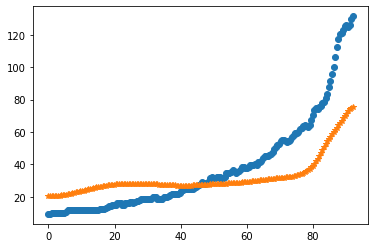

after perturb [2.688258777945451, 114.62303711190656, 26545.73574994175, 0.6729594479489001, 27.824289646373845]
parameters [2.688258777945451, 114.62303711190656, 26545.73574994175, 0.6729594479489001, 27.824289646373845]
oxigeno [7.32029591e-12 7.38497789e-12 7.58023838e-12 7.90974949e-12
 8.37972655e-12 8.99907271e-12 9.77958495e-12 1.07362254e-11
 1.18874636e-11 1.32556954e-11 1.48677490e-11 1.67554875e-11
 1.89565212e-11 2.15150480e-11 2.44828381e-11 2.79203903e-11
 3.18982853e-11 3.64987704e-11 4.18176165e-11 4.79662919e-11
 5.50745089e-11 6.32932078e-11 7.27980506e-11 8.37935125e-11
 9.65176705e-11 1.11247805e-10 1.28306950e-10 1.48071540e-10
 1.70980353e-10 1.97544933e-10 2.28361758e-10 2.64126422e-10
 3.05650160e-10 3.53879092e-10 4.09916598e-10 4.75049332e-10
 5.50777398e-10 6.38849334e-10 7.41302587e-10 8.60510285e-10
 9.99235207e-10 1.16069200e-09 1.34861881e-09 1.56735978e-09
 1.82195997e-09 2.11827471e-09 2.46309557e-09 2.86429578e-09
 3.33099811e-09 3.87376907e-09 4.5048

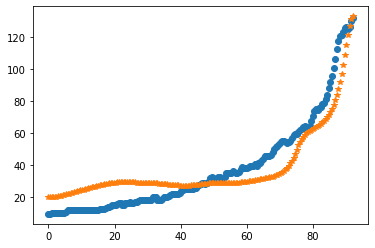

after perturb [0.5413251915966704, 122.30303294695743, 21374.571969644963, 0.7111772357699675, 40.93386624721657]
parameters [0.5413251915966704, 122.30303294695743, 21374.571969644963, 0.7111772357699675, 40.93386624721657]
oxigeno [8.93660389e-12 9.00699480e-12 9.21987651e-12 9.58034431e-12
 1.00967948e-11 1.07808173e-11 1.16471075e-11 1.27134666e-11
 1.40009557e-11 1.55342799e-11 1.73424622e-11 1.94598329e-11
 2.19273048e-11 2.47938328e-11 2.81179067e-11 3.19689120e-11
 3.64282523e-11 4.15902368e-11 4.75628833e-11 5.44689165e-11
 6.24473358e-11 7.16559737e-11 8.22754753e-11 9.45150720e-11
 1.08620364e-10 1.24883000e-10 1.43651672e-10 1.65343371e-10
 1.90453645e-10 2.19564934e-10 2.53353025e-10 2.92593052e-10
 3.38167781e-10 3.91081581e-10 4.52483150e-10 5.23698903e-10
 6.06277445e-10 7.02044387e-10 8.13166057e-10 9.42220156e-10
 1.09227053e-09 1.26694199e-09 1.47049037e-09 1.70786436e-09
 1.98476006e-09 2.30767662e-09 2.68398904e-09 3.12205888e-09
 3.63140061e-09 4.22291141e-09 4.90

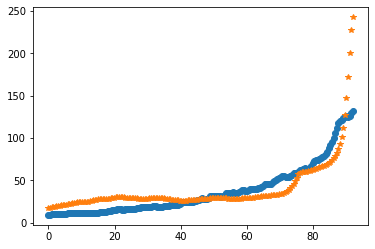

after perturb [3.680940019789562, 153.31332141985496, 18791.200210970273, 0.15108006495442539, 29.49893663561212]
parameters [3.680940019789562, 153.31332141985496, 18791.200210970273, 0.15108006495442539, 29.49893663561212]
after perturb [7.797437072079961, 174.7035550908108, 16406.847475637845, 1.5958743905539126, 49.935159432420605]
parameters [7.797437072079961, 174.7035550908108, 16406.847475637845, 1.5958743905539126, 49.935159432420605]
after perturb [3.3919560676043368, 139.72150369805743, 24496.35898380861, 0.8247328730078403, 40.58185421455252]
parameters [3.3919560676043368, 139.72150369805743, 24496.35898380861, 0.8247328730078403, 40.58185421455252]
oxigeno [8.58739667e-12 8.66028197e-12 8.88024643e-12 9.25124489e-12
 9.77996675e-12 1.04759849e-11 1.13519682e-11 1.24239619e-11
 1.37117410e-11 1.52392451e-11 1.70351020e-11 1.91332530e-11
 2.15736923e-11 2.44033382e-11 2.76770545e-11 3.14588470e-11
 3.58232620e-11 4.08570209e-11 4.66609286e-11 5.33521023e-11
 6.10665731e-11 

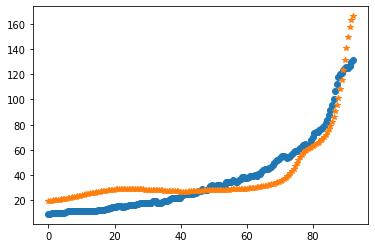

after perturb [2.5638599061774525, 80.30047559451603, 25796.48615246611, 0.25037180299575934, 26.878960777756372]
parameters [2.5638599061774525, 80.30047559451603, 25796.48615246611, 0.25037180299575934, 26.878960777756372]
oxigeno [1.09291165e-06 1.09188179e-06 1.08880358e-06 1.08371079e-06
 1.07665866e-06 1.06772240e-06 1.05699524e-06 1.04458608e-06
 1.03061698e-06 1.01522048e-06 9.98537030e-07 9.80712483e-07
 9.61895870e-07 9.42237452e-07 9.21887118e-07 9.00993148e-07
 8.79701343e-07 8.58154507e-07 8.36492252e-07 8.14851081e-07
 7.93364717e-07 7.72164620e-07 7.51380655e-07 7.31141881e-07
 7.11577420e-07 6.92817413e-07 6.74994045e-07 6.58242650e-07
 6.42702932e-07 6.28520289e-07 6.15847313e-07 6.04845450e-07
 5.95686883e-07 5.88556628e-07 5.83654895e-07 5.81199715e-07
 5.81429848e-07 5.84608019e-07 5.91024474e-07 6.01000906e-07
 6.14894777e-07 6.33104073e-07 6.56072550e-07 6.84295510e-07
 7.18326191e-07 7.58782834e-07 8.06356520e-07 8.61819882e-07
 9.26036813e-07 9.99973299e-07 1.08

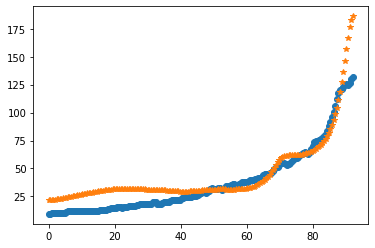

after perturb [1.7001168751340625, 167.61788908998972, 18861.58042477443, 1.2781656343787389, 36.998448912146486]
parameters [1.7001168751340625, 167.61788908998972, 18861.58042477443, 1.2781656343787389, 36.998448912146486]
after perturb [2.0292196416969066, 119.33368318423234, 20145.86864158387, 1.1980915738824667, 40.27131647865678]
parameters [2.0292196416969066, 119.33368318423234, 20145.86864158387, 1.1980915738824667, 40.27131647865678]
oxigeno [2.42692161e-15 2.46060463e-15 2.56264190e-15 2.73603360e-15
 2.98589950e-15 3.31966196e-15 3.74731023e-15 4.28175445e-15
 4.93928107e-15 5.74012508e-15 6.70917874e-15 7.87686141e-15
 9.28018144e-15 1.09640280e-14 1.29827397e-14 1.54020083e-14
 1.83011885e-14 2.17761031e-14 2.59424526e-14 3.09399658e-14
 3.69374563e-14 4.41389914e-14 5.27914207e-14 6.31935657e-14
 7.57074362e-14 9.07719117e-14 1.08919420e-13 1.30796259e-13
 1.57187341e-13 1.89046323e-13 2.27532299e-13 2.74054489e-13
 3.30326705e-13 3.98433728e-13 4.80912241e-13 5.80849429

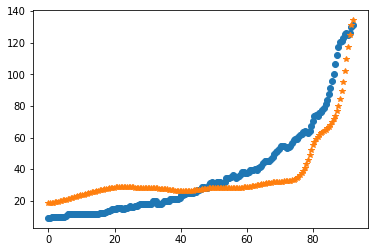

after perturb [1.0239106043044486, 112.72487587500112, 20712.751931187973, 0.40127151068642625, 23.816316356420234]
parameters [1.0239106043044486, 112.72487587500112, 20712.751931187973, 0.40127151068642625, 23.816316356420234]
oxigeno [3.33643481e-09 3.34958088e-09 3.38923479e-09 3.45604271e-09
 3.55107911e-09 3.67584534e-09 3.83227200e-09 4.02272850e-09
 4.25004298e-09 4.51753519e-09 4.82906342e-09 5.18908511e-09
 5.60272915e-09 6.07587660e-09 6.61524664e-09 7.22848500e-09
 7.92425470e-09 8.71233182e-09 9.60371299e-09 1.06107448e-08
 1.17472871e-08 1.30289238e-08 1.44732294e-08 1.61000993e-08
 1.79321386e-08 1.99951025e-08 2.23183714e-08 2.49354442e-08
 2.78844377e-08 3.12085887e-08 3.49567756e-08 3.91840914e-08
 4.39525175e-08 4.93317590e-08 5.54002982e-08 6.22467104e-08
 6.99712626e-08 7.86877790e-08 8.85257300e-08 9.96324716e-08
 1.12175552e-07 1.26345010e-07 1.42355623e-07 1.60449118e-07
 1.80896409e-07 2.04000032e-07 2.30096936e-07 2.59561899e-07
 2.92811735e-07 3.30310487e-07 

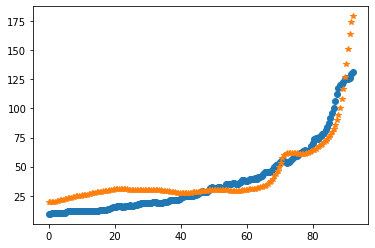

after perturb [3.8020310977218306, 116.70319883775338, 22658.65107434337, 0.4231021682307752, 14.817525560026894]
parameters [3.8020310977218306, 116.70319883775338, 22658.65107434337, 0.4231021682307752, 14.817525560026894]
oxigeno [2.17798890e-09 2.18977536e-09 2.22528599e-09 2.28497684e-09
 2.36961579e-09 2.48029436e-09 2.61844444e-09 2.78586013e-09
 2.98472505e-09 3.21764537e-09 3.48768918e-09 3.79843255e-09
 4.15401314e-09 4.55919208e-09 5.01942504e-09 5.54094375e-09
 6.13084900e-09 6.79721690e-09 7.54921993e-09 8.39726476e-09
 9.35314912e-09 1.04302401e-08 1.16436770e-08 1.30106012e-08
 1.45504177e-08 1.62850914e-08 1.82394824e-08 2.04417266e-08
 2.29236652e-08 2.57213307e-08 2.88754954e-08 3.24322896e-08
 3.64438986e-08 4.09693464e-08 4.60753772e-08 5.18374452e-08
 5.83408239e-08 6.56818507e-08 7.39693195e-08 8.33260393e-08
 9.38905772e-08 1.05819207e-07 1.19288087e-07 1.34495696e-07
 1.51665555e-07 1.71049276e-07 1.92929968e-07 2.17626061e-07
 2.45495590e-07 2.76940993e-07 3.12

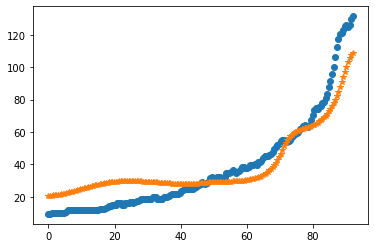

after perturb [2.594460861745571, 158.08287884120537, 20150.347009620273, 0.8259300093203601, 50.139999257340904]
parameters [2.594460861745571, 158.08287884120537, 20150.347009620273, 0.8259300093203601, 50.139999257340904]
after perturb [8.528730974886113, 127.57714024331432, 21099.547125946843, 1.1245942715412567, 49.904118726815256]
parameters [8.528730974886113, 127.57714024331432, 21099.547125946843, 1.1245942715412567, 49.904118726815256]
after perturb [1.7369419064898228, 56.10535176136728, 26926.51453156037, 0.8739845299152664, 17.164251636253795]
parameters [1.7369419064898228, 56.10535176136728, 26926.51453156037, 0.8739845299152664, 17.164251636253795]
oxigeno [1.46712972e-18 1.46526140e-18 1.45984476e-18 1.45144552e-18
 1.44100992e-18 1.42987304e-18 1.41977641e-18 1.41290049e-18
 1.41191833e-18 1.42007766e-18 1.44131955e-18 1.48044341e-18
 1.54332957e-18 1.63723429e-18 1.77117516e-18 1.95643081e-18
 2.20718536e-18 2.54135725e-18 2.98166432e-18 3.55699226e-18
 4.30415463e-1

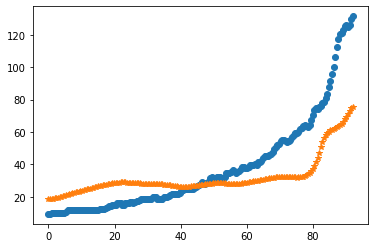

after perturb [4.764118373419111, 95.85505662006562, 23947.19539857298, 0.22567544266634024, 40.24652642363007]
parameters [4.764118373419111, 95.85505662006562, 23947.19539857298, 0.22567544266634024, 40.24652642363007]
oxigeno [4.22645421e-06 4.22391923e-06 4.21633954e-06 4.20379063e-06
 4.18639721e-06 4.16433164e-06 4.13781185e-06 4.10709877e-06
 4.07249339e-06 4.03433363e-06 3.99299104e-06 3.94886755e-06
 3.90239230e-06 3.85401868e-06 3.80422169e-06 3.75349574e-06
 3.70235282e-06 3.65132129e-06 3.60094511e-06 3.55178374e-06
 3.50441256e-06 3.45942394e-06 3.41742891e-06 3.37905937e-06
 3.34497098e-06 3.31584664e-06 3.29240055e-06 3.27538294e-06
 3.26558542e-06 3.26384699e-06 3.27106080e-06 3.28818156e-06
 3.31623381e-06 3.35632100e-06 3.40963538e-06 3.47746899e-06
 3.56122554e-06 3.66243341e-06 3.78275989e-06 3.92402664e-06
 4.08822655e-06 4.27754206e-06 4.49436518e-06 4.74131921e-06
 5.02128237e-06 5.33741364e-06 5.69318083e-06 6.09239119e-06
 6.53922482e-06 7.03827119e-06 7.594568

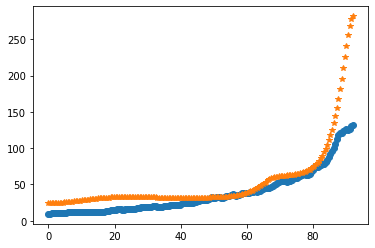

after perturb [4.427497491774177, 70.25323514064898, 18229.658329131227, 0.2318761885833831, 21.291153637664852]
parameters [4.427497491774177, 70.25323514064898, 18229.658329131227, 0.2318761885833831, 21.291153637664852]
after perturb [0.35847515632712346, 160.6557973492295, 21565.88792146105, 1.2078796129726945, 47.560138509327714]
parameters [0.35847515632712346, 160.6557973492295, 21565.88792146105, 1.2078796129726945, 47.560138509327714]
after perturb [2.2314802676697187, 76.08076302183623, 22791.799363610535, 0.38448902937830104, 17.351354736437365]
parameters [2.2314802676697187, 76.08076302183623, 22791.799363610535, 0.38448902937830104, 17.351354736437365]
oxigeno [1.66373481e-09 1.66174399e-09 1.65580348e-09 1.64600814e-09
 1.63251310e-09 1.61552944e-09 1.59531869e-09 1.57218660e-09
 1.54647644e-09 1.51856245e-09 1.48884377e-09 1.45773921e-09
 1.42568310e-09 1.39312240e-09 1.36051532e-09 1.32833135e-09
 1.29705289e-09 1.26717838e-09 1.23922705e-09 1.21374509e-09
 1.19131342e

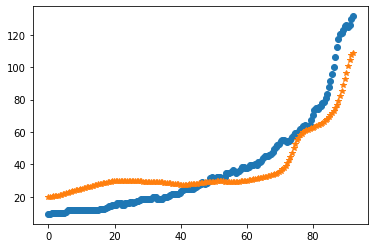

after perturb [-1.3988336522794373, 173.02237934990208, 24467.803884085304, 1.6969504669525597, 60.958470803930155]
parameters [-1.3988336522794373, 173.02237934990208, 24467.803884085304, 1.6969504669525597, 60.958470803930155]
after perturb [5.010960411541216, 96.48737256289448, 25086.139095566694, 0.8114086905461603, 29.832206421487427]
parameters [5.010960411541216, 96.48737256289448, 25086.139095566694, 0.8114086905461603, 29.832206421487427]
oxigeno [3.05001532e-14 3.09014942e-14 3.21162644e-14 3.41770298e-14
 3.71391612e-14 4.10825117e-14 4.61138404e-14 5.23700607e-14
 6.00224159e-14 6.92817203e-14 8.04048325e-14 9.37025735e-14
 1.09549348e-13 1.28394780e-13 1.50777758e-13 1.77343332e-13
 2.08863040e-13 2.46259338e-13 2.90634939e-13 3.43308040e-13
 4.05854638e-13 4.80159325e-13 5.68476291e-13 6.73502576e-13
 7.98466031e-13 9.47230944e-13 1.12442487e-12 1.33559091e-12
 1.58737053e-12 1.88772292e-12 2.24618833e-12 2.67420387e-12
 3.18548221e-12 3.79646563e-12 4.52686995e-12 5.4003

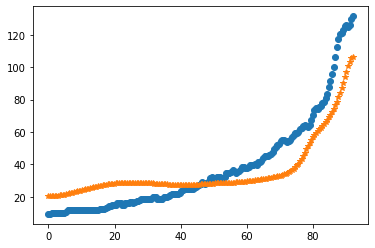

after perturb [-1.317685348465023, 103.21050505487426, 16636.974369110598, 0.31669030770743556, 28.929863072383696]
parameters [-1.317685348465023, 103.21050505487426, 16636.974369110598, 0.31669030770743556, 28.929863072383696]
after perturb [0.804575928739613, 146.41872386352222, 22725.075191745294, 1.1479915751548462, 34.09192319268353]
parameters [0.804575928739613, 146.41872386352222, 22725.075191745294, 1.1479915751548462, 34.09192319268353]
oxigeno [1.72263157e-13 1.74008302e-13 1.79288008e-13 1.88235872e-13
 2.01077200e-13 2.18133117e-13 2.39826701e-13 2.66691730e-13
 2.99384941e-13 3.38702922e-13 3.85604857e-13 4.41242098e-13
 5.06995029e-13 5.84517030e-13 6.75784733e-13 7.83153543e-13
 9.09417836e-13 1.05787651e-12 1.23240670e-12 1.43755101e-12
 1.67862664e-12 1.96186700e-12 2.29460779e-12 2.68552899e-12
 3.14496147e-12 3.68526186e-12 4.32125364e-12 5.07072703e-12
 5.95498956e-12 6.99946432e-12 8.23434667e-12 9.69535070e-12
 1.14246018e-11 1.34717544e-11 1.58954312e-11 1.8765

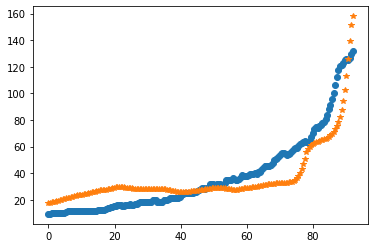

after perturb [-1.9127618565193898, 159.85566947368352, 25921.974396606154, 1.304995772276084, 43.253714225286735]
parameters [-1.9127618565193898, 159.85566947368352, 25921.974396606154, 1.304995772276084, 43.253714225286735]
after perturb [0.03004881337861587, 172.1703132636214, 20294.82678824132, 1.223701341617812, 48.639721931725354]
parameters [0.03004881337861587, 172.1703132636214, 20294.82678824132, 1.223701341617812, 48.639721931725354]
after perturb [6.7852492630740056, 76.01336269988798, 23314.315833792498, 0.8272867607959586, 31.399478586748334]
parameters [6.7852492630740056, 76.01336269988798, 23314.315833792498, 0.8272867607959586, 31.399478586748334]
oxigeno [2.43364658e-16 2.47678017e-16 2.60774034e-16 2.83126571e-16
 3.15545779e-16 3.59209568e-16 4.15709486e-16 4.87112929e-16
 5.76044286e-16 6.85788439e-16 8.20420959e-16 9.84970521e-16
 1.18562040e-15 1.42995764e-15 1.72728048e-15 2.08897726e-15
 2.52899295e-15 3.06440357e-15 3.71612302e-15 4.50977318e-15
 5.47675478e

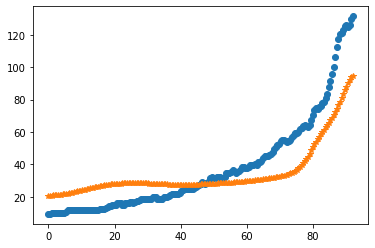

after perturb [4.063517734836502, 86.73266365694656, 26148.813792977242, 1.1716560652614771, 32.26685416768823]
parameters [4.063517734836502, 86.73266365694656, 26148.813792977242, 1.1716560652614771, 32.26685416768823]
oxigeno [5.59167355e-18 5.70536493e-18 6.05112990e-18 6.64325478e-18
 7.50627311e-18 8.67608729e-18 1.02016148e-17 1.21470399e-17
 1.45947808e-17 1.76493196e-17 2.14420833e-17 2.61376181e-17
 3.19413666e-17 3.91094354e-17 4.79608467e-17 5.88928932e-17
 7.24003793e-17 8.90997317e-17 1.09759220e-16 1.35336849e-16
 1.67027896e-16 2.06324554e-16 2.55090832e-16 3.15656619e-16
 3.90935874e-16 4.84575189e-16 6.01140563e-16 7.46352277e-16
 9.27380292e-16 1.15321581e-15 1.43513859e-15 1.78730478e-15
 2.22748599e-15 2.77799866e-15 3.46687205e-15 4.32931588e-15
 5.40956362e-15 6.76318651e-15 8.45999724e-15 1.05876916e-14
 1.32564131e-14 1.66044719e-14 2.08055055e-14 2.60774403e-14
 3.26937031e-14 4.09972381e-14 5.14180277e-14 6.44949836e-14
 8.09032892e-14 1.01488542e-13 1.273093

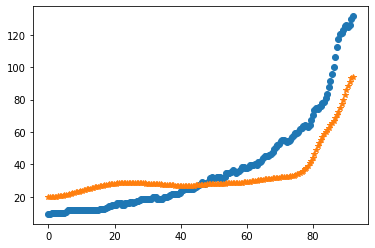

after perturb [3.535425487778094, 70.88149429131727, 20483.492923698333, 0.009844587860269427, 23.28284698880726]
parameters [3.535425487778094, 70.88149429131727, 20483.492923698333, 0.009844587860269427, 23.28284698880726]
oxigeno [ 5.44537152  5.44479676  5.44307597  5.44021956  5.43624469  5.43117497
  5.42504002  5.41787502  5.40972013  5.4006199   5.39062263  5.37977974
  5.36814515  5.35577471  5.34272562  5.32905601  5.31482446  5.30008967
  5.2849102   5.26934419  5.25344922  5.23728219  5.22089921  5.20435555
  5.18770559  5.17100281  5.15429971  5.13764783  5.12109764  5.10469856
  5.08849878  5.07254525  5.05688358  5.04155783  5.02661051  5.01208232
  4.9980121   4.98443667  4.97139066  4.95890645  4.94701405  4.93574102
  4.92511249  4.91515111  4.90587713  4.89730854  4.88946119  4.88234904
  4.87598438  4.87037819  4.86554046  4.86148054  4.85820756  4.85573078
  4.85406001  4.8532059   4.8531803   4.85399653  4.85566959  4.85821633
  4.86165561  4.86600832  4.87129742 

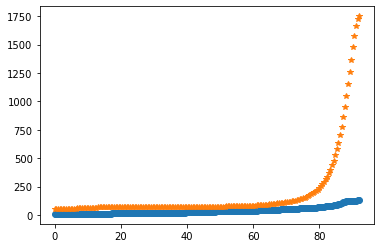

after perturb [-1.6907509989578196, 131.5731921497845, 17455.255624812533, 0.42513259608852344, 28.008787211364186]
parameters [-1.6907509989578196, 131.5731921497845, 17455.255624812533, 0.42513259608852344, 28.008787211364186]
after perturb [9.405816677198377, 58.608107677645265, 28107.896990907444, 0.05633786563742493, 29.256987841149943]
parameters [9.405816677198377, 58.608107677645265, 28107.896990907444, 0.05633786563742493, 29.256987841149943]
after perturb [-3.7651565247481926, 115.8872042051373, 18913.382694519223, 0.6826057823109261, 43.677184040142684]
parameters [-3.7651565247481926, 115.8872042051373, 18913.382694519223, 0.6826057823109261, 43.677184040142684]
after perturb [10.116456962264515, 113.39746118216476, 13095.05414358282, -0.2163854260837077, 43.68075831908459]
parameters [10.116456962264515, 113.39746118216476, 13095.05414358282, -0.2163854260837077, 43.68075831908459]
after perturb [8.025971529918207, 104.05257280645796, 23312.04696930871, 0.8358745075876811,

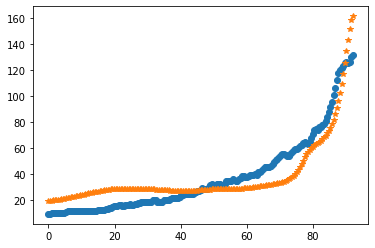

after perturb [-0.530654003106952, 154.92224503252135, 17925.639840512824, 1.2759782588642217, 48.30691523632542]
parameters [-0.530654003106952, 154.92224503252135, 17925.639840512824, 1.2759782588642217, 48.30691523632542]
after perturb [6.38970464344922, 102.32917005548578, 19159.12536535593, 0.7947188487087709, 39.15678961365355]
parameters [6.38970464344922, 102.32917005548578, 19159.12536535593, 0.7947188487087709, 39.15678961365355]
after perturb [3.341624645469976, 158.6684475992468, 16401.09596162755, 0.951058448248638, 49.04798111125037]
parameters [3.341624645469976, 158.6684475992468, 16401.09596162755, 0.951058448248638, 49.04798111125037]
after perturb [0.46821908603679785, 112.25739667341625, 17863.31023295141, 0.8125483259036634, 29.393037293985838]
parameters [0.46821908603679785, 112.25739667341625, 17863.31023295141, 0.8125483259036634, 29.393037293985838]
after perturb [4.046558682266537, 131.44288889330159, 24384.114477767424, 2.096359497462009, 63.90077262266708]


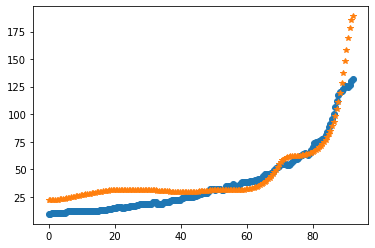

after perturb [1.6943431091603776, 163.7384736502357, 18512.555472829103, 1.4272622327128226, 52.29820193841939]
parameters [1.6943431091603776, 163.7384736502357, 18512.555472829103, 1.4272622327128226, 52.29820193841939]
after perturb [3.2413204954597696, 63.384290807101046, 31872.59776838747, 0.02937185824174471, 14.77504809529497]
parameters [3.2413204954597696, 63.384290807101046, 31872.59776838747, 0.02937185824174471, 14.77504809529497]
after perturb [1.061333005669444, 187.9832024072964, 14986.653750528147, 0.9629361424703596, 44.493607760363155]
parameters [1.061333005669444, 187.9832024072964, 14986.653750528147, 0.9629361424703596, 44.493607760363155]
after perturb [0.8489862228788533, 134.6209068906608, 15037.262925569921, 0.9949510469614705, 44.116140233232244]
parameters [0.8489862228788533, 134.6209068906608, 15037.262925569921, 0.9949510469614705, 44.116140233232244]
after perturb [3.897413290647574, 127.48941369338183, 23180.20435313886, 1.2521719563196574, 41.48704509

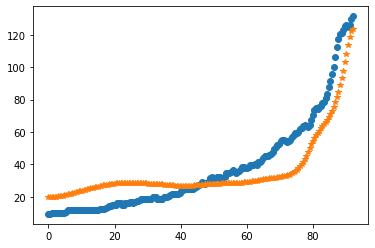

after perturb [2.774755853069556, 98.93803375163625, 19776.88084172418, 0.46959493305344874, 25.593279698438096]
parameters [2.774755853069556, 98.93803375163625, 19776.88084172418, 0.46959493305344874, 25.593279698438096]
after perturb [8.30685239413666, 129.6958122167675, 29092.409639340185, 1.7305480238739366, 50.4706752421099]
parameters [8.30685239413666, 129.6958122167675, 29092.409639340185, 1.7305480238739366, 50.4706752421099]
after perturb [5.160924271039121, 40.430085588631044, 30607.81642441085, 0.6559946350596725, 25.60120564712501]
parameters [5.160924271039121, 40.430085588631044, 30607.81642441085, 0.6559946350596725, 25.60120564712501]
after perturb [1.8560308534502892, 137.2458652994992, 21917.729908807534, 0.8553168348612408, 38.69914081021141]
parameters [1.8560308534502892, 137.2458652994992, 21917.729908807534, 0.8553168348612408, 38.69914081021141]
oxigeno [4.14418226e-12 4.18019399e-12 4.28891896e-12 4.47244328e-12
 4.73429982e-12 5.07955323e-12 5.51492062e-12 6

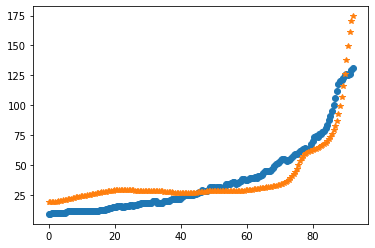

after perturb [5.242313169390674, 11.584921349904533, 25180.68981307514, 0.08379043799310837, 23.894266965011525]
parameters [5.242313169390674, 11.584921349904533, 25180.68981307514, 0.08379043799310837, 23.894266965011525]
after perturb [2.6539652987709887, 87.0673462204352, 22197.21766257048, 0.6640409791784586, 36.59068988898115]
parameters [2.6539652987709887, 87.0673462204352, 22197.21766257048, 0.6640409791784586, 36.59068988898115]
oxigeno [1.23443225e-13 1.24821200e-13 1.28989989e-13 1.36055220e-13
 1.46196396e-13 1.59672186e-13 1.76828022e-13 1.98106238e-13
 2.24059008e-13 2.55364472e-13 2.92846508e-13 3.37498726e-13
 3.90513400e-13 4.53316212e-13 5.27607861e-13 6.15413833e-13
 7.19143892e-13 8.41663165e-13 9.86377115e-13 1.15733311e-12
 1.35934191e-12 1.59812296e-12 1.88047821e-12 2.21450014e-12
 2.60982053e-12 3.07790806e-12 3.63242426e-12 4.28964892e-12
 5.06898860e-12 5.99358420e-12 7.09103661e-12 8.39427310e-12
 9.94258136e-12 1.17828429e-11 1.39710035e-11 1.65738239e-11

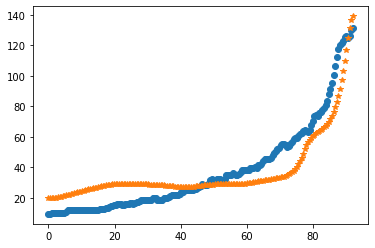

after perturb [2.5396310088346024, 173.29750161519712, 26704.791563781826, 1.0377538072572006, 48.07516912846905]
parameters [2.5396310088346024, 173.29750161519712, 26704.791563781826, 1.0377538072572006, 48.07516912846905]
after perturb [3.337497714917396, 120.0424686665607, 20411.774096899644, 0.7030237838662992, 25.762549232855683]
parameters [3.337497714917396, 120.0424686665607, 20411.774096899644, 0.7030237838662992, 25.762549232855683]
oxigeno [8.03672114e-12 8.10758626e-12 8.32149463e-12 8.68241514e-12
 9.19706282e-12 9.87505126e-12 1.07291102e-11 1.17753727e-11
 1.30337377e-11 1.45283163e-11 1.62879695e-11 1.83469518e-11
 2.07456727e-11 2.35315948e-11 2.67602884e-11 3.04966686e-11
 3.48164428e-11 3.98078046e-11 4.55734147e-11 5.22327163e-11
 5.99246428e-11 6.88107820e-11 7.90790749e-11 9.09481381e-11
 1.04672314e-10 1.20547568e-10 1.38918377e-10 1.60185765e-10
 1.84816679e-10 2.13354919e-10 2.46433872e-10 2.84791340e-10
 3.29286791e-10 3.80921414e-10 4.40861409e-10 5.10465022

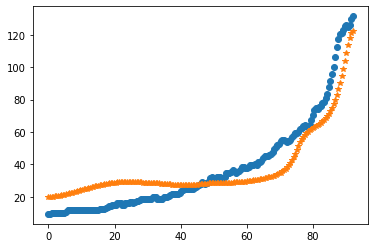

after perturb [-0.1849891664445713, 83.44696191551384, 20471.937185350605, 0.7690611952279462, 21.486703248715465]
parameters [-0.1849891664445713, 83.44696191551384, 20471.937185350605, 0.7690611952279462, 21.486703248715465]
after perturb [3.9673233280281854, 105.29244372355143, 22163.909179553706, 1.2573676578141593, 38.373068824202484]
parameters [3.9673233280281854, 105.29244372355143, 22163.909179553706, 1.2573676578141593, 38.373068824202484]
oxigeno [8.92122726e-17 9.07566294e-17 9.54442819e-17 1.03441154e-16
 1.15031135e-16 1.30627427e-16 1.50789107e-16 1.76243602e-16
 2.07916034e-16 2.46966704e-16 2.94838315e-16 3.53314982e-16
 4.24595593e-16 5.11384714e-16 6.17005037e-16 7.45536336e-16
 9.01987088e-16 1.09250643e-15 1.32464598e-15 1.60768325e-15
 1.95302145e-15 2.37468371e-15 2.88992441e-15 3.51998550e-15
 4.29103268e-15 5.23531422e-15 6.39259608e-15 7.81193902e-15
 9.55389968e-15 1.16932567e-14 1.43223868e-14 1.75554452e-14
 2.15335409e-14 2.64311417e-14 3.24639986e-14 3.98

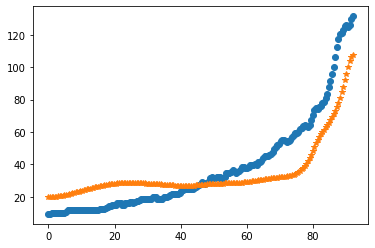

after perturb [4.526257479694499, 163.69368655644666, 22222.29689165183, 1.1545582276150446, 45.32588847194403]
parameters [4.526257479694499, 163.69368655644666, 22222.29689165183, 1.1545582276150446, 45.32588847194403]
after perturb [1.961828194743193, 66.4378506998179, 20848.528046968382, -0.09496646768517591, 9.250516121956483]
parameters [1.961828194743193, 66.4378506998179, 20848.528046968382, -0.09496646768517591, 9.250516121956483]
after perturb [-0.20314371803816034, 116.58729842091905, 21448.140967253246, 0.999930667864761, 44.58903122960682]
parameters [-0.20314371803816034, 116.58729842091905, 21448.140967253246, 0.999930667864761, 44.58903122960682]
after perturb [-0.986761049571564, 150.91311996899546, 23109.38943116427, 0.5364368716996447, 41.5580941135931]
parameters [-0.986761049571564, 150.91311996899546, 23109.38943116427, 0.5364368716996447, 41.5580941135931]
after perturb [4.6878533227128685, 83.9529246990044, 28605.960010429884, -0.08460010655101424, 11.0249456899

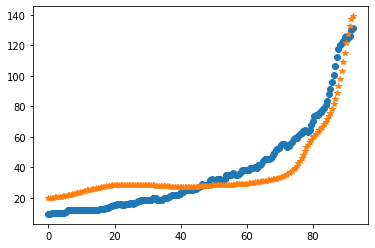

after perturb [3.4190298542532274, 135.04423692038233, 21763.713565385682, 0.5696424002497064, 23.576342368420185]
parameters [3.4190298542532274, 135.04423692038233, 21763.713565385682, 0.5696424002497064, 23.576342368420185]
oxigeno [5.06304149e-10 5.09536594e-10 5.19278172e-10 5.35662378e-10
 5.58914281e-10 5.89354414e-10 6.27404301e-10 6.73593672e-10
 7.28569487e-10 7.93106874e-10 8.68122158e-10 9.54688181e-10
 1.05405215e-09 1.16765631e-09 1.29716180e-09 1.44447610e-09
 1.61178460e-09 1.80158673e-09 2.01673752e-09 2.26049511e-09
 2.53657531e-09 2.84921394e-09 3.20323829e-09 3.60414888e-09
 4.05821285e-09 4.57257080e-09 5.15535869e-09 5.81584693e-09
 6.56459897e-09 7.41365188e-09 8.37672184e-09 9.46943773e-09
 1.07096064e-08 1.21175133e-08 1.37162639e-08 1.55321688e-08
 1.75951803e-08 1.99393847e-08 2.26035579e-08 2.56317913e-08
 2.90741970e-08 3.29877016e-08 3.74369393e-08 4.24952573e-08
 4.82458473e-08 5.47830207e-08 6.22136452e-08 7.06587665e-08
 8.02554390e-08 9.11587958e-08 1.

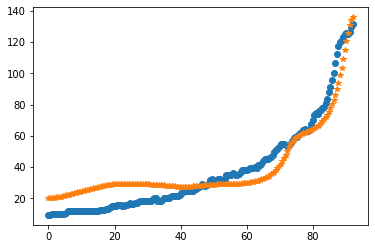

7
after perturb [1.0638993962844077, 151.0423856872698, 24862.23477948811, 0.6192655203811164, 39.96263603465687]
parameters [1.0638993962844077, 151.0423856872698, 24862.23477948811, 0.6192655203811164, 39.96263603465687]
after perturb [-0.2608892109127303, 145.07357408304932, 17249.702892806454, 1.0671260401810139, 52.83410651184573]
parameters [-0.2608892109127303, 145.07357408304932, 17249.702892806454, 1.0671260401810139, 52.83410651184573]
after perturb [13.160161402209337, 127.24486721024394, 23326.72998142016, 0.7092801260466446, 25.959339369708676]
parameters [13.160161402209337, 127.24486721024394, 23326.72998142016, 0.7092801260466446, 25.959339369708676]
after perturb [6.350224125972852, 108.26530152836341, 19215.258796647835, -0.02995296972770828, 21.172640872755643]
parameters [6.350224125972852, 108.26530152836341, 19215.258796647835, -0.02995296972770828, 21.172640872755643]
after perturb [6.407597598763159, 210.71773977054957, 26746.033141341104, 1.874045972690406, 51.

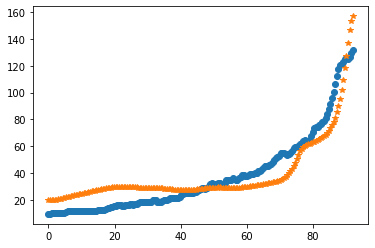

after perturb [2.4078564390034916, 115.05802492007203, 17190.6103988212, 1.1572644485869747, 36.21990122774618]
parameters [2.4078564390034916, 115.05802492007203, 17190.6103988212, 1.1572644485869747, 36.21990122774618]
after perturb [3.089670086483556, 178.99103026250518, 19125.701250747785, 1.5165374472348412, 60.546197442014574]
parameters [3.089670086483556, 178.99103026250518, 19125.701250747785, 1.5165374472348412, 60.546197442014574]
after perturb [1.8778144357672235, 142.01984603272575, 27528.704395879944, 1.1313280564069206, 33.77883119716148]
parameters [1.8778144357672235, 142.01984603272575, 27528.704395879944, 1.1313280564069206, 33.77883119716148]
oxigeno [1.29957453e-13 1.31361536e-13 1.35606651e-13 1.42792360e-13
 1.53087854e-13 1.66736906e-13 1.84064952e-13 2.05488475e-13
 2.31526914e-13 2.62817397e-13 3.00132710e-13 3.44402961e-13
 3.96741550e-13 4.58476181e-13 5.31185774e-13 6.16744396e-13
 7.17373522e-13 8.35704281e-13 9.74851721e-13 1.13850357e-12
 1.33102653e-12 

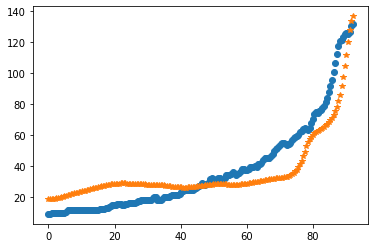

after perturb [4.825079600341921, 130.41768030038534, 14859.08393840336, 1.3999252266695146, 45.279878411448124]
parameters [4.825079600341921, 130.41768030038534, 14859.08393840336, 1.3999252266695146, 45.279878411448124]
after perturb [2.2290276169502428, 50.42622999398367, 24950.57603394212, 0.02454871881969961, 10.691377200802684]
parameters [2.2290276169502428, 50.42622999398367, 24950.57603394212, 0.02454871881969961, 10.691377200802684]
oxigeno [ 0.34048752  0.34038672  0.34008516  0.33958541  0.33889163  0.3380095
  0.33694604  0.33570942  0.33430879  0.33275405  0.33105565  0.3292244
  0.32727131  0.3252074   0.3230436   0.32079065  0.31845899  0.31605876
  0.31359972  0.3110913   0.30854258  0.30596233  0.30335904  0.30074096
  0.29811609  0.29549226  0.29287709  0.29027799  0.28770218  0.28515663
  0.28264808  0.28018297  0.27776746  0.27540736  0.27310819  0.27087509
  0.26871284  0.26662583  0.26461805  0.26269301  0.26085379  0.2591029
  0.25744232  0.25587343  0.25439702

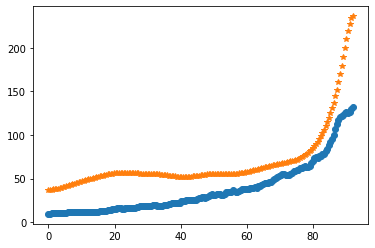

after perturb [0.9531452439112726, 157.77533954477317, 32163.245125604823, 0.7417993042391497, 31.75627164035615]
parameters [0.9531452439112726, 157.77533954477317, 32163.245125604823, 0.7417993042391497, 31.75627164035615]
after perturb [0.3322539693676483, 156.61549719506428, 23934.963084232237, 1.2071809855068039, 54.94773210516098]
parameters [0.3322539693676483, 156.61549719506428, 23934.963084232237, 1.2071809855068039, 54.94773210516098]
after perturb [6.5306900544962705, 148.62376196478266, 28637.336736953046, 0.9686519293408468, 36.3947278306502]
parameters [6.5306900544962705, 148.62376196478266, 28637.336736953046, 0.9686519293408468, 36.3947278306502]
oxigeno [2.44424854e-12 2.46757151e-12 2.53799714e-12 2.65690599e-12
 2.82663384e-12 3.05052485e-12 3.33300779e-12 3.67969717e-12
 4.09752170e-12 4.59488330e-12 5.18185045e-12 5.87039060e-12
 6.67464745e-12 7.61126974e-12 8.69979980e-12 9.96313136e-12
 1.14280479e-11 1.31258552e-11 1.50931227e-11 1.73725542e-11
 2.00140066e-1

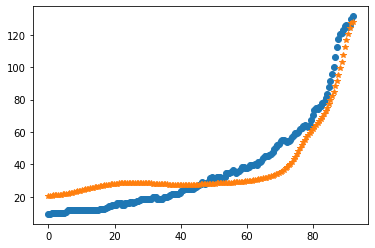

8
after perturb [0.5394792455369792, 166.40130340883542, 17314.393387099695, 1.3867588870737941, 51.938763078530286]
parameters [0.5394792455369792, 166.40130340883542, 17314.393387099695, 1.3867588870737941, 51.938763078530286]
after perturb [2.199822901623748, 102.07920084713902, 25353.619743213203, 0.6162483796589547, 27.98012920228298]
parameters [2.199822901623748, 102.07920084713902, 25353.619743213203, 0.6162483796589547, 27.98012920228298]
oxigeno [4.28143129e-12 4.32065751e-12 4.43911628e-12 4.63916704e-12
 4.92480654e-12 5.30176650e-12 5.77765275e-12 6.36212847e-12
 7.06714499e-12 7.90722507e-12 8.89980442e-12 1.00656392e-11
 1.14292884e-11 1.30196833e-11 1.48707964e-11 1.70224281e-11
 1.95211299e-11 2.24212892e-11 2.57864048e-11 2.96905869e-11
 3.42203236e-11 3.94765598e-11 4.55771458e-11 5.26597178e-11
 6.08850839e-11 7.04412009e-11 8.15478379e-11 9.44620409e-11
 1.09484531e-10 1.26967191e-10 1.47321830e-10 1.71030432e-10
 1.98657157e-10 2.30862380e-10 2.68419110e-10 3.1223

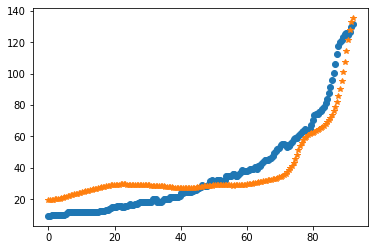

after perturb [2.2072103660907216, 146.6732543327573, 12715.281988277779, 0.7293658657359251, 33.69170700335013]
parameters [2.2072103660907216, 146.6732543327573, 12715.281988277779, 0.7293658657359251, 33.69170700335013]
after perturb [2.852083628336668, 105.0136207257933, 21449.405460705864, 1.1529286526441733, 33.467461439346174]
parameters [2.852083628336668, 105.0136207257933, 21449.405460705864, 1.1529286526441733, 33.467461439346174]
oxigeno [4.11042722e-16 4.17537655e-16 4.37234448e-16 4.70777168e-16
 5.19266530e-16 5.84301904e-16 6.68042343e-16 7.73289013e-16
 9.03592182e-16 1.06338697e-15 1.25816319e-15 1.49467593e-15
 1.78120547e-15 2.12787676e-15 2.54705164e-15 3.05380985e-15
 3.66653864e-15 4.40765582e-15 5.30449641e-15 6.39040069e-15
 7.70605002e-15 9.30110748e-15 1.12362341e-14 1.35855674e-14
 1.64397692e-14 1.99097747e-14 2.41314038e-14 2.92710352e-14
 3.55325857e-14 4.31660985e-14 5.24783055e-14 6.38456195e-14
 7.77301085e-14 9.46991301e-14 1.15449455e-13 1.40836883e-

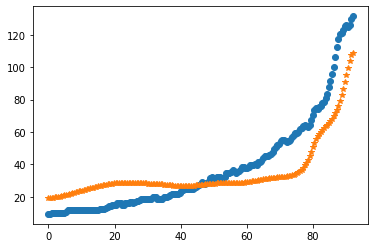

after perturb [3.491149228724398, 133.74278600349368, 21505.531321502363, 0.8951575002856222, 30.03425609035568]
parameters [3.491149228724398, 133.74278600349368, 21505.531321502363, 0.8951575002856222, 30.03425609035568]
oxigeno [1.52497284e-12 1.53972956e-12 1.58429890e-12 1.65958588e-12
 1.76712369e-12 1.90911153e-12 2.08846879e-12 2.30890688e-12
 2.57502027e-12 2.89239905e-12 3.26776569e-12 3.70913929e-12
 4.22603146e-12 4.82967890e-12 5.53331839e-12 6.35251152e-12
 7.30552762e-12 8.41379496e-12 9.70243220e-12 1.12008744e-11
 1.29436103e-11 1.49710503e-11 1.73305493e-11 2.00776109e-11
 2.32773049e-11 2.70059375e-11 3.13530159e-11 3.64235607e-11
 4.23408259e-11 4.92494969e-11 5.73194490e-11 6.67501604e-11
 7.77758941e-11 9.06717729e-11 1.05760902e-10 1.23422706e-10
 1.44102689e-10 1.68323836e-10 1.96699937e-10 2.29951131e-10
 2.68922037e-10 3.14602882e-10 3.68154109e-10 4.30935037e-10
 5.04537215e-10 5.90823260e-10 6.91972063e-10 8.10531439e-10
 9.49479442e-10 1.11229582e-09 1.3030

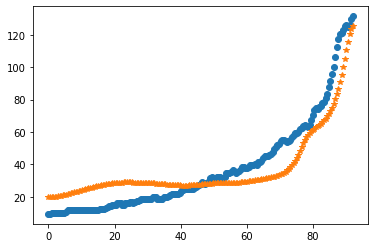

after perturb [2.5032205620405454, 127.52591347178218, 21819.88199711941, 0.4609669824446101, 23.803107804229793]
parameters [2.5032205620405454, 127.52591347178218, 21819.88199711941, 0.4609669824446101, 23.803107804229793]
oxigeno [2.57153283e-09 2.58557842e-09 2.62788932e-09 2.69899067e-09
 2.79976682e-09 2.93147494e-09 3.09576443e-09 3.29470191e-09
 3.53080232e-09 3.80706632e-09 4.12702440e-09 4.49478826e-09
 4.91511028e-09 5.39345177e-09 5.93606123e-09 6.55006377e-09
 7.24356345e-09 8.02576004e-09 8.90708262e-09 9.89934202e-09
 1.10159052e-08 1.22718938e-08 1.36844115e-08 1.52728014e-08
 1.70589399e-08 1.90675693e-08 2.13266750e-08 2.38679114e-08
 2.67270836e-08 2.99446908e-08 3.35665385e-08 3.76444294e-08
 4.22369405e-08 4.74102985e-08 5.32393623e-08 5.98087271e-08
 6.72139586e-08 7.55629733e-08 8.49775755e-08 9.55951652e-08
 1.07570633e-07 1.21078460e-07 1.36315038e-07 1.53501243e-07
 1.72885290e-07 1.94745899e-07 2.19395833e-07 2.47185853e-07
 2.78509157e-07 3.13806381e-07 3.53

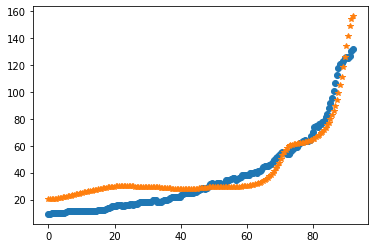

9
after perturb [4.069460322672741, 91.93940179119876, 31842.322156427676, 0.5703136598059255, 29.70880031347567]
parameters [4.069460322672741, 91.93940179119876, 31842.322156427676, 0.5703136598059255, 29.70880031347567]
after perturb [3.938957220066819, 91.31540433145766, 21631.921470351932, 0.48905463617233697, 14.033376037519375]
parameters [3.938957220066819, 91.31540433145766, 21631.921470351932, 0.48905463617233697, 14.033376037519375]
oxigeno [2.33733089e-11 2.34905867e-11 2.38449218e-11 2.44438681e-11
 2.53001839e-11 2.64320868e-11 2.78636208e-11 2.96251427e-11
 3.17539396e-11 3.42949928e-11 3.73019047e-11 4.08380122e-11
 4.49777108e-11 4.98080214e-11 5.54304361e-11 6.19630849e-11
 6.95432746e-11 7.83304590e-11 8.85097085e-11 1.00295761e-10
 1.13937748e-10 1.29724705e-10 1.47991994e-10 1.69128791e-10
 1.93586802e-10 2.21890412e-10 2.54648507e-10 2.92568212e-10
 3.36470879e-10 3.87310662e-10 4.46196092e-10 5.14415120e-10
 5.93464166e-10 6.85081783e-10 7.91287651e-10 9.14427697

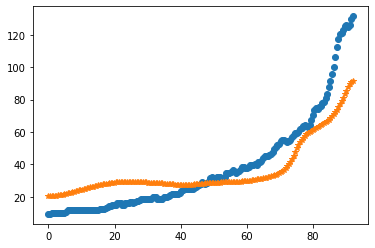

after perturb [1.8906751448490433, 115.59974628449257, 15459.269464887646, 0.40846715019110874, 27.381670299303043]
parameters [1.8906751448490433, 115.59974628449257, 15459.269464887646, 0.40846715019110874, 27.381670299303043]
after perturb [3.5822689594229487, 143.4187535928331, 18942.615482341593, 0.929409046696793, 40.796420165355244]
parameters [3.5822689594229487, 143.4187535928331, 18942.615482341593, 0.929409046696793, 40.796420165355244]
after perturb [5.411138520914223, 132.67292782996137, 26006.213164897614, 0.8895265125160947, 50.46232188332385]
parameters [5.411138520914223, 132.67292782996137, 26006.213164897614, 0.8895265125160947, 50.46232188332385]
after perturb [1.2059315428906248, 116.25445888116177, 18563.100973932276, 0.7140821413278567, 38.776729238302494]
parameters [1.2059315428906248, 116.25445888116177, 18563.100973932276, 0.7140821413278567, 38.776729238302494]
after perturb [0.8355691710770317, 137.46595106151207, 20720.562736090415, 1.7310312848881635, 64.

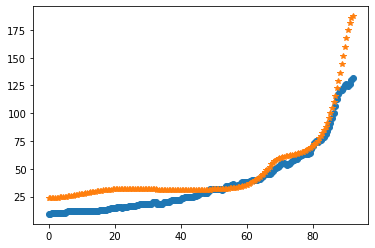

after perturb [0.1684600915615586, 220.51224208435235, 20930.2718475416, 1.903939251066272, 68.28873357778514]
parameters [0.1684600915615586, 220.51224208435235, 20930.2718475416, 1.903939251066272, 68.28873357778514]
after perturb [6.7296642794514785, 94.53744588127674, 20143.613389211307, 0.29075574541001387, 29.114675086842297]
parameters [6.7296642794514785, 94.53744588127674, 20143.613389211307, 0.29075574541001387, 29.114675086842297]
oxigeno [1.34935924e-07 1.34887037e-07 1.34741597e-07 1.34503267e-07
 1.34178147e-07 1.33774765e-07 1.33304063e-07 1.32779397e-07
 1.32216525e-07 1.31633617e-07 1.31051267e-07 1.30492525e-07
 1.29982951e-07 1.29550689e-07 1.29226578e-07 1.29044291e-07
 1.29040518e-07 1.29255199e-07 1.29731797e-07 1.30517643e-07
 1.31664331e-07 1.33228195e-07 1.35270849e-07 1.37859828e-07
 1.41069308e-07 1.44980938e-07 1.49684778e-07 1.55280364e-07
 1.61877906e-07 1.69599643e-07 1.78581353e-07 1.88974052e-07
 2.00945895e-07 2.14684297e-07 2.30398297e-07 2.48321201e-

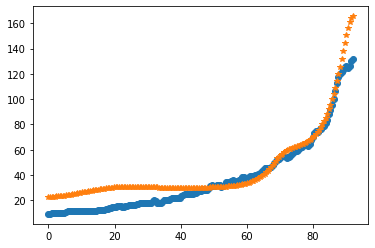

10
after perturb [-0.30969059477728167, 201.38153907506904, 18111.249265975082, 1.927070915477716, 54.39108848541347]
parameters [-0.30969059477728167, 201.38153907506904, 18111.249265975082, 1.927070915477716, 54.39108848541347]
after perturb [7.52981273143598, 102.10020422727771, 33696.73165594939, 0.3501845645953692, 18.008372994843675]
parameters [7.52981273143598, 102.10020422727771, 33696.73165594939, 0.3501845645953692, 18.008372994843675]
after perturb [5.547178141142276, 59.77531057475768, 23134.23870420958, 0.1222659343921601, 28.9689912856817]
parameters [5.547178141142276, 59.77531057475768, 23134.23870420958, 0.1222659343921601, 28.9689912856817]
oxigeno [7.18084140e-04 7.17607275e-04 7.16179968e-04 7.13812022e-04
 7.10519605e-04 7.06324993e-04 7.01256224e-04 6.95346673e-04
 6.88634561e-04 6.81162407e-04 6.72976442e-04 6.64126000e-04
 6.54662905e-04 6.44640853e-04 6.34114820e-04 6.23140496e-04
 6.11773749e-04 6.00070145e-04 5.88084500e-04 5.75870498e-04
 5.63480348e-04 5.5

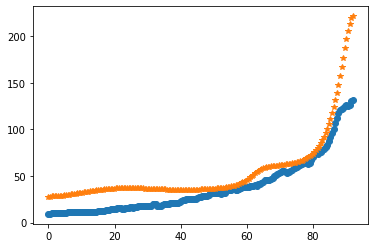

after perturb [6.010689281451844, 113.15347977623175, 24979.00927415783, 0.34376290895350514, 24.391877386799052]
parameters [6.010689281451844, 113.15347977623175, 24979.00927415783, 0.34376290895350514, 24.391877386799052]
oxigeno [2.08956240e-08 2.09538461e-08 2.11292518e-08 2.14240679e-08
 2.18420341e-08 2.23884462e-08 2.30702171e-08 2.38959574e-08
 2.48760753e-08 2.60228994e-08 2.73508237e-08 2.88764789e-08
 3.06189311e-08 3.25999115e-08 3.48440800e-08 3.73793253e-08
 4.02371075e-08 4.34528463e-08 4.70663597e-08 5.11223607e-08
 5.56710155e-08 6.07685740e-08 6.64780768e-08 7.28701503e-08
 8.00238982e-08 8.80279010e-08 9.69813347e-08 1.06995223e-07
 1.18193837e-07 1.30716256e-07 1.44718115e-07 1.60373547e-07
 1.77877353e-07 1.97447412e-07 2.19327369e-07 2.43789620e-07
 2.71138630e-07 3.01714620e-07 3.35897659e-07 3.74112204e-07
 4.16832140e-07 4.64586363e-07 5.17964980e-07 5.77626170e-07
 6.44303801e-07 7.18815860e-07 8.02073808e-07 8.95092935e-07
 9.99003846e-07 1.11506517e-06 1.24

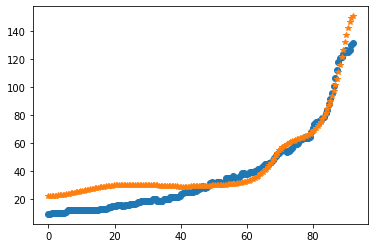

11
after perturb [2.1158067793342163, 139.37727629826045, 17364.793776124916, 0.5564067942034374, 29.620600049355804]
parameters [2.1158067793342163, 139.37727629826045, 17364.793776124916, 0.5564067942034374, 29.620600049355804]
after perturb [3.0600986571045676, 161.52136234258217, 17859.708602585193, 1.3461982176257703, 55.252138991049655]
parameters [3.0600986571045676, 161.52136234258217, 17859.708602585193, 1.3461982176257703, 55.252138991049655]
after perturb [-4.0468858854127765, 142.4620966456317, 20475.51266301241, 1.1928881233196564, 48.649292029499534]
parameters [-4.0468858854127765, 142.4620966456317, 20475.51266301241, 1.1928881233196564, 48.649292029499534]
after perturb [3.4389418466501542, 122.6539907731863, 29315.104292663804, 1.0594632064786196, 47.20064108574164]
parameters [3.4389418466501542, 122.6539907731863, 29315.104292663804, 1.0594632064786196, 47.20064108574164]
after perturb [-0.478578924941081, 181.99651199466865, 23448.247611019775, 1.3383582266111755, 

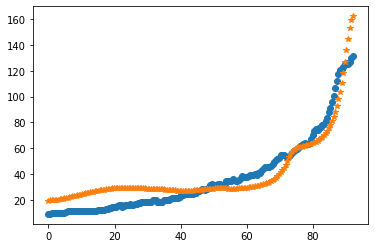

12
after perturb [0.5766062029066628, 157.92061348673826, 20889.629828607925, 1.2686590170371197, 51.88180381240578]
parameters [0.5766062029066628, 157.92061348673826, 20889.629828607925, 1.2686590170371197, 51.88180381240578]
after perturb [-2.1022812645950175, 201.21302460952873, 21955.456037026805, 1.6325802126619902, 53.64585984336552]
parameters [-2.1022812645950175, 201.21302460952873, 21955.456037026805, 1.6325802126619902, 53.64585984336552]
after perturb [0.539127012259998, 140.89193959912868, 26421.709132352677, 1.0499150392262258, 47.84557669803752]
parameters [0.539127012259998, 140.89193959912868, 26421.709132352677, 1.0499150392262258, 47.84557669803752]
oxigeno [3.34021869e-13 3.37190351e-13 3.46784497e-13 3.63069845e-13
 3.86487417e-13 4.17652535e-13 4.57355538e-13 5.06567067e-13
 5.66451432e-13 6.38392247e-13 7.24034356e-13 8.25344730e-13
 9.44692151e-13 1.08494166e-12 1.24955621e-12 1.44269667e-12
 1.66931356e-12 1.93522979e-12 2.24722225e-12 2.61311841e-12
 3.041931

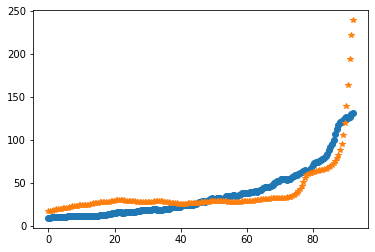

after perturb [2.615891722837444, 183.55050801470904, 26178.704207788927, 0.9134403017301255, 48.422984059543104]
parameters [2.615891722837444, 183.55050801470904, 26178.704207788927, 0.9134403017301255, 48.422984059543104]
after perturb [0.3199165675954265, 177.34506690649334, 24773.804984609273, 0.838078403124993, 38.74146631914065]
parameters [0.3199165675954265, 177.34506690649334, 24773.804984609273, 0.838078403124993, 38.74146631914065]
after perturb [4.085714770013007, 71.1876347454317, 21463.378821547107, -0.004675937826782772, 19.147975877314934]
parameters [4.085714770013007, 71.1876347454317, 21463.378821547107, -0.004675937826782772, 19.147975877314934]
after perturb [4.342944253604603, 174.25323358433394, 29197.98251130184, 2.024443924031331, 59.98759915520952]
parameters [4.342944253604603, 174.25323358433394, 29197.98251130184, 2.024443924031331, 59.98759915520952]
after perturb [0.27782240350042553, 108.11854089118125, 22139.476664450012, 0.23862142605159242, 27.223935

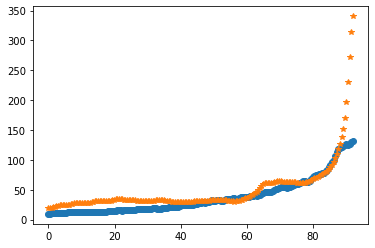

after perturb [1.170645978294245, 95.0603871173836, 28937.35054771903, 0.4189604659597199, 21.73927419584599]
parameters [1.170645978294245, 95.0603871173836, 28937.35054771903, 0.4189604659597199, 21.73927419584599]
oxigeno [5.52024398e-10 5.52855232e-10 5.55378666e-10 5.59687137e-10
 5.65933637e-10 5.74330582e-10 5.85149045e-10 5.98718975e-10
 6.15430907e-10 6.35739539e-10 6.60169316e-10 6.89321988e-10
 7.23885953e-10 7.64647162e-10 8.12501421e-10 8.68468065e-10
 9.33705236e-10 1.00952727e-09 1.09742502e-09 1.19909013e-09
 1.31644462e-09 1.45167698e-09 1.60728598e-09 1.78613310e-09
 1.99150387e-09 2.22717833e-09 2.49750984e-09 2.80751210e-09
 3.16295411e-09 3.57046398e-09 4.03764393e-09 4.57320050e-09
 5.18709595e-09 5.89072802e-09 6.69714592e-09 7.62130985e-09
 8.68039949e-09 9.89417435e-09 1.12853856e-08 1.28802357e-08
 1.47088813e-08 1.68059737e-08 1.92112350e-08 2.19700732e-08
 2.51342470e-08 2.87625992e-08 3.29218889e-08 3.76877548e-08
 4.31458508e-08 4.93931899e-08 5.65397348e-

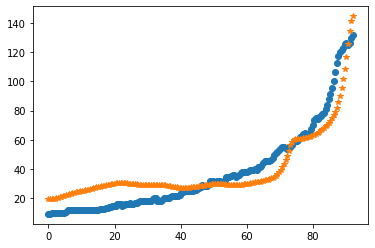

after perturb [3.207824105549314, 102.79826091987579, 28710.869084110003, 1.072335782941121, 37.909530158146524]
parameters [3.207824105549314, 102.79826091987579, 28710.869084110003, 1.072335782941121, 37.909530158146524]
oxigeno [9.79476910e-16 9.94409723e-16 1.03967682e-15 1.11670126e-15
 1.22791232e-15 1.37683404e-15 1.56821373e-15 1.80819523e-15
 2.10454347e-15 2.46692873e-15 2.90728134e-15 3.44023054e-15
 4.08364409e-15 4.85928986e-15 5.79364500e-15 6.91888463e-15
 8.27408935e-15 9.90671969e-15 1.18744169e-14 1.42472032e-14
 1.71101702e-14 2.05667663e-14 2.47428178e-14 2.97914477e-14
 3.58990960e-14 4.32928891e-14 5.22496614e-14 6.31070000e-14
 7.62767683e-14 9.22616595e-14 1.11675460e-13 1.35267844e-13
 1.63954707e-13 1.98855258e-13 2.41337351e-13 2.93072854e-13
 3.56105248e-13 4.32932061e-13 5.26605357e-13 6.40854101e-13
 7.80233062e-13 9.50303867e-13 1.15785499e-12 1.41116887e-12
 1.72034619e-12 2.09769919e-12 2.55822891e-12 3.12020386e-12
 3.80586198e-12 4.64226206e-12 5.6623

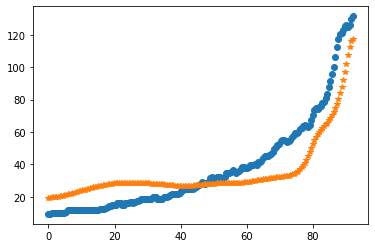

after perturb [0.4035400495005206, 156.6081085782516, 30619.7292290998, 0.5324793892189466, 32.364586505770475]
parameters [0.4035400495005206, 156.6081085782516, 30619.7292290998, 0.5324793892189466, 32.364586505770475]
after perturb [4.007452142548553, 140.61756514551166, 22900.096983233892, 0.8086385765249053, 34.089042888270555]
parameters [4.007452142548553, 140.61756514551166, 22900.096983233892, 0.8086385765249053, 34.089042888270555]
oxigeno [1.24463520e-11 1.25506423e-11 1.28653459e-11 1.33960001e-11
 1.41519668e-11 1.51466334e-11 1.63977012e-11 1.79275650e-11
 1.97637933e-11 2.19397180e-11 2.44951458e-11 2.74772082e-11
 3.09413660e-11 3.49525927e-11 3.95867611e-11 4.49322657e-11
 5.10919168e-11 5.81851495e-11 6.63505987e-11 7.57490993e-11
 8.65671797e-11 9.90211311e-11 1.13361744e-10 1.29879822e-10
 1.48912600e-10 1.70851207e-10 1.96149352e-10 2.25333417e-10
 2.59014181e-10 2.97900452e-10 3.42814868e-10 3.94712241e-10
 4.54700816e-10 5.24066888e-10 6.04303307e-10 6.97142426e-

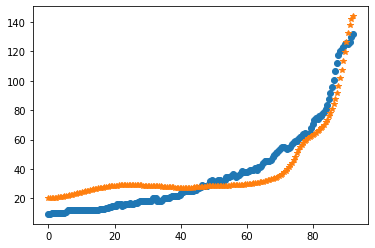

13
after perturb [2.0906738450025983, 89.6992558150668, 19739.839152215867, 0.6977377465787227, 30.885476517639844]
parameters [2.0906738450025983, 89.6992558150668, 19739.839152215867, 0.6977377465787227, 30.885476517639844]
after perturb [2.4645488403413784, 139.87847868592468, 16329.626199634393, 1.3346243747900344, 42.94787032476451]
parameters [2.4645488403413784, 139.87847868592468, 16329.626199634393, 1.3346243747900344, 42.94787032476451]
after perturb [7.072503042832413, 137.20927808498317, 27281.302407805026, 1.0783298873957532, 35.83685752219309]
parameters [7.072503042832413, 137.20927808498317, 27281.302407805026, 1.0783298873957532, 35.83685752219309]
after perturb [4.594034253210165, 173.68850648928358, 21156.63582393821, 1.6331380386809244, 64.87215970160116]
parameters [4.594034253210165, 173.68850648928358, 21156.63582393821, 1.6331380386809244, 64.87215970160116]
after perturb [7.359281487954876, 121.6792160702078, 31416.96424690245, 0.44147305898365524, 36.278879683

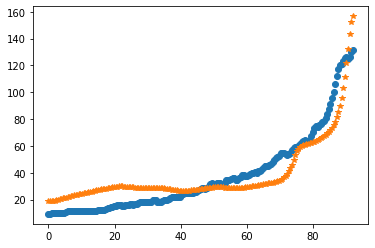

after perturb [8.191876054075838, 110.7789071232083, 24566.465632371728, 0.8061173756422279, 34.24702448776285]
parameters [8.191876054075838, 110.7789071232083, 24566.465632371728, 0.8061173756422279, 34.24702448776285]
after perturb [-2.3966013320292143, 153.08616887392492, 21288.64722108754, 0.6942925375664339, 38.27988040431554]
parameters [-2.3966013320292143, 153.08616887392492, 21288.64722108754, 0.6942925375664339, 38.27988040431554]
after perturb [5.433840565464154, 97.44075360386186, 30367.46615318254, 0.9649058401133698, 30.479037535744308]
parameters [5.433840565464154, 97.44075360386186, 30367.46615318254, 0.9649058401133698, 30.479037535744308]
after perturb [4.933546499987456, 160.42593753224557, 25979.337858960313, 1.2383157313364739, 48.167113688801734]
parameters [4.933546499987456, 160.42593753224557, 25979.337858960313, 1.2383157313364739, 48.167113688801734]
after perturb [2.9816414460780556, 105.94620007068158, 13930.908558846313, 0.7707724431046441, 31.8598828158

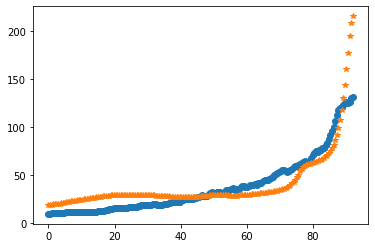

after perturb [4.881101241461407, 42.17511441163713, 29193.24944609865, 0.10688833742472947, 18.491064936399436]
parameters [4.881101241461407, 42.17511441163713, 29193.24944609865, 0.10688833742472947, 18.491064936399436]
after perturb [3.922657066212959, 108.28355451453714, 23002.603380942695, 0.27891841116004745, 28.69915483384533]
parameters [3.922657066212959, 108.28355451453714, 23002.603380942695, 0.27891841116004745, 28.69915483384533]
oxigeno [2.97806506e-07 2.97866685e-07 2.98051049e-07 2.98371073e-07
 2.98845880e-07 2.99502234e-07 3.00374552e-07 3.01504927e-07
 3.02943185e-07 3.04746976e-07 3.06981931e-07 3.09721880e-07
 3.13049157e-07 3.17054998e-07 3.21840060e-07 3.27515051e-07
 3.34201508e-07 3.42032723e-07 3.51154832e-07 3.61728087e-07
 3.73928308e-07 3.87948562e-07 4.04001048e-07 4.22319239e-07
 4.43160283e-07 4.66807693e-07 4.93574343e-07 5.23805815e-07
 5.57884110e-07 5.96231757e-07 6.39316372e-07 6.87655687e-07
 7.41823097e-07 8.02453774e-07 8.70251389e-07 9.45995495

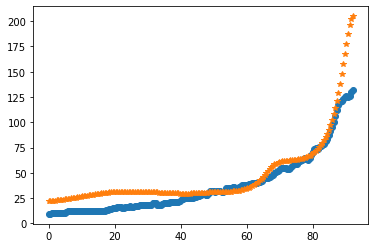

after perturb [5.236992613180078, 134.14266469597547, 25337.081544528064, 1.4327829684716706, 36.06842398970117]
parameters [5.236992613180078, 134.14266469597547, 25337.081544528064, 1.4327829684716706, 36.06842398970117]
oxigeno [9.72448638e-16 9.87144014e-16 1.03168350e-15 1.10744293e-15
 1.21676847e-15 1.36305838e-15 1.55088180e-15 1.78613892e-15
 2.07626873e-15 2.43051214e-15 2.86024051e-15 3.37936208e-15
 4.00482203e-15 4.75721517e-15 5.66153520e-15 6.74808946e-15
 8.05361490e-15 9.62263898e-15 1.15091389e-14 1.37785648e-14
 1.65103065e-14 1.98007028e-14 2.37667110e-14 2.85503857e-14
 3.43243425e-14 4.12984272e-14 4.97278556e-14 5.99231491e-14
 7.22622620e-14 8.72053840e-14 1.05313005e-13 1.27267957e-13
 1.53902311e-13 1.86230173e-13 2.25487679e-13 2.73181747e-13
 3.31149478e-13 4.01630507e-13 4.87355099e-13 5.91651360e-13
 7.18575673e-13 8.73071304e-13 1.06116122e-12 1.29018234e-12
 1.56907017e-12 1.90870426e-12 2.32232769e-12 2.82605600e-12
 3.43949460e-12 4.18648756e-12 5.0960

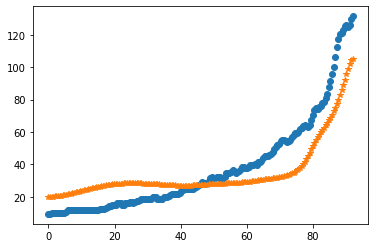

after perturb [3.96166832126914, 167.81260840671177, 14020.831877197674, 0.6987729044279852, 37.180876894362434]
parameters [3.96166832126914, 167.81260840671177, 14020.831877197674, 0.6987729044279852, 37.180876894362434]
after perturb [2.576531976281949, 116.81840215123304, 18117.643582588375, 0.33149128094428215, 21.885564201840374]
parameters [2.576531976281949, 116.81840215123304, 18117.643582588375, 0.33149128094428215, 21.885564201840374]
after perturb [0.3470685111726046, 140.30745091217986, 18959.284022620905, 0.7317959560511534, 36.61584973686021]
parameters [0.3470685111726046, 140.30745091217986, 18959.284022620905, 0.7317959560511534, 36.61584973686021]
after perturb [7.419809339240779, 116.54921615401516, 26091.2529222117, 0.24789965782561962, 27.374785786866877]
parameters [7.419809339240779, 116.54921615401516, 26091.2529222117, 0.24789965782561962, 27.374785786866877]
after perturb [-2.2977165942824427, 129.46203184684148, 25989.473951865035, 1.4400341481986851, 48.282

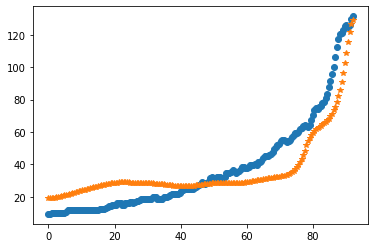

after perturb [-0.2818780100506457, 122.5332944208421, 17721.200406654378, -0.054997504265125174, 29.975155141535556]
parameters [-0.2818780100506457, 122.5332944208421, 17721.200406654378, -0.054997504265125174, 29.975155141535556]
after perturb [1.256600346464304, 131.6967472245508, 20231.424517445455, 1.117028142613424, 36.36917775705536]
parameters [1.256600346464304, 131.6967472245508, 20231.424517445455, 1.117028142613424, 36.36917775705536]
oxigeno [4.45684060e-14 4.50762598e-14 4.66127787e-14 4.92172299e-14
 5.29563808e-14 5.79265076e-14 6.42562713e-14 7.21105409e-14
 8.16952937e-14 9.32637631e-14 1.07124047e-13 1.23648420e-13
 1.43284612e-13 1.66569325e-13 1.94144292e-13 2.26775241e-13
 2.65374228e-13 3.11026025e-13 3.65019510e-13 4.28885375e-13
 5.04441887e-13 5.93850849e-13 6.99686269e-13 8.25018519e-13
 9.73516895e-13 1.14957355e-12 1.35845182e-12 1.60646231e-12
 1.90117059e-12 2.25164189e-12 2.66873010e-12 3.16542128e-12
 3.75724586e-12 4.46277744e-12 5.30424054e-12 6.3082

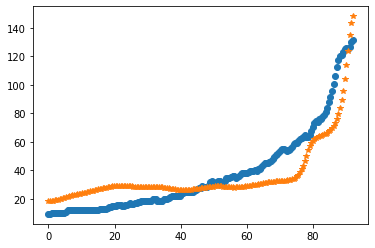

after perturb [1.7438603223226625, 141.94854947430048, 22462.43153720865, 1.3999189079326788, 50.53755242512508]
parameters [1.7438603223226625, 141.94854947430048, 22462.43153720865, 1.3999189079326788, 50.53755242512508]
after perturb [1.7526374702069318, 107.28107503316423, 21885.514854292764, 0.6433879769063222, 24.547729651724083]
parameters [1.7526374702069318, 107.28107503316423, 21885.514854292764, 0.6433879769063222, 24.547729651724083]
oxigeno [4.96975192e-12 5.01442948e-12 5.14934213e-12 5.37715135e-12
 5.70236488e-12 6.13144592e-12 6.67296819e-12 7.33781990e-12
 8.13946036e-12 9.09423436e-12 1.02217510e-11 1.15453353e-11
 1.30925613e-11 1.48958802e-11 1.69933552e-11 1.94295223e-11
 2.22563973e-11 2.55346555e-11 2.93350191e-11 3.37398902e-11
 3.88452803e-11 4.47630925e-11 5.16238202e-11 5.95797351e-11
 6.88086420e-11 7.95182880e-11 9.19515214e-11 1.06392311e-10
 1.23172758e-10 1.42681259e-10 1.65372017e-10 1.91776156e-10
 2.22514723e-10 2.58313940e-10 3.00023125e-10 3.486357

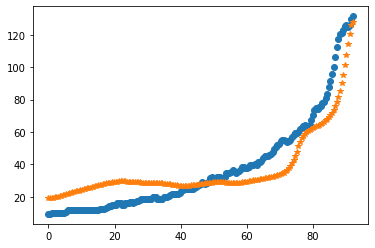

after perturb [4.563068530946396, 111.43977494879218, 24174.207404416924, 0.320330141347668, 28.06453054317311]
parameters [4.563068530946396, 111.43977494879218, 24174.207404416924, 0.320330141347668, 28.06453054317311]
oxigeno [5.16177117e-08 5.16954139e-08 5.19297536e-08 5.23244401e-08
 5.28856895e-08 5.36222770e-08 5.45456111e-08 5.56698323e-08
 5.70119385e-08 5.85919395e-08 6.04330429e-08 6.25618766e-08
 6.50087509e-08 6.78079633e-08 7.09981539e-08 7.46227135e-08
 7.87302526e-08 8.33751367e-08 8.86180954e-08 9.45269131e-08
 1.01177211e-07 1.08653327e-07 1.17049313e-07 1.26470045e-07
 1.37032479e-07 1.48867054e-07 1.62119257e-07 1.76951381e-07
 1.93544475e-07 2.12100526e-07 2.32844885e-07 2.56028956e-07
 2.81933192e-07 3.10870412e-07 3.43189475e-07 3.79279348e-07
 4.19573606e-07 4.64555396e-07 5.14762930e-07 5.70795536e-07
 6.33320343e-07 7.03079653e-07 7.80899065e-07 8.67696454e-07
 9.64491869e-07 1.07241846e-06 1.19273457e-06 1.32683705e-06
 1.47627604e-06 1.64277129e-06 1.828230

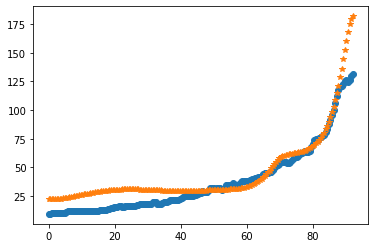

after perturb [2.241572402091537, 120.06605074669868, 22848.531732362233, 0.1682472309205037, 11.405167911521254]
parameters [2.241572402091537, 120.06605074669868, 22848.531732362233, 0.1682472309205037, 11.405167911521254]
oxigeno [4.52113126e-05 4.52059549e-05 4.51901830e-05 4.51648950e-05
 4.51315709e-05 4.50922488e-05 4.50494942e-05 4.50063639e-05
 4.49663684e-05 4.49334334e-05 4.49118639e-05 4.49063121e-05
 4.49217507e-05 4.49634530e-05 4.50369803e-05 4.51481777e-05
 4.53031777e-05 4.55084128e-05 4.57706359e-05 4.60969490e-05
 4.64948382e-05 4.69722163e-05 4.75374700e-05 4.81995113e-05
 4.89678333e-05 4.98525682e-05 5.08645479e-05 5.20153671e-05
 5.33174495e-05 5.47841172e-05 5.64296653e-05 5.82694414e-05
 6.03199324e-05 6.25988572e-05 6.51252686e-05 6.79196600e-05
 7.10040803e-05 7.44022530e-05 7.81396993e-05 8.22438643e-05
 8.67442445e-05 9.16725177e-05 9.70626745e-05 1.02951154e-04
 1.09376988e-04 1.16381954e-04 1.24010743e-04 1.32311153e-04
 1.41334299e-04 1.51134865e-04 1.61

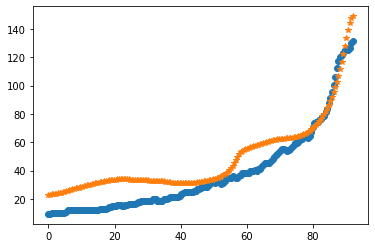

after perturb [1.9946339647577134, 126.84084277599608, 19726.434384166783, 0.9498557702461304, 39.373979767810575]
parameters [1.9946339647577134, 126.84084277599608, 19726.434384166783, 0.9498557702461304, 39.373979767810575]
after perturb [4.443550076472706, 85.48685225334859, 29253.415231369025, 0.35609278271805656, 30.08513380182466]
parameters [4.443550076472706, 85.48685225334859, 29253.415231369025, 0.35609278271805656, 30.08513380182466]
after perturb [2.5790927373425907, 65.7765665109512, 25279.329442140683, 0.9047627806560992, 24.917546390291065]
parameters [2.5790927373425907, 65.7765665109512, 25279.329442140683, 0.9047627806560992, 24.917546390291065]
oxigeno [2.15140620e-18 2.19185035e-18 2.31502792e-18 2.52656552e-18
 2.83614980e-18 3.25800791e-18 3.81161494e-18 4.52266536e-18
 5.42435954e-18 6.55907261e-18 7.98049366e-18 9.75634815e-18
 1.19718476e-17 1.47340504e-17 1.81773675e-17 2.24705091e-17
 2.78252504e-17 3.45074956e-17 4.28512497e-17 5.32762744e-17
 6.63104141e-1

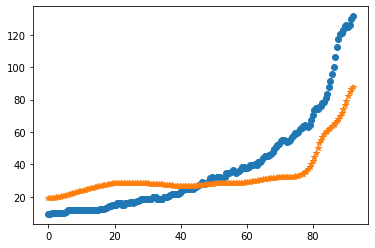

after perturb [2.7021053708469873, 110.90928315918707, 26301.740174471266, 0.4213764583233883, 31.349993499224]
parameters [2.7021053708469873, 110.90928315918707, 26301.740174471266, 0.4213764583233883, 31.349993499224]
oxigeno [1.56622382e-09 1.57348533e-09 1.59537286e-09 1.63219700e-09
 1.68448063e-09 1.75296678e-09 1.83862988e-09 1.94269040e-09
 2.06663314e-09 2.21222944e-09 2.38156365e-09 2.57706419e-09
 2.80153979e-09 3.05822144e-09 3.35081079e-09 3.68353577e-09
 4.06121461e-09 4.48932909e-09 4.97410870e-09 5.52262689e-09
 6.14291139e-09 6.84407032e-09 7.63643634e-09 8.53173118e-09
 9.54325319e-09 1.06860910e-08 1.19773661e-08 1.34365093e-08
 1.50855727e-08 1.69495853e-08 1.90569542e-08 2.14399191e-08
 2.41350662e-08 2.71839085e-08 3.06335400e-08 3.45373724e-08
 3.89559639e-08 4.39579479e-08 4.96210746e-08 5.60333735e-08
 6.32944527e-08 7.15169464e-08 8.08281284e-08 9.13717107e-08
 1.03309850e-07 1.16825391e-07 1.32124374e-07 1.49438856e-07
 1.69030079e-07 1.91192046e-07 2.162555

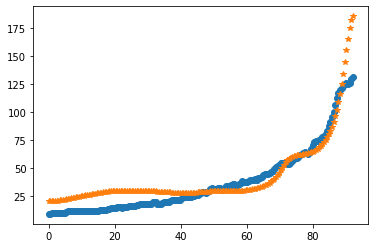

after perturb [8.10630567525552, 149.4508732991281, 26033.45343668885, 1.2198603814318603, 37.258928270813065]
parameters [8.10630567525552, 149.4508732991281, 26033.45343668885, 1.2198603814318603, 37.258928270813065]
after perturb [2.6581167782251107, 75.2295061433966, 34832.95623134146, 0.5605127151255638, 28.001393117135983]
parameters [2.6581167782251107, 75.2295061433966, 34832.95623134146, 0.5605127151255638, 28.001393117135983]
after perturb [3.315753604774914, 74.5607872162013, 30167.483345513094, 0.8843325317234297, 39.95275259396418]
parameters [3.315753604774914, 74.5607872162013, 30167.483345513094, 0.8843325317234297, 39.95275259396418]
after perturb [6.339483803117249, 63.29417621885764, 25276.53652949809, 0.1388375172036167, 24.52990991825044]
parameters [6.339483803117249, 63.29417621885764, 25276.53652949809, 0.1388375172036167, 24.52990991825044]
oxigeno [2.57063556e-04 2.56893966e-04 2.56386308e-04 2.55543896e-04
 2.54372201e-04 2.52878773e-04 2.51073133e-04 2.48966

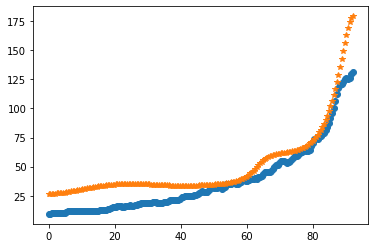

after perturb [2.4167460857821688, 150.59453715778767, 23955.73133491256, 1.5593280938750445, 48.9249894091724]
parameters [2.4167460857821688, 150.59453715778767, 23955.73133491256, 1.5593280938750445, 48.9249894091724]
after perturb [3.6080706203660156, 149.6105447499035, 31938.896220814582, 1.2647185202757973, 40.69392620190164]
parameters [3.6080706203660156, 149.6105447499035, 31938.896220814582, 1.2647185202757973, 40.69392620190164]
after perturb [-5.500186724794231, 141.06824518472422, 17110.78805108292, 0.9722796725990388, 30.98622868485316]
parameters [-5.500186724794231, 141.06824518472422, 17110.78805108292, 0.9722796725990388, 30.98622868485316]
after perturb [4.117578360875829, 87.97068596294497, 30255.661149940668, -0.14444613450327837, 21.594997058637766]
parameters [4.117578360875829, 87.97068596294497, 30255.661149940668, -0.14444613450327837, 21.594997058637766]
after perturb [1.0001733264697252, 175.62591210785922, 16231.706227253733, 1.4478692755769158, 44.38977733

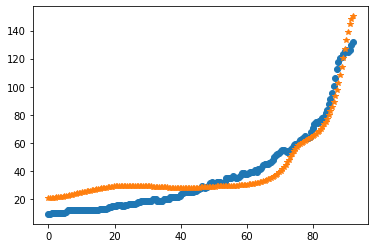

14
after perturb [8.183992997811742, 100.36974070395671, 29055.768850486544, 0.6065804931895318, 20.48180152658729]
parameters [8.183992997811742, 100.36974070395671, 29055.768850486544, 0.6065804931895318, 20.48180152658729]
after perturb [0.7929700367676508, 127.87946988794128, 20279.530274473338, 0.802251661494298, 31.503557817180514]
parameters [0.7929700367676508, 127.87946988794128, 20279.530274473338, 0.802251661494298, 31.503557817180514]
oxigeno [3.54040604e-12 3.57072265e-12 3.66234155e-12 3.81727629e-12
 4.03890452e-12 4.33200447e-12 4.70281446e-12 5.15912572e-12
 5.71042242e-12 6.36808458e-12 7.14566875e-12 8.05927553e-12
 9.12800428e-12 1.03744844e-11 1.18254642e-11 1.35124367e-11
 1.54722890e-11 1.77479812e-11 2.03892919e-11 2.34536964e-11
 2.70074823e-11 3.11272258e-11 3.59017582e-11 4.14347341e-11
 4.78478617e-11 5.52847871e-11 6.39155410e-11 7.39414022e-11
 8.56000225e-11 9.91707373e-11 1.14980155e-10 1.33408355e-10
 1.54896286e-10 1.79955157e-10 2.09178720e-10 2.43259

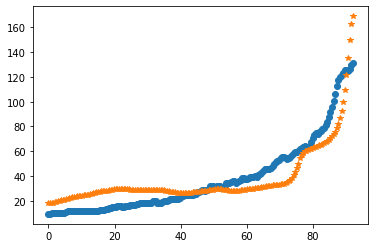

after perturb [3.405517804340287, 117.75078186638274, 21155.51194283611, 0.5155093867647431, 37.68770566117417]
parameters [3.405517804340287, 117.75078186638274, 21155.51194283611, 0.5155093867647431, 37.68770566117417]
oxigeno [2.78692855e-10 2.80549195e-10 2.86145070e-10 2.95561536e-10
 3.08935313e-10 3.26461243e-10 3.48395785e-10 3.75061590e-10
 4.06853224e-10 4.44244120e-10 4.87794886e-10 5.38163083e-10
 5.96114653e-10 6.62537185e-10 7.38455267e-10 8.25048192e-10
 9.23670360e-10 1.03587474e-09 1.16343987e-09 1.30840085e-09
 1.47308497e-09 1.66015264e-09 1.87264435e-09 2.11403453e-09
 2.38829336e-09 2.69995759e-09 3.05421161e-09 3.45698029e-09
 3.91503506e-09 4.43611520e-09 5.02906617e-09 5.70399749e-09
 6.47246247e-09 7.34766285e-09 8.34468138e-09 9.48074593e-09
 1.07755290e-08 1.22514872e-08 1.39342451e-08 1.58530300e-08
 1.80411622e-08 2.05366095e-08 2.33826128e-08 2.66283922e-08
 3.03299452e-08 3.45509470e-08 3.93637693e-08 4.48506328e-08
 5.11049122e-08 5.82326147e-08 6.635405

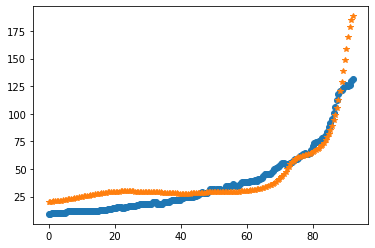

after perturb [1.6129059396334267, 107.35349905678143, 21840.419754770217, 1.0254746301705162, 24.633103868808803]
parameters [1.6129059396334267, 107.35349905678143, 21840.419754770217, 1.0254746301705162, 24.633103868808803]
oxigeno [4.59708335e-15 4.65935218e-15 4.84796318e-15 5.16839400e-15
 5.62998990e-15 6.24629356e-15 7.03551971e-15 8.02118909e-15
 9.23294194e-15 1.07075583e-14 1.24902200e-14 1.46360569e-14
 1.72120311e-14 2.02992215e-14 2.39955865e-14 2.84192991e-14
 3.37127726e-14 4.00475251e-14 4.76300715e-14 5.67090816e-14
 6.75841002e-14 8.06161980e-14 9.62409952e-14 1.14984587e-13
 1.37482990e-13 1.64505844e-13 1.96985215e-13 2.36050523e-13
 2.83070825e-13 3.39705977e-13 4.07968564e-13 4.90298999e-13
 5.89656786e-13 7.09631662e-13 8.54579184e-13 1.02978620e-12
 1.24167267e-12 1.49803721e-12 1.80835499e-12 2.18413756e-12
 2.63936578e-12 3.19100864e-12 3.85964313e-12 4.67019331e-12
 5.65281109e-12 6.84392641e-12 8.28750174e-12 1.00365344e-11
 1.21548604e-11 1.47193270e-11 1.

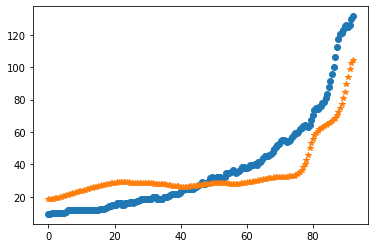

after perturb [0.2670996221709787, 145.45092539892178, 24613.725613607297, 1.0021407364121786, 45.081046559033055]
parameters [0.2670996221709787, 145.45092539892178, 24613.725613607297, 1.0021407364121786, 45.081046559033055]
oxigeno [1.08461637e-12 1.09367734e-12 1.12120254e-12 1.16818930e-12
 1.23621357e-12 1.32733551e-12 1.44401796e-12 1.58907972e-12
 1.76569464e-12 1.97744479e-12 2.22844526e-12 2.52357054e-12
 2.86880076e-12 3.27165596e-12 3.74162150e-12 4.29044133e-12
 4.93220426e-12 5.68325573e-12 6.56207316e-12 7.58927452e-12
 8.78786120e-12 1.01836914e-11 1.18061566e-11 1.36891541e-11
 1.58726375e-11 1.84050818e-11 2.13469130e-11 2.47743423e-11
 2.87824805e-11 3.34865745e-11 3.90209715e-11 4.55367561e-11
 5.32003347e-11 6.21956249e-11 7.27313063e-11 8.50522530e-11
 9.94525782e-11 1.16288388e-10 1.35990946e-10 1.59082986e-10
 1.86200181e-10 2.18116303e-10 2.55766665e-10 3.00262981e-10
 3.52895490e-10 4.15125147e-10 4.88577851e-10 5.75059982e-10
 6.76613962e-10 7.95618719e-10 9.

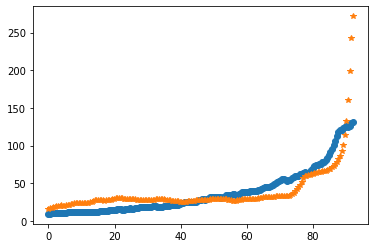

after perturb [2.8911672086922966, 148.69462817066335, 23919.699347730664, 0.5556562952499866, 26.47338722944984]
parameters [2.8911672086922966, 148.69462817066335, 23919.699347730664, 0.5556562952499866, 26.47338722944984]
oxigeno [2.11165013e-09 2.12329333e-09 2.15836472e-09 2.21729184e-09
 2.30079476e-09 2.40989730e-09 2.54594290e-09 2.71061531e-09
 2.90596423e-09 3.13443618e-09 3.39891103e-09 3.70274460e-09
 4.04981796e-09 4.44459410e-09 4.89218290e-09 5.39841544e-09
 5.96992886e-09 6.61426324e-09 7.33997212e-09 8.15674856e-09
 9.07556884e-09 1.01088563e-08 1.12706675e-08 1.25769048e-08
 1.40455566e-08 1.56969712e-08 1.75541665e-08 1.96431808e-08
 2.19934695e-08 2.46383531e-08 2.76155228e-08 3.09676107e-08
 3.47428311e-08 3.89957030e-08 4.37878597e-08 4.91889585e-08
 5.52776981e-08 6.21429561e-08 6.98850580e-08 7.86171915e-08
 8.84669807e-08 9.95782358e-08 1.12112900e-07 1.26253213e-07
 1.42204121e-07 1.60195964e-07 1.80487475e-07 2.03369143e-07
 2.29166976e-07 2.58246744e-07 2.91

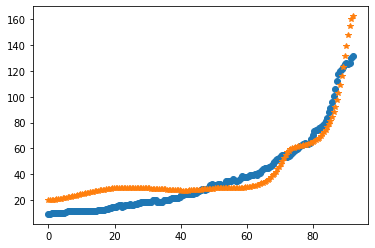

15
after perturb [0.5485190823713078, 135.45553424125652, 30251.268668417102, 1.0686549621601864, 31.184983043816068]
parameters [0.5485190823713078, 135.45553424125652, 30251.268668417102, 1.0686549621601864, 31.184983043816068]
after perturb [-1.7796961075854094, 114.11941487668938, 17195.415515981404, 0.5933180886033287, 36.90607333063752]
parameters [-1.7796961075854094, 114.11941487668938, 17195.415515981404, 0.5933180886033287, 36.90607333063752]
after perturb [-0.6718602192973628, 89.09495487032336, 24794.335122676865, 0.6775744104922532, 30.500962384626177]
parameters [-0.6718602192973628, 89.09495487032336, 24794.335122676865, 0.6775744104922532, 30.500962384626177]
after perturb [3.614891195040009, 134.31295933021036, 21315.85736184317, 1.374085390236514, 48.65632751452682]
parameters [3.614891195040009, 134.31295933021036, 21315.85736184317, 1.374085390236514, 48.65632751452682]
oxigeno [2.01929173e-15 2.04787681e-15 2.13446810e-15 2.28160231e-15
 2.49360367e-15 2.77673194e-

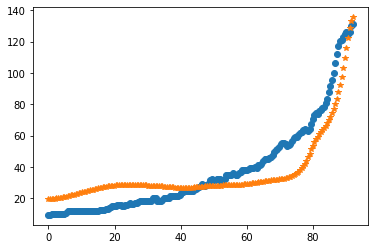

after perturb [4.822259519401454, 67.33983059241216, 21534.794399381273, 1.1226278607536067, 31.106685393216814]
parameters [4.822259519401454, 67.33983059241216, 21534.794399381273, 1.1226278607536067, 31.106685393216814]
oxigeno [3.64233678e-20 3.73864290e-20 4.03268479e-20 4.54012390e-20
 5.28805008e-20 6.31652569e-20 7.68087768e-20 9.45487773e-20
 1.17350055e-19 1.46460574e-19 1.83484476e-19 2.30476548e-19
 2.90064035e-19 3.65603440e-19 4.61382188e-19 5.82877924e-19
 7.37091939e-19 9.32978054e-19 1.18199451e-18 1.49881448e-18
 1.90224128e-18 2.41638779e-18 3.07219718e-18 3.90940458e-18
 4.97906860e-18 6.34683963e-18 8.09718059e-18 1.03388194e-17
 1.32117941e-17 1.68965576e-17 2.16257447e-17 2.76993817e-17
 3.55045446e-17 4.55407642e-17 5.84528559e-17 7.50733326e-17
 9.64771881e-17 1.24052634e-16 1.59592406e-16 2.05411586e-16
 2.64499555e-16 3.40715917e-16 4.39042968e-16 5.65910911e-16
 7.29616590e-16 9.40862368e-16 1.21344935e-15 1.56516873e-15
 2.01894752e-15 2.60432040e-15 3.3593

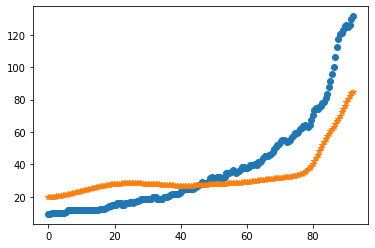

after perturb [3.093447149822591, 2.6243872251889613, 19859.435612656052, -0.30561657496857003, -9.128728511022956]
parameters [3.093447149822591, 2.6243872251889613, 19859.435612656052, -0.30561657496857003, -9.128728511022956]
after perturb [2.43649225964479, 132.39523427772338, 18800.44318422384, 1.1132080675401044, 53.51703527676825]
parameters [2.43649225964479, 132.39523427772338, 18800.44318422384, 1.1132080675401044, 53.51703527676825]
after perturb [-2.5990907648145516, 131.38919905840268, 22954.172561546045, 0.559834445665896, 27.49330059401933]
parameters [-2.5990907648145516, 131.38919905840268, 22954.172561546045, 0.559834445665896, 27.49330059401933]
after perturb [4.652124498491008, 88.03350773841917, 27000.667267388537, 1.1869880015666074, 40.215815319870075]
parameters [4.652124498491008, 88.03350773841917, 27000.667267388537, 1.1869880015666074, 40.215815319870075]
oxigeno [6.12342163e-18 6.24780385e-18 6.62606503e-18 7.27377918e-18
 8.21768227e-18 9.49688089e-18 1.11

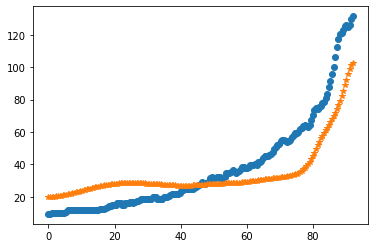

after perturb [1.9528915759900167, 133.53429037892218, 20453.15663127869, 0.5027498859820538, 26.12116083586482]
parameters [1.9528915759900167, 133.53429037892218, 20453.15663127869, 0.5027498859820538, 26.12116083586482]
oxigeno [1.74853690e-09 1.75830106e-09 1.78771892e-09 1.83716854e-09
 1.90728664e-09 1.99897855e-09 2.11343216e-09 2.25213624e-09
 2.41690299e-09 2.60989528e-09 2.83365882e-09 3.09115964e-09
 3.38582743e-09 3.72160528e-09 4.10300660e-09 4.53518023e-09
 5.02398489e-09 5.57607443e-09 6.19899576e-09 6.90130149e-09
 7.69267962e-09 8.58410296e-09 9.58800075e-09 1.07184555e-08
 1.19914273e-08 1.34250090e-08 1.50397149e-08 1.68588056e-08
 1.89086550e-08 2.12191621e-08 2.38242156e-08 2.67622185e-08
 3.00766815e-08 3.38168957e-08 3.80386954e-08 4.28053209e-08
 4.81883925e-08 5.42690041e-08 6.11389436e-08 6.89020476e-08
 7.76756965e-08 8.75924573e-08 9.88018867e-08 1.11472509e-07
 1.25793995e-07 1.41979569e-07 1.60268701e-07 1.80930113e-07
 2.04265192e-07 2.30611864e-07 2.6034

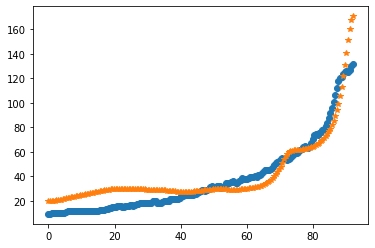

after perturb [1.5433895729094336, 146.59606044997662, 22398.290028560747, 1.2884774406372665, 47.52698368553555]
parameters [1.5433895729094336, 146.59606044997662, 22398.290028560747, 1.2884774406372665, 47.52698368553555]
oxigeno [2.81137835e-14 2.84391643e-14 2.94235727e-14 3.10920697e-14
 3.34873048e-14 3.66708576e-14 4.07251594e-14 4.57560435e-14
 5.18959978e-14 5.93082142e-14 6.81915594e-14 7.87866155e-14
 9.13829685e-14 1.06327956e-13 1.24037123e-13 1.45006695e-13
 1.69828452e-13 1.99207502e-13 2.33983577e-13 2.75156687e-13
 3.23918113e-13 3.81688004e-13 4.50161022e-13 5.31361738e-13
 6.27711688e-13 7.42110258e-13 8.78031858e-13 1.03964224e-12
 1.23193741e-12 1.46090940e-12 1.73374434e-12 2.05905976e-12
 2.44718982e-12 2.91052943e-12 3.46395030e-12 4.12530456e-12
 4.91603334e-12 5.86190032e-12 6.99387155e-12 8.34916533e-12
 9.97249789e-12 1.19175543e-11 1.42487190e-11 1.70431073e-11
 2.03929509e-11 2.44084031e-11 2.92208479e-11 3.49868196e-11
 4.18926637e-11 5.01601002e-11 6.00

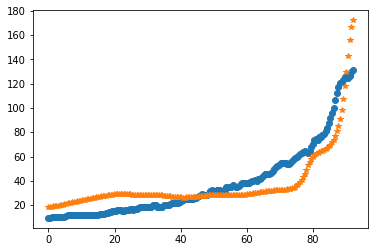

after perturb [4.000025127990955, 74.11439522613779, 19514.01533540425, -0.20052455343094805, 8.74101551322848]
parameters [4.000025127990955, 74.11439522613779, 19514.01533540425, -0.20052455343094805, 8.74101551322848]
after perturb [-0.5196552700815364, 141.64292107038486, 28970.71021511141, 0.8112139780126943, 46.99893411024905]
parameters [-0.5196552700815364, 141.64292107038486, 28970.71021511141, 0.8112139780126943, 46.99893411024905]
after perturb [2.402593031291573, 108.2457430219011, 24817.9243304203, 0.13356684696784593, 24.30733157394042]
parameters [2.402593031291573, 108.2457430219011, 24817.9243304203, 0.13356684696784593, 24.30733157394042]
oxigeno [4.29284489e-04 4.29093079e-04 4.28521002e-04 4.27574666e-04
 4.26264576e-04 4.24605086e-04 4.22614070e-04 4.20312538e-04
 4.17724211e-04 4.14875083e-04 4.11792983e-04 4.08507165e-04
 4.05047933e-04 4.01446309e-04 3.97733770e-04 3.93942031e-04
 3.90102898e-04 3.86248182e-04 3.82409663e-04 3.78619108e-04
 3.74908321e-04 3.7130

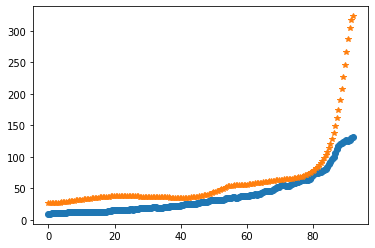

after perturb [2.0750142459773255, 87.22933484760524, 24966.224578705776, 0.2237767633840616, 23.196216137509957]
parameters [2.0750142459773255, 87.22933484760524, 24966.224578705776, 0.2237767633840616, 23.196216137509957]
oxigeno [3.70893288e-06 3.70584579e-06 3.69662187e-06 3.68137198e-06
 3.66027695e-06 3.63358216e-06 3.60159036e-06 3.56465349e-06
 3.52316392e-06 3.47754556e-06 3.42824544e-06 3.37572589e-06
 3.32045775e-06 3.26291470e-06 3.20356881e-06 3.14288735e-06
 3.08133088e-06 3.01935252e-06 2.95739840e-06 2.89590901e-06
 2.83532139e-06 2.77607200e-06 2.71859983e-06 2.66334992e-06
 2.61077679e-06 2.56134796e-06 2.51554738e-06 2.47387893e-06
 2.43687001e-06 2.40507555e-06 2.37908239e-06 2.35951438e-06
 2.34703816e-06 2.34236992e-06 2.34628289e-06 2.35961583e-06
 2.38328223e-06 2.41828046e-06 2.46570455e-06 2.52675576e-06
 2.60275504e-06 2.69515618e-06 2.80556011e-06 2.93573028e-06
 3.08760943e-06 3.26333808e-06 3.46527496e-06 3.69601978e-06
 3.95843879e-06 4.25569335e-06 4.59

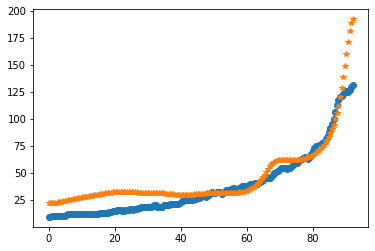

after perturb [-1.0345183928553408, 175.56626400827884, 21072.749818094868, 0.7639972209996757, 40.138841752482115]
parameters [-1.0345183928553408, 175.56626400827884, 21072.749818094868, 0.7639972209996757, 40.138841752482115]
after perturb [-0.39553797177524164, 114.82594523459207, 20490.669685293535, 1.0451411832870274, 50.50747646584833]
parameters [-0.39553797177524164, 114.82594523459207, 20490.669685293535, 1.0451411832870274, 50.50747646584833]
after perturb [1.6793374041317528, 108.87875447164156, 18250.809151941146, 0.6934059534416408, 36.71270345815652]
parameters [1.6793374041317528, 108.87875447164156, 18250.809151941146, 0.6934059534416408, 36.71270345815652]
after perturb [4.565454281847709, 160.44425380279534, 24975.043042811496, 1.6640920879033438, 60.782192469042656]
parameters [4.565454281847709, 160.44425380279534, 24975.043042811496, 1.6640920879033438, 60.782192469042656]
after perturb [-4.041413446026216, 169.0594802326583, 20239.48013032653, 1.1046141894905621,

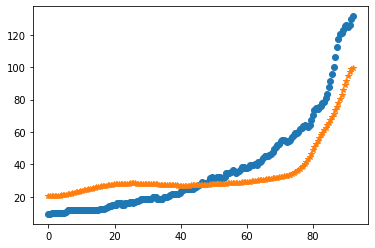

after perturb [9.24425611608719, 57.57731200685157, 25018.541638626102, -0.6311577613363087, -7.663176698704483]
parameters [9.24425611608719, 57.57731200685157, 25018.541638626102, -0.6311577613363087, -7.663176698704483]
after perturb [-0.08261696305987165, 44.65915929859518, 32961.19338462682, 0.1619283673317492, 28.618601369136332]
parameters [-0.08261696305987165, 44.65915929859518, 32961.19338462682, 0.1619283673317492, 28.618601369136332]
after perturb [0.34561166994331816, 169.65599923881405, 12226.900009187932, 1.6318452981887899, 51.884944600172346]
parameters [0.34561166994331816, 169.65599923881405, 12226.900009187932, 1.6318452981887899, 51.884944600172346]
after perturb [0.7876589962459144, 118.80510975884205, 32499.515702754063, 0.4772780961154362, 21.18973250280894]
parameters [0.7876589962459144, 118.80510975884205, 32499.515702754063, 0.4772780961154362, 21.18973250280894]
after perturb [-0.3905977432411416, 174.4302062461299, 18573.26724180648, 1.2293746116321507, 52

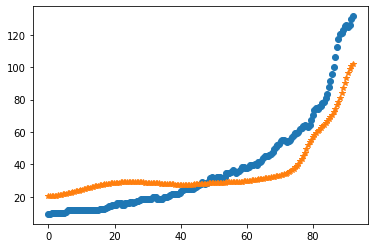

after perturb [-0.594553389464763, 124.65156036023355, 21840.538322702894, 0.6355333581469261, 33.11628074021428]
parameters [-0.594553389464763, 124.65156036023355, 21840.538322702894, 0.6355333581469261, 33.11628074021428]
after perturb [-1.7399441870745398, 116.2489033007796, 21909.204530062754, 1.2327798813547857, 42.72177686015031]
parameters [-1.7399441870745398, 116.2489033007796, 21909.204530062754, 1.2327798813547857, 42.72177686015031]
after perturb [3.0778745202948885, 121.94489936480876, 20141.278685788773, 0.583286358920582, 21.85676346438053]
parameters [3.0778745202948885, 121.94489936480876, 20141.278685788773, 0.583286358920582, 21.85676346438053]
oxigeno [1.02928240e-10 1.03681081e-10 1.05951361e-10 1.09774577e-10
 1.15210664e-10 1.22345161e-10 1.31290877e-10 1.42190061e-10
 1.55217134e-10 1.70582013e-10 1.88534080e-10 2.09366882e-10
 2.33423636e-10 2.61103634e-10 2.92869703e-10 3.29256834e-10
 3.70882175e-10 4.18456591e-10 4.72798026e-10 5.34846941e-10
 6.05684166e-1

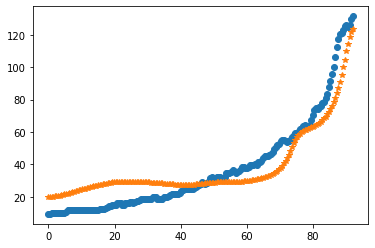

after perturb [-2.379255307369824, 123.6386454094446, 17071.468168261246, 0.9274881176872127, 44.55515912892217]
parameters [-2.379255307369824, 123.6386454094446, 17071.468168261246, 0.9274881176872127, 44.55515912892217]
after perturb [1.7195913699917678, 56.216482990097596, 21941.613658759477, 0.18269614287784458, 11.805826169139717]
parameters [1.7195913699917678, 56.216482990097596, 21941.613658759477, 0.18269614287784458, 11.805826169139717]
oxigeno [1.91636176e-05 1.91429267e-05 1.90811219e-05 1.89789957e-05
 1.88378304e-05 1.86593455e-05 1.84456307e-05 1.81990717e-05
 1.79222736e-05 1.76179876e-05 1.72890428e-05 1.69382863e-05
 1.65685323e-05 1.61825191e-05 1.57828749e-05 1.53720922e-05
 1.49525102e-05 1.45263056e-05 1.40954915e-05 1.36619233e-05
 1.32273111e-05 1.27932345e-05 1.23611600e-05 1.19324563e-05
 1.15084062e-05 1.10902139e-05 1.06790075e-05 1.02758365e-05
 9.88166772e-06 9.49737892e-06 9.12375502e-06 8.76148616e-06
 8.41116963e-06 8.07331523e-06 7.74835343e-06 7.4366

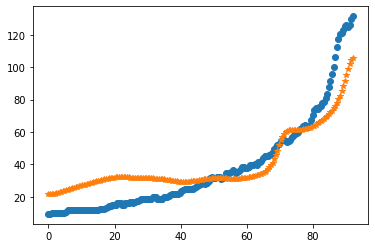

after perturb [-0.6202388186819792, 110.41383370831588, 21869.54557490642, -0.06013633659361206, 23.334773388997096]
parameters [-0.6202388186819792, 110.41383370831588, 21869.54557490642, -0.06013633659361206, 23.334773388997096]
after perturb [-1.3466698741792098, 232.97134401691227, 14095.864715283178, 2.1307672147449384, 69.6610210414515]
parameters [-1.3466698741792098, 232.97134401691227, 14095.864715283178, 2.1307672147449384, 69.6610210414515]
after perturb [7.64593005969544, 152.60888661723197, 26035.42949403442, 1.1107134607492628, 48.61234142150348]
parameters [7.64593005969544, 152.60888661723197, 26035.42949403442, 1.1107134607492628, 48.61234142150348]
after perturb [-0.13249712193362795, 200.385398485037, 25013.220471980254, 1.184592218337276, 51.08794073220178]
parameters [-0.13249712193362795, 200.385398485037, 25013.220471980254, 1.184592218337276, 51.08794073220178]
after perturb [0.9041492842849536, 150.86564783519052, 19178.965674574276, 0.8781882089022701, 36.8131

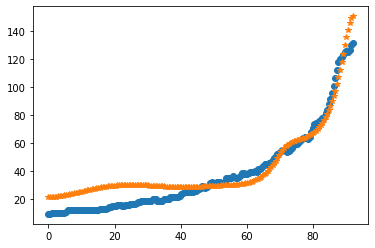

16
after perturb [-0.7649737002917236, 145.61941162895204, 17591.23797436901, 0.6541344367420152, 36.79040613028819]
parameters [-0.7649737002917236, 145.61941162895204, 17591.23797436901, 0.6541344367420152, 36.79040613028819]
after perturb [1.0357328556784466, 71.97463228242547, 19339.89066539573, 0.12907151101356057, 2.3025047318168816]
parameters [1.0357328556784466, 71.97463228242547, 19339.89066539573, 0.12907151101356057, 2.3025047318168816]
after perturb [0.9406729236462088, 168.53649025172652, 20421.48892876997, 0.9069936584149139, 40.298861225391406]
parameters [0.9406729236462088, 168.53649025172652, 20421.48892876997, 0.9069936584149139, 40.298861225391406]
after perturb [4.321873033702761, 114.33279119961686, 24098.624151321703, 0.7481510070163451, 30.976579471268067]
parameters [4.321873033702761, 114.33279119961686, 24098.624151321703, 0.7481510070163451, 30.976579471268067]
oxigeno [1.67053177e-12 1.68718895e-12 1.73750345e-12 1.82251248e-12
 1.94397281e-12 2.10440357e-

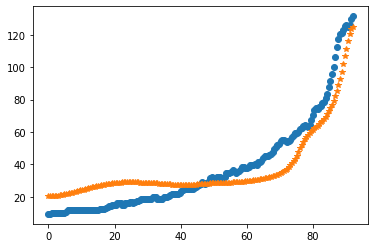

after perturb [0.43303898729018836, 119.48337918250839, 16520.26205985981, 0.4996953966894536, 32.67818379325112]
parameters [0.43303898729018836, 119.48337918250839, 16520.26205985981, 0.4996953966894536, 32.67818379325112]
after perturb [5.6708839018832355, 88.7128991548908, 19763.384440259655, -0.27219704092843744, 26.232735439309113]
parameters [5.6708839018832355, 88.7128991548908, 19763.384440259655, -0.27219704092843744, 26.232735439309113]
after perturb [-1.9201702294074625, 157.12765136126052, 16713.38020461865, 0.7544948721818959, 42.51847842163828]
parameters [-1.9201702294074625, 157.12765136126052, 16713.38020461865, 0.7544948721818959, 42.51847842163828]
after perturb [5.837911609699578, 129.13556045020712, 28727.289677945093, 1.1734636925682793, 42.613295833297414]
parameters [5.837911609699578, 129.13556045020712, 28727.289677945093, 1.1734636925682793, 42.613295833297414]
oxigeno [1.39489365e-14 1.41329886e-14 1.46900990e-14 1.56352800e-14
 1.69940595e-14 1.88032587e-1

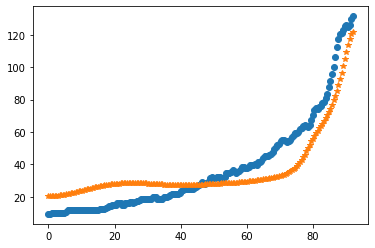

after perturb [3.8741820622567427, 17.793881463831077, 20960.42785287859, -0.9570012983569245, -2.0701406794569]
parameters [3.8741820622567427, 17.793881463831077, 20960.42785287859, -0.9570012983569245, -2.0701406794569]
after perturb [1.15076401665894, 85.66547184299392, 27514.29652934309, 0.2812579043527932, 20.24793371552402]
parameters [1.15076401665894, 85.66547184299392, 27514.29652934309, 0.2812579043527932, 20.24793371552402]
oxigeno [2.25283941e-07 2.25050566e-07 2.24354994e-07 2.23210558e-07
 2.21638448e-07 2.19666366e-07 2.17327002e-07 2.14656563e-07
 2.11693544e-07 2.08477838e-07 2.05050180e-07 2.01451841e-07
 1.97724454e-07 1.93909854e-07 1.90049867e-07 1.86186036e-07
 1.82359344e-07 1.78610031e-07 1.74977601e-07 1.71501098e-07
 1.68219678e-07 1.65173443e-07 1.62404450e-07 1.59957779e-07
 1.57882547e-07 1.56232768e-07 1.55068018e-07 1.54453917e-07
 1.54462503e-07 1.55172598e-07 1.56670302e-07 1.59049742e-07
 1.62414163e-07 1.66877431e-07 1.72565962e-07 1.79621050e-07
 1.

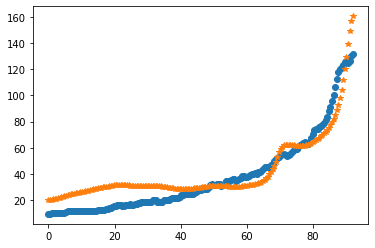

after perturb [3.2667219511905614, 124.98949685166244, 22343.56823518887, 1.008326239198765, 44.20371970192532]
parameters [3.2667219511905614, 124.98949685166244, 22343.56823518887, 1.008326239198765, 44.20371970192532]
oxigeno [8.77027492e-14 8.87141687e-14 9.17727466e-14 9.69521443e-14
 1.04377493e-13 1.14229009e-13 1.26747185e-13 1.42239727e-13
 1.61090399e-13 1.83770065e-13 2.10850214e-13 2.43019396e-13
 2.81103022e-13 3.26087157e-13 3.79147003e-13 4.41680951e-13
 5.15351268e-13 6.02132672e-13 7.04370336e-13 8.24849150e-13
 9.66876436e-13 1.13438076e-12 1.33202999e-12 1.56537231e-12
 1.84100485e-12 2.16677499e-12 2.55202110e-12 3.00785996e-12
 3.54753014e-12 4.18680201e-12 4.94446707e-12 5.84292177e-12
 6.90886376e-12 8.17412151e-12 9.67664240e-12 1.14616686e-11
 1.35831349e-11 1.61053301e-11 1.91048680e-11 2.26730256e-11
 2.69185132e-11 3.19707549e-11 3.79837697e-11 4.51407619e-11
 5.36595490e-11 6.37989767e-11 7.58665038e-11 9.02271673e-11
 1.07314185e-10 1.27641498e-10 1.518186

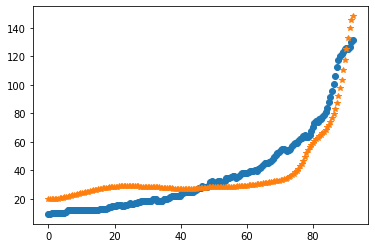

after perturb [2.6000311784104135, 83.79864637611414, 22616.938026946602, -0.14497229737876877, 18.384253803147235]
parameters [2.6000311784104135, 83.79864637611414, 22616.938026946602, -0.14497229737876877, 18.384253803147235]
after perturb [-1.3405516205857473, 58.698678446883385, 28661.83270189728, -0.07351660615331052, 2.0393571863088056]
parameters [-1.3405516205857473, 58.698678446883385, 28661.83270189728, -0.07351660615331052, 2.0393571863088056]
after perturb [1.1031722592031632, 124.009491684654, 21305.67871384842, 1.0663189252144876, 36.58454001663351]
parameters [1.1031722592031632, 124.009491684654, 21305.67871384842, 1.0663189252144876, 36.58454001663351]
oxigeno [3.30621601e-14 3.34465345e-14 3.46098066e-14 3.65827259e-14
 3.94175581e-14 4.31896275e-14 4.79995283e-14 5.39760786e-14
 6.12801380e-14 7.01094524e-14 8.07047269e-14 9.33571415e-14
 1.08417522e-13 1.26307362e-13 1.47531886e-13 1.72695358e-13
 2.02518955e-13 2.37861684e-13 2.79745110e-13 3.29383063e-13
 3.88217

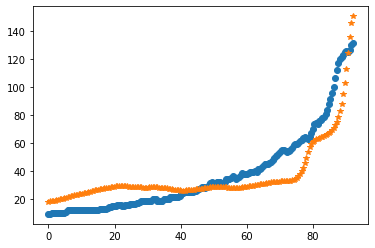

after perturb [4.426822796710921, 161.25387470823273, 16380.64438477338, 1.4327475049543907, 48.29452146320618]
parameters [4.426822796710921, 161.25387470823273, 16380.64438477338, 1.4327475049543907, 48.29452146320618]
after perturb [2.697949962462467, 108.40283542815897, 14724.929034436696, 0.347693727350836, 25.48537118326604]
parameters [2.697949962462467, 108.40283542815897, 14724.929034436696, 0.347693727350836, 25.48537118326604]
after perturb [2.415488743369809, 93.09584981604743, 23373.91390986989, 0.6635392630072587, 29.806934826754723]
parameters [2.415488743369809, 93.09584981604743, 23373.91390986989, 0.6635392630072587, 29.806934826754723]
oxigeno [3.61307059e-13 3.65225906e-13 3.77073947e-13 3.97128264e-13
 4.25859316e-13 4.63944138e-13 5.12285261e-13 5.72035812e-13
 6.44631423e-13 7.31829765e-13 8.35758746e-13 9.58974657e-13
 1.10453186e-12 1.27606596e-12 1.47789283e-12 1.71512638e-12
 1.99381848e-12 2.32112531e-12 2.70550514e-12 3.15695355e-12
 3.68728340e-12 4.310458

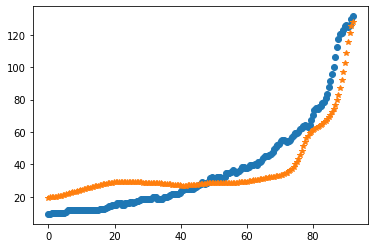

after perturb [4.479478007859726, 98.90995129412053, 24600.786380717313, 0.42816306504907486, 25.2439546332742]
parameters [4.479478007859726, 98.90995129412053, 24600.786380717313, 0.42816306504907486, 25.2439546332742]
oxigeno [4.35243270e-10 4.36846047e-10 4.41683155e-10 4.49841386e-10
 4.61466921e-10 4.76767650e-10 4.96016496e-10 5.19555796e-10
 5.47802842e-10 5.81256681e-10 6.20506323e-10 6.66240503e-10
 7.19259201e-10 7.80487139e-10 8.50989508e-10 9.31990237e-10
 1.02489314e-09 1.13130635e-09 1.25307051e-09 1.39229122e-09
 1.55137634e-09 1.73307900e-09 1.94054681e-09 2.17737847e-09
 2.44768869e-09 2.75618256e-09 3.10824079e-09 3.51001731e-09
 3.96855088e-09 4.49189276e-09 5.08925253e-09 5.77116453e-09
 6.54967783e-09 7.43857261e-09 8.45360674e-09 9.61279625e-09
 1.09367344e-08 1.24489542e-08 1.41763401e-08 1.61495951e-08
 1.84037708e-08 2.09788688e-08 2.39205213e-08 2.72807639e-08
 3.11189105e-08 3.55025449e-08 4.05086451e-08 4.62248568e-08
 5.27509376e-08 6.02003944e-08 6.870233

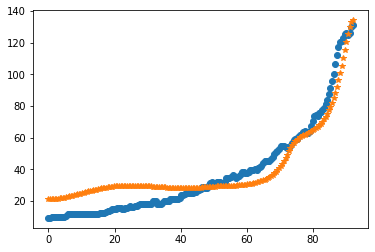

17
after perturb [1.2842992488016272, 143.35471306217826, 22999.327600248445, 1.440385726123476, 37.32571279008269]
parameters [1.2842992488016272, 143.35471306217826, 22999.327600248445, 1.440385726123476, 37.32571279008269]
oxigeno [3.11754833e-15 3.15823573e-15 3.28147241e-15 3.49082322e-15
 3.79236836e-15 4.19491485e-15 4.71030005e-15 5.35379669e-15
 6.14463395e-15 7.10665432e-15 8.26913134e-15 9.66777817e-15
 1.13459810e-14 1.33562951e-14 1.57622475e-14 1.86404974e-14
 2.20834216e-14 2.62022137e-14 3.11306202e-14 3.70294778e-14
 4.40922682e-14 5.25519657e-14 6.26895047e-14 7.48442502e-14
 8.94268972e-14 1.06935264e-13 1.27973493e-13 1.53275235e-13
 1.83731519e-13 2.20424189e-13 2.64666095e-13 3.18049623e-13
 3.82505695e-13 4.60375980e-13 5.54501762e-13 6.68333575e-13
 8.06066387e-13 9.72805614e-13 1.17476971e-12 1.41953548e-12
 1.71633280e-12 2.07639604e-12 2.51338114e-12 3.04385901e-12
 3.68789941e-12 4.46976378e-12 5.41873130e-12 6.57008910e-12
 7.96632614e-12 9.65857858e-12 1.1

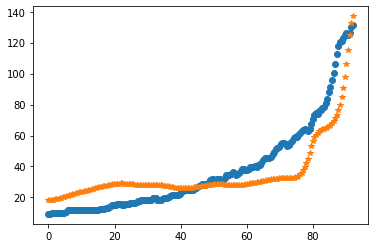

after perturb [6.603048989856157, 92.13651751104416, 20253.34638450966, -0.0033863287256716834, 28.056548059036402]
parameters [6.603048989856157, 92.13651751104416, 20253.34638450966, -0.0033863287256716834, 28.056548059036402]
after perturb [3.768331319160632, 72.01787600144908, 25228.825427859578, -0.05149524348419157, 11.134914323666646]
parameters [3.768331319160632, 72.01787600144908, 25228.825427859578, -0.05149524348419157, 11.134914323666646]
after perturb [2.687213363483502, 110.8013589065167, 23772.1422297885, 0.9068681031436712, 34.87648711749964]
parameters [2.687213363483502, 110.8013589065167, 23772.1422297885, 0.9068681031436712, 34.87648711749964]
oxigeno [6.00664100e-14 6.07844685e-14 6.29566104e-14 6.66372784e-14
 7.19190396e-14 7.89353802e-14 8.78647271e-14 9.89358061e-14
 1.12434491e-13 1.28712336e-13 1.48197053e-13 1.71405226e-13
 1.98957668e-13 2.31597881e-13 2.70214194e-13 3.15866290e-13
 3.69816963e-13 4.33570144e-13 5.08916427e-13 5.97987624e-13
 7.03322127e-1

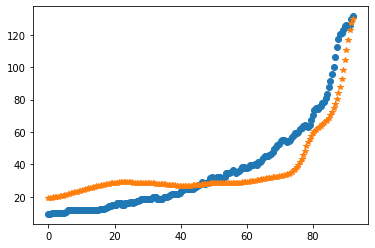

after perturb [5.190786051902591, 114.98958550269708, 22764.4252625616, 0.8882434745363222, 26.616773947579855]
parameters [5.190786051902591, 114.98958550269708, 22764.4252625616, 0.8882434745363222, 26.616773947579855]
oxigeno [1.50363638e-13 1.52122148e-13 1.57439729e-13 1.66443695e-13
 1.79350107e-13 1.96469717e-13 2.18216508e-13 2.45119109e-13
 2.77835399e-13 3.17170728e-13 3.64100301e-13 4.19796368e-13
 4.85661041e-13 5.63365685e-13 6.54898082e-13 7.62618758e-13
 8.89328170e-13 1.03834677e-12 1.21361034e-12 1.41978353e-12
 1.66239499e-12 1.94799816e-12 2.28436271e-12 2.68070229e-12
 3.14794561e-12 3.69905897e-12 4.34943000e-12 5.11732421e-12
 6.02442790e-12 7.09649391e-12 8.36410908e-12 9.86360642e-12
 1.16381487e-11 1.37390152e-11 1.62271288e-11 1.91748686e-11
 2.26682179e-11 2.68093122e-11 3.17194563e-11 3.75426978e-11
 4.44500574e-11 5.26445332e-11 6.23670194e-11 7.39033037e-11
 8.75923374e-11 1.03836005e-10 1.23110665e-10 1.45980773e-10
 1.73114974e-10 2.05305081e-10 2.434884

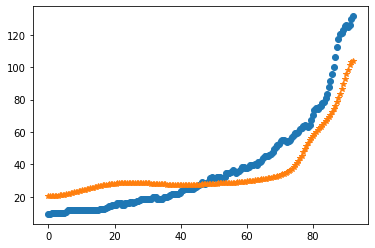

after perturb [2.3393911397541247, 112.04535679148007, 21221.86318779921, 0.5406985281792024, 30.514362760654176]
parameters [2.3393911397541247, 112.04535679148007, 21221.86318779921, 0.5406985281792024, 30.514362760654176]
oxigeno [8.56410814e-11 8.62639805e-11 8.81427253e-11 9.13076608e-11
 9.58100415e-11 1.01723058e-10 1.09143291e-10 1.18192618e-10
 1.29020589e-10 1.41807318e-10 1.56766931e-10 1.74151629e-10
 1.94256453e-10 2.17424816e-10 2.44054939e-10 2.74607312e-10
 3.09613334e-10 3.49685335e-10 3.95528190e-10 4.47952801e-10
 5.07891732e-10 5.76417346e-10 6.54762845e-10 7.44346631e-10
 8.46800499e-10 9.64002206e-10 1.09811306e-09 1.25162122e-09
 1.42739158e-09 1.62872315e-09 1.85941506e-09 2.12384249e-09
 2.42704392e-09 2.77482149e-09 3.17385610e-09 3.63183957e-09
 4.15762580e-09 4.76140355e-09 5.45489325e-09 6.25157078e-09
 7.16692128e-09 8.21872644e-09 9.42738950e-09 1.08163025e-08
 1.24122619e-08 1.42459390e-08 1.63524146e-08 1.87717864e-08
 2.15498631e-08 2.47389575e-08 2.83

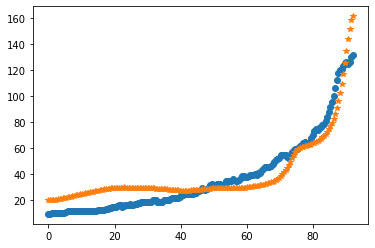

after perturb [0.9101773888191644, 168.4459237035206, 23846.050052869618, 1.170452787587509, 33.98009734668272]
parameters [0.9101773888191644, 168.4459237035206, 23846.050052869618, 1.170452787587509, 33.98009734668272]
after perturb [1.898885236821977, 125.55736016580407, 19000.40974794419, 1.2029320204881893, 45.21047315961685]
parameters [1.898885236821977, 125.55736016580407, 19000.40974794419, 1.2029320204881893, 45.21047315961685]
after perturb [7.020011622421057, 91.80938190491354, 29404.999557125797, 0.8861292492730228, 34.67060657447429]
parameters [7.020011622421057, 91.80938190491354, 29404.999557125797, 0.8861292492730228, 34.67060657447429]
after perturb [0.08650212384579226, 164.5171003595762, 19206.004089028, 0.6440928999184485, 30.557301062165095]
parameters [0.08650212384579226, 164.5171003595762, 19206.004089028, 0.6440928999184485, 30.557301062165095]
after perturb [0.2616252282168192, 34.13897391902941, 18994.654770888876, -0.20838886096711579, -0.8524572605487837]

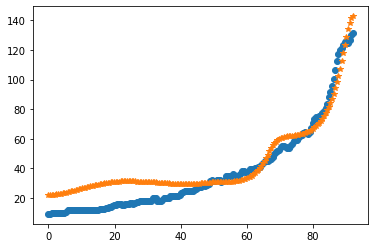

18
after perturb [3.564947961034136, 132.56124871535803, 27733.40509576766, 0.2504746530818736, 31.553258470802874]
parameters [3.564947961034136, 132.56124871535803, 27733.40509576766, 0.2504746530818736, 31.553258470802874]
oxigeno [1.91810118e-06 1.92023658e-06 1.92666699e-06 1.93746510e-06
 1.95275231e-06 1.97269911e-06 1.99752567e-06 2.02750259e-06
 2.06295195e-06 2.10424865e-06 2.15182208e-06 2.20615818e-06
 2.26780191e-06 2.33736029e-06 2.41550592e-06 2.50298112e-06
 2.60060274e-06 2.70926769e-06 2.82995916e-06 2.96375381e-06
 3.11182972e-06 3.27547530e-06 3.45609931e-06 3.65524181e-06
 3.87458635e-06 4.11597333e-06 4.38141467e-06 4.67310981e-06
 4.99346322e-06 5.34510332e-06 5.73090317e-06 6.15400269e-06
 6.61783284e-06 7.12614152e-06 7.68302155e-06 8.29294067e-06
 8.96077370e-06 9.69183698e-06 1.04919252e-05 1.13673508e-05
 1.23249860e-05 1.33723078e-05 1.45174465e-05 1.57692372e-05
 1.71372757e-05 1.86319789e-05 2.02646498e-05 2.20475485e-05
 2.39939700e-05 2.61183281e-05 2.8

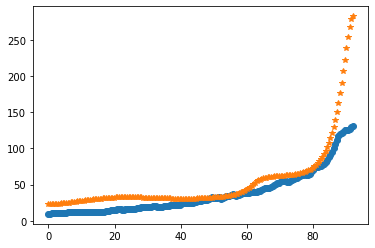

after perturb [3.3432665940404096, 107.79122230464122, 27968.805175644557, 0.8061123247128754, 26.224750558462357]
parameters [3.3432665940404096, 107.79122230464122, 27968.805175644557, 0.8061123247128754, 26.224750558462357]
oxigeno [2.21261668e-13 2.23758070e-13 2.31305718e-13 2.44081577e-13
 2.62386066e-13 2.86651429e-13 3.17453771e-13 3.55529075e-13
 4.01793642e-13 4.57369516e-13 5.23615607e-13 6.02165374e-13
 6.94972162e-13 8.04363481e-13 9.33105823e-13 1.08448192e-12
 1.26238272e-12 1.47141689e-12 1.71704109e-12 2.00571495e-12
 2.34508552e-12 2.74420684e-12 3.21380114e-12 3.76656989e-12
 4.41756394e-12 5.18462413e-12 6.08890564e-12 7.15550185e-12
 8.41418647e-12 9.90029606e-12 1.16557789e-11 1.37304414e-11
 1.61834275e-11 1.90849754e-11 2.25184990e-11 2.65830561e-11
 3.13962690e-11 3.70977804e-11 4.38533374e-11 5.18596141e-11
 6.13499025e-11 7.26008218e-11 8.59402252e-11 1.01756512e-10
 1.20509593e-10 1.42743800e-10 1.69103080e-10 2.00348890e-10
 2.37381268e-10 2.81263651e-10 3.

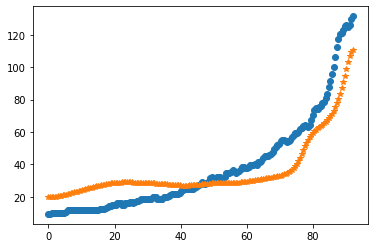

after perturb [5.819728870339258, 112.02213912176578, 28049.434004627972, 1.247640419887809, 47.261836531621725]
parameters [5.819728870339258, 112.02213912176578, 28049.434004627972, 1.247640419887809, 47.261836531621725]
oxigeno [3.46079501e-16 3.51739128e-16 3.68905775e-16 3.98149625e-16
 4.40444207e-16 4.97202199e-16 5.70327534e-16 6.62285889e-16
 7.76196373e-16 9.15948102e-16 1.08634633e-15 1.29329408e-15
 1.54401654e-15 1.84733751e-15 2.21401903e-15 2.65717818e-15
 3.19279822e-15 3.84035519e-15 4.62358583e-15 5.57142895e-15
 6.71917930e-15 8.10990237e-15 9.79616922e-15 1.18421843e-14
 1.43263958e-14 1.73446976e-14 2.10143590e-14 2.54788460e-14
 3.09137373e-14 3.75339844e-14 4.56028184e-14 5.54426777e-14
 6.74486120e-14 8.21047200e-14 1.00004304e-13 1.21874574e-13
 1.48606918e-13 1.81293983e-13 2.21275085e-13 2.70191787e-13
 3.30055917e-13 4.03332755e-13 4.93042756e-13 6.02885875e-13
 7.37393466e-13 9.02113809e-13 1.10383861e-12 1.35087945e-12
 1.65340507e-12 2.02385270e-12 2.4774

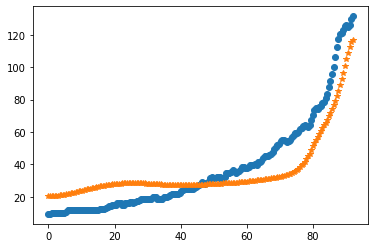

after perturb [-0.6749053997385257, 194.89687422063983, 14255.377256325657, 1.3663326390714627, 47.65524882849019]
parameters [-0.6749053997385257, 194.89687422063983, 14255.377256325657, 1.3663326390714627, 47.65524882849019]
after perturb [2.969840175097162, 124.31903751118796, 24312.82622585436, 1.0712971980269836, 40.36520665851876]
parameters [2.969840175097162, 124.31903751118796, 24312.82622585436, 1.0712971980269836, 40.36520665851876]
oxigeno [3.15605543e-14 3.19460023e-14 3.31121786e-14 3.50888827e-14
 3.79267958e-14 4.16990363e-14 4.65033989e-14 5.24653457e-14
 5.97418369e-14 6.85261177e-14 7.90536063e-14 9.16090664e-14
 1.06535289e-13 1.24243557e-13 1.45226234e-13 1.70071883e-13
 1.99483412e-13 2.34299854e-13 2.75522505e-13 3.24346307e-13
 3.82197529e-13 4.50779042e-13 5.32124708e-13 6.28664749e-13
 7.43304315e-13 8.79517909e-13 1.04146287e-12 1.23411576e-12
 1.46343620e-12 1.73656369e-12 2.06205396e-12 2.45016266e-12
 2.91318577e-12 3.46586780e-12 4.12589100e-12 4.91446115

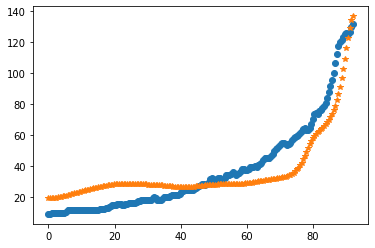

after perturb [1.6957004656209997, 150.55804462812253, 16976.215342554682, 0.7009058676873734, 39.57457107286588]
parameters [1.6957004656209997, 150.55804462812253, 16976.215342554682, 0.7009058676873734, 39.57457107286588]
after perturb [4.046174903883379, 138.85149385931683, 19681.50147604225, 0.4939198518029355, 55.02678469180327]
parameters [4.046174903883379, 138.85149385931683, 19681.50147604225, 0.4939198518029355, 55.02678469180327]
after perturb [2.5875273405744537, 129.4402291985847, 26555.608693564274, 0.6573014753600879, 44.78146633583719]
parameters [2.5875273405744537, 129.4402291985847, 26555.608693564274, 0.6573014753600879, 44.78146633583719]
oxigeno [5.16347335e-11 5.20175722e-11 5.31722415e-11 5.51173272e-11
 5.78842278e-11 6.15177937e-11 6.60772337e-11 7.16373025e-11
 7.82897856e-11 8.61453070e-11 9.53354879e-11 1.06015497e-10
 1.18367040e-10 1.32601841e-10 1.48965696e-10 1.67743176e-10
 1.89263085e-10 2.13904786e-10 2.42105546e-10 2.74369053e-10
 3.11275300e-10 3.

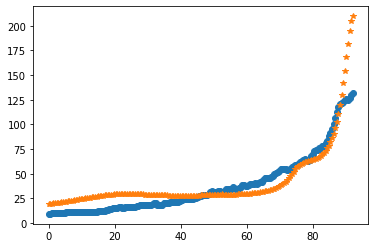

after perturb [0.3104182525792957, 145.15738952436516, 17919.83482528531, 1.1940827074872487, 45.81614274375976]
parameters [0.3104182525792957, 145.15738952436516, 17919.83482528531, 1.1940827074872487, 45.81614274375976]
after perturb [-1.0825785883728616, 138.1588866953413, 21772.726609759848, 1.3270200774960235, 40.190477618006625]
parameters [-1.0825785883728616, 138.1588866953413, 21772.726609759848, 1.3270200774960235, 40.190477618006625]
after perturb [4.99453061823571, 113.89906245885216, 25983.980120244116, 0.5061781351453523, 31.3790167876004]
parameters [4.99453061823571, 113.89906245885216, 25983.980120244116, 0.5061781351453523, 31.3790167876004]
oxigeno [2.29592932e-10 2.31186874e-10 2.35992334e-10 2.44080632e-10
 2.55572048e-10 2.70637962e-10 2.89503900e-10 3.12453548e-10
 3.39833780e-10 3.72060816e-10 4.09627591e-10 4.53112484e-10
 5.03189553e-10 5.60640462e-10 6.26368317e-10 7.01413658e-10
 7.86972911e-10 8.84419628e-10 9.95328909e-10 1.12150546e-09
 1.26501582e-09 1.

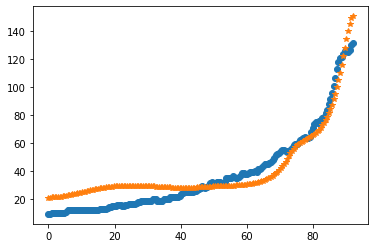

19
after perturb [-3.6766695363811532, 183.93249735430288, 21564.917983777934, 1.462657097876587, 51.08433804566427]
parameters [-3.6766695363811532, 183.93249735430288, 21564.917983777934, 1.462657097876587, 51.08433804566427]
after perturb [-0.5848834123123943, 150.54409112076212, 24631.498620299477, 0.8446873927531422, 41.262260599989496]
parameters [-0.5848834123123943, 150.54409112076212, 24631.498620299477, 0.8446873927531422, 41.262260599989496]
after perturb [0.6471451533526322, 104.20219333348629, 21261.502527348457, 0.4419707464716852, 25.273802205858612]
parameters [0.6471451533526322, 104.20219333348629, 21261.502527348457, 0.4419707464716852, 25.273802205858612]
oxigeno [4.81238617e-10 4.83242647e-10 4.89302670e-10 4.99560758e-10
 5.14248450e-10 5.33680552e-10 5.58249419e-10 5.88421905e-10
 6.24740955e-10 6.67833212e-10 7.18423144e-10 7.77353159e-10
 8.45608018e-10 9.24341036e-10 1.01489918e-09 1.11884462e-09
 1.23797173e-09 1.37432041e-09 1.53018884e-09 1.70815103e-09
 1.

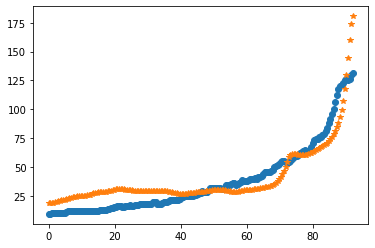

after perturb [0.5486654524908134, 177.24442779018625, 22337.552012566677, 0.9308433166369727, 37.625769394252224]
parameters [0.5486654524908134, 177.24442779018625, 22337.552012566677, 0.9308433166369727, 37.625769394252224]
after perturb [-0.413765184241095, 126.61723669442632, 22957.799347430944, 0.10937557172699908, 18.104236233157422]
parameters [-0.413765184241095, 126.61723669442632, 22957.799347430944, 0.10937557172699908, 18.104236233157422]
after perturb [-0.07761591360808873, 77.89864352428387, 20534.17040107469, 0.8781170291737082, 32.741304479593225]
parameters [-0.07761591360808873, 77.89864352428387, 20534.17040107469, 0.8781170291737082, 32.741304479593225]
after perturb [5.25822192770743, 131.3432250743478, 20939.72239183805, 0.5984216115815171, 23.150434021412778]
parameters [5.25822192770743, 131.3432250743478, 20939.72239183805, 0.5984216115815171, 23.150434021412778]
oxigeno [2.00807480e-10 2.02226164e-10 2.06503058e-10 2.13701051e-10
 2.23926210e-10 2.37329665e-1

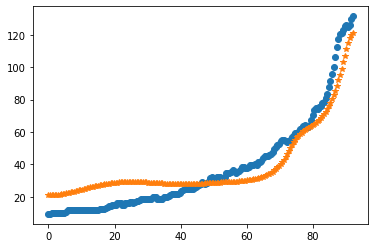

20
parameters [4.446474616299814, 142.55679507250798, 27843.685194138656, 0.8521867158470756, 41.01286976093853]
parameters [6.992201631226459, 119.9944627867879, 27665.95726186706, 0.5116235429066194, 38.33220081972624]
parameters [4.156917574194587, 132.90834015030248, 24233.81866340899, 0.569775723949324, 24.842370159676868]
parameters [3.9488235809584236, 120.1098954463322, 26880.57864620726, 0.5973984429605498, 33.95788348980994]
parameters [6.0507978419327415, 105.47944425871708, 21104.638161622297, 0.6042210469195667, 36.60180694414588]
parameters [4.311416849751142, 94.72531431244353, 22984.253746974675, 0.3228813911535664, 19.609993373435998]
parameters [3.4190298542532274, 135.04423692038233, 21763.713565385682, 0.5696424002497064, 23.576342368420185]
parameters [6.5306900544962705, 148.62376196478266, 28637.336736953046, 0.9686519293408468, 36.3947278306502]
parameters [2.5032205620405454, 127.52591347178218, 21819.88199711941, 0.4609669824446101, 23.803107804229793]
paramet

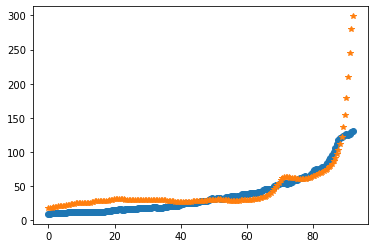

after perturb [4.7676927046825615, 181.96326116990184, 22685.586243179147, 1.0904434359067623, 30.478467583674465]
parameters [4.7676927046825615, 181.96326116990184, 22685.586243179147, 1.0904434359067623, 30.478467583674465]
after perturb [1.2859075420797055, 136.17874362502997, 27733.400650530315, 0.5449954607994326, 28.30984956386267]
parameters [1.2859075420797055, 136.17874362502997, 27733.400650530315, 0.5449954607994326, 28.30984956386267]
oxigeno [9.24084367e-10 9.29404120e-10 9.45438359e-10 9.72412925e-10
 1.01070729e-09 1.06085931e-09 1.12357228e-09 1.19972453e-09
 1.29038204e-09 1.39681444e-09 1.52051475e-09 1.66322305e-09
 1.82695413e-09 2.01402915e-09 2.22711098e-09 2.46924350e-09
 2.74389514e-09 3.05500766e-09 3.40705200e-09 3.80509359e-09
 4.25487012e-09 4.76288506e-09 5.33651993e-09 5.98416718e-09
 6.71538504e-09 7.54107376e-09 8.47367212e-09 9.52737295e-09
 1.07183570e-08 1.20650471e-08 1.35883877e-08 1.53121589e-08
 1.72633373e-08 1.94725191e-08 2.19744223e-08 2.4808

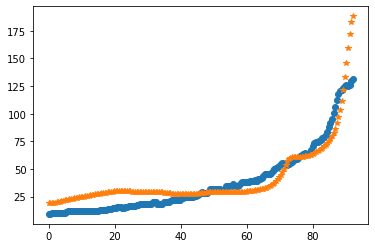

after perturb [5.191252441179607, 126.01134575494858, 25384.07170777007, 0.6079426082183481, 32.60247716329953]
parameters [5.191252441179607, 126.01134575494858, 25384.07170777007, 0.6079426082183481, 32.60247716329953]
oxigeno [9.70582426e-11 9.77818487e-11 9.99638652e-11 1.03638096e-10
 1.08861581e-10 1.15715667e-10 1.24307521e-10 1.34772135e-10
 1.47274844e-10 1.62014408e-10 1.79226720e-10 1.99189199e-10
 2.22225964e-10 2.48713880e-10 2.79089592e-10 3.13857681e-10
 3.53600115e-10 3.98987152e-10 4.50789934e-10 5.09895003e-10
 5.77321025e-10 6.54238054e-10 7.41989696e-10 8.42118620e-10
 9.56395894e-10 1.08685471e-09 1.23582916e-09 1.40599870e-09
 1.60043934e-09 1.82268221e-09 2.07678087e-09 2.36738837e-09
 2.69984555e-09 3.08028211e-09 3.51573224e-09 4.01426684e-09
 4.58514457e-09 5.23898436e-09 5.98796234e-09 6.84603641e-09
 7.82920247e-09 8.95578637e-09 1.02467766e-08 1.17262035e-08
 1.34215708e-08 1.53643475e-08 1.75905275e-08 2.01412674e-08
 2.30636119e-08 2.64113202e-08 3.024580

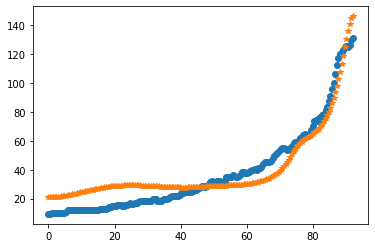

after perturb [2.5669378683095725, 177.27703628066237, 19751.61895381324, 0.5599625773403941, 20.46638041474416]
parameters [2.5669378683095725, 177.27703628066237, 19751.61895381324, 0.5599625773403941, 20.46638041474416]
after perturb [0.4257986112706853, 116.16301356355878, 19025.99428395931, 0.30631421257729513, 20.5734284796913]
parameters [0.4257986112706853, 116.16301356355878, 19025.99428395931, 0.30631421257729513, 20.5734284796913]
after perturb [5.18835756313135, 70.58071573620455, 16274.187968740875, 0.08915393244124523, 20.058491528515056]
parameters [5.18835756313135, 70.58071573620455, 16274.187968740875, 0.08915393244124523, 20.058491528515056]
after perturb [6.437858230661897, 101.19906439267307, 24497.831036156604, 0.5891855916235683, 36.94213584885536]
parameters [6.437858230661897, 101.19906439267307, 24497.831036156604, 0.5891855916235683, 36.94213584885536]
oxigeno [6.76980000e-12 6.83268600e-12 7.02255867e-12 7.34308867e-12
 7.80048345e-12 8.40362380e-12 9.164259

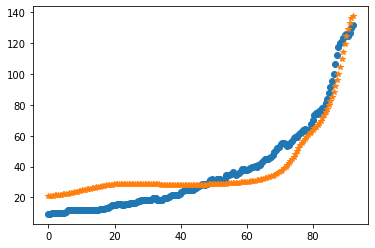

after perturb [7.042880168389439, 128.73483318962295, 20773.256831190825, 0.5703907429089728, 26.681461309070638]
parameters [7.042880168389439, 128.73483318962295, 20773.256831190825, 0.5703907429089728, 26.681461309070638]
after perturb [0.4729133867350006, 160.16513240927318, 26080.032730037412, 0.6283978640677708, 16.65648354614239]
parameters [0.4729133867350006, 160.16513240927318, 26080.032730037412, 0.6283978640677708, 16.65648354614239]
after perturb [0.8243960784485298, 163.1026394598139, 30449.144195313616, 0.9024882390411497, 20.253166192339094]
parameters [0.8243960784485298, 163.1026394598139, 30449.144195313616, 0.9024882390411497, 20.253166192339094]
after perturb [6.278316669904132, 139.70560457471987, 31699.42400940805, 0.8555058972817571, 32.58031323958048]
parameters [6.278316669904132, 139.70560457471987, 31699.42400940805, 0.8555058972817571, 32.58031323958048]
after perturb [5.429403518398237, 172.9779784658024, 28734.89227451857, 0.8861534140680885, 21.666821702

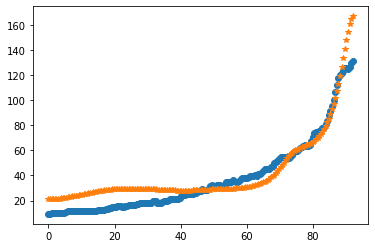

after perturb [1.6397726644787514, 171.9855694466448, 15947.789194759887, 0.282499083739733, 12.131392160401036]
parameters [1.6397726644787514, 171.9855694466448, 15947.789194759887, 0.282499083739733, 12.131392160401036]
after perturb [4.420634047276106, 144.16606210646478, 27790.048091029264, 0.6579231703188084, 33.22915699387931]
parameters [4.420634047276106, 144.16606210646478, 27790.048091029264, 0.6579231703188084, 33.22915699387931]
oxigeno [2.18548532e-10 2.20032140e-10 2.24504201e-10 2.32028805e-10
 2.42714041e-10 2.56713921e-10 2.74231123e-10 2.95520582e-10
 3.20894012e-10 3.50725400e-10 3.85457595e-10 4.25610088e-10
 4.71788124e-10 5.24693299e-10 5.85135850e-10 6.54048831e-10
 7.32504468e-10 8.21732964e-10 9.23144125e-10 1.03835219e-09
 1.16920434e-09 1.31781339e-09 1.48659532e-09 1.67831225e-09
 1.89612173e-09 2.14363313e-09 2.42497227e-09 2.74485529e-09
 3.10867314e-09 3.52258812e-09 3.99364404e-09 4.52989199e-09
 5.14053364e-09 5.83608444e-09 6.62855945e-09 7.53168458e-

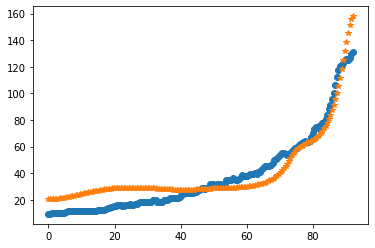

after perturb [5.155045591750968, 112.35081877067753, 21715.568766954646, 0.4826728654833933, 26.599198053858174]
parameters [5.155045591750968, 112.35081877067753, 21715.568766954646, 0.4826728654833933, 26.599198053858174]
oxigeno [3.38260862e-10 3.40516276e-10 3.47315382e-10 3.58757352e-10
 3.75009377e-10 3.96309569e-10 4.22971081e-10 4.55387527e-10
 4.94039786e-10 5.39504310e-10 5.92463078e-10 6.53715360e-10
 7.24191513e-10 8.04969032e-10 8.97291150e-10 1.00258832e-09
 1.12250295e-09 1.25891784e-09 1.41398885e-09 1.59018235e-09
 1.79031814e-09 2.01761860e-09 2.27576499e-09 2.56896181e-09
 2.90201046e-09 3.28039333e-09 3.71037001e-09 4.19908698e-09
 4.75470294e-09 5.38653158e-09 6.10520445e-09 6.92285638e-09
 7.85333651e-09 8.91244843e-09 1.01182231e-08 1.14912287e-08
 1.30549228e-08 1.48360516e-08 1.68651026e-08 1.91768180e-08
 2.18107761e-08 2.48120496e-08 2.82319513e-08 3.21288777e-08
 3.65692646e-08 4.16286667e-08 4.73929815e-08 5.39598318e-08
 6.14401316e-08 6.99598562e-08 7.96

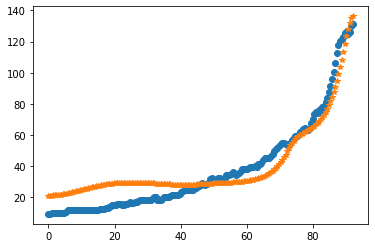

after perturb [4.273369235757408, 73.14378695646094, 22746.333823676345, 0.17759204439814008, 29.875740568040868]
parameters [4.273369235757408, 73.14378695646094, 22746.333823676345, 0.17759204439814008, 29.875740568040868]
oxigeno [4.09016956e-05 4.08705678e-05 4.07774279e-05 4.06230024e-05
 4.04084870e-05 4.01355236e-05 3.98061707e-05 3.94228665e-05
 3.89883869e-05 3.85058000e-05 3.79784178e-05 3.74097484e-05
 3.68034471e-05 3.61632711e-05 3.54930362e-05 3.47965771e-05
 3.40777129e-05 3.33402161e-05 3.25877873e-05 3.18240338e-05
 3.10524532e-05 3.02764206e-05 2.94991807e-05 2.87238414e-05
 2.79533722e-05 2.71906042e-05 2.64382318e-05 2.56988176e-05
 2.49747980e-05 2.42684903e-05 2.35821016e-05 2.29177386e-05
 2.22774189e-05 2.16630833e-05 2.10766098e-05 2.05198287e-05
 1.99945392e-05 1.95025278e-05 1.90455878e-05 1.86255415e-05
 1.82442632e-05 1.79037048e-05 1.76059235e-05 1.73531111e-05
 1.71476261e-05 1.69920280e-05 1.68891138e-05 1.68419578e-05
 1.68539534e-05 1.69288584e-05 1.70

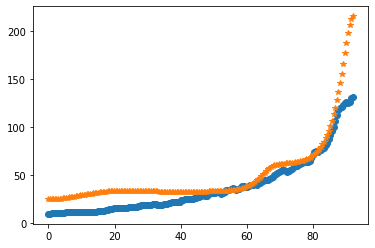

after perturb [7.628140854502456, 111.88970961820341, 24077.171794880243, 0.43696549382814576, 33.151659114414954]
parameters [7.628140854502456, 111.88970961820341, 24077.171794880243, 0.43696549382814576, 33.151659114414954]
after perturb [3.421805587695661, 128.09401839051188, 25730.993405194666, 0.4396186138693996, 22.0513649161242]
parameters [3.421805587695661, 128.09401839051188, 25730.993405194666, 0.4396186138693996, 22.0513649161242]
oxigeno [4.40814844e-09 4.43136613e-09 4.50129176e-09 4.61874712e-09
 4.78511529e-09 5.00236118e-09 5.27306023e-09 5.60043605e-09
 5.98840704e-09 6.44164269e-09 6.96563020e-09 7.56675215e-09
 8.25237646e-09 9.03095966e-09 9.91216504e-09 1.09069976e-08
 1.20279573e-08 1.32892141e-08 1.47068057e-08 1.62988632e-08
 1.80858661e-08 2.00909322e-08 2.23401456e-08 2.48629279e-08
 2.76924590e-08 3.08661512e-08 3.44261855e-08 3.84201161e-08
 4.29015512e-08 4.79309192e-08 5.35763296e-08 5.99145399e-08
 6.70320387e-08 7.50262595e-08 8.40069373e-08 9.40976241

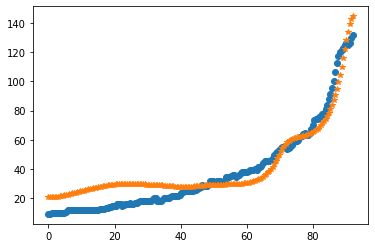

after perturb [5.152617872244503, 99.02460648230137, 25202.610007591422, 0.8024330078542705, 47.053122287275265]
parameters [5.152617872244503, 99.02460648230137, 25202.610007591422, 0.8024330078542705, 47.053122287275265]
oxigeno [5.63639167e-14 5.70718909e-14 5.92139309e-14 6.28449161e-14
 6.80580815e-14 7.49877298e-14 8.38131445e-14 9.47638243e-14
 1.08126201e-13 1.24252052e-13 1.43568860e-13 1.66592459e-13
 1.93942345e-13 2.26360145e-13 2.64731822e-13 3.10114318e-13
 3.63767486e-13 4.27192318e-13 5.02176705e-13 5.90850182e-13
 6.95749417e-13 8.19896556e-13 9.66892933e-13 1.14103116e-12
 1.34742923e-12 1.59219085e-12 1.88259729e-12 2.22733673e-12
 2.63677853e-12 3.12330105e-12 3.70168345e-12 4.38957378e-12
 5.20804802e-12 6.18227742e-12 7.34232497e-12 8.72409533e-12
 1.03704674e-11 1.23326440e-11 1.46717595e-11 1.74607935e-11
 2.07868487e-11 2.47538593e-11 2.94858122e-11 3.51305746e-11
 4.18644414e-11 4.98975360e-11 5.94802224e-11 7.09107152e-11
 8.45441105e-11 1.00803098e-10 1.2019

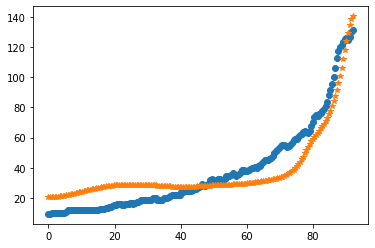

after perturb [1.949781629650393, 120.17784654239988, 27700.666250546987, 0.4529497539598482, 33.87801629092707]
parameters [1.949781629650393, 120.17784654239988, 27700.666250546987, 0.4529497539598482, 33.87801629092707]
oxigeno [1.58031138e-09 1.58886530e-09 1.61464071e-09 1.65798025e-09
 1.71946093e-09 1.79990303e-09 1.90038268e-09 2.02224830e-09
 2.16714100e-09 2.33701921e-09 2.53418782e-09 2.76133230e-09
 3.02155813e-09 3.31843612e-09 3.65605451e-09 4.03907843e-09
 4.47281807e-09 4.96330685e-09 5.51739117e-09 6.14283372e-09
 6.84843261e-09 7.64415849e-09 8.54131229e-09 9.55270611e-09
 1.06928697e-08 1.19782850e-08 1.34276525e-08 1.50621903e-08
 1.69059729e-08 1.89863113e-08 2.13341825e-08 2.39847143e-08
 2.69777343e-08 3.03583934e-08 3.41778718e-08 3.84941796e-08
 4.33730610e-08 4.88890091e-08 5.51264013e-08 6.21807594e-08
 7.01601417e-08 7.91866749e-08 8.93982354e-08 1.00950297e-07
 1.14017964e-07 1.28798226e-07 1.45512469e-07 1.64409294e-07
 1.85767706e-07 2.09900743e-07 2.3715

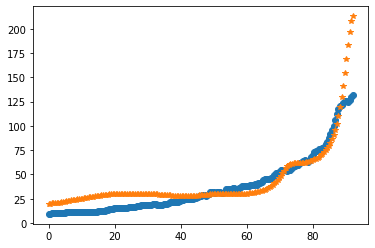

after perturb [4.400209582347681, 145.551483506883, 21285.772669413313, 0.5674163504261004, 27.54841620020177]
parameters [4.400209582347681, 145.551483506883, 21285.772669413313, 0.5674163504261004, 27.54841620020177]
oxigeno [1.30660834e-09 1.31430402e-09 1.33748738e-09 1.37644891e-09
 1.43167788e-09 1.50387007e-09 1.59393873e-09 1.70302895e-09
 1.83253561e-09 1.98412507e-09 2.15976110e-09 2.36173527e-09
 2.59270227e-09 2.85572079e-09 3.15430046e-09 3.49245567e-09
 3.87476717e-09 4.30645228e-09 4.79344499e-09 5.34248720e-09
 5.96123249e-09 6.65836429e-09 7.44373004e-09 8.32849379e-09
 9.32530933e-09 1.04485168e-08 1.17143654e-08 1.31412662e-08
 1.47500779e-08 1.65644306e-08 1.86110911e-08 2.09203767e-08
 2.35266204e-08 2.64686971e-08 2.97906151e-08 3.35421819e-08
 3.77797534e-08 4.25670755e-08 4.79762284e-08 5.40886875e-08
 6.09965126e-08 6.88036820e-08 7.76275884e-08 8.76007154e-08
 9.88725189e-08 1.11611536e-07 1.26007749e-07 1.42275247e-07
 1.60655200e-07 1.81419209e-07 2.04873067

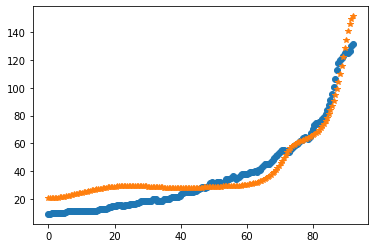

after perturb [1.499089389446011, 131.39359235805892, 18567.863741501584, 0.36693310049593736, 18.502295150297314]
parameters [1.499089389446011, 131.39359235805892, 18567.863741501584, 0.36693310049593736, 18.502295150297314]
after perturb [7.4094382011956, 168.67020759081868, 30585.834989214978, 0.9557919061437736, 33.39267492096653]
parameters [7.4094382011956, 168.67020759081868, 30585.834989214978, 0.9557919061437736, 33.39267492096653]
after perturb [5.431109392197734, 137.39154741807184, 18712.04810852371, 0.5905611629731106, 32.78947511620757]
parameters [5.431109392197734, 137.39154741807184, 18712.04810852371, 0.5905611629731106, 32.78947511620757]
after perturb [4.258339856282532, 122.5636607355949, 27524.55874438582, 0.45582022822088797, 34.38087860549883]
parameters [4.258339856282532, 122.5636607355949, 27524.55874438582, 0.45582022822088797, 34.38087860549883]
oxigeno [1.80409617e-09 1.81430670e-09 1.84506600e-09 1.89675921e-09
 1.97003487e-09 2.06581494e-09 2.18530904e-

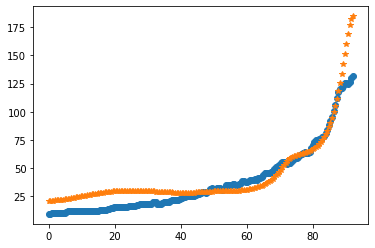

after perturb [5.444502340706974, 133.39205896542555, 22534.522308717376, 0.569119117101749, 40.860707568374224]
parameters [5.444502340706974, 133.39205896542555, 22534.522308717376, 0.569119117101749, 40.860707568374224]
oxigeno [4.13832273e-10 4.16539998e-10 4.24700148e-10 4.38424278e-10
 4.57900384e-10 4.83396055e-10 5.15262949e-10 5.53942669e-10
 5.99974135e-10 6.54002569e-10 7.16790239e-10 7.89229145e-10
 8.72355845e-10 9.67368686e-10 1.07564772e-09 1.19877764e-09
 1.33857413e-09 1.49711411e-09 1.67677032e-09 1.88025094e-09
 2.11064481e-09 2.37147313e-09 2.66674844e-09 3.00104195e-09
 3.37956025e-09 3.80823282e-09 4.29381164e-09 4.84398467e-09
 5.46750488e-09 6.17433713e-09 6.97582493e-09 7.88487998e-09
 8.91619723e-09 1.00864989e-08 1.14148110e-08 1.29227768e-08
 1.46350115e-08 1.65795036e-08 1.87880694e-08 2.12968660e-08
 2.41469714e-08 2.73850401e-08 3.10640430e-08 3.52441034e-08
 3.99934398e-08 4.53894313e-08 5.15198190e-08 5.84840627e-08
 6.63948710e-08 7.53799287e-08 8.5583

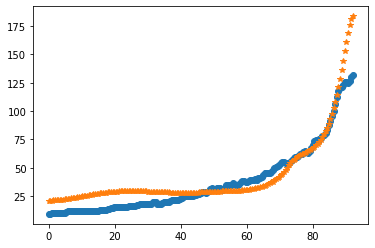

after perturb [2.549541061842774, 132.8032062733106, 18314.62908775777, 0.42337717124160595, 20.263313329901223]
parameters [2.549541061842774, 132.8032062733106, 18314.62908775777, 0.42337717124160595, 20.263313329901223]
after perturb [7.738268185525907, 128.45415896011448, 26064.532010168245, 0.5759593306156392, 38.70348245438017]
parameters [7.738268185525907, 128.45415896011448, 26064.532010168245, 0.5759593306156392, 38.70348245438017]
after perturb [5.206023518329145, 122.13387197470901, 24161.322581487755, 0.5802600459009416, 31.53192343794051]
parameters [5.206023518329145, 122.13387197470901, 24161.322581487755, 0.5802600459009416, 31.53192343794051]
oxigeno [1.12463136e-10 1.13296983e-10 1.15811358e-10 1.20044999e-10
 1.26063270e-10 1.33959371e-10 1.43856065e-10 1.55907957e-10
 1.70304353e-10 1.87272765e-10 2.07083120e-10 2.30052753e-10
 2.56552275e-10 2.87012438e-10 3.21932106e-10 3.61887505e-10
 4.07542926e-10 4.59663073e-10 5.19127314e-10 5.86946099e-10
 6.64279862e-10 7.

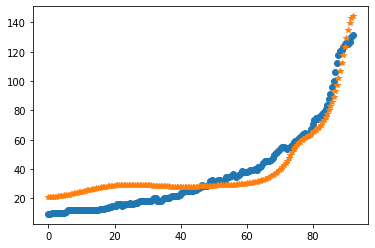

after perturb [7.952797504534061, 110.45796136318502, 27227.51488356477, 0.5252099849104042, 36.44481685141884]
parameters [7.952797504534061, 110.45796136318502, 27227.51488356477, 0.5252099849104042, 36.44481685141884]
after perturb [1.2237011586645758, 129.78714734662205, 22602.833950301076, 0.4834325944426102, 24.70218405596547]
parameters [1.2237011586645758, 129.78714734662205, 22602.833950301076, 0.4834325944426102, 24.70218405596547]
oxigeno [1.91278722e-09 1.92317633e-09 1.95448570e-09 2.00714283e-09
 2.08186475e-09 2.17966546e-09 2.30186700e-09 2.45011534e-09
 2.62640167e-09 2.83309024e-09 3.07295324e-09 3.34921299e-09
 3.66559148e-09 4.02636645e-09 4.43643370e-09 4.90137503e-09
 5.42753249e-09 6.02209056e-09 6.69316969e-09 7.44993596e-09
 8.30273292e-09 9.26324181e-09 1.03446755e-08 1.15620101e-08
 1.29322539e-08 1.44747533e-08 1.62115296e-08 1.81676435e-08
 2.03715830e-08 2.28556784e-08 2.56565521e-08 2.88156198e-08
 3.23796688e-08 3.64015405e-08 4.09409482e-08 4.60654534e-

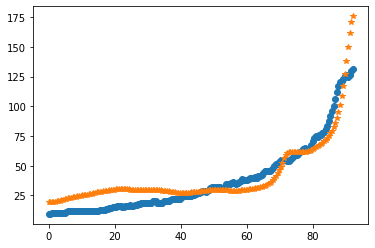

after perturb [7.502570359213352, 151.57481122762317, 30491.333295203403, 0.9950788475923431, 45.25040049426643]
parameters [7.502570359213352, 151.57481122762317, 30491.333295203403, 0.9950788475923431, 45.25040049426643]
after perturb [2.4287873536244584, 175.46651412389082, 19020.00127425201, 0.7607388817856531, 32.61450335525075]
parameters [2.4287873536244584, 175.46651412389082, 19020.00127425201, 0.7607388817856531, 32.61450335525075]
after perturb [7.081647903493962, 94.63115294279814, 29032.157255007314, 0.2770373040426716, 38.356621475105534]
parameters [7.081647903493962, 94.63115294279814, 29032.157255007314, 0.2770373040426716, 38.356621475105534]
after perturb [4.288599013666186, 125.91782515702019, 23740.673477010634, 0.5522906023308934, 34.234181742122495]
parameters [4.288599013666186, 125.91782515702019, 23740.673477010634, 0.5522906023308934, 34.234181742122495]
oxigeno [2.95876235e-10 2.97872184e-10 3.03888424e-10 3.14010634e-10
 3.28383293e-10 3.47212227e-10 3.7076

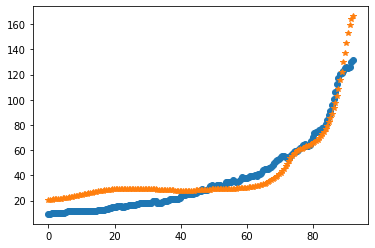

after perturb [2.1471490040916663, 136.08129212030119, 28808.939488932447, 0.8459631681135674, 35.99488309800812]
parameters [2.1471490040916663, 136.08129212030119, 28808.939488932447, 0.8459631681135674, 35.99488309800812]
oxigeno [4.27449792e-12 4.31194784e-12 4.42501104e-12 4.61584507e-12
 4.88810370e-12 5.24702473e-12 5.69955483e-12 6.25451367e-12
 6.92280038e-12 7.71764632e-12 8.65491924e-12 9.75348549e-12
 1.10356381e-11 1.25276006e-11 1.42601188e-11 1.62691544e-11
 1.85966993e-11 2.12917300e-11 2.44113294e-11 2.80220061e-11
 3.22012453e-11 3.70393359e-11 4.26415191e-11 4.91305165e-11
 5.66494985e-11 6.53655674e-11 7.54738373e-11 8.72022076e-11
 1.00816945e-10 1.16629205e-10 1.35002654e-10 1.56362380e-10
 1.81205306e-10 2.10112373e-10 2.43762768e-10 2.82950552e-10
 3.28604036e-10 3.81808322e-10 4.43831467e-10 5.16154746e-10
 6.00507597e-10 6.98907850e-10 8.13707979e-10 9.47648246e-10
 1.10391776e-09 1.28622470e-09 1.49887726e-09 1.74687710e-09
 2.03602761e-09 2.37305952e-09 2.76

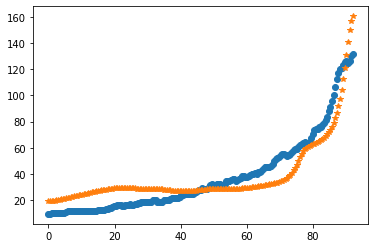

after perturb [1.3772693713892559, 141.9174402451183, 23692.201094639375, 0.7358473099806775, 31.548239647722703]
parameters [1.3772693713892559, 141.9174402451183, 23692.201094639375, 0.7358473099806775, 31.548239647722703]
oxigeno [4.74334676e-11 4.77757162e-11 4.88082312e-11 5.05484277e-11
 5.30256932e-11 5.62819382e-11 6.03723842e-11 6.53666090e-11
 7.13498734e-11 7.84247655e-11 8.67131935e-11 9.63587650e-11
 1.07529582e-10 1.20421485e-10 1.35261769e-10 1.52313434e-10
 1.71880025e-10 1.94311185e-10 2.20009091e-10 2.49436007e-10
 2.83123232e-10 3.21681774e-10 3.65815089e-10 4.16334184e-10
 4.74175367e-10 5.40420824e-10 6.16322213e-10 7.03327408e-10
 8.03110665e-10 9.17606625e-10 1.04904888e-09 1.20001414e-09
 1.37347349e-09 1.57285249e-09 1.80210205e-09 2.06578216e-09
 2.36916033e-09 2.71832600e-09 3.12032209e-09 3.58329397e-09
 4.11665612e-09 4.73127657e-09 5.43968000e-09 6.25627115e-09
 7.19758204e-09 8.28254850e-09 9.53282343e-09 1.09731367e-08
 1.26317130e-08 1.45407605e-08 1.67

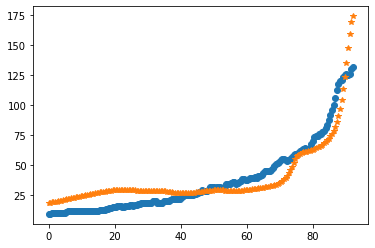

after perturb [6.570233263456173, 82.63023155797073, 19996.741793874437, 0.29713979754515435, 34.388011277310135]
parameters [6.570233263456173, 82.63023155797073, 19996.741793874437, 0.29713979754515435, 34.388011277310135]
after perturb [9.357835320914225, 135.34898885367704, 27062.644506065186, 1.0181355009088207, 36.790852373856936]
parameters [9.357835320914225, 135.34898885367704, 27062.644506065186, 1.0181355009088207, 36.790852373856936]
after perturb [4.421383459929463, 77.66169274363538, 20183.7294595352, -0.01628527469124541, 13.536161001860872]
parameters [4.421383459929463, 77.66169274363538, 20183.7294595352, -0.01628527469124541, 13.536161001860872]
after perturb [6.770992729101165, 121.57327123720586, 28448.660828057586, 0.6274189354859971, 28.496597599445703]
parameters [6.770992729101165, 121.57327123720586, 28448.660828057586, 0.6274189354859971, 28.496597599445703]
oxigeno [4.07385084e-11 4.10705946e-11 4.20723950e-11 4.37606434e-11
 4.61635907e-11 4.93215540e-11 5.

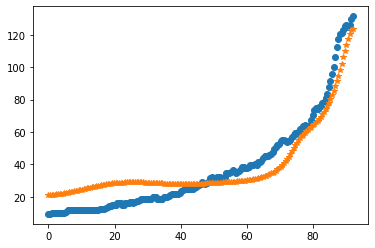

after perturb [6.782096577244145, 106.18479677146338, 29520.219254538417, 0.7733142161626934, 45.02059343179412]
parameters [6.782096577244145, 106.18479677146338, 29520.219254538417, 0.7733142161626934, 45.02059343179412]
after perturb [4.636630717498255, 103.49055124999173, 13494.485885039478, -0.05224228246162932, 14.021631114656822]
parameters [4.636630717498255, 103.49055124999173, 13494.485885039478, -0.05224228246162932, 14.021631114656822]
after perturb [3.751337682659283, 130.8641203772593, 27658.932247996716, 0.5546417668471236, 31.62817108989776]
parameters [3.751337682659283, 130.8641203772593, 27658.932247996716, 0.5546417668471236, 31.62817108989776]
oxigeno [4.59857323e-10 4.62821637e-10 4.71755299e-10 4.86781174e-10
 5.08106403e-10 5.36025976e-10 5.70927815e-10 6.13299416e-10
 6.63736163e-10 7.22951426e-10 7.91788600e-10 8.71235278e-10
 9.62439776e-10 1.06673030e-09 1.18563707e-09 1.32091778e-09
 1.47458688e-09 1.64894912e-09 1.84663808e-09 2.07066025e-09
 2.32444552e-0

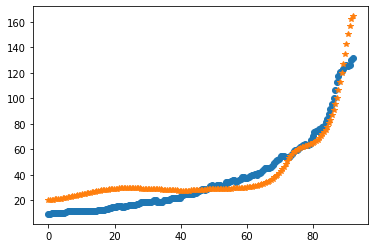

after perturb [5.354103099560202, 131.71761897806257, 27662.479789962177, 0.755182816238485, 27.28366462425224]
parameters [5.354103099560202, 131.71761897806257, 27662.479789962177, 0.755182816238485, 27.28366462425224]
oxigeno [1.19608268e-11 1.20644836e-11 1.23773080e-11 1.29049021e-11
 1.36567348e-11 1.46463425e-11 1.58916171e-11 1.74151857e-11
 1.92448923e-11 2.14143899e-11 2.39638579e-11 2.69408593e-11
 3.04013577e-11 3.44109155e-11 3.90461020e-11 4.43961404e-11
 5.05648341e-11 5.76728126e-11 6.58601505e-11 7.52894174e-11
 8.61492286e-11 9.86583774e-11 1.13070642e-10 1.29680374e-10
 1.48829004e-10 1.70912588e-10 1.96390595e-10 2.25796100e-10
 2.59747626e-10 2.98962893e-10 3.44274761e-10 3.96649726e-10
 4.57209356e-10 5.27255126e-10 6.08297171e-10 7.02087571e-10
 8.10658836e-10 9.36368415e-10 1.08195011e-09 1.25057348e-09
 1.44591240e-09 1.67222417e-09 1.93444084e-09 2.23827444e-09
 2.59033837e-09 2.99828730e-09 3.47097841e-09 4.01865714e-09
 4.65317122e-09 5.38821721e-09 6.239624

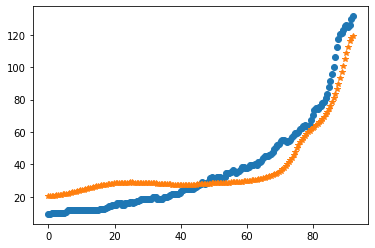

after perturb [4.21321751336351, 120.28296308171454, 24687.444849426538, 0.4990567271054001, 15.355193759357206]
parameters [4.21321751336351, 120.28296308171454, 24687.444849426538, 0.4990567271054001, 15.355193759357206]
oxigeno [4.92333920e-10 4.95566107e-10 5.05307759e-10 5.21694933e-10
 5.44956981e-10 5.75420487e-10 6.13514849e-10 6.59779604e-10
 7.14873601e-10 7.79586161e-10 8.54850414e-10 9.41759012e-10
 1.04158249e-09 1.15579058e-09 1.28607682e-09 1.43438694e-09
 1.60295145e-09 1.79432304e-09 2.01141948e-09 2.25757270e-09
 2.53658501e-09 2.85279341e-09 3.21114310e-09 3.61727151e-09
 4.07760430e-09 4.59946490e-09 5.19119962e-09 5.86232016e-09
 6.62366609e-09 7.48758981e-09 8.46816701e-09 9.58143584e-09
 1.08456686e-08 1.22816800e-08 1.39131767e-08 1.57671532e-08
 1.78743399e-08 2.02697098e-08 2.29930516e-08 2.60896158e-08
 2.96108459e-08 3.36152019e-08 3.81690901e-08 4.33479125e-08
 4.92372496e-08 5.59341959e-08 6.35488666e-08 7.22060990e-08
 8.20473728e-08 9.32329807e-08 1.0594

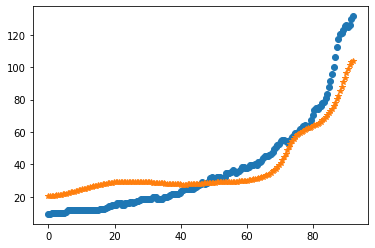

after perturb [5.846573858589961, 143.0385427288471, 25848.133759178643, 0.9268258361708113, 48.78858770114895]
parameters [5.846573858589961, 143.0385427288471, 25848.133759178643, 0.9268258361708113, 48.78858770114895]
oxigeno [2.38118429e-12 2.40369244e-12 2.47165497e-12 2.58639605e-12
 2.75015622e-12 2.96614359e-12 3.23860721e-12 3.57293442e-12
 3.97577452e-12 4.45519164e-12 5.02085067e-12 5.68424069e-12
 6.45894131e-12 7.36093849e-12 8.40899765e-12 9.62510307e-12
 1.10349747e-11 1.26686747e-11 1.45613198e-11 1.67539153e-11
 1.92943335e-11 2.22384595e-11 2.56515331e-11 2.96097203e-11
 3.42019530e-11 3.95320822e-11 4.57213978e-11 5.29115769e-11
 6.12681312e-11 7.09844387e-11 8.22864557e-11 9.54382222e-11
 1.10748292e-10 1.28577241e-10 1.49346423e-10 1.73548195e-10
 2.01757824e-10 2.34647375e-10 2.73001880e-10 3.17738176e-10
 3.69926815e-10 4.30817573e-10 5.01869104e-10 5.84783421e-10
 6.81545980e-10 7.94472244e-10 9.26261777e-10 1.08006108e-09
 1.25953650e-09 1.46895895e-09 1.713302

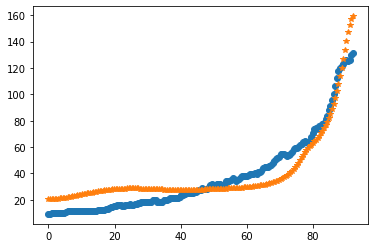

after perturb [3.5696973833919174, 115.339806001819, 23318.742951253746, 0.4538856291820231, 25.2549465035692]
parameters [3.5696973833919174, 115.339806001819, 23318.742951253746, 0.4538856291820231, 25.2549465035692]
oxigeno [9.54598943e-10 9.60202615e-10 9.77089684e-10 1.00548957e-09
 1.04578882e-09 1.09853753e-09 1.16445829e-09 1.24445805e-09
 1.33964283e-09 1.45133561e-09 1.58109764e-09 1.73075349e-09
 1.90242014e-09 2.09854080e-09 2.32192372e-09 2.57578693e-09
 2.86380944e-09 3.19018991e-09 3.55971384e-09 3.97783023e-09
 4.45073939e-09 4.98549304e-09 5.59010867e-09 6.27369999e-09
 7.04662566e-09 7.92065868e-09 8.90917930e-09 1.00273944e-08
 1.12925869e-08 1.27243987e-08 1.43451520e-08 1.61802131e-08
 1.82584041e-08 2.06124689e-08 2.32795994e-08 2.63020281e-08
 2.97276980e-08 3.36110144e-08 3.80136924e-08 4.30057081e-08
 4.86663670e-08 5.50855040e-08 6.23648292e-08 7.06194393e-08
 7.99795137e-08 9.05922201e-08 1.02623857e-07 1.16262261e-07
 1.31719522e-07 1.49235040e-07 1.69078968

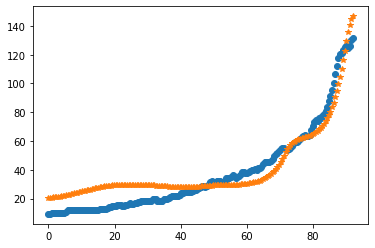

after perturb [5.3662735162816055, 122.79428105294203, 26476.959855309535, 0.5527965014360219, 17.270339654284967]
parameters [5.3662735162816055, 122.79428105294203, 26476.959855309535, 0.5527965014360219, 17.270339654284967]
oxigeno [2.02414952e-10 2.03863579e-10 2.08230966e-10 2.15582016e-10
 2.26026186e-10 2.39719444e-10 2.56867053e-10 2.77727226e-10
 3.02615735e-10 3.31911532e-10 3.66063497e-10 4.05598430e-10
 4.51130426e-10 5.03371814e-10 5.63145843e-10 6.31401368e-10
 7.09229785e-10 7.97884547e-10 8.98803605e-10 1.01363521e-09
 1.14426751e-09 1.29286258e-09 1.46189536e-09 1.65419839e-09
 1.87301303e-09 2.12204810e-09 2.40554708e-09 2.72836499e-09
 3.09605626e-09 3.51497531e-09 3.99239132e-09 4.53661937e-09
 5.15717008e-09 5.86492021e-09 6.67230716e-09 7.59355051e-09
 8.64490418e-09 9.84494339e-09 1.12148910e-08 1.27789882e-08
 1.45649163e-08 1.66042751e-08 1.89331261e-08 2.15926100e-08
 2.46296462e-08 2.80977274e-08 3.20578212e-08 3.65793919e-08
 4.17415611e-08 4.76344227e-08 5.

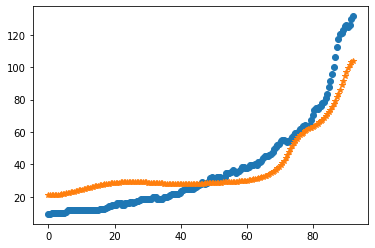

after perturb [2.571083887633116, 138.243184265646, 26894.740509736177, 0.5575601786684297, 18.367208144508993]
parameters [2.571083887633116, 138.243184265646, 26894.740509736177, 0.5575601786684297, 18.367208144508993]
oxigeno [8.38039171e-10 8.43096672e-10 8.58336443e-10 8.83961427e-10
 9.20313697e-10 9.67880237e-10 1.02730110e-09 1.09938006e-09
 1.18509778e-09 1.28562777e-09 1.40235527e-09 1.53689930e-09
 1.69113828e-09 1.86723956e-09 2.06769339e-09 2.29535198e-09
 2.55347424e-09 2.84577714e-09 3.17649464e-09 3.55044527e-09
 3.97310964e-09 4.45071928e-09 4.99035840e-09 5.60008031e-09
 6.28904049e-09 7.06764829e-09 7.94773995e-09 8.94277541e-09
 1.00680620e-08 1.13410087e-08 1.27814146e-08 1.44117957e-08
 1.62577564e-08 1.83484090e-08 2.07168486e-08 2.34006899e-08
 2.64426714e-08 2.98913361e-08 3.38017948e-08 3.82365817e-08
 4.32666111e-08 4.89722456e-08 5.54444887e-08 6.27863158e-08
 7.11141620e-08 8.05595864e-08 9.12711406e-08 1.03416470e-07
 1.17184682e-07 1.32789029e-07 1.504699

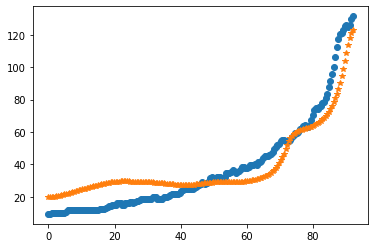

after perturb [3.6749238305056537, 139.54304273102807, 21861.900372369673, 0.6151870890298167, 29.421162872051745]
parameters [3.6749238305056537, 139.54304273102807, 21861.900372369673, 0.6151870890298167, 29.421162872051745]
oxigeno [3.18256271e-10 3.20351126e-10 3.26665101e-10 3.37286945e-10
 3.52366327e-10 3.72116480e-10 3.96817967e-10 4.26823602e-10
 4.62564620e-10 5.04558169e-10 5.53416252e-10 6.09856269e-10
 6.74713314e-10 7.48954466e-10 8.33695298e-10 9.30218915e-10
 1.03999786e-09 1.16471931e-09 1.30631395e-09 1.46698923e-09
 1.64926737e-09 1.85602909e-09 2.09056365e-09 2.35662622e-09
 2.65850357e-09 3.00108930e-09 3.38996982e-09 3.83152275e-09
 4.33302917e-09 4.90280182e-09 5.55033132e-09 6.28645258e-09
 7.12353438e-09 8.07569479e-09 9.15904590e-09 1.03919714e-08
 1.17954415e-08 1.33933691e-08 1.52130128e-08 1.72854335e-08
 1.96460084e-08 2.23350134e-08 2.53982793e-08 2.88879333e-08
 3.28632364e-08 3.73915286e-08 4.25492984e-08 4.84233907e-08
 5.51123752e-08 6.27280951e-08 7.

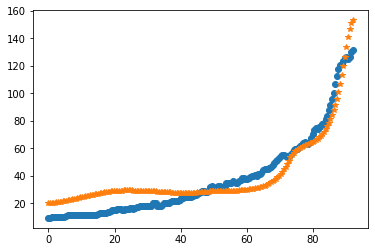

after perturb [5.024501750440234, 136.15282654474976, 30808.795393394696, 0.7093614225731819, 36.52308991132434]
parameters [5.024501750440234, 136.15282654474976, 30808.795393394696, 0.7093614225731819, 36.52308991132434]
after perturb [4.546292697998683, 114.50647848199503, 28981.414690194662, 0.4343704263520243, 30.730871804318596]
parameters [4.546292697998683, 114.50647848199503, 28981.414690194662, 0.4343704263520243, 30.730871804318596]
oxigeno [1.46358321e-09 1.47156525e-09 1.49561681e-09 1.53605581e-09
 1.59341766e-09 1.66846353e-09 1.76219227e-09 1.87585584e-09
 2.01097877e-09 2.16938172e-09 2.35320959e-09 2.56496461e-09
 2.80754489e-09 3.08428896e-09 3.39902721e-09 3.75614082e-09
 4.16062924e-09 4.61818728e-09 5.13529310e-09 5.71930843e-09
 6.37859274e-09 7.12263312e-09 7.96219201e-09 8.90947499e-09
 9.97832147e-09 1.11844210e-08 1.25455588e-08 1.40818936e-08
 1.58162730e-08 1.77745898e-08 1.99861847e-08 2.24843023e-08
 2.53066043e-08 2.84957495e-08 3.21000464e-08 3.61741888

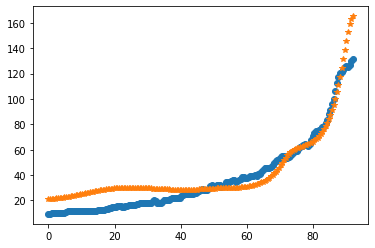

after perturb [6.310203406539212, 114.75303787661706, 34472.175742660875, 0.6606592983588082, 42.736044422867536]
parameters [6.310203406539212, 114.75303787661706, 34472.175742660875, 0.6606592983588082, 42.736044422867536]
after perturb [5.0301305364522655, 100.69247717188196, 27655.693103298978, 0.42074700582252905, 32.29141229220389]
parameters [5.0301305364522655, 100.69247717188196, 27655.693103298978, 0.42074700582252905, 32.29141229220389]
oxigeno [6.73172562e-10 6.75565467e-10 6.82785242e-10 6.94955697e-10
 7.12285281e-10 7.35070270e-10 7.63699329e-10 7.98659523e-10
 8.40543897e-10 8.90060783e-10 9.48045000e-10 1.01547116e-09
 1.09346934e-09 1.18334339e-09 1.28659226e-09 1.40493467e-09
 1.54033760e-09 1.69504921e-09 1.87163656e-09 2.07302907e-09
 2.30256828e-09 2.56406491e-09 2.86186425e-09 3.20092082e-09
 3.58688395e-09 4.02619536e-09 4.52620073e-09 5.09527691e-09
 5.74297708e-09 6.48019611e-09 7.31935887e-09 8.27463457e-09
 9.36218047e-09 1.06004188e-08 1.20103514e-08 1.3615

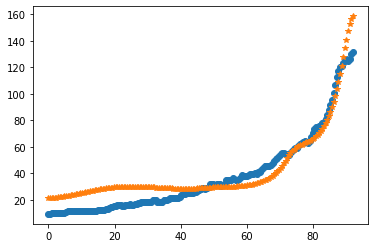

after perturb [5.347500716660368, 86.83414760264856, 29256.009110580933, 0.2366795672536229, 23.712842983848383]
parameters [5.347500716660368, 86.83414760264856, 29256.009110580933, 0.2366795672536229, 23.712842983848383]
after perturb [0.46976942219361284, 150.72162952584043, 17467.962350108915, 0.5498976894213518, 26.778346240266387]
parameters [0.46976942219361284, 150.72162952584043, 17467.962350108915, 0.5498976894213518, 26.778346240266387]
after perturb [0.1013253047310787, 140.4576696018008, 19594.33572434634, 0.5618258314094118, 18.958257873486833]
parameters [0.1013253047310787, 140.4576696018008, 19594.33572434634, 0.5618258314094118, 18.958257873486833]
after perturb [4.029392271644527, 126.07356005232984, 22523.421426359033, 0.08843591458135547, 7.653682171722753]
parameters [4.029392271644527, 126.07356005232984, 22523.421426359033, 0.08843591458135547, 7.653682171722753]
after perturb [5.266838983263809, 148.3341929234775, 20665.614149876103, 0.4028577564007517, 22.2103

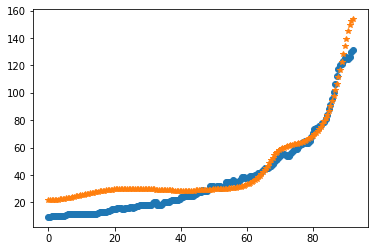

after perturb [7.344356056027539, 89.80410216760653, 27429.043817796817, 0.42088626905058973, 29.980814669413157]
parameters [7.344356056027539, 89.80410216760653, 27429.043817796817, 0.42088626905058973, 29.980814669413157]
after perturb [3.1876055416403295, 127.09338416263681, 23695.785385500316, 0.7239375078669157, 40.158810558320525]
parameters [3.1876055416403295, 127.09338416263681, 23695.785385500316, 0.7239375078669157, 40.158810558320525]
oxigeno [1.22085530e-11 1.23108787e-11 1.26196721e-11 1.31404225e-11
 1.38824128e-11 1.48589249e-11 1.60875303e-11 1.75904747e-11
 1.93951615e-11 2.15347455e-11 2.40488470e-11 2.69844032e-11
 3.03966736e-11 3.43504218e-11 3.89213000e-11 4.41974678e-11
 5.02814829e-11 5.72925067e-11 6.53688778e-11 7.46711134e-11
 8.53854099e-11 9.77277251e-11 1.11948537e-10 1.28338395e-10
 1.47234381e-10 1.69027648e-10 1.94172187e-10 2.23195037e-10
 2.56708161e-10 2.95422248e-10 3.40162753e-10 3.91888512e-10
 4.51713341e-10 5.20931065e-10 6.01044503e-10 6.9379

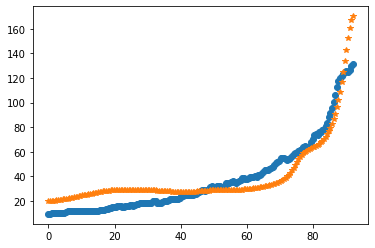

after perturb [1.5754565012051123, 141.95956744479219, 23903.460881492545, 0.632551871106372, 24.451254083017552]
parameters [1.5754565012051123, 141.95956744479219, 23903.460881492545, 0.632551871106372, 24.451254083017552]
oxigeno [2.90723352e-10 2.92573123e-10 2.98149781e-10 3.07535841e-10
 3.20870395e-10 3.38351501e-10 3.60239566e-10 3.86861789e-10
 4.18617746e-10 4.55986192e-10 4.99533214e-10 5.49921825e-10
 6.07923138e-10 6.74429250e-10 7.50468001e-10 8.37219827e-10
 9.36037023e-10 1.04846585e-09 1.17627207e-09 1.32147068e-09
 1.48636067e-09 1.67356582e-09 1.88608251e-09 2.12733545e-09
 2.40124222e-09 2.71228726e-09 3.06560606e-09 3.46708026e-09
 3.92344470e-09 4.44240794e-09 5.03278857e-09 5.70467031e-09
 6.46957992e-09 7.34069259e-09 8.33306992e-09 9.46393539e-09
 1.07529920e-08 1.22227855e-08 1.38991158e-08 1.58114977e-08
 1.79936721e-08 2.04841690e-08 2.33269240e-08 2.65719549e-08
 3.02761063e-08 3.45038777e-08 3.93283528e-08 4.48322559e-08
 5.11091630e-08 5.82649008e-08 6.64

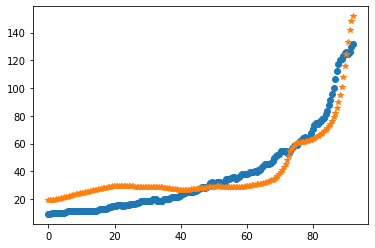

after perturb [7.439366400421413, 117.65832631838184, 28728.938919281078, 0.48650630268530176, 39.730927574990965]
parameters [7.439366400421413, 117.65832631838184, 28728.938919281078, 0.48650630268530176, 39.730927574990965]
after perturb [3.8398527021301736, 93.44540951375446, 22988.14649509055, 0.31155236166574524, 11.07652826529981]
parameters [3.8398527021301736, 93.44540951375446, 22988.14649509055, 0.31155236166574524, 11.07652826529981]
oxigeno [3.33686714e-08 3.33593957e-08 3.33320404e-08 3.32880189e-08
 3.32296822e-08 3.31603121e-08 3.30841140e-08 3.30062106e-08
 3.29326382e-08 3.28703486e-08 3.28272183e-08 3.28120677e-08
 3.28346936e-08 3.29059159e-08 3.30376427e-08 3.32429547e-08
 3.35362125e-08 3.39331882e-08 3.44512239e-08 3.51094208e-08
 3.59288600e-08 3.69328595e-08 3.81472707e-08 3.96008179e-08
 4.13254861e-08 4.33569618e-08 4.57351340e-08 4.85046597e-08
 5.17156045e-08 5.54241646e-08 5.96934799e-08 6.45945502e-08
 7.02072638e-08 7.66215531e-08 8.39386904e-08 9.227273

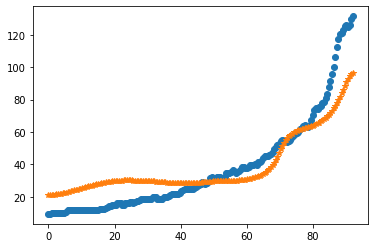

after perturb [4.7234923338906585, 115.77181925202413, 19832.871322064053, 0.4465670353302657, 36.666377336788024]
parameters [4.7234923338906585, 115.77181925202413, 19832.871322064053, 0.4465670353302657, 36.666377336788024]
after perturb [0.19452042226136879, 143.3915342764609, 23930.897082624928, 0.7143141541360011, 31.181833867164045]
parameters [0.19452042226136879, 143.3915342764609, 23930.897082624928, 0.7143141541360011, 31.181833867164045]
oxigeno [7.86356871e-11 7.91191907e-11 8.05890935e-11 8.31002638e-11
 8.67349644e-11 9.15937193e-11 9.77881702e-11 1.05437492e-10
 1.14668225e-10 1.25616440e-10 1.38432344e-10 1.53289778e-10
 1.70403106e-10 1.90049406e-10 2.12588016e-10 2.38468374e-10
 2.68222451e-10 3.02446372e-10 3.41782889e-10 3.86916725e-10
 4.38585618e-10 4.97599409e-10 5.64858264e-10 6.41371558e-10
 7.28294045e-10 8.27002786e-10 9.39222177e-10 1.06716575e-09
 1.21363043e-09 1.38198493e-09 1.57604091e-09 1.79986112e-09
 2.05762186e-09 2.35365938e-09 2.69274452e-09 3.08

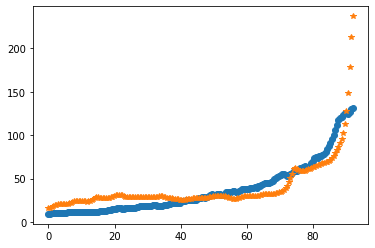

after perturb [3.9001786943257795, 146.2990911971937, 24824.69854922578, 0.5937164648318475, 30.608221996061122]
parameters [3.9001786943257795, 146.2990911971937, 24824.69854922578, 0.5937164648318475, 30.608221996061122]
oxigeno [8.42081531e-10 8.47172181e-10 8.62509979e-10 8.88293555e-10
 9.24857594e-10 9.72678337e-10 1.03238137e-09 1.10475184e-09
 1.19074716e-09 1.29151248e-09 1.40839904e-09 1.54298579e-09
 1.69710450e-09 1.87286880e-09 2.07270765e-09 2.29940372e-09
 2.55613742e-09 2.84653718e-09 3.17473694e-09 3.54544188e-09
 3.96400328e-09 4.43650406e-09 4.96985623e-09 5.57191198e-09
 6.25159017e-09 7.01902030e-09 7.88570628e-09 8.86471257e-09
 9.97087545e-09 1.12210428e-08 1.26343461e-08 1.42325076e-08
 1.60401891e-08 1.80853850e-08 2.03998667e-08 2.30196829e-08
 2.59857248e-08 2.93443608e-08 3.31481511e-08 3.74566511e-08
 4.23373138e-08 4.78665028e-08 5.41306306e-08 6.12274363e-08
 6.92674203e-08 7.83754574e-08 8.86926089e-08 1.00378162e-07
 1.13611922e-07 1.28596801e-07 1.4556

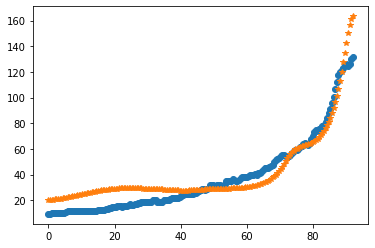

after perturb [8.28762478313935, 135.6969781697752, 30335.412879258543, 1.0006847360145652, 43.546296110894616]
parameters [8.28762478313935, 135.6969781697752, 30335.412879258543, 1.0006847360145652, 43.546296110894616]
after perturb [4.947221800905503, 96.64589608867314, 26464.692216312622, 0.010703260271951343, 36.16110873812784]
parameters [4.947221800905503, 96.64589608867314, 26464.692216312622, 0.010703260271951343, 36.16110873812784]
oxigeno [ 8.40975954  8.40895503  8.40654591  8.40254537  8.39697521  8.3898656
  8.38125467  8.37118811  8.35971865  8.34690547  8.33281362  8.31751334
  8.30107945  8.28359068  8.26512903  8.24577922  8.22562804  8.20476389
  8.18327626  8.16125531  8.13879144  8.11597503  8.09289602  8.06964375
  8.04630664  8.022972    7.99972587  7.97665279  7.95383565  7.93135552
  7.9092915   7.88772057  7.86671737  7.84635412  7.82670041  7.80782306
  7.78978599  7.77265007  7.75647303  7.74130932  7.72721006  7.71422302
  7.70239253  7.69175958  7.68236181

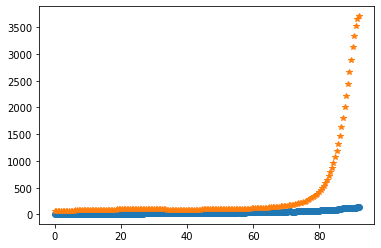

after perturb [5.40599773349679, 100.66101307188472, 25282.432245459415, 0.8131105337917162, 36.85632046685779]
parameters [5.40599773349679, 100.66101307188472, 25282.432245459415, 0.8131105337917162, 36.85632046685779]
oxigeno [6.20476070e-14 6.28271422e-14 6.51856774e-14 6.91835767e-14
 7.49233848e-14 8.25527954e-14 9.22689349e-14 1.04324093e-13
 1.19033077e-13 1.36782419e-13 1.58041720e-13 1.83377488e-13
 2.13469895e-13 2.49132991e-13 2.91339000e-13 3.41247465e-13
 4.00240179e-13 4.69962985e-13 5.52375812e-13 6.49812501e-13
 7.65052371e-13 9.01405789e-13 1.06281650e-12 1.25398398e-12
 1.48050976e-12 1.74907231e-12 2.06763622e-12 2.44570220e-12
 2.89460587e-12 3.42787482e-12 4.06165524e-12 4.81522135e-12
 5.71158372e-12 6.77821526e-12 8.04791733e-12 9.55985267e-12
 1.13607766e-11 1.35065039e-11 1.60636562e-11 1.91117413e-11
 2.27456279e-11 2.70784892e-11 3.22453014e-11 3.84070025e-11
 4.57554324e-11 5.45191991e-11 6.49706441e-11 7.74341080e-11
 9.22957375e-11 1.10015119e-10 1.311390

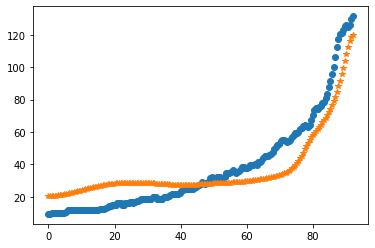

after perturb [4.460902437450967, 137.94417199375383, 25380.21658360708, 0.4650192857368389, 18.545812622058985]
parameters [4.460902437450967, 137.94417199375383, 25380.21658360708, 0.4650192857368389, 18.545812622058985]
oxigeno [5.52894765e-09 5.55810637e-09 5.64591153e-09 5.79335485e-09
 6.00210500e-09 6.27453134e-09 6.61373771e-09 7.02360638e-09
 7.50885287e-09 8.07509216e-09 8.72891722e-09 9.47799072e-09
 1.03311513e-08 1.12985356e-08 1.23917178e-08 1.36238690e-08
 1.50099377e-08 1.65668549e-08 1.83137667e-08 2.02722970e-08
 2.24668445e-08 2.49249188e-08 2.76775190e-08 3.07595613e-08
 3.42103614e-08 3.80741765e-08 4.24008171e-08 4.72463339e-08
 5.26737899e-08 5.87541269e-08 6.55671378e-08 7.32025554e-08
 8.17612709e-08 9.13566972e-08 1.02116291e-07 1.14183251e-07
 1.27718414e-07 1.42902367e-07 1.59937794e-07 1.79052099e-07
 2.00500313e-07 2.24568336e-07 2.51576539e-07 2.81883772e-07
 3.15891822e-07 3.54050378e-07 3.96862555e-07 4.44891048e-07
 4.98764993e-07 5.59187604e-07 6.2694

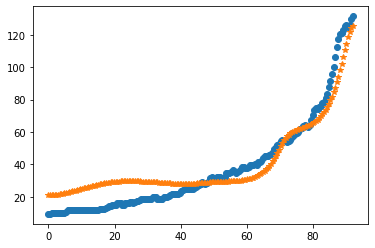

after perturb [5.603517460652888, 98.30268362401426, 22612.510806650465, 0.17036153395019799, 26.46145404179684]
parameters [5.603517460652888, 98.30268362401426, 22612.510806650465, 0.17036153395019799, 26.46145404179684]
oxigeno [5.53010894e-05 5.52745750e-05 5.51952537e-05 5.50637883e-05
 5.48812756e-05 5.46492339e-05 5.43695873e-05 5.40446451e-05
 5.36770793e-05 5.32698990e-05 5.28264235e-05 5.23502545e-05
 5.18452484e-05 5.13154892e-05 5.07652633e-05 5.01990354e-05
 4.96214279e-05 4.90372031e-05 4.84512479e-05 4.78685634e-05
 4.72942575e-05 4.67335411e-05 4.61917290e-05 4.56742440e-05
 4.51866251e-05 4.47345398e-05 4.43237997e-05 4.39603801e-05
 4.36504432e-05 4.34003649e-05 4.32167656e-05 4.31065443e-05
 4.30769166e-05 4.31354568e-05 4.32901436e-05 4.35494102e-05
 4.39221983e-05 4.44180172e-05 4.50470067e-05 4.58200058e-05
 4.67486260e-05 4.78453299e-05 4.91235167e-05 5.05976123e-05
 5.22831675e-05 5.41969619e-05 5.63571166e-05 5.87832141e-05
 6.14964271e-05 6.45196568e-05 6.7877

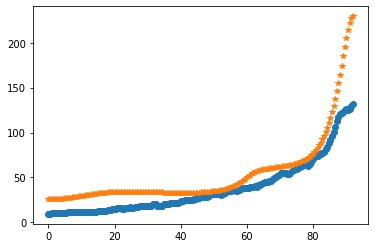

after perturb [7.683570731790681, 64.9149916183863, 30291.336727182224, 0.12757089039291225, 39.80450746733567]
parameters [7.683570731790681, 64.9149916183863, 30291.336727182224, 0.12757089039291225, 39.80450746733567]
after perturb [5.4105155145412525, 126.52829101012716, 27189.04792828136, 0.8524515733516158, 42.14279553793181]
parameters [5.4105155145412525, 126.52829101012716, 27189.04792828136, 0.8524515733516158, 42.14279553793181]
oxigeno [1.24318653e-12 1.25568425e-12 1.29343559e-12 1.35722127e-12
 1.44836339e-12 1.56875735e-12 1.72091758e-12 1.90803834e-12
 2.13407115e-12 2.40382064e-12 2.72306147e-12 3.09867918e-12
 3.53883866e-12 4.05318451e-12 4.65307858e-12 5.35188070e-12
 6.16528015e-12 7.11168629e-12 8.21268870e-12 9.49359894e-12
 1.09840881e-11 1.27189367e-11 1.47389174e-11 1.70918321e-11
 1.98337328e-11 2.30303556e-11 2.67588078e-11 3.11095493e-11
 3.61887214e-11 4.21208813e-11 4.90522138e-11 5.71542996e-11
 6.66285371e-11 7.77113272e-11 9.06801510e-11 1.05860689e-10

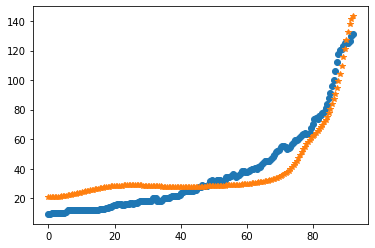

after perturb [7.125953187876272, 120.64369980784193, 32549.381863760016, 0.858843681355871, 43.765115185089805]
parameters [7.125953187876272, 120.64369980784193, 32549.381863760016, 0.858843681355871, 43.765115185089805]
after perturb [2.7538116195392965, 181.93323250132383, 25235.796620071043, 0.7057740136782392, 19.69301000439865]
parameters [2.7538116195392965, 181.93323250132383, 25235.796620071043, 0.7057740136782392, 19.69301000439865]
after perturb [2.6751618411047744, 170.45794397627947, 24618.138853882, 0.8821075831489701, 29.66004614201317]
parameters [2.6751618411047744, 170.45794397627947, 24618.138853882, 0.8821075831489701, 29.66004614201317]
after perturb [6.6229449174708215, 156.44023912529798, 25286.561131334034, 1.110347867821898, 40.90261918168342]
parameters [6.6229449174708215, 156.44023912529798, 25286.561131334034, 1.110347867821898, 40.90261918168342]
after perturb [0.22296435367134615, 124.42090197754334, 20402.46684771182, 0.2458095721465514, 25.749002973901

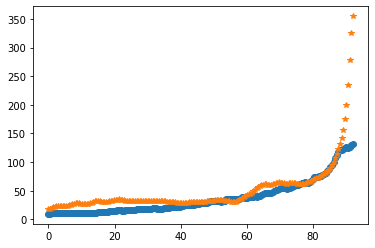

after perturb [9.037217859981192, 104.01227117717845, 30949.542905748935, 0.9074230648692183, 49.12730871567361]
parameters [9.037217859981192, 104.01227117717845, 30949.542905748935, 0.9074230648692183, 49.12730871567361]
after perturb [5.993026704626546, 162.53330285273296, 30923.758451265596, 0.8638652292513949, 46.442267619596244]
parameters [5.993026704626546, 162.53330285273296, 30923.758451265596, 0.8638652292513949, 46.442267619596244]
after perturb [1.0737304421146474, 183.47749020864626, 28638.183466563896, 1.1320532622746777, 34.37787657383943]
parameters [1.0737304421146474, 183.47749020864626, 28638.183466563896, 1.1320532622746777, 34.37787657383943]
after perturb [3.869664568479889, 140.32618951013458, 29730.274748602056, 0.8178224442388585, 46.273427456369056]
parameters [3.869664568479889, 140.32618951013458, 29730.274748602056, 0.8178224442388585, 46.273427456369056]
after perturb [4.586731142343835, 147.16336389618868, 28175.79031319629, 0.6302787114527904, 37.230477

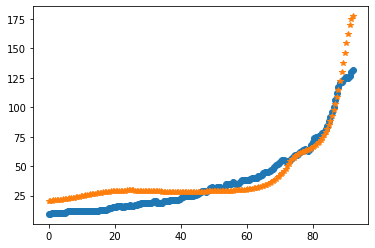

after perturb [5.770703275060298, 82.7589959959702, 20008.93759505429, 0.3075860266167131, 34.35006370938364]
parameters [5.770703275060298, 82.7589959959702, 20008.93759505429, 0.3075860266167131, 34.35006370938364]
oxigeno [6.82697441e-08 6.82152112e-08 6.80521826e-08 6.77823620e-08
 6.74085677e-08 6.69347012e-08 6.63657058e-08 6.57075158e-08
 6.49670002e-08 6.41519013e-08 6.32707724e-08 6.23329172e-08
 6.13483325e-08 6.03276592e-08 5.92821415e-08 5.82235993e-08
 5.71644138e-08 5.61175308e-08 5.50964812e-08 5.41154229e-08
 5.31892035e-08 5.23334480e-08 5.15646713e-08 5.09004180e-08
 5.03594331e-08 4.99618629e-08 4.97294924e-08 4.96860194e-08
 4.98573708e-08 5.02720641e-08 5.09616194e-08 5.19610280e-08
 5.33092815e-08 5.50499718e-08 5.72319667e-08 5.99101721e-08
 6.31463901e-08 6.70102845e-08 7.15804672e-08 7.69457174e-08
 8.32063539e-08 9.04757742e-08 9.88821847e-08 1.08570542e-07
 1.19704732e-07 1.32470020e-07 1.47075795e-07 1.63758656e-07
 1.82785875e-07 2.04459281e-07 2.29119624e-

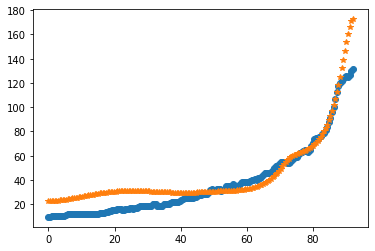

after perturb [4.8295122269231765, 112.33132628289738, 31472.894344779535, 0.6414136802624212, 45.06599337139609]
parameters [4.8295122269231765, 112.33132628289738, 31472.894344779535, 0.6414136802624212, 45.06599337139609]
after perturb [3.4220624376667104, 126.36793191726917, 16826.63916319354, 0.2611867362081638, 11.387720426636863]
parameters [3.4220624376667104, 126.36793191726917, 16826.63916319354, 0.2611867362081638, 11.387720426636863]
after perturb [6.024214510262894, 165.28545735067357, 30541.916478651932, 1.025363195675693, 33.57422352577646]
parameters [6.024214510262894, 165.28545735067357, 30541.916478651932, 1.025363195675693, 33.57422352577646]
after perturb [9.98707241495664, 98.02700394866947, 26530.167402745006, 0.1900278891124068, 32.705931025632786]
parameters [9.98707241495664, 98.02700394866947, 26530.167402745006, 0.1900278891124068, 32.705931025632786]
after perturb [3.966680150661401, 162.67286805296786, 22710.68063417328, 0.9165738310946255, 35.108263537372

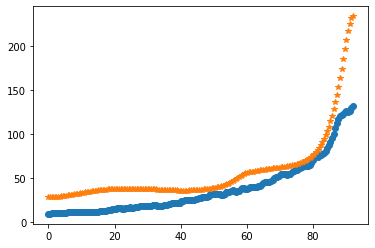

after perturb [4.446173675906221, 111.76779243372216, 27681.533762332263, 0.3414321969209187, 34.069155284401724]
parameters [4.446173675906221, 111.76779243372216, 27681.533762332263, 0.3414321969209187, 34.069155284401724]
oxigeno [2.40633483e-08 2.41118440e-08 2.42580433e-08 2.45040891e-08
 2.48535763e-08 2.53115876e-08 2.58847444e-08 2.65812736e-08
 2.74110929e-08 2.83859140e-08 2.95193677e-08 3.08271510e-08
 3.23272012e-08 3.40398962e-08 3.59882878e-08 3.81983688e-08
 4.06993791e-08 4.35241542e-08 4.67095225e-08 5.02967546e-08
 5.43320728e-08 5.88672257e-08 6.39601372e-08 6.96756360e-08
 7.60862765e-08 8.32732609e-08 9.13274724e-08 1.00350633e-07
 1.10456600e-07 1.21772812e-07 1.34441907e-07 1.48623520e-07
 1.64496294e-07 1.82260110e-07 2.02138567e-07 2.24381735e-07
 2.49269211e-07 2.77113503e-07 3.08263782e-07 3.43110027e-07
 3.82087627e-07 4.25682453e-07 4.74436490e-07 5.28954054e-07
 5.89908680e-07 6.58050748e-07 7.34215933e-07 8.19334566e-07
 9.14442021e-07 1.02069024e-06 1.13

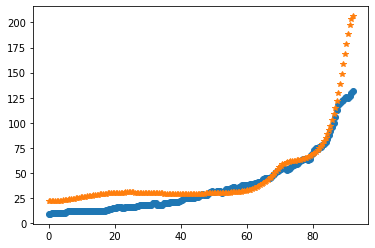

after perturb [1.9337853089838442, 133.47400288985264, 21169.182052783584, 0.36623899348917166, 18.07807886657822]
parameters [1.9337853089838442, 133.47400288985264, 21169.182052783584, 0.36623899348917166, 18.07807886657822]
oxigeno [4.18546946e-08 4.20189235e-08 4.25133232e-08 4.33430506e-08
 4.45167614e-08 4.60467010e-08 4.79488350e-08 5.02430185e-08
 5.29532079e-08 5.61077165e-08 5.97395170e-08 6.38865939e-08
 6.85923493e-08 7.39060660e-08 7.98834347e-08 8.65871513e-08
 9.40875958e-08 1.02463603e-07 1.11803343e-07 1.22205324e-07
 1.33779542e-07 1.46648789e-07 1.60950140e-07 1.76836640e-07
 1.94479189e-07 2.14068651e-07 2.35818187e-07 2.59965834e-07
 2.86777339e-07 3.16549284e-07 3.49612536e-07 3.86336064e-07
 4.27131200e-07 4.72456374e-07 5.22822412e-07 5.78798432e-07
 6.41018367e-07 7.10188150e-07 7.87093543e-07 8.72608593e-07
 9.67704715e-07 1.07346037e-06 1.19107137e-06 1.32186189e-06
 1.46729632e-06 1.62899204e-06 1.80873357e-06 2.00848828e-06
 2.23042400e-06 2.47692907e-06 2.

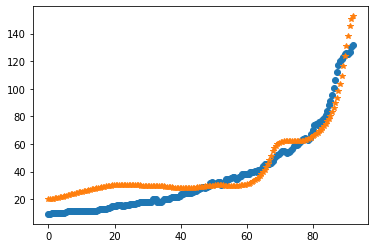

after perturb [6.194078994811682, 133.32333090940415, 20572.700828992038, 0.7939452894015518, 42.56373143270368]
parameters [6.194078994811682, 133.32333090940415, 20572.700828992038, 0.7939452894015518, 42.56373143270368]
oxigeno [7.06582902e-12 7.12902842e-12 7.31978790e-12 7.64161626e-12
 8.10044526e-12 8.70475725e-12 9.46576786e-12 1.03976678e-11
 1.15179296e-11 1.28476852e-11 1.44121848e-11 1.62413454e-11
 1.83704033e-11 2.08406836e-11 2.37005069e-11 2.70062516e-11
 3.08235980e-11 3.52289818e-11 4.03112917e-11 4.61738492e-11
 5.29367179e-11 6.07393938e-11 6.97439401e-11 8.01386390e-11
 9.21422422e-11 1.06008921e-10 1.22034024e-10 1.40560779e-10
 1.61988087e-10 1.86779581e-10 2.15474158e-10 2.48698214e-10
 2.87179855e-10 3.31765389e-10 3.83438471e-10 4.43342298e-10
 5.12805347e-10 5.93371207e-10 6.86833118e-10 7.95273980e-10
 9.21112650e-10 1.06715751e-09 1.23666841e-09 1.43342831e-09
 1.66182604e-09 1.92695198e-09 2.23470853e-09 2.59193773e-09
 3.00656854e-09 3.48778690e-09 4.0462

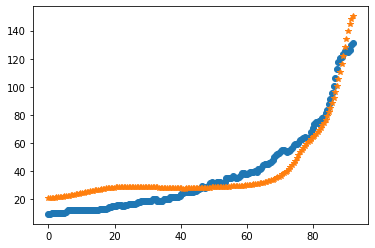

after perturb [7.682809384985468, 181.29864292038536, 33802.37080472547, 1.4080756908725003, 55.12863331832023]
parameters [7.682809384985468, 181.29864292038536, 33802.37080472547, 1.4080756908725003, 55.12863331832023]
after perturb [2.991531509338339, 54.029292595183556, 29169.48222367662, -0.13003076861127572, 11.839796864057742]
parameters [2.991531509338339, 54.029292595183556, 29169.48222367662, -0.13003076861127572, 11.839796864057742]
after perturb [6.688762867019782, 76.92236437520029, 21722.934331874585, -0.026261250464197472, 12.361351092579714]
parameters [6.688762867019782, 76.92236437520029, 21722.934331874585, -0.026261250464197472, 12.361351092579714]
after perturb [7.852013181933799, 113.63750239285524, 19479.199892069213, 0.4505958278763109, 48.30614877679935]
parameters [7.852013181933799, 113.63750239285524, 19479.199892069213, 0.4505958278763109, 48.30614877679935]
after perturb [5.127315763822834, 164.3074595313548, 30161.05099492544, 1.0084428763516349, 46.44836

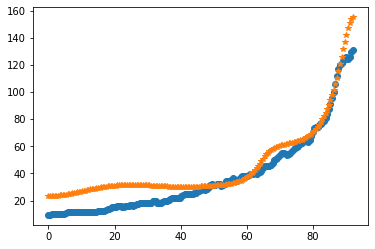

after perturb [8.768557991927885, 55.47297607716369, 19653.922009513662, -0.2837777966402146, 18.162239814003136]
parameters [8.768557991927885, 55.47297607716369, 19653.922009513662, -0.2837777966402146, 18.162239814003136]
after perturb [6.5382326185954645, 76.01077318645117, 14737.95421124631, -0.00958544782930798, 16.950472167908742]
parameters [6.5382326185954645, 76.01077318645117, 14737.95421124631, -0.00958544782930798, 16.950472167908742]
after perturb [6.286767404775216, 83.8211311329843, 18764.084953021083, 0.3286122377901239, 27.033998519557045]
parameters [6.286767404775216, 83.8211311329843, 18764.084953021083, 0.3286122377901239, 27.033998519557045]
after perturb [4.968867898279228, 198.94793409913015, 31811.719168053754, 1.2488888406047098, 37.47657566095089]
parameters [4.968867898279228, 198.94793409913015, 31811.719168053754, 1.2488888406047098, 37.47657566095089]
after perturb [7.619752935127545, 140.23020745330848, 24153.18605957605, 0.8531622286488052, 37.06897380

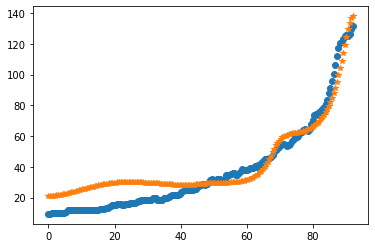

after perturb [5.1016946515367545, 127.79452667108079, 23617.253628285, 0.6571653248600053, 35.33882532503174]
parameters [5.1016946515367545, 127.79452667108079, 23617.253628285, 0.6571653248600053, 35.33882532503174]
oxigeno [4.51530480e-11 4.55075010e-11 4.65766308e-11 4.83778635e-11
 5.09406215e-11 5.43069011e-11 5.85320953e-11 6.36860789e-11
 6.98545769e-11 7.71408434e-11 8.56676830e-11 9.55798556e-11
 1.07046913e-10 1.20266525e-10 1.35468358e-10 1.52918593e-10
 1.72925170e-10 1.95843868e-10 2.22085344e-10 2.52123283e-10
 2.86503816e-10 3.25856414e-10 3.70906472e-10 4.22489844e-10
 4.81569623e-10 5.49255517e-10 6.26826197e-10 7.15755073e-10
 8.17740013e-10 9.34737576e-10 1.06900244e-09 1.22313279e-09
 1.40012250e-09 1.60342116e-09 1.83700298e-09 2.10544600e-09
 2.41402285e-09 2.76880499e-09 3.17678204e-09 3.64599865e-09
 4.18571106e-09 4.80656649e-09 5.52080830e-09 6.34251074e-09
 7.28784743e-09 8.37539844e-09 9.62650133e-09 1.10656525e-08
 1.27209663e-08 1.46246990e-08 1.68138489

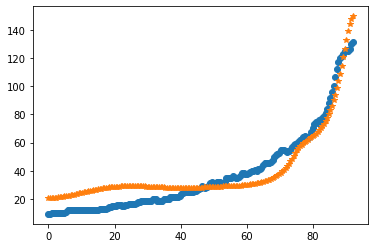

after perturb [1.344607370368783, 132.8327457203548, 21936.66850154627, 0.6435054837779474, 24.074270495163656]
parameters [1.344607370368783, 132.8327457203548, 21936.66850154627, 0.6435054837779474, 24.074270495163656]
oxigeno [1.00538276e-10 1.01235284e-10 1.03337648e-10 1.06879577e-10
 1.11918749e-10 1.18537312e-10 1.26843326e-10 1.36972684e-10
 1.49091561e-10 1.63399457e-10 1.80132901e-10 1.99569865e-10
 2.22034954e-10 2.47905401e-10 2.77617911e-10 3.11676421e-10
 3.50660905e-10 3.95237405e-10 4.46169630e-10 5.04332529e-10
 5.70728387e-10 6.46506050e-10 7.32983863e-10 8.31676890e-10
 9.44328808e-10 1.07294877e-09 1.21985341e-09 1.38771409e-09
 1.57960985e-09 1.79908648e-09 2.05022321e-09 2.33770861e-09
 2.66692850e-09 3.04406892e-09 3.47623767e-09 3.97160790e-09
 4.53958665e-09 5.19101053e-09 5.93836953e-09 6.79605907e-09
 7.78065976e-09 8.91124436e-09 1.02097124e-08 1.17011555e-08
 1.34142579e-08 1.53817428e-08 1.76408765e-08 2.02340471e-08
 2.32094365e-08 2.66218077e-08 3.053342

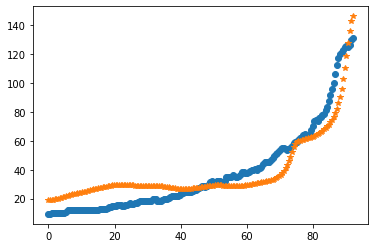

after perturb [4.339491419601295, 112.56817756894411, 24356.19359648061, 0.8081432423637649, 39.755351510654116]
parameters [4.339491419601295, 112.56817756894411, 24356.19359648061, 0.8081432423637649, 39.755351510654116]
oxigeno [4.32853380e-13 4.37542466e-13 4.51714374e-13 4.75685795e-13
 5.09993760e-13 5.55409712e-13 6.12959731e-13 6.83951450e-13
 7.70008386e-13 8.73112607e-13 9.95656905e-13 1.14050789e-12
 1.31108174e-12 1.51143471e-12 1.74637095e-12 2.02157054e-12
 2.34374154e-12 2.72080018e-12 3.16208441e-12 3.67860685e-12
 4.28335447e-12 4.99164340e-12 5.82153924e-12 6.79435477e-12
 7.93523927e-12 9.27387647e-12 1.08453106e-11 1.26909245e-11
 1.48595966e-11 1.74090696e-11 2.04075697e-11 2.39357191e-11
 2.80887965e-11 3.29794052e-11 3.87406228e-11 4.55297141e-11
 5.35325085e-11 6.29685547e-11 7.40971901e-11 8.72246791e-11
 1.02712608e-10 1.20987748e-10 1.42553646e-10 1.68004231e-10
 1.98039783e-10 2.33485685e-10 2.75314412e-10 3.24671342e-10
 3.82905026e-10 4.51602701e-10 5.3263

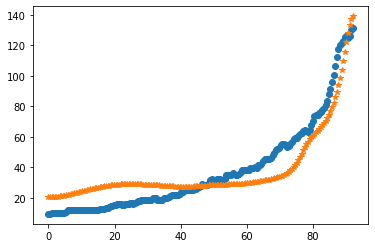

after perturb [10.59335950407059, 128.38405980710698, 20801.820452153464, 0.828310656999812, 40.401967827061675]
parameters [10.59335950407059, 128.38405980710698, 20801.820452153464, 0.828310656999812, 40.401967827061675]
after perturb [7.637560485183785, 77.45640719029204, 26597.64376564662, 0.684989246160937, 52.504953894765514]
parameters [7.637560485183785, 77.45640719029204, 26597.64376564662, 0.684989246160937, 52.504953894765514]
after perturb [8.355567732282024, 114.01895511098097, 27916.698756701473, 0.4995428729831368, 36.0162027014817]
parameters [8.355567732282024, 114.01895511098097, 27916.698756701473, 0.4995428729831368, 36.0162027014817]
after perturb [3.8747848905559503, 88.99639077696582, 18879.93728503318, -0.025941492432076052, 12.038851923533537]
parameters [3.8747848905559503, 88.99639077696582, 18879.93728503318, -0.025941492432076052, 12.038851923533537]
after perturb [6.756363486508, 162.2873461345864, 27605.420755450257, 1.0254273986599647, 33.59388614560382]

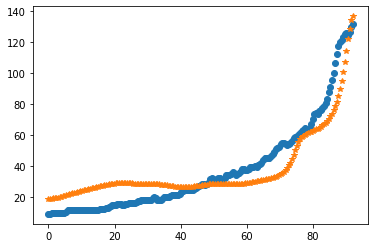

after perturb [7.53251158595128, 108.89650108137543, 23517.322579365995, 0.6632969430178088, 42.10554244554029]
parameters [7.53251158595128, 108.89650108137543, 23517.322579365995, 0.6632969430178088, 42.10554244554029]
after perturb [8.842772319113413, 156.55946306820726, 27647.4670159732, 1.0304781451357203, 45.91945650243165]
parameters [8.842772319113413, 156.55946306820726, 27647.4670159732, 1.0304781451357203, 45.91945650243165]
after perturb [4.992003090008694, 138.524777661562, 27934.38763366986, 0.7504795780481655, 41.95143298418751]
parameters [4.992003090008694, 138.524777661562, 27934.38763366986, 0.7504795780481655, 41.95143298418751]
oxigeno [2.51959244e-11 2.53982321e-11 2.60085331e-11 2.70370301e-11
 2.85009561e-11 3.04249227e-11 3.28414169e-11 3.57914568e-11
 3.93254190e-11 4.35040547e-11 4.83997156e-11 5.40978140e-11
 6.06985474e-11 6.83189244e-11 7.70951336e-11 8.71853057e-11
 9.87727277e-11 1.12069578e-10 1.27321259e-10 1.44811429e-10
 1.64867828e-10 1.87869032e-10

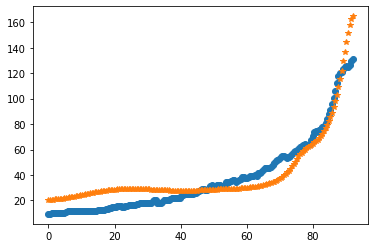

after perturb [4.173745222768532, 139.9212111044133, 18112.478399714382, 0.5538560334025001, 19.415005517453224]
parameters [4.173745222768532, 139.9212111044133, 18112.478399714382, 0.5538560334025001, 19.415005517453224]
after perturb [2.1951575177878757, 106.43217457817923, 13868.77788047232, 0.269540973091431, 13.86966968409674]
parameters [2.1951575177878757, 106.43217457817923, 13868.77788047232, 0.269540973091431, 13.86966968409674]
after perturb [6.207526330224401, 113.47404479171746, 20823.207470432302, 0.3073802388987088, 33.55087955011501]
parameters [6.207526330224401, 113.47404479171746, 20823.207470432302, 0.3073802388987088, 33.55087955011501]
oxigeno [9.51239227e-08 9.52512735e-08 9.56352244e-08 9.62814872e-08
 9.71996325e-08 9.84031686e-08 9.99096528e-08 1.01740839e-07
 1.03922862e-07 1.06486467e-07 1.09467281e-07 1.12906137e-07
 1.16849449e-07 1.21349654e-07 1.26465718e-07 1.32263713e-07
 1.38817486e-07 1.46209403e-07 1.54531209e-07 1.63884986e-07
 1.74384238e-07 1.86

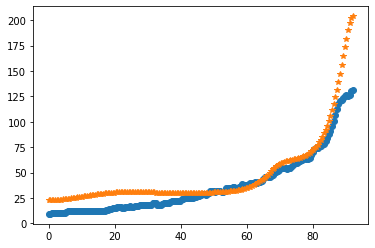

after perturb [4.6302567966052015, 97.69968985040637, 19028.728895379347, 0.42888370102646933, 29.018539583512812]
parameters [4.6302567966052015, 97.69968985040637, 19028.728895379347, 0.42888370102646933, 29.018539583512812]
after perturb [7.725694574641396, 98.52265079865813, 25554.388449661365, 0.7302874116970728, 35.932547758415474]
parameters [7.725694574641396, 98.52265079865813, 25554.388449661365, 0.7302874116970728, 35.932547758415474]
after perturb [-0.42181491439125063, 144.10142071899097, 22012.610129410536, 0.480343004304992, 15.960507828463015]
parameters [-0.42181491439125063, 144.10142071899097, 22012.610129410536, 0.480343004304992, 15.960507828463015]
after perturb [4.856226572683258, 123.85424561366415, 28889.781512567955, 0.8564349851464602, 50.650801523487075]
parameters [4.856226572683258, 123.85424561366415, 28889.781512567955, 0.8564349851464602, 50.650801523487075]
after perturb [4.91628299515421, 100.01595940359137, 14237.82556963363, 0.041013220716457355, 19

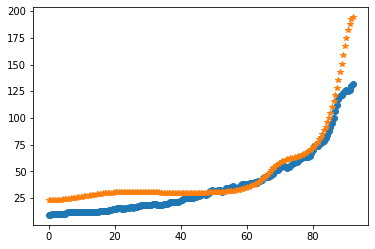

after perturb [5.4924091235256345, 103.81934761077596, 27697.96049913865, 0.3957794363367562, 34.90340197253709]
parameters [5.4924091235256345, 103.81934761077596, 27697.96049913865, 0.3957794363367562, 34.90340197253709]
oxigeno [2.02215751e-09 2.02829214e-09 2.04679480e-09 2.07796318e-09
 2.12229793e-09 2.18050961e-09 2.25352850e-09 2.34251754e-09
 2.44888866e-09 2.57432277e-09 2.72079372e-09 2.89059676e-09
 3.08638188e-09 3.31119269e-09 3.56851151e-09 3.86231135e-09
 4.19711569e-09 4.57806710e-09 5.01100576e-09 5.50255920e-09
 6.06024466e-09 6.69258576e-09 7.40924538e-09 8.22117673e-09
 9.14079503e-09 1.01821726e-08 1.13612599e-08 1.26961366e-08
 1.42072961e-08 1.59179666e-08 1.78544761e-08 2.00466638e-08
 2.25283454e-08 2.53378383e-08 2.85185543e-08 3.21196679e-08
 3.61968695e-08 4.08132131e-08 4.60400713e-08 5.19582089e-08
 5.86589915e-08 6.62457427e-08 7.48352708e-08 8.45595838e-08
 9.55678160e-08 1.08028392e-07 1.22131460e-07 1.38091619e-07
 1.56150988e-07 1.76582648e-07 1.9969

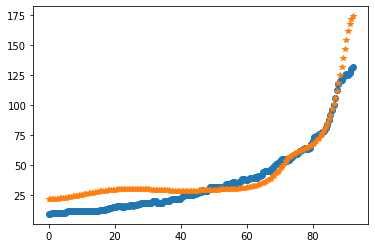

after perturb [4.822252839058402, 47.94121681419147, 24541.663471073283, -0.39216475455190136, 2.5248205610910244]
parameters [4.822252839058402, 47.94121681419147, 24541.663471073283, -0.39216475455190136, 2.5248205610910244]
after perturb [5.439994002479949, 143.53705691504504, 28175.954759713153, 0.9412104305158152, 42.33020050989753]
parameters [5.439994002479949, 143.53705691504504, 28175.954759713153, 0.9412104305158152, 42.33020050989753]
oxigeno [2.11565112e-12 2.13582049e-12 2.19672533e-12 2.29956512e-12
 2.44636985e-12 2.64004720e-12 2.88445003e-12 3.18446608e-12
 3.54613176e-12 3.97677308e-12 4.48517696e-12 5.08179724e-12
 5.77900044e-12 6.59135732e-12 7.53598755e-12 8.63296605e-12
 9.90580118e-12 1.13819968e-11 1.30937125e-11 1.50785381e-11
 1.73804029e-11 2.00506415e-11 2.31492444e-11 2.67463235e-11
 3.09238302e-11 3.57775695e-11 4.14195591e-11 4.79807937e-11
 5.56144815e-11 6.44998344e-11 7.48465024e-11 8.68997616e-11
 1.00946581e-10 1.17322715e-10 1.36420982e-10 1.587009

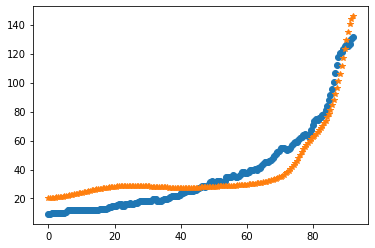

after perturb [5.966284744209043, 156.42398748692742, 26521.42458022309, 0.7219297304859833, 36.870763200338175]
parameters [5.966284744209043, 156.42398748692742, 26521.42458022309, 0.7219297304859833, 36.870763200338175]
after perturb [3.1448332965215773, 121.49960131826354, 18812.21302782019, 0.12258308556261954, 18.807324400885534]
parameters [3.1448332965215773, 121.49960131826354, 18812.21302782019, 0.12258308556261954, 18.807324400885534]
after perturb [3.56067443222726, 138.22743776244045, 18205.581079023796, 0.48322347127843013, 19.563311893655534]
parameters [3.56067443222726, 138.22743776244045, 18205.581079023796, 0.48322347127843013, 19.563311893655534]
after perturb [4.87360053826818, 106.55851456839963, 21436.262643489405, 0.7287828880000682, 40.21439368336027]
parameters [4.87360053826818, 106.55851456839963, 21436.262643489405, 0.7287828880000682, 40.21439368336027]
oxigeno [7.96303478e-13 8.04731478e-13 8.30198430e-13 8.73257811e-13
 9.34847577e-13 1.01631383e-12 1.11

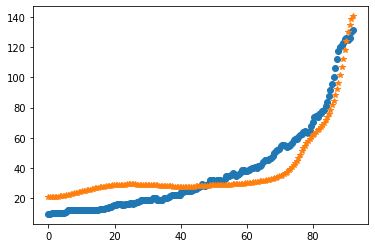

after perturb [3.5215908503494555, 172.42521629806663, 21623.967062068983, 0.7690369121192633, 29.070850127606644]
parameters [3.5215908503494555, 172.42521629806663, 21623.967062068983, 0.7690369121192633, 29.070850127606644]
after perturb [9.10306365827328, 89.87907176461991, 27515.913620803694, 0.07096566101812213, 33.45616619070746]
parameters [9.10306365827328, 89.87907176461991, 27515.913620803694, 0.07096566101812213, 33.45616619070746]
after perturb [-1.0784750960536593, 156.13684572485354, 25000.39027558, 0.5805596918459921, 17.335488236661153]
parameters [-1.0784750960536593, 156.13684572485354, 25000.39027558, 0.5805596918459921, 17.335488236661153]
after perturb [3.149590344144869, 185.50273476497802, 32109.818316714485, 1.400616303905677, 40.81682278201558]
parameters [3.149590344144869, 185.50273476497802, 32109.818316714485, 1.400616303905677, 40.81682278201558]
after perturb [8.540899887710859, 116.96768662902042, 23960.82451115838, 0.9025628500435242, 55.66491996816286

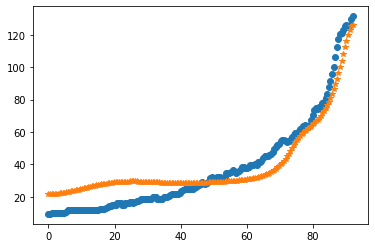

after perturb [3.529660611382484, 176.75277296457193, 22035.67653705559, 0.8694064605770293, 28.917944384569925]
parameters [3.529660611382484, 176.75277296457193, 22035.67653705559, 0.8694064605770293, 28.917944384569925]
after perturb [6.541695449276579, 91.21764740030875, 26771.84181305121, 0.5051957845248187, 27.37268883632346]
parameters [6.541695449276579, 91.21764740030875, 26771.84181305121, 0.5051957845248187, 27.37268883632346]
oxigeno [1.56592515e-11 1.57543494e-11 1.60416120e-11 1.65269881e-11
 1.72205291e-11 1.81365982e-11 1.92941703e-11 2.07172287e-11
 2.24352703e-11 2.44839283e-11 2.69057297e-11 2.97510037e-11
 3.30789635e-11 3.69589854e-11 4.14721168e-11 4.67128465e-11
 5.27911799e-11 5.98350662e-11 6.79932346e-11 7.74385041e-11
 8.83716447e-11 1.01025878e-10 1.15672120e-10 1.32625088e-10
 1.52250409e-10 1.74972892e-10 2.01286152e-10 2.31763807e-10
 2.67072482e-10 3.07986938e-10 3.55407636e-10 4.10381140e-10
 4.74123791e-10 5.48049191e-10 6.33800061e-10 7.33285190e-10
 

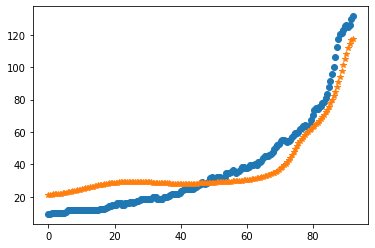

after perturb [6.445941266469527, 119.43520968000331, 21790.245586320252, 0.6298806576321769, 47.890825487819384]
parameters [6.445941266469527, 119.43520968000331, 21790.245586320252, 0.6298806576321769, 47.890825487819384]
oxigeno [2.83413507e-11 2.85740448e-11 2.92760472e-11 3.04591959e-11
 3.21434803e-11 3.43574356e-11 3.71387070e-11 4.05347941e-11
 4.46039909e-11 4.94165422e-11 5.50560380e-11 6.16210766e-11
 6.92272299e-11 7.80093523e-11 8.81242806e-11 9.97539816e-11
 1.13109213e-10 1.28433776e-10 1.46009442e-10 1.66161668e-10
 1.89266204e-10 2.15756750e-10 2.46133802e-10 2.80974883e-10
 3.20946364e-10 3.66817129e-10 4.19474344e-10 4.79941668e-10
 5.49400275e-10 6.29213093e-10 7.20952763e-10 8.26433865e-10
 9.47750045e-10 1.08731677e-09 1.24792057e-09 1.43277562e-09
 1.64558894e-09 1.89063521e-09 2.17284284e-09 2.49789277e-09
 2.87233195e-09 3.30370353e-09 3.80069628e-09 4.37331589e-09
 5.03308146e-09 5.79325062e-09 6.66907757e-09 7.67810862e-09
 8.84052072e-09 1.01795090e-08 1.17

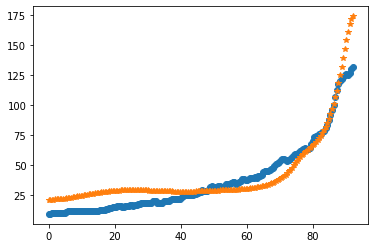

after perturb [3.329548512325088, 94.78336822084643, 23483.906644993614, 0.1699970974145001, 16.4366946596377]
parameters [3.329548512325088, 94.78336822084643, 23483.906644993614, 0.1699970974145001, 16.4366946596377]
oxigeno [4.38758820e-05 4.38510386e-05 4.37767473e-05 4.36537205e-05
 4.34831307e-05 4.32665891e-05 4.30061170e-05 4.27041112e-05
 4.23633061e-05 4.19867320e-05 4.15776734e-05 4.11396283e-05
 4.06762689e-05 4.01914067e-05 3.96889610e-05 3.91729337e-05
 3.86473885e-05 3.81164366e-05 3.75842269e-05 3.70549424e-05
 3.65328008e-05 3.60220595e-05 3.55270248e-05 3.50520638e-05
 3.46016198e-05 3.41802303e-05 3.37925465e-05 3.34433562e-05
 3.31376085e-05 3.28804399e-05 3.26772042e-05 3.25335039e-05
 3.24552244e-05 3.24485714e-05 3.25201110e-05 3.26768136e-05
 3.29261009e-05 3.32758966e-05 3.37346814e-05 3.43115522e-05
 3.50162858e-05 3.58594074e-05 3.68522652e-05 3.80071101e-05
 3.93371821e-05 4.08568048e-05 4.25814862e-05 4.45280300e-05
 4.67146552e-05 4.91611273e-05 5.18889004

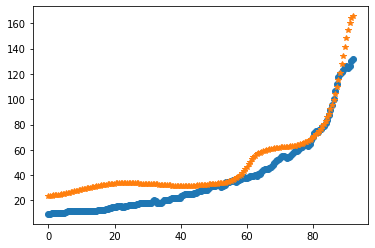

after perturb [12.058850079028424, 127.63938671471519, 29831.946207361652, 0.6258015018814951, 47.345643084689414]
parameters [12.058850079028424, 127.63938671471519, 29831.946207361652, 0.6258015018814951, 47.345643084689414]
after perturb [0.549668903839756, 166.17213451712317, 24197.829948837098, 0.8300015622640466, 35.246455968095994]
parameters [0.549668903839756, 166.17213451712317, 24197.829948837098, 0.8300015622640466, 35.246455968095994]
after perturb [3.7507448926349864, 87.43810683496075, 29961.08324288583, 0.15903898267699984, 29.3611416655971]
parameters [3.7507448926349864, 87.43810683496075, 29961.08324288583, 0.15903898267699984, 29.3611416655971]
after perturb [5.959152927070452, 104.121980531894, 20855.033501207312, 0.3778656175653078, 26.552795438406505]
parameters [5.959152927070452, 104.121980531894, 20855.033501207312, 0.3778656175653078, 26.552795438406505]
oxigeno [3.66097928e-09 3.67095209e-09 3.70102948e-09 3.75169034e-09
 3.82373982e-09 3.91831977e-09 4.0369

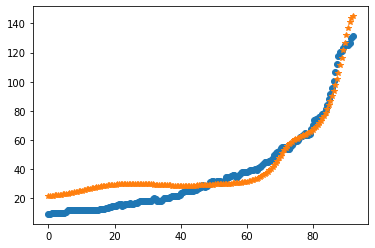

after perturb [6.2705976028654575, 117.20988021160582, 12515.879372494299, 0.38103296578583135, 9.285306028079878]
parameters [6.2705976028654575, 117.20988021160582, 12515.879372494299, 0.38103296578583135, 9.285306028079878]
after perturb [7.089150388214097, 110.47474468272448, 19090.578643425473, 0.5979690501090408, 24.518154957006594]
parameters [7.089150388214097, 110.47474468272448, 19090.578643425473, 0.5979690501090408, 24.518154957006594]
after perturb [1.9916920331171126, 152.62722122709891, 27371.143530300786, 0.4744870796561488, 13.01309745555866]
parameters [1.9916920331171126, 152.62722122709891, 27371.143530300786, 0.4744870796561488, 13.01309745555866]
after perturb [3.7925772596896854, 63.900365968850686, 22286.4197006248, -0.08593478113378178, 6.151123231943291]
parameters [3.7925772596896854, 63.900365968850686, 22286.4197006248, -0.08593478113378178, 6.151123231943291]
after perturb [5.563414038008643, 77.77238736741275, 18938.997223342736, -0.04976075990739637, 19.

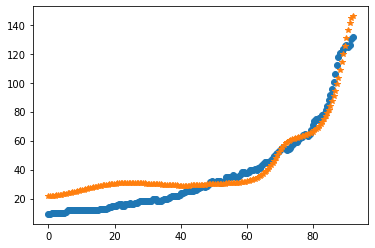

after perturb [5.117182191893226, 138.31526827230144, 24970.421031314414, 0.6898392889319878, 32.342465825053665]
parameters [5.117182191893226, 138.31526827230144, 24970.421031314414, 0.6898392889319878, 32.342465825053665]
oxigeno [7.28199856e-11 7.33662973e-11 7.50137631e-11 7.77881370e-11
 8.17328847e-11 8.69100081e-11 9.34012204e-11 1.01309494e-10
 1.10761008e-10 1.21907541e-10 1.34929334e-10 1.50038508e-10
 1.67483069e-10 1.87551609e-10 2.10578769e-10 2.36951593e-10
 2.67116878e-10 3.01589683e-10 3.40963159e-10 3.85919894e-10
 4.37244997e-10 4.95841195e-10 5.62746223e-10 6.39152863e-10
 7.26432024e-10 8.26159311e-10 9.40145596e-10 1.07047219e-09
 1.21953128e-09 1.39007239e-09 1.58525571e-09 1.80871341e-09
 2.06461983e-09 2.35777207e-09 2.69368223e-09 3.07868311e-09
 3.52004908e-09 4.02613440e-09 4.60653120e-09 5.27225017e-09
 6.03592665e-09 6.91205617e-09 7.91726297e-09 9.07060662e-09
 1.03939316e-08 1.19122659e-08 1.36542762e-08 1.56527856e-08
 1.79453658e-08 2.05750102e-08 2.35

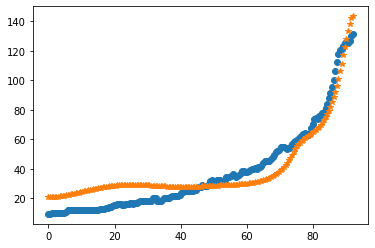

after perturb [2.1800665124906455, 122.36479034546079, 24679.495917342017, 0.39381608907507537, 13.941700245400899]
parameters [2.1800665124906455, 122.36479034546079, 24679.495917342017, 0.39381608907507537, 13.941700245400899]
oxigeno [7.91360126e-09 7.95002462e-09 8.05973064e-09 8.24403307e-09
 8.50514112e-09 8.84618909e-09 9.27127822e-09 9.78553104e-09
 1.03951588e-08 1.11075427e-08 1.19313296e-08 1.28765441e-08
 1.39547168e-08 1.51790329e-08 1.65645007e-08 1.81281453e-08
 1.98892280e-08 2.18694983e-08 2.40934804e-08 2.65888006e-08
 2.93865618e-08 3.25217693e-08 3.60338172e-08 3.99670387e-08
 4.43713302e-08 4.93028543e-08 5.48248309e-08 6.10084238e-08
 6.79337347e-08 7.56909145e-08 8.43814086e-08 9.41193511e-08
 1.05033128e-07 1.17267129e-07 1.30983712e-07 1.46365392e-07
 1.63617296e-07 1.82969871e-07 2.04681895e-07 2.29043778e-07
 2.56381189e-07 2.87059023e-07 3.21485732e-07 3.60118061e-07
 4.03466240e-07 4.52099707e-07 5.06653444e-07 5.67835038e-07
 6.36432605e-07 7.13323705e-07 

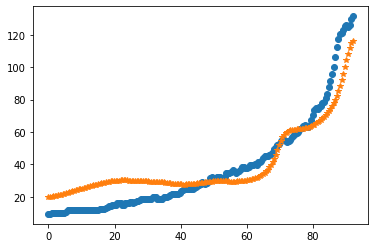

after perturb [2.6359283866897045, 122.59703293088432, 23854.067270041294, 0.57606125145121, 31.109573425679365]
parameters [2.6359283866897045, 122.59703293088432, 23854.067270041294, 0.57606125145121, 31.109573425679365]
oxigeno [1.30300095e-10 1.31221300e-10 1.33999041e-10 1.38675966e-10
 1.45324076e-10 1.54046117e-10 1.64977554e-10 1.78289145e-10
 1.94190170e-10 2.12932340e-10 2.34814460e-10 2.60187927e-10
 2.89463151e-10 3.23117019e-10 3.61701551e-10 4.05853920e-10
 4.56308027e-10 5.13907893e-10 5.79623130e-10 6.54566832e-10
 7.40016246e-10 8.37436673e-10 9.48509059e-10 1.07516186e-09
 1.21960776e-09 1.38438602e-09 1.57241119e-09 1.78702913e-09
 2.03208137e-09 2.31197902e-09 2.63178757e-09 2.99732410e-09
 3.41526864e-09 3.89329176e-09 4.44020027e-09 5.06610386e-09
 5.78260489e-09 6.60301456e-09 7.54259851e-09 8.61885532e-09
 9.85183202e-09 1.12644808e-08 1.28830625e-08 1.47376021e-08
 1.68624044e-08 1.92966370e-08 2.20849914e-08 2.52784338e-08
 2.89350595e-08 3.31210665e-08 3.7911

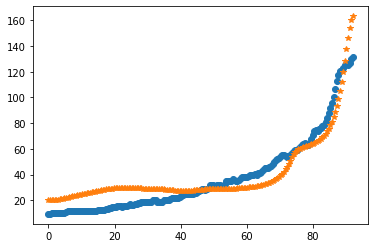

after perturb [7.488027092771054, 137.44629643481895, 27991.49478671083, 0.9246058803294649, 39.80778517562052]
parameters [7.488027092771054, 137.44629643481895, 27991.49478671083, 0.9246058803294649, 39.80778517562052]
after perturb [8.03274181619344, 145.9064809833361, 30938.382193428326, 1.023399049231315, 64.27227070405236]
parameters [8.03274181619344, 145.9064809833361, 30938.382193428326, 1.023399049231315, 64.27227070405236]
after perturb [8.610241671799185, 101.38315991331535, 18960.365710647893, 0.26920930333080717, 24.636600163482957]
parameters [8.610241671799185, 101.38315991331535, 18960.365710647893, 0.26920930333080717, 24.636600163482957]
after perturb [-0.8385948376976864, 143.40052928584106, 29073.245224395298, 0.7413749653590076, 28.668850785098936]
parameters [-0.8385948376976864, 143.40052928584106, 29073.245224395298, 0.7413749653590076, 28.668850785098936]
after perturb [3.1889821216973613, 133.04459923276434, 16904.187002872997, 0.419121419756167, 12.212207891

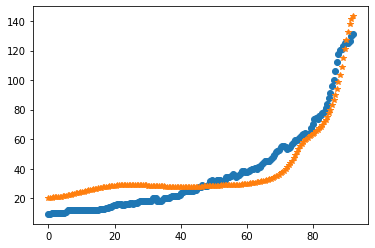

after perturb [4.517619099717454, 107.1647231155231, 16658.156878540296, 0.08379753416541857, 11.205464378661645]
parameters [4.517619099717454, 107.1647231155231, 16658.156878540296, 0.08379753416541857, 11.205464378661645]
after perturb [4.894501453581784, 61.000009553607626, 21636.878045077276, 0.2666319977976614, 26.395898226658115]
parameters [4.894501453581784, 61.000009553607626, 21636.878045077276, 0.2666319977976614, 26.395898226658115]
oxigeno [4.65596713e-07 4.65103626e-07 4.63628736e-07 4.61185068e-07
 4.57794044e-07 4.53485063e-07 4.48294929e-07 4.42267166e-07
 4.35451220e-07 4.27901592e-07 4.19676929e-07 4.10839089e-07
 4.01452217e-07 3.91581849e-07 3.81294073e-07 3.70654749e-07
 3.59728809e-07 3.48579649e-07 3.37268602e-07 3.25854511e-07
 3.14393388e-07 3.02938152e-07 2.91538459e-07 2.80240592e-07
 2.69087425e-07 2.58118445e-07 2.47369822e-07 2.36874530e-07
 2.26662508e-07 2.16760861e-07 2.07194091e-07 1.97984364e-07
 1.89151808e-07 1.80714838e-07 1.72690521e-07 1.650949

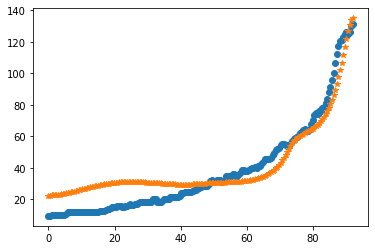

after perturb [4.12134035803915, 102.67881409929882, 22751.403418320653, 0.4230512624899121, 20.939890154115783]
parameters [4.12134035803915, 102.67881409929882, 22751.403418320653, 0.4230512624899121, 20.939890154115783]
oxigeno [6.62730442e-10 6.65599323e-10 6.74252222e-10 6.88828647e-10
 7.09563569e-10 7.36791165e-10 7.70950150e-10 8.12590790e-10
 8.62383734e-10 9.21130820e-10 9.89778044e-10 1.06943093e-09
 1.16137261e-09 1.26708482e-09 1.38827243e-09 1.52689163e-09
 1.68518261e-09 1.86570707e-09 2.07139137e-09 2.30557611e-09
 2.57207291e-09 2.87522959e-09 3.22000475e-09 3.61205314e-09
 4.05782335e-09 4.56466946e-09 5.14097857e-09 5.79631639e-09
 6.54159335e-09 7.38925388e-09 8.35349206e-09 9.45049688e-09
 1.06987312e-08 1.21192487e-08 1.37360531e-08 1.55765061e-08
 1.76717891e-08 2.00574260e-08 2.27738744e-08 2.58671941e-08
 2.93898023e-08 3.34013261e-08 3.79695659e-08 4.31715820e-08
 4.90949222e-08 5.58390071e-08 6.35166952e-08 7.22560507e-08
 8.22023418e-08 9.35202981e-08 1.0639

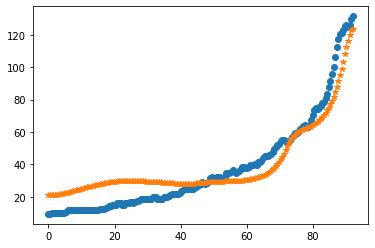

after perturb [2.4304169444836243, 96.52091069937165, 28748.40203589037, 0.09741727842600831, 9.78306280105546]
parameters [2.4304169444836243, 96.52091069937165, 28748.40203589037, 0.09741727842600831, 9.78306280105546]
after perturb [4.541753654027554, 113.0723792526944, 27865.583060494846, 0.3835986191107701, 26.612563593728428]
parameters [4.541753654027554, 113.0723792526944, 27865.583060494846, 0.3835986191107701, 26.612563593728428]
oxigeno [5.62758081e-09 5.64984281e-09 5.71691589e-09 5.82966514e-09
 5.98954538e-09 6.19862088e-09 6.45959329e-09 6.77583826e-09
 7.15145130e-09 7.59130339e-09 8.10110735e-09 8.68749569e-09
 9.35811131e-09 1.01217123e-08 1.09882921e-08 1.19692175e-08
 1.30773859e-08 1.43274038e-08 1.57357908e-08 1.73212099e-08
 1.91047296e-08 2.11101197e-08 2.33641869e-08 2.58971532e-08
 2.87430839e-08 3.19403707e-08 3.55322759e-08 3.95675454e-08
 4.41010996e-08 4.91948088e-08 5.49183661e-08 6.13502652e-08
 6.85788980e-08 7.67037840e-08 8.58369456e-08 9.61044464e-08

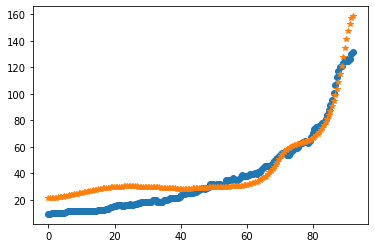

after perturb [4.933151843955617, 137.3578937798411, 21592.441791271565, 0.8052052691902393, 28.02837887981863]
parameters [4.933151843955617, 137.3578937798411, 21592.441791271565, 0.8052052691902393, 28.02837887981863]
oxigeno [9.44740746e-12 9.52964544e-12 9.77784357e-12 1.01964865e-11
 1.07931563e-11 1.15786964e-11 1.25674456e-11 1.37775486e-11
 1.52313477e-11 1.69558666e-11 1.89833951e-11 2.13521886e-11
 2.41072987e-11 2.73015518e-11 3.09967001e-11 3.52647696e-11
 4.01896367e-11 4.58688706e-11 5.24158815e-11 5.99624277e-11
 6.86615368e-11 7.86909108e-11 9.02568918e-11 1.03599082e-10
 1.18995725e-10 1.36769963e-10 1.57297132e-10 1.81013234e-10
 2.08424802e-10 2.40120361e-10 2.76783745e-10 3.19209567e-10
 3.68321172e-10 4.25191461e-10 4.91067037e-10 5.67396189e-10
 6.55861284e-10 7.58416274e-10 8.77330069e-10 1.01523669e-09
 1.17519323e-09 1.36074681e-09 1.57601188e-09 1.82575946e-09
 2.11552019e-09 2.45170313e-09 2.84173294e-09 3.29420800e-09
 3.81908296e-09 4.42787911e-09 5.133927

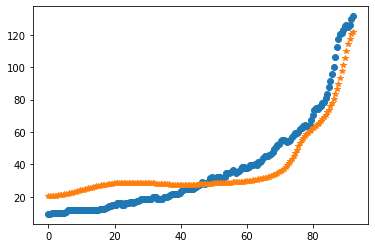

after perturb [3.6783892158968325, 107.81886574156563, 22723.276560708753, 0.33225057369108324, 12.679950160802681]
parameters [3.6783892158968325, 107.81886574156563, 22723.276560708753, 0.33225057369108324, 12.679950160802681]
oxigeno [2.05103091e-08 2.05479591e-08 2.06615321e-08 2.08529021e-08
 2.11252120e-08 2.14829029e-08 2.19317564e-08 2.24789506e-08
 2.31331319e-08 2.39045025e-08 2.48049276e-08 2.58480626e-08
 2.70495030e-08 2.84269612e-08 3.00004705e-08 3.17926221e-08
 3.38288367e-08 3.61376769e-08 3.87512027e-08 4.17053772e-08
 4.50405270e-08 4.88018642e-08 5.30400774e-08 5.78119982e-08
 6.31813545e-08 6.92196178e-08 7.60069568e-08 8.36333090e-08
 9.21995825e-08 1.01819003e-07 1.12618624e-07 1.24741007e-07
 1.38346111e-07 1.53613387e-07 1.70744117e-07 1.89964013e-07
 2.11526109e-07 2.35713968e-07 2.62845236e-07 2.93275588e-07
 3.27403089e-07 3.65673031e-07 4.08583283e-07 4.56690221e-07
 5.10615301e-07 5.71052342e-07 6.38775621e-07 7.14648860e-07
 7.99635232e-07 8.94808498e-07 

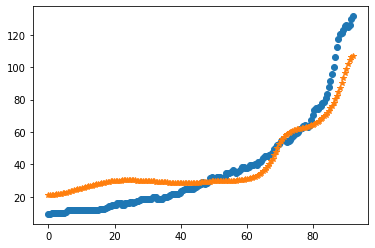

after perturb [2.8750795691861226, 89.37009449515485, 28838.71202828379, 0.40447381109251745, 32.41811749198404]
parameters [2.8750795691861226, 89.37009449515485, 28838.71202828379, 0.40447381109251745, 32.41811749198404]
oxigeno [9.25307219e-10 9.25338938e-10 9.25460079e-10 9.25748608e-10
 9.26334510e-10 9.27399938e-10 9.29179549e-10 9.31961189e-10
 9.36087058e-10 9.41955555e-10 9.50023973e-10 9.60812253e-10
 9.74907986e-10 9.92972878e-10 1.01575087e-09 1.04407815e-09
 1.07889528e-09 1.12126172e-09 1.17237298e-09 1.23358084e-09
 1.30641690e-09 1.39262003e-09 1.49416812e-09 1.61331483e-09
 1.75263201e-09 1.91505859e-09 2.10395685e-09 2.32317721e-09
 2.57713261e-09 2.87088409e-09 3.21023893e-09 3.60186327e-09
 4.05341119e-09 4.57367252e-09 5.17274185e-09 5.86221172e-09
 6.65539293e-09 7.56756554e-09 8.61626451e-09 9.82160407e-09
 1.12066459e-08 1.27978167e-08 1.46253807e-08 1.67239760e-08
 1.91332214e-08 2.18984050e-08 2.50712655e-08 2.87108804e-08
 3.28846766e-08 3.76695819e-08 4.3153

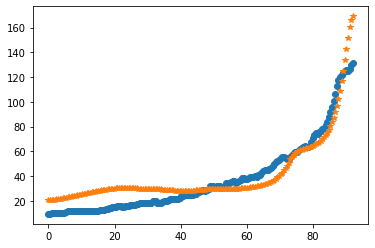

after perturb [6.1773724369726875, 122.00932829330497, 27517.62137159903, 0.7185619715547489, 34.25946331447929]
parameters [6.1773724369726875, 122.00932829330497, 27517.62137159903, 0.7185619715547489, 34.25946331447929]
oxigeno [7.54556027e-12 7.61413060e-12 7.82111794e-12 8.17037899e-12
 8.66843423e-12 9.32460918e-12 1.01512365e-11 1.11639239e-11
 1.23818932e-11 1.38283992e-11 1.55312374e-11 1.75233522e-11
 1.98435596e-11 2.25374013e-11 2.56581500e-11 2.92679879e-11
 3.34393881e-11 3.82567284e-11 4.38181772e-11 5.02378937e-11
 5.76485945e-11 6.62045460e-11 7.60850516e-11 8.74985154e-11
 1.00687175e-10 1.15932612e-10 1.33562170e-10 1.53956422e-10
 1.77557857e-10 2.04880985e-10 2.36524090e-10 2.73182880e-10
 3.15666350e-10 3.64915210e-10 4.22023261e-10 4.88262205e-10
 5.65110424e-10 6.54286325e-10 7.57786994e-10 8.77932956e-10
 1.01742000e-09 1.17937917e-09 1.36744614e-09 1.58584146e-09
 1.83946338e-09 2.13399502e-09 2.47602833e-09 2.87320721e-09
 3.33439278e-09 3.86985426e-09 4.4914

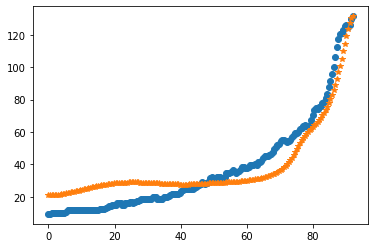

after perturb [8.565570549828395, 174.3322609446098, 29619.190396432572, 1.1762744088698693, 51.39333757359464]
parameters [8.565570549828395, 174.3322609446098, 29619.190396432572, 1.1762744088698693, 51.39333757359464]
after perturb [0.10987125585886126, 136.78621557526472, 24205.145910954307, 0.6334841749019857, 25.97398992975103]
parameters [0.10987125585886126, 136.78621557526472, 24205.145910954307, 0.6334841749019857, 25.97398992975103]
oxigeno [1.79461851e-10 1.80474405e-10 1.83567611e-10 1.88889561e-10
 1.96645995e-10 2.07071514e-10 2.20408010e-10 2.36898712e-10
 2.56796163e-10 2.80370054e-10 3.07908407e-10 3.39726664e-10
 3.76211770e-10 4.17898657e-10 4.65534258e-10 5.20089145e-10
 5.82717236e-10 6.54674808e-10 7.37245459e-10 8.31739833e-10
 9.39563289e-10 1.06228774e-09 1.20167898e-09 1.35968449e-09
 1.53843486e-09 1.74037920e-09 1.96864049e-09 2.22748669e-09
 2.52261485e-09 2.86104532e-09 3.25067359e-09 3.69954900e-09
 4.21527587e-09 4.80512939e-09 5.47705900e-09 6.24114698

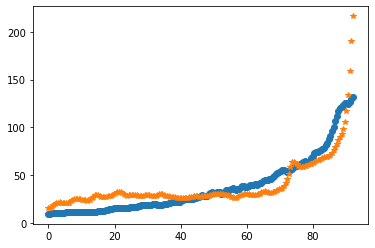

after perturb [5.934271007306103, 153.47545726253236, 22225.967258730852, 0.7313939268500964, 23.735671916005916]
parameters [5.934271007306103, 153.47545726253236, 22225.967258730852, 0.7313939268500964, 23.735671916005916]
after perturb [7.196395247920147, 137.9503752804063, 28166.22478404403, 0.6051932934857562, 32.99886998174575]
parameters [7.196395247920147, 137.9503752804063, 28166.22478404403, 0.6051932934857562, 32.99886998174575]
after perturb [3.70312223737652, 100.71283279935636, 24795.32968279917, 0.5297414595560392, 32.86305307843111]
parameters [3.70312223737652, 100.71283279935636, 24795.32968279917, 0.5297414595560392, 32.86305307843111]
oxigeno [2.69466262e-11 2.71530349e-11 2.77759568e-11 2.88265571e-11
 3.03237036e-11 3.22943620e-11 3.47741584e-11 3.78081229e-11
 4.14516265e-11 4.57715325e-11 5.08475846e-11 5.67740610e-11
 6.36617292e-11 7.16401442e-11 8.08603384e-11 9.14979629e-11
 1.03756950e-10 1.17873776e-10 1.34122425e-10 1.52820156e-10
 1.74334212e-10 1.990896

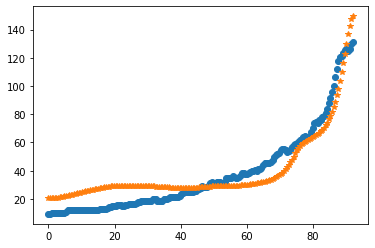

after perturb [3.698814807398728, 160.33902214909807, 26947.822180868967, 1.034879250616668, 37.83086420187162]
parameters [3.698814807398728, 160.33902214909807, 26947.822180868967, 1.034879250616668, 37.83086420187162]
after perturb [3.9649488306622898, 119.26648231155562, 21093.453287624063, 0.37383958937448125, 22.467000968375213]
parameters [3.9649488306622898, 119.26648231155562, 21093.453287624063, 0.37383958937448125, 22.467000968375213]
oxigeno [1.19093756e-08 1.19580555e-08 1.21046624e-08 1.23509044e-08
 1.26996534e-08 1.31549819e-08 1.37222166e-08 1.44080068e-08
 1.52204110e-08 1.61690008e-08 1.72649840e-08 1.85213495e-08
 1.99530339e-08 2.15771139e-08 2.34130263e-08 2.54828177e-08
 2.78114298e-08 3.04270222e-08 3.33613371e-08 3.66501136e-08
 4.03335537e-08 4.44568499e-08 4.90707785e-08 5.42323695e-08
 6.00056595e-08 6.64625381e-08 7.36836996e-08 8.17597099e-08
 9.07922022e-08 1.00895216e-07 1.12196696e-07 1.24840160e-07
 1.38986569e-07 1.54816402e-07 1.72531971e-07 1.923599

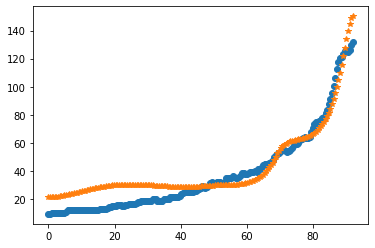

after perturb [9.776689672806464, 109.64588263500774, 27388.525493883204, 0.6012512842873752, 41.31356187909764]
parameters [9.776689672806464, 109.64588263500774, 27388.525493883204, 0.6012512842873752, 41.31356187909764]
after perturb [0.6327859686539452, 174.002667086603, 20591.662572300218, 0.665339467049531, 21.759321790788345]
parameters [0.6327859686539452, 174.002667086603, 20591.662572300218, 0.665339467049531, 21.759321790788345]
after perturb [5.514774078344645, 156.2514686766069, 29000.822687397766, 1.1752502924546544, 47.555840852562625]
parameters [5.514774078344645, 156.2514686766069, 29000.822687397766, 1.1752502924546544, 47.555840852562625]
after perturb [4.368157861421444, 126.43056698879256, 23863.62233463506, 0.5355886331349402, 14.471114520730962]
parameters [4.368157861421444, 126.43056698879256, 23863.62233463506, 0.5355886331349402, 14.471114520730962]
oxigeno [4.06939326e-10 4.09651968e-10 4.17827900e-10 4.31581800e-10
 4.51106998e-10 4.76678815e-10 5.08659311

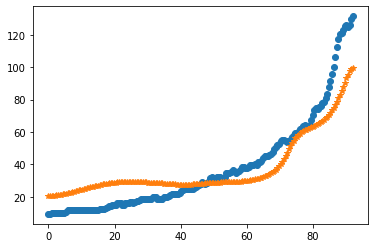

after perturb [5.360745947659199, 131.9490001938669, 28972.84166355296, 0.7135366460284462, 32.315825832596936]
parameters [5.360745947659199, 131.9490001938669, 28972.84166355296, 0.7135366460284462, 32.315825832596936]
oxigeno [2.52979553e-11 2.55051784e-11 2.61303586e-11 2.71840999e-11
 2.86843136e-11 3.06565816e-11 3.31346737e-11 3.61612318e-11
 3.97886336e-11 4.40800542e-11 4.91107472e-11 5.49695726e-11
 6.17608027e-11 6.96062450e-11 7.86477260e-11 8.90499897e-11
 1.01004072e-10 1.14731225e-10 1.30487469e-10 1.48568881e-10
 1.69317726e-10 1.93129557e-10 2.20461453e-10 2.51841550e-10
 2.87880089e-10 3.29282192e-10 3.76862656e-10 4.31563066e-10
 4.94471570e-10 5.66845750e-10 6.50139034e-10 7.46031192e-10
 8.56463534e-10 9.83679506e-10 1.13027148e-09 1.29923469e-09
 1.49402928e-09 1.71865181e-09 1.97771741e-09 2.27655431e-09
 2.62131245e-09 3.01908828e-09 3.47806807e-09 4.00769243e-09
 4.61884517e-09 5.32407008e-09 6.13781950e-09 7.07673968e-09
 8.15999793e-09 9.40965786e-09 1.085110

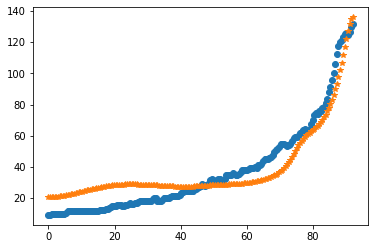

after perturb [7.661091753814402, 127.97346661128, 32969.134885238986, 1.1384501173424282, 50.90129954907179]
parameters [7.661091753814402, 127.97346661128, 32969.134885238986, 1.1384501173424282, 50.90129954907179]
after perturb [1.6901598160545457, 147.4610274102627, 23887.021320739248, 0.4017557906512762, 21.455506126410526]
parameters [1.6901598160545457, 147.4610274102627, 23887.021320739248, 0.4017557906512762, 21.455506126410526]
oxigeno [4.74610404e-08 4.76509696e-08 4.82226737e-08 4.91819207e-08
 5.05383841e-08 5.23057352e-08 5.45017765e-08 5.71486176e-08
 6.02728986e-08 6.39060640e-08 6.80846900e-08 7.28508664e-08
 7.82526386e-08 8.43445076e-08 9.11879959e-08 9.88522819e-08
 1.07414917e-07 1.16962634e-07 1.27592277e-07 1.39411866e-07
 1.52541827e-07 1.67116417e-07 1.83285355e-07 2.01215679e-07
 2.21093840e-07 2.43128021e-07 2.67550687e-07 2.94621362e-07
 3.24629638e-07 3.57898453e-07 3.94787675e-07 4.35698066e-07
 4.81075709e-07 5.31416998e-07 5.87274270e-07 6.49262155e-07
 

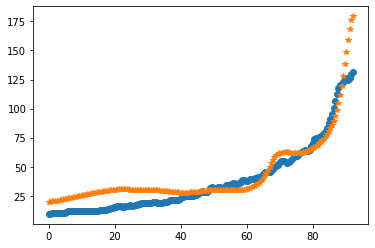

after perturb [2.291165375442107, 117.61967712157278, 23227.528296448356, 0.34138611138393693, 22.51027587895313]
parameters [2.291165375442107, 117.61967712157278, 23227.528296448356, 0.34138611138393693, 22.51027587895313]
oxigeno [3.13312928e-08 3.14172140e-08 3.16760985e-08 3.21113189e-08
 3.27285298e-08 3.35357192e-08 3.45432818e-08 3.57641173e-08
 3.72137533e-08 3.89104981e-08 4.08756241e-08 4.31335858e-08
 4.57122752e-08 4.86433199e-08 5.19624273e-08 5.57097813e-08
 5.99304970e-08 6.46751419e-08 7.00003313e-08 7.59694079e-08
 8.26532144e-08 9.01309726e-08 9.84912775e-08 1.07833220e-07
 1.18267649e-07 1.29918587e-07 1.42924815e-07 1.57441633e-07
 1.73642828e-07 1.91722861e-07 2.11899302e-07 2.34415538e-07
 2.59543789e-07 2.87588465e-07 3.18889894e-07 3.53828464e-07
 3.92829192e-07 4.36366773e-07 4.84971100e-07 5.39233314e-07
 5.99812380e-07 6.67442233e-07 7.42939543e-07 8.27212147e-07
 9.21268254e-07 1.02622652e-06 1.14332718e-06 1.27394434e-06
 1.41959978e-06 1.58197834e-06 1.76

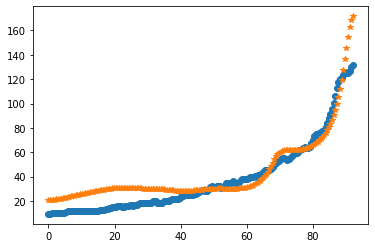

after perturb [9.00327730705143, 132.41939403108742, 22814.363496622933, 0.829853483901002, 41.48887905440699]
parameters [9.00327730705143, 132.41939403108742, 22814.363496622933, 0.829853483901002, 41.48887905440699]
after perturb [5.8275683971547885, 123.52251907090779, 25206.90227331965, 0.6038537277101591, 38.652502040835344]
parameters [5.8275683971547885, 123.52251907090779, 25206.90227331965, 0.6038537277101591, 38.652502040835344]
oxigeno [7.89877937e-11 7.95880046e-11 8.13980545e-11 8.44463717e-11
 8.87809271e-11 9.44701327e-11 1.01604122e-10 1.10296435e-10
 1.20686149e-10 1.32940479e-10 1.47257914e-10 1.63871939e-10
 1.83055419e-10 2.05125726e-10 2.30450715e-10 2.59455656e-10
 2.92631268e-10 3.30543005e-10 3.73841772e-10 4.23276297e-10
 4.79707385e-10 5.44124334e-10 6.17663848e-10 7.01631790e-10
 7.97528222e-10 9.07076185e-10 1.03225480e-09 1.17533727e-09
 1.33893457e-09 1.52604560e-09 1.74011463e-09 1.98509737e-09
 2.26553653e-09 2.58664847e-09 2.95442239e-09 3.37573392e-09

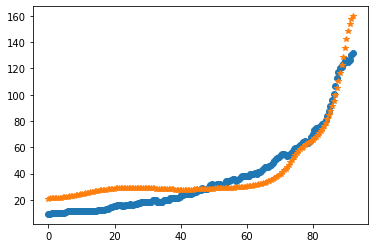

after perturb [1.5701020787256055, 107.51158175328212, 25954.021534340525, 0.12310470284941855, 28.7254204348679]
parameters [1.5701020787256055, 107.51158175328212, 25954.021534340525, 0.12310470284941855, 28.7254204348679]
oxigeno [8.84518588e-04 8.84077176e-04 8.82758600e-04 8.80579584e-04
 8.77567218e-04 8.73757872e-04 8.69195864e-04 8.63932008e-04
 8.58022177e-04 8.51525953e-04 8.44505444e-04 8.37024256e-04
 8.29146637e-04 8.20936745e-04 8.12458044e-04 8.03772811e-04
 7.94941784e-04 7.86023958e-04 7.77076567e-04 7.68155262e-04
 7.59314472e-04 7.50607903e-04 7.42089113e-04 7.33812087e-04
 7.25831719e-04 7.18204153e-04 7.10986942e-04 7.04239027e-04
 6.98020586e-04 6.92392820e-04 6.87417753e-04 6.83158120e-04
 6.79677400e-04 6.77040018e-04 6.75311696e-04 6.74559904e-04
 6.74854357e-04 6.76267467e-04 6.78874695e-04 6.82754751e-04
 6.87989636e-04 6.94664531e-04 7.02867590e-04 7.12689705e-04
 7.24224311e-04 7.37567315e-04 7.52817207e-04 7.70075388e-04
 7.89446730e-04 8.11040361e-04 8.34

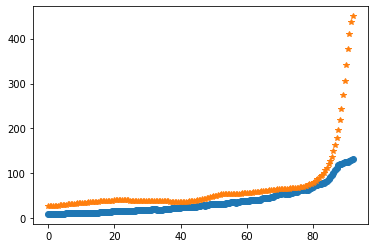

after perturb [6.475116176309404, 112.71742120322341, 23156.967013553847, 0.5716586645260643, 31.14520696975502]
parameters [6.475116176309404, 112.71742120322341, 23156.967013553847, 0.5716586645260643, 31.14520696975502]
oxigeno [4.58554169e-11 4.62274679e-11 4.73498306e-11 4.92412545e-11
 5.19333933e-11 5.54714200e-11 5.99149060e-11 6.53389806e-11
 7.18357953e-11 7.95163224e-11 8.85125240e-11 9.89799355e-11
 1.11100717e-10 1.25087233e-10 1.41186236e-10 1.59683739e-10
 1.80910672e-10 2.05249452e-10 2.33141576e-10 2.65096429e-10
 3.01701446e-10 3.43633875e-10 3.91674345e-10 4.46722545e-10
 5.09815311e-10 5.82147496e-10 6.65096032e-10 7.60247678e-10
 8.69430989e-10 9.94753141e-10 1.13864234e-09 1.30389664e-09
 1.49374007e-09 1.71188721e-09 1.96261744e-09 2.25086017e-09
 2.58229275e-09 2.96345293e-09 3.40186776e-09 3.90620150e-09
 4.48642521e-09 5.15401105e-09 5.92215484e-09 6.80603104e-09
 7.82308452e-09 8.99336460e-09 1.03399072e-08 1.18891719e-08
 1.36715419e-08 1.57218954e-08 1.8080

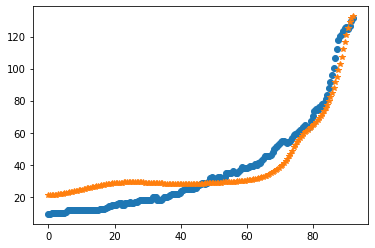

after perturb [-0.1301568378157354, 183.44842226802385, 30471.130684369564, 0.8539892782782832, 31.487186969250736]
parameters [-0.1301568378157354, 183.44842226802385, 30471.130684369564, 0.8539892782782832, 31.487186969250736]
after perturb [4.953141026735048, 147.5912515179471, 27438.157588071044, 0.8870367798158552, 32.05565510719505]
parameters [4.953141026735048, 147.5912515179471, 27438.157588071044, 0.8870367798158552, 32.05565510719505]
oxigeno [7.38762129e-12 7.45221776e-12 7.64718007e-12 7.97605251e-12
 8.44482803e-12 9.06207890e-12 9.83914364e-12 1.07903743e-11
 1.19334496e-11 1.32897608e-11 1.48848791e-11 1.67491149e-11
 1.89181818e-11 2.14339804e-11 2.43455200e-11 2.77099990e-11
 3.15940703e-11 3.60753194e-11 4.12439918e-11 4.72050081e-11
 5.40803159e-11 6.20116322e-11 7.11636419e-11 8.17277255e-11
 9.39263046e-11 1.08017905e-10 1.24303055e-10 1.43131153e-10
 1.64908464e-10 1.90107422e-10 2.19277449e-10 2.53057537e-10
 2.92190863e-10 3.37541757e-10 3.90115407e-10 4.510806

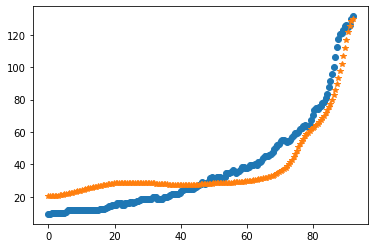

after perturb [0.18135827443479657, 124.87529710962775, 19354.768159577965, 0.19167989675584024, 5.703760794017292]
parameters [0.18135827443479657, 124.87529710962775, 19354.768159577965, 0.19167989675584024, 5.703760794017292]
after perturb [5.053332513381745, 124.22038126893679, 28862.229142846067, 0.5664647729066021, 38.57531694261597]
parameters [5.053332513381745, 124.22038126893679, 28862.229142846067, 0.5664647729066021, 38.57531694261597]
oxigeno [1.81507430e-10 1.82788178e-10 1.86649274e-10 1.93147609e-10
 2.02379139e-10 2.14480598e-10 2.29631949e-10 2.48059606e-10
 2.70040472e-10 2.95906884e-10 3.26052536e-10 3.60939486e-10
 4.01106386e-10 4.47178062e-10 4.99876639e-10 5.60034396e-10
 6.28608609e-10 7.06698633e-10 7.95565560e-10 8.96654805e-10
 1.01162204e-09 1.14236299e-09 1.29104753e-09 1.46015892e-09
 1.65253863e-09 1.87143779e-09 2.12057608e-09 2.40420909e-09
 2.72720543e-09 3.09513486e-09 3.51436895e-09 3.99219603e-09
 4.53695240e-09 5.15817182e-09 5.86675595e-09 6.6751

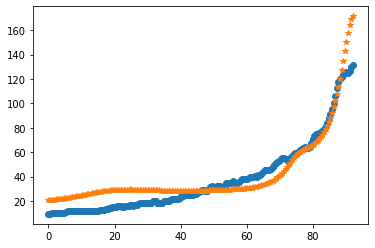

after perturb [7.729187026306083, 152.95812935775618, 24821.163459259147, 1.0088634162246555, 57.26964476808304]
parameters [7.729187026306083, 152.95812935775618, 24821.163459259147, 1.0088634162246555, 57.26964476808304]
after perturb [3.4246463926162036, 172.67534417418008, 24012.8524830803, 0.7265288440219595, 29.032936410862217]
parameters [3.4246463926162036, 172.67534417418008, 24012.8524830803, 0.7265288440219595, 29.032936410862217]
after perturb [4.00075470286648, 153.38026171086705, 26510.185489173487, 0.9299489073738023, 45.145350056902636]
parameters [4.00075470286648, 153.38026171086705, 26510.185489173487, 0.9299489073738023, 45.145350056902636]
after perturb [6.538683572944169, 140.03146169654184, 20973.5688391926, 0.7852939366135435, 29.928449599086107]
parameters [6.538683572944169, 140.03146169654184, 20973.5688391926, 0.7852939366135435, 29.928449599086107]
oxigeno [1.70917894e-11 1.72363642e-11 1.76726020e-11 1.84080940e-11
 1.94556640e-11 2.08336299e-11 2.25661779

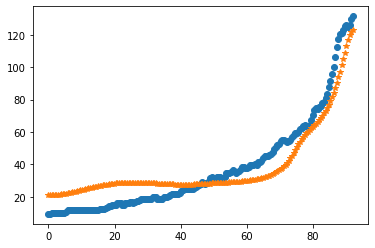

after perturb [4.849134602060457, 144.95280995781457, 23131.481612061438, 0.8653264025953482, 28.924698045948343]
parameters [4.849134602060457, 144.95280995781457, 23131.481612061438, 0.8653264025953482, 28.924698045948343]
oxigeno [7.94472084e-12 8.01407009e-12 8.22337533e-12 8.57643652e-12
 9.07967884e-12 9.74229278e-12 1.05764343e-11 1.15974900e-11
 1.28244120e-11 1.42801318e-11 1.59920602e-11 1.79926861e-11
 2.03202870e-11 2.30197675e-11 2.61436454e-11 2.97532068e-11
 3.39198592e-11 3.87267119e-11 4.42704218e-11 5.06633474e-11
 5.80360617e-11 6.65402823e-11 7.63522879e-11 8.76769007e-11
 1.00752127e-10 1.15854564e-10 1.33305699e-10 1.53479237e-10
 1.76809642e-10 2.03802061e-10 2.35043874e-10 2.71218110e-10
 3.13119041e-10 3.61670281e-10 4.17945784e-10 4.83194203e-10
 5.58867112e-10 6.46651700e-10 7.48508618e-10 8.66715768e-10
 1.00391895e-09 1.16319041e-09 1.34809650e-09 1.56277582e-09
 1.81202954e-09 2.10142561e-09 2.43741916e-09 2.82749146e-09
 3.28031032e-09 3.80591533e-09 4.41

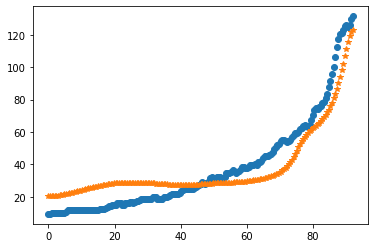

after perturb [3.1370744277333613, 159.3844953850125, 23897.762323079936, 0.9171157498982501, 38.71035020822576]
parameters [3.1370744277333613, 159.3844953850125, 23897.762323079936, 0.9171157498982501, 38.71035020822576]
after perturb [5.1366090474809845, 178.84081869159843, 23212.044447511245, 1.1982177412898882, 32.63715122840446]
parameters [5.1366090474809845, 178.84081869159843, 23212.044447511245, 1.1982177412898882, 32.63715122840446]
after perturb [4.1611641627974505, 165.78351059921908, 33429.13271197844, 0.9905556382845062, 35.36382845654229]
parameters [4.1611641627974505, 165.78351059921908, 33429.13271197844, 0.9905556382845062, 35.36382845654229]
after perturb [6.313684836541922, 103.92167418168354, 26386.075667400717, 0.12937799844270464, 25.91835503073993]
parameters [6.313684836541922, 103.92167418168354, 26386.075667400717, 0.12937799844270464, 25.91835503073993]
oxigeno [5.18449538e-04 5.18255243e-04 5.17673821e-04 5.16709654e-04
 5.15369991e-04 5.13664887e-04 5.11

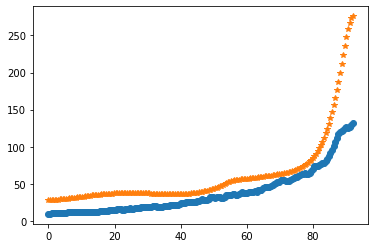

after perturb [8.099643637419508, 88.59372187061226, 29761.991942340894, 0.5119701306701802, 41.230537620667114]
parameters [8.099643637419508, 88.59372187061226, 29761.991942340894, 0.5119701306701802, 41.230537620667114]
after perturb [1.9254395051126099, 153.5396109520641, 23005.040525163382, 0.89291521417813, 36.2285389621582]
parameters [1.9254395051126099, 153.5396109520641, 23005.040525163382, 0.89291521417813, 36.2285389621582]
after perturb [5.6238984685840165, 156.39778562912946, 17688.992407318605, 0.6067558340380712, 23.069860768447345]
parameters [5.6238984685840165, 156.39778562912946, 17688.992407318605, 0.6067558340380712, 23.069860768447345]
after perturb [7.434624602453311, 131.67544247371674, 26405.690132854867, 0.5044183993709076, 49.798274075347386]
parameters [7.434624602453311, 131.67544247371674, 26405.690132854867, 0.5044183993709076, 49.798274075347386]
after perturb [2.142714704874309, 163.53177301298217, 32195.971317407693, 0.8783924412341689, 21.86412493364

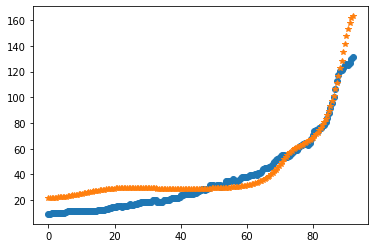

after perturb [3.987537855724962, 124.95571205545012, 25131.388999182283, 0.6915159816180908, 35.13490920192395]
parameters [3.987537855724962, 124.95571205545012, 25131.388999182283, 0.6915159816180908, 35.13490920192395]
oxigeno [1.75770964e-11 1.77233893e-11 1.81648141e-11 1.89090634e-11
 1.99691400e-11 2.13636326e-11 2.31171101e-11 2.52606413e-11
 2.78324509e-11 3.08787254e-11 3.44545843e-11 3.86252383e-11
 4.34673588e-11 4.90706870e-11 5.55399195e-11 6.29969099e-11
 7.15832373e-11 8.14631973e-11 9.28272841e-11 1.05896242e-10
 1.20925777e-10 1.38212037e-10 1.58097980e-10 1.80980782e-10
 2.07320435e-10 2.37649748e-10 2.72585949e-10 3.12844160e-10
 3.59253022e-10 4.12772821e-10 4.74516486e-10 5.45773906e-10
 6.28040073e-10 7.23047615e-10 8.32804392e-10 9.59636897e-10
 1.10624031e-09 1.27573621e-09 1.47173904e-09 1.69843257e-09
 1.96065792e-09 2.26401474e-09 2.61497744e-09 3.02102885e-09
 3.49081365e-09 4.03431476e-09 4.66305591e-09 5.39033449e-09
 6.23148912e-09 7.20420725e-09 8.3288

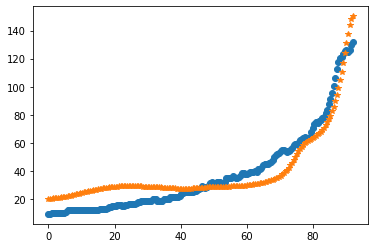

after perturb [7.264443122376229, 92.24023900288219, 26531.803304896523, 0.24174853522672823, 30.43002429661548]
parameters [7.264443122376229, 92.24023900288219, 26531.803304896523, 0.24174853522672823, 30.43002429661548]
after perturb [-0.7685244294573801, 136.16144774126195, 27761.159785663436, 0.46423295930594166, 26.127270836850006]
parameters [-0.7685244294573801, 136.16144774126195, 27761.159785663436, 0.46423295930594166, 26.127270836850006]
after perturb [5.517542518385058, 155.63466873053366, 28882.293901142737, 1.0973727203289712, 41.977793067256925]
parameters [5.517542518385058, 155.63466873053366, 28882.293901142737, 1.0973727203289712, 41.977793067256925]
after perturb [3.11657921307059, 137.9606341272623, 24084.586230763132, 0.48198154378952796, 15.041450033383946]
parameters [3.11657921307059, 137.9606341272623, 24084.586230763132, 0.48198154378952796, 15.041450033383946]
oxigeno [3.70847313e-09 3.72840163e-09 3.78842179e-09 3.88924119e-09
 4.03205098e-09 4.21854371e-0

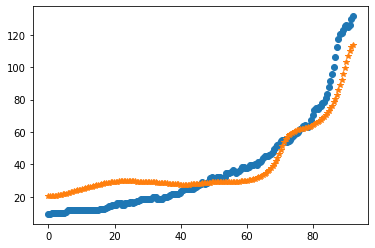

after perturb [7.68397276539214, 130.2568258775355, 30418.56193804221, 0.5770632712549824, 40.65837429570953]
parameters [7.68397276539214, 130.2568258775355, 30418.56193804221, 0.5770632712549824, 40.65837429570953]
after perturb [2.486253417298749, 104.77849752662664, 26924.661302933553, 0.31301903892200433, 21.132219196689686]
parameters [2.486253417298749, 104.77849752662664, 26924.661302933553, 0.31301903892200433, 21.132219196689686]
oxigeno [5.56545617e-08 5.56822457e-08 5.57664449e-08 5.59106005e-08
 5.61204430e-08 5.64039887e-08 5.67715397e-08 5.72356917e-08
 5.78113560e-08 5.85158005e-08 5.93687162e-08 6.03923140e-08
 6.16114588e-08 6.30538437e-08 6.47502121e-08 6.67346303e-08
 6.90448172e-08 7.17225350e-08 7.48140480e-08 7.83706536e-08
 8.24492938e-08 8.71132530e-08 9.24329512e-08 9.84868406e-08
 1.05362415e-07 1.13157346e-07 1.21980753e-07 1.31954626e-07
 1.43215420e-07 1.55915831e-07 1.70226779e-07 1.86339630e-07
 2.04468662e-07 2.24853828e-07 2.47763819e-07 2.73499473e-07

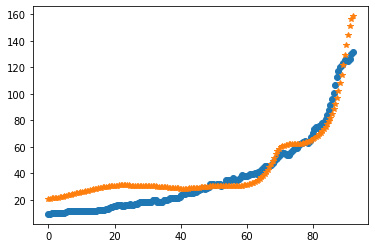

after perturb [5.617578467828936, 107.57436222115922, 30041.819282318087, 0.29872568577055203, 33.22841223814753]
parameters [5.617578467828936, 107.57436222115922, 30041.819282318087, 0.29872568577055203, 33.22841223814753]
after perturb [7.712433524333623, 99.98781629117269, 31313.926417780858, 0.7368394757441612, 47.28044771008213]
parameters [7.712433524333623, 99.98781629117269, 31313.926417780858, 0.7368394757441612, 47.28044771008213]
after perturb [6.699629273133731, 123.45719390960369, 24981.930098979814, 0.8187216912631664, 44.72114832412588]
parameters [6.699629273133731, 123.45719390960369, 24981.930098979814, 0.8187216912631664, 44.72114832412588]
oxigeno [1.47499606e-12 1.48986825e-12 1.53479082e-12 1.61068899e-12
 1.71912898e-12 1.86235493e-12 2.04334192e-12 2.26586631e-12
 2.53459537e-12 2.85519825e-12 3.23448125e-12 3.68055080e-12
 4.20300817e-12 4.81318110e-12 5.52439801e-12 6.35231198e-12
 7.31528271e-12 8.43482628e-12 9.73614422e-12 1.12487455e-11
 1.30071774e-11 1.

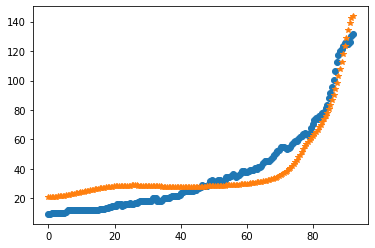

after perturb [4.905240216442146, 124.67222440405834, 19700.393122839767, 0.6376863321446452, 22.152161997394607]
parameters [4.905240216442146, 124.67222440405834, 19700.393122839767, 0.6376863321446452, 22.152161997394607]
after perturb [8.568084172856718, 153.28535096005035, 32664.273818835605, 1.1188379524365357, 39.634265275165276]
parameters [8.568084172856718, 153.28535096005035, 32664.273818835605, 1.1188379524365357, 39.634265275165276]
after perturb [5.9491605810049855, 162.13975857306525, 27665.049984627643, 1.2446324032763227, 42.04980284152372]
parameters [5.9491605810049855, 162.13975857306525, 27665.049984627643, 1.2446324032763227, 42.04980284152372]
after perturb [8.654553160063559, 88.52754220357018, 25630.646843778057, 0.5045220984881729, 53.588219554225056]
parameters [8.654553160063559, 88.52754220357018, 25630.646843778057, 0.5045220984881729, 53.588219554225056]
after perturb [3.7394608803243807, 145.02353613538963, 21973.162609563165, 0.9284480484420623, 32.3526

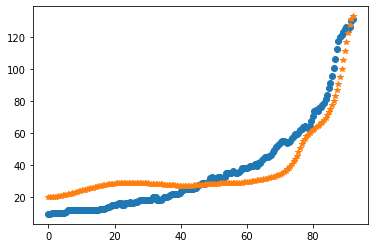

after perturb [3.5857756323336663, 132.0436394622167, 21786.113016354382, 0.379863913244766, 13.883236681611724]
parameters [3.5857756323336663, 132.0436394622167, 21786.113016354382, 0.379863913244766, 13.883236681611724]
oxigeno [2.44992745e-08 2.46068692e-08 2.49307566e-08 2.54742601e-08
 2.62429658e-08 2.72447932e-08 2.84900949e-08 2.99917863e-08
 3.17655066e-08 3.38298115e-08 3.62064014e-08 3.89203852e-08
 4.20005856e-08 4.54798858e-08 4.93956258e-08 5.37900502e-08
 5.87108154e-08 6.42115617e-08 7.03525585e-08 7.72014313e-08
 8.48339793e-08 9.33350950e-08 1.02799797e-07 1.13334390e-07
 1.25057763e-07 1.38102844e-07 1.52618226e-07 1.68769988e-07
 1.86743717e-07 2.06746766e-07 2.29010770e-07 2.53794429e-07
 2.81386610e-07 3.12109769e-07 3.46323752e-07 3.84429980e-07
 4.26876075e-07 4.74160960e-07 5.26840468e-07 5.85533522e-07
 6.50928924e-07 7.23792829e-07 8.04976956e-07 8.95427635e-07
 9.96195768e-07 1.10844781e-06 1.23347791e-06 1.37272131e-06
 1.52776921e-06 1.70038526e-06 1.8925

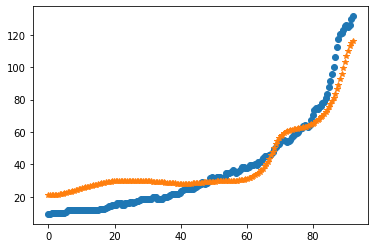

after perturb [2.5440046430231744, 135.96769749851924, 27342.430021659213, 0.786959357816776, 31.851523240317462]
parameters [2.5440046430231744, 135.96769749851924, 27342.430021659213, 0.786959357816776, 31.851523240317462]
oxigeno [1.11037194e-11 1.11958951e-11 1.14740704e-11 1.19432272e-11
 1.26117936e-11 1.34918342e-11 1.45993197e-11 1.59544823e-11
 1.75822611e-11 1.95128483e-11 2.17823442e-11 2.44335362e-11
 2.75168170e-11 3.10912636e-11 3.52258993e-11 4.00011702e-11
 4.55106696e-11 5.18631538e-11 5.91848965e-11 6.76224424e-11
 7.73458251e-11 8.85523311e-11 1.01470898e-10 1.16367255e-10
 1.33549925e-10 1.53377228e-10 1.76265443e-10 2.02698330e-10
 2.33238199e-10 2.68538805e-10 3.09360342e-10 3.56586872e-10
 4.11246586e-10 4.74535322e-10 5.47843860e-10 6.32789550e-10
 7.31252917e-10 8.45419955e-10 9.77830915e-10 1.13143647e-09
 1.30966230e-09 1.51648322e-09 1.75650821e-09 2.03507787e-09
 2.35837624e-09 2.73355900e-09 3.16890074e-09 3.67396442e-09
 4.25979656e-09 4.93915248e-09 5.72

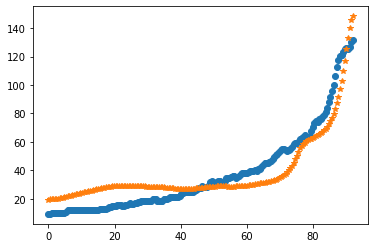

after perturb [1.9766961451177187, 174.11938527070475, 26626.905396034712, 0.918738703442606, 30.673810328629344]
parameters [1.9766961451177187, 174.11938527070475, 26626.905396034712, 0.918738703442606, 30.673810328629344]
after perturb [5.207856165936562, 106.32211719720024, 19880.662249703182, 0.22446454782863956, 18.63191996583013]
parameters [5.207856165936562, 106.32211719720024, 19880.662249703182, 0.22446454782863956, 18.63191996583013]
after perturb [4.159945210174973, 166.9339101094808, 27222.540906014656, 0.813494221758237, 34.348294886835795]
parameters [4.159945210174973, 166.9339101094808, 27222.540906014656, 0.813494221758237, 34.348294886835795]
after perturb [1.9129949114957236, 115.37354402416335, 25097.69678355332, 0.6215947179035621, 36.93655601703601]
parameters [1.9129949114957236, 115.37354402416335, 25097.69678355332, 0.6215947179035621, 36.93655601703601]
oxigeno [2.23334207e-11 2.25114716e-11 2.30487522e-11 2.39547159e-11
 2.52453494e-11 2.69435223e-11 2.9079

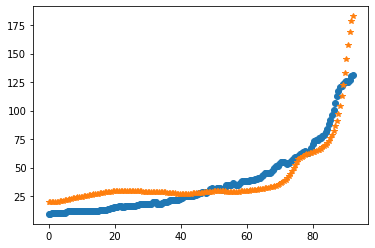

after perturb [3.706207788468191, 153.46494115658547, 22201.21833848213, 0.7496069802420986, 19.232777222787185]
parameters [3.706207788468191, 153.46494115658547, 22201.21833848213, 0.7496069802420986, 19.232777222787185]
after perturb [5.961581674437111, 74.86316645910075, 29329.14100272586, 0.0134459417446805, 36.870891039615834]
parameters [5.961581674437111, 74.86316645910075, 29329.14100272586, 0.0134459417446805, 36.870891039615834]
after perturb [3.9908691623857986, 108.04543560373644, 24575.084122046846, 0.3829479181936865, 23.34399629083342]
parameters [3.9908691623857986, 108.04543560373644, 24575.084122046846, 0.3829479181936865, 23.34399629083342]
oxigeno [3.95598495e-09 3.96938115e-09 4.00976504e-09 4.07772504e-09
 4.17425053e-09 4.30074514e-09 4.45904546e-09 4.65144584e-09
 4.88072939e-09 5.15020587e-09 5.46375697e-09 5.82588987e-09
 6.24179975e-09 6.71744247e-09 7.25961842e-09 7.87606895e-09
 8.57558701e-09 9.36814357e-09 1.02650320e-08 1.12790328e-08
 1.24246006e-08 1.

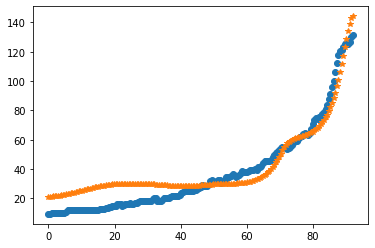

after perturb [8.295680887546082, 98.4564157008053, 20869.54753043221, 0.5005519206778115, 29.11475063333523]
parameters [8.295680887546082, 98.4564157008053, 20869.54753043221, 0.5005519206778115, 29.11475063333523]
after perturb [7.865022760470453, 83.96659664020285, 24243.113361994587, 0.13700122981473306, 27.990038439002802]
parameters [7.865022760470453, 83.96659664020285, 24243.113361994587, 0.13700122981473306, 27.990038439002802]
after perturb [6.128457524503053, 138.03242239287388, 25649.227174417618, 0.544065284534156, 39.62820615593229]
parameters [6.128457524503053, 138.03242239287388, 25649.227174417618, 0.544065284534156, 39.62820615593229]
oxigeno [1.03033626e-09 1.03659941e-09 1.05546820e-09 1.08718190e-09
 1.13214342e-09 1.19092557e-09 1.26427994e-09 1.35314857e-09
 1.45867853e-09 1.58223969e-09 1.72544589e-09 1.89017988e-09
 2.07862242e-09 2.29328589e-09 2.53705315e-09 2.81322193e-09
 3.12555581e-09 3.47834231e-09 3.87645911e-09 4.32544950e-09
 4.83160807e-09 5.402078

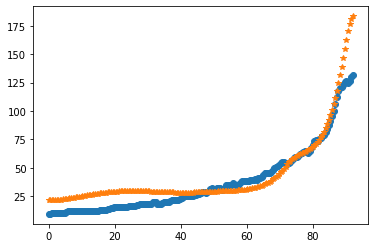

after perturb [3.1468936391622164, 131.226262499438, 29501.70927342478, 0.5348305839016863, 23.64700129036418]
parameters [3.1468936391622164, 131.226262499438, 29501.70927342478, 0.5348305839016863, 23.64700129036418]
after perturb [5.3480288582512845, 144.01664510043693, 26525.97212078579, 0.6706762513935187, 28.43110697613477]
parameters [5.3480288582512845, 144.01664510043693, 26525.97212078579, 0.6706762513935187, 28.43110697613477]
oxigeno [1.74014275e-10 1.75235480e-10 1.78916957e-10 1.85112612e-10
 1.93913361e-10 2.05448747e-10 2.19889254e-10 2.37449349e-10
 2.58391294e-10 2.83029825e-10 3.11737744e-10 3.44952551e-10
 3.83184229e-10 4.27024312e-10 4.77156415e-10 5.34368417e-10
 5.99566509e-10 6.73791391e-10 7.58236894e-10 8.54271385e-10
 9.63462356e-10 1.08760464e-09 1.22875279e-09 1.38925821e-09
 1.57181167e-09 1.77949212e-09 2.01582248e-09 2.28483357e-09
 2.59113722e-09 2.94000988e-09 3.33748818e-09 3.79047805e-09
 4.30687928e-09 4.89572767e-09 5.56735698e-09 6.33358357e-09
 

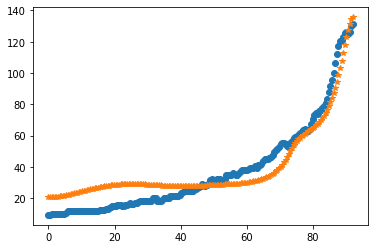

after perturb [3.9616997662442763, 152.10666950095307, 22604.761106200465, 0.7708785565066345, 28.357207183536588]
parameters [3.9616997662442763, 152.10666950095307, 22604.761106200465, 0.7708785565066345, 28.357207183536588]
after perturb [3.450368930580776, 165.52035948947955, 24001.361047350794, 0.749002477443874, 32.51156963474239]
parameters [3.450368930580776, 165.52035948947955, 24001.361047350794, 0.749002477443874, 32.51156963474239]
after perturb [5.210165919862981, 129.4645922530157, 18823.095271810056, 0.4757910970545297, 40.496228568295905]
parameters [5.210165919862981, 129.4645922530157, 18823.095271810056, 0.4757910970545297, 40.496228568295905]
after perturb [5.479614042041208, 124.26004013328296, 30117.10542097362, 0.6628780657556264, 28.95801232694953]
parameters [5.479614042041208, 124.26004013328296, 30117.10542097362, 0.6628780657556264, 28.95801232694953]
after perturb [6.35359878702938, 164.68613225589527, 29110.015992074317, 0.8057835284206135, 34.693797706490

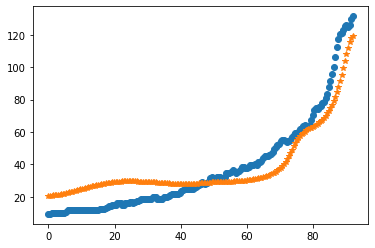

after perturb [4.647528548928519, 126.3778822366796, 14216.35999648851, 0.5055421106212504, 17.399041994533228]
parameters [4.647528548928519, 126.3778822366796, 14216.35999648851, 0.5055421106212504, 17.399041994533228]
after perturb [5.9883320292049715, 118.75796435186804, 19827.57216662427, 0.5983393986763657, 30.732248624336215]
parameters [5.9883320292049715, 118.75796435186804, 19827.57216662427, 0.5983393986763657, 30.732248624336215]
after perturb [0.16521537558047683, 80.6623966347363, 22459.09516377178, -0.056982495886705176, 1.5946074889734163]
parameters [0.16521537558047683, 80.6623966347363, 22459.09516377178, -0.056982495886705176, 1.5946074889734163]
after perturb [4.6224095064671475, 111.56749492898335, 19748.396300378798, 0.346841832200682, 12.049359676214355]
parameters [4.6224095064671475, 111.56749492898335, 19748.396300378798, 0.346841832200682, 12.049359676214355]
after perturb [5.579424059229424, 157.12400104768125, 29417.243536973114, 1.0074330757272942, 51.613

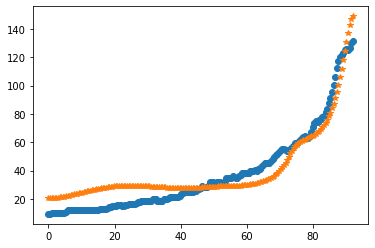

after perturb [7.481300857689478, 101.1899642278398, 22919.795540062885, 0.3833277938571467, 26.306334000628944]
parameters [7.481300857689478, 101.1899642278398, 22919.795540062885, 0.3833277938571467, 26.306334000628944]
after perturb [6.3268024332645245, 69.95135627923236, 22761.456991647607, 0.1523765228507813, 38.14730540710158]
parameters [6.3268024332645245, 69.95135627923236, 22761.456991647607, 0.1523765228507813, 38.14730540710158]
oxigeno [1.69198327e-04 1.69086470e-04 1.68751631e-04 1.68196000e-04
 1.67423193e-04 1.66438200e-04 1.65247312e-04 1.63858041e-04
 1.62279015e-04 1.60519865e-04 1.58591109e-04 1.56504015e-04
 1.54270481e-04 1.51902896e-04 1.49414015e-04 1.46816833e-04
 1.44124465e-04 1.41350039e-04 1.38506590e-04 1.35606972e-04
 1.32663776e-04 1.29689259e-04 1.26695286e-04 1.23693279e-04
 1.20694183e-04 1.17708433e-04 1.14745939e-04 1.11816071e-04
 1.08927658e-04 1.06088993e-04 1.03307844e-04 1.00591470e-04
 9.79466459e-05 9.53796882e-05 9.28964897e-05 9.05025559e-

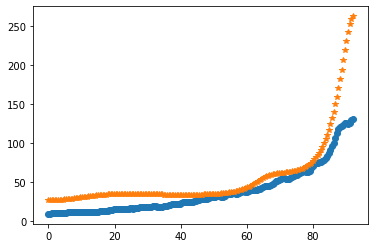

after perturb [2.3315834583865582, 146.5224679706417, 27348.7123091598, 0.5969672400463724, 25.134326602708384]
parameters [2.3315834583865582, 146.5224679706417, 27348.7123091598, 0.5969672400463724, 25.134326602708384]
oxigeno [8.20871259e-10 8.25738457e-10 8.40404622e-10 8.65064559e-10
 9.00046614e-10 9.45818200e-10 1.00299360e-09 1.07234412e-09
 1.15481064e-09 1.25151886e-09 1.36379714e-09 1.49319755e-09
 1.64152013e-09 1.81084086e-09 2.00354390e-09 2.22235853e-09
 2.47040154e-09 2.75122596e-09 3.06887696e-09 3.42795612e-09
 3.83369523e-09 4.29204111e-09 4.80975287e-09 5.39451328e-09
 6.05505621e-09 6.80131191e-09 7.64457254e-09 8.59768040e-09
 9.67524162e-09 1.08938687e-08 1.22724558e-08 1.38324907e-08
 1.55984088e-08 1.75979946e-08 1.98628358e-08 2.24288372e-08
 2.53368007e-08 2.86330771e-08 3.23702984e-08 3.66081965e-08
 4.14145162e-08 4.68660328e-08 5.30496833e-08 6.00638258e-08
 6.80196417e-08 7.70427030e-08 8.72747280e-08 9.88755559e-08
 1.12025377e-07 1.26927257e-07 1.438100

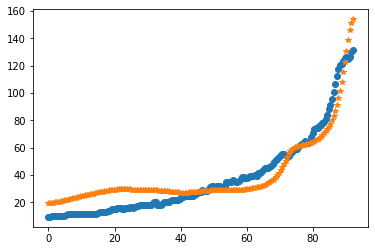

after perturb [3.701789662359948, 83.88446872987785, 18493.446806388398, -0.05017378225811764, 22.72863606013096]
parameters [3.701789662359948, 83.88446872987785, 18493.446806388398, -0.05017378225811764, 22.72863606013096]
after perturb [1.6802748164673913, 187.19642388620713, 22996.39540150521, 0.8980143845524196, 21.2028801044683]
parameters [1.6802748164673913, 187.19642388620713, 22996.39540150521, 0.8980143845524196, 21.2028801044683]
after perturb [0.6597853421435509, 122.94504677464325, 29887.225385384383, 0.33848445705047703, 35.27669852896278]
parameters [0.6597853421435509, 122.94504677464325, 29887.225385384383, 0.33848445705047703, 35.27669852896278]
after perturb [2.655949636540027, 134.89730292499695, 22074.32124041713, 0.3752365564763176, 14.229853409253804]
parameters [2.655949636540027, 134.89730292499695, 22074.32124041713, 0.3752365564763176, 14.229853409253804]
oxigeno [3.46723417e-08 3.48172440e-08 3.52534157e-08 3.59852691e-08
 3.70202175e-08 3.83687651e-08 4.00

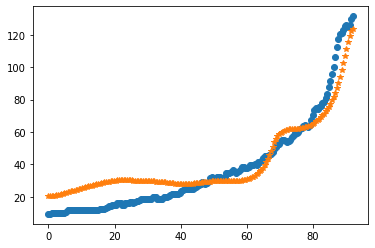

after perturb [8.18009077492501, 92.11483555144976, 17917.84202517804, 0.16860827448263654, 36.07347609297197]
parameters [8.18009077492501, 92.11483555144976, 17917.84202517804, 0.16860827448263654, 36.07347609297197]
after perturb [5.138429694727619, 129.8732865548956, 25595.581353292764, 0.6122781311969108, 17.42428687550147]
parameters [5.138429694727619, 129.8732865548956, 25595.581353292764, 0.6122781311969108, 17.42428687550147]
oxigeno [1.26920819e-10 1.27851699e-10 1.30658515e-10 1.35384055e-10
 1.42100510e-10 1.50910800e-10 1.61950468e-10 1.75390175e-10
 1.91438830e-10 2.10347433e-10 2.32413673e-10 2.57987397e-10
 2.87477021e-10 3.21357031e-10 3.60176690e-10 4.04570143e-10
 4.55268082e-10 5.13111222e-10 5.79065833e-10 6.54241623e-10
 7.39912326e-10 8.37539382e-10 9.48799161e-10 1.07561426e-09
 1.22018944e-09 1.38505290e-09 1.57310370e-09 1.78766605e-09
 2.03255170e-09 2.31213134e-09 2.63141646e-09 2.99615300e-09
 3.41292851e-09 3.88929468e-09 4.43390732e-09 5.05668624e-09
 5.

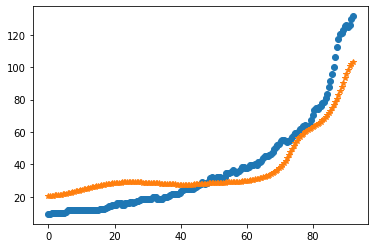

after perturb [8.783853288123941, 100.86982438090935, 20921.703189527234, 0.35627217135771494, 31.61188617492486]
parameters [8.783853288123941, 100.86982438090935, 20921.703189527234, 0.35627217135771494, 31.61188617492486]
after perturb [6.199695091422628, 152.0447950527288, 31623.919372171196, 1.1435750844385, 47.06581232058867]
parameters [6.199695091422628, 152.0447950527288, 31623.919372171196, 1.1435750844385, 47.06581232058867]
after perturb [1.8479809446223863, 165.4096714234537, 29454.82536907899, 1.0791667979198545, 38.64768001789467]
parameters [1.8479809446223863, 165.4096714234537, 29454.82536907899, 1.0791667979198545, 38.64768001789467]
after perturb [4.995762275442537, 84.05770045792539, 21008.007132892224, 0.34390623978653745, 37.70202952542034]
parameters [4.995762275442537, 84.05770045792539, 21008.007132892224, 0.34390623978653745, 37.70202952542034]
oxigeno [1.34320982e-08 1.34217178e-08 1.33907263e-08 1.33395709e-08
 1.32689929e-08 1.31800201e-08 1.30739588e-08 1

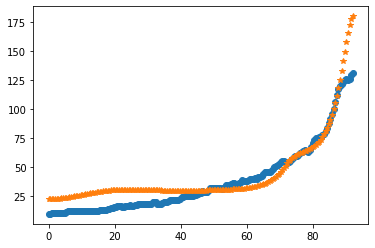

after perturb [5.535617650273358, 158.4068698274589, 31423.792611839115, 0.9259701877343254, 47.03849700296088]
parameters [5.535617650273358, 158.4068698274589, 31423.792611839115, 0.9259701877343254, 47.03849700296088]
after perturb [5.817393361886281, 157.5629645910817, 25202.9205494967, 1.0463927251095893, 41.14505429817347]
parameters [5.817393361886281, 157.5629645910817, 25202.9205494967, 1.0463927251095893, 41.14505429817347]
after perturb [3.283569205586693, 135.58713642099207, 28343.08854258076, 0.5902979116491203, 28.203423777167632]
parameters [3.283569205586693, 135.58713642099207, 28343.08854258076, 0.5902979116491203, 28.203423777167632]
oxigeno [3.56542510e-10 3.58867938e-10 3.65876810e-10 3.77667476e-10
 3.94405798e-10 4.16328092e-10 4.43745305e-10 4.77048469e-10
 5.16715525e-10 5.63319597e-10 6.17538855e-10 6.80168113e-10
 7.52132362e-10 8.34502449e-10 9.28513205e-10 1.03558432e-09
 1.15734437e-09 1.29565842e-09 1.45265974e-09 1.63078623e-09
 1.83282220e-09 2.06194635

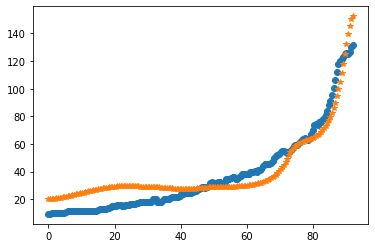

after perturb [0.7413012816506526, 193.59736289146508, 28006.541804965305, 0.773116609815095, 21.240491184561254]
parameters [0.7413012816506526, 193.59736289146508, 28006.541804965305, 0.773116609815095, 21.240491184561254]
after perturb [6.7448252467258065, 135.77844325098056, 26616.41518585146, 0.4725046217520773, 40.48245880786415]
parameters [6.7448252467258065, 135.77844325098056, 26616.41518585146, 0.4725046217520773, 40.48245880786415]
oxigeno [3.72688532e-09 3.74714678e-09 3.80816207e-09 3.91062720e-09
 4.05571299e-09 4.24508147e-09 4.48090912e-09 4.76591727e-09
 5.10341008e-09 5.49732061e-09 5.95226560e-09 6.47360967e-09
 7.06753986e-09 7.74115153e-09 8.50254682e-09 9.36094688e-09
 1.03268197e-08 1.14120250e-08 1.26299784e-08 1.39958371e-08
 1.55267097e-08 1.72418923e-08 1.91631359e-08 2.13149462e-08
 2.37249223e-08 2.64241369e-08 2.94475646e-08 3.28345619e-08
 3.66294079e-08 4.08819098e-08 4.56480824e-08 5.09909107e-08
 5.69812033e-08 6.36985483e-08 7.12323836e-08 7.96831936

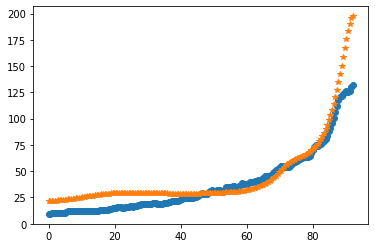

after perturb [3.6063173006166513, 81.73560873584782, 17467.47182146829, 0.15225890956649585, 19.795513728871455]
parameters [3.6063173006166513, 81.73560873584782, 17467.47182146829, 0.15225890956649585, 19.795513728871455]
after perturb [10.70949263667736, 171.07940758624216, 30508.390599449645, 1.4747639006034856, 54.15202192983459]
parameters [10.70949263667736, 171.07940758624216, 30508.390599449645, 1.4747639006034856, 54.15202192983459]
after perturb [5.330469352314816, 153.47604723668127, 26178.031267411334, 0.9598850129168536, 39.14900119452098]
parameters [5.330469352314816, 153.47604723668127, 26178.031267411334, 0.9598850129168536, 39.14900119452098]
after perturb [3.8591628725467113, 131.1959517496147, 24912.40199122918, 0.427928436173311, 17.72855880320304]
parameters [3.8591628725467113, 131.1959517496147, 24912.40199122918, 0.427928436173311, 17.72855880320304]
oxigeno [7.33823817e-09 7.37549357e-09 7.48767677e-09 7.67604462e-09
 7.94271159e-09 8.29067962e-09 8.72388017

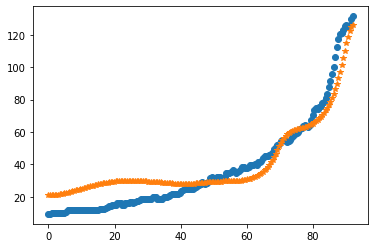

after perturb [9.242965808565764, 164.94411495529874, 30578.06384604075, 1.055518251008106, 41.78986490694412]
parameters [9.242965808565764, 164.94411495529874, 30578.06384604075, 1.055518251008106, 41.78986490694412]
after perturb [3.95737783411197, 161.64483825513938, 31595.08269192381, 0.6045683666730728, 36.22334056349699]
parameters [3.95737783411197, 161.64483825513938, 31595.08269192381, 0.6045683666730728, 36.22334056349699]
after perturb [7.1282793529552215, 138.36970328053053, 25207.17513373577, 0.8056107329792555, 28.175359843288774]
parameters [7.1282793529552215, 138.36970328053053, 25207.17513373577, 0.8056107329792555, 28.175359843288774]
after perturb [8.250790151435169, 142.29707770160292, 27340.418813995548, 1.0761497625037182, 37.436684487203244]
parameters [8.250790151435169, 142.29707770160292, 27340.418813995548, 1.0761497625037182, 37.436684487203244]
after perturb [9.1701170233995, 90.64889476406617, 19372.989607695974, 0.43345229512966066, 43.09449516096109]
p

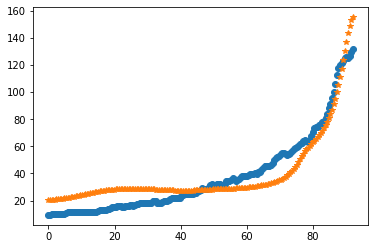

after perturb [5.86121669593425, 121.55118150164868, 28914.50248988065, 0.6613067064687878, 36.15154260834561]
parameters [5.86121669593425, 121.55118150164868, 28914.50248988065, 0.6613067064687878, 36.15154260834561]
oxigeno [2.08434576e-11 2.10191773e-11 2.15493823e-11 2.24432718e-11
 2.37163866e-11 2.53909258e-11 2.74962007e-11 3.00692337e-11
 3.31555159e-11 3.68099383e-11 4.10979185e-11 4.60967437e-11
 5.18971617e-11 5.86052522e-11 6.63446190e-11 7.52589508e-11
 8.55150057e-11 9.73060832e-11 1.10856061e-10 1.26424081e-10
 1.44309989e-10 1.64860645e-10 1.88477241e-10 2.15623776e-10
 2.46836889e-10 2.82737237e-10 3.24042679e-10 3.71583534e-10
 4.26320236e-10 4.89363755e-10 5.61999215e-10 6.45713177e-10
 7.42225164e-10 8.53524057e-10 9.81910096e-10 1.13004332e-09
 1.30099945e-09 1.49833420e-09 1.72615745e-09 1.98921860e-09
 2.29300477e-09 2.64385380e-09 3.04908420e-09 3.51714452e-09
 4.05778503e-09 4.68225494e-09 5.40352899e-09 6.23656765e-09
 7.19861582e-09 8.30954578e-09 9.59225073

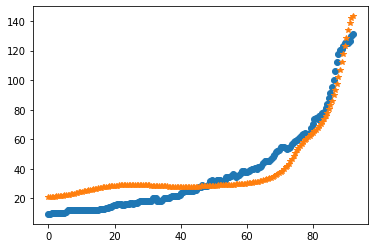

after perturb [4.767267241998737, 125.29225887300514, 25815.51068605585, 0.5531483902075508, 32.210767719971315]
parameters [4.767267241998737, 125.29225887300514, 25815.51068605585, 0.5531483902075508, 32.210767719971315]
oxigeno [2.73643273e-10 2.75517183e-10 2.81165789e-10 2.90670194e-10
 3.04167152e-10 3.21851478e-10 3.43979466e-10 3.70873382e-10
 4.02927103e-10 4.40612995e-10 4.84490151e-10 5.35214115e-10
 5.93548283e-10 6.60377162e-10 7.36721726e-10 8.23757151e-10
 9.22833237e-10 1.03549789e-09 1.16352409e-09 1.30894086e-09
 1.47406870e-09 1.66156034e-09 1.87444723e-09 2.11619296e-09
 2.39075422e-09 2.70265070e-09 3.05704485e-09 3.45983313e-09
 3.91775014e-09 4.43848751e-09 5.03082942e-09 5.70480713e-09
 6.47187485e-09 7.34510998e-09 8.33944075e-09 9.47190485e-09
 1.07619432e-08 1.22317333e-08 1.39065670e-08 1.58152793e-08
 1.79907336e-08 2.04703715e-08 2.32968356e-08 2.65186739e-08
 3.01911377e-08 3.43770847e-08 3.91480011e-08 4.45851584e-08
 5.07809233e-08 5.78402407e-08 6.5882

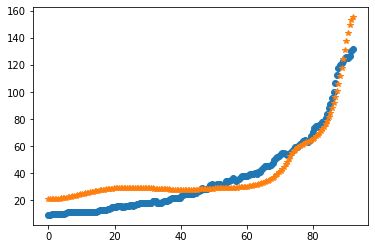

after perturb [1.7172793046086459, 106.9141705854515, 26920.072215252432, 0.3726575678347198, 25.984689440897462]
parameters [1.7172793046086459, 106.9141705854515, 26920.072215252432, 0.3726575678347198, 25.984689440897462]
oxigeno [5.97225308e-09 5.98569005e-09 6.02625666e-09 6.09472135e-09
 6.19236942e-09 6.32101070e-09 6.48299170e-09 6.68121347e-09
 6.91915625e-09 7.20091241e-09 7.53122836e-09 7.91555657e-09
 8.36011836e-09 8.87197834e-09 9.45913134e-09 1.01306034e-08
 1.08965681e-08 1.17684820e-08 1.27592397e-08 1.38833559e-08
 1.51571749e-08 1.65991145e-08 1.82299467e-08 2.00731209e-08
 2.21551303e-08 2.45059277e-08 2.71593902e-08 3.01538397e-08
 3.35326213e-08 3.73447493e-08 4.16456301e-08 4.64978751e-08
 5.19722224e-08 5.81485848e-08 6.51172436e-08 7.29802082e-08
 8.18527551e-08 9.18651573e-08 1.03164610e-07 1.15917355e-07
 1.30310995e-07 1.46557018e-07 1.64893513e-07 1.85588123e-07
 2.08941250e-07 2.35289587e-07 2.65010030e-07 2.98524086e-07
 3.36302869e-07 3.78872825e-07 4.26

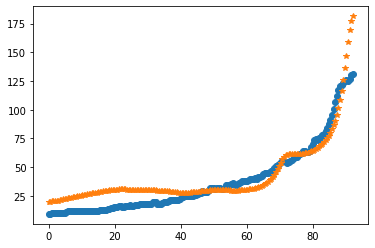

after perturb [4.374755775761756, 148.96778508915762, 29827.354223076243, 0.9053415171819605, 47.5376386271673]
parameters [4.374755775761756, 148.96778508915762, 29827.354223076243, 0.9053415171819605, 47.5376386271673]
after perturb [5.95772774159625, 102.94970083194626, 22113.701658986323, 0.477712035734315, 30.464373288104134]
parameters [5.95772774159625, 102.94970083194626, 22113.701658986323, 0.477712035734315, 30.464373288104134]
oxigeno [1.35445891e-10 1.36332676e-10 1.39007448e-10 1.43513720e-10
 1.49924892e-10 1.58345582e-10 1.68913537e-10 1.81802132e-10
 1.97223543e-10 2.15432618e-10 2.36731547e-10 2.61475405e-10
 2.90078686e-10 3.23022942e-10 3.60865689e-10 4.04250734e-10
 4.53920143e-10 5.10728064e-10 5.75656680e-10 6.49834602e-10
 7.34558049e-10 8.31315225e-10 9.41814362e-10 1.06801596e-09
 1.21216984e-09 1.37685770e-09 1.56504196e-09 1.78012186e-09
 2.02599779e-09 2.30714499e-09 2.62869813e-09 2.99654808e-09
 3.41745271e-09 3.89916376e-09 4.45057175e-09 5.08187181e-09
 

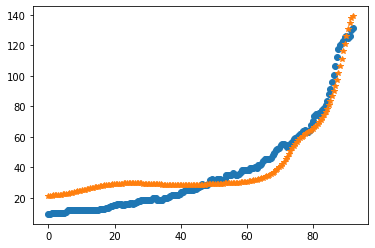

after perturb [3.3645489249629903, 152.7240207213687, 24260.223163299008, 0.8334910333379847, 28.013076097626218]
parameters [3.3645489249629903, 152.7240207213687, 24260.223163299008, 0.8334910333379847, 28.013076097626218]
after perturb [3.182770118848526, 134.6975566042733, 25580.040171993725, 0.705622892018798, 20.895050510383292]
parameters [3.182770118848526, 134.6975566042733, 25580.040171993725, 0.705622892018798, 20.895050510383292]
oxigeno [3.82879820e-11 3.85847872e-11 3.94800982e-11 4.09887020e-11
 4.31355830e-11 4.59564376e-11 4.94984069e-11 5.38210386e-11
 5.89974971e-11 6.51160409e-11 7.22817962e-11 8.06188605e-11
 9.02727772e-11 1.01413432e-10 1.14238427e-10 1.28977017e-10
 1.45894670e-10 1.65298372e-10 1.87542787e-10 2.13037398e-10
 2.42254800e-10 2.75740316e-10 3.14123154e-10 3.58129343e-10
 4.08596728e-10 4.66492336e-10 5.32932493e-10 6.09206100e-10
 6.96801552e-10 7.97437845e-10 9.13100510e-10 1.04608307e-09
 1.19903483e-09 1.37501598e-09 1.57756092e-09 1.81075111e-

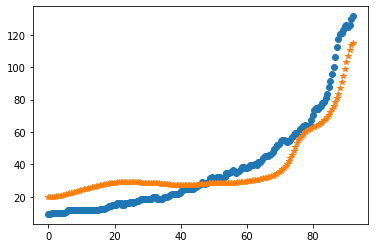

after perturb [2.0112749800714673, 133.9788762765451, 20875.619141359395, 0.713209367695856, 19.193458363522822]
parameters [2.0112749800714673, 133.9788762765451, 20875.619141359395, 0.713209367695856, 19.193458363522822]
oxigeno [3.08809245e-11 3.11186674e-11 3.18359292e-11 3.30448954e-11
 3.47661659e-11 3.70291941e-11 3.98729093e-11 4.33465317e-11
 4.75105912e-11 5.24381674e-11 5.82163720e-11 6.49480995e-11
 7.27540815e-11 8.17752828e-11 9.21756911e-11 1.04145560e-10
 1.17905177e-10 1.33709255e-10 1.51852042e-10 1.72673288e-10
 1.96565220e-10 2.23980687e-10 2.55442678e-10 2.91555427e-10
 3.33017333e-10 3.80635979e-10 4.35345525e-10 4.98226829e-10
 5.70530699e-10 6.53704735e-10 7.49424341e-10 8.59628580e-10
 9.86561669e-10 1.13282102e-09 1.30141289e-09 1.49581670e-09
 1.72005940e-09 1.97880091e-09 2.27743229e-09 2.62218782e-09
 3.02027261e-09 3.48000752e-09 4.01099337e-09 4.62429684e-09
 5.33266119e-09 6.15074562e-09 7.09539792e-09 8.18596626e-09
 9.44465717e-09 1.08969478e-08 1.2572

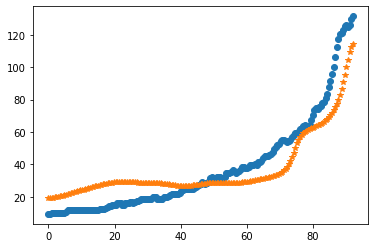

after perturb [7.548128207365642, 102.90947252976612, 27554.73708832924, 0.46287674645485555, 38.74041866162865]
parameters [7.548128207365642, 102.90947252976612, 27554.73708832924, 0.46287674645485555, 38.74041866162865]
after perturb [2.0655616970215678, 131.61027118470398, 27817.484599178297, 0.8407102760703804, 33.240315289271294]
parameters [2.0655616970215678, 131.61027118470398, 27817.484599178297, 0.8407102760703804, 33.240315289271294]
oxigeno [2.85340986e-12 2.87922580e-12 2.95718099e-12 3.08881014e-12
 3.27671344e-12 3.52462074e-12 3.83748299e-12 4.22159246e-12
 4.68473415e-12 5.23637135e-12 5.88786936e-12 6.65276220e-12
 7.54706840e-12 8.58966332e-12 9.80271695e-12 1.12122084e-11
 1.28485299e-11 1.47471977e-11 1.69496877e-11 1.95044212e-11
 2.24679270e-11 2.59062130e-11 2.98963847e-11 3.45285537e-11
 3.99080849e-11 4.61582397e-11 5.34232784e-11 6.18720981e-11
 7.17024949e-11 8.31461543e-11 9.64744956e-11 1.12005520e-10
 1.30111839e-10 1.51230086e-10 1.75871953e-10 2.046371

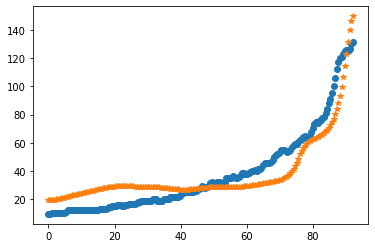

after perturb [6.4197675058070915, 145.1552377533969, 28364.47867284247, 0.6299366092989739, 33.25670916060485]
parameters [6.4197675058070915, 145.1552377533969, 28364.47867284247, 0.6299366092989739, 33.25670916060485]
oxigeno [3.88192585e-10 3.90761030e-10 3.98501603e-10 4.11520606e-10
 4.29997168e-10 4.54186219e-10 4.84422725e-10 5.21127245e-10
 5.64812913e-10 6.16093960e-10 6.75695905e-10 7.44467610e-10
 8.23395381e-10 9.13619365e-10 1.01645252e-09 1.13340249e-09
 1.26619670e-09 1.41681127e-09 1.58750395e-09 1.78085196e-09
 1.99979516e-09 2.24768535e-09 2.52834259e-09 2.84611939e-09
 3.20597391e-09 3.61355341e-09 4.07528927e-09 4.59850514e-09
 5.19154013e-09 5.86388877e-09 6.62636025e-09 7.49125931e-09
 8.47259166e-09 9.58629722e-09 1.08505147e-08 1.22858815e-08
 1.39158740e-08 1.57671928e-08 1.78701989e-08 2.02594075e-08
 2.29740474e-08 2.60586925e-08 2.95639767e-08 3.35474026e-08
 3.80742540e-08 4.32186285e-08 4.90646026e-08 5.57075491e-08
 6.32556230e-08 7.18314410e-08 8.157397

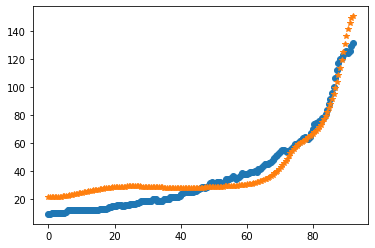

after perturb [2.4894626688530543, 76.83571532681438, 24536.737455133713, 0.010169963909052171, 4.73456251902873]
parameters [2.4894626688530543, 76.83571532681438, 24536.737455133713, 0.010169963909052171, 4.73456251902873]
after perturb [4.313898643932207, 57.71283583689127, 23230.029814031983, 0.07806139579340732, 22.785360544397694]
parameters [4.313898643932207, 57.71283583689127, 23230.029814031983, 0.07806139579340732, 22.785360544397694]
oxigeno [8.82688582e-03 8.82178086e-03 8.80650353e-03 8.78116564e-03
 8.74595128e-03 8.70111333e-03 8.64696895e-03 8.58389396e-03
 8.51231649e-03 8.43271005e-03 8.34558616e-03 8.25148701e-03
 8.15097800e-03 8.04464068e-03 7.93306603e-03 7.81684829e-03
 7.69657937e-03 7.57284397e-03 7.44621538e-03 7.31725190e-03
 7.18649400e-03 7.05446199e-03 6.92165427e-03 6.78854600e-03
 6.65558820e-03 6.52320716e-03 6.39180409e-03 6.26175496e-03
 6.13341055e-03 6.00709654e-03 5.88311377e-03 5.76173852e-03
 5.64322289e-03 5.52779520e-03 5.41566049e-03 5.307001

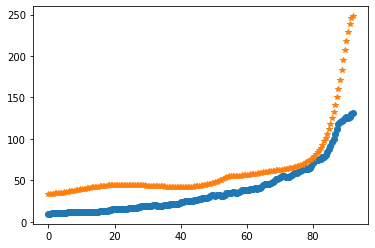

after perturb [7.92859221309534, 137.62103722713806, 23821.730140075982, 0.8361938851567812, 44.224591255406665]
parameters [7.92859221309534, 137.62103722713806, 23821.730140075982, 0.8361938851567812, 44.224591255406665]
after perturb [3.519397273154179, 159.38284506773635, 21258.49854105243, 0.5502304612371488, 25.25101454075159]
parameters [3.519397273154179, 159.38284506773635, 21258.49854105243, 0.5502304612371488, 25.25101454075159]
after perturb [2.5589524318478105, 166.30083146364979, 30868.52451805451, 0.9518703531456026, 36.82675926838777]
parameters [2.5589524318478105, 166.30083146364979, 30868.52451805451, 0.9518703531456026, 36.82675926838777]
after perturb [7.756030373890152, 114.12698175557682, 34705.09853654275, 0.6838789051874812, 42.559587536315775]
parameters [7.756030373890152, 114.12698175557682, 34705.09853654275, 0.6838789051874812, 42.559587536315775]
after perturb [2.9361666426523305, 163.32351039892194, 28492.12542102002, 1.1509157839037905, 45.8519670066210

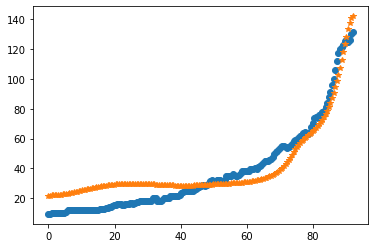

after perturb [5.539695639213253, 145.32842457048415, 22776.482278999178, 0.8837465459906335, 30.53723677344573]
parameters [5.539695639213253, 145.32842457048415, 22776.482278999178, 0.8837465459906335, 30.53723677344573]
oxigeno [6.22230584e-12 6.27789382e-12 6.44568339e-12 6.72877390e-12
 7.13240618e-12 7.66407714e-12 8.33370385e-12 9.15384080e-12
 1.01399553e-11 1.13107669e-11 1.26886599e-11 1.43001759e-11
 1.61766010e-11 1.83546584e-11 2.08773245e-11 2.37947861e-11
 2.71655620e-11 3.10578158e-11 3.55508891e-11 4.07370931e-11
 4.67237997e-11 5.36358816e-11 6.16185599e-11 7.08407237e-11
 8.14988028e-11 9.38212813e-11 1.08073958e-10 1.24566076e-10
 1.43657462e-10 1.65766838e-10 1.91381498e-10 2.21068561e-10
 2.55488059e-10 2.95408153e-10 3.41722807e-10 3.95472308e-10
 4.57867089e-10 5.30315361e-10 6.14455153e-10 7.12191451e-10
 8.25739219e-10 9.57673224e-10 1.11098572e-09 1.28915319e-09
 1.49621360e-09 1.73685571e-09 2.01652240e-09 2.34153008e-09
 2.71920678e-09 3.15805174e-09 3.6679

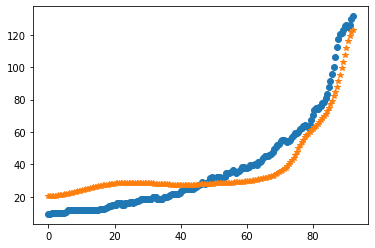

after perturb [10.002287228485933, 123.53787829950689, 27380.282816278435, 0.9512175251165488, 34.75382385307568]
parameters [10.002287228485933, 123.53787829950689, 27380.282816278435, 0.9512175251165488, 34.75382385307568]
after perturb [6.208125931701563, 81.61433465101122, 13683.009454797366, 0.30159352453397936, 31.15615199173221]
parameters [6.208125931701563, 81.61433465101122, 13683.009454797366, 0.30159352453397936, 31.15615199173221]
after perturb [6.8769254724612825, 110.89926891331292, 25489.348928714284, 0.6865887636778027, 37.93168835908725]
parameters [6.8769254724612825, 110.89926891331292, 25489.348928714284, 0.6865887636778027, 37.93168835908725]
oxigeno [3.34973724e-12 3.38250540e-12 3.48146231e-12 3.64858006e-12
 3.88719509e-12 4.20208397e-12 4.59957193e-12 5.08767696e-12
 5.67629274e-12 6.37741508e-12 7.20541715e-12 8.17738036e-12
 9.31348875e-12 1.06374968e-11 1.21772816e-11 1.39654936e-11
 1.60403212e-11 1.84463880e-11 2.12358048e-11 2.44694032e-11
 2.82181781e-1

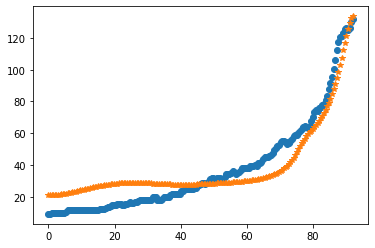

after perturb [3.154914067442638, 147.87209776089207, 25194.03683109339, 0.34770592099168995, 22.536821336203783]
parameters [3.154914067442638, 147.87209776089207, 25194.03683109339, 0.34770592099168995, 22.536821336203783]
oxigeno [1.78123568e-07 1.78744297e-07 1.80611746e-07 1.83741752e-07
 1.88160895e-07 1.93906771e-07 2.01028371e-07 2.09586589e-07
 2.19654824e-07 2.31319718e-07 2.44682014e-07 2.59857541e-07
 2.76978346e-07 2.96193976e-07 3.17672931e-07 3.41604291e-07
 3.68199559e-07 3.97694717e-07 4.30352543e-07 4.66465190e-07
 5.06357086e-07 5.50388165e-07 5.98957462e-07 6.52507126e-07
 7.11526869e-07 7.76558895e-07 8.48203360e-07 9.27124394e-07
 1.01405674e-06 1.10981305e-06 1.21529191e-06 1.33148664e-06
 1.45949488e-06 1.60052911e-06 1.75592814e-06 1.92716952e-06
 2.11588308e-06 2.32386568e-06 2.55309700e-06 2.80575682e-06
 3.08424353e-06 3.39119422e-06 3.72950643e-06 4.10236163e-06
 4.51325081e-06 4.96600232e-06 5.46481223e-06 6.01427774e-06
 6.61943385e-06 7.28579377e-06 8.01

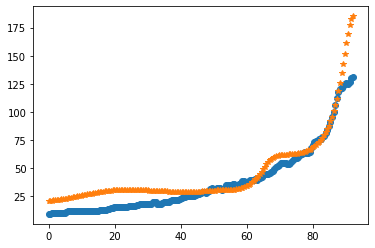

after perturb [6.490799813857687, 117.67623883177872, 31099.7050562887, 0.832469034414138, 49.35453280751918]
parameters [6.490799813857687, 117.67623883177872, 31099.7050562887, 0.832469034414138, 49.35453280751918]
after perturb [-0.9357429941821076, 96.92595553548173, 18962.287763404565, -0.021212121911590498, 2.9671815622167195]
parameters [-0.9357429941821076, 96.92595553548173, 18962.287763404565, -0.021212121911590498, 2.9671815622167195]
after perturb [2.4219218179718207, 147.07241775596543, 23904.895353206524, 0.4541208283638169, 19.768565860061535]
parameters [2.4219218179718207, 147.07241775596543, 23904.895353206524, 0.4541208283638169, 19.768565860061535]
oxigeno [1.43198545e-08 1.43861425e-08 1.45857112e-08 1.49206849e-08
 1.53946355e-08 1.60126295e-08 1.67812948e-08 1.77089060e-08
 1.88054911e-08 2.00829576e-08 2.15552420e-08 2.32384821e-08
 2.51512148e-08 2.73146027e-08 2.97526912e-08 3.24927018e-08
 3.55653642e-08 3.90052944e-08 4.28514239e-08 4.71474872e-08
 5.1942575

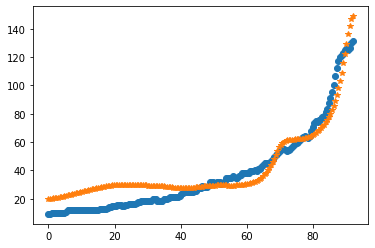

after perturb [4.832718682476612, 93.81999057268881, 17638.30531942847, 0.08173790336535613, 20.910399986476154]
parameters [4.832718682476612, 93.81999057268881, 17638.30531942847, 0.08173790336535613, 20.910399986476154]
after perturb [3.917387617698799, 161.28643534668512, 25637.77285655698, 1.1929126246584394, 33.956372991412266]
parameters [3.917387617698799, 161.28643534668512, 25637.77285655698, 1.1929126246584394, 33.956372991412266]
after perturb [4.732879999216408, 105.29211793626392, 17986.99414840934, 0.598797250377791, 41.77240456240401]
parameters [4.732879999216408, 105.29211793626392, 17986.99414840934, 0.598797250377791, 41.77240456240401]
after perturb [6.26532305126621, 115.65435794517936, 25691.199581057343, 0.5147433499390904, 30.48759394588287]
parameters [6.26532305126621, 115.65435794517936, 25691.199581057343, 0.5147433499390904, 30.48759394588287]
oxigeno [2.27688468e-10 2.29302743e-10 2.34169484e-10 2.42360858e-10
 2.53998542e-10 2.69255860e-10 2.88360813e-10

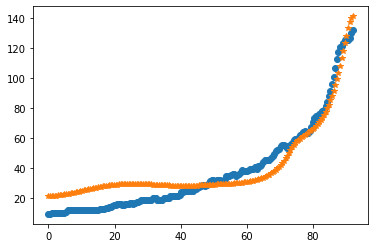

after perturb [5.721926476435413, 101.50410977656547, 20974.15830434484, 0.15238640777323526, 22.883419433442004]
parameters [5.721926476435413, 101.50410977656547, 20974.15830434484, 0.15238640777323526, 22.883419433442004]
oxigeno [1.33132425e-04 1.33076703e-04 1.32910007e-04 1.32633738e-04
 1.32250216e-04 1.31762654e-04 1.31175129e-04 1.30492538e-04
 1.29720556e-04 1.28865585e-04 1.27934697e-04 1.26935582e-04
 1.25876489e-04 1.24766174e-04 1.23613847e-04 1.22429122e-04
 1.21221976e-04 1.20002707e-04 1.18781909e-04 1.17570440e-04
 1.16379412e-04 1.15220172e-04 1.14104310e-04 1.13043655e-04
 1.12050290e-04 1.11136575e-04 1.10315170e-04 1.09599071e-04
 1.09001648e-04 1.08536694e-04 1.08218483e-04 1.08061822e-04
 1.08082129e-04 1.08295499e-04 1.08718789e-04 1.09369706e-04
 1.10266904e-04 1.11430084e-04 1.12880105e-04 1.14639108e-04
 1.16730635e-04 1.19179774e-04 1.22013295e-04 1.25259815e-04
 1.28949955e-04 1.33116522e-04 1.37794695e-04 1.43022225e-04
 1.48839649e-04 1.55290519e-04 1.62

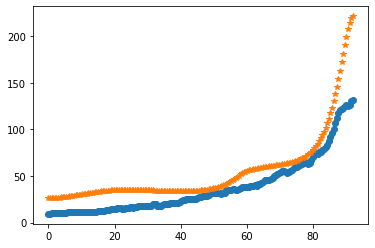

after perturb [9.32801311170618, 99.33859997272158, 18685.86292789402, 0.3463630937787803, 37.41750043195141]
parameters [9.32801311170618, 99.33859997272158, 18685.86292789402, 0.3463630937787803, 37.41750043195141]
after perturb [5.9778525346353035, 157.41134207723255, 35244.098033535265, 0.66592609269754, 37.95847949823937]
parameters [5.9778525346353035, 157.41134207723255, 35244.098033535265, 0.66592609269754, 37.95847949823937]
after perturb [3.7486827053085054, 150.81217719429395, 31397.813409487364, 0.8039614055396931, 29.75179286249191]
parameters [3.7486827053085054, 150.81217719429395, 31397.813409487364, 0.8039614055396931, 29.75179286249191]
after perturb [1.7417531848485224, 99.93109480070267, 30678.786543097638, 0.5360612647914993, 25.948564304059886]
parameters [1.7417531848485224, 99.93109480070267, 30678.786543097638, 0.5360612647914993, 25.948564304059886]
after perturb [5.046586309084969, 78.76816470806106, 15770.34550009292, 0.12952175566424318, 18.391979429222236]

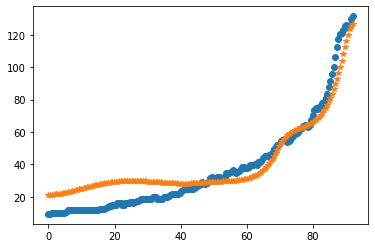

after perturb [4.3296251937766215, 123.73346537783263, 27637.288653621523, 0.5803455830015634, 30.133409967190357]
parameters [4.3296251937766215, 123.73346537783263, 27637.288653621523, 0.5803455830015634, 30.133409967190357]
oxigeno [1.33923132e-10 1.34892444e-10 1.37815086e-10 1.42735449e-10
 1.49728441e-10 1.58900874e-10 1.70393456e-10 1.84383397e-10
 2.01087690e-10 2.20767111e-10 2.43731027e-10 2.70343082e-10
 3.01027867e-10 3.36278710e-10 3.76666720e-10 4.22851258e-10
 4.75592045e-10 5.35763128e-10 6.04368981e-10 6.82563057e-10
 7.71669145e-10 8.73205950e-10 9.88915369e-10 1.12079501e-09
 1.27113557e-09 1.44256379e-09 1.63809177e-09 1.86117360e-09
 2.11577030e-09 2.40642427e-09 2.73834458e-09 3.11750462e-09
 3.55075380e-09 4.04594513e-09 4.61208107e-09 5.25947983e-09
 5.99996507e-09 6.84708201e-09 7.81634350e-09 8.92551008e-09
 1.01949085e-08 1.16477937e-08 1.33107608e-08 1.52142123e-08
 1.73928901e-08 1.98864790e-08 2.27402937e-08 2.60060581e-08
 2.97427934e-08 3.40178254e-08 3.

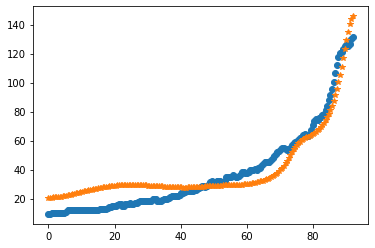

after perturb [4.190454355312929, 129.46819740559388, 28318.526418600984, 0.6787186305164563, 47.23458047108426]
parameters [4.190454355312929, 129.46819740559388, 28318.526418600984, 0.6787186305164563, 47.23458047108426]
oxigeno [3.40946186e-11 3.43611502e-11 3.51651117e-11 3.65196909e-11
 3.84471625e-11 4.09793357e-11 4.41581934e-11 4.80367334e-11
 5.26800281e-11 5.81665235e-11 6.45896022e-11 7.20594406e-11
 8.07051993e-11 9.06775887e-11 1.02151865e-10 1.15331315e-10
 1.30451309e-10 1.47783999e-10 1.67643770e-10 1.90393549e-10
 2.16452126e-10 2.46302611e-10 2.80502244e-10 3.19693732e-10
 3.64618369e-10 4.16131210e-10 4.75218607e-10 5.43018474e-10
 6.20843684e-10 7.10209073e-10 8.12862587e-10 9.30821171e-10
 1.06641211e-09 1.22232062e-09 1.40164449e-09 1.60795702e-09
 1.84537911e-09 2.11866207e-09 2.43328254e-09 2.79555119e-09
 3.21273724e-09 3.69321099e-09 4.24660687e-09 4.88400994e-09
 5.61816928e-09 6.46374198e-09 7.43757232e-09 8.55901109e-09
 9.85028099e-09 1.13368949e-08 1.3048

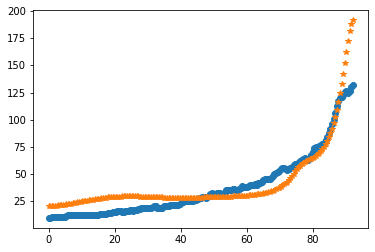

after perturb [6.0418833132648135, 113.65582892325651, 29644.917766703464, 0.6551588572647066, 28.24758645864005]
parameters [6.0418833132648135, 113.65582892325651, 29644.917766703464, 0.6551588572647066, 28.24758645864005]
after perturb [3.037393629538879, 145.9523882835036, 19228.825793743992, 0.3500682570322371, 19.863632362547644]
parameters [3.037393629538879, 145.9523882835036, 19228.825793743992, 0.3500682570322371, 19.863632362547644]
after perturb [2.776434928417646, 98.96594734184234, 27765.627035629845, 0.17421117839183328, 9.855334694620767]
parameters [2.776434928417646, 98.96594734184234, 27765.627035629845, 0.17421117839183328, 9.855334694620767]
after perturb [5.888879190537203, 137.4568441086375, 21580.67868965335, 0.6926032642222605, 23.0107253276136]
parameters [5.888879190537203, 137.4568441086375, 21580.67868965335, 0.6926032642222605, 23.0107253276136]
oxigeno [6.35930583e-11 6.40826708e-11 6.55592967e-11 6.80464489e-11
 7.15838115e-11 7.62279930e-11 8.20536012e-

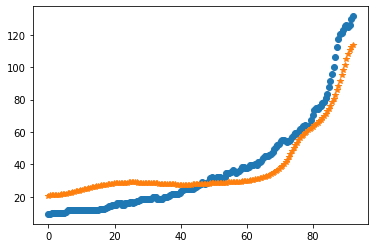

after perturb [5.183113709278707, 170.56603120781187, 22153.65212056953, 1.0905251905866489, 34.5508818708225]
parameters [5.183113709278707, 170.56603120781187, 22153.65212056953, 1.0905251905866489, 34.5508818708225]
after perturb [4.48696617946967, 127.91931086516216, 24984.677479052683, 0.9068244323232268, 40.51640754480911]
parameters [4.48696617946967, 127.91931086516216, 24984.677479052683, 0.9068244323232268, 40.51640754480911]
oxigeno [6.19738933e-13 6.26181418e-13 6.45647289e-13 6.78555312e-13
 7.25615238e-13 7.87845846e-13 8.66600838e-13 9.63603282e-13
 1.08098947e-12 1.22136340e-12 1.38786322e-12 1.58424149e-12
 1.81496139e-12 2.08531144e-12 2.40154177e-12 2.77102585e-12
 3.20245186e-12 3.70604915e-12 4.29385599e-12 4.98003593e-12
 5.78125173e-12 6.71710708e-12 7.81066854e-12 9.08908208e-12
 1.05843014e-11 1.23339482e-11 1.43823281e-11 1.67816300e-11
 1.95933419e-11 2.28899216e-11 2.67567667e-11 3.12945381e-11
 3.66218976e-11 4.28787316e-11 5.02299465e-11 5.88699337e-11
 6.

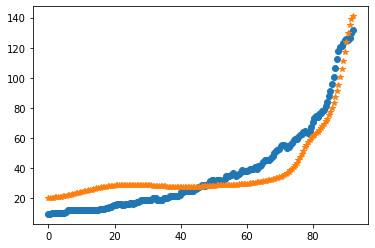

after perturb [3.79561790291566, 89.85708240591093, 18177.429602572774, 0.2138580061213623, 23.8582012036008]
parameters [3.79561790291566, 89.85708240591093, 18177.429602572774, 0.2138580061213623, 23.8582012036008]
after perturb [7.7915369060382185, 162.22773595461084, 23145.151607183594, 1.1149919244507644, 42.69822628594402]
parameters [7.7915369060382185, 162.22773595461084, 23145.151607183594, 1.1149919244507644, 42.69822628594402]
after perturb [3.376745872909134, 93.50158097084724, 26113.355550019212, 0.37738327730876914, 25.81773373478391]
parameters [3.376745872909134, 93.50158097084724, 26113.355550019212, 0.37738327730876914, 25.81773373478391]
oxigeno [2.79254930e-09 2.79357376e-09 2.79672096e-09 2.80221266e-09
 2.81041945e-09 2.82186245e-09 2.83721585e-09 2.85731078e-09
 2.88314060e-09 2.91586817e-09 2.95683545e-09 3.00757577e-09
 3.06982941e-09 3.14556291e-09 3.23699256e-09 3.34661276e-09
 3.47722979e-09 3.63200168e-09 3.81448489e-09 4.02868869e-09
 4.27913827e-09 4.5709

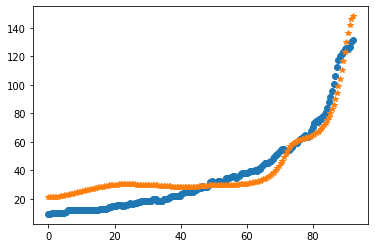

after perturb [1.034809118337702, 114.14882357084142, 22727.735139282, 0.3876420926955125, 19.377553079900224]
parameters [1.034809118337702, 114.14882357084142, 22727.735139282, 0.3876420926955125, 19.377553079900224]
oxigeno [5.41937186e-09 5.43979751e-09 5.50139942e-09 5.60515076e-09
 5.75266898e-09 5.94621253e-09 6.18868293e-09 6.48363717e-09
 6.83531533e-09 7.24868708e-09 7.72951864e-09 8.28445940e-09
 8.92114514e-09 9.64831313e-09 1.04759240e-08 1.14152869e-08
 1.24791870e-08 1.36820211e-08 1.50399481e-08 1.65710725e-08
 1.82956757e-08 2.02365132e-08 2.24191932e-08 2.48726403e-08
 2.76296433e-08 3.07274698e-08 3.42085277e-08 3.81210482e-08
 4.25197722e-08 4.74666389e-08 5.30314976e-08 5.92928878e-08
 6.63389589e-08 7.42686096e-08 8.31929245e-08 9.32369680e-08
 1.04541956e-07 1.17267783e-07 1.31595841e-07 1.47732018e-07
 1.65909777e-07 1.86393189e-07 2.09479888e-07 2.35503945e-07
 2.64838771e-07 2.97900258e-07 3.35150406e-07 3.77101745e-07
 4.24322827e-07 4.77444995e-07 5.37170554

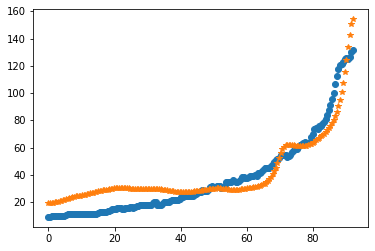

after perturb [3.9640747711925, 163.34247052853848, 28255.818453265325, 0.9038155206582617, 42.95637511522958]
parameters [3.9640747711925, 163.34247052853848, 28255.818453265325, 0.9038155206582617, 42.95637511522958]
after perturb [7.702193543477307, 92.52216685418136, 29149.387105259404, 0.47147393762514883, 40.450255597454756]
parameters [7.702193543477307, 92.52216685418136, 29149.387105259404, 0.47147393762514883, 40.450255597454756]
after perturb [3.9534018666150903, 191.61955604454948, 29976.74377030533, 1.3686876703587365, 39.46479077757118]
parameters [3.9534018666150903, 191.61955604454948, 29976.74377030533, 1.3686876703587365, 39.46479077757118]
after perturb [5.735442739127589, 99.63547639152762, 19142.12179894889, 0.19030692212271832, 30.96450643727311]
parameters [5.735442739127589, 99.63547639152762, 19142.12179894889, 0.19030692212271832, 30.96450643727311]
after perturb [3.966211307485446, 162.15755970780998, 21102.5996361576, 0.7116471116284157, 16.806515108584538]


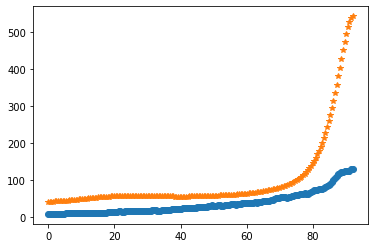

after perturb [6.139979832282074, 119.15190015983079, 27662.07771115479, 0.28281560996709015, 31.108163365660072]
parameters [6.139979832282074, 119.15190015983079, 27662.07771115479, 0.28281560996709015, 31.108163365660072]
oxigeno [3.11758996e-07 3.12148113e-07 3.13320566e-07 3.15291690e-07
 3.18087162e-07 3.21743185e-07 3.26306744e-07 3.31835948e-07
 3.38400455e-07 3.46082002e-07 3.54975029e-07 3.65187421e-07
 3.76841376e-07 3.90074404e-07 4.05040484e-07 4.21911382e-07
 4.40878141e-07 4.62152789e-07 4.85970239e-07 5.12590447e-07
 5.42300816e-07 5.75418890e-07 6.12295352e-07 6.53317366e-07
 6.98912285e-07 7.49551756e-07 8.05756275e-07 8.68100206e-07
 9.37217328e-07 1.01380695e-06 1.09864062e-06 1.19256956e-06
 1.29653274e-06 1.41156581e-06 1.53881089e-06 1.67952725e-06
 1.83510303e-06 2.00706806e-06 2.19710790e-06 2.40707914e-06
 2.63902616e-06 2.89519943e-06 3.17807549e-06 3.49037879e-06
 3.83510554e-06 4.21554978e-06 4.63533182e-06 5.09842938e-06
 5.60921152e-06 6.17247582e-06 6.79

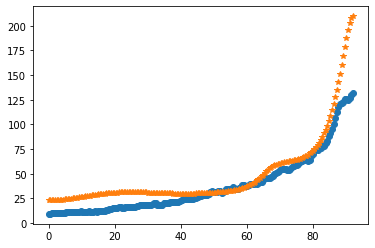

after perturb [7.152101256396973, 103.8506575133838, 20373.093616483693, 0.19780157187090308, 13.813305878743815]
parameters [7.152101256396973, 103.8506575133838, 20373.093616483693, 0.19780157187090308, 13.813305878743815]
after perturb [2.376202729252312, 137.34140916276345, 18937.186787699968, 0.7382046318318916, 28.355751793085847]
parameters [2.376202729252312, 137.34140916276345, 18937.186787699968, 0.7382046318318916, 28.355751793085847]
after perturb [4.730223294054751, 149.21143296616486, 30451.21594696364, 1.1626359456805555, 53.09966693021187]
parameters [4.730223294054751, 149.21143296616486, 30451.21594696364, 1.1626359456805555, 53.09966693021187]
after perturb [5.370793696928813, 140.01579711425742, 26170.65576668171, 0.8444213815121693, 30.52719364747252]
parameters [5.370793696928813, 140.01579711425742, 26170.65576668171, 0.8444213815121693, 30.52719364747252]
oxigeno [6.63620364e-12 6.69544332e-12 6.87425483e-12 7.17593949e-12
 7.60607972e-12 8.17266116e-12 8.886247

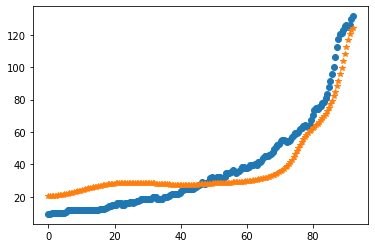

after perturb [4.887623300891324, 159.7324620110729, 25894.239567338424, 0.7318542091662482, 37.20321457987869]
parameters [4.887623300891324, 159.7324620110729, 25894.239567338424, 0.7318542091662482, 37.20321457987869]
after perturb [4.512681509510337, 134.89845643666027, 20419.76802923153, 0.7253236030687601, 27.987589873389087]
parameters [4.512681509510337, 134.89845643666027, 20419.76802923153, 0.7253236030687601, 27.987589873389087]
oxigeno [2.81364042e-11 2.83628131e-11 2.90458394e-11 3.01969593e-11
 3.18355600e-11 3.39893348e-11 3.66948479e-11 3.99982782e-11
 4.39563587e-11 4.86375288e-11 5.41233238e-11 6.05100291e-11
 6.79106341e-11 7.64571260e-11 8.63031717e-11 9.76272450e-11
 1.10636266e-10 1.25569830e-10 1.42705119e-10 1.62362599e-10
 1.84912627e-10 2.10783119e-10 2.40468425e-10 2.74539626e-10
 3.13656451e-10 3.58581087e-10 4.10194158e-10 4.69513223e-10
 5.37714157e-10 6.16155883e-10 7.06408928e-10 8.10288410e-10
 9.29892085e-10 1.06764423e-09 1.22634617e-09 1.40923456e-09

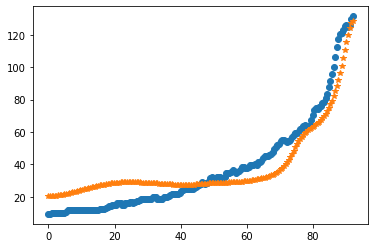

after perturb [5.138133248850059, 122.59710208177897, 22006.031809952055, 0.4908076961131543, 27.041847794631302]
parameters [5.138133248850059, 122.59710208177897, 22006.031809952055, 0.4908076961131543, 27.041847794631302]
oxigeno [8.11582038e-10 8.16697968e-10 8.32113948e-10 8.58035667e-10
 8.94809661e-10 9.42928952e-10 1.00304106e-09 1.07595853e-09
 1.16267206e-09 1.26436656e-09 1.38244028e-09 1.51852731e-09
 1.67452394e-09 1.85261915e-09 2.05532974e-09 2.28554088e-09
 2.54655238e-09 2.84213185e-09 3.17657531e-09 3.55477642e-09
 3.98230544e-09 4.46549925e-09 5.01156381e-09 5.62869091e-09
 6.32619089e-09 7.11464365e-09 8.00607024e-09 9.01412774e-09
 1.01543305e-08 1.14443013e-08 1.29040552e-08 1.45563228e-08
 1.64269141e-08 1.85451317e-08 2.09442371e-08 2.36619775e-08
 2.67411808e-08 3.02304266e-08 3.41848029e-08 3.86667588e-08
 4.37470656e-08 4.95058984e-08 5.60340548e-08 6.34343260e-08
 7.18230406e-08 8.13318021e-08 9.21094441e-08 1.04324231e-07
 1.18166335e-07 1.33850625e-07 1.51

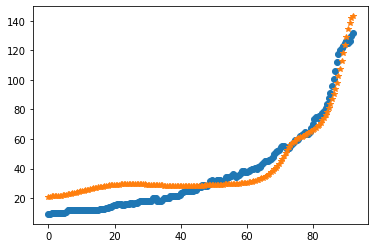

after perturb [10.534502179688419, 106.56839676004775, 29442.39510064437, 0.5967226064543565, 46.73620426443756]
parameters [10.534502179688419, 106.56839676004775, 29442.39510064437, 0.5967226064543565, 46.73620426443756]
after perturb [7.019336978922643, 129.276300521995, 22903.49047533389, 0.5971541004777896, 39.38059110495493]
parameters [7.019336978922643, 129.276300521995, 22903.49047533389, 0.5971541004777896, 39.38059110495493]
after perturb [6.702690774068567, 169.09812069328115, 33124.5013668643, 1.2607919571380157, 46.90741627289819]
parameters [6.702690774068567, 169.09812069328115, 33124.5013668643, 1.2607919571380157, 46.90741627289819]
after perturb [5.131904006436063, 120.71963132421133, 28446.232620409264, 0.4212534566912361, 33.08836004305299]
parameters [5.131904006436063, 120.71963132421133, 28446.232620409264, 0.4212534566912361, 33.08836004305299]
oxigeno [3.60973621e-09 3.62839485e-09 3.68459475e-09 3.77901111e-09
 3.91278008e-09 4.08751517e-09 4.30533050e-09 4.5

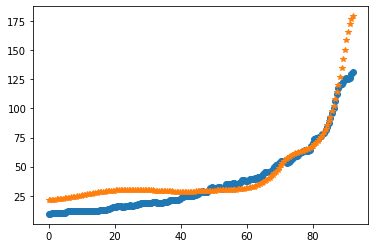

after perturb [2.947338116168382, 129.04905485921637, 24455.688168135326, 0.5149984187231533, 31.716413192365962]
parameters [2.947338116168382, 129.04905485921637, 24455.688168135326, 0.5149984187231533, 31.716413192365962]
oxigeno [8.88484410e-10 8.93840282e-10 9.09978520e-10 9.37112180e-10
 9.75600339e-10 1.02595410e-09 1.08884511e-09 1.16511661e-09
 1.25579726e-09 1.36211780e-09 1.48553080e-09 1.62773383e-09
 1.79069635e-09 1.97669071e-09 2.18832786e-09 2.42859832e-09
 2.70091916e-09 3.00918777e-09 3.35784347e-09 3.75193804e-09
 4.19721637e-09 4.70020874e-09 5.26833626e-09 5.91003136e-09
 6.63487519e-09 7.45375429e-09 8.37903905e-09 9.42478666e-09
 1.06069718e-08 1.19437486e-08 1.34557476e-08 1.51664127e-08
 1.71023818e-08 1.92939181e-08 2.17753965e-08 2.45858519e-08
 2.77695974e-08 3.13769185e-08 3.54648527e-08 4.00980634e-08
 4.53498185e-08 5.13030853e-08 5.80517553e-08 6.57020145e-08
 7.43738772e-08 8.42029055e-08 9.53421382e-08 1.07964261e-07
 1.22264049e-07 1.38461126e-07 1.56

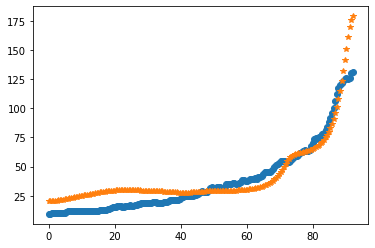

after perturb [2.099831537035113, 112.22250255245766, 23364.9403947469, 0.43732105319367104, 21.130264726195108]
parameters [2.099831537035113, 112.22250255245766, 23364.9403947469, 0.43732105319367104, 21.130264726195108]
oxigeno [1.07739083e-09 1.08313064e-09 1.10043198e-09 1.12954188e-09
 1.17087642e-09 1.22502738e-09 1.29277162e-09 1.37508332e-09
 1.47314925e-09 1.58838724e-09 1.72246819e-09 1.87734174e-09
 2.05526630e-09 2.25884359e-09 2.49105852e-09 2.75532500e-09
 3.05553857e-09 3.39613693e-09 3.78216956e-09 4.21937790e-09
 4.71428764e-09 5.27431504e-09 5.90788907e-09 6.62459155e-09
 7.43531753e-09 8.35245810e-09 9.39010850e-09 1.05643043e-08
 1.18932889e-08 1.33978172e-08 1.51014989e-08 1.70311887e-08
 1.92174283e-08 2.16949492e-08 2.45032428e-08 2.76872066e-08
 3.12978746e-08 3.53932406e-08 4.00391809e-08 4.53104864e-08
 5.12920098e-08 5.80799401e-08 6.57832138e-08 7.45250794e-08
 8.44448335e-08 9.56997560e-08 1.08467275e-07 1.22947403e-07
 1.39365488e-07 1.57975340e-07 1.7906

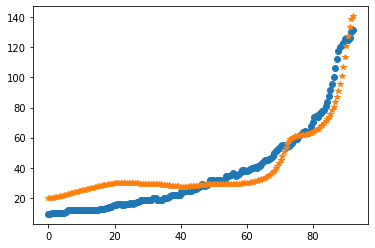

after perturb [9.270284743999058, 72.99081849209917, 30762.7341911138, 0.6054149538842694, 55.10820144112899]
parameters [9.270284743999058, 72.99081849209917, 30762.7341911138, 0.6054149538842694, 55.10820144112899]
after perturb [3.9547930213204916, 117.3231882596379, 21279.14988883419, 0.33683265742625257, 17.912007968494503]
parameters [3.9547930213204916, 117.3231882596379, 21279.14988883419, 0.33683265742625257, 17.912007968494503]
oxigeno [3.25376356e-08 3.26339654e-08 3.29241052e-08 3.34115191e-08
 3.41020231e-08 3.50038495e-08 3.61277387e-08 3.74870582e-08
 3.90979532e-08 4.09795271e-08 4.31540577e-08 4.56472504e-08
 4.84885320e-08 5.17113887e-08 5.53537542e-08 5.94584518e-08
 6.40736969e-08 6.92536666e-08 7.50591444e-08 8.15582475e-08
 8.88272470e-08 9.69514911e-08 1.06026443e-07 1.16158847e-07
 1.27468035e-07 1.40087389e-07 1.54165982e-07 1.69870404e-07
 1.87386810e-07 2.06923189e-07 2.28711904e-07 2.53012504e-07
 2.80114853e-07 3.10342598e-07 3.44057008e-07 3.81661223e-07
 

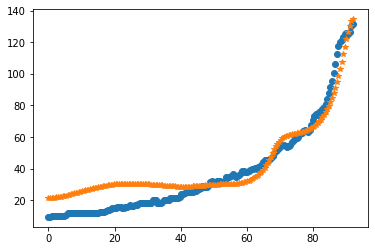

after perturb [6.650427838786247, 130.69691023427484, 27126.006700921957, 0.566346641806615, 33.85727735630005]
parameters [6.650427838786247, 130.69691023427484, 27126.006700921957, 0.566346641806615, 33.85727735630005]
oxigeno [3.50940611e-10 3.53323036e-10 3.60503694e-10 3.72583288e-10
 3.89731531e-10 4.12189991e-10 4.40276139e-10 4.74388669e-10
 5.15014183e-10 5.62735352e-10 6.18240694e-10 6.82336130e-10
 7.55958525e-10 8.40191442e-10 9.36283375e-10 1.04566879e-09
 1.16999232e-09 1.31113655e-09 1.47125385e-09 1.65280283e-09
 1.85859002e-09 2.09181755e-09 2.35613749e-09 2.65571401e-09
 2.99529424e-09 3.38028901e-09 3.81686502e-09 4.31204967e-09
 4.87385060e-09 5.51139163e-09 6.23506749e-09 7.05671971e-09
 7.98983656e-09 9.04978019e-09 1.02540445e-08 1.16225479e-08
 1.31779653e-08 1.49461043e-08 1.69563325e-08 1.92420602e-08
 2.18412883e-08 2.47972278e-08 2.81590013e-08 3.19824365e-08
 3.63309635e-08 4.12766296e-08 4.69012470e-08 5.32976886e-08
 6.05713539e-08 6.88418233e-08 7.824472

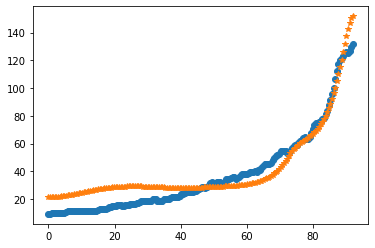

after perturb [3.194082571407022, 154.78156972752578, 30630.72397277043, 0.8014412975074519, 39.078826285234605]
parameters [3.194082571407022, 154.78156972752578, 30630.72397277043, 0.8014412975074519, 39.078826285234605]
after perturb [7.016394706854422, 132.60395135589596, 25019.548621162194, 0.6536775512869701, 27.827039251747895]
parameters [7.016394706854422, 132.60395135589596, 25019.548621162194, 0.6536775512869701, 27.827039251747895]
after perturb [4.8831572210376235, 130.6085012136304, 22343.960324082407, 0.4405453246983593, 28.12573348653203]
parameters [4.8831572210376235, 130.6085012136304, 22343.960324082407, 0.4405453246983593, 28.12573348653203]
oxigeno [5.34680076e-09 5.37482670e-09 5.45922244e-09 5.60094623e-09
 5.80161023e-09 6.06350343e-09 6.38962396e-09 6.78372139e-09
 7.25034938e-09 7.79492948e-09 8.42382674e-09 9.14443819e-09
 9.96529534e-09 1.08961820e-08 1.19482694e-08 1.31342696e-08
 1.44686103e-08 1.59676334e-08 1.76498189e-08 1.95360393e-08
 2.16498461e-08 

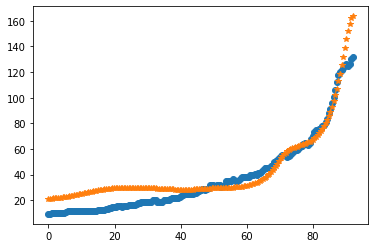

after perturb [2.630090172443854, 129.13105748424266, 24113.842249971553, 0.581288778159412, 21.831616979622815]
parameters [2.630090172443854, 129.13105748424266, 24113.842249971553, 0.581288778159412, 21.831616979622815]
oxigeno [2.27517009e-10 2.29056864e-10 2.33699094e-10 2.41512110e-10
 2.52611357e-10 2.67161457e-10 2.85379256e-10 3.07537794e-10
 3.33971265e-10 3.65081023e-10 4.01342730e-10 4.43314763e-10
 4.91648014e-10 5.47097260e-10 6.10534316e-10 6.82963222e-10
 7.65537757e-10 8.59581648e-10 9.66611866e-10 1.08836550e-09
 1.22683074e-09 1.38428261e-09 1.56332409e-09 1.76693353e-09
 1.99851914e-09 2.26198156e-09 2.56178576e-09 2.90304339e-09
 3.29160715e-09 3.73417883e-09 4.23843286e-09 4.81315749e-09
 5.46841615e-09 6.21573148e-09 7.06829520e-09 8.04120692e-09
 9.15174567e-09 1.04196778e-08 1.18676059e-08 1.35213629e-08
 1.54104571e-08 1.75685735e-08 2.00341393e-08 2.28509596e-08
 2.60689353e-08 2.97448720e-08 3.39433948e-08 3.87379844e-08
 4.42121525e-08 5.04607793e-08 5.7591

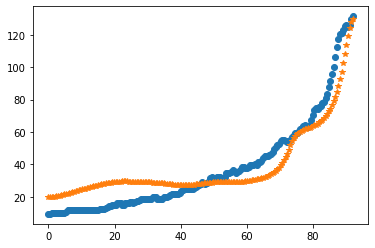

after perturb [4.98302117024126, 158.0949977340324, 27599.18347221106, 1.000688655950768, 38.15639865338598]
parameters [4.98302117024126, 158.0949977340324, 27599.18347221106, 1.000688655950768, 38.15639865338598]
after perturb [7.240810599064077, 83.9473855771091, 19030.711062384933, 0.2368134208292048, 33.1471038198054]
parameters [7.240810599064077, 83.9473855771091, 19030.711062384933, 0.2368134208292048, 33.1471038198054]
after perturb [2.4419037384597946, 119.35315751740903, 19032.937958203616, 0.3553532244496369, 24.990240051197134]
parameters [2.4419037384597946, 119.35315751740903, 19032.937958203616, 0.3553532244496369, 24.990240051197134]
after perturb [6.551327818870624, 141.32467943521058, 22138.909793650437, 0.6252801997315116, 29.7792608391005]
parameters [6.551327818870624, 141.32467943521058, 22138.909793650437, 0.6252801997315116, 29.7792608391005]
oxigeno [3.06338572e-10 3.08423324e-10 3.14706916e-10 3.25277850e-10
 3.40285294e-10 3.59941598e-10 3.84525889e-10 4.143

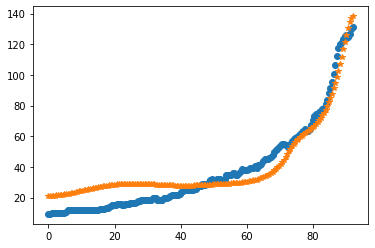

after perturb [1.880931069817529, 147.81914554723005, 32399.846728370314, 0.7894049518096778, 33.444221678531804]
parameters [1.880931069817529, 147.81914554723005, 32399.846728370314, 0.7894049518096778, 33.444221678531804]
after perturb [5.534862971226572, 143.43654411310553, 28269.246825816404, 0.6900512372733276, 32.738582102881324]
parameters [5.534862971226572, 143.43654411310553, 28269.246825816404, 0.6900512372733276, 32.738582102881324]
oxigeno [1.16591480e-10 1.17434269e-10 1.19975302e-10 1.24252816e-10
 1.30331314e-10 1.38302740e-10 1.48288155e-10 1.60439949e-10
 1.74944608e-10 1.92026121e-10 2.11950056e-10 2.35028395e-10
 2.61625227e-10 2.92163386e-10 3.27132169e-10 3.67096282e-10
 4.12706182e-10 4.64710001e-10 5.23967299e-10 5.91464890e-10
 6.68335049e-10 7.55876452e-10 8.55578234e-10 9.69147629e-10
 1.09854170e-09 1.24600379e-09 1.41410525e-09 1.60579344e-09
 1.82444661e-09 2.07393685e-09 2.35870211e-09 2.68382872e-09
 3.05514568e-09 3.47933248e-09 3.96404227e-09 4.518042

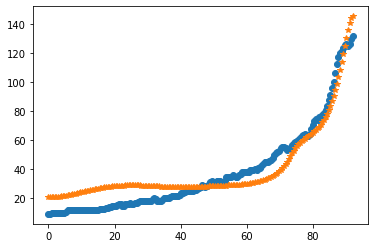

after perturb [6.504716973816822, 129.32863575349896, 28307.74063455529, 0.8214530589722703, 37.53812221768351]
parameters [6.504716973816822, 129.32863575349896, 28307.74063455529, 0.8214530589722703, 37.53812221768351]
oxigeno [2.93198355e-12 2.96015158e-12 3.04520940e-12 3.18883080e-12
 3.39384759e-12 3.66431396e-12 4.00559863e-12 4.42450724e-12
 4.92943774e-12 5.53057260e-12 6.24011260e-12 7.07255768e-12
 8.04504197e-12 9.17773091e-12 1.04942904e-11 1.20224391e-11
 1.37945985e-11 1.58486546e-11 1.82288531e-11 2.09868464e-11
 2.41829221e-11 2.78874396e-11 3.21825129e-11 3.71639793e-11
 4.29437030e-11 4.96522691e-11 5.74421352e-11 6.64913144e-11
 7.70076817e-11 8.92340054e-11 1.03453824e-10 1.19998311e-10
 1.39254284e-10 1.61673558e-10 1.87783848e-10 2.18201487e-10
 2.53646244e-10 2.94958597e-10 3.43119836e-10 3.99275478e-10
 4.64762509e-10 5.41141070e-10 6.30231312e-10 7.34156223e-10
 8.55391409e-10 9.96822913e-10 1.16181436e-09 1.35428493e-09
 1.57879980e-09 1.84067516e-09 2.146099

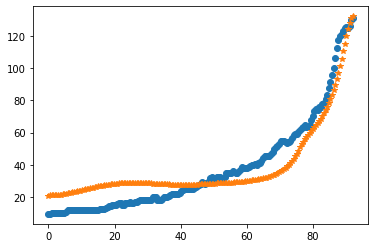

after perturb [4.964043049804071, 182.10226497603, 27859.472611349058, 1.4600105929818052, 46.46726651613003]
parameters [4.964043049804071, 182.10226497603, 27859.472611349058, 1.4600105929818052, 46.46726651613003]
after perturb [3.319004410947478, 75.62420171063505, 23720.676276594233, 0.07629486913832839, 11.993753955940402]
parameters [3.319004410947478, 75.62420171063505, 23720.676276594233, 0.07629486913832839, 11.993753955940402]
oxigeno [6.81768155e-03 6.81442738e-03 6.80468941e-03 6.78854065e-03
 6.76610109e-03 6.73753521e-03 6.70304861e-03 6.66288400e-03
 6.61731667e-03 6.56664961e-03 6.51120847e-03 6.45133657e-03
 6.38739014e-03 6.31973380e-03 6.24873658e-03 6.17476833e-03
 6.09819676e-03 6.01938495e-03 5.93868941e-03 5.85645866e-03
 5.77303212e-03 5.68873951e-03 5.60390040e-03 5.51882406e-03
 5.43380944e-03 5.34914528e-03 5.26511023e-03 5.18197304e-03
 5.09999277e-03 5.01941895e-03 4.94049176e-03 4.86344223e-03
 4.78849238e-03 4.71585542e-03 4.64573593e-03 4.57833010e-03
 

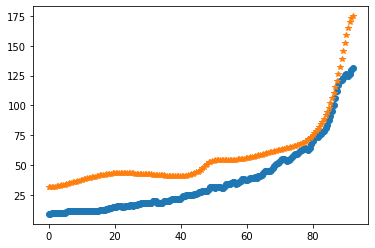

after perturb [10.320863409219506, 106.30814410225815, 26139.12376744177, 0.3548156514522958, 47.69534231580445]
parameters [10.320863409219506, 106.30814410225815, 26139.12376744177, 0.3548156514522958, 47.69534231580445]
after perturb [6.6755128700753446, 114.95267609785759, 25631.118063732825, 0.32476697755475276, 34.16307358584493]
parameters [6.6755128700753446, 114.95267609785759, 25631.118063732825, 0.32476697755475276, 34.16307358584493]
oxigeno [4.96864610e-08 4.97885976e-08 5.00963092e-08 5.06135139e-08
 5.13467851e-08 5.23054169e-08 5.35015171e-08 5.49501295e-08
 5.66693869e-08 5.86806965e-08 6.10089624e-08 6.36828460e-08
 6.67350688e-08 7.02027626e-08 7.41278705e-08 7.85576041e-08
 8.35449630e-08 8.91493238e-08 9.54371038e-08 1.02482510e-07
 1.10368378e-07 1.19187120e-07 1.29041777e-07 1.40047206e-07
 1.52331396e-07 1.66036947e-07 1.81322713e-07 1.98365629e-07
 2.17362749e-07 2.38533512e-07 2.62122252e-07 2.88400989e-07
 3.17672524e-07 3.50273866e-07 3.86580028e-07 4.270082

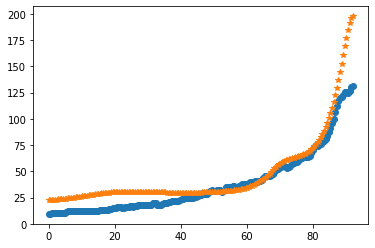

after perturb [3.5095861410773477, 68.63359138253462, 28197.787634132488, 0.26547681298895287, 29.06772577041215]
parameters [3.5095861410773477, 68.63359138253462, 28197.787634132488, 0.26547681298895287, 29.06772577041215]
oxigeno [5.45897614e-07 5.45325049e-07 5.43612963e-07 5.40778046e-07
 5.36847669e-07 5.31859238e-07 5.25859332e-07 5.18902671e-07
 5.11050947e-07 5.02371586e-07 4.92936473e-07 4.82820701e-07
 4.72101365e-07 4.60856462e-07 4.49163899e-07 4.37100638e-07
 4.24741982e-07 4.12161005e-07 3.99428130e-07 3.86610821e-07
 3.73773406e-07 3.60976996e-07 3.48279498e-07 3.35735694e-07
 3.23397394e-07 3.11313634e-07 2.99530926e-07 2.88093548e-07
 2.77043878e-07 2.66422764e-07 2.56269940e-07 2.46624488e-07
 2.37525354e-07 2.29011911e-07 2.21124601e-07 2.13905629e-07
 2.07399752e-07 2.01655143e-07 1.96724358e-07 1.92665411e-07
 1.89542963e-07 1.87429652e-07 1.86407561e-07 1.86569865e-07
 1.88022646e-07 1.90886932e-07 1.95300951e-07 2.01422663e-07
 2.09432579e-07 2.19536914e-07 2.31

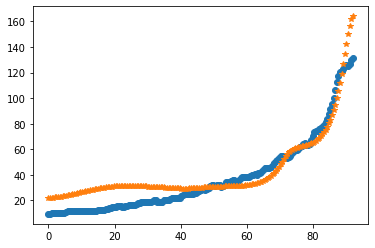

after perturb [10.306374498106994, 62.08200977420102, 13351.961858265504, -0.1633699104624991, 25.2122362151793]
parameters [10.306374498106994, 62.08200977420102, 13351.961858265504, -0.1633699104624991, 25.2122362151793]
after perturb [6.156529854307726, 108.47189428081356, 23323.265426018814, 0.2968243977323577, 19.228584504083766]
parameters [6.156529854307726, 108.47189428081356, 23323.265426018814, 0.2968243977323577, 19.228584504083766]
oxigeno [1.03125496e-07 1.03224077e-07 1.03521681e-07 1.04023898e-07
 1.04740092e-07 1.05683470e-07 1.06871181e-07 1.08324446e-07
 1.10068727e-07 1.12133935e-07 1.14554676e-07 1.17370552e-07
 1.20626512e-07 1.24373261e-07 1.28667738e-07 1.33573670e-07
 1.39162199e-07 1.45512608e-07 1.52713142e-07 1.60861944e-07
 1.70068104e-07 1.80452855e-07 1.92150907e-07 2.05311950e-07
 2.20102337e-07 2.36706968e-07 2.55331389e-07 2.76204138e-07
 2.99579353e-07 3.25739679e-07 3.54999494e-07 3.87708490e-07
 4.24255645e-07 4.65073630e-07 5.10643675e-07 5.61500972

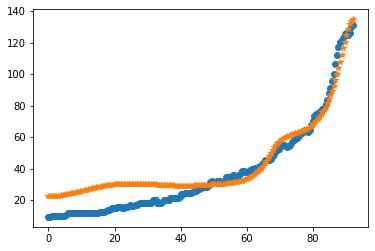

after perturb [4.7833069582733465, 145.19136348074215, 25337.639649161185, 0.6729434150330927, 31.515459017820163]
parameters [4.7833069582733465, 145.19136348074215, 25337.639649161185, 0.6729434150330927, 31.515459017820163]
oxigeno [1.84617477e-10 1.85893742e-10 1.89741047e-10 1.96215255e-10
 2.05410582e-10 2.17461287e-10 2.32544072e-10 2.50881239e-10
 2.72744655e-10 2.98460588e-10 3.28415508e-10 3.63062945e-10
 4.02931528e-10 4.48634359e-10 5.00879871e-10 5.60484388e-10
 6.28386617e-10 7.05664325e-10 7.93553524e-10 8.93470530e-10
 1.00703728e-09 1.13611039e-09 1.28281456e-09 1.44958073e-09
 1.63919005e-09 1.85482402e-09 2.10012211e-09 2.37924761e-09
 2.69696301e-09 3.05871615e-09 3.47073870e-09 3.94015858e-09
 4.47512822e-09 5.08497084e-09 5.78034712e-09 6.57344489e-09
 7.47819511e-09 8.51051729e-09 9.68859857e-09 1.10332106e-08
 1.25680693e-08 1.43202433e-08 1.63206173e-08 1.86044176e-08
 2.12118085e-08 2.41885684e-08 2.75868572e-08 3.14660857e-08
 3.58939037e-08 4.09473186e-08 4.

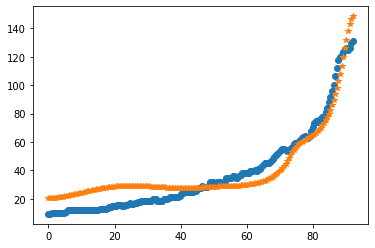

after perturb [0.3102198551418516, 127.21074888873241, 23676.053300469815, 0.7392197653438674, 18.263751315855416]
parameters [0.3102198551418516, 127.21074888873241, 23676.053300469815, 0.7392197653438674, 18.263751315855416]
oxigeno [9.37965007e-12 9.45111223e-12 9.66778447e-12 1.00363526e-11
 1.05674502e-11 1.12750797e-11 1.21760853e-11 1.32898251e-11
 1.46381409e-11 1.62457103e-11 1.81408869e-11 2.03571450e-11
 2.29351428e-11 2.59251692e-11 2.93894619e-11 3.34037991e-11
 3.80580198e-11 4.34556419e-11 4.97132395e-11 5.69604067e-11
 6.53408916e-11 7.50150996e-11 8.61640869e-11 9.89956040e-11
 1.13753335e-10 1.30730394e-10 1.50286676e-10 1.72867115e-10
 1.99015825e-10 2.29381371e-10 2.64712087e-10 3.05846200e-10
 3.53706787e-10 4.09312631e-10 4.73810945e-10 5.48529127e-10
 6.35036416e-10 7.35208053e-10 8.51292706e-10 9.85990589e-10
 1.14254706e-09 1.32485447e-09 1.53754163e-09 1.78602616e-09
 2.07651765e-09 2.41598765e-09 2.81215670e-09 3.27357085e-09
 3.80983009e-09 4.43197689e-09 5.

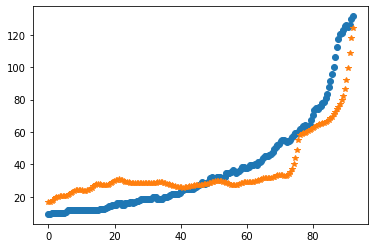

after perturb [2.9662714162703474, 162.32798381879564, 23061.701847051758, 0.6918360378344928, 20.753515355081753]
parameters [2.9662714162703474, 162.32798381879564, 23061.701847051758, 0.6918360378344928, 20.753515355081753]
after perturb [4.4266480062440685, 161.6141808299801, 26876.08746722442, 0.9150464951974806, 35.19120871476159]
parameters [4.4266480062440685, 161.6141808299801, 26876.08746722442, 0.9150464951974806, 35.19120871476159]
after perturb [1.179679879125084, 116.63043581941228, 24994.777722824816, 0.35167605662930945, 28.822673882368967]
parameters [1.179679879125084, 116.63043581941228, 24994.777722824816, 0.35167605662930945, 28.822673882368967]
oxigeno [2.25808891e-08 2.26383272e-08 2.28115768e-08 2.31034373e-08
 2.35185527e-08 2.40633909e-08 2.47462312e-08 2.55771759e-08
 2.65681958e-08 2.77332209e-08 2.90882758e-08 3.06516612e-08
 3.24441706e-08 3.44893361e-08 3.68136918e-08 3.94470515e-08
 4.24228026e-08 4.57782279e-08 4.95548757e-08 5.37990064e-08
 5.85621485e

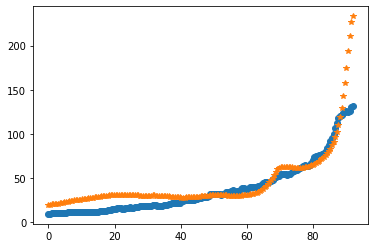

after perturb [0.9420133920142506, 169.54202094883476, 19644.448649779413, 0.7077866238379709, 26.214302219755933]
parameters [0.9420133920142506, 169.54202094883476, 19644.448649779413, 0.7077866238379709, 26.214302219755933]
after perturb [3.976280798786463, 162.91732199038847, 28902.645646476205, 0.6353141319912471, 19.898457870759113]
parameters [3.976280798786463, 162.91732199038847, 28902.645646476205, 0.6353141319912471, 19.898457870759113]
after perturb [5.800005256293806, 116.07149468939971, 17552.630098100955, 0.30376375616751866, 10.259403002267256]
parameters [5.800005256293806, 116.07149468939971, 17552.630098100955, 0.30376375616751866, 10.259403002267256]
after perturb [8.551064204860447, 109.29524444463974, 27303.026615375846, 0.6669596965197512, 39.959932463144426]
parameters [8.551064204860447, 109.29524444463974, 27303.026615375846, 0.6669596965197512, 39.959932463144426]
after perturb [5.932290889499662, 129.4516330538338, 20878.606567919895, 0.6339414406516628, 38.

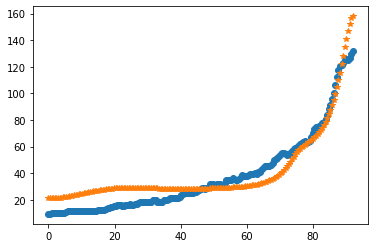

after perturb [3.177247079401224, 118.10001056103997, 29751.248280936084, 0.42323696366498526, 30.570188508135406]
parameters [3.177247079401224, 118.10001056103997, 29751.248280936084, 0.42323696366498526, 30.570188508135406]
after perturb [6.501218890997844, 104.6241681140117, 21074.804575319526, 0.16556164376224466, 14.892040766010231]
parameters [6.501218890997844, 104.6241681140117, 21074.804575319526, 0.16556164376224466, 14.892040766010231]
oxigeno [5.00843731e-05 5.00679361e-05 5.00188134e-05 4.99375690e-05
 4.98251388e-05 4.96828242e-05 4.95122840e-05 4.93155241e-05
 4.90948858e-05 4.88530333e-05 4.85929399e-05 4.83178748e-05
 4.80313894e-05 4.77373053e-05 4.74397027e-05 4.71429112e-05
 4.68515020e-05 4.65702829e-05 4.63042963e-05 4.60588196e-05
 4.58393694e-05 4.56517090e-05 4.55018593e-05 4.53961139e-05
 4.53410576e-05 4.53435896e-05 4.54109499e-05 4.55507509e-05
 4.57710123e-05 4.60802015e-05 4.64872774e-05 4.70017401e-05
 4.76336845e-05 4.83938594e-05 4.92937320e-05 5.0345

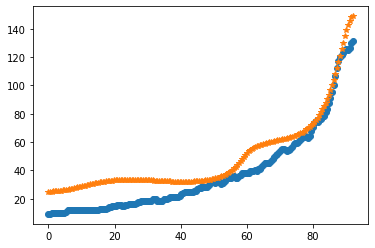

after perturb [8.812291536529607, 122.55240608641859, 28372.014182908097, 0.6512363455510743, 46.70216690778487]
parameters [8.812291536529607, 122.55240608641859, 28372.014182908097, 0.6512363455510743, 46.70216690778487]
after perturb [3.36630044745113, 141.3370690786564, 23505.61458703276, 0.6034291919106051, 30.721156861836956]
parameters [3.36630044745113, 141.3370690786564, 23505.61458703276, 0.6034291919106051, 30.721156861836956]
oxigeno [4.63353670e-10 4.66289049e-10 4.75135216e-10 4.90012969e-10
 5.11125969e-10 5.38764277e-10 5.73309355e-10 6.15240616e-10
 6.65143589e-10 7.23719839e-10 7.91798760e-10 8.70351445e-10
 9.60506844e-10 1.06357047e-09 1.18104601e-09 1.31466015e-09
 1.46639110e-09 1.63850143e-09 1.83357556e-09 2.05456287e-09
 2.30482709e-09 2.58820279e-09 2.90906017e-09 3.27237914e-09
 3.68383403e-09 4.14989048e-09 4.67791603e-09 5.27630631e-09
 5.95462896e-09 6.72378754e-09 7.59620809e-09 8.58605114e-09
 9.70945262e-09 1.09847971e-08 1.24330272e-08 1.40779943e-08
 

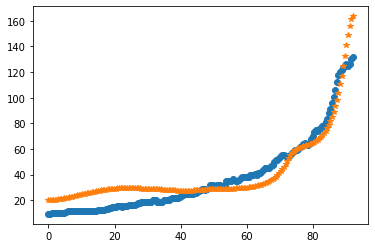

after perturb [4.731572213600154, 93.73428426239343, 16232.09621304743, 0.17965977771090902, 14.288502706013492]
parameters [4.731572213600154, 93.73428426239343, 16232.09621304743, 0.17965977771090902, 14.288502706013492]
after perturb [3.607655626843789, 131.70498476380058, 18285.50256438483, 0.5051829125307196, 23.175441316473012]
parameters [3.607655626843789, 131.70498476380058, 18285.50256438483, 0.5051829125307196, 23.175441316473012]
after perturb [3.6699675993715455, 113.56831161675441, 18339.92261022699, 0.6296158537188508, 15.580029917251846]
parameters [3.6699675993715455, 113.56831161675441, 18339.92261022699, 0.6296158537188508, 15.580029917251846]
after perturb [3.418854794260472, 128.78128582279564, 20860.972487930827, 0.5026509605654585, 22.702031763510742]
parameters [3.418854794260472, 128.78128582279564, 20860.972487930827, 0.5026509605654585, 22.702031763510742]
oxigeno [1.12831526e-09 1.13509832e-09 1.15553553e-09 1.18989248e-09
 1.23861670e-09 1.30234494e-09 1.38

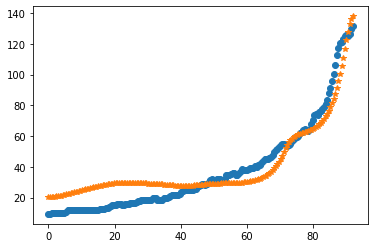

after perturb [7.9150770418155965, 70.07800006611565, 16616.783133637055, 0.04790341239486162, 18.629183039142386]
parameters [7.9150770418155965, 70.07800006611565, 16616.783133637055, 0.04790341239486162, 18.629183039142386]
after perturb [5.754737290665209, 63.404368537558994, 19160.825228009937, 0.17564280636105362, 21.492951432253307]
parameters [5.754737290665209, 63.404368537558994, 19160.825228009937, 0.17564280636105362, 21.492951432253307]
after perturb [0.9907701689339294, 173.40101216753322, 29137.7550528258, 1.3835626182017406, 53.75328966291407]
parameters [0.9907701689339294, 173.40101216753322, 29137.7550528258, 1.3835626182017406, 53.75328966291407]
after perturb [2.911931569417803, 156.86658070948187, 24867.460697011775, 0.8088378295007588, 27.748502063249095]
parameters [2.911931569417803, 156.86658070948187, 24867.460697011775, 0.8088378295007588, 27.748502063249095]
after perturb [5.496059527549798, 106.41286994649461, 23462.399350992397, 0.4011202500154274, 29.997

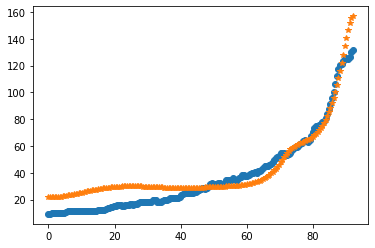

after perturb [7.756867466515262, 98.1423414643599, 25598.892961866655, 0.4415477957774683, 41.46076905117262]
parameters [7.756867466515262, 98.1423414643599, 25598.892961866655, 0.4415477957774683, 41.46076905117262]
after perturb [6.9134905116640875, 84.72354863489761, 25149.185206775874, 0.2941745385459724, 31.260406749829915]
parameters [6.9134905116640875, 84.72354863489761, 25149.185206775874, 0.2941745385459724, 31.260406749829915]
oxigeno [1.16392990e-07 1.16311258e-07 1.16066919e-07 1.15662532e-07
 1.15102343e-07 1.14392243e-07 1.13539727e-07 1.12553834e-07
 1.11445086e-07 1.10225421e-07 1.08908120e-07 1.07507745e-07
 1.06040076e-07 1.04522063e-07 1.02971784e-07 1.01408428e-07
 9.98522883e-08 9.83247922e-08 9.68485440e-08 9.54474063e-08
 9.41466116e-08 9.29729103e-08 9.19547585e-08 9.11225488e-08
 9.05088881e-08 9.01489257e-08 9.00807378e-08 9.03457720e-08
 9.09893578e-08 9.20612908e-08 9.36164958e-08 9.57157793e-08
 9.84266787e-08 1.01824420e-07 1.05992996e-07 1.11026377e-07

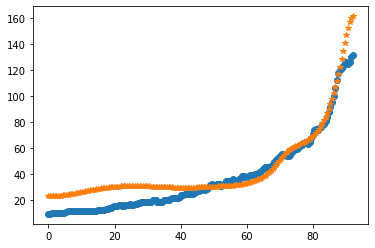

after perturb [6.534689842289899, 131.06638688351478, 28756.900688974616, 0.6025845627154212, 41.071792402459735]
parameters [6.534689842289899, 131.06638688351478, 28756.900688974616, 0.6025845627154212, 41.071792402459735]
oxigeno [1.71852750e-10 1.73075630e-10 1.76762217e-10 1.82966676e-10
 1.91780331e-10 2.03333267e-10 2.17796614e-10 2.35385538e-10
 2.56363021e-10 2.81044469e-10 3.09803253e-10 3.43077271e-10
 3.81376642e-10 4.25292700e-10 4.75508411e-10 5.32810439e-10
 5.98103057e-10 6.72424163e-10 7.56963703e-10 8.53084809e-10
 9.62348075e-10 1.08653937e-09 1.22770173e-09 1.38817184e-09
 1.57062186e-09 1.77810726e-09 2.01412147e-09 2.28265847e-09
 2.58828421e-09 2.93621828e-09 3.33242709e-09 3.78373023e-09
 4.29792178e-09 4.88390865e-09 5.55186816e-09 6.31342762e-09
 7.18186864e-09 8.17235980e-09 9.30222115e-09 1.05912250e-08
 1.20619380e-08 1.37401093e-08 1.56551118e-08 1.78404432e-08
 2.03342946e-08 2.31801955e-08 2.64277462e-08 3.01334477e-08
 3.43616438e-08 3.91855879e-08 4.46

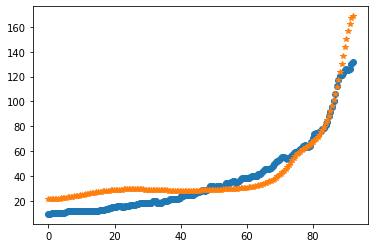

after perturb [0.9207321859545718, 141.2054281515984, 26525.307222626452, 0.7755165138886017, 24.520642431209286]
parameters [0.9207321859545718, 141.2054281515984, 26525.307222626452, 0.7755165138886017, 24.520642431209286]
oxigeno [2.29927139e-11 2.31650142e-11 2.36851940e-11 2.45631236e-11
 2.58153672e-11 2.74653700e-11 2.95437560e-11 3.20887744e-11
 3.51469435e-11 3.87739449e-11 4.30358145e-11 4.80104548e-11
 5.37894670e-11 6.04802667e-11 6.82084267e-11 7.71201895e-11
 8.73851270e-11 9.91989885e-11 1.12786882e-10 1.28407032e-10
 1.46355474e-10 1.66972076e-10 1.90648303e-10 2.17837040e-10
 2.49064603e-10 2.84944888e-10 3.26195357e-10 3.73654451e-10
 4.28300072e-10 4.91269023e-10 5.63877830e-10 6.47646010e-10
 7.44323563e-10 8.55924996e-10 9.84772429e-10 1.13355014e-09
 1.30537226e-09 1.50386430e-09 1.73325813e-09 1.99849874e-09
 2.30536050e-09 2.66057050e-09 3.07193739e-09 3.54848582e-09
 4.10059978e-09 4.74018111e-09 5.48083299e-09 6.33808025e-09
 7.32963899e-09 8.47574668e-09 9.79

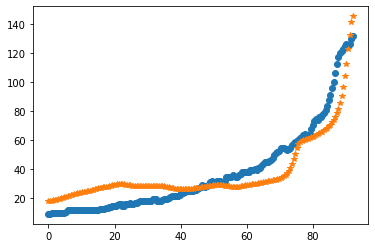

after perturb [1.0541063504936163, 133.97420802774786, 17524.608093852956, 0.7367500767146025, 23.380226874117056]
parameters [1.0541063504936163, 133.97420802774786, 17524.608093852956, 0.7367500767146025, 23.380226874117056]
after perturb [5.622685234854963, 145.62933631002934, 27606.703459532855, 0.7005988295968596, 43.090732118400666]
parameters [5.622685234854963, 145.62933631002934, 27606.703459532855, 0.7005988295968596, 43.090732118400666]
oxigeno [1.12004216e-10 1.12806385e-10 1.15224846e-10 1.19295679e-10
 1.25079746e-10 1.32663790e-10 1.42162007e-10 1.53718116e-10
 1.67507958e-10 1.83742677e-10 2.02672547e-10 2.24591498e-10
 2.49842437e-10 2.78823467e-10 3.11995107e-10 3.49888653e-10
 3.93115848e-10 4.42380025e-10 4.98488947e-10 5.62369586e-10
 6.35085115e-10 7.17854431e-10 8.12074591e-10 9.19346564e-10
 1.04150479e-09 1.18065108e-09 1.33919352e-09 1.51989102e-09
 1.72590436e-09 1.96085470e-09 2.22889047e-09 2.53476390e-09
 2.88391853e-09 3.28258924e-09 3.73791635e-09 4.2580

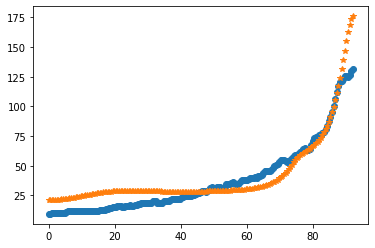

after perturb [4.549857600154825, 127.31714622117792, 21307.27968245567, 0.4240699086415741, 25.80748432144967]
parameters [4.549857600154825, 127.31714622117792, 21307.27968245567, 0.4240699086415741, 25.80748432144967]
oxigeno [6.01506595e-09 6.04587055e-09 6.13863470e-09 6.29441445e-09
 6.51498648e-09 6.80287319e-09 7.16137821e-09 7.59463277e-09
 8.10765350e-09 8.70641223e-09 9.39791881e-09 1.01903180e-08
 1.10930015e-08 1.21167369e-08 1.32738151e-08 1.45782182e-08
 1.60458106e-08 1.76945554e-08 1.95447595e-08 2.16193513e-08
 2.39441940e-08 2.65484397e-08 2.94649288e-08 3.27306406e-08
 3.63872007e-08 4.04814527e-08 4.50661010e-08 5.02004336e-08
 5.59511339e-08 6.23931908e-08 6.96109205e-08 7.76991087e-08
 8.67642901e-08 9.69261776e-08 1.08319258e-07 1.21094575e-07
 1.35421709e-07 1.51490994e-07 1.69515976e-07 1.89736150e-07
 2.12420009e-07 2.37868431e-07 2.66418441e-07 2.98447404e-07
 3.34377676e-07 3.74681791e-07 4.19888221e-07 4.70587795e-07
 5.27440847e-07 5.91185174e-07 6.626449

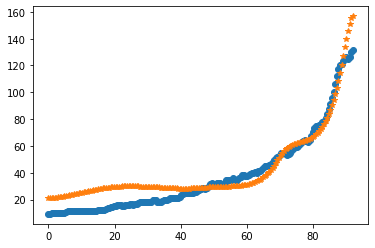

after perturb [7.364770331966639, 81.99489383764347, 23398.982986282397, 0.1445706032415195, 31.392435449142475]
parameters [7.364770331966639, 81.99489383764347, 23398.982986282397, 0.1445706032415195, 31.392435449142475]
after perturb [5.080844676954893, 99.40963090733415, 19281.535351347495, 0.41380783704783264, 35.91470905420555]
parameters [5.080844676954893, 99.40963090733415, 19281.535351347495, 0.41380783704783264, 35.91470905420555]
after perturb [3.9057303067077136, 106.37386457441444, 23728.472037189822, 0.4594017786001513, 38.25095669845244]
parameters [3.9057303067077136, 106.37386457441444, 23728.472037189822, 0.4594017786001513, 38.25095669845244]
oxigeno [3.36830821e-10 3.38724601e-10 3.44434907e-10 3.54049149e-10
 3.67714676e-10 3.85641318e-10 4.08104997e-10 4.35452465e-10
 4.68107258e-10 5.06576966e-10 5.51461930e-10 6.03465538e-10
 6.63406289e-10 7.32231834e-10 8.11035271e-10 9.01073966e-10
 1.00379126e-09 1.12084149e-09 1.25411868e-09 1.40578965e-09
 1.57833189e-09 

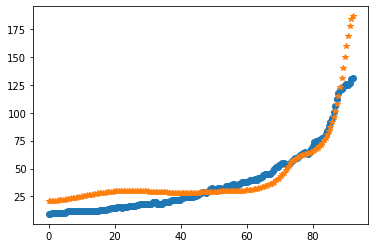

after perturb [6.430332060291992, 163.63063492501578, 33767.10338954988, 1.158102147936016, 54.376260941425286]
parameters [6.430332060291992, 163.63063492501578, 33767.10338954988, 1.158102147936016, 54.376260941425286]
after perturb [8.022056360008776, 98.11161771921878, 21956.50507534366, 0.13691031197864212, 16.49313796336751]
parameters [8.022056360008776, 98.11161771921878, 21956.50507534366, 0.13691031197864212, 16.49313796336751]
after perturb [6.487797121747544, 109.04415649808402, 25306.063316180098, 0.28561283055439146, 27.54877008656213]
parameters [6.487797121747544, 109.04415649808402, 25306.063316180098, 0.28561283055439146, 27.54877008656213]
oxigeno [2.00322570e-07 2.00438677e-07 2.00789794e-07 2.01384331e-07
 2.02236351e-07 2.03365653e-07 2.04797883e-07 2.06564685e-07
 2.08703896e-07 2.11259786e-07 2.14283353e-07 2.17832683e-07
 2.21973370e-07 2.26779021e-07 2.32331843e-07 2.38723323e-07
 2.46055020e-07 2.54439470e-07 2.64001221e-07 2.74878012e-07
 2.87222109e-07 3.01

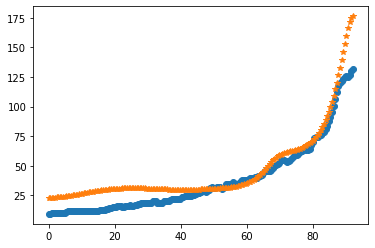

after perturb [5.745159153949202, 89.99857284090106, 21781.489866768476, 0.06527674561805474, 19.46984431929905]
parameters [5.745159153949202, 89.99857284090106, 21781.489866768476, 0.06527674561805474, 19.46984431929905]
oxigeno [2.53855597e-02 2.53762005e-02 2.53481780e-02 2.53016572e-02
 2.52369103e-02 2.51543145e-02 2.50543468e-02 2.49375790e-02
 2.48046715e-02 2.46563664e-02 2.44934800e-02 2.43168952e-02
 2.41275541e-02 2.39264506e-02 2.37146234e-02 2.34931504e-02
 2.32631439e-02 2.30257478e-02 2.27821373e-02 2.25335177e-02
 2.22810492e-02 2.20258269e-02 2.17689333e-02 2.15114305e-02
 2.12543620e-02 2.09987464e-02 2.07455761e-02 2.04958179e-02
 2.02504128e-02 2.00102758e-02 1.97762957e-02 1.95493357e-02
 1.93302338e-02 1.91198032e-02 1.89188334e-02 1.87280926e-02
 1.85483285e-02 1.83802715e-02 1.82246360e-02 1.80821236e-02
 1.79534262e-02 1.78392295e-02 1.77402162e-02 1.76570704e-02
 1.75904808e-02 1.75411452e-02 1.75097742e-02 1.74970961e-02
 1.75038610e-02 1.75308465e-02 1.7578

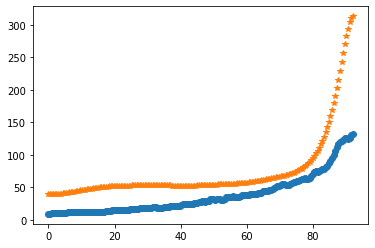

after perturb [2.8285349856184325, 130.3904691809233, 26734.50775456128, 0.38940770717941264, 26.67042810631484]
parameters [2.8285349856184325, 130.3904691809233, 26734.50775456128, 0.38940770717941264, 26.67042810631484]
oxigeno [1.86153557e-08 1.86958944e-08 1.89383684e-08 1.93453625e-08
 1.99212215e-08 2.06721061e-08 2.16060705e-08 2.27331651e-08
 2.40655608e-08 2.56177010e-08 2.74064779e-08 2.94514391e-08
 3.17750246e-08 3.44028370e-08 3.73639509e-08 4.06912629e-08
 4.44218899e-08 4.85976195e-08 5.32654209e-08 5.84780229e-08
 6.42945671e-08 7.07813461e-08 7.80126362e-08 8.60716351e-08
 9.50515160e-08 1.05056612e-07 1.16203740e-07 1.28623688e-07
 1.42462870e-07 1.57885175e-07 1.75074031e-07 1.94234695e-07
 2.15596802e-07 2.39417201e-07 2.65983084e-07 2.95615459e-07
 3.28672983e-07 3.65556179e-07 4.06712081e-07 4.52639327e-07
 5.03893751e-07 5.61094499e-07 6.24930739e-07 6.96169017e-07
 7.75661335e-07 8.64354053e-07 9.63297716e-07 1.07365794e-06
 1.19672754e-06 1.33393998e-06 1.4868

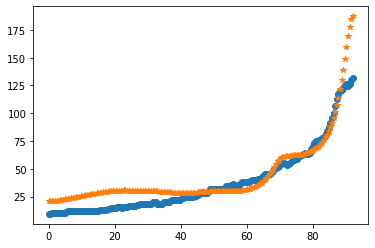

after perturb [5.865216373133037, 118.5993540084193, 20013.69675891159, 0.43321918049269886, 21.503292042669298]
parameters [5.865216373133037, 118.5993540084193, 20013.69675891159, 0.43321918049269886, 21.503292042669298]
oxigeno [2.13707337e-09 2.14920291e-09 2.18574459e-09 2.24715989e-09
 2.33422566e-09 2.44804576e-09 2.59006765e-09 2.76210413e-09
 2.96636044e-09 3.20546738e-09 3.48252061e-09 3.80112699e-09
 4.16545850e-09 4.58031455e-09 5.05119373e-09 5.58437596e-09
 6.18701637e-09 6.86725224e-09 7.63432483e-09 8.49871762e-09
 9.47231347e-09 1.05685726e-08 1.18027347e-08 1.31920470e-08
 1.47560237e-08 1.65167382e-08 1.84991537e-08 2.07314977e-08
 2.32456831e-08 2.60777851e-08 2.92685775e-08 3.28641382e-08
 3.69165302e-08 4.14845691e-08 4.66346850e-08 5.24418925e-08
 5.89908802e-08 6.63772340e-08 7.47088096e-08 8.41072735e-08
 9.47098297e-08 1.06671156e-07 1.20165576e-07 1.35389489e-07
 1.52564094e-07 1.71938443e-07 1.93792859e-07 2.18442762e-07
 2.46242956e-07 2.77592427e-07 3.1293

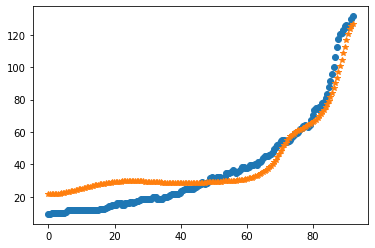

after perturb [6.059206260584456, 109.11316116900753, 19424.668515299418, 0.20072633566513798, 26.203874831997233]
parameters [6.059206260584456, 109.11316116900753, 19424.668515299418, 0.20072633566513798, 26.203874831997233]
after perturb [3.64509151774391, 109.8165947340379, 29474.821415869243, 0.4806988010579156, 27.86018608929464]
parameters [3.64509151774391, 109.8165947340379, 29474.821415869243, 0.4806988010579156, 27.86018608929464]
after perturb [3.9104360200413533, 103.5639226132227, 23311.725476081418, 0.39547779587893866, 16.37917898908749]
parameters [3.9104360200413533, 103.5639226132227, 23311.725476081418, 0.39547779587893866, 16.37917898908749]
oxigeno [1.67563924e-09 1.68138860e-09 1.69872936e-09 1.72794093e-09
 1.76949336e-09 1.82405405e-09 1.89249730e-09 1.97591683e-09
 2.07564166e-09 2.19325540e-09 2.33061958e-09 2.48990113e-09
 2.67360482e-09 2.88461089e-09 3.12621886e-09 3.40219800e-09
 3.71684553e-09 4.07505343e-09 4.48238509e-09 4.94516304e-09
 5.47056933e-09 

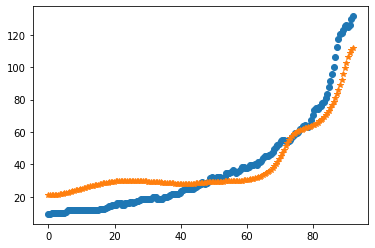

after perturb [1.6193414571382885, 134.74872368632242, 23857.44697492238, 0.7588109852765813, 28.44592456818167]
parameters [1.6193414571382885, 134.74872368632242, 23857.44697492238, 0.7588109852765813, 28.44592456818167]
oxigeno [1.57677249e-11 1.58931526e-11 1.62716805e-11 1.69100938e-11
 1.78198661e-11 1.90174106e-11 2.05244356e-11 2.23684118e-11
 2.45831589e-11 2.72095629e-11 3.02964389e-11 3.39015547e-11
 3.80928342e-11 4.29497639e-11 4.85650267e-11 5.50463975e-11
 6.25189413e-11 7.11275710e-11 8.10400345e-11 9.24504213e-11
 1.05583296e-10 1.20698580e-10 1.38097325e-10 1.58128505e-10
 1.81196995e-10 2.07772868e-10 2.38402183e-10 2.73719435e-10
 3.14461889e-10 3.61486077e-10 4.15786826e-10 4.78519299e-10
 5.51024632e-10 6.34859893e-10 7.31833166e-10 8.44044644e-10
 9.73934614e-10 1.12433922e-09 1.29855484e-09 1.50041179e-09
 1.73435826e-09 2.00555511e-09 2.31998284e-09 2.68456190e-09
 3.10728845e-09 3.59738824e-09 4.16549202e-09 4.82383705e-09
 5.58649998e-09 6.46966754e-09 7.4919

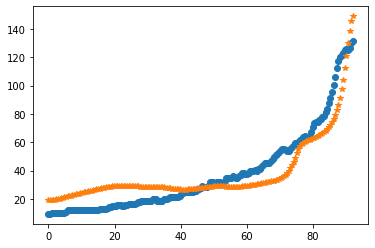

after perturb [7.609271220759097, 96.39997341009168, 15019.571431478842, 0.5460044678196694, 35.01233252371499]
parameters [7.609271220759097, 96.39997341009168, 15019.571431478842, 0.5460044678196694, 35.01233252371499]
after perturb [8.581027468543562, 172.50778121210183, 28272.902177938868, 1.3270394260571057, 47.55896433854559]
parameters [8.581027468543562, 172.50778121210183, 28272.902177938868, 1.3270394260571057, 47.55896433854559]
after perturb [6.257190829602107, 78.41446735508353, 18564.77250822201, 0.26837583475321714, 21.88308415719431]
parameters [6.257190829602107, 78.41446735508353, 18564.77250822201, 0.26837583475321714, 21.88308415719431]
after perturb [1.3790548015324404, 148.631145719983, 25495.76090971585, 0.850464950093309, 38.21391637239182]
parameters [1.3790548015324404, 148.631145719983, 25495.76090971585, 0.850464950093309, 38.21391637239182]
oxigeno [1.40618647e-11 1.41712342e-11 1.45013162e-11 1.50580710e-11
 1.58515694e-11 1.68962004e-11 1.82109677e-11 1.9

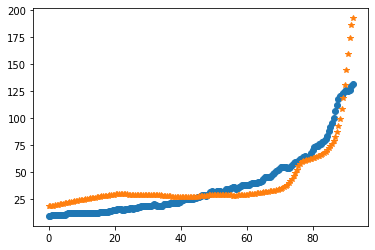

after perturb [8.76045422723414, 132.51937497271697, 25146.671728710433, 0.8260917458025242, 44.502089023899906]
parameters [8.76045422723414, 132.51937497271697, 25146.671728710433, 0.8260917458025242, 44.502089023899906]
after perturb [5.434279499185851, 117.40427124656881, 27277.16687217601, 0.45772902359222734, 21.114177965980822]
parameters [5.434279499185851, 117.40427124656881, 27277.16687217601, 0.45772902359222734, 21.114177965980822]
oxigeno [1.02964735e-09 1.03595725e-09 1.05497098e-09 1.08694205e-09
 1.13229746e-09 1.19164453e-09 1.26578057e-09 1.35570560e-09
 1.46263829e-09 1.58803529e-09 1.73361441e-09 1.90138186e-09
 2.09366410e-09 2.31314469e-09 2.56290687e-09 2.84648240e-09
 3.16790762e-09 3.53178751e-09 3.94336884e-09 4.40862362e-09
 4.93434417e-09 5.52825141e-09 6.19911801e-09 6.95690850e-09
 7.81293846e-09 8.78005538e-09 9.87284398e-09 1.11078591e-08
 1.25038899e-08 1.40822590e-08 1.58671616e-08 1.78860492e-08
 2.01700629e-08 2.27545242e-08 2.56794884e-08 2.89903700

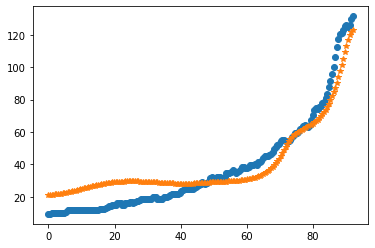

after perturb [2.5160721622456093, 126.64532799979727, 17510.726772781658, 0.45737383518881547, 17.13573499694187]
parameters [2.5160721622456093, 126.64532799979727, 17510.726772781658, 0.45737383518881547, 17.13573499694187]
after perturb [8.14193335647191, 90.58788824130512, 22734.934563581235, 0.48338645378202527, 27.89827441563733]
parameters [8.14193335647191, 90.58788824130512, 22734.934563581235, 0.48338645378202527, 27.89827441563733]
after perturb [6.911450157942824, 89.91210512982938, 25856.46114754335, 0.207980858459995, 29.74036952075348]
parameters [6.911450157942824, 89.91210512982938, 25856.46114754335, 0.207980858459995, 29.74036952075348]
oxigeno [8.02784720e-06 8.02317048e-06 8.00917685e-06 7.98597548e-06
 7.95374707e-06 7.91274201e-06 7.86327790e-06 7.80573650e-06
 7.74056012e-06 7.66824770e-06 7.58935057e-06 7.50446807e-06
 7.41424312e-06 7.31935786e-06 7.22052951e-06 7.11850654e-06
 7.01406516e-06 6.90800638e-06 6.80115361e-06 6.69435089e-06
 6.58846179e-06 6.4843

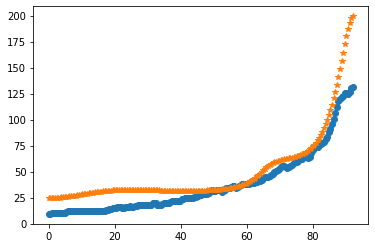

after perturb [4.756884848411042, 142.80724045236855, 14132.60714150314, 0.6861204302823787, 28.37520812642404]
parameters [4.756884848411042, 142.80724045236855, 14132.60714150314, 0.6861204302823787, 28.37520812642404]
after perturb [2.67937316735848, 122.94952418796038, 24601.62368821413, 0.7861983226370305, 39.7059580207212]
parameters [2.67937316735848, 122.94952418796038, 24601.62368821413, 0.7861983226370305, 39.7059580207212]
oxigeno [2.52340693e-12 2.54688315e-12 2.61777603e-12 2.73748975e-12
 2.90840299e-12 3.13392730e-12 3.41859042e-12 3.76814626e-12
 4.18971381e-12 4.69194802e-12 5.28524635e-12 5.98199593e-12
 6.79686689e-12 7.74715923e-12 8.85321164e-12 1.01388828e-11
 1.16321175e-11 1.33656124e-11 1.53775991e-11 1.77127655e-11
 2.04233397e-11 2.35703655e-11 2.72252038e-11 3.14712981e-11
 3.64062517e-11 4.21442692e-11 4.88190249e-11 5.65870326e-11
 6.56315994e-11 7.61674661e-11 8.84462481e-11 1.02762813e-10
 1.19462750e-10 1.38951119e-10 1.61702679e-10 1.88273839e-10
 2.19

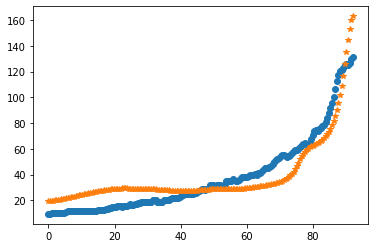

after perturb [4.802497932379081, 116.33182579196976, 26619.956699599497, 0.40746301056795875, 31.05102928434155]
parameters [4.802497932379081, 116.33182579196976, 26619.956699599497, 0.40746301056795875, 31.05102928434155]
oxigeno [3.60294864e-09 3.62026579e-09 3.67243271e-09 3.76009903e-09
 3.88435778e-09 4.04676117e-09 4.24934284e-09 4.49464705e-09
 4.78576512e-09 5.12637963e-09 5.52081710e-09 5.97410974e-09
 6.49206727e-09 7.08135981e-09 7.74961304e-09 8.50551706e-09
 9.35895061e-09 1.03211223e-08 1.14047313e-08 1.26241496e-08
 1.39956285e-08 1.55375327e-08 1.72706052e-08 1.92182669e-08
 2.14069553e-08 2.38665065e-08 2.66305872e-08 2.97371809e-08
 3.32291366e-08 3.71547855e-08 4.15686358e-08 4.65321528e-08
 5.21146345e-08 5.83941954e-08 6.54588674e-08 7.34078340e-08
 8.23528116e-08 9.24195934e-08 1.03749777e-07 1.16502690e-07
 1.30857550e-07 1.47015861e-07 1.65204107e-07 1.85676740e-07
 2.08719529e-07 2.34653292e-07 2.63838066e-07 2.96677762e-07
 3.33625361e-07 3.75188730e-07 4.21

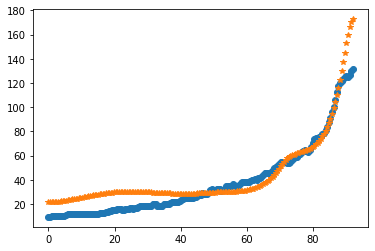

after perturb [4.302383563313567, 99.44469214015277, 19005.89168662488, 0.4230272586453556, 17.314517564548957]
parameters [4.302383563313567, 99.44469214015277, 19005.89168662488, 0.4230272586453556, 17.314517564548957]
after perturb [4.2914422711745965, 142.2699637070235, 16201.22076267198, 0.5386633214144116, 19.566175849013398]
parameters [4.2914422711745965, 142.2699637070235, 16201.22076267198, 0.5386633214144116, 19.566175849013398]
after perturb [0.5224096639748326, 135.68187726712287, 27325.66085351941, 0.40307233476332927, 9.87305745556004]
parameters [0.5224096639748326, 135.68187726712287, 27325.66085351941, 0.40307233476332927, 9.87305745556004]
after perturb [3.4237159031803825, 147.57535500708258, 29768.25836944321, 0.9399371834908126, 36.09303701155824]
parameters [3.4237159031803825, 147.57535500708258, 29768.25836944321, 0.9399371834908126, 36.09303701155824]
after perturb [4.79668045734175, 122.10787981882112, 23630.060823157437, 0.47178200991538954, 27.8213807808246

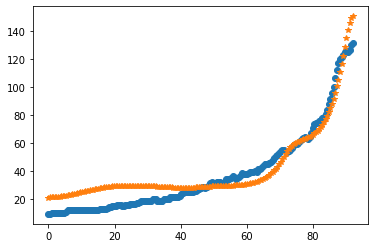

after perturb [2.6460686511527385, 135.6391242518004, 16427.865607650085, 0.24133401681226274, 5.796614735432303]
parameters [2.6460686511527385, 135.6391242518004, 16427.865607650085, 0.24133401681226274, 5.796614735432303]
after perturb [6.461283123403393, 144.61788613205925, 22950.70828298221, 0.9215615931887134, 37.19964727351389]
parameters [6.461283123403393, 144.61788613205925, 22950.70828298221, 0.9215615931887134, 37.19964727351389]
oxigeno [3.21879856e-12 3.24903771e-12 3.34033830e-12 3.49446279e-12
 3.71439246e-12 4.00439440e-12 4.37011730e-12 4.81871872e-12
 5.35902646e-12 6.00173828e-12 6.75966442e-12 7.64801902e-12
 8.68476727e-12 9.89103677e-12 1.12916031e-11 1.29154610e-11
 1.47964959e-11 1.69742711e-11 1.94949503e-11 2.24123783e-11
 2.57893453e-11 2.96990662e-11 3.42269115e-11 3.94724302e-11
 4.55517152e-11 5.26001680e-11 6.07757289e-11 7.02626513e-11
 8.12759087e-11 9.40663416e-11 1.08926664e-10 1.26198471e-10
 1.46280417e-10 1.69637747e-10 1.96813404e-10 2.28440980e-

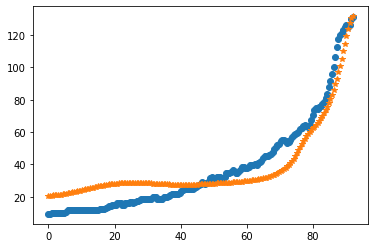

after perturb [3.403668923246774, 161.6863929311998, 25140.05518397559, 0.8477436507190313, 39.80311044211659]
parameters [3.403668923246774, 161.6863929311998, 25140.05518397559, 0.8477436507190313, 39.80311044211659]
after perturb [6.724149886594697, 104.01370174240316, 21035.103660078785, 0.2670841905178648, 26.35875584895428]
parameters [6.724149886594697, 104.01370174240316, 21035.103660078785, 0.2670841905178648, 26.35875584895428]
oxigeno [4.26095934e-07 4.26092213e-07 4.26085069e-07 4.26086569e-07
 4.26116844e-07 4.26204120e-07 4.26384767e-07 4.26703376e-07
 4.27212865e-07 4.27974624e-07 4.29058712e-07 4.30544111e-07
 4.32519062e-07 4.35081469e-07 4.38339414e-07 4.42411775e-07
 4.47428971e-07 4.53533844e-07 4.60882697e-07 4.69646499e-07
 4.80012278e-07 4.92184720e-07 5.06387984e-07 5.22867772e-07
 5.41893653e-07 5.63761682e-07 5.88797336e-07 6.17358789e-07
 6.49840567e-07 6.86677606e-07 7.28349764e-07 7.75386812e-07
 8.28373962e-07 8.87957973e-07 9.54853895e-07 1.02985250e-06
 

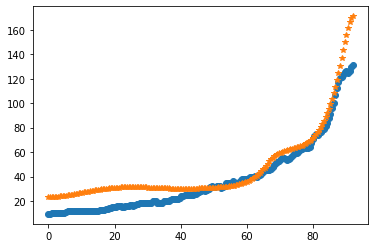

after perturb [8.77847480513278, 173.54143061671843, 30553.130370423, 1.118647006130434, 45.82790571209844]
parameters [8.77847480513278, 173.54143061671843, 30553.130370423, 1.118647006130434, 45.82790571209844]
after perturb [2.816218115695171, 139.95558483385648, 23493.092746858492, 0.6233951523907569, 31.0658901398267]
parameters [2.816218115695171, 139.95558483385648, 23493.092746858492, 0.6233951523907569, 31.0658901398267]
oxigeno [2.83568083e-10 2.85421803e-10 2.91009344e-10 3.00410333e-10
 3.13759091e-10 3.31247071e-10 3.53126309e-10 3.79713929e-10
 4.11397759e-10 4.48643140e-10 4.92001027e-10 5.42117501e-10
 5.99744856e-10 6.65754454e-10 7.41151569e-10 8.27092512e-10
 9.24904351e-10 1.03610761e-09 1.16244243e-09 1.30589859e-09
 1.46875020e-09 1.65359542e-09 1.86340230e-09 2.10156134e-09
 2.37194582e-09 2.67898106e-09 3.02772374e-09 3.42395263e-09
 3.87427250e-09 4.38623274e-09 4.96846282e-09 5.63082683e-09
 6.38459966e-09 7.24266749e-09 8.21975588e-09 9.33268880e-09
 1.060068

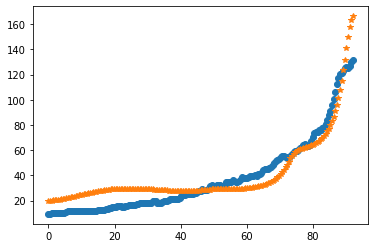

after perturb [2.549293094523425, 134.9096437869611, 26997.195193716118, 0.44813467834285414, 15.126469145654172]
parameters [2.549293094523425, 134.9096437869611, 26997.195193716118, 0.44813467834285414, 15.126469145654172]
oxigeno [6.10885833e-09 6.13991881e-09 6.23345734e-09 6.39055029e-09
 6.61300895e-09 6.90340559e-09 7.26511017e-09 7.70233793e-09
 8.22020832e-09 8.82481559e-09 9.52331209e-09 1.03240049e-08
 1.12364673e-08 1.22716663e-08 1.34421085e-08 1.47620062e-08
 1.62474667e-08 1.79167077e-08 1.97903027e-08 2.18914602e-08
 2.42463412e-08 2.68844204e-08 2.98388961e-08 3.31471547e-08
 3.68512961e-08 4.09987269e-08 4.56428300e-08 5.08437160e-08
 5.66690702e-08 6.31951011e-08 7.05076062e-08 7.87031656e-08
 8.78904794e-08 9.81918641e-08 1.09744925e-07 1.22704421e-07
 1.37244341e-07 1.53560212e-07 1.71871648e-07 1.92425176e-07
 2.15497346e-07 2.41398160e-07 2.70474844e-07 3.03116004e-07
 3.39756218e-07 3.80881106e-07 4.27032969e-07 4.78817067e-07
 5.36908638e-07 6.02060775e-07 6.75

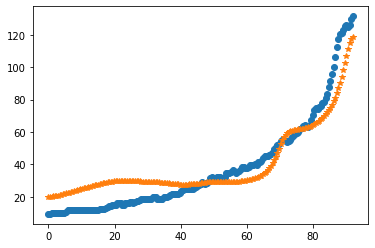

after perturb [2.31094044301652, 129.2884980530696, 28337.201376870005, 0.5652397323837609, 35.777447672218955]
parameters [2.31094044301652, 129.2884980530696, 28337.201376870005, 0.5652397323837609, 35.777447672218955]
oxigeno [3.16315020e-10 3.18359801e-10 3.24523432e-10 3.34894309e-10
 3.49621550e-10 3.68917696e-10 3.93062531e-10 4.22408054e-10
 4.57384667e-10 4.98508649e-10 5.46391030e-10 6.01747984e-10
 6.65412914e-10 7.38350443e-10 8.21672541e-10 9.16657120e-10
 1.02476945e-09 1.14768681e-09 1.28732696e-09 1.44588094e-09
 1.62585086e-09 1.83009359e-09 2.06187099e-09 2.32490779e-09
 2.62345800e-09 2.96238112e-09 3.34722934e-09 3.78434726e-09
 4.28098565e-09 4.84543135e-09 5.48715538e-09 6.21698182e-09
 7.04728048e-09 7.99218639e-09 9.06784991e-09 1.02927210e-08
 1.16878719e-08 1.32773625e-08 1.50886528e-08 1.71530667e-08
 1.95063135e-08 2.21890717e-08 2.52476426e-08 2.87346815e-08
 3.27100179e-08 3.72415751e-08 4.24064063e-08 4.82918653e-08
 5.49969335e-08 6.26337286e-08 7.132922

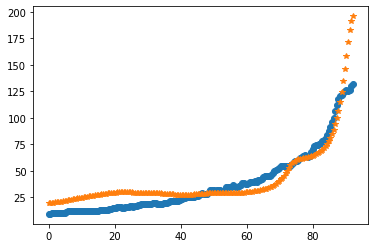

after perturb [1.1968089514670166, 108.61262250427725, 23452.445500267608, 0.3307519298079679, 7.436372632963614]
parameters [1.1968089514670166, 108.61262250427725, 23452.445500267608, 0.3307519298079679, 7.436372632963614]
after perturb [1.3951136965306938, 107.13261686611558, 20461.671361351953, 0.4341564039928989, 11.670183996517009]
parameters [1.3951136965306938, 107.13261686611558, 20461.671361351953, 0.4341564039928989, 11.670183996517009]
oxigeno [6.12890237e-10 6.15974858e-10 6.25278784e-10 6.40952838e-10
 6.63250508e-10 6.92531246e-10 7.29265324e-10 7.74040447e-10
 8.27570385e-10 8.90705848e-10 9.64447853e-10 1.04996375e-09
 1.14860605e-09 1.26193414e-09 1.39173906e-09 1.54007156e-09
 1.70927381e-09 1.90201553e-09 2.12133572e-09 2.37069113e-09
 2.65401355e-09 2.97577751e-09 3.34108036e-09 3.75573626e-09
 4.22638508e-09 4.76061707e-09 5.36711343e-09 6.05580327e-09
 6.83803770e-09 7.72678317e-09 8.73683764e-09 9.88507520e-09
 1.11907269e-08 1.26757068e-08 1.43649931e-08 1.6287

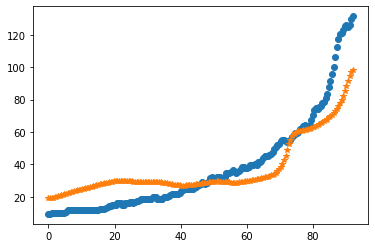

after perturb [3.3646733174426067, 130.74665236958617, 23661.507022024947, 0.4032786595572899, 34.85928630867167]
parameters [3.3646733174426067, 130.74665236958617, 23661.507022024947, 0.4032786595572899, 34.85928630867167]
oxigeno [1.31048184e-08 1.31638465e-08 1.33415619e-08 1.36398658e-08
 1.40619553e-08 1.46123654e-08 1.52970284e-08 1.61233522e-08
 1.71003155e-08 1.82385842e-08 1.95506469e-08 2.10509740e-08
 2.27561998e-08 2.46853316e-08 2.68599877e-08 2.93046674e-08
 3.20470580e-08 3.51183809e-08 3.85537845e-08 4.23927869e-08
 4.66797760e-08 5.14645741e-08 5.68030732e-08 6.27579506e-08
 6.93994740e-08 7.68064048e-08 8.50670119e-08 9.42802074e-08
 1.04556817e-07 1.16020999e-07 1.28811830e-07 1.43085067e-07
 1.59015112e-07 1.76797196e-07 1.96649796e-07 2.18817321e-07
 2.43573076e-07 2.71222543e-07 3.02106995e-07 3.36607490e-07
 3.75149264e-07 4.18206570e-07 4.66308019e-07 5.20042456e-07
 5.80065449e-07 6.47106466e-07 7.21976806e-07 8.05578400e-07
 8.98913585e-07 1.00309597e-06 1.11

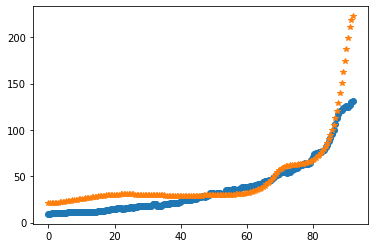

after perturb [4.188898765981401, 102.43251647096136, 21148.250258281812, 0.43093653957117617, 17.788315815797944]
parameters [4.188898765981401, 102.43251647096136, 21148.250258281812, 0.43093653957117617, 17.788315815797944]
oxigeno [4.75305290e-10 4.77567230e-10 4.84389483e-10 4.95881956e-10
 5.12229840e-10 5.33696671e-10 5.60628688e-10 5.93460570e-10
 6.32722661e-10 6.79049800e-10 7.33191927e-10 7.96026652e-10
 8.68574021e-10 9.52013739e-10 1.04770518e-09 1.15721051e-09
 1.28232145e-09 1.42509001e-09 1.58786394e-09 1.77332739e-09
 1.98454764e-09 2.22502875e-09 2.49877295e-09 2.81035114e-09
 3.16498356e-09 3.56863210e-09 4.02810597e-09 4.55118241e-09
 5.14674470e-09 5.82493954e-09 6.59735675e-09 7.47723386e-09
 8.47968928e-09 9.62198745e-09 1.09238403e-08 1.24077495e-08
 1.40993953e-08 1.60280767e-08 1.82272110e-08 2.07348988e-08
 2.35945644e-08 2.68556790e-08 3.05745802e-08 3.48153976e-08
 3.96511005e-08 4.51646816e-08 5.14504979e-08 5.86157858e-08
 6.67823776e-08 7.60886436e-08 8.

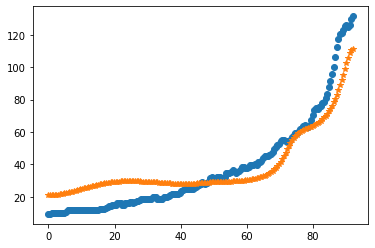

after perturb [3.7223899007987145, 166.6720563896913, 24158.13278132935, 0.7673040009959565, 28.415083947029718]
parameters [3.7223899007987145, 166.6720563896913, 24158.13278132935, 0.7673040009959565, 28.415083947029718]
after perturb [3.467873728214934, 130.21957707532968, 18929.208760537356, 0.5276252616761159, 23.325256966455438]
parameters [3.467873728214934, 130.21957707532968, 18929.208760537356, 0.5276252616761159, 23.325256966455438]
after perturb [3.185568608899554, 95.81104106231774, 19874.292416859837, 0.29542961464010964, 14.973507542311802]
parameters [3.185568608899554, 95.81104106231774, 19874.292416859837, 0.29542961464010964, 14.973507542311802]
after perturb [6.834577216075857, 126.11651530985517, 20062.30284929062, 0.7654818829834569, 37.40782627301964]
parameters [6.834577216075857, 126.11651530985517, 20062.30284929062, 0.7654818829834569, 37.40782627301964]
oxigeno [5.23071054e-12 5.27937767e-12 5.42630425e-12 5.67428606e-12
 6.02805075e-12 6.49436136e-12 7.0821

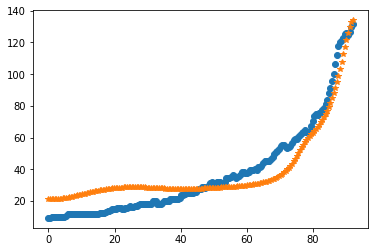

after perturb [2.015448444426317, 98.08149165166431, 28068.457277851434, 0.2677434913181601, 18.05091963244519]
parameters [2.015448444426317, 98.08149165166431, 28068.457277851434, 0.2677434913181601, 18.05091963244519]
oxigeno [3.85378763e-07 3.85181284e-07 3.84593880e-07 3.83631541e-07
 3.82318896e-07 3.80689709e-07 3.78786247e-07 3.76658567e-07
 3.74363783e-07 3.71965362e-07 3.69532501e-07 3.67139621e-07
 3.64866002e-07 3.62795579e-07 3.61016918e-07 3.59623373e-07
 3.58713442e-07 3.58391308e-07 3.58767594e-07 3.59960309e-07
 3.62095985e-07 3.65311014e-07 3.69753154e-07 3.75583219e-07
 3.82976932e-07 3.92126955e-07 4.03245104e-07 4.16564773e-07
 4.32343589e-07 4.50866355e-07 4.72448318e-07 4.97438826e-07
 5.26225422e-07 5.59238438e-07 5.96956133e-07 6.39910424e-07
 6.88693227e-07 7.43963439e-07 8.06454561e-07 8.76982973e-07
 9.56456868e-07 1.04588586e-06 1.14639130e-06 1.25921745e-06
 1.38574349e-06 1.52749672e-06 1.68616707e-06 1.86362321e-06
 2.06193065e-06 2.28337211e-06 2.530470

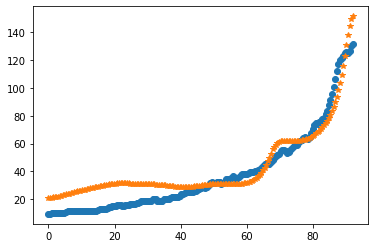

after perturb [3.4870752838891255, 82.23516998618643, 15728.110824323427, 0.06490663094690075, 8.325347559114956]
parameters [3.4870752838891255, 82.23516998618643, 15728.110824323427, 0.06490663094690075, 8.325347559114956]
after perturb [9.281629082586493, 84.8925587546734, 18927.357284600064, 0.22318128689196248, 30.24124444429671]
parameters [9.281629082586493, 84.8925587546734, 18927.357284600064, 0.22318128689196248, 30.24124444429671]
after perturb [5.2039252611043, 145.2050339308126, 19227.481983359103, 0.4838657145730767, 31.576061782299384]
parameters [5.2039252611043, 145.2050339308126, 19227.481983359103, 0.4838657145730767, 31.576061782299384]
after perturb [6.303571505393426, 104.50915854323009, 25579.15906245178, 0.39293821174665866, 25.261312343004857]
parameters [6.303571505393426, 104.50915854323009, 25579.15906245178, 0.39293821174665866, 25.261312343004857]
oxigeno [2.11251883e-09 2.11999049e-09 2.14251895e-09 2.18044623e-09
 2.23434778e-09 2.30504064e-09 2.39359511

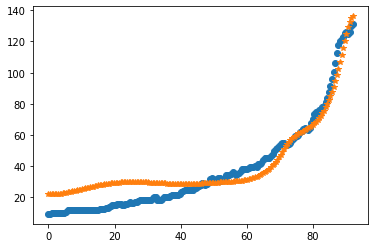

after perturb [5.7364537946600365, 65.22947890802435, 26817.898441085606, 0.3204632996415959, 23.842870450103582]
parameters [5.7364537946600365, 65.22947890802435, 26817.898441085606, 0.3204632996415959, 23.842870450103582]
oxigeno [3.21362184e-08 3.21014894e-08 3.19976084e-08 3.18254886e-08
 3.15866333e-08 3.12831096e-08 3.09175121e-08 3.04929183e-08
 3.00128380e-08 2.94811564e-08 2.89020751e-08 2.82800505e-08
 2.76197325e-08 2.69259051e-08 2.62034292e-08 2.54571904e-08
 2.46920517e-08 2.39128120e-08 2.31241713e-08 2.23307029e-08
 2.15368326e-08 2.07468252e-08 1.99647780e-08 1.91946217e-08
 1.84401278e-08 1.77049232e-08 1.69925119e-08 1.63063023e-08
 1.56496428e-08 1.50258637e-08 1.44383259e-08 1.38904788e-08
 1.33859252e-08 1.29284963e-08 1.25223367e-08 1.21720001e-08
 1.18825589e-08 1.16597274e-08 1.15100017e-08 1.14408189e-08
 1.14607366e-08 1.15796385e-08 1.18089673e-08 1.21619901e-08
 1.26541014e-08 1.33031690e-08 1.41299289e-08 1.51584372e-08
 1.64165868e-08 1.79366993e-08 1.97

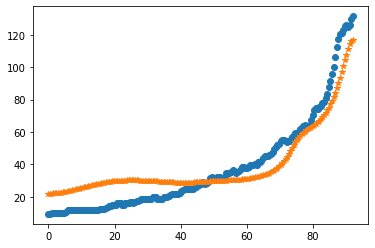

after perturb [5.598891474163962, 102.58159750332518, 23831.151159434154, 0.4198284931134726, 27.510116537711788]
parameters [5.598891474163962, 102.58159750332518, 23831.151159434154, 0.4198284931134726, 27.510116537711788]
oxigeno [7.56029488e-10 7.59193207e-10 7.68734747e-10 7.84806048e-10
 8.07662975e-10 8.37669317e-10 8.75302484e-10 9.21161021e-10
 9.75974054e-10 1.04061286e-09 1.11610474e-09 1.20364952e-09
 1.30463884e-09 1.42067873e-09 1.55361577e-09 1.70556730e-09
 1.87895629e-09 2.07655139e-09 2.30151293e-09 2.55744558e-09
 2.84845874e-09 3.17923552e-09 3.55511158e-09 3.98216522e-09
 4.46732015e-09 5.01846273e-09 5.64457555e-09 6.35588966e-09
 7.16405788e-09 8.08235194e-09 9.12588666e-09 1.03118748e-08
 1.16599161e-08 1.31923262e-08 1.49345084e-08 1.69153762e-08
 1.91678315e-08 2.17293061e-08 2.46423744e-08 2.79554466e-08
 3.17235524e-08 3.60092270e-08 4.08835120e-08 4.64270855e-08
 5.27315398e-08 5.99008227e-08 6.80528655e-08 7.73214204e-08
 8.78581348e-08 9.98348919e-08 1.13

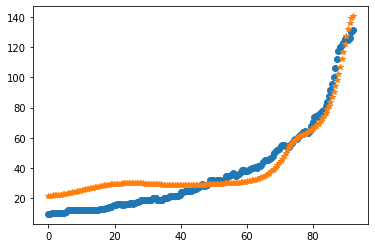

after perturb [6.583649654772248, 108.1635670983562, 21924.092352738076, 0.29485609451656164, 24.442864251640398]
parameters [6.583649654772248, 108.1635670983562, 21924.092352738076, 0.29485609451656164, 24.442864251640398]
oxigeno [1.22881954e-07 1.22976672e-07 1.23262817e-07 1.23746370e-07
 1.24437349e-07 1.25349868e-07 1.26502244e-07 1.27917120e-07
 1.29621632e-07 1.31647616e-07 1.34031852e-07 1.36816364e-07
 1.40048766e-07 1.43782682e-07 1.48078215e-07 1.53002508e-07
 1.58630379e-07 1.65045053e-07 1.72338988e-07 1.80614829e-07
 1.89986467e-07 2.00580253e-07 2.12536354e-07 2.26010276e-07
 2.41174574e-07 2.58220762e-07 2.77361448e-07 2.98832711e-07
 3.22896747e-07 3.49844819e-07 3.80000521e-07 4.13723412e-07
 4.51413034e-07 4.93513373e-07 5.40517784e-07 5.92974451e-07
 6.51492408e-07 7.16748203e-07 7.89493242e-07 8.70561908e-07
 9.60880506e-07 1.06147713e-06 1.17349255e-06 1.29819220e-06
 1.43697941e-06 1.59140995e-06 1.76320810e-06 1.95428432e-06
 2.16675476e-06 2.40296268e-06 2.66

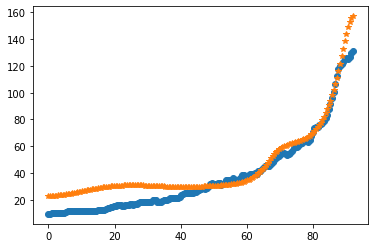

after perturb [3.5317590410712523, 113.80236329700993, 28331.6913824729, 0.3101484828784444, 24.773369289643462]
parameters [3.5317590410712523, 113.80236329700993, 28331.6913824729, 0.3101484828784444, 24.773369289643462]
oxigeno [8.41700218e-08 8.42926783e-08 8.46625801e-08 8.52855372e-08
 8.61712762e-08 8.73335070e-08 8.87900190e-08 9.05628104e-08
 9.26782536e-08 9.51673026e-08 9.80657453e-08 1.01414508e-07
 1.05260019e-07 1.09654632e-07 1.14657131e-07 1.20333302e-07
 1.26756601e-07 1.34008920e-07 1.42181457e-07 1.51375702e-07
 1.61704563e-07 1.73293626e-07 1.86282582e-07 2.00826823e-07
 2.17099239e-07 2.35292216e-07 2.55619884e-07 2.78320603e-07
 3.03659749e-07 3.31932798e-07 3.63468751e-07 3.98633933e-07
 4.37836192e-07 4.81529538e-07 5.30219264e-07 5.84467583e-07
 6.44899830e-07 7.12211280e-07 7.87174626e-07 8.70648185e-07
 9.63584887e-07 1.06704214e-06 1.18219261e-06 1.31033614e-06
 1.45291268e-06 1.61151669e-06 1.78791286e-06 1.98405353e-06
 2.20209793e-06 2.44443341e-06 2.7136

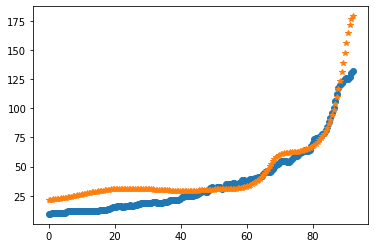

after perturb [5.717837233315288, 104.42603252074716, 23224.256320547094, 0.7314530754928388, 39.67970237250032]
parameters [5.717837233315288, 104.42603252074716, 23224.256320547094, 0.7314530754928388, 39.67970237250032]
oxigeno [5.47224915e-13 5.53229615e-13 5.71378044e-13 6.02076615e-13
 6.46014198e-13 7.04179735e-13 7.77887540e-13 8.68811009e-13
 9.79025617e-13 1.11106240e-12 1.26797336e-12 1.45341059e-12
 1.67172128e-12 1.92806123e-12 2.22852997e-12 2.58033123e-12
 2.99196326e-12 3.47344416e-12 4.03657861e-12 4.69527336e-12
 5.46591028e-12 6.36778740e-12 7.42364015e-12 8.66025745e-12
 1.01092096e-11 1.18077084e-11 1.37996231e-11 1.61366800e-11
 1.88798795e-11 2.21011683e-11 2.58854128e-11 3.03327273e-11
 3.55612192e-11 4.17102253e-11 4.89441249e-11 5.74568306e-11
 6.74770752e-11 7.92746331e-11 9.31676375e-11 1.09531183e-10
 1.28807436e-10 1.51517508e-10 1.78275402e-10 2.09804382e-10
 2.46956174e-10 2.90733497e-10 3.42316477e-10 4.03093620e-10
 4.74698100e-10 5.59050281e-10 6.5840

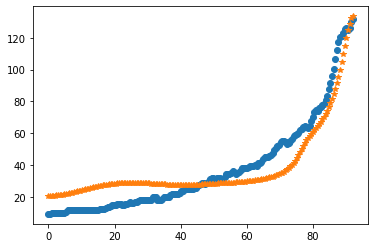

after perturb [7.746373856024144, 147.3154323895645, 29715.20515383816, 0.8570643750473601, 44.59028561523226]
parameters [7.746373856024144, 147.3154323895645, 29715.20515383816, 0.8570643750473601, 44.59028561523226]
after perturb [7.422885361682483, 189.8834702516519, 30063.095825708377, 1.3489614863666028, 46.15023909916391]
parameters [7.422885361682483, 189.8834702516519, 30063.095825708377, 1.3489614863666028, 46.15023909916391]
after perturb [4.94133420994491, 64.93445995791603, 17161.402276879657, -0.13131450103854603, 12.426702822141367]
parameters [4.94133420994491, 64.93445995791603, 17161.402276879657, -0.13131450103854603, 12.426702822141367]
after perturb [3.2123035940710283, 154.91752966910974, 25771.392577505867, 0.607105893735525, 29.481429621534545]
parameters [3.2123035940710283, 154.91752966910974, 25771.392577505867, 0.607105893735525, 29.481429621534545]
after perturb [4.677609422668156, 132.87382264527304, 19473.55417150032, 0.4784231119012593, 27.16992325300408

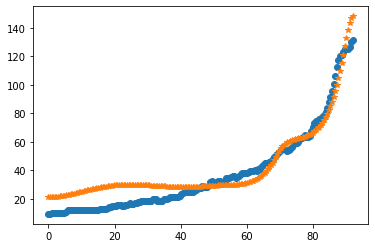

after perturb [2.682657658390794, 140.38685471049513, 18071.741362288194, 0.6668059880317144, 28.59636170190829]
parameters [2.682657658390794, 140.38685471049513, 18071.741362288194, 0.6668059880317144, 28.59636170190829]
after perturb [8.613433582164333, 98.79572591683204, 30602.69374771192, 0.6118216896543236, 41.27932402366644]
parameters [8.613433582164333, 98.79572591683204, 30602.69374771192, 0.6118216896543236, 41.27932402366644]
after perturb [4.660349468707265, 131.6357473552349, 21645.556689102188, 0.679897006061883, 24.76374827157309]
parameters [4.660349468707265, 131.6357473552349, 21645.556689102188, 0.679897006061883, 24.76374827157309]
oxigeno [4.48584968e-11 4.52101414e-11 4.62708148e-11 4.80578500e-11
 5.06005162e-11 5.39405992e-11 5.81332278e-11 6.32479642e-11
 6.93701770e-11 7.66027263e-11 8.50679919e-11 9.49102846e-11
 1.06298691e-10 1.19430408e-10 1.34534631e-10 1.51877088e-10
 1.71765294e-10 1.94554655e-10 2.20655536e-10 2.50541443e-10
 2.84758493e-10 3.23936370

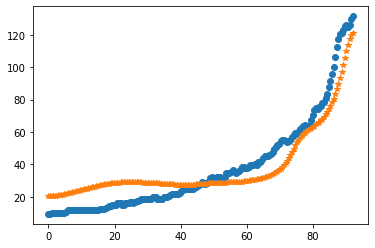

after perturb [5.522019347323002, 47.0037389481344, 23836.42637857126, -0.25621990834377983, 12.713752247170161]
parameters [5.522019347323002, 47.0037389481344, 23836.42637857126, -0.25621990834377983, 12.713752247170161]
after perturb [5.123045316849356, 114.68721976240765, 26382.86432849131, 0.5754903135322769, 36.71495599933236]
parameters [5.123045316849356, 114.68721976240765, 26382.86432849131, 0.5754903135322769, 36.71495599933236]
oxigeno [5.31501504e-11 5.35678826e-11 5.48278994e-11 5.69507946e-11
 5.99713373e-11 6.39391504e-11 6.89196781e-11 7.49954622e-11
 8.22677502e-11 9.08584688e-11 1.00912599e-10 1.12601002e-10
 1.26123751e-10 1.41714035e-10 1.59642714e-10 1.80223620e-10
 2.03819706e-10 2.30850178e-10 2.61798738e-10 2.97223134e-10
 3.37766186e-10 3.84168531e-10 4.37283334e-10 4.98093281e-10
 5.67730176e-10 6.47497556e-10 7.38896763e-10 8.43656998e-10
 9.63769935e-10 1.10152959e-09 1.25957820e-09 1.44095898e-09
 1.64917677e-09 1.88826774e-09 2.16287937e-09 2.47836222e-09

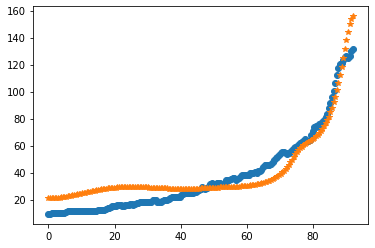

after perturb [1.4618332216594665, 129.95627487301883, 16989.154931252302, 0.27225861495362624, 12.37311999817105]
parameters [1.4618332216594665, 129.95627487301883, 16989.154931252302, 0.27225861495362624, 12.37311999817105]
after perturb [3.3090540025727906, 141.3264116190784, 24019.35363337539, 0.9934752834843594, 49.71608093382653]
parameters [3.3090540025727906, 141.3264116190784, 24019.35363337539, 0.9934752834843594, 49.71608093382653]
oxigeno [7.60005673e-13 7.67516768e-13 7.90206235e-13 8.28546607e-13
 8.83338829e-13 9.55732661e-13 1.04725591e-12 1.15985321e-12
 1.29593516e-12 1.45843929e-12 1.65090396e-12 1.87755750e-12
 2.14342453e-12 2.45445240e-12 2.81766110e-12 3.24132051e-12
 3.73516003e-12 4.31061606e-12 4.98112433e-12 5.76246512e-12
 6.67317093e-12 7.73500793e-12 8.97354469e-12 1.04188238e-11
 1.21061551e-11 1.40770526e-11 1.63803397e-11 1.90734553e-11
 2.22239929e-11 2.59115170e-11 3.02297037e-11 3.52888630e-11
 4.12189078e-11 4.81728477e-11 5.63308961e-11 6.59052939

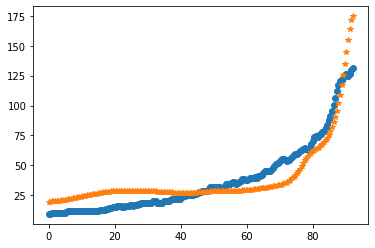

after perturb [2.5322505041696024, 121.95873485211588, 24660.80643586624, 0.5730092534855304, 33.88934511687882]
parameters [2.5322505041696024, 121.95873485211588, 24660.80643586624, 0.5730092534855304, 33.88934511687882]
oxigeno [1.28862765e-10 1.29770719e-10 1.32508515e-10 1.37118225e-10
 1.43670877e-10 1.52267832e-10 1.63042733e-10 1.76164045e-10
 1.91838239e-10 2.10313645e-10 2.31885050e-10 2.56899108e-10
 2.85760659e-10 3.18940078e-10 3.56981790e-10 4.00514120e-10
 4.50260685e-10 5.07053569e-10 5.71848546e-10 6.45742696e-10
 7.29994773e-10 8.26048748e-10 9.35561027e-10 1.06043187e-09
 1.20284162e-09 1.36529250e-09 1.55065663e-09 1.76223131e-09
 2.00380253e-09 2.27971780e-09 2.59496975e-09 2.95529205e-09
 3.36726921e-09 3.83846235e-09 4.37755314e-09 4.99450809e-09
 5.70076607e-09 6.50945161e-09 7.43561734e-09 8.49651884e-09
 9.71192560e-09 1.11044726e-08 1.27000574e-08 1.45282879e-08
 1.66229892e-08 1.90227760e-08 2.17717012e-08 2.49199928e-08
 2.85248920e-08 3.26516091e-08 3.7374

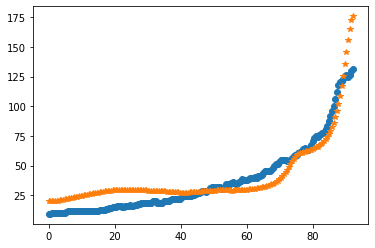

after perturb [7.388271086449845, 111.31637495804316, 17094.19098412095, 0.596535671664852, 37.25450974707172]
parameters [7.388271086449845, 111.31637495804316, 17094.19098412095, 0.596535671664852, 37.25450974707172]
after perturb [5.966474364887343, 115.26191333581853, 24566.061640491174, 0.5518777060560921, 23.235734123947786]
parameters [5.966474364887343, 115.26191333581853, 24566.061640491174, 0.5518777060560921, 23.235734123947786]
oxigeno [9.40790256e-11 9.48008353e-11 9.69777098e-11 1.00644200e-10
 1.05858606e-10 1.12704073e-10 1.21290137e-10 1.31754784e-10
 1.44267027e-10 1.59030071e-10 1.76285126e-10 1.96315927e-10
 2.19454068e-10 2.46085233e-10 2.76656467e-10 3.11684603e-10
 3.51766039e-10 3.97588023e-10 4.49941704e-10 5.09737163e-10
 5.78020761e-10 6.55995101e-10 7.45042023e-10 8.46749061e-10
 9.62939881e-10 1.09570927e-09 1.24746336e-09 1.42096585e-09
 1.61939106e-09 1.84638484e-09 2.10613449e-09 2.40344891e-09
 2.74385041e-09 3.13368003e-09 3.58021802e-09 4.09182173e-09

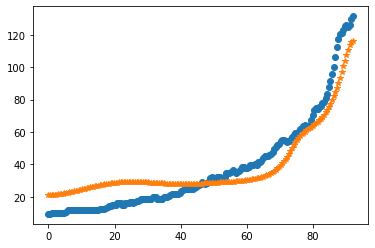

after perturb [1.8582219917820906, 161.25512834278814, 28109.834049843852, 0.9378854465873379, 34.66598486831127]
parameters [1.8582219917820906, 161.25512834278814, 28109.834049843852, 0.9378854465873379, 34.66598486831127]
after perturb [6.263150000806256, 142.30465241920976, 27261.349041660807, 0.6493344937544104, 42.24755088681182]
parameters [6.263150000806256, 142.30465241920976, 27261.349041660807, 0.6493344937544104, 42.24755088681182]
oxigeno [2.03450580e-10 2.04855657e-10 2.09091000e-10 2.16217295e-10
 2.26336849e-10 2.39595357e-10 2.56184424e-10 2.76344873e-10
 3.00370910e-10 3.28615208e-10 3.61495010e-10 3.99499342e-10
 4.43197487e-10 4.93248843e-10 5.50414368e-10 6.15569790e-10
 6.89720840e-10 7.74020770e-10 8.69790467e-10 9.78541536e-10
 1.10200275e-09 1.24215035e-09 1.40124274e-09 1.58186013e-09
 1.78694997e-09 2.01987879e-09 2.28449146e-09 2.58517892e-09
 2.92695541e-09 3.31554662e-09 3.75749028e-09 4.26025073e-09
 4.83234949e-09 5.48351395e-09 6.22484658e-09 7.06901743

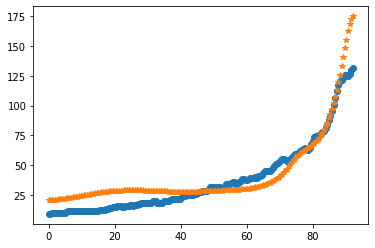

after perturb [2.7620856867877603, 117.26854051768125, 22052.080367156967, 0.20356975807651584, 20.60225149996692]
parameters [2.7620856867877603, 117.26854051768125, 22052.080367156967, 0.20356975807651584, 20.60225149996692]
oxigeno [1.03972359e-05 1.03963591e-05 1.03938094e-05 1.03898291e-05
 1.03848186e-05 1.03793325e-05 1.03740740e-05 1.03698882e-05
 1.03677555e-05 1.03687847e-05 1.03742060e-05 1.03853662e-05
 1.04037239e-05 1.04308475e-05 1.04684136e-05 1.05182092e-05
 1.05821347e-05 1.06622099e-05 1.07605821e-05 1.08795363e-05
 1.10215078e-05 1.11890968e-05 1.13850851e-05 1.16124549e-05
 1.18744089e-05 1.21743936e-05 1.25161234e-05 1.29036068e-05
 1.33411761e-05 1.38335176e-05 1.43857053e-05 1.50032375e-05
 1.56920752e-05 1.64586847e-05 1.73100822e-05 1.82538822e-05
 1.92983494e-05 2.04524531e-05 2.17259254e-05 2.31293223e-05
 2.46740892e-05 2.63726284e-05 2.82383723e-05 3.02858601e-05
 3.25308198e-05 3.49902573e-05 3.76825522e-05 4.06275630e-05
 4.38467428e-05 4.73632669e-05 5.

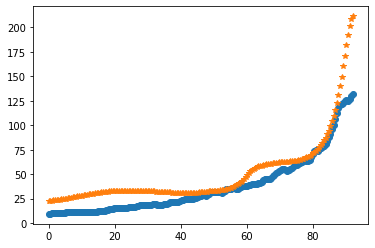

after perturb [3.391351527283266, 94.33437336783442, 22837.450506300345, 0.031031891529377242, 10.888837111138134]
parameters [3.391351527283266, 94.33437336783442, 22837.450506300345, 0.031031891529377242, 10.888837111138134]
oxigeno [ 0.30416831  0.30410728  0.3039246   0.30362149  0.30319997  0.30266279
  0.30201345  0.30125606  0.30039535  0.29943657  0.2983854   0.29724793
  0.29603053  0.29473983  0.29338265  0.29196594  0.29049674  0.28898214
  0.28742925  0.28584519  0.28423704  0.28261189  0.28097676  0.27933865
  0.27770451  0.27608126  0.27447576  0.27289486  0.27134535  0.26983396
  0.26836742  0.26695236  0.26559539  0.26430306  0.26308183  0.26193811
  0.26087823  0.25990842  0.25903484  0.25826355  0.25760052  0.25705162
  0.25662265  0.2563193   0.25614723  0.25611203  0.25621926  0.25647451
  0.25688339  0.25745157  0.25818487  0.25908923  0.26017082  0.26143605
  0.26289162  0.26454458  0.26640233  0.26847272  0.270764    0.27328491
  0.27604466  0.27905299  0.2823201

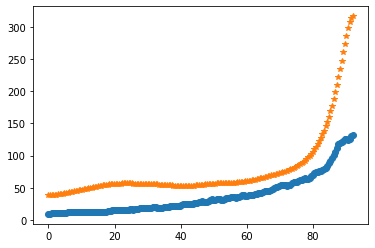

after perturb [6.532030560608247, 136.11580412922916, 30596.90774217083, 0.9565114351371857, 48.886056082680824]
parameters [6.532030560608247, 136.11580412922916, 30596.90774217083, 0.9565114351371857, 48.886056082680824]
after perturb [5.120843159142732, 152.4813442193955, 36428.88124740985, 1.0010809188989012, 32.61576549691001]
parameters [5.120843159142732, 152.4813442193955, 36428.88124740985, 1.0010809188989012, 32.61576549691001]
after perturb [8.413527345077721, 82.95640907788908, 17488.88444615391, 0.31492950297909117, 32.24898167635565]
parameters [8.413527345077721, 82.95640907788908, 17488.88444615391, 0.31492950297909117, 32.24898167635565]
after perturb [6.842368787781809, 120.21447981416098, 26731.58242283993, 0.3757519137069937, 33.551555972999914]
parameters [6.842368787781809, 120.21447981416098, 26731.58242283993, 0.3757519137069937, 33.551555972999914]
oxigeno [1.20046126e-08 1.20548360e-08 1.22060702e-08 1.24600143e-08
 1.28195239e-08 1.32886473e-08 1.38726771e-08

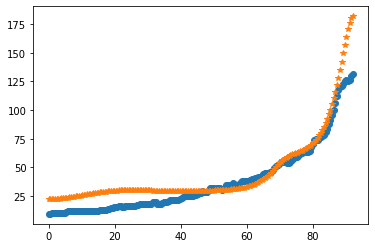

after perturb [2.104988128568328, 92.72018249236044, 23823.97251237149, 0.2810654387757397, 24.22247691763795]
parameters [2.104988128568328, 92.72018249236044, 23823.97251237149, 0.2810654387757397, 24.22247691763795]
oxigeno [2.38069561e-07 2.37897136e-07 2.37382972e-07 2.36536324e-07
 2.35372363e-07 2.33911820e-07 2.32180524e-07 2.30208884e-07
 2.28031338e-07 2.25685812e-07 2.23213222e-07 2.20657045e-07
 2.18062977e-07 2.15478694e-07 2.12953723e-07 2.10539437e-07
 2.08289158e-07 2.06258399e-07 2.04505204e-07 2.03090620e-07
 2.02079268e-07 2.01540016e-07 2.01546758e-07 2.02179267e-07
 2.03524157e-07 2.05675919e-07 2.08738070e-07 2.12824415e-07
 2.18060437e-07 2.24584852e-07 2.32551348e-07 2.42130540e-07
 2.53512169e-07 2.66907584e-07 2.82552521e-07 3.00710216e-07
 3.21674867e-07 3.45775470e-07 3.73380036e-07 4.04900220e-07
 4.40796360e-07 4.81582977e-07 5.27834751e-07 5.80193033e-07
 6.39372972e-07 7.06171347e-07 7.81475238e-07 8.66271678e-07
 9.61658478e-07 1.06885642e-06 1.18922302

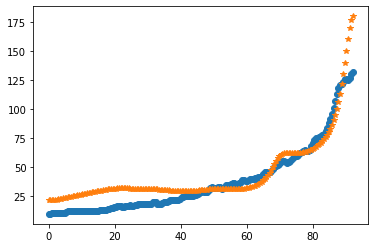

after perturb [-0.2722809494728833, 166.60617719086497, 28225.49838510993, 0.8992361017122674, 30.647302391231285]
parameters [-0.2722809494728833, 166.60617719086497, 28225.49838510993, 0.8992361017122674, 30.647302391231285]
after perturb [-0.6378831986934523, 146.42388762165496, 30814.191672859135, 0.5774411353874906, 23.966871818635024]
parameters [-0.6378831986934523, 146.42388762165496, 30814.191672859135, 0.5774411353874906, 23.966871818635024]
after perturb [8.144603033490105, 76.54230770840866, 19067.577109952963, -0.005394106671552323, 20.793318240906427]
parameters [8.144603033490105, 76.54230770840866, 19067.577109952963, -0.005394106671552323, 20.793318240906427]
after perturb [5.673805990718548, 108.54734847898123, 20654.052804858584, 0.5239642663830282, 26.4543886209501]
parameters [5.673805990718548, 108.54734847898123, 20654.052804858584, 0.5239642663830282, 26.4543886209501]
oxigeno [8.06596647e-11 8.12768055e-11 8.31382350e-11 8.62741653e-11
 9.07355868e-11 9.6595236

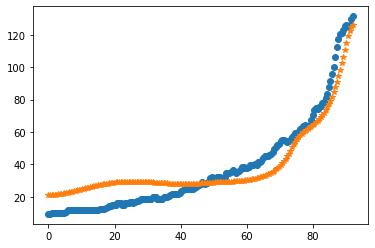

after perturb [9.888759320684278, 123.42998133596502, 23205.50242983215, 0.9643012166575354, 42.11120477084752]
parameters [9.888759320684278, 123.42998133596502, 23205.50242983215, 0.9643012166575354, 42.11120477084752]
after perturb [5.890306046299996, 117.83295489812456, 23741.20338422237, 0.3467865528735772, 25.745841445701018]
parameters [5.890306046299996, 117.83295489812456, 23741.20338422237, 0.3467865528735772, 25.745841445701018]
oxigeno [2.52483076e-08 2.53310719e-08 2.55803142e-08 2.59988941e-08
 2.65916148e-08 2.73652792e-08 2.83287701e-08 2.94931537e-08
 3.08718108e-08 3.24805940e-08 3.43380158e-08 3.64654678e-08
 3.88874754e-08 4.16319908e-08 4.47307274e-08 4.82195411e-08
 5.21388619e-08 5.65341829e-08 6.14566110e-08 6.69634879e-08
 7.31190875e-08 7.99953998e-08 8.76730095e-08 9.62420803e-08
 1.05803457e-07 1.16469896e-07 1.28367444e-07 1.41636973e-07
 1.56435891e-07 1.72940057e-07 1.91345902e-07 2.11872792e-07
 2.34765665e-07 2.60297942e-07 2.88774775e-07 3.20536641e-07

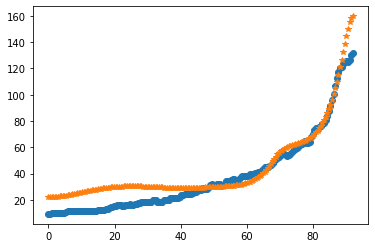

after perturb [5.957286981510122, 166.1226051510685, 33514.3822505878, 1.3064087353459948, 48.77388497160207]
parameters [5.957286981510122, 166.1226051510685, 33514.3822505878, 1.3064087353459948, 48.77388497160207]
after perturb [4.486194725032187, 110.10882657221876, 18561.627520656803, 0.8344465618405303, 37.45074345862687]
parameters [4.486194725032187, 110.10882657221876, 18561.627520656803, 0.8344465618405303, 37.45074345862687]
after perturb [8.353408653217146, 163.57067077943066, 27811.677169992952, 1.2780857688018585, 59.845842389871166]
parameters [8.353408653217146, 163.57067077943066, 27811.677169992952, 1.2780857688018585, 59.845842389871166]
after perturb [3.6721125851404968, 127.75068182459269, 22178.2199228082, 0.45609743727487395, 22.111578272906915]
parameters [3.6721125851404968, 127.75068182459269, 22178.2199228082, 0.45609743727487395, 22.111578272906915]
oxigeno [2.90630878e-09 2.92236110e-09 2.97071210e-09 3.05194686e-09
 3.16705044e-09 3.31742280e-09 3.50490008

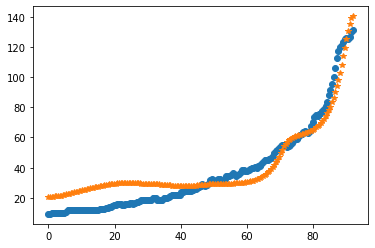

after perturb [8.188400940719918, 99.42840259565506, 24452.711681500816, 0.5487136126293909, 30.74041231478276]
parameters [8.188400940719918, 99.42840259565506, 24452.711681500816, 0.5487136126293909, 30.74041231478276]
after perturb [4.665528766390415, 100.52961346870104, 27280.291163477577, 0.3253365435473745, 30.20597398808764]
parameters [4.665528766390415, 100.52961346870104, 27280.291163477577, 0.3253365435473745, 30.20597398808764]
oxigeno [3.19060320e-08 3.19158722e-08 3.19459487e-08 3.19979324e-08
 3.20746146e-08 3.21799190e-08 3.23189185e-08 3.24978594e-08
 3.27241943e-08 3.30066250e-08 3.33551581e-08 3.37811748e-08
 3.42975186e-08 3.49186014e-08 3.56605321e-08 3.65412709e-08
 3.75808108e-08 3.88013908e-08 4.02277442e-08 4.18873850e-08
 4.38109375e-08 4.60325141e-08 4.85901446e-08 5.15262657e-08
 5.48882741e-08 5.87291535e-08 6.31081802e-08 6.80917200e-08
 7.37541227e-08 8.01787279e-08 8.74589928e-08 9.56997563e-08
 1.05018653e-07 1.15547695e-07 1.27435038e-07 1.40846953e-07

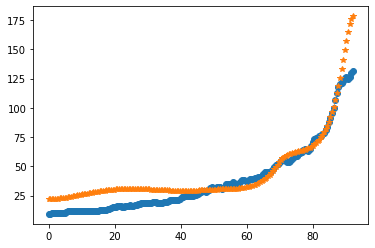

after perturb [6.03674391715792, 119.03735517778392, 25573.82032179579, 0.44545176966536904, 28.41653209099248]
parameters [6.03674391715792, 119.03735517778392, 25573.82032179579, 0.44545176966536904, 28.41653209099248]
oxigeno [1.67103310e-09 1.68074367e-09 1.70999919e-09 1.75917303e-09
 1.82889375e-09 1.92005472e-09 2.03382767e-09 2.17168050e-09
 2.33539962e-09 2.52711703e-09 2.74934269e-09 3.00500259e-09
 3.29748311e-09 3.63068232e-09 4.00906910e-09 4.43775087e-09
 4.92255104e-09 5.47009740e-09 6.08792267e-09 6.78457898e-09
 7.56976784e-09 8.45448772e-09 9.45120135e-09 1.05740255e-08
 1.18389456e-08 1.32640596e-08 1.48698522e-08 1.66795071e-08
 1.87192580e-08 2.10187860e-08 2.36116681e-08 2.65358829e-08
 2.98343805e-08 3.35557255e-08 3.77548199e-08 4.24937172e-08
 4.78425385e-08 5.38805014e-08 6.06970767e-08 6.83932880e-08
 7.70831697e-08 8.68954045e-08 9.79751600e-08 1.10486149e-07
 1.24612943e-07 1.40563557e-07 1.58572364e-07 1.78903345e-07
 2.01853740e-07 2.27758142e-07 2.569930

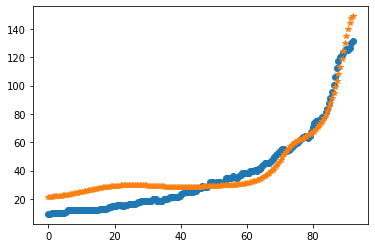

after perturb [2.724432787004272, 119.4945152673377, 21429.696026957685, 0.7663259204345138, 33.641273294615914]
parameters [2.724432787004272, 119.4945152673377, 21429.696026957685, 0.7663259204345138, 33.641273294615914]
oxigeno [2.36519059e-12 2.38750377e-12 2.45488936e-12 2.56869653e-12
 2.73121106e-12 2.94571173e-12 3.21655094e-12 3.54926123e-12
 3.95068977e-12 4.42916408e-12 4.99469240e-12 5.65920366e-12
 6.43683250e-12 7.34425655e-12 8.40109427e-12 9.63037354e-12
 1.10590832e-11 1.27188222e-11 1.46465630e-11 1.68855510e-11
 1.94863624e-11 2.25081499e-11 2.60201097e-11 3.01032076e-11
 3.48522100e-11 4.03780737e-11 4.68107547e-11 5.43025091e-11
 6.30317707e-11 7.32077026e-11 8.50755390e-11 9.89228501e-11
 1.15086885e-10 1.33963175e-10 1.56015597e-10 1.81788150e-10
 2.11918695e-10 2.47154988e-10 2.88373352e-10 3.36600397e-10
 3.93038241e-10 4.59093784e-10 5.36412646e-10 6.26918491e-10
 7.32858591e-10 8.56856632e-10 1.00197394e-09 1.17178057e-09
 1.37043782e-09 1.60279430e-09 1.8744

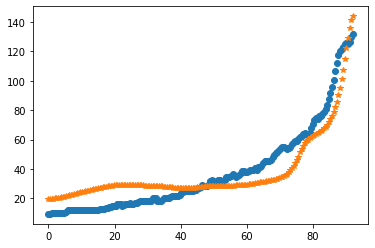

after perturb [7.226544798365716, 103.70904935959115, 22131.57891103411, 0.3591108076422153, 22.46261191470265]
parameters [7.226544798365716, 103.70904935959115, 22131.57891103411, 0.3591108076422153, 22.46261191470265]
after perturb [4.057915521588994, 172.18155770980277, 21150.84562340456, 0.5784668314062887, 24.522483323738076]
parameters [4.057915521588994, 172.18155770980277, 21150.84562340456, 0.5784668314062887, 24.522483323738076]
after perturb [3.522659491606152, 78.35878579076333, 19398.49910055776, 0.08163555336646, 21.878600255288415]
parameters [3.522659491606152, 78.35878579076333, 19398.49910055776, 0.08163555336646, 21.878600255288415]
after perturb [6.044024262036801, 168.03968026908296, 26145.369470382288, 1.2675781511478348, 41.23391838052746]
parameters [6.044024262036801, 168.03968026908296, 26145.369470382288, 1.2675781511478348, 41.23391838052746]
after perturb [3.3937880779540275, 76.65551113678629, 14909.022594174468, 0.05885709829816399, 2.2728319213447783]
p

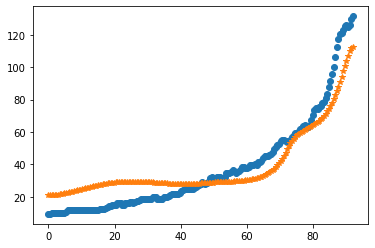

after perturb [4.999806478220656, 136.8680720169504, 26410.871262831868, 0.5814037693267281, 28.545570522451566]
parameters [4.999806478220656, 136.8680720169504, 26410.871262831868, 0.5814037693267281, 28.545570522451566]
oxigeno [4.73064679e-10 4.76144679e-10 4.85426683e-10 5.01037414e-10
 5.23190452e-10 5.52189824e-10 5.88435115e-10 6.32428181e-10
 6.84781546e-10 7.46228652e-10 8.17636093e-10 9.00018064e-10
 9.94553228e-10 1.10260433e-09 1.22574081e-09 1.36576495e-09
 1.52474177e-09 1.70503342e-09 1.90933855e-09 2.14073730e-09
 2.40274282e-09 2.69936002e-09 3.03515279e-09 3.41532060e-09
 3.84578597e-09 4.33329413e-09 4.88552664e-09 5.51123078e-09
 6.22036682e-09 7.02427551e-09 7.93586851e-09 8.96984469e-09
 1.01429356e-08 1.14741842e-08 1.29852601e-08 1.47008174e-08
 1.66488997e-08 1.88613975e-08 2.13745663e-08 2.42296116e-08
 2.74733498e-08 3.11589549e-08 3.53468007e-08 4.01054124e-08
 4.55125401e-08 5.16563703e-08 5.86368933e-08 6.65674466e-08
 7.55764568e-08 8.58094056e-08 9.7431

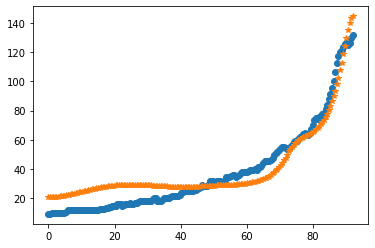

after perturb [2.6581927993521086, 139.69734267050436, 22817.012361782465, 0.6276456325327301, 32.09964528867576]
parameters [2.6581927993521086, 139.69734267050436, 22817.012361782465, 0.6276456325327301, 32.09964528867576]
oxigeno [2.55630257e-10 2.57309021e-10 2.62369425e-10 2.70884251e-10
 2.82976287e-10 2.98820579e-10 3.18647614e-10 3.42747468e-10
 3.71474990e-10 4.05256064e-10 4.44595072e-10 4.90083639e-10
 5.42410845e-10 6.02375037e-10 6.70897498e-10 7.49038203e-10
 8.38013982e-10 9.39219448e-10 1.05425111e-09 1.18493513e-09
 1.33335939e-09 1.50191025e-09 1.69331504e-09 1.91069081e-09
 2.15760039e-09 2.43811666e-09 2.75689637e-09 3.11926449e-09
 3.53131091e-09 4.00000085e-09 4.53330109e-09 5.14032402e-09
 5.83149199e-09 6.61872457e-09 7.51565175e-09 8.53785633e-09
 9.70314889e-09 1.10318795e-08 1.25472899e-08 1.42759114e-08
 1.62480133e-08 1.84981069e-08 2.10655140e-08 2.39950052e-08
 2.73375188e-08 3.11509716e-08 3.55011733e-08 4.04628619e-08
 4.61208771e-08 5.25714936e-08 5.99

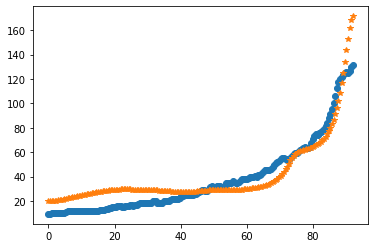

after perturb [1.1316339625784315, 184.28627936617954, 31862.944832191737, 1.146972921125694, 39.308035836839906]
parameters [1.1316339625784315, 184.28627936617954, 31862.944832191737, 1.146972921125694, 39.308035836839906]
after perturb [3.998580064026209, 157.20446237401325, 28880.46914585644, 1.2126481827028612, 56.0636811364502]
parameters [3.998580064026209, 157.20446237401325, 28880.46914585644, 1.2126481827028612, 56.0636811364502]
after perturb [4.330389793508648, 177.45166828246994, 24472.016158626717, 0.9324947866130555, 32.38456041169246]
parameters [4.330389793508648, 177.45166828246994, 24472.016158626717, 0.9324947866130555, 32.38456041169246]
after perturb [5.84760182982234, 109.57711552566136, 24309.6228269404, 0.7527180204866837, 35.46795697709356]
parameters [5.84760182982234, 109.57711552566136, 24309.6228269404, 0.7527180204866837, 35.46795697709356]
oxigeno [7.85497526e-13 7.93893376e-13 8.19263998e-13 8.62163176e-13
 9.23529222e-13 1.00470841e-12 1.10748863e-12 1

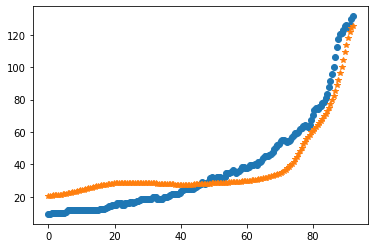

after perturb [3.902239430519976, 156.24176790712156, 28197.96552025096, 0.7973667872788063, 28.23651811642048]
parameters [3.902239430519976, 156.24176790712156, 28197.96552025096, 0.7973667872788063, 28.23651811642048]
after perturb [3.0262279863247388, 80.45331000541447, 16463.26237245689, 0.12537897266657116, 13.566982372349457]
parameters [3.0262279863247388, 80.45331000541447, 16463.26237245689, 0.12537897266657116, 13.566982372349457]
after perturb [1.9128140495368164, 184.3321821097886, 22321.14775927442, 0.8382338531430256, 29.622909036096168]
parameters [1.9128140495368164, 184.3321821097886, 22321.14775927442, 0.8382338531430256, 29.622909036096168]
after perturb [8.166598199371537, 80.31085262494986, 17882.054394334875, 0.25701289052402765, 23.240182678264414]
parameters [8.166598199371537, 80.31085262494986, 17882.054394334875, 0.25701289052402765, 23.240182678264414]
after perturb [7.532281718295953, 148.58405348161426, 28386.138115277696, 1.116948898290843, 45.9234573472

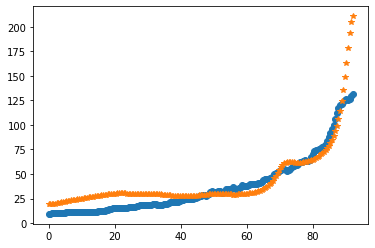

after perturb [7.315074685283411, 125.90531039932881, 28817.965590051317, 0.6691424863196129, 35.18002324140014]
parameters [7.315074685283411, 125.90531039932881, 28817.965590051317, 0.6691424863196129, 35.18002324140014]
after perturb [0.19456885217363373, 138.1016194683199, 26069.116923384332, 0.42818926696052617, 28.333336513317484]
parameters [0.19456885217363373, 138.1016194683199, 26069.116923384332, 0.42818926696052617, 28.333336513317484]
oxigeno [1.32768486e-08 1.33293280e-08 1.34886666e-08 1.37601558e-08
 1.41514776e-08 1.46715731e-08 1.53297616e-08 1.61352925e-08
 1.70973002e-08 1.82250147e-08 1.95281996e-08 2.10179996e-08
 2.27083502e-08 2.46176747e-08 2.67701420e-08 2.91957924e-08
 3.19293853e-08 3.50085068e-08 3.84719330e-08 4.23591149e-08
 4.67108479e-08 5.15704370e-08 5.69846804e-08 6.30047828e-08
 6.96882582e-08 7.71031349e-08 8.53345788e-08 9.44917350e-08
 1.04711000e-07 1.16152849e-07 1.28992398e-07 1.43407480e-07
 1.59570796e-07 1.77652249e-07 1.97832318e-07 2.2032

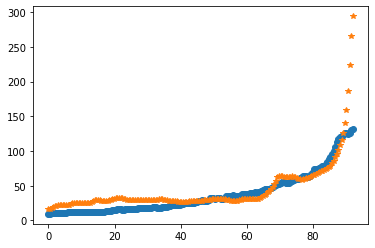

after perturb [2.829372159759769, 148.28585771576752, 31196.879105523076, 0.8653993040225618, 36.934260481374444]
parameters [2.829372159759769, 148.28585771576752, 31196.879105523076, 0.8653993040225618, 36.934260481374444]
after perturb [6.897578173592439, 98.9077615253457, 24908.969132344006, 0.39676804041735725, 29.00565885538583]
parameters [6.897578173592439, 98.9077615253457, 24908.969132344006, 0.39676804041735725, 29.00565885538583]
oxigeno [1.33690137e-09 1.34028069e-09 1.35048078e-09 1.36768898e-09
 1.39222041e-09 1.42452238e-09 1.46518075e-09 1.51492823e-09
 1.57465491e-09 1.64542117e-09 1.72847326e-09 1.82526178e-09
 1.93746347e-09 2.06700671e-09 2.21610112e-09 2.38727190e-09
 2.58339943e-09 2.80776486e-09 3.06410254e-09 3.35665999e-09
 3.69026672e-09 4.07041282e-09 4.50333873e-09 4.99613768e-09
 5.55687251e-09 6.19470867e-09 6.92006574e-09 7.74478971e-09
 8.68234891e-09 9.74805667e-09 1.09593241e-08 1.23359472e-08
 1.39004321e-08 1.56783647e-08 1.76988286e-08 1.99948790e-

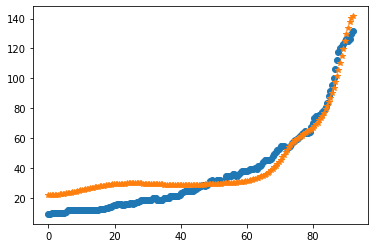

after perturb [4.398298917308284, 145.4555248120357, 25843.126069478683, 0.46612731478780534, 22.01068334563674]
parameters [4.398298917308284, 145.4555248120357, 25843.126069478683, 0.46612731478780534, 22.01068334563674]
oxigeno [9.84745594e-09 9.89617635e-09 1.00428564e-08 1.02890594e-08
 1.06374150e-08 1.10916544e-08 1.16566616e-08 1.23385389e-08
 1.31446895e-08 1.40839161e-08 1.51665384e-08 1.64045292e-08
 1.78116726e-08 1.94037444e-08 2.11987185e-08 2.32170011e-08
 2.54816961e-08 2.80189059e-08 3.08580704e-08 3.40323497e-08
 3.75790560e-08 4.15401392e-08 4.59627344e-08 5.08997771e-08
 5.64106942e-08 6.25621810e-08 6.94290720e-08 7.70953169e-08
 8.56550742e-08 9.52139336e-08 1.05890283e-07 1.17816832e-07
 1.31142316e-07 1.46033387e-07 1.62676723e-07 1.81281372e-07
 2.02081355e-07 2.25338554e-07 2.51345916e-07 2.80431009e-07
 3.12959956e-07 3.49341799e-07 3.90033332e-07 4.35544462e-07
 4.86444145e-07 5.43366973e-07 6.07020488e-07 6.78193290e-07
 7.57764053e-07 8.46711542e-07 9.4612

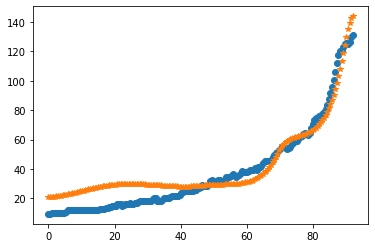

after perturb [6.926683827808408, 189.05042773194603, 27012.355394643266, 1.3912160320262938, 50.08966537850917]
parameters [6.926683827808408, 189.05042773194603, 27012.355394643266, 1.3912160320262938, 50.08966537850917]
after perturb [5.5115095908413005, 163.98359487272182, 19521.96944374506, 0.6220131453944113, 24.83309498722836]
parameters [5.5115095908413005, 163.98359487272182, 19521.96944374506, 0.6220131453944113, 24.83309498722836]
after perturb [6.2623689818337125, 139.24234552229558, 29109.230048232803, 0.7303770146260329, 42.68950471352582]
parameters [6.2623689818337125, 139.24234552229558, 29109.230048232803, 0.7303770146260329, 42.68950471352582]
after perturb [2.2725718528427308, 153.77855869015113, 21868.190700196774, 0.9390623683015189, 36.13448727281606]
parameters [2.2725718528427308, 153.77855869015113, 21868.190700196774, 0.9390623683015189, 36.13448727281606]
after perturb [7.35524867387886, 145.2714776259758, 28077.57158005474, 0.7935538732637378, 26.5265237842

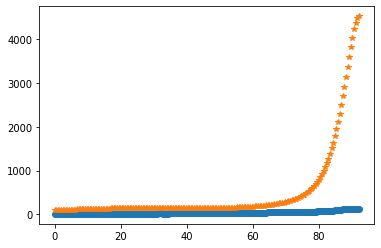

after perturb [8.029753363799163, 88.76771928415937, 25162.80798654567, -0.17200844751058164, 23.71253447103062]
parameters [8.029753363799163, 88.76771928415937, 25162.80798654567, -0.17200844751058164, 23.71253447103062]
after perturb [7.086272047290923, 144.50318666273944, 32119.1781749688, 0.4609876931274659, 26.527239573257777]
parameters [7.086272047290923, 144.50318666273944, 32119.1781749688, 0.4609876931274659, 26.527239573257777]
after perturb [3.1955772734752754, 63.30050980718251, 20318.080685782108, -0.10091998753881232, 6.4964695160479575]
parameters [3.1955772734752754, 63.30050980718251, 20318.080685782108, -0.10091998753881232, 6.4964695160479575]
after perturb [4.0895077630336765, 167.0031786238622, 25122.590770857303, 1.213137578730156, 36.18559150510412]
parameters [4.0895077630336765, 167.0031786238622, 25122.590770857303, 1.213137578730156, 36.18559150510412]
after perturb [4.220425868955082, 106.6911054631403, 26661.952343421155, 0.27808758251591215, 24.675473773

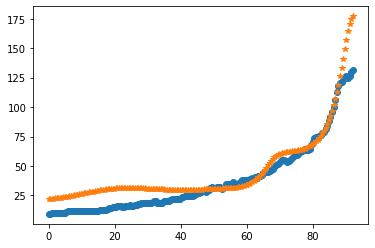

after perturb [4.703531642848143, 155.05812021960568, 25512.407043486186, 1.072669923375878, 50.51130225834702]
parameters [4.703531642848143, 155.05812021960568, 25512.407043486186, 1.072669923375878, 50.51130225834702]
after perturb [7.2950326461227135, 124.0828523179631, 23476.91561114409, 0.48131592858343847, 32.13366682683055]
parameters [7.2950326461227135, 124.0828523179631, 23476.91561114409, 0.48131592858343847, 32.13366682683055]
after perturb [4.613419693008762, 117.45134275263091, 29886.9609316134, 0.7106625218447319, 42.041492325581686]
parameters [4.613419693008762, 117.45134275263091, 29886.9609316134, 0.7106625218447319, 42.041492325581686]
after perturb [6.372270152297283, 103.01512171227147, 20093.022430590354, 0.6455771394818248, 31.934660365075345]
parameters [6.372270152297283, 103.01512171227147, 20093.022430590354, 0.6455771394818248, 31.934660365075345]
oxigeno [2.56693029e-12 2.59273478e-12 2.67067773e-12 2.80235994e-12
 2.99049093e-12 3.23895219e-12 3.55288799

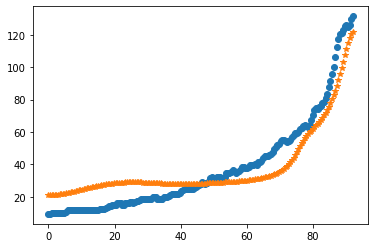

after perturb [0.4683184686732633, 165.37822026575355, 24676.479064712432, 0.9775623278073847, 39.061906713775215]
parameters [0.4683184686732633, 165.37822026575355, 24676.479064712432, 0.9775623278073847, 39.061906713775215]
after perturb [6.673928689213338, 107.92949097791711, 24204.637590044404, -0.0032103266593008772, 22.43009907506858]
parameters [6.673928689213338, 107.92949097791711, 24204.637590044404, -0.0032103266593008772, 22.43009907506858]
after perturb [4.415230187313957, 151.17605498350508, 25525.377751099106, 0.3784531887964623, 34.057293122854006]
parameters [4.415230187313957, 151.17605498350508, 25525.377751099106, 0.3784531887964623, 34.057293122854006]
after perturb [5.124362601226851, 98.09641121708906, 27081.419299377787, 0.2632951442662941, 27.62299311408379]
parameters [5.124362601226851, 98.09641121708906, 27081.419299377787, 0.2632951442662941, 27.62299311408379]
oxigeno [5.31207060e-07 5.30992505e-07 5.30353200e-07 5.29302200e-07
 5.27861180e-07 5.26060320e

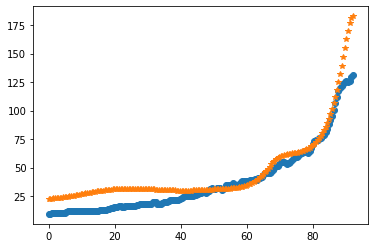

after perturb [8.804225570947407, 145.8883009405347, 28119.64277180566, 0.9713700985642565, 35.90427812219726]
parameters [8.804225570947407, 145.8883009405347, 28119.64277180566, 0.9713700985642565, 35.90427812219726]
after perturb [-0.8949993213247032, 162.01909111590268, 16416.578303740695, 0.7330158645139147, 21.204448629325572]
parameters [-0.8949993213247032, 162.01909111590268, 16416.578303740695, 0.7330158645139147, 21.204448629325572]
after perturb [6.593492848941498, 124.1097400530878, 19809.071786132223, 0.5519933851926077, 31.978171367559398]
parameters [6.593492848941498, 124.1097400530878, 19809.071786132223, 0.5519933851926077, 31.978171367559398]
after perturb [4.70432201389391, 73.04787882766601, 28818.369882837233, 0.029842988402214943, 28.266702551134067]
parameters [4.70432201389391, 73.04787882766601, 28818.369882837233, 0.029842988402214943, 28.266702551134067]
oxigeno [ 0.66081668  0.66065874  0.66018582  0.65940057  0.6583074   0.65691235
  0.65522309  0.6532487

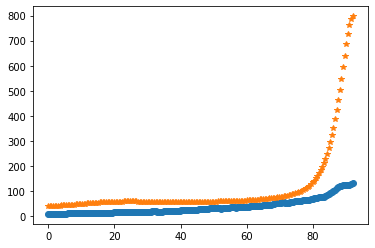

after perturb [8.08647060687531, 110.9737589766553, 31227.755792049316, 0.5179084513270747, 47.10736816576075]
parameters [8.08647060687531, 110.9737589766553, 31227.755792049316, 0.5179084513270747, 47.10736816576075]
after perturb [2.7709568029675644, 145.4783629847407, 21380.65986359713, 0.8782175916579962, 29.89813151229889]
parameters [2.7709568029675644, 145.4783629847407, 21380.65986359713, 0.8782175916579962, 29.89813151229889]
oxigeno [6.93930360e-12 6.99851454e-12 7.17722952e-12 7.47872004e-12
 7.90852231e-12 8.47456431e-12 9.18734700e-12 1.00601827e-11
 1.11094957e-11 1.23551903e-11 1.38210947e-11 1.55354895e-11
 1.75317326e-11 1.98489950e-11 2.25331239e-11 2.56376542e-11
 2.92249925e-11 3.33678027e-11 3.81506288e-11 4.36717923e-11
 5.00456158e-11 5.74050242e-11 6.59045906e-11 7.57241002e-11
 8.70727190e-11 1.00193869e-10 1.15370922e-10 1.32933856e-10
 1.53267017e-10 1.76818179e-10 2.04109110e-10 2.35747878e-10
 2.72443185e-10 3.15021052e-10 3.64444210e-10 4.21834620e-10
 4.

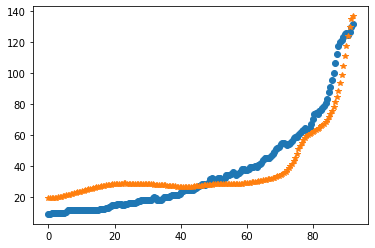

after perturb [3.7335497908328774, 148.71459981190768, 21711.548242441157, 0.7216029813609852, 28.370640819380917]
parameters [3.7335497908328774, 148.71459981190768, 21711.548242441157, 0.7216029813609852, 28.370640819380917]
oxigeno [1.11563472e-10 1.12353510e-10 1.14735520e-10 1.18745408e-10
 1.24443772e-10 1.31917052e-10 1.41279151e-10 1.52673579e-10
 1.66276134e-10 1.82298171e-10 2.00990526e-10 2.22648147e-10
 2.47615527e-10 2.76293044e-10 3.09144312e-10 3.46704703e-10
 3.89591192e-10 4.38513733e-10 4.94288377e-10 5.57852408e-10
 6.30281783e-10 7.12811244e-10 8.06857480e-10 9.14045805e-10
 1.03624088e-09 1.17558203e-09 1.33452395e-09 1.51588336e-09
 1.72289272e-09 1.95926181e-09 2.22924838e-09 2.53773914e-09
 2.89034240e-09 3.29349417e-09 3.75457930e-09 4.28206984e-09
 4.88568284e-09 5.57656024e-09 6.36747358e-09 7.27305707e-09
 8.31007249e-09 9.49771036e-09 1.08579321e-08 1.24158587e-08
 1.42002126e-08 1.62438194e-08 1.85841784e-08 2.12641122e-08
 2.43325045e-08 2.78451417e-08 3.

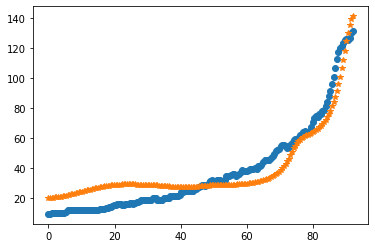

after perturb [5.1214390056395835, 84.92330181836176, 30384.1161608098, 0.6685492841835065, 40.81379554315208]
parameters [5.1214390056395835, 84.92330181836176, 30384.1161608098, 0.6685492841835065, 40.81379554315208]
after perturb [7.167104681552534, 146.35409912368644, 26106.258919349573, 1.031818487719718, 38.80835359912055]
parameters [7.167104681552534, 146.35409912368644, 26106.258919349573, 1.031818487719718, 38.80835359912055]
after perturb [12.536648441437809, 63.848818764544, 21183.390871235275, 0.09709705863253021, 32.92081070271303]
parameters [12.536648441437809, 63.848818764544, 21183.390871235275, 0.09709705863253021, 32.92081070271303]
after perturb [1.147616765078212, 150.63887500961866, 22682.40962244173, 0.7400412994459448, 33.41446855096386]
parameters [1.147616765078212, 150.63887500961866, 22682.40962244173, 0.7400412994459448, 33.41446855096386]
after perturb [8.337115960114824, 160.27360798224086, 33878.1365364246, 1.176924774486416, 55.14040324744393]
paramete

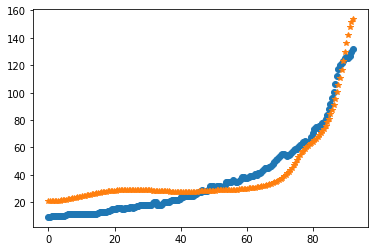

after perturb [3.098867818109782, 111.26005179435481, 21032.00093422563, 0.3515001803117832, 14.078849944657321]
parameters [3.098867818109782, 111.26005179435481, 21032.00093422563, 0.3515001803117832, 14.078849944657321]
oxigeno [1.26123609e-08 1.26482142e-08 1.27562783e-08 1.29380716e-08
 1.31961436e-08 1.35341033e-08 1.39566607e-08 1.44696796e-08
 1.50802458e-08 1.57967494e-08 1.66289834e-08 1.75882612e-08
 1.86875523e-08 1.99416419e-08 2.13673135e-08 2.29835603e-08
 2.48118255e-08 2.68762794e-08 2.92041327e-08 3.18259948e-08
 3.47762802e-08 3.80936694e-08 4.18216308e-08 4.60090114e-08
 5.07107031e-08 5.59883952e-08 6.19114209e-08 6.85577100e-08
 7.60148593e-08 8.43813334e-08 9.37678109e-08 1.04298690e-07
 1.16113776e-07 1.29370155e-07 1.44244299e-07 1.60934394e-07
 1.79662936e-07 2.00679610e-07 2.24264483e-07 2.50731534e-07
 2.80432564e-07 3.13761518e-07 3.51159254e-07 3.93118833e-07
 4.40191362e-07 4.92992477e-07 5.52209543e-07 6.18609663e-07
 6.93048608e-07 7.76480787e-07 8.6997

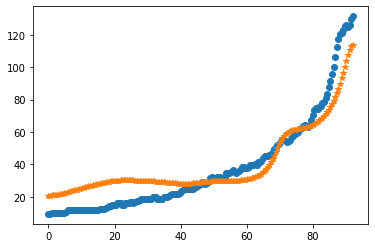

after perturb [4.846484825111416, 134.56058646334387, 25169.290994654642, 0.41245766342088136, 18.4917566349146]
parameters [4.846484825111416, 134.56058646334387, 25169.290994654642, 0.41245766342088136, 18.4917566349146]
oxigeno [1.39677935e-08 1.40351018e-08 1.42377337e-08 1.45778195e-08
 1.50589410e-08 1.56861787e-08 1.64661787e-08 1.74072395e-08
 1.85194211e-08 1.98146748e-08 2.13069989e-08 2.30126185e-08
 2.49501940e-08 2.71410601e-08 2.96094979e-08 3.23830437e-08
 3.54928393e-08 3.89740270e-08 4.28661953e-08 4.72138807e-08
 5.20671329e-08 5.74821487e-08 6.35219858e-08 7.02573618e-08
 7.77675522e-08 8.61413943e-08 9.54784130e-08 1.05890079e-07
 1.17501214e-07 1.30451562e-07 1.44897539e-07 1.61014184e-07
 1.78997332e-07 1.99066027e-07 2.21465210e-07 2.46468694e-07
 2.74382474e-07 3.05548391e-07 3.40348197e-07 3.79208046e-07
 4.22603485e-07 4.71064960e-07 5.25183925e-07 5.85619600e-07
 6.53106451e-07 7.28462476e-07 8.12598387e-07 9.06527780e-07
 1.01137841e-06 1.12840470e-06 1.2590

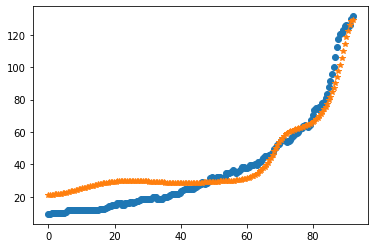

after perturb [4.925325031053912, 157.1389413868883, 22621.90456842875, 0.8390597693945949, 27.96011882966618]
parameters [4.925325031053912, 157.1389413868883, 22621.90456842875, 0.8390597693945949, 27.96011882966618]
after perturb [1.3325746920980064, 132.1883476841416, 22150.658964601236, 0.5097268072877554, 28.54859404780931]
parameters [1.3325746920980064, 132.1883476841416, 22150.658964601236, 0.5097268072877554, 28.54859404780931]
oxigeno [1.33970921e-09 1.34721583e-09 1.36983859e-09 1.40788742e-09
 1.46188308e-09 1.53256374e-09 1.62089456e-09 1.72808073e-09
 1.85558444e-09 2.00514622e-09 2.17881113e-09 2.37896000e-09
 2.60834593e-09 2.87013581e-09 3.16795706e-09 3.50594958e-09
 3.88882354e-09 4.32192447e-09 4.81130767e-09 5.36382513e-09
 5.98722859e-09 6.69029269e-09 7.48296168e-09 8.37652242e-09
 9.38380472e-09 1.05194091e-08 1.17999603e-08 1.32443860e-08
 1.48742195e-08 1.67139298e-08 1.87912854e-08 2.11377619e-08
 2.37890102e-08 2.67854019e-08 3.01726720e-08 3.40026741e-08
 

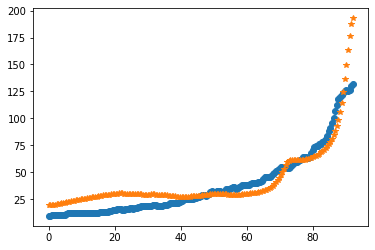

after perturb [4.008908416368488, 137.25857966063444, 24814.71059399871, 0.615827232689949, 25.291848222540438]
parameters [4.008908416368488, 137.25857966063444, 24814.71059399871, 0.615827232689949, 25.291848222540438]
oxigeno [2.55836517e-10 2.57568633e-10 2.62789794e-10 2.71574875e-10
 2.84050161e-10 3.00395606e-10 3.20848042e-10 3.45705389e-10
 3.75331937e-10 4.10164774e-10 4.50721472e-10 4.97609160e-10
 5.51535137e-10 6.13319214e-10 6.83908003e-10 7.64391414e-10
 8.56021655e-10 9.60235099e-10 1.07867741e-09 1.21323243e-09
 1.36605528e-09 1.53961044e-09 1.73671534e-09 1.96059042e-09
 2.21491644e-09 2.50390017e-09 2.83234962e-09 3.20576003e-09
 3.63041229e-09 4.11348534e-09 4.66318443e-09 5.28888757e-09
 6.00131224e-09 6.81270539e-09 7.73705940e-09 8.79035771e-09
 9.99085357e-09 1.13593864e-08 1.29197407e-08 1.46990518e-08
 1.67282668e-08 1.90426650e-08 2.16824476e-08 2.46934043e-08
 2.81276688e-08 3.20445725e-08 3.65116120e-08 4.16055443e-08
 4.74136280e-08 5.40350299e-08 6.158242

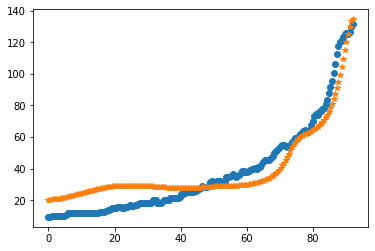

after perturb [5.951590787251983, 121.44394688894262, 28831.568486290384, 0.674844219542341, 28.349640353276186]
parameters [5.951590787251983, 121.44394688894262, 28831.568486290384, 0.674844219542341, 28.349640353276186]
oxigeno [1.60569808e-11 1.61958342e-11 1.66148585e-11 1.73214983e-11
 1.83283326e-11 1.96533369e-11 2.13202571e-11 2.33591045e-11
 2.58067815e-11 2.87078523e-11 3.21154754e-11 3.60925176e-11
 4.07128745e-11 4.60630259e-11 5.22438612e-11 5.93728138e-11
 6.75863524e-11 7.70428852e-11 8.79261393e-11 1.00449092e-10
 1.14858540e-10 1.31440410e-10 1.50525922e-10 1.72498751e-10
 1.97803332e-10 2.26954507e-10 2.60548700e-10 2.99276889e-10
 3.43939635e-10 3.95464499e-10 4.54926212e-10 5.23570032e-10
 6.02838770e-10 6.94404051e-10 8.00202461e-10 9.22477314e-10
 1.06382690e-09 1.22726020e-09 1.41626113e-09 1.63486274e-09
 1.88773270e-09 2.18027182e-09 2.51872761e-09 2.91032510e-09
 3.36341735e-09 3.88765888e-09 4.49420510e-09 5.19594187e-09
 6.00774954e-09 6.94680656e-09 8.0329

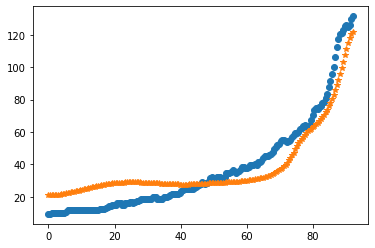

after perturb [8.5412217395382, 147.69420685638946, 35063.346399181806, 1.4864996156222747, 61.935847859890615]
parameters [8.5412217395382, 147.69420685638946, 35063.346399181806, 1.4864996156222747, 61.935847859890615]
after perturb [2.5310510578789156, 160.23397128500272, 25521.58357040117, 0.6832951470100841, 29.52216943858474]
parameters [2.5310510578789156, 160.23397128500272, 25521.58357040117, 0.6832951470100841, 29.52216943858474]
after perturb [6.61547600998319, 120.59853111951765, 24984.086863556728, 0.48329486410057, 28.67435264680357]
parameters [6.61547600998319, 120.59853111951765, 24984.086863556728, 0.48329486410057, 28.67435264680357]
oxigeno [7.84062663e-10 7.89075500e-10 8.04181283e-10 8.29582892e-10
 8.65622064e-10 9.12784847e-10 9.71709364e-10 1.04319600e-09
 1.12822020e-09 1.22794801e-09 1.34375474e-09 1.47724692e-09
 1.63028797e-09 1.80502800e-09 2.00393818e-09 2.22985036e-09
 2.48600235e-09 2.77608992e-09 3.10432607e-09 3.47550870e-09
 3.89509777e-09 4.36930309

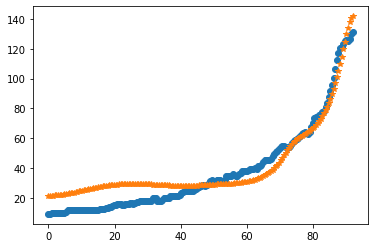

after perturb [9.493094492346422, 121.48173941019351, 25623.094358018883, 0.5562489805737855, 45.122158982136305]
parameters [9.493094492346422, 121.48173941019351, 25623.094358018883, 0.5562489805737855, 45.122158982136305]
after perturb [3.3052070885446936, 127.79532148506036, 32362.607711432072, 0.8550760017233465, 42.6102577200079]
parameters [3.3052070885446936, 127.79532148506036, 32362.607711432072, 0.8550760017233465, 42.6102577200079]
after perturb [12.06216010982575, 134.65080069221383, 25028.416699886006, 0.6709364329431863, 33.391472838947244]
parameters [12.06216010982575, 134.65080069221383, 25028.416699886006, 0.6709364329431863, 33.391472838947244]
after perturb [6.345533601393692, 118.91321042660546, 21606.94754465596, 0.21756408372313707, 29.236327418981467]
parameters [6.345533601393692, 118.91321042660546, 21606.94754465596, 0.21756408372313707, 29.236327418981467]
oxigeno [5.85011225e-06 5.85090388e-06 5.85331788e-06 5.85747150e-06
 5.86356020e-06 5.87185765e-06 5.

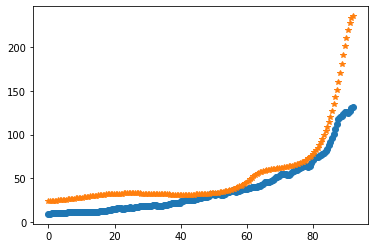

after perturb [8.61516596087178, 86.1600276747512, 28016.51096272471, 0.2529502805848152, 38.22860609638453]
parameters [8.61516596087178, 86.1600276747512, 28016.51096272471, 0.2529502805848152, 38.22860609638453]
after perturb [-1.307483979128465, 192.16323247979022, 28495.64949209514, 0.8834156156034578, 26.02431328368107]
parameters [-1.307483979128465, 192.16323247979022, 28495.64949209514, 0.8834156156034578, 26.02431328368107]
after perturb [3.5042119599815735, 100.14910675582279, 17058.299088983556, -0.21456576392608412, 11.219878312648017]
parameters [3.5042119599815735, 100.14910675582279, 17058.299088983556, -0.21456576392608412, 11.219878312648017]
after perturb [1.3375832675380335, 106.01682415267547, 19665.273910289314, -0.005616031823040157, 8.29799178723449]
parameters [1.3375832675380335, 106.01682415267547, 19665.273910289314, -0.005616031823040157, 8.29799178723449]
after perturb [4.931675384139524, 148.24809326700162, 25504.01410736583, 0.884269837769947, 39.8877085

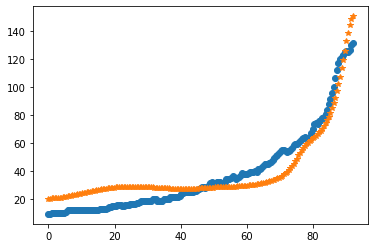

after perturb [6.991745967223361, 166.29151380429414, 28434.317811966743, 1.0185052742451346, 40.560158309386296]
parameters [6.991745967223361, 166.29151380429414, 28434.317811966743, 1.0185052742451346, 40.560158309386296]
after perturb [3.917440536812716, 166.5960360335371, 19574.347440904385, 0.7243314546997904, 24.29568837027054]
parameters [3.917440536812716, 166.5960360335371, 19574.347440904385, 0.7243314546997904, 24.29568837027054]
after perturb [7.962100964361862, 90.89750654913517, 19600.71272931421, 0.5397648194396989, 29.351702455128343]
parameters [7.962100964361862, 90.89750654913517, 19600.71272931421, 0.5397648194396989, 29.351702455128343]
after perturb [4.685669391742785, 150.57098505978263, 28579.877131073838, 0.7613285831977569, 39.760976880925476]
parameters [4.685669391742785, 150.57098505978263, 28579.877131073838, 0.7613285831977569, 39.760976880925476]
after perturb [6.149357645058679, 155.75223924869712, 32305.121153560278, 1.4554659187458674, 58.22509430233

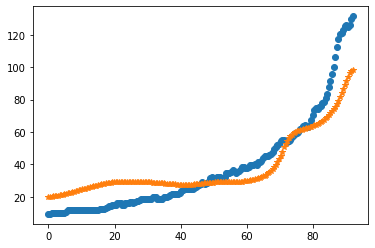

after perturb [7.616214918539732, 123.54383308523889, 33019.39445959606, 1.0265178360115654, 36.891924783952526]
parameters [7.616214918539732, 123.54383308523889, 33019.39445959606, 1.0265178360115654, 36.891924783952526]
after perturb [7.777943358721272, 89.75124694891349, 25796.107260561363, 0.4244668407353861, 34.87082078618611]
parameters [7.777943358721272, 89.75124694891349, 25796.107260561363, 0.4244668407353861, 34.87082078618611]
after perturb [8.824196831337824, 126.81406597243765, 32446.6039757118, 0.7991350998842692, 52.18759792114071]
parameters [8.824196831337824, 126.81406597243765, 32446.6039757118, 0.7991350998842692, 52.18759792114071]
after perturb [8.82829251343022, 89.13292935610372, 21493.773179847605, 0.45612359090344146, 26.92097365199689]
parameters [8.82829251343022, 89.13292935610372, 21493.773179847605, 0.45612359090344146, 26.92097365199689]
after perturb [3.53913132997315, 197.96136342822166, 25467.54099525823, 1.3050907646847434, 30.1473106526359]
parame

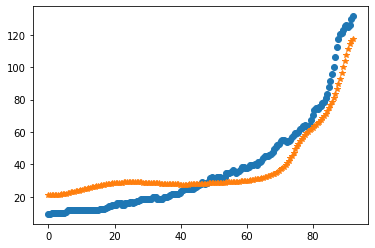

after perturb [6.807478195699124, 119.54386432227365, 23871.687906339546, 0.6221744208651158, 30.526737242404224]
parameters [6.807478195699124, 119.54386432227365, 23871.687906339546, 0.6221744208651158, 30.526737242404224]
oxigeno [3.58559430e-11 3.61513563e-11 3.70425762e-11 3.85446397e-11
 4.06829358e-11 4.34937031e-11 4.70247407e-11 5.13363469e-11
 5.65025054e-11 6.26123426e-11 6.97718865e-11 7.81061633e-11
 8.77616749e-11 9.89093096e-11 1.11747744e-10 1.26507409e-10
 1.43455103e-10 1.62899340e-10 1.85196562e-10 2.10758317e-10
 2.40059583e-10 2.73648381e-10 3.12156897e-10 3.56314331e-10
 4.06961738e-10 4.65069165e-10 5.31755437e-10 6.08310980e-10
 6.96224157e-10 7.97211627e-10 9.13253347e-10 1.04663289e-09
 1.19998391e-09 1.37634356e-09 1.57921408e-09 1.81263355e-09
 2.08125724e-09 2.39045119e-09 2.74639962e-09 3.15622833e-09
 3.62814638e-09 4.17160858e-09 4.79750199e-09 5.51835971e-09
 6.34860595e-09 7.30483697e-09 8.40614284e-09 9.67447599e-09
 1.11350732e-08 1.28169389e-08 1.47

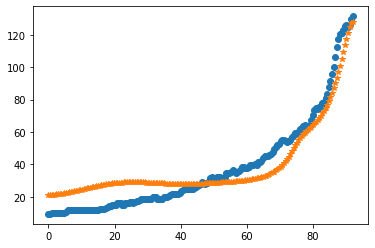

after perturb [3.7680646895187433, 137.97713425054252, 30102.91484708999, 0.6345401393466941, 41.559053856355064]
parameters [3.7680646895187433, 137.97713425054252, 30102.91484708999, 0.6345401393466941, 41.559053856355064]
after perturb [5.147505973856263, 159.068214633607, 29666.825899820775, 1.0082894523733703, 43.26155577809672]
parameters [5.147505973856263, 159.068214633607, 29666.825899820775, 1.0082894523733703, 43.26155577809672]
after perturb [0.590469598920611, 81.48814790142052, 20626.31060632918, 0.11737741165866566, 10.224176467467982]
parameters [0.590469598920611, 81.48814790142052, 20626.31060632918, 0.11737741165866566, 10.224176467467982]
oxigeno [5.55792954e-04 5.55376418e-04 5.54138599e-04 5.52112860e-04
 5.49348701e-04 5.45904386e-04 5.41839544e-04 5.37209524e-04
 5.32062580e-04 5.26440130e-04 5.20379439e-04 5.13917488e-04
 5.07094572e-04 4.99956341e-04 4.92553589e-04 4.84939836e-04
 4.77167468e-04 4.69283607e-04 4.61326911e-04 4.53326158e-04
 4.45300941e-04 4.37

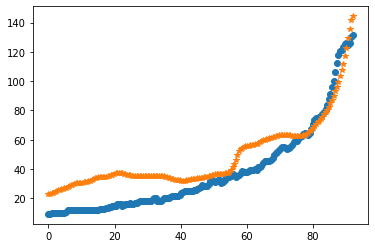

after perturb [4.64301896105229, 130.78130712621757, 23828.478661118977, 0.5660638726828922, 22.424573056262293]
parameters [4.64301896105229, 130.78130712621757, 23828.478661118977, 0.5660638726828922, 22.424573056262293]
oxigeno [3.60520057e-10 3.62938644e-10 3.70228423e-10 3.82492034e-10
 3.99902527e-10 4.22706351e-10 4.51227631e-10 4.85873753e-10
 5.27142393e-10 5.75630066e-10 6.32042357e-10 6.97206004e-10
 7.72083026e-10 8.57787146e-10 9.55602797e-10 1.06700703e-09
 1.19369476e-09 1.33760767e-09 1.50096750e-09 1.68631413e-09
 1.89654916e-09 2.13498594e-09 2.40540666e-09 2.71212778e-09
 3.06007475e-09 3.45486738e-09 3.90291745e-09 4.41153995e-09
 4.98908009e-09 5.64505806e-09 6.39033382e-09 7.23729483e-09
 8.20006944e-09 9.29476944e-09 1.05397655e-08 1.19559997e-08
 1.35673402e-08 1.54009823e-08 1.74879040e-08 1.98633804e-08
 2.25675660e-08 2.56461539e-08 2.91511205e-08 3.31415673e-08
 3.76846729e-08 4.28567693e-08 4.87445578e-08 5.54464850e-08
 6.30742975e-08 7.17548006e-08 8.1631

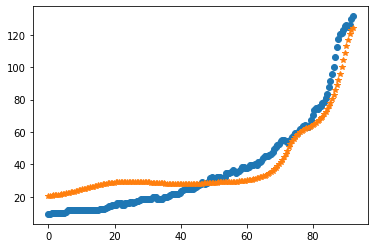

after perturb [5.682878453998257, 99.35258229056058, 17335.76949321503, 0.25319328688873677, 31.318422894057694]
parameters [5.682878453998257, 99.35258229056058, 17335.76949321503, 0.25319328688873677, 31.318422894057694]
after perturb [6.9572774419119385, 135.56836970859246, 25279.10931961444, 0.8741298294526276, 50.729069326770706]
parameters [6.9572774419119385, 135.56836970859246, 25279.10931961444, 0.8741298294526276, 50.729069326770706]
after perturb [8.536225420239093, 112.64823425352621, 31634.827554747364, 0.651621489799133, 45.487947907695556]
parameters [8.536225420239093, 112.64823425352621, 31634.827554747364, 0.651621489799133, 45.487947907695556]
after perturb [2.912221912723566, 124.31534226879712, 23487.817145776426, 0.29711169780108754, 20.33199394941481]
parameters [2.912221912723566, 124.31534226879712, 23487.817145776426, 0.29711169780108754, 20.33199394941481]
oxigeno [2.06967609e-07 2.07399472e-07 2.08699976e-07 2.10883906e-07
 2.13976016e-07 2.18011213e-07 2.23

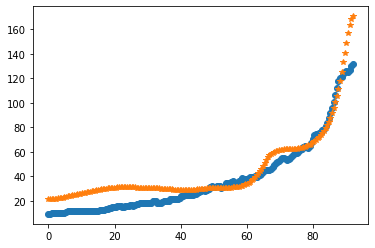

after perturb [4.080904628656347, 115.45588958667217, 21557.535584894595, 0.7400690374359928, 39.858011281334136]
parameters [4.080904628656347, 115.45588958667217, 21557.535584894595, 0.7400690374359928, 39.858011281334136]
oxigeno [2.22673941e-12 2.24830593e-12 2.31343856e-12 2.42344685e-12
 2.58054832e-12 2.78792159e-12 3.04978266e-12 3.37148591e-12
 3.75965231e-12 4.22232795e-12 4.76917664e-12 5.41171134e-12
 6.16357006e-12 7.04084314e-12 8.06246010e-12 9.25064586e-12
 1.06314578e-11 1.22354179e-11 1.40982551e-11 1.62617790e-11
 1.87749049e-11 2.16948594e-11 2.50885958e-11 2.90344570e-11
 3.36241280e-11 3.89649288e-11 4.51825063e-11 5.24239927e-11
 6.08617115e-11 7.06975227e-11 8.21679157e-11 9.55499753e-11
 1.11168366e-10 1.29403504e-10 1.50701109e-10 1.75583365e-10
 2.04661953e-10 2.38653252e-10 2.78396059e-10 3.24872240e-10
 3.79230772e-10 4.42815721e-10 5.17198794e-10 6.04217188e-10
 7.06017597e-10 8.25107363e-10 9.64413938e-10 1.12735399e-09
 1.31791377e-09 1.54074245e-09 1.80

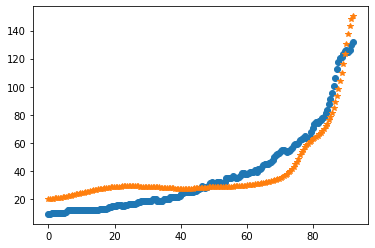

after perturb [7.67578488928304, 112.89383325817745, 29800.878478547365, 0.9741120429696334, 40.07409118014467]
parameters [7.67578488928304, 112.89383325817745, 29800.878478547365, 0.9741120429696334, 40.07409118014467]
after perturb [4.128055843272791, 102.36517407258562, 22885.466694962262, 0.5245562996441427, 40.626381981375935]
parameters [4.128055843272791, 102.36517407258562, 22885.466694962262, 0.5245562996441427, 40.626381981375935]
oxigeno [3.75120482e-11 3.77921173e-11 3.86371761e-11 4.00618777e-11
 4.20909733e-11 4.47598126e-11 4.81150586e-11 5.22156296e-11
 5.71338881e-11 6.29570991e-11 6.97891883e-11 7.77528353e-11
 8.69919445e-11 9.76745467e-11 1.09996190e-10 1.24183892e-10
 1.40500742e-10 1.59251243e-10 1.80787517e-10 2.05516506e-10
 2.33908313e-10 2.66505884e-10 3.03936219e-10 3.46923358e-10
 3.96303434e-10 4.53042078e-10 5.18254580e-10 5.93229194e-10
 6.79454083e-10 7.78648454e-10 8.92798493e-10 1.02419884e-09
 1.17550039e-09 1.34976537e-09 1.55053073e-09 1.78188108e-

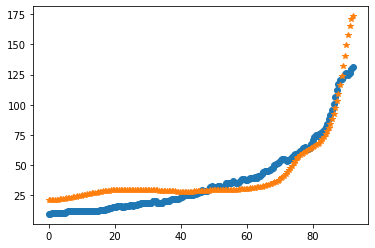

after perturb [8.773169378368207, 111.9752776918821, 29701.593645265904, 0.8621558243775878, 48.759110979986296]
parameters [8.773169378368207, 111.9752776918821, 29701.593645265904, 0.8621558243775878, 48.759110979986296]
after perturb [6.073091827067328, 133.74081541382128, 24996.332836291775, 0.7315004159293811, 38.969823470791546]
parameters [6.073091827067328, 133.74081541382128, 24996.332836291775, 0.7315004159293811, 38.969823470791546]
oxigeno [2.16607401e-11 2.18400196e-11 2.23809141e-11 2.32926530e-11
 2.45908252e-11 2.62976929e-11 2.84426410e-11 3.10627700e-11
 3.42036454e-11 3.79202195e-11 4.22779450e-11 4.73541029e-11
 5.32393746e-11 6.00396894e-11 6.78783884e-11 7.68987507e-11
 8.72669348e-11 9.91753995e-11 1.12846877e-10 1.28538985e-10
 1.46549570e-10 1.67222910e-10 1.90956892e-10 2.18211329e-10
 2.49517593e-10 2.85489759e-10 3.26837504e-10 3.74381021e-10
 4.29068277e-10 4.91994942e-10 5.64427431e-10 6.47829504e-10
 7.43892975e-10 8.54573150e-10 9.82129687e-10 1.12917371

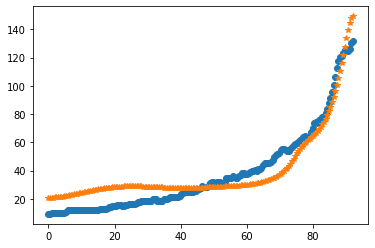

after perturb [6.652863946659969, 183.41815258978468, 28343.492137189653, 1.0844930353950886, 52.24242303569366]
parameters [6.652863946659969, 183.41815258978468, 28343.492137189653, 1.0844930353950886, 52.24242303569366]
after perturb [5.710739625948379, 127.99982739859277, 24962.904219396307, 0.8913400193883647, 50.151093248268]
parameters [5.710739625948379, 127.99982739859277, 24962.904219396307, 0.8913400193883647, 50.151093248268]
after perturb [4.340756562251759, 80.9045106697432, 20753.921311055485, 0.02390275263698094, 14.53262268009008]
parameters [4.340756562251759, 80.9045106697432, 20753.921311055485, 0.02390275263698094, 14.53262268009008]
oxigeno [ 0.71389894  0.71377108  0.71338824  0.71275258  0.71186766  0.71073842
  0.70937108  0.70777306  0.70595291  0.70392017  0.70168528  0.69925947
  0.69665463  0.69388318  0.69095804  0.68789242  0.68469981  0.68139387
  0.67798835  0.67449703  0.67093368  0.66731199  0.66364555  0.65994782
  0.65623208  0.65251144  0.64879879 

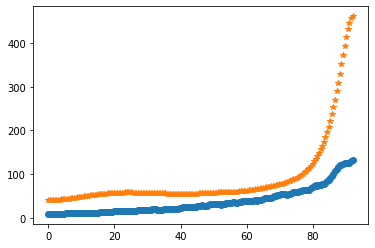

after perturb [2.465284428354088, 131.04542476404748, 19592.473765055613, 0.4919381012083722, 25.94013736197482]
parameters [2.465284428354088, 131.04542476404748, 19592.473765055613, 0.4919381012083722, 25.94013736197482]
after perturb [2.977214587176781, 145.5006188447148, 28763.14997236369, 0.9347756167969445, 30.86226364522433]
parameters [2.977214587176781, 145.5006188447148, 28763.14997236369, 0.9347756167969445, 30.86226364522433]
oxigeno [2.99287328e-12 3.01998463e-12 3.10184059e-12 3.24001945e-12
 3.43719380e-12 3.69719453e-12 4.02510237e-12 4.42736854e-12
 4.91196745e-12 5.48858444e-12 6.16884288e-12 6.96657586e-12
 7.89814871e-12 8.98284013e-12 1.02432914e-11 1.17060344e-11
 1.34021128e-11 1.53678108e-11 1.76455102e-11 2.02846956e-11
 2.33431370e-11 2.68882772e-11 3.09988631e-11 3.57668603e-11
 4.12997027e-11 4.77229322e-11 5.51832969e-11 6.38523848e-11
 7.39308847e-11 8.56535787e-11 9.92951894e-11 1.15177225e-10
 1.33675984e-10 1.55231915e-10 1.80360542e-10 2.09665216e-10
 

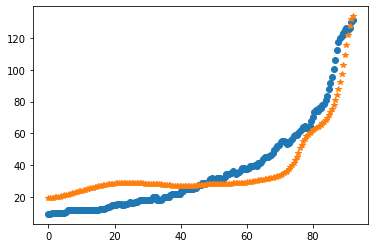

after perturb [3.278050155134953, 109.59320185196971, 22073.704305328072, 0.13814069280791919, 13.889684021970524]
parameters [3.278050155134953, 109.59320185196971, 22073.704305328072, 0.13814069280791919, 13.889684021970524]
oxigeno [2.27855980e-04 2.27775960e-04 2.27536874e-04 2.27141628e-04
 2.26595015e-04 2.25903637e-04 2.25075813e-04 2.24121452e-04
 2.23051925e-04 2.21879922e-04 2.20619309e-04 2.19284986e-04
 2.17892753e-04 2.16459196e-04 2.15001582e-04 2.13537772e-04
 2.12086165e-04 2.10665648e-04 2.09295578e-04 2.07995781e-04
 2.06786565e-04 2.05688752e-04 2.04723726e-04 2.03913491e-04
 2.03280740e-04 2.02848932e-04 2.02642378e-04 2.02686340e-04
 2.03007122e-04 2.03632186e-04 2.04590257e-04 2.05911453e-04
 2.07627404e-04 2.09771393e-04 2.12378496e-04 2.15485735e-04
 2.19132234e-04 2.23359391e-04 2.28211052e-04 2.33733701e-04
 2.39976654e-04 2.46992267e-04 2.54836165e-04 2.63567472e-04
 2.73249069e-04 2.83947873e-04 2.95735126e-04 3.08686729e-04
 3.22883586e-04 3.38411996e-04 3.

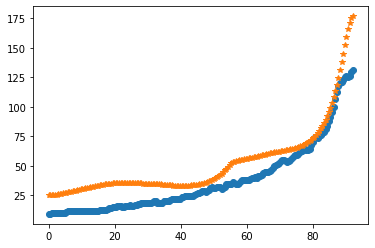

after perturb [5.8707951842279344, 151.70728274156644, 24354.78078160101, 0.5559813728989849, 28.60618144013894]
parameters [5.8707951842279344, 151.70728274156644, 24354.78078160101, 0.5559813728989849, 28.60618144013894]
after perturb [4.826472938149568, 87.2393464587052, 19170.330470346522, 0.25841342471189205, 29.700310516703098]
parameters [4.826472938149568, 87.2393464587052, 19170.330470346522, 0.25841342471189205, 29.700310516703098]
after perturb [7.128524735450335, 168.92620444896247, 34947.94673940721, 1.351095055591119, 53.10940120319875]
parameters [7.128524735450335, 168.92620444896247, 34947.94673940721, 1.351095055591119, 53.10940120319875]
after perturb [5.928189019120647, 126.76204981802401, 28812.38452244903, 0.9390017393990688, 41.384559422252806]
parameters [5.928189019120647, 126.76204981802401, 28812.38452244903, 0.9390017393990688, 41.384559422252806]
oxigeno [3.19973058e-13 3.23497854e-13 3.34151640e-13 3.52174665e-13
 3.77974239e-13 4.12135267e-13 4.55435418e-

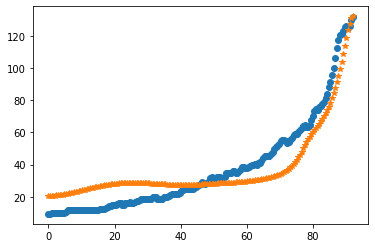

after perturb [11.837479084160178, 125.87036189611206, 28921.548012722797, 0.8977126198993554, 50.7064758048003]
parameters [11.837479084160178, 125.87036189611206, 28921.548012722797, 0.8977126198993554, 50.7064758048003]
after perturb [3.89472401437197, 119.77718281665534, 29584.227502245223, 0.8765555059425274, 40.066027849834256]
parameters [3.89472401437197, 119.77718281665534, 29584.227502245223, 0.8765555059425274, 40.066027849834256]
after perturb [1.7686657854504184, 131.37013539549562, 25379.278354672693, 0.7642672320107496, 34.481545234791284]
parameters [1.7686657854504184, 131.37013539549562, 25379.278354672693, 0.7642672320107496, 34.481545234791284]
oxigeno [9.92386342e-12 1.00057347e-11 1.02528483e-11 1.06697375e-11
 1.12640733e-11 1.20468396e-11 1.30325808e-11 1.42397277e-11
 1.56910060e-11 1.74139355e-11 1.94414287e-11 2.18125028e-11
 2.45731165e-11 2.77771506e-11 3.14875526e-11 3.57776700e-11
 4.07328054e-11 4.64520313e-11 5.30503161e-11 6.06610206e-11
 6.94388371e-1

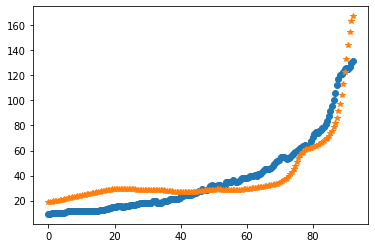

after perturb [7.5840169186662605, 146.23479950836708, 33756.917784604084, 1.1846573510833591, 47.802399108914805]
parameters [7.5840169186662605, 146.23479950836708, 33756.917784604084, 1.1846573510833591, 47.802399108914805]
after perturb [-0.4585915831045688, 108.08233366884005, 25793.957927765587, 0.34888473198099634, 17.819545478927203]
parameters [-0.4585915831045688, 108.08233366884005, 25793.957927765587, 0.34888473198099634, 17.819545478927203]
after perturb [4.342460866504047, 122.59487121314048, 26519.33195016175, 0.7076406791786816, 35.45406979376431]
parameters [4.342460866504047, 122.59487121314048, 26519.33195016175, 0.7076406791786816, 35.45406979376431]
oxigeno [9.93458027e-12 1.00212922e-11 1.02830005e-11 1.07244577e-11
 1.13537000e-11 1.21822225e-11 1.32252305e-11 1.45019711e-11
 1.60361523e-11 1.78564593e-11 1.99971791e-11 2.24989469e-11
 2.54096300e-11 2.87853719e-11 3.26918167e-11 3.72055445e-11
 4.24157494e-11 4.84261996e-11 5.53575244e-11 6.33498827e-11
 7.25660

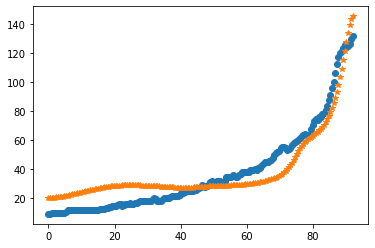

after perturb [6.306034980279515, 90.87148616015718, 20986.97051819366, 0.2573945878409174, 26.77742586080508]
parameters [6.306034980279515, 90.87148616015718, 20986.97051819366, 0.2573945878409174, 26.77742586080508]
oxigeno [6.53095205e-07 6.52712725e-07 6.51569557e-07 6.49678491e-07
 6.47060723e-07 6.43745700e-07 6.39770892e-07 6.35181527e-07
 6.30030291e-07 6.24377006e-07 6.18288304e-07 6.11837310e-07
 6.05103356e-07 5.98171730e-07 5.91133494e-07 5.84085364e-07
 5.77129689e-07 5.70374524e-07 5.63933818e-07 5.57927736e-07
 5.52483106e-07 5.47734022e-07 5.43822608e-07 5.40899951e-07
 5.39127211e-07 5.38676937e-07 5.39734583e-07 5.42500254e-07
 5.47190693e-07 5.54041523e-07 5.63309782e-07 5.75276754e-07
 5.90251139e-07 6.08572583e-07 6.30615609e-07 6.56793977e-07
 6.87565519e-07 7.23437498e-07 7.64972536e-07 8.12795171e-07
 8.67599105e-07 9.30155210e-07 1.00132037e-06 1.08204725e-06
 1.17339507e-06 1.27654154e-06 1.39279595e-06 1.52361374e-06
 1.67061247e-06 1.83558954e-06 2.02054168

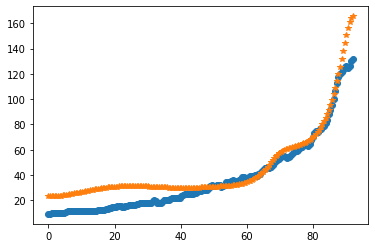

after perturb [2.472448159124498, 131.46817941600787, 22570.918370641233, 0.4498384942435743, 4.45628342982139]
parameters [2.472448159124498, 131.46817941600787, 22570.918370641233, 0.4498384942435743, 4.45628342982139]
after perturb [6.289384508082586, 87.03167351266981, 20955.529659083728, 0.365353749060361, 27.269859046003557]
parameters [6.289384508082586, 87.03167351266981, 20955.529659083728, 0.365353749060361, 27.269859046003557]
oxigeno [3.85826883e-09 3.85700486e-09 3.85327220e-09 3.84724873e-09
 3.83923140e-09 3.82963702e-09 3.81900358e-09 3.80799221e-09
 3.79738988e-09 3.78811339e-09 3.78121450e-09 3.77788692e-09
 3.77947515e-09 3.78748583e-09 3.80360181e-09 3.82969946e-09
 3.86786969e-09 3.92044325e-09 3.99002079e-09 4.07950840e-09
 4.19215935e-09 4.33162282e-09 4.50200048e-09 4.70791205e-09
 4.95457091e-09 5.24787115e-09 5.59448753e-09 6.00199006e-09
 6.47897518e-09 7.03521569e-09 7.68183200e-09 8.43148742e-09
 9.29861090e-09 1.02996506e-08 1.14533628e-08 1.27811401e-08
 

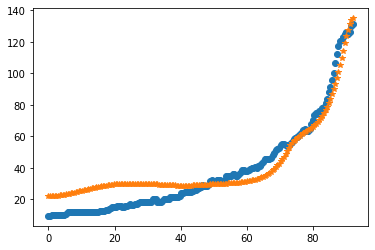

after perturb [4.371346347674522, 132.27244360230702, 24218.7388761012, 0.5695669548682973, 30.585960592797377]
parameters [4.371346347674522, 132.27244360230702, 24218.7388761012, 0.5695669548682973, 30.585960592797377]
oxigeno [3.89819655e-10 3.92386822e-10 4.00123960e-10 4.13138590e-10
 4.31611982e-10 4.55802281e-10 4.86048953e-10 5.22778617e-10
 5.66512355e-10 6.17874600e-10 6.77603774e-10 7.46564814e-10
 8.25763830e-10 9.16365107e-10 1.01971078e-09 1.13734350e-09
 1.27103247e-09 1.42280339e-09 1.59497273e-09 1.79018707e-09
 2.01146805e-09 2.26226394e-09 2.54650851e-09 2.86868843e-09
 3.23392022e-09 3.64803824e-09 4.11769508e-09 4.65047603e-09
 5.25502978e-09 5.94121707e-09 6.72028012e-09 7.60503525e-09
 8.61009181e-09 9.75210079e-09 1.10500369e-08 1.25255184e-08
 1.42031692e-08 1.61110290e-08 1.82810171e-08 2.07494568e-08
 2.35576678e-08 2.67526354e-08 3.03877667e-08 3.45237439e-08
 3.92294880e-08 4.45832474e-08 5.06738269e-08 5.76019767e-08
 6.54819616e-08 7.44433351e-08 8.463294

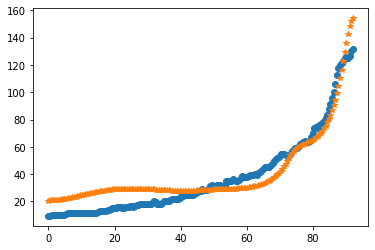

after perturb [3.8638175561974677, 83.33858759789155, 23474.90534324798, 0.3134892744221591, 19.86078085246214]
parameters [3.8638175561974677, 83.33858759789155, 23474.90534324798, 0.3134892744221591, 19.86078085246214]
oxigeno [4.15667678e-08 4.15318567e-08 4.14275738e-08 4.12552634e-08
 4.10171434e-08 4.07162736e-08 4.03565127e-08 3.99424685e-08
 3.94794416e-08 3.89733687e-08 3.84307654e-08 3.78586743e-08
 3.72646196e-08 3.66565719e-08 3.60429244e-08 3.54324838e-08
 3.48344762e-08 3.42585701e-08 3.37149176e-08 3.32142142e-08
 3.27677783e-08 3.23876521e-08 3.20867239e-08 3.18788741e-08
 3.17791463e-08 3.18039457e-08 3.19712675e-08 3.23009584e-08
 3.28150148e-08 3.35379224e-08 3.44970411e-08 3.57230423e-08
 3.72504036e-08 3.91179682e-08 4.13695769e-08 4.40547822e-08
 4.72296528e-08 5.09576802e-08 5.53107997e-08 6.03705384e-08
 6.62293070e-08 7.29918510e-08 8.07768816e-08 8.97189081e-08
 9.99702983e-08 1.11703593e-07 1.25114110e-07 1.40422875e-07
 1.57879920e-07 1.77767999e-07 2.004067

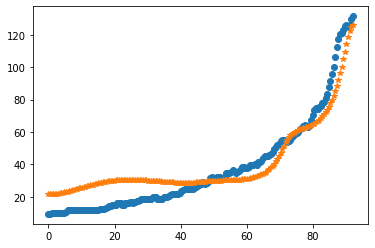

after perturb [6.942431833657345, 109.707695054449, 25926.114254517608, 0.36890617884017074, 35.03456126185892]
parameters [6.942431833657345, 109.707695054449, 25926.114254517608, 0.36890617884017074, 35.03456126185892]
oxigeno [7.30808091e-09 7.33032721e-09 7.39736952e-09 7.51012192e-09
 7.67012058e-09 7.87954308e-09 8.14123588e-09 8.45875029e-09
 8.83638772e-09 9.27925466e-09 9.79332838e-09 1.03855344e-08
 1.10638366e-08 1.18373420e-08 1.27164205e-08 1.37128432e-08
 1.48399391e-08 1.61127743e-08 1.75483553e-08 1.91658592e-08
 2.09868950e-08 2.30357978e-08 2.53399619e-08 2.79302162e-08
 3.08412467e-08 3.41120733e-08 3.77865848e-08 4.19141414e-08
 4.65502512e-08 5.17573291e-08 5.76055492e-08 6.41737998e-08
 7.15507534e-08 7.98360659e-08 8.91417173e-08 9.95935129e-08
 1.11332761e-07 1.24518147e-07 1.39327829e-07 1.55961776e-07
 1.74644376e-07 1.95627352e-07 2.19193005e-07 2.45657841e-07
 2.75376604e-07 3.08746779e-07 3.46213605e-07 3.88275661e-07
 4.35491088e-07 4.88484515e-07 5.479547

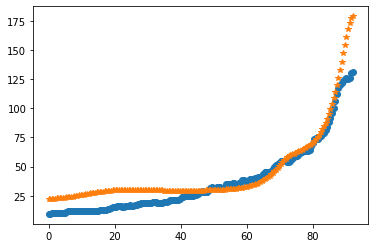

after perturb [3.386790098391219, 176.5619119576793, 29972.65225935937, 1.0801582385194985, 37.87700240485517]
parameters [3.386790098391219, 176.5619119576793, 29972.65225935937, 1.0801582385194985, 37.87700240485517]
after perturb [5.10019128507842, 84.57845889680968, 20907.92971713713, 0.25911385614621696, 13.850376220181182]
parameters [5.10019128507842, 84.57845889680968, 20907.92971713713, 0.25911385614621696, 13.850376220181182]
oxigeno [4.25837077e-07 4.25527087e-07 4.24600167e-07 4.23065431e-07
 4.20937940e-07 4.18238523e-07 4.14993522e-07 4.11234501e-07
 4.06997898e-07 4.02324666e-07 3.97259891e-07 3.91852420e-07
 3.86154503e-07 3.80221470e-07 3.74111452e-07 3.67885160e-07
 3.61605723e-07 3.55338612e-07 3.49151637e-07 3.43115036e-07
 3.37301659e-07 3.31787247e-07 3.26650814e-07 3.21975139e-07
 3.17847370e-07 3.14359740e-07 3.11610421e-07 3.09704499e-07
 3.08755103e-07 3.08884679e-07 3.10226442e-07 3.12926005e-07
 3.17143212e-07 3.23054190e-07 3.30853647e-07 3.40757429e-07
 3.

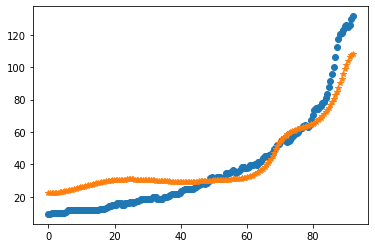

after perturb [4.654421992532421, 144.87988843682967, 25494.002833709194, 0.589161153537303, 17.994668481049573]
parameters [4.654421992532421, 144.87988843682967, 25494.002833709194, 0.589161153537303, 17.994668481049573]
oxigeno [7.96863108e-10 8.01806959e-10 8.16703195e-10 8.41746925e-10
 8.77266873e-10 9.23730744e-10 9.81752854e-10 1.05210411e-09
 1.13572450e-09 1.23373832e-09 1.34747225e-09 1.47847672e-09
 1.62855076e-09 1.79977083e-09 1.99452401e-09 2.21554618e-09
 2.46596578e-09 2.74935380e-09 3.06978103e-09 3.43188330e-09
 3.84093602e-09 4.30293900e-09 4.82471328e-09 5.41401127e-09
 6.07964218e-09 6.83161468e-09 7.68129912e-09 8.64161179e-09
 9.72722419e-09 1.09548004e-08 1.23432664e-08 1.39141145e-08
 1.56917490e-08 1.77038763e-08 1.99819456e-08 2.25616475e-08
 2.54834758e-08 2.87933613e-08 3.25433858e-08 3.67925867e-08
 4.16078629e-08 4.70649937e-08 5.32497868e-08 6.02593682e-08
 6.82036352e-08 7.72068904e-08 8.74096808e-08 9.89708683e-08
 1.12069960e-07 1.26909731e-07 1.4371

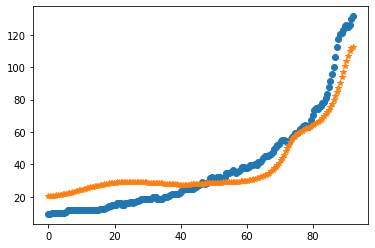

after perturb [3.0125072194148617, 125.02570710810535, 22934.25198628043, 0.45494915538298764, 17.984205240035124]
parameters [3.0125072194148617, 125.02570710810535, 22934.25198628043, 0.45494915538298764, 17.984205240035124]
oxigeno [2.26750475e-09 2.28020126e-09 2.31844931e-09 2.38272703e-09
 2.47383959e-09 2.59293184e-09 2.74150609e-09 2.92144525e-09
 3.13504163e-09 3.38503167e-09 3.67463707e-09 4.00761283e-09
 4.38830287e-09 4.82170413e-09 5.31353999e-09 5.87034442e-09
 6.49955795e-09 7.20963731e-09 8.01018052e-09 8.91206940e-09
 9.92763213e-09 1.10708282e-08 1.23574593e-08 1.38054083e-08
 1.54349118e-08 1.72688690e-08 1.93331912e-08 2.16571985e-08
 2.42740683e-08 2.72213415e-08 3.05414947e-08 3.42825848e-08
 3.84989750e-08 4.32521519e-08 4.86116429e-08 5.46560452e-08
 6.14741790e-08 6.91663767e-08 7.78459227e-08 8.76406597e-08
 9.86947776e-08 1.11170807e-07 1.25251837e-07 1.41143987e-07
 1.59079157e-07 1.79318104e-07 2.02153872e-07 2.27915641e-07
 2.56973032e-07 2.89740957e-07 3.

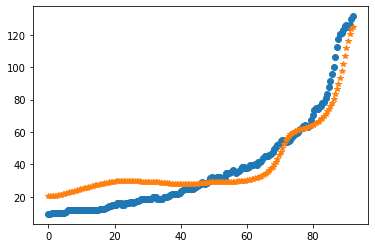

after perturb [8.794141905424414, 113.47407202434994, 34573.37479609746, 0.783058824773819, 47.12639919368845]
parameters [8.794141905424414, 113.47407202434994, 34573.37479609746, 0.783058824773819, 47.12639919368845]
after perturb [4.2178049189623685, 122.11802907367301, 27550.665490691874, 0.5996426180197277, 41.01318526603415]
parameters [4.2178049189623685, 122.11802907367301, 27550.665490691874, 0.5996426180197277, 41.01318526603415]
oxigeno [7.35003172e-11 7.40514376e-11 7.57134636e-11 7.85125566e-11
 8.24928801e-11 8.77174515e-11 9.42693558e-11 1.02253341e-10
 1.11797828e-10 1.23057362e-10 1.36215566e-10 1.51488635e-10
 1.69129450e-10 1.89432379e-10 2.12738879e-10 2.39443978e-10
 2.70003804e-10 3.04944278e-10 3.44871168e-10 3.90481698e-10
 4.42577952e-10 5.02082337e-10 5.70055425e-10 6.47716523e-10
 7.36467388e-10 8.37919551e-10 9.53925791e-10 1.08661636e-09
 1.23844065e-09 1.41221514e-09 1.61117842e-09 1.83905440e-09
 2.10012486e-09 2.39931250e-09 2.74227622e-09 3.13552003e-09

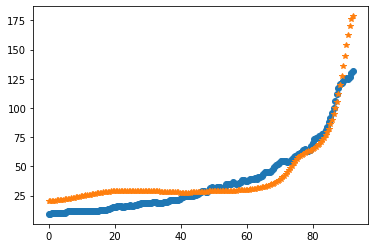

after perturb [4.0176747906933805, 131.77163483412255, 27042.213357234534, 0.6185399142743095, 42.41672613759209]
parameters [4.0176747906933805, 131.77163483412255, 27042.213357234534, 0.6185399142743095, 42.41672613759209]
oxigeno [1.35870017e-10 1.36826279e-10 1.39709282e-10 1.44561933e-10
 1.51456634e-10 1.60496612e-10 1.71817834e-10 1.85591506e-10
 2.02027212e-10 2.21376749e-10 2.43938714e-10 2.70063927e-10
 3.00161792e-10 3.34707701e-10 3.74251635e-10 4.19428101e-10
 4.70967619e-10 5.29709961e-10 5.96619402e-10 6.72802282e-10
 7.59527220e-10 8.58248365e-10 9.70632131e-10 1.09858794e-09
 1.24430352e-09 1.41028550e-09 1.59940596e-09 1.81495582e-09
 2.06070615e-09 2.34097825e-09 2.66072405e-09 3.02561791e-09
 3.44216168e-09 3.91780458e-09 4.46107993e-09 5.08176112e-09
 5.79103912e-09 6.60172451e-09 7.52847720e-09 8.58806746e-09
 9.79967230e-09 1.11852120e-08 1.27697321e-08 1.45818363e-08
 1.66541786e-08 1.90240211e-08 2.17338673e-08 2.48321812e-08
 2.83742046e-08 3.24228850e-08 3.70

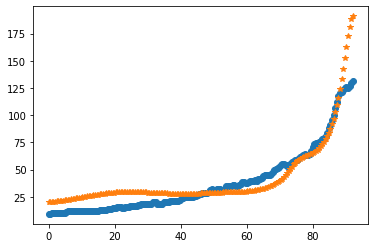

after perturb [7.800557025282243, 70.68443396462533, 27341.714471063042, 0.1935769627079249, 34.01205318526597]
parameters [7.800557025282243, 70.68443396462533, 27341.714471063042, 0.1935769627079249, 34.01205318526597]
after perturb [6.136770569190055, 140.72830809714262, 27009.92005491873, 0.8312282109421453, 38.004321223501364]
parameters [6.136770569190055, 140.72830809714262, 27009.92005491873, 0.8312282109421453, 38.004321223501364]
oxigeno [8.57520058e-12 8.65052404e-12 8.87785629e-12 9.26131186e-12
 9.80784543e-12 1.05273997e-11 1.14331171e-11 1.25416198e-11
 1.38733649e-11 1.54530814e-11 1.73103002e-11 1.94799889e-11
 2.20033040e-11 2.49284801e-11 2.83118743e-11 3.22191902e-11
 3.67269097e-11 4.19239653e-11 4.79136897e-11 5.48160898e-11
 6.27704951e-11 7.19386410e-11 8.25082594e-11 9.46972552e-11
 1.08758567e-10 1.24985818e-10 1.43719889e-10 1.65356557e-10
 1.90355372e-10 2.19249967e-10 2.52660034e-10 2.91305219e-10
 3.36021249e-10 3.87778636e-10 4.47704351e-10 5.17106957e-10

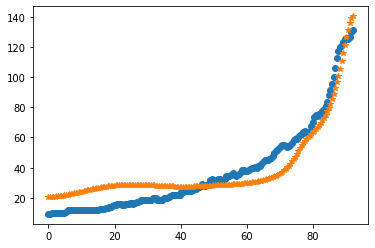

after perturb [5.529768152757599, 193.74333260927813, 28341.622417040075, 1.2245093424384825, 44.3781955099914]
parameters [5.529768152757599, 193.74333260927813, 28341.622417040075, 1.2245093424384825, 44.3781955099914]
after perturb [5.199067388717729, 139.94993568571653, 22902.94582383494, 0.877419570405588, 32.32150652151953]
parameters [5.199067388717729, 139.94993568571653, 22902.94582383494, 0.877419570405588, 32.32150652151953]
oxigeno [3.93139831e-12 3.96764880e-12 4.07709115e-12 4.26181361e-12
 4.52534904e-12 4.87275473e-12 5.31072687e-12 5.84775211e-12
 6.49429990e-12 7.26306007e-12 8.16923123e-12 9.23086685e-12
 1.04692872e-11 1.19095670e-11 1.35811107e-11 1.55183291e-11
 1.77614335e-11 2.03573669e-11 2.33608955e-11 2.68358861e-11
 3.08568009e-11 3.55104475e-11 4.08980247e-11 4.71375156e-11
 5.43664859e-11 6.27453548e-11 7.24612176e-11 8.37323123e-11
 9.68132363e-11 1.12001037e-10 1.29642322e-10 1.50141548e-10
 1.73970696e-10 2.01680539e-10 2.33913767e-10 2.71420274e-10
 3.

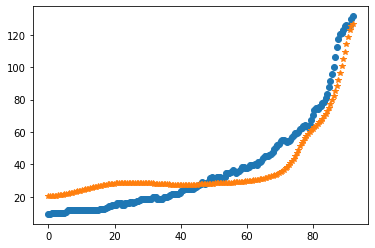

after perturb [2.8872511768002296, 119.87267361921039, 18868.043207462153, 0.14933463684833137, 15.89052550744558]
parameters [2.8872511768002296, 119.87267361921039, 18868.043207462153, 0.14933463684833137, 15.89052550744558]
after perturb [5.547203484812909, 165.98229062974087, 31391.89252615745, 1.0468351719913827, 35.27483383847594]
parameters [5.547203484812909, 165.98229062974087, 31391.89252615745, 1.0468351719913827, 35.27483383847594]
after perturb [7.673808487838384, 110.1962612258641, 21611.128500733106, 0.43109557244586927, 36.38324269613866]
parameters [7.673808487838384, 110.1962612258641, 21611.128500733106, 0.43109557244586927, 36.38324269613866]
after perturb [3.8143512458314985, 150.37932910156263, 22104.924942982692, 0.7275981654777673, 19.219396579498447]
parameters [3.8143512458314985, 150.37932910156263, 22104.924942982692, 0.7275981654777673, 19.219396579498447]
after perturb [5.749187683950231, 111.9575186627479, 31096.22948751365, 0.6719820511632734, 37.0262716

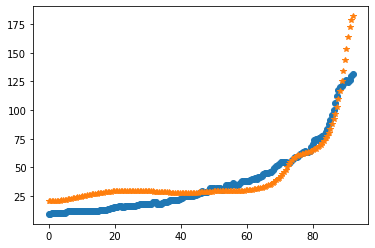

after perturb [4.097942655048507, 136.16781323017113, 22191.34325359833, 0.4922802739221758, 29.733576606400188]
parameters [4.097942655048507, 136.16781323017113, 22191.34325359833, 0.4922802739221758, 29.733576606400188]
oxigeno [2.69732060e-09 2.71227072e-09 2.75729899e-09 2.83294177e-09
 2.94010202e-09 3.08006294e-09 3.25450728e-09 3.46554257e-09
 3.71573247e-09 4.00813484e-09 4.34634682e-09 4.73455761e-09
 5.17760962e-09 5.68106903e-09 6.25130652e-09 6.89558956e-09
 7.62218765e-09 8.44049199e-09 9.36115153e-09 1.03962275e-08
 1.15593685e-08 1.28660098e-08 1.43335980e-08 1.59818465e-08
 1.78330244e-08 1.99122829e-08 2.22480246e-08 2.48723200e-08
 2.78213779e-08 3.11360753e-08 3.48625539e-08 3.90528910e-08
 4.37658534e-08 4.90677437e-08 5.50333488e-08 6.17470027e-08
 6.93037752e-08 7.78108019e-08 8.73887691e-08 9.81735726e-08
 1.10318169e-07 1.23994640e-07 1.39396499e-07 1.56741260e-07
 1.76273308e-07 1.98267104e-07 2.23030765e-07 2.50910061e-07
 2.82292895e-07 3.17614307e-07 3.5736

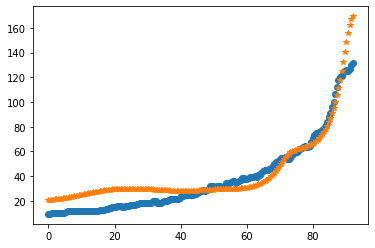

after perturb [5.309433587786179, 140.25307479903307, 27059.25086123727, 0.5716676602504998, 32.5261530836506]
parameters [5.309433587786179, 140.25307479903307, 27059.25086123727, 0.5716676602504998, 32.5261530836506]
oxigeno [7.58816415e-10 7.63544898e-10 7.77792075e-10 8.01744134e-10
 8.35714729e-10 8.80150047e-10 9.35636005e-10 1.00290769e-09
 1.08286116e-09 1.17656788e-09 1.28529181e-09 1.41050970e-09
 1.55393465e-09 1.71754349e-09 1.90360826e-09 2.11473254e-09
 2.35389291e-09 2.62448653e-09 2.93038536e-09 3.27599812e-09
 3.66634089e-09 4.10711750e-09 4.60481111e-09 5.16678837e-09
 5.80141791e-09 6.51820498e-09 7.32794444e-09 8.24289442e-09
 9.27697336e-09 1.04459835e-08 1.17678638e-08 1.32629773e-08
 1.49544349e-08 1.68684623e-08 1.90348151e-08 2.14872468e-08
 2.42640371e-08 2.74085885e-08 3.09700981e-08 3.50043150e-08
 3.95743938e-08 4.47518551e-08 5.06176675e-08 5.72634647e-08
 6.47929162e-08 7.33232689e-08 8.29870828e-08 9.39341834e-08
 1.06333859e-07 1.20377333e-07 1.36280545

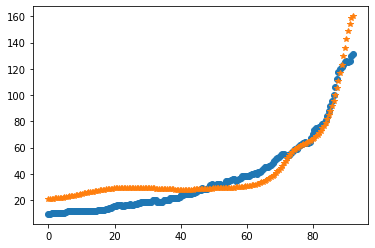

after perturb [3.7590492920147787, 114.35829516390072, 29474.620524732643, 0.6847616763669102, 39.42693593257908]
parameters [3.7590492920147787, 114.35829516390072, 29474.620524732643, 0.6847616763669102, 39.42693593257908]
after perturb [-1.7570383999730437, 160.0911694327902, 28596.097195999722, 0.5859073768341307, 21.765714474180626]
parameters [-1.7570383999730437, 160.0911694327902, 28596.097195999722, 0.5859073768341307, 21.765714474180626]
after perturb [4.5881520452497675, 147.52034531565093, 26774.08267269533, 0.6718209906388009, 30.83552235403182]
parameters [4.5881520452497675, 147.52034531565093, 26774.08267269533, 0.6718209906388009, 30.83552235403182]
oxigeno [2.31150453e-10 2.32713937e-10 2.37426658e-10 2.45355824e-10
 2.56614767e-10 2.71364955e-10 2.89818843e-10 3.12243623e-10
 3.38965924e-10 3.70377551e-10 4.06942346e-10 4.49204301e-10
 4.97797057e-10 5.53454958e-10 6.17025855e-10 6.89485893e-10
 7.71956550e-10 8.65724234e-10 9.72262808e-10 1.09325944e-09
 1.23064428e

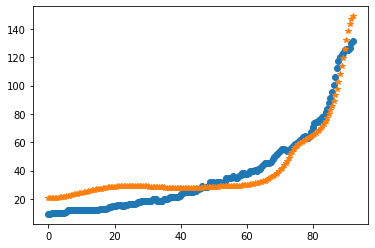

after perturb [5.301069068729937, 106.0820876840153, 23370.939642741723, 0.598384014297332, 34.44223454802285]
parameters [5.301069068729937, 106.0820876840153, 23370.939642741723, 0.598384014297332, 34.44223454802285]
oxigeno [1.10012475e-11 1.10994364e-11 1.13958172e-11 1.18958715e-11
 1.26088666e-11 1.35480560e-11 1.47309653e-11 1.61797718e-11
 1.79217840e-11 1.99900331e-11 2.24239896e-11 2.52704202e-11
 2.85844057e-11 3.24305412e-11 3.68843477e-11 4.20339257e-11
 4.79818900e-11 5.48476290e-11 6.27699407e-11 7.19101069e-11
 8.24554751e-11 9.46236311e-11 1.08667258e-10 1.24879793e-10
 1.43602010e-10 1.65229683e-10 1.90222492e-10 2.19114383e-10
 2.52525613e-10 2.91176737e-10 3.35904858e-10 3.87682483e-10
 4.47639407e-10 5.17088080e-10 5.97553017e-10 6.90804851e-10
 7.98899766e-10 9.24225121e-10 1.06955221e-09 1.23809723e-09
 1.43359178e-09 1.66036420e-09 1.92343354e-09 2.22861796e-09
 2.58265983e-09 2.99337001e-09 3.46979422e-09 4.02240492e-09
 4.66332238e-09 5.40656960e-09 6.26836601

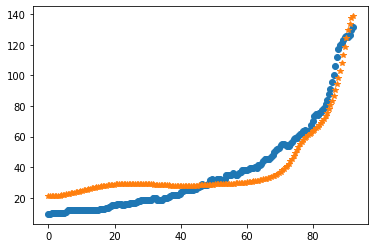

after perturb [8.854253232034697, 33.30418531804482, 20273.660485208373, -0.07134169162723092, 16.62284124620407]
parameters [8.854253232034697, 33.30418531804482, 20273.660485208373, -0.07134169162723092, 16.62284124620407]
after perturb [5.969159028493392, 119.87238219499164, 26692.564718129455, 0.4212101677246167, 42.79897520578201]
parameters [5.969159028493392, 119.87238219499164, 26692.564718129455, 0.4212101677246167, 42.79897520578201]
oxigeno [3.20850610e-09 3.22485066e-09 3.27408098e-09 3.35678974e-09
 3.47397413e-09 3.62705003e-09 3.81787216e-09 4.04876044e-09
 4.32253298e-09 4.64254608e-09 5.01274182e-09 5.43770401e-09
 5.92272314e-09 6.47387133e-09 7.09808840e-09 7.80328014e-09
 8.59843041e-09 9.49372846e-09 1.05007135e-08 1.16324383e-08
 1.29036548e-08 1.43310233e-08 1.59333493e-08 1.77318508e-08
 1.97504596e-08 2.20161610e-08 2.45593767e-08 2.74143958e-08
 3.06198594e-08 3.42193059e-08 3.82617837e-08 4.28025385e-08
 4.79037853e-08 5.36355737e-08 6.00767574e-08 6.73160807

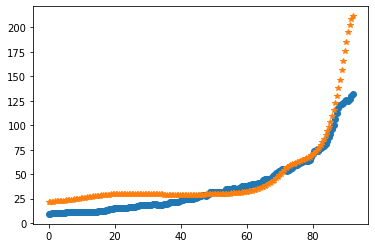

after perturb [2.8260187968078725, 163.31820507313117, 29609.765549924323, 1.1706740460011889, 38.946665705609625]
parameters [2.8260187968078725, 163.31820507313117, 29609.765549924323, 1.1706740460011889, 38.946665705609625]
after perturb [0.6837893431022648, 111.70511242880175, 22586.43497631775, 0.06742604317679102, 8.654381837354393]
parameters [0.6837893431022648, 111.70511242880175, 22586.43497631775, 0.06742604317679102, 8.654381837354393]
after perturb [7.705929052411119, 122.61733173844021, 29122.005585304632, 0.5085272283522035, 43.54302001742646]
parameters [7.705929052411119, 122.61733173844021, 29122.005585304632, 0.5085272283522035, 43.54302001742646]
after perturb [5.023427343962204, 135.38953079284522, 23666.395382727296, 0.5554101569160614, 26.97104070589745]
parameters [5.023427343962204, 135.38953079284522, 23666.395382727296, 0.5554101569160614, 26.97104070589745]
oxigeno [6.90096024e-10 6.94467431e-10 7.07639703e-10 7.29787954e-10
 7.61207235e-10 8.02317382e-10 8.

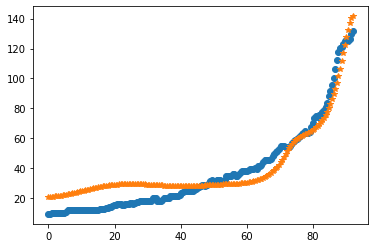

after perturb [0.9479171819504737, 126.34627458089392, 18259.679184094315, 0.48357564473302994, 18.667642782405096]
parameters [0.9479171819504737, 126.34627458089392, 18259.679184094315, 0.48357564473302994, 18.667642782405096]
after perturb [5.7820091335100905, 178.36938065694594, 28838.474103735545, 0.9988906733701406, 33.86098941040787]
parameters [5.7820091335100905, 178.36938065694594, 28838.474103735545, 0.9988906733701406, 33.86098941040787]
after perturb [4.763234238548025, 72.78605953824292, 21922.450932780706, -0.0021752621346562417, 15.048224277353405]
parameters [4.763234238548025, 72.78605953824292, 21922.450932780706, -0.0021752621346562417, 15.048224277353405]
after perturb [6.475983391896321, 57.783079749412174, 24354.730856952134, 0.125321855013638, 12.33820415390866]
parameters [6.475983391896321, 57.783079749412174, 24354.730856952134, 0.125321855013638, 12.33820415390866]
oxigeno [3.27563395e-04 3.27354356e-04 3.26728583e-04 3.25690088e-04
 3.24245496e-04 3.2240395

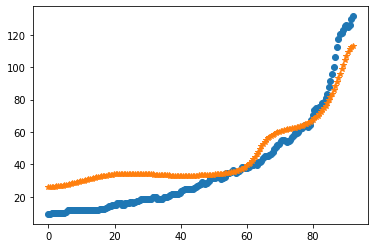

after perturb [6.195231481175237, 148.47974313538717, 25260.73184612226, 1.2140533863113325, 37.90898219156239]
parameters [6.195231481175237, 148.47974313538717, 25260.73184612226, 1.2140533863113325, 37.90898219156239]
oxigeno [8.96391419e-14 9.06888389e-14 9.38630829e-14 9.92380211e-14
 1.06942880e-13 1.17163507e-13 1.30147482e-13 1.46210930e-13
 1.65747265e-13 1.89238099e-13 2.17266657e-13 2.50534097e-13
 2.89879211e-13 3.36302121e-13 3.90992662e-13 4.55364329e-13
 5.31094802e-13 6.20174289e-13 7.24963157e-13 8.48260609e-13
 9.93386507e-13 1.16427884e-12 1.36560983e-12 1.60292421e-12
 1.88280393e-12 2.21306434e-12 2.60298774e-12 3.06360154e-12
 3.60800944e-12 4.25178561e-12 5.01344387e-12 5.91499585e-12
 6.98261505e-12 8.24742649e-12 9.74644534e-12 1.15236925e-11
 1.36315200e-11 1.61321844e-11 1.90997153e-11 2.26221320e-11
 2.68040731e-11 3.17699147e-11 3.76674661e-11 4.46723493e-11
 5.29931862e-11 6.28777409e-11 7.46201910e-11 8.85697318e-11
 1.05140756e-10 1.24824890e-10 1.482052

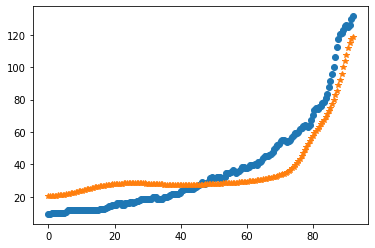

after perturb [7.443729839186595, 131.32442355645247, 30916.607566085015, 0.7139768119723753, 38.4858828452074]
parameters [7.443729839186595, 131.32442355645247, 30916.607566085015, 0.7139768119723753, 38.4858828452074]
after perturb [4.91732732791461, 91.761966335436, 23476.05346911486, 0.58116126416384, 32.94617532014265]
parameters [4.91732732791461, 91.761966335436, 23476.05346911486, 0.58116126416384, 32.94617532014265]
oxigeno [2.03435596e-12 2.05311921e-12 2.10981423e-12 2.20566671e-12
 2.34275226e-12 2.52404658e-12 2.75349742e-12 3.03612018e-12
 3.37811963e-12 3.78704085e-12 4.27195319e-12 4.84367211e-12
 5.51502447e-12 6.30116423e-12 7.21994669e-12 8.29237109e-12
 9.54310297e-12 1.10010901e-11 1.27002882e-11 1.46805149e-11
 1.69884555e-11 1.96788458e-11 2.28158637e-11 2.64747660e-11
 3.07438131e-11 3.57265316e-11 4.15443743e-11 4.83398451e-11
 5.62801708e-11 6.55616120e-11 7.64145238e-11 8.91092928e-11
 1.03963300e-10 1.21349083e-10 1.41703893e-10 1.65540892e-10
 1.93462247e-

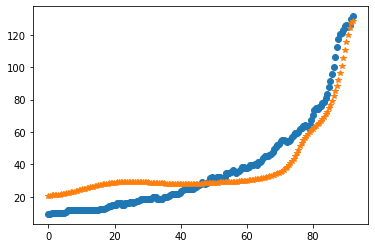

after perturb [3.8652991483220642, 174.64082535184042, 26944.989281697035, 1.217360716907734, 59.617992092713536]
parameters [3.8652991483220642, 174.64082535184042, 26944.989281697035, 1.217360716907734, 59.617992092713536]
after perturb [3.7905820343532457, 138.6927760299965, 25871.770701474597, 0.7494977505942635, 26.534792409652276]
parameters [3.7905820343532457, 138.6927760299965, 25871.770701474597, 0.7494977505942635, 26.534792409652276]
oxigeno [2.74168133e-11 2.76349627e-11 2.82930665e-11 2.94021676e-11
 3.09809247e-11 3.30559990e-11 3.56626043e-11 3.88452325e-11
 4.26585670e-11 4.71686024e-11 5.24539923e-11 5.86076524e-11
 6.57386506e-11 7.39744252e-11 8.34633764e-11 9.43778871e-11
 1.06917838e-10 1.21314694e-10 1.37836253e-10 1.56792154e-10
 1.78540281e-10 2.03494186e-10 2.32131707e-10 2.65004964e-10
 3.02751952e-10 3.46109981e-10 3.95931246e-10 4.53200871e-10
 5.19057790e-10 5.94818904e-10 6.82007018e-10 7.82383111e-10
 8.97983593e-10 1.03116328e-09 1.18464492e-09 1.361576

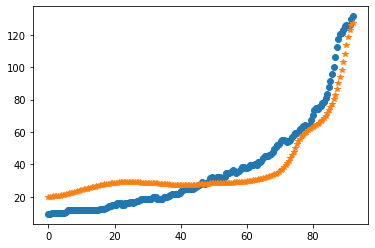

after perturb [3.278407577511238, 109.24997549004787, 28198.694724194822, 0.4294645947023009, 32.16457510808031]
parameters [3.278407577511238, 109.24997549004787, 28198.694724194822, 0.4294645947023009, 32.16457510808031]
oxigeno [1.05629349e-09 1.06142942e-09 1.07691131e-09 1.10296265e-09
 1.13995983e-09 1.18843805e-09 1.24909977e-09 1.32282570e-09
 1.41068862e-09 1.51397012e-09 1.63418067e-09 1.77308316e-09
 1.93272045e-09 2.11544728e-09 2.32396717e-09 2.56137485e-09
 2.83120508e-09 3.13748858e-09 3.48481617e-09 3.87841225e-09
 4.32421879e-09 4.82899143e-09 5.40040933e-09 6.04720050e-09
 6.77928490e-09 7.60793754e-09 8.54597425e-09 9.60796314e-09
 1.08104649e-08 1.21723061e-08 1.37148885e-08 1.54625408e-08
 1.74429162e-08 1.96874418e-08 2.22318271e-08 2.51166369e-08
 2.83879373e-08 3.20980228e-08 3.63062330e-08 4.10798705e-08
 4.64952306e-08 5.26387558e-08 5.96083308e-08 6.75147336e-08
 7.64832647e-08 8.66555744e-08 9.81917171e-08 1.11272462e-07
 1.26101894e-07 1.42910349e-07 1.6195

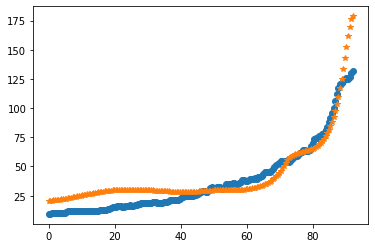

after perturb [6.33541165428195, 95.64346064795555, 17708.344038736832, 0.24469286283007782, 29.668178046542007]
parameters [6.33541165428195, 95.64346064795555, 17708.344038736832, 0.24469286283007782, 29.668178046542007]
after perturb [3.3853212254159684, 137.7159949603962, 23589.959060928955, 0.5460957311605994, 28.958269187294455]
parameters [3.3853212254159684, 137.7159949603962, 23589.959060928955, 0.5460957311605994, 28.958269187294455]
oxigeno [1.02454937e-09 1.03066630e-09 1.04909595e-09 1.08007626e-09
 1.12400817e-09 1.18146218e-09 1.25318766e-09 1.34012509e-09
 1.44342112e-09 1.56444703e-09 1.70482047e-09 1.86643100e-09
 2.05146981e-09 2.26246398e-09 2.50231588e-09 2.77434839e-09
 3.08235671e-09 3.43066749e-09 3.82420658e-09 4.26857628e-09
 4.77014364e-09 5.33614112e-09 5.97478156e-09 6.69538906e-09
 7.50854822e-09 8.42627390e-09 9.46220438e-09 1.06318208e-08
 1.19526961e-08 1.34447778e-08 1.51307079e-08 1.70361850e-08
 1.91903739e-08 2.16263679e-08 2.43817101e-08 2.74989811

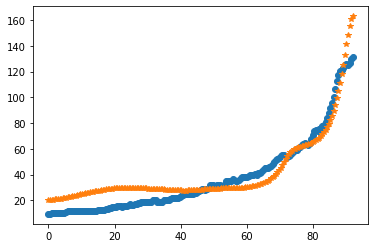

after perturb [4.154209325870893, 165.90506036015358, 21823.12313359923, 0.7534310357660545, 27.740824736081972]
parameters [4.154209325870893, 165.90506036015358, 21823.12313359923, 0.7534310357660545, 27.740824736081972]
after perturb [1.669170820127336, 125.27297262393422, 18790.852297704238, 0.7343305913046729, 38.46023471755785]
parameters [1.669170820127336, 125.27297262393422, 18790.852297704238, 0.7343305913046729, 38.46023471755785]
after perturb [7.923953572632756, 152.91236882655446, 28559.705264070966, 1.1243715577311015, 51.39172005788551]
parameters [7.923953572632756, 152.91236882655446, 28559.705264070966, 1.1243715577311015, 51.39172005788551]
after perturb [1.3830362845560344, 167.96023573565031, 25495.048034789623, 0.9396561255461231, 31.917150371004137]
parameters [1.3830362845560344, 167.96023573565031, 25495.048034789623, 0.9396561255461231, 31.917150371004137]
after perturb [6.147824388531159, 122.60175617317826, 25015.773949392078, 0.9226407402831441, 35.5271896

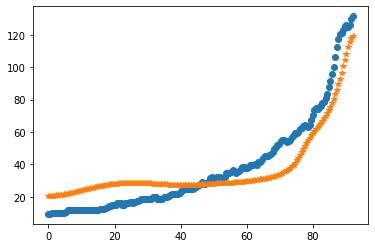

after perturb [1.8519214172168788, 101.54627446874719, 17919.816949915723, 0.05804146660139159, 11.680986933993129]
parameters [1.8519214172168788, 101.54627446874719, 17919.816949915723, 0.05804146660139159, 11.680986933993129]
after perturb [8.535342714936117, 113.00315040503254, 27359.82541509921, 0.3819500389008173, 39.23676042240106]
parameters [8.535342714936117, 113.00315040503254, 27359.82541509921, 0.3819500389008173, 39.23676042240106]
after perturb [7.315231286175202, 143.25537279007796, 29678.94774781921, 0.6719171241124129, 48.63080808116034]
parameters [7.315231286175202, 143.25537279007796, 29678.94774781921, 0.6719171241124129, 48.63080808116034]
after perturb [10.008780677309709, 147.29041074673248, 36357.99032594798, 1.0836016788410756, 42.86934741852821]
parameters [10.008780677309709, 147.29041074673248, 36357.99032594798, 1.0836016788410756, 42.86934741852821]
after perturb [3.0595271078883632, 196.3662494275213, 29419.591987370528, 1.1076499021718642, 24.565628775

KeyboardInterrupt: ignored

In [34]:
sample,weight,dist,data2=principal(epsilons,params_tumor,20,datosdia6)

In [ ]:

print("min accepted distance: ",np.min(dist[-1,:]))
print("median accepted distance: ",np.median(dist[-1,:]))
#print("median evaluated distance: ",np.median(evaluated_distances))


min accepted distance:  52762.668459640554
median accepted distance:  78453.5731954234


In [ ]:
sample[-1,:][0]

[4.863335282515884, 76.61710943048116, 23135.783574618297, 4.356839580423227]

In [ ]:

parameters1= [4.76495877028727, 60.26189054205727, 21996.413967220353, 0.4375711944973535]
parameters2= [5.33584494610712, 73.43027191926723, 24865.310802173808, 0.4067019878331559]
parameters3= [4.649337183907758, 86.27453651399162, 25413.68990399871, 0.5690724364331393]
parameters4= [5.484697901262502, 52.82237178774688, 24042.75079371846, 0.37276522120751276]
parameters5= [4.829888155940412, 80.50026876348845, 28285.7324806885, 0.5259556488822889]

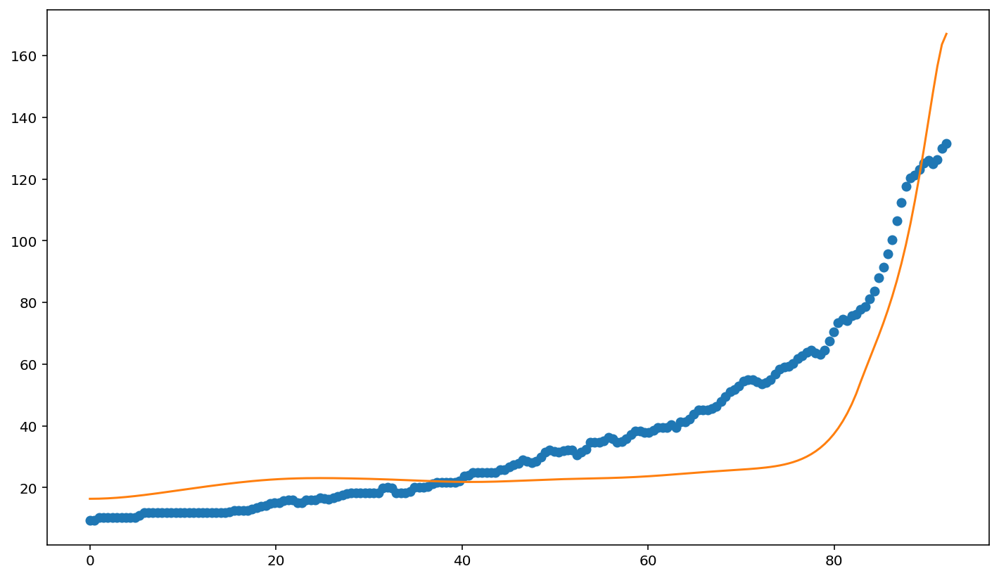

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters1[0],parameters1[1],parameters1[2],U,L,parameters1[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

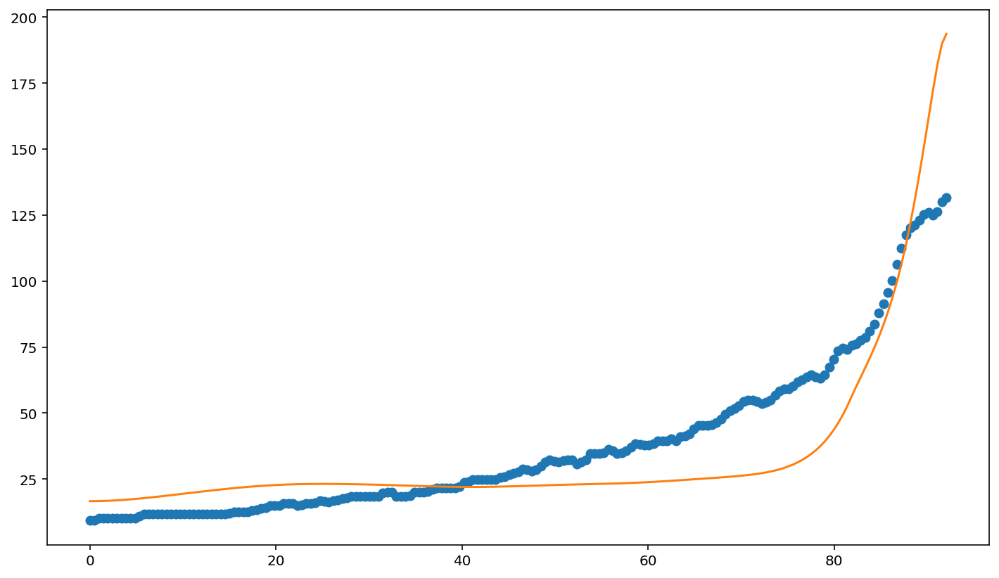

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters2[0],parameters2[1],parameters2[2],U,L,parameters2[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

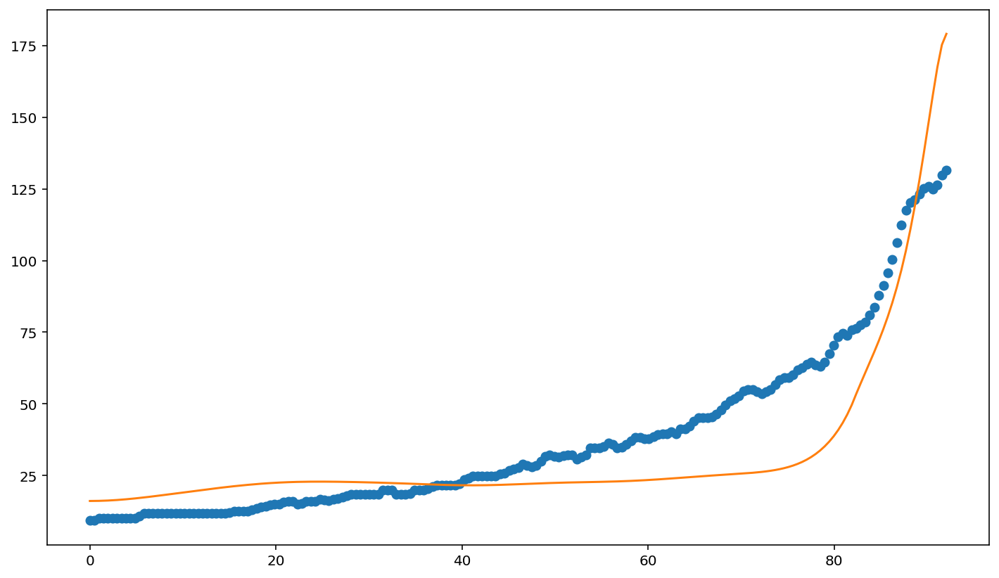

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters3[0],parameters3[1],parameters3[2],U,L,parameters3[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

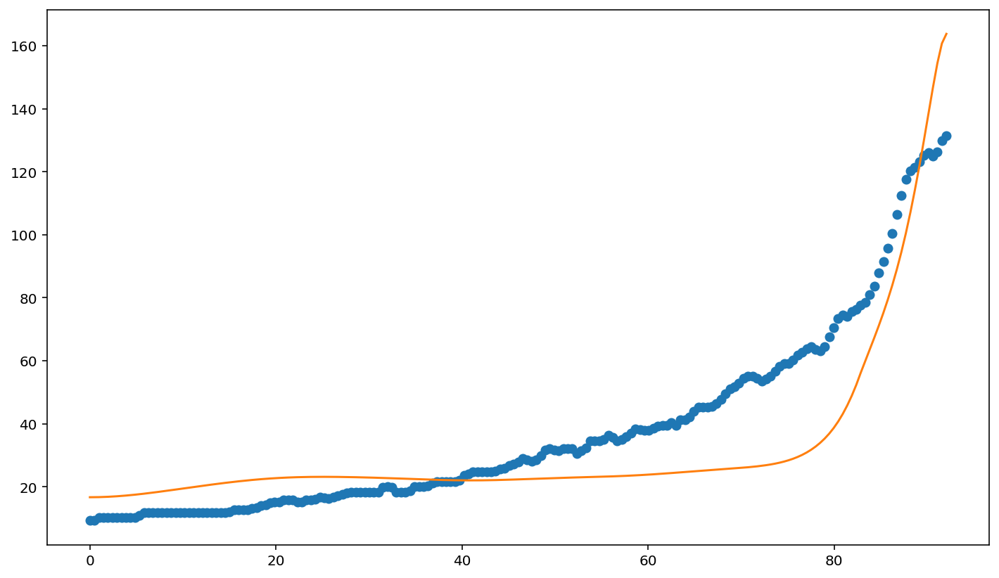

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters4[0],parameters4[1],parameters4[2],U,L,parameters4[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,6.457921078526728,63.48150698619373,20184.084434494922,U,L, 0.32259112576927973,36.75737147800398)).T
plt.plot(x_grid,data2[:,0])
plt.show()

NameError: ignored

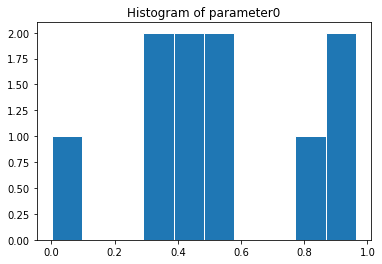

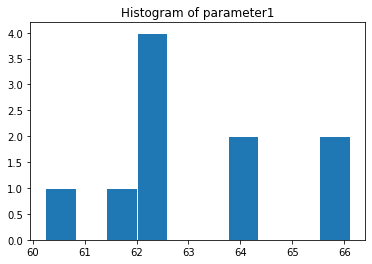

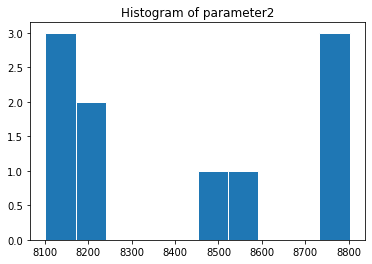

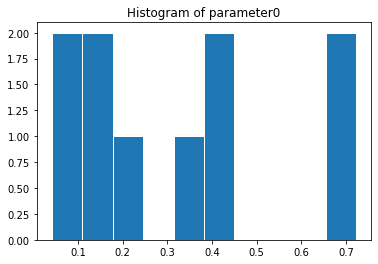

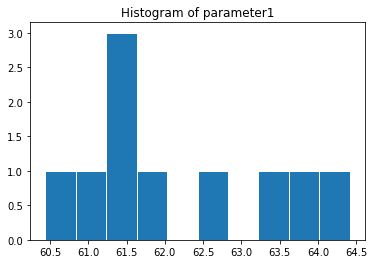

...

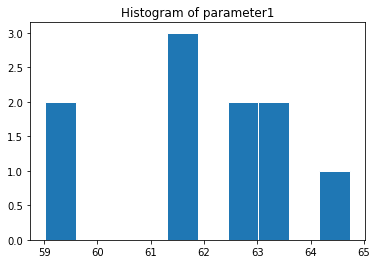

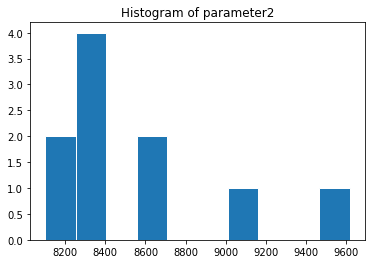

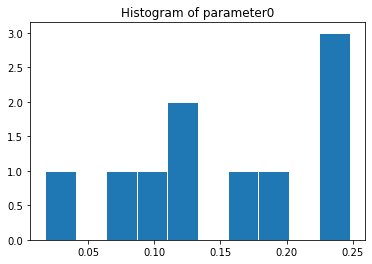

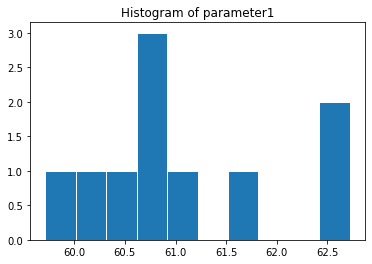

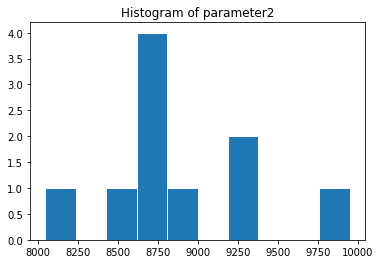

In [ ]:
for k in range(len(epsilons)):
    for j in range(len(params_tumor)):
        plt.figure()
        b=[]
        for i in sample[k,:]:
            b.append(i[j])
        al=np.histogram(b)
        n,bins,patches=plt.hist(b,edgecolor='white')
        plt.title('Histogram of parameter'+str(j))
    plt.show()
plt.show()


In [ ]:
mindis=np.min(dist[-1,:])
mindis

82.15938923923463

In [ ]:
maxdis=np.max(dist)
np.where(dist==mindis)

(array([3]), array([3]))

In [ ]:
maxdis

4281.408060591355

In [ ]:
dist[-1,:]

array([916.92878413, 856.83028974, 657.76463212,  82.15938924,
       195.01326563, 689.78866771, 917.79277168, 706.69752922,
       462.56973763, 720.16895596])